In [268]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import matplotlib.animation as animation
import networkx as nx
import collections
from importlib import reload
import scipy.optimize
# local modules (the classes Lattice, BS)
from src import lattice
from src.lattice import *
from src import bs
from src.bs import *

In [146]:
%matplotlib notebook

In [3]:
def plot_avg_n_species_per_t(lattice, title='Avg number of species over time (for different grain sizes)'):
    # Plot mean species per area using "quadrats" sampling scheme
    assert lattice.data is not None, 'use Lattice.run(collect_data=True)'    
    t_max = lattice.data.shape[0]
    step_size = int(t_max / 100)
    for grain_size in range(1, max(lattice.dimensions)+1):
#     for grain_size in range(1, 4):
        means = []
        for t, species in enumerate(lattice.data[::step_size]):
            mean, std = lattice.avg_n_species(grain_size, species)
            means.append(mean)
        plt.plot(means, label='grain size: %i' % grain_size)
    plt.plot([0,t], [lattice.N_species, lattice.N_species], '--', label='Minimum N species')
    plt.legend()
    plt.margins(0)
    plt.xlabel('t (1/%i)' % step_size)
    plt.ylabel('Avg number of species')
    plt.title(title)
    plt.yscale('log')

# Experiments

In [499]:
reload(bs)
reload(lattice);
from src.bs import *
from src.lattice import *

In [511]:
l = Lattice((10,10), N=100, network=("watts-strogatz", 3, 0),
            P=0.001, fitness_correlation=0.9, migration_bias=1)
# %time l.run(10, collect_data=True)
%time l.run(10, collect_data=False)

CPU times: user 295 ms, sys: 1.35 ms, total: 297 ms
Wall time: 305 ms


In [614]:
S = 5
N = 50
l = Lattice((S,S), N, network=("watts-strogatz", 3, 0),
            P=0.001, fitness_correlation=0.9, migration_bias=1)

t_max = 2000
# data = np.empty((t_max,S*S*N))
data = np.empty((t_max,S,S,N))
print(data.shape)
for t in range(t_max):
    l.run(1, collect_data=False)
#     for i,j in np.ndindex((S,S)):
    for (i,j), bs in l.lattice.nodes.data('BS'):
#         k = i*S+j
#         print(bs.fitness_array().shape)
        for k,v in enumerate(bs.fitness()):
#             print((i*S+j)*N + k)
#             print(i,j,k, (i*S+j)*N + k)
#             data[t, (i*S+j)*S + k] = v[1]
            data[t,i,j,k] = v[1]

(2000, 5, 5, 50)


<IPython.core.display.Javascript object>


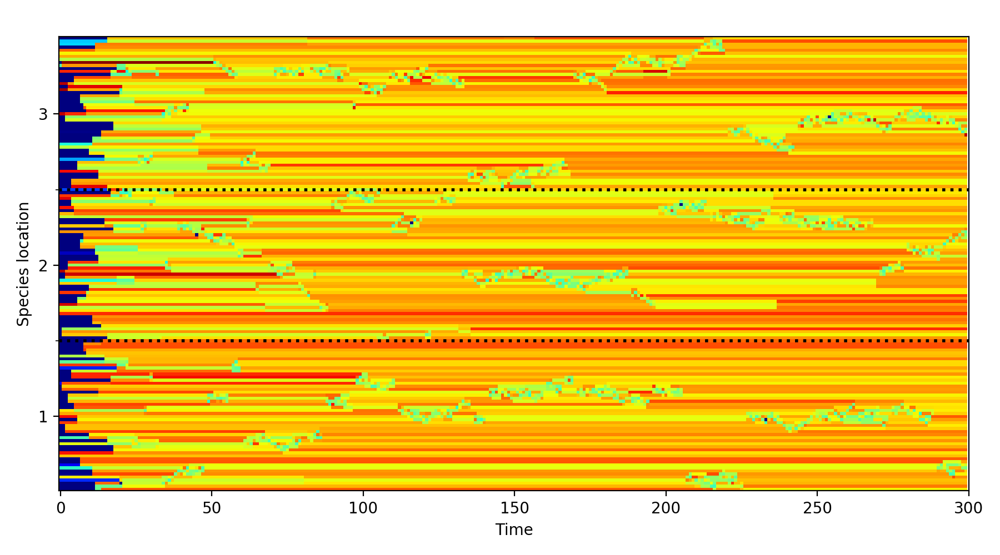

In [782]:
fig, ax = plt.subplots(figsize=(9,5))
tt = 0
dt = 300
n_species = 3
im = data[:,0:n_species,0].reshape(t_max,-1)[tt:tt+dt]
plt.imshow(im.T, cmap='jet', vmin=0.7, vmax=1)

# add gridlines to separate species
n_steps = im.shape[0] / n_species
half_step = n_steps / 2
ax.set_yticks(np.linspace(half_step, im.shape[1] - half_step, n_species).astype(int), minor=True)
plt.grid(which='minor', axis='y', color='black', linestyle=':', linewidth=2, alpha=1)

# add labels
ax.set_yticks(np.linspace(0, n_steps, n_species).astype(int) + N/2, minor=False)
ax.set_yticklabels(np.arange(n_species,0,-1), minor=False)

plt.xticks(np.arange(0, dt+1, 50).astype(int))
plt.xlabel('Time')
plt.ylabel('Species location')
plt.tight_layout()

In [491]:
t,N,M = l.data.shape
data = np.empty(shape=(t,N*M))
for t, i, j in np.ndindex(l.data.shape):
    print(l.data[t,i,j])
    data[t,i*N+j] = l.data[t,i,j]    
    break
# l.data.reshape(l.data.shape[0],-1)
# plt.imshow(data)
# data.shape

AttributeError: 'NoneType' object has no attribute 'shape'

In [399]:
# def fit_linear(data:dict, normalize_func=lambda x:x):
#     """ Fit a dict that consists of {x: y} observations
#     Returns a tuple (slope, intercept, error)
#     """
#     # 
#     x, y = list(zip(*data.items()))
#     f = lambda A, c, z: c * A**z
#     # arguments order determines succes
#     c, z = scipy.optimize.curve_fit(pwr_func, x, y)[0]
#     return z,c

<IPython.core.display.Javascript object>


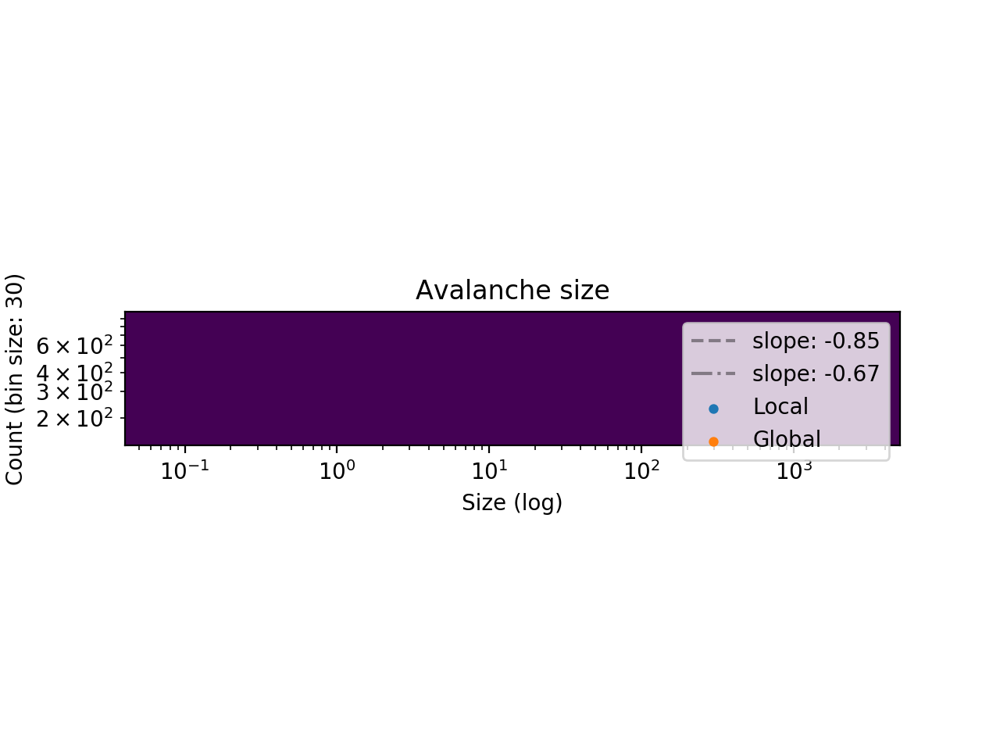

Text(0, 0.5, 'Count (bin size: 30)')

In [461]:
n_bins = 30
all_avalanches = np.concatenate([bs.avalanches.trace for _,bs in l.lattice.nodes.data('BS')])
plt.figure()
for i, (label, avalanches) in enumerate([('Local', all_avalanches), ('Global', l.avalanches.trace)]):
    avalanches = np.log10(avalanches)
    y, x = np.histogram(avalanches, bins=n_bins)
    x = np.array([(x[i] + x[i+1])/2. for i,_ in enumerate(x[:-1])])
    plt.scatter(x, y, label=label, s=12)
    xs = np.logspace(-1.2, 1)
    f = lambda A, c, z: c * A**z
    c,z = scipy.optimize.curve_fit(pwr_func, x, y)[0]
    plt.plot(xs, f(xs, c, z), ['--','-.'][i], label='slope: %0.2f' % z, color='black', alpha=0.4)
    plt.yscale('log')
    plt.xscale('log')
    plt.legend()
plt.title('Avalanche size')
plt.xlabel('Size (log)')
plt.ylabel('Count (bin size: %i)' % n_bins)

<IPython.core.display.Javascript object>


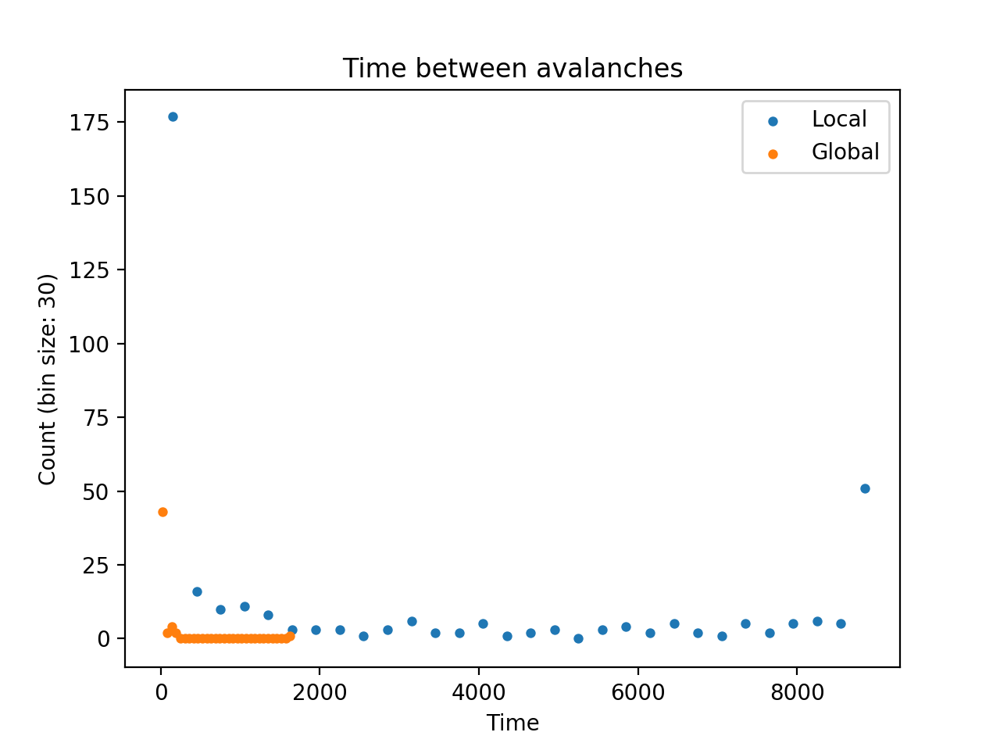

0
1


Text(0, 0.5, 'Count (bin size: 30)')

In [459]:
n_bins = 30
# all_avalanches = np.concatenate([bs.avalanches.time_trace for _,bs in l.lattice.nodes.data('BS')])
plt.figure()
for i, (label, avalanches) in enumerate([('Local', all_avalanches), ('Global', l.avalanches.time_trace)]):
    print(i)
#     avalanches = np.log10(avalanches)
    y, x = np.histogram(avalanches, bins=n_bins)
    x = np.array([(x[i] + x[i+1])/2. for i,_ in enumerate(x[:-1])])
    plt.scatter(x, y, label=label, s=12)
    xs = np.logspace(-1.2, 1)
    f = lambda A, c, z: c * A**z
    c,z = scipy.optimize.curve_fit(pwr_func, x, y)[0]
#     plt.plot(xs, f(xs, c, z), ['--','-.'][i], label='slope: %0.2f' % z, color='black', alpha=0.4)
#     plt.yscale('log')
#     plt.xscale('log')
    plt.legend()
plt.title('Time between avalanches')
plt.xlabel('Time')
plt.ylabel('Count (bin size: %i)' % n_bins)

In [400]:
# fig, axes = plt.subplots(1, 2, figsize=(8,4))
# ax1, ax2 = axes

# normalize_func = np.log
# avalanches = collections.Counter(all_avalanches)
# outliers = []
# for k,v in list(avalanches.items()):
#     if v <= 1:
#         avalanches.pop(k)
#         outliers.append(v)
# slope, intercept = fit_linear(avalanches, normalize_func)
# avalanches = collections.Counter(all_avalanches)
# x = np.logspace(0,3)
# ax1.plot(x, intercept * x**(slope), '--', color='black', alpha=0.4)
# for k,v in avalanches.items():
#     if v in outliers:
# #         ax1.scatter(k,v, s=3, color='grey', alpha=0.5)
#         0
#     else:
#         ax1.scatter(k,v, s=8, color='g')

# ax1.scatter(np.mean(outliers), len(outliers), color='grey', s=10)
# print(np.mean(outliers), len(outliers))
    
# avalanches = collections.Counter(l.avalanches.trace)
# for k,v in list(avalanches.items()):
#     if v <= 2:
#         avalanches.pop(k)
# slope, intercept = fit_linear(avalanches, normalize_func)
# ax2.plot(x, intercept * x**(slope), '--', color='black', alpha=0.3)
# for k,v in avalanches.items():
#     ax2.scatter(k,v, s=5, color='g')

# ax1.set_title('Local')
# ax2.set_title('Global')
# for ax in axes:
#     ax.set_xscale('log')
#     ax.set_yscale('log')
#     ax.set_xlabel('log S')
#     ax.set_ylabel('log P(S)')
# plt.tight_layout()
# plt.margins(0)
# plt.suptitle('Avalanche size')

In [401]:
# b_h, b_b, _ = plt.hist(all_avalanches, bins=20)
# b_c = b_b[:-1] + np.diff(b_b) / 2
# xs = np.linspace(b_b[0], b_b[-1], 100)
# plt.plot(xs, pwr_func(xs, *pars), label="fit")

<IPython.core.display.Javascript object>


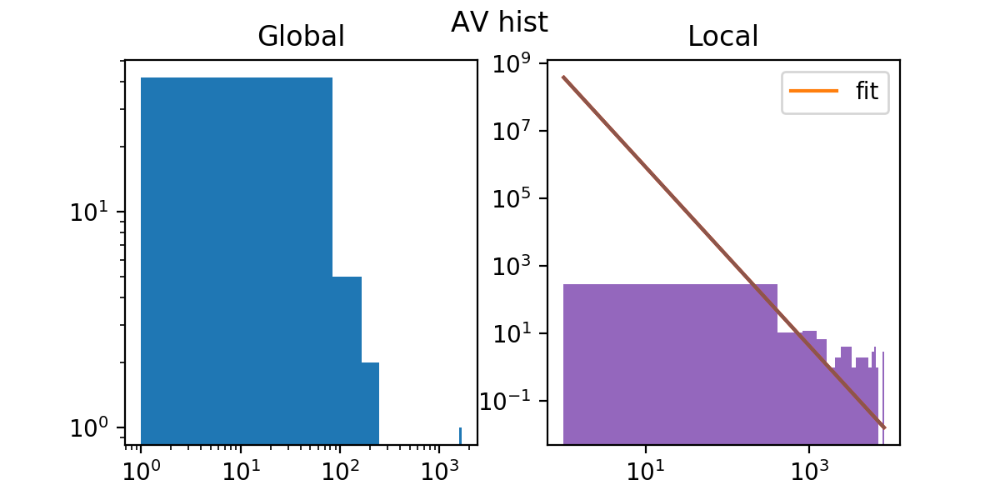

[ 3.80480994e+08 -2.64471699e+00]


In [251]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,3))
plt.suptitle('AV hist')

ax1.set_title('Global')
ax1.hist(l.avalanches.trace, bins=20)
ax1.set_xscale("log")
ax1.set_yscale("log")

ax2.set_title('Local') # sample size = 1
b_h, b_b, _ = ax2.hist(all_avalanches, bins=20)
ax2.set_xscale("log")
ax2.set_yscale("log")

b_c = b_b[:-1] + np.diff(b_b) / 2

pwr_func = lambda A, c, z: c * A**z
pars, _ = scipy.optimize.curve_fit(pwr_func, b_c, b_h)
print(pars)
xs = np.linspace(b_b[0], b_b[-1], 100)
plt.plot(xs, pwr_func(xs, *pars), label="fit")
plt.legend()

<IPython.core.display.Javascript object>


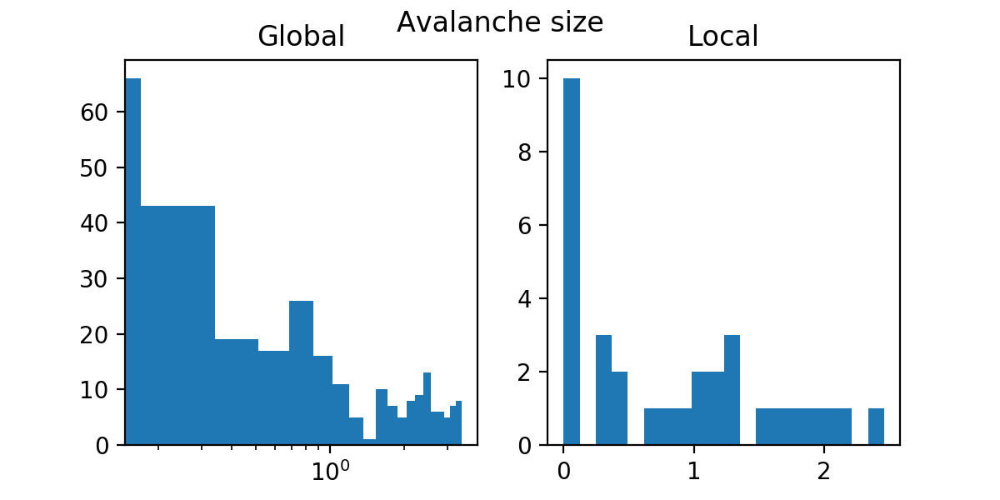

In [236]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,3))
ax1.set_title('Global')
ax1.hist(np.log10(all_avalanches), bins=20, histtype='bar')
ax2.set_title('Local')
ax2.hist(np.log10(l.avalanches.trace), bins=20, histtype='bar')
plt.suptitle('Avalanche size')
# ax1.set_yscale('log')
# ax1.set_yscale('log')
# ax2.set_yscale('log')

## Parameter testing

In [5]:
path_slope = "slope.pkl"
path_mse = "mse.pkl"
path_pow = "law.pkl"
path_fit = "fit.pkl"
iters = 10
# fitness_correlation_list = np.linspace(0,1,iters)
fitness_correlation_list = np.linspace(0,1, iters)**(1/2)
migration_bias_list = [-1, 0, 1]

# migration_bias_list = [1]


power_slope = np.zeros((iters, len(migration_bias_list)))
mse = np.zeros((iters, len(migration_bias_list)))
is_power_law = np.ones((iters, len(migration_bias_list)))
avg_fitness = np.zeros((iters, len(migration_bias_list)))

In [6]:
for i, fc in enumerate(fitness_correlation_list):
    for j, mb in enumerate(migration_bias_list):
        print('(%i, %i), \tfitness corr: %0.3f, mb: %i' % (i,j, fc, mb))
        l = Lattice((10,10), N=100, network=("watts-strogatz", 3, 0),
                P=0.001, fitness_correlation=fc, migration_bias=mb)
        l.run(3000, collect_data=False)
        power_slope[i, j], mse[i,j] = l.area_curve("quadrats", plot_bool=False)
        if (mse[i,j] > 0.015):
            is_power_law[i,j] = 0
        avg_fitness[i,j] = l.avg_fitness()

    with open(path_slope, 'wb') as f:
        pickle.dump(power_slope, f)
    with open(path_mse, 'wb') as f:
        pickle.dump(mse, f)        
    with open(path_pow, 'wb') as f:
        pickle.dump(is_power_law, f)
    with open(path_fit, 'wb') as f:
        pickle.dump(avg_fitness, f)

(0, 0), 	fitness corr: 0.000, mb: -1


/Users/mark/stack/doc/school/Complex System Simulation/project/src/lattice.py:201: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  power, res = np.linalg.lstsq(X, y)[0:2]


power: 0.5, MSE: 0.03523494188039017
(0, 1), 	fitness corr: 0.000, mb: 0
power: 0.639, MSE: 0.009199770523120866
(0, 2), 	fitness corr: 0.000, mb: 1
power: 0.42, MSE: 0.011723354905930763
(1, 0), 	fitness corr: 0.333, mb: -1
power: 0.494, MSE: 0.045805256576390854
(1, 1), 	fitness corr: 0.333, mb: 0
power: 0.616, MSE: 0.012643682434531938
(1, 2), 	fitness corr: 0.333, mb: 1
power: 0.378, MSE: 0.012031428091613177
(2, 0), 	fitness corr: 0.471, mb: -1
power: 0.485, MSE: 0.04995708747734891
(2, 1), 	fitness corr: 0.471, mb: 0
power: 0.59, MSE: 0.015845568718107845
(2, 2), 	fitness corr: 0.471, mb: 1
power: 0.345, MSE: 0.01320824871292423
(3, 0), 	fitness corr: 0.577, mb: -1
power: 0.482, MSE: 0.051216759593278594
(3, 1), 	fitness corr: 0.577, mb: 0
power: 0.582, MSE: 0.019119160842446116
(3, 2), 	fitness corr: 0.577, mb: 1
power: 0.34, MSE: 0.014095214137507696
(4, 0), 	fitness corr: 0.667, mb: -1
power: 0.469, MSE: 0.0576148283783976
(4, 1), 	fitness corr: 0.667, mb: 0
power: 0.554, MSE:

Migration failed from [(0, 7337), (1, 7801), (2, 434), (3, 3017), (4, 4461), (5, 8393), (6, 7857), (7, 1236), (8, 7805), (9, 9777), (10, 7488), (11, 3873), (12, 1518), (13, 3490), (14, 8817), (15, 2128), (16, 9853), (17, 9292), (18, 7131), (19, 6689), (20, 930), (21, 4095), (22, 4693), (23, 891), (24, 5059), (25, 3502), (26, 4320), (27, 7692), (28, 2907), (29, 4206), (30, 5547), (31, 2464), (32, 6066), (33, 5049), (34, 5666), (35, 5461), (36, 1990), (37, 3223), (38, 6782), (39, 2775), (40, 7039), (41, 7925), (42, 3995), (43, 5114), (44, 3164), (45, 7495), (46, 1055), (47, 3369), (48, 4889), (49, 8777), (50, 7159), (51, 406), (52, 5902), (53, 8939), (54, 8106), (55, 8464), (56, 7681), (57, 9048), (58, 4427), (59, 1374), (60, 7474), (61, 1065), (62, 4223), (63, 4855), (64, 5453), (65, 8505), (66, 2597), (67, 3287), (68, 4130), (69, 7415), (70, 9206), (71, 307), (72, 6882), (73, 5355), (74, 7997), (75, 9871), (76, 1510), (77, 8682), (78, 5872), (79, 1783), (80, 8921), (81, 2908), (82, 146

Migration failed from [(0, 9871), (1, 7681), (2, 7415), (3, 1678), (4, 7488), (5, 8106), (6, 8676), (7, 8505), (8, 7474), (9, 5114), (10, 3490), (11, 2128), (12, 7159), (13, 6882), (14, 7131), (15, 4320), (16, 5576), (17, 9853), (18, 8682), (19, 7925), (20, 1747), (21, 7801), (22, 2908), (23, 5049), (24, 1065), (25, 3369), (26, 5666), (27, 5872), (28, 2597), (29, 5355), (30, 4693), (31, 3017), (32, 7337), (33, 8817), (34, 5059), (35, 7196), (36, 1236), (37, 6689), (38, 5931), (39, 4130), (40, 4441), (41, 9206), (42, 7495), (43, 9929), (44, 3223), (45, 146), (46, 6782), (47, 4095), (48, 6066), (49, 7805), (50, 4223), (51, 8777), (52, 1783), (53, 307), (54, 5547), (55, 3873), (56, 891), (57, 5461), (58, 5453), (59, 2907), (60, 4427), (61, 4889), (62, 1510), (63, 4461), (64, 1990), (65, 1955), (66, 434), (67, 1055), (68, 691), (69, 3502), (70, 930), (71, 1374), (72, 3287), (73, 406), (74, 3224), (75, 7692), (76, 1518), (77, 2213), (78, 8050), (79, 2775), (80, 4819), (81, 8208), (82, 3995)

Migration failed from [(0, 7196), (1, 3287), (2, 5872), (3, 5461), (4, 420), (5, 8050), (6, 7997), (7, 3502), (8, 8393), (9, 891), (10, 2128), (11, 4461), (12, 8208), (13, 3223), (14, 8682), (15, 5666), (16, 7415), (17, 7692), (18, 5547), (19, 3873), (20, 8505), (21, 8777), (22, 8817), (23, 4427), (24, 5453), (25, 4206), (26, 4130), (27, 2213), (28, 2907), (29, 8921), (30, 9853), (31, 7925), (32, 4223), (33, 7495), (34, 7801), (35, 9871), (36, 5049), (37, 930), (38, 406), (39, 1510), (40, 434), (41, 8676), (42, 3995), (43, 2842), (44, 3017), (45, 1374), (46, 7681), (47, 1783), (48, 2597), (49, 4819), (50, 1236), (51, 2775), (52, 3490), (53, 8464), (54, 1990), (55, 1955), (56, 691), (57, 7474), (58, 6882), (59, 2908), (60, 6782), (61, 7016), (62, 5902), (63, 5576), (64, 3164), (65, 8939), (66, 4441), (67, 7159), (68, 8106), (69, 9929), (70, 1747), (71, 2464), (72, 5114), (73, 1055), (74, 7039), (75, 3224), (76, 4693), (77, 7857), (78, 9292), (79, 9048), (80, 4855), (81, 7131), (82, 7337

Migration failed from [(0, 3164), (1, 7159), (2, 4206), (3, 1518), (4, 1747), (5, 5931), (6, 1236), (7, 5114), (8, 3369), (9, 8676), (10, 4819), (11, 4855), (12, 7196), (13, 9292), (14, 8939), (15, 5902), (16, 6882), (17, 7857), (18, 8505), (19, 3490), (20, 4461), (21, 5547), (22, 8393), (23, 3287), (24, 8777), (25, 8817), (26, 420), (27, 3223), (28, 8050), (29, 7488), (30, 7495), (31, 2842), (32, 2908), (33, 6782), (34, 2597), (35, 691), (36, 434), (37, 7805), (38, 891), (39, 9871), (40, 1955), (41, 1065), (42, 4427), (43, 4889), (44, 146), (45, 7692), (46, 2907), (47, 2464), (48, 5872), (49, 1374), (50, 4130), (51, 2775), (52, 1510), (53, 9929), (54, 5049), (55, 7801), (56, 9853), (57, 10141), (58, 5355), (59, 406), (60, 7131), (61, 1055), (62, 6066), (63, 1678), (64, 930), (65, 9206), (66, 8682), (67, 307), (68, 7415), (69, 3502), (70, 3995), (71, 4223), (72, 2213), (73, 7681), (74, 5666), (75, 4095), (76, 4320), (77, 3224), (78, 7016), (79, 8464), (80, 3873), (81, 5461), (82, 2128)

Migration failed from [(0, 7997), (1, 8464), (2, 8682), (3, 4441), (4, 8393), (5, 2908), (6, 7495), (7, 2775), (8, 7857), (9, 7016), (10, 7337), (11, 4223), (12, 1990), (13, 6782), (14, 7681), (15, 891), (16, 406), (17, 2128), (18, 1065), (19, 7196), (20, 2907), (21, 8676), (22, 1783), (23, 4427), (24, 7474), (25, 9206), (26, 1678), (27, 4855), (28, 5931), (29, 1510), (30, 7925), (31, 2213), (32, 7159), (33, 1236), (34, 3873), (35, 4206), (36, 8106), (37, 7131), (38, 6882), (39, 5576), (40, 3017), (41, 691), (42, 9871), (43, 4693), (44, 10141), (45, 8050), (46, 9853), (47, 146), (48, 2597), (49, 3223), (50, 7801), (51, 5666), (52, 9292), (53, 5453), (54, 4461), (55, 930), (56, 1055), (57, 5114), (58, 2842), (59, 5059), (60, 8817), (61, 2464), (62, 5547), (63, 7805), (64, 434), (65, 3502), (66, 4320), (67, 3490), (68, 4095), (69, 7415), (70, 4889), (71, 8921), (72, 3995), (73, 1955), (74, 4130), (75, 8505), (76, 5461), (77, 1747), (78, 3224), (79, 9048), (80, 3287), (81, 7692), (82, 336

Migration failed from [(0, 9871), (1, 7681), (2, 7415), (3, 1678), (4, 7488), (5, 8106), (6, 8676), (7, 8505), (8, 7474), (9, 5114), (10, 3490), (11, 2128), (12, 7159), (13, 6882), (14, 7131), (15, 4320), (16, 5576), (17, 9853), (18, 8682), (19, 7925), (20, 1747), (21, 7801), (22, 2908), (23, 5049), (24, 1065), (25, 3369), (26, 5666), (27, 5872), (28, 2597), (29, 5355), (30, 4693), (31, 3017), (32, 7337), (33, 8817), (34, 5059), (35, 7196), (36, 1236), (37, 6689), (38, 5931), (39, 4130), (40, 4441), (41, 9206), (42, 7495), (43, 9929), (44, 3223), (45, 146), (46, 6782), (47, 4095), (48, 6066), (49, 7805), (50, 4223), (51, 8777), (52, 1783), (53, 307), (54, 5547), (55, 3873), (56, 891), (57, 5461), (58, 5453), (59, 4427), (60, 8939), (61, 2907), (62, 1990), (63, 4889), (64, 1510), (65, 4461), (66, 1055), (67, 1955), (68, 691), (69, 3502), (70, 930), (71, 3995), (72, 3287), (73, 1374), (74, 10141), (75, 406), (76, 3224), (77, 7692), (78, 1518), (79, 2213), (80, 2775), (81, 10172), (82, 80

Migration failed from [(0, 8676), (1, 691), (2, 8050), (3, 9871), (4, 5931), (5, 7488), (6, 5114), (7, 7925), (8, 5666), (9, 1374), (10, 4095), (11, 8106), (12, 307), (13, 7692), (14, 7805), (15, 3224), (16, 4223), (17, 3223), (18, 1236), (19, 7196), (20, 6882), (21, 5872), (22, 10141), (23, 4819), (24, 3287), (25, 1518), (26, 6689), (27, 2842), (28, 4461), (29, 1955), (30, 4130), (31, 891), (32, 8921), (33, 8682), (34, 4889), (35, 3369), (36, 9853), (37, 2128), (38, 7131), (39, 2597), (40, 7801), (41, 1055), (42, 5049), (43, 7039), (44, 2464), (45, 7474), (46, 6782), (47, 2213), (48, 1990), (49, 406), (50, 3017), (51, 3995), (52, 7997), (53, 5355), (54, 5547), (55, 3490), (56, 5902), (57, 8464), (58, 3502), (59, 9292), (60, 1065), (61, 4855), (62, 4693), (63, 2908), (64, 4206), (65, 5059), (66, 7857), (67, 420), (68, 5461), (69, 7159), (70, 10172), (71, 8777), (72, 8505), (73, 4320), (74, 5576), (75, 9048), (76, 8817), (77, 1783), (78, 9206), (79, 7681), (80, 7495), (81, 1678), (82, 4

Migration failed from [(0, 8393), (1, 3502), (2, 8939), (3, 5931), (4, 9048), (5, 7801), (6, 4223), (7, 7857), (8, 5547), (9, 146), (10, 2464), (11, 7337), (12, 7159), (13, 9206), (14, 691), (15, 7196), (16, 6689), (17, 5114), (18, 930), (19, 5461), (20, 8921), (21, 5059), (22, 8676), (23, 3164), (24, 2213), (25, 8682), (26, 9292), (27, 7692), (28, 7495), (29, 6882), (30, 8106), (31, 7488), (32, 3873), (33, 1990), (34, 1236), (35, 7039), (36, 4819), (37, 3224), (38, 1374), (39, 2842), (40, 7805), (41, 1065), (42, 307), (43, 5666), (44, 7681), (45, 4130), (46, 8050), (47, 7016), (48, 7131), (49, 4427), (50, 5576), (51, 3995), (52, 4855), (53, 2775), (54, 1747), (55, 6782), (56, 9929), (57, 2908), (58, 4461), (59, 1055), (60, 3287), (61, 4889), (62, 5902), (63, 420), (64, 1678), (65, 4320), (66, 1955), (67, 7415), (68, 1518), (69, 406), (70, 8777), (71, 3017), (72, 3490), (73, 7997), (74, 5049), (75, 4441), (76, 4095), (77, 7925), (78, 10141), (79, 2597), (80, 10172), (81, 2128), (82, 58

Migration failed from [(0, 8682), (1, 8921), (2, 4819), (3, 10141), (4, 1747), (5, 7801), (6, 1678), (7, 5355), (8, 6882), (9, 7692), (10, 8817), (11, 7337), (12, 2908), (13, 7016), (14, 406), (15, 9929), (16, 7131), (17, 4855), (18, 4441), (19, 6066), (20, 2213), (21, 1783), (22, 930), (23, 2128), (24, 3287), (25, 5049), (26, 9871), (27, 2597), (28, 2907), (29, 5461), (30, 3490), (31, 8939), (32, 5547), (33, 7857), (34, 5666), (35, 1955), (36, 2842), (37, 3995), (38, 1510), (39, 7805), (40, 9292), (41, 5931), (42, 5114), (43, 4095), (44, 420), (45, 891), (46, 1236), (47, 1055), (48, 1374), (49, 4206), (50, 3223), (51, 7681), (52, 1990), (53, 2775), (54, 3164), (55, 8106), (56, 5576), (57, 5453), (58, 1518), (59, 7474), (60, 3369), (61, 8050), (62, 8208), (63, 3873), (64, 8505), (65, 2464), (66, 1065), (67, 4320), (68, 7495), (69, 10172), (70, 3224), (71, 4427), (72, 3502), (73, 3017), (74, 7488), (75, 8464), (76, 8777), (77, 7039), (78, 4889), (79, 5902), (80, 6689), (81, 7925), (82, 

Migration failed from [(0, 9206), (1, 10141), (2, 7925), (3, 5576), (4, 4441), (5, 6066), (6, 1055), (7, 4320), (8, 5872), (9, 3224), (10, 1955), (11, 7692), (12, 3490), (13, 891), (14, 8682), (15, 1510), (16, 5547), (17, 3873), (18, 7131), (19, 5902), (20, 5355), (21, 7196), (22, 7805), (23, 3287), (24, 4206), (25, 3369), (26, 8393), (27, 2597), (28, 9929), (29, 420), (30, 7039), (31, 8939), (32, 930), (33, 7997), (34, 9292), (35, 9853), (36, 2128), (37, 5049), (38, 8676), (39, 5931), (40, 4889), (41, 4461), (42, 7016), (43, 3502), (44, 7495), (45, 1518), (46, 10172), (47, 7488), (48, 5666), (49, 4130), (50, 5461), (51, 2842), (52, 1065), (53, 1747), (54, 2907), (55, 8817), (56, 8777), (57, 9048), (58, 4819), (59, 1678), (60, 146), (61, 4855), (62, 7801), (63, 1783), (64, 7474), (65, 3017), (66, 6782), (67, 3995), (68, 8921), (69, 3164), (70, 1374), (71, 1236), (72, 406), (73, 4223), (74, 2775), (75, 8106), (76, 691), (77, 7415), (78, 7337), (79, 8050), (80, 7857), (81, 6689), (82, 85

Migration failed from [(0, 1990), (1, 4889), (2, 2213), (3, 8939), (4, 8106), (5, 3369), (6, 5902), (7, 9929), (8, 5461), (9, 5872), (10, 5059), (11, 3502), (12, 3223), (13, 2464), (14, 7925), (15, 4461), (16, 4095), (17, 1678), (18, 2842), (19, 7196), (20, 9871), (21, 7039), (22, 7692), (23, 691), (24, 4223), (25, 8921), (26, 7415), (27, 1236), (28, 7857), (29, 2128), (30, 4320), (31, 7474), (32, 1055), (33, 1955), (34, 4427), (35, 3164), (36, 146), (37, 5049), (38, 406), (39, 9853), (40, 7805), (41, 930), (42, 10172), (43, 7495), (44, 1518), (45, 6882), (46, 1065), (47, 5114), (48, 5355), (49, 6689), (50, 8676), (51, 1510), (52, 3873), (53, 420), (54, 307), (55, 9206), (56, 3224), (57, 7681), (58, 5666), (59, 9292), (60, 5576), (61, 3287), (62, 2597), (63, 8050), (64, 8682), (65, 1747), (66, 8505), (67, 7997), (68, 5453), (69, 3017), (70, 8464), (71, 7131), (72, 6782), (73, 3490), (74, 1374), (75, 7488), (76, 8393), (77, 2908), (78, 7159), (79, 2775), (80, 5931), (81, 891), (82, 8777

Migration failed from [(0, 5872), (1, 4095), (2, 1510), (3, 1783), (4, 7857), (5, 7016), (6, 3164), (7, 9048), (8, 8817), (9, 9929), (10, 3369), (11, 7337), (12, 1065), (13, 1518), (14, 2597), (15, 3017), (16, 7415), (17, 2775), (18, 434), (19, 5059), (20, 5461), (21, 10172), (22, 3287), (23, 2842), (24, 2907), (25, 4223), (26, 8676), (27, 5931), (28, 1055), (29, 891), (30, 2128), (31, 4819), (32, 2213), (33, 7131), (34, 6689), (35, 10141), (36, 5355), (37, 1374), (38, 4206), (39, 8682), (40, 146), (41, 2464), (42, 7474), (43, 8777), (44, 5902), (45, 9292), (46, 7997), (47, 4427), (48, 1747), (49, 5453), (50, 6882), (51, 420), (52, 3995), (53, 8939), (54, 7488), (55, 691), (56, 7925), (57, 3873), (58, 7692), (59, 9206), (60, 7196), (61, 4320), (62, 6782), (63, 8393), (64, 5114), (65, 7805), (66, 2908), (67, 1236), (68, 4855), (69, 307), (70, 4693), (71, 1990), (72, 9853), (73, 4889), (74, 3223), (75, 7681), (76, 9871), (77, 1955), (78, 930), (79, 8921), (80, 7495), (81, 5547), (82, 780

Migration failed from [(0, 8921), (1, 406), (2, 7337), (3, 5453), (4, 7131), (5, 307), (6, 5576), (7, 3873), (8, 5114), (9, 7681), (10, 1955), (11, 8393), (12, 4427), (13, 1236), (14, 5461), (15, 891), (16, 4095), (17, 4461), (18, 7039), (19, 5355), (20, 1518), (21, 6882), (22, 8464), (23, 5902), (24, 691), (25, 10141), (26, 146), (27, 1990), (28, 4855), (29, 8817), (30, 9206), (31, 2128), (32, 3164), (33, 8777), (34, 8682), (35, 2464), (36, 420), (37, 9929), (38, 3223), (39, 1678), (40, 9292), (41, 1510), (42, 4889), (43, 2597), (44, 9853), (45, 4819), (46, 7474), (47, 4130), (48, 6066), (49, 5049), (50, 7196), (51, 6782), (52, 3995), (53, 7997), (54, 4206), (55, 7415), (56, 930), (57, 434), (58, 2908), (59, 3287), (60, 8050), (61, 2775), (62, 1065), (63, 1055), (64, 7805), (65, 5666), (66, 4693), (67, 8106), (68, 10172), (69, 1747), (70, 4223), (71, 3502), (72, 2213), (73, 7857), (74, 7488), (75, 3224), (76, 4320), (77, 5931), (78, 8676), (79, 3490), (80, 3017), (81, 5547), (82, 4441

Migration failed from [(0, 9206), (1, 3369), (2, 8921), (3, 8817), (4, 1236), (5, 7415), (6, 307), (7, 4427), (8, 3224), (9, 8682), (10, 7801), (11, 3164), (12, 4206), (13, 7997), (14, 5872), (15, 7159), (16, 7131), (17, 1510), (18, 9048), (19, 7495), (20, 9292), (21, 8939), (22, 420), (23, 5059), (24, 3223), (25, 4320), (26, 1065), (27, 2908), (28, 7488), (29, 891), (30, 6066), (31, 4441), (32, 2907), (33, 8676), (34, 4130), (35, 7337), (36, 7016), (37, 2464), (38, 5049), (39, 3995), (40, 5453), (41, 4889), (42, 7692), (43, 1055), (44, 1678), (45, 5931), (46, 8464), (47, 5114), (48, 10141), (49, 6689), (50, 3873), (51, 6882), (52, 4095), (53, 2597), (54, 5461), (55, 10172), (56, 2128), (57, 4461), (58, 930), (59, 3490), (60, 9929), (61, 1747), (62, 8106), (63, 2213), (64, 8050), (65, 5547), (66, 2842), (67, 3502), (68, 4693), (69, 406), (70, 7925), (71, 8393), (72, 7196), (73, 9871), (74, 1518), (75, 1374), (76, 691), (77, 1955), (78, 1990), (79, 4819), (80, 5355), (81, 5576), (82, 17

Migration failed from [(0, 3369), (1, 8050), (2, 3873), (3, 1783), (4, 8106), (5, 5576), (6, 5902), (7, 930), (8, 6689), (9, 9048), (10, 1055), (11, 1518), (12, 891), (13, 4320), (14, 4819), (15, 2213), (16, 5461), (17, 307), (18, 7681), (19, 691), (20, 146), (21, 5931), (22, 6066), (23, 4206), (24, 8682), (25, 1065), (26, 4130), (27, 7801), (28, 5049), (29, 7857), (30, 7039), (31, 5059), (32, 1510), (33, 7488), (34, 5453), (35, 2775), (36, 4855), (37, 8676), (38, 3287), (39, 7997), (40, 6782), (41, 7415), (42, 406), (43, 2908), (44, 8921), (45, 7805), (46, 8939), (47, 7692), (48, 4441), (49, 2597), (50, 5114), (51, 5547), (52, 3995), (53, 7495), (54, 1747), (55, 7196), (56, 8817), (57, 7131), (58, 8777), (59, 5872), (60, 1374), (61, 7337), (62, 1678), (63, 2464), (64, 3017), (65, 6882), (66, 5355), (67, 1990), (68, 2907), (69, 4095), (70, 5666), (71, 10172), (72, 3164), (73, 8464), (74, 1236), (75, 10141), (76, 9871), (77, 7474), (78, 9206), (79, 7159), (80, 7925), (81, 9853), (82, 28

Migration failed from [(0, 2597), (1, 1055), (2, 9929), (3, 3287), (4, 8106), (5, 4320), (6, 5872), (7, 307), (8, 6882), (9, 9871), (10, 5461), (11, 4693), (12, 5355), (13, 1510), (14, 7925), (15, 2907), (16, 4855), (17, 4223), (18, 7801), (19, 4461), (20, 5931), (21, 146), (22, 3017), (23, 7681), (24, 4819), (25, 9048), (26, 7039), (27, 420), (28, 3164), (29, 6066), (30, 4889), (31, 7159), (32, 8921), (33, 10141), (34, 2775), (35, 406), (36, 7131), (37, 5902), (38, 1236), (39, 1990), (40, 4206), (41, 7997), (42, 891), (43, 7488), (44, 9292), (45, 1747), (46, 4095), (47, 930), (48, 8050), (49, 9853), (50, 2128), (51, 3224), (52, 7016), (53, 7474), (54, 9206), (55, 1783), (56, 8817), (57, 7805), (58, 3369), (59, 8464), (60, 8682), (61, 1374), (62, 4427), (63, 5059), (64, 7692), (65, 5576), (66, 4130), (67, 3995), (68, 3223), (69, 3873), (70, 3490), (71, 8939), (72, 3502), (73, 7415), (74, 6782), (75, 5114), (76, 1518), (77, 7337), (78, 2908), (79, 8676), (80, 8777), (81, 2213), (82, 284

Migration failed from [(0, 5576), (1, 2464), (2, 4320), (3, 5059), (4, 9048), (5, 8464), (6, 3224), (7, 4223), (8, 406), (9, 2213), (10, 3369), (11, 6782), (12, 9929), (13, 2775), (14, 7997), (15, 1747), (16, 6882), (17, 6066), (18, 7488), (19, 1783), (20, 3223), (21, 10141), (22, 7692), (23, 5931), (24, 5902), (25, 3287), (26, 7805), (27, 5049), (28, 4819), (29, 4095), (30, 2907), (31, 7016), (32, 8106), (33, 7159), (34, 9206), (35, 4206), (36, 891), (37, 10172), (38, 7495), (39, 1510), (40, 7196), (41, 8505), (42, 8676), (43, 7337), (44, 9292), (45, 7681), (46, 4427), (47, 1678), (48, 4693), (49, 1518), (50, 3164), (51, 7801), (52, 1065), (53, 3490), (54, 5114), (55, 9871), (56, 7039), (57, 5453), (58, 8921), (59, 3873), (60, 4130), (61, 8777), (62, 2128), (63, 5355), (64, 5872), (65, 1990), (66, 1955), (67, 8682), (68, 930), (69, 6689), (70, 420), (71, 3502), (72, 5666), (73, 8393), (74, 8817), (75, 3017), (76, 4855), (77, 5461), (78, 7131), (79, 9853), (80, 7415), (81, 8050), (82, 

Migration failed from [(0, 307), (1, 10141), (2, 7131), (3, 1678), (4, 5453), (5, 5666), (6, 6882), (7, 1236), (8, 8777), (9, 4427), (10, 4461), (11, 146), (12, 8676), (13, 7925), (14, 9871), (15, 8464), (16, 8939), (17, 7159), (18, 8050), (19, 7681), (20, 1055), (21, 5355), (22, 2597), (23, 5931), (24, 7039), (25, 3224), (26, 4130), (27, 3164), (28, 2128), (29, 2907), (30, 3017), (31, 1747), (32, 7857), (33, 9292), (34, 9853), (35, 7805), (36, 4223), (37, 10279), (38, 8106), (39, 5576), (40, 1374), (41, 1955), (42, 2842), (43, 891), (44, 3369), (45, 7488), (46, 9929), (47, 2213), (48, 7016), (49, 7474), (50, 7495), (51, 1510), (52, 9206), (53, 2908), (54, 8393), (55, 7692), (56, 691), (57, 4693), (58, 9048), (59, 5114), (60, 5059), (61, 4441), (62, 4889), (63, 3223), (64, 6066), (65, 4320), (66, 7801), (67, 6782), (68, 8682), (69, 4095), (70, 7337), (71, 930), (72, 4855), (73, 8505), (74, 2775), (75, 3490), (76, 5902), (77, 406), (78, 1990), (79, 5049), (80, 1065), (81, 7196), (82, 89

Migration failed from [(0, 7997), (1, 8464), (2, 8682), (3, 4441), (4, 8393), (5, 2908), (6, 7495), (7, 2775), (8, 7857), (9, 7016), (10, 7337), (11, 4223), (12, 1990), (13, 6782), (14, 7681), (15, 891), (16, 406), (17, 2128), (18, 1065), (19, 7196), (20, 2907), (21, 8676), (22, 1783), (23, 4427), (24, 7474), (25, 9206), (26, 1678), (27, 4855), (28, 5931), (29, 1510), (30, 7925), (31, 2213), (32, 7159), (33, 1236), (34, 3873), (35, 4206), (36, 8106), (37, 7131), (38, 6882), (39, 5576), (40, 3017), (41, 691), (42, 9871), (43, 4693), (44, 10141), (45, 8050), (46, 9853), (47, 146), (48, 2597), (49, 3223), (50, 7801), (51, 5666), (52, 9292), (53, 5453), (54, 4461), (55, 930), (56, 1055), (57, 5114), (58, 2464), (59, 2842), (60, 5547), (61, 5059), (62, 7805), (63, 3490), (64, 8817), (65, 3502), (66, 10172), (67, 4889), (68, 4095), (69, 3995), (70, 4130), (71, 1955), (72, 10279), (73, 4320), (74, 8921), (75, 8505), (76, 5461), (77, 1747), (78, 3224), (79, 9048), (80, 3287), (81, 7692), (82, 

Migration failed from [(0, 5059), (1, 8050), (2, 7016), (3, 7039), (4, 9929), (5, 1783), (6, 891), (7, 4889), (8, 3224), (9, 4095), (10, 7131), (11, 3369), (12, 146), (13, 10172), (14, 5931), (15, 4461), (16, 2464), (17, 1065), (18, 1990), (19, 9048), (20, 4320), (21, 1678), (22, 5872), (23, 8921), (24, 691), (25, 6882), (26, 3164), (27, 5461), (28, 7196), (29, 5114), (30, 3223), (31, 8682), (32, 7495), (33, 1518), (34, 420), (35, 9853), (36, 10279), (37, 8777), (38, 307), (39, 7337), (40, 5355), (41, 9292), (42, 1747), (43, 7801), (44, 5576), (45, 5049), (46, 8393), (47, 1955), (48, 406), (49, 7474), (50, 7997), (51, 6066), (52, 8106), (53, 4130), (54, 8817), (55, 6782), (56, 4206), (57, 3017), (58, 3873), (59, 7488), (60, 4693), (61, 7159), (62, 5666), (63, 2597), (64, 3995), (65, 2842), (66, 1510), (67, 7692), (68, 9871), (69, 7925), (70, 10141), (71, 2128), (72, 1055), (73, 5453), (74, 5547), (75, 5902), (76, 8676), (77, 3502), (78, 8464), (79, 7681), (80, 9206), (81, 3287), (82, 8

Migration failed from [(0, 4206), (1, 5059), (2, 9871), (3, 8676), (4, 5049), (5, 7196), (6, 5872), (7, 1510), (8, 4693), (9, 1055), (10, 4819), (11, 3164), (12, 4320), (13, 3017), (14, 1955), (15, 1374), (16, 8464), (17, 3995), (18, 8106), (19, 9048), (20, 7925), (21, 6782), (22, 5666), (23, 2464), (24, 1783), (25, 2907), (26, 7857), (27, 2775), (28, 3224), (29, 8777), (30, 8921), (31, 1747), (32, 2842), (33, 7801), (34, 4095), (35, 891), (36, 7131), (37, 9206), (38, 7016), (39, 406), (40, 5461), (41, 8939), (42, 7805), (43, 1065), (44, 10324), (45, 3287), (46, 2213), (47, 930), (48, 8050), (49, 3369), (50, 3873), (51, 146), (52, 6689), (53, 8393), (54, 9853), (55, 5902), (56, 2908), (57, 6882), (58, 3502), (59, 7159), (60, 9292), (61, 8817), (62, 9929), (63, 10279), (64, 8682), (65, 3490), (66, 5114), (67, 3223), (68, 5576), (69, 1518), (70, 7039), (71, 7495), (72, 4889), (73, 4855), (74, 7474), (75, 4427), (76, 7692), (77, 4441), (78, 1236), (79, 5355), (80, 1678), (81, 7681), (82, 

Migration failed from [(0, 1065), (1, 5872), (2, 3224), (3, 3287), (4, 7415), (5, 4223), (6, 3369), (7, 10310), (8, 6882), (9, 8939), (10, 7016), (11, 1990), (12, 7495), (13, 4819), (14, 1747), (15, 420), (16, 1678), (17, 3017), (18, 7681), (19, 1236), (20, 7801), (21, 8393), (22, 8682), (23, 9048), (24, 2464), (25, 6066), (26, 8817), (27, 1055), (28, 4461), (29, 2128), (30, 4320), (31, 4441), (32, 2775), (33, 8921), (34, 7692), (35, 2213), (36, 2907), (37, 691), (38, 4095), (39, 930), (40, 7857), (41, 1518), (42, 3164), (43, 3223), (44, 4427), (45, 3502), (46, 9206), (47, 7474), (48, 10172), (49, 8777), (50, 5114), (51, 3995), (52, 7488), (53, 8464), (54, 4693), (55, 5461), (56, 8106), (57, 7925), (58, 7805), (59, 307), (60, 146), (61, 9871), (62, 8505), (63, 5049), (64, 4206), (65, 1374), (66, 5547), (67, 2908), (68, 9292), (69, 7337), (70, 1510), (71, 3873), (72, 7131), (73, 9853), (74, 1955), (75, 5931), (76, 5576), (77, 2842), (78, 8676), (79, 406), (80, 4889), (81, 5355), (82, 70

Migration failed from [(0, 4206), (1, 5059), (2, 9871), (3, 8676), (4, 5049), (5, 7196), (6, 5872), (7, 1510), (8, 4693), (9, 1055), (10, 4819), (11, 3164), (12, 4320), (13, 3017), (14, 1955), (15, 1374), (16, 8464), (17, 3995), (18, 8106), (19, 9048), (20, 7925), (21, 6782), (22, 5666), (23, 2464), (24, 1783), (25, 2907), (26, 7857), (27, 2775), (28, 3224), (29, 8777), (30, 8921), (31, 1747), (32, 2842), (33, 7801), (34, 4095), (35, 891), (36, 7131), (37, 9206), (38, 7016), (39, 406), (40, 5461), (41, 8939), (42, 7805), (43, 4461), (44, 10337), (45, 8393), (46, 3369), (47, 1065), (48, 2213), (49, 930), (50, 3287), (51, 3873), (52, 9853), (53, 146), (54, 10310), (55, 5902), (56, 2908), (57, 6882), (58, 3502), (59, 7159), (60, 9292), (61, 8817), (62, 9929), (63, 10279), (64, 8682), (65, 3490), (66, 5114), (67, 3223), (68, 5576), (69, 1518), (70, 7039), (71, 7495), (72, 4889), (73, 4855), (74, 7474), (75, 4427), (76, 7692), (77, 4441), (78, 1236), (79, 5355), (80, 1678), (81, 7681), (82,

Migration failed from [(0, 7474), (1, 7801), (2, 4130), (3, 406), (4, 3224), (5, 7488), (6, 5059), (7, 10337), (8, 4819), (9, 891), (10, 7196), (11, 7495), (12, 5049), (13, 4855), (14, 2128), (15, 7159), (16, 8817), (17, 930), (18, 8682), (19, 9048), (20, 1955), (21, 8777), (22, 3502), (23, 8106), (24, 3369), (25, 5355), (26, 2775), (27, 1065), (28, 10172), (29, 5902), (30, 1236), (31, 1678), (32, 10141), (33, 7997), (34, 1518), (35, 691), (36, 8464), (37, 7016), (38, 3287), (39, 3223), (40, 1783), (41, 3490), (42, 3995), (43, 4441), (44, 1374), (45, 5461), (46, 4320), (47, 6689), (48, 5872), (49, 7692), (50, 9929), (51, 4095), (52, 1990), (53, 9292), (54, 420), (55, 3164), (56, 8393), (57, 5547), (58, 6782), (59, 2907), (60, 7131), (61, 10279), (62, 307), (63, 7857), (64, 6066), (65, 7805), (66, 8921), (67, 6882), (68, 4206), (69, 7039), (70, 4223), (71, 4461), (72, 5453), (73, 5576), (74, 9871), (75, 3873), (76, 1055), (77, 146), (78, 4889), (79, 2908), (80, 10310), (81, 2464), (82, 

Migration failed from [(0, 7474), (1, 7801), (2, 4130), (3, 406), (4, 3224), (5, 7488), (6, 5059), (7, 10337), (8, 4819), (9, 891), (10, 7196), (11, 7495), (12, 5049), (13, 4855), (14, 2128), (15, 7159), (16, 8817), (17, 930), (18, 8682), (19, 9048), (20, 1955), (21, 8777), (22, 3502), (23, 8106), (24, 3369), (25, 5355), (26, 2775), (27, 1065), (28, 10172), (29, 5902), (30, 1236), (31, 1678), (32, 10141), (33, 7997), (34, 1518), (35, 691), (36, 8464), (37, 7016), (38, 3287), (39, 3223), (40, 1783), (41, 3490), (42, 3995), (43, 4441), (44, 1374), (45, 5461), (46, 5872), (47, 7692), (48, 4320), (49, 5931), (50, 9929), (51, 4095), (52, 1990), (53, 9292), (54, 420), (55, 3164), (56, 8393), (57, 5547), (58, 6782), (59, 2907), (60, 7131), (61, 10279), (62, 307), (63, 7857), (64, 6066), (65, 7805), (66, 8921), (67, 6882), (68, 4206), (69, 7039), (70, 4223), (71, 4461), (72, 5453), (73, 5576), (74, 9871), (75, 3873), (76, 1055), (77, 146), (78, 4889), (79, 2908), (80, 10310), (81, 2464), (82, 

Migration failed from [(0, 146), (1, 1955), (2, 691), (3, 7857), (4, 5931), (5, 7805), (6, 5355), (7, 8676), (8, 2907), (9, 420), (10, 4819), (11, 7474), (12, 7337), (13, 7681), (14, 8939), (15, 2213), (16, 5049), (17, 406), (18, 3369), (19, 1065), (20, 8682), (21, 9292), (22, 3017), (23, 4441), (24, 7495), (25, 5461), (26, 1747), (27, 3223), (28, 8817), (29, 5576), (30, 6782), (31, 7997), (32, 3164), (33, 4320), (34, 930), (35, 7692), (36, 10172), (37, 8921), (38, 3873), (39, 9929), (40, 2597), (41, 10141), (42, 1510), (43, 5547), (44, 7159), (45, 10310), (46, 9206), (47, 10337), (48, 5666), (49, 4693), (50, 5114), (51, 5059), (52, 7801), (53, 8393), (54, 3287), (55, 5453), (56, 3490), (57, 1518), (58, 307), (59, 8106), (60, 6882), (61, 7196), (62, 7131), (63, 7016), (64, 5872), (65, 3224), (66, 7925), (67, 4889), (68, 7039), (69, 6066), (70, 7488), (71, 4206), (72, 1236), (73, 4223), (74, 8464), (75, 1055), (76, 2908), (77, 1990), (78, 8505), (79, 4427), (80, 1374), (81, 3502), (82, 

Migration failed from [(0, 2597), (1, 891), (2, 2128), (3, 7681), (4, 5461), (5, 406), (6, 5666), (7, 4130), (8, 8939), (9, 8921), (10, 1055), (11, 3224), (12, 1510), (13, 1747), (14, 3164), (15, 1374), (16, 7997), (17, 10279), (18, 4441), (19, 8777), (20, 2842), (21, 8505), (22, 4461), (23, 2908), (24, 5049), (25, 8817), (26, 2775), (27, 8682), (28, 7016), (29, 7692), (30, 7801), (31, 1236), (32, 8676), (33, 7857), (34, 8050), (35, 3017), (36, 1783), (37, 2907), (38, 10310), (39, 5872), (40, 4095), (41, 7474), (42, 8464), (43, 691), (44, 7159), (45, 9871), (46, 5547), (47, 420), (48, 3287), (49, 7131), (50, 307), (51, 7196), (52, 9292), (53, 1678), (54, 3490), (55, 4320), (56, 5114), (57, 10172), (58, 1990), (59, 930), (60, 10141), (61, 9853), (62, 3995), (63, 6066), (64, 9048), (65, 1518), (66, 4889), (67, 4427), (68, 1065), (69, 5576), (70, 9929), (71, 146), (72, 8106), (73, 5931), (74, 4206), (75, 9206), (76, 7337), (77, 7495), (78, 6782), (79, 7805), (80, 3873), (81, 7488), (82, 3

Migration failed from [(0, 3369), (1, 1374), (2, 307), (3, 2842), (4, 8393), (5, 3502), (6, 1518), (7, 9048), (8, 7805), (9, 6782), (10, 3224), (11, 4427), (12, 10337), (13, 2213), (14, 1678), (15, 7857), (16, 5355), (17, 1236), (18, 2128), (19, 7801), (20, 5114), (21, 420), (22, 2597), (23, 5547), (24, 4441), (25, 1783), (26, 7337), (27, 8817), (28, 146), (29, 691), (30, 7488), (31, 9871), (32, 7997), (33, 3995), (34, 891), (35, 7692), (36, 9206), (37, 930), (38, 1055), (39, 5461), (40, 2907), (41, 3490), (42, 8777), (43, 9292), (44, 5576), (45, 3287), (46, 7131), (47, 7159), (48, 7925), (49, 7474), (50, 4461), (51, 7016), (52, 1510), (53, 5902), (54, 10141), (55, 1747), (56, 8676), (57, 4206), (58, 8939), (59, 7495), (60, 4855), (61, 1955), (62, 10279), (63, 3017), (64, 7039), (65, 1990), (66, 2464), (67, 4095), (68, 4889), (69, 3223), (70, 2908), (71, 406), (72, 4693), (73, 4320), (74, 9853), (75, 5453), (76, 10172), (77, 4819), (78, 10310), (79, 7196), (80, 2775), (81, 5931), (82, 

Migration failed from [(0, 891), (1, 7801), (2, 930), (3, 8777), (4, 4819), (5, 7997), (6, 3224), (7, 3490), (8, 7681), (9, 3502), (10, 7805), (11, 4130), (12, 10279), (13, 6782), (14, 7925), (15, 406), (16, 7039), (17, 5666), (18, 1518), (19, 3164), (20, 2464), (21, 1236), (22, 6882), (23, 4461), (24, 1783), (25, 7857), (26, 4427), (27, 7488), (28, 2597), (29, 4223), (30, 5576), (31, 691), (32, 10404), (33, 5355), (34, 1374), (35, 9853), (36, 2842), (37, 3017), (38, 307), (39, 10337), (40, 5453), (41, 10310), (42, 9048), (43, 3995), (44, 4441), (45, 7337), (46, 8939), (47, 5114), (48, 1510), (49, 8393), (50, 2213), (51, 1990), (52, 2128), (53, 5902), (54, 7196), (55, 8921), (56, 2907), (57, 4889), (58, 5049), (59, 9871), (60, 8464), (61, 2908), (62, 5059), (63, 3287), (64, 7474), (65, 3873), (66, 8676), (67, 8682), (68, 6066), (69, 9292), (70, 4206), (71, 7692), (72, 9929), (73, 10172), (74, 4693), (75, 1055), (76, 5872), (77, 8505), (78, 7495), (79, 8817), (80, 3223), (81, 1678), (82

Migration failed from [(0, 7997), (1, 1518), (2, 2775), (3, 8777), (4, 2128), (5, 6066), (6, 7495), (7, 6782), (8, 1055), (9, 8939), (10, 8106), (11, 7016), (12, 10172), (13, 2213), (14, 5931), (15, 3224), (16, 691), (17, 3995), (18, 10141), (19, 9853), (20, 9292), (21, 7692), (22, 6882), (23, 4461), (24, 7159), (25, 1374), (26, 4095), (27, 1747), (28, 406), (29, 3287), (30, 9048), (31, 5114), (32, 4819), (33, 420), (34, 146), (35, 9929), (36, 5902), (37, 8817), (38, 5049), (39, 1783), (40, 8393), (41, 8505), (42, 7196), (43, 7857), (44, 8676), (45, 4206), (46, 5547), (47, 1678), (48, 3164), (49, 2597), (50, 4320), (51, 5355), (52, 5059), (53, 8921), (54, 8682), (55, 4223), (56, 7474), (57, 3502), (58, 3017), (59, 10337), (60, 7488), (61, 3369), (62, 10279), (63, 7801), (64, 9206), (65, 1065), (66, 8464), (67, 9871), (68, 2464), (69, 2908), (70, 4130), (71, 5453), (72, 10404), (73, 891), (74, 10310), (75, 3223), (76, 3873), (77, 930), (78, 7131), (79, 7681), (80, 2907), (81, 7925), (82

Migration failed from [(0, 5931), (1, 146), (2, 8676), (3, 7857), (4, 691), (5, 5355), (6, 10404), (7, 7805), (8, 2907), (9, 420), (10, 4819), (11, 7474), (12, 7337), (13, 7681), (14, 8939), (15, 2213), (16, 5049), (17, 406), (18, 3369), (19, 1065), (20, 8682), (21, 9292), (22, 3017), (23, 4441), (24, 7495), (25, 5461), (26, 1747), (27, 3223), (28, 8817), (29, 5576), (30, 6782), (31, 7997), (32, 3164), (33, 4320), (34, 930), (35, 7692), (36, 10172), (37, 8921), (38, 3873), (39, 9929), (40, 2597), (41, 10141), (42, 1510), (43, 5547), (44, 7159), (45, 10310), (46, 9206), (47, 10337), (48, 5666), (49, 4693), (50, 5114), (51, 5059), (52, 7801), (53, 8393), (54, 3287), (55, 5453), (56, 3490), (57, 1518), (58, 307), (59, 8106), (60, 6882), (61, 7196), (62, 7131), (63, 7016), (64, 5872), (65, 3224), (66, 7925), (67, 4889), (68, 7039), (69, 6066), (70, 7488), (71, 4206), (72, 1236), (73, 4223), (74, 8464), (75, 1055), (76, 2908), (77, 1990), (78, 8505), (79, 4427), (80, 1374), (81, 3502), (82,

Migration failed from [(0, 3287), (1, 2213), (2, 9206), (3, 3873), (4, 8464), (5, 4130), (6, 7159), (7, 4320), (8, 2597), (9, 8505), (10, 10141), (11, 4461), (12, 2464), (13, 406), (14, 10172), (15, 4095), (16, 1065), (17, 10279), (18, 7997), (19, 4427), (20, 8939), (21, 9871), (22, 9853), (23, 7692), (24, 5902), (25, 3369), (26, 3223), (27, 7805), (28, 2128), (29, 5049), (30, 7016), (31, 6066), (32, 1990), (33, 6882), (34, 3502), (35, 9929), (36, 1678), (37, 5666), (38, 146), (39, 3164), (40, 1747), (41, 3490), (42, 891), (43, 307), (44, 4206), (45, 6782), (46, 5576), (47, 10404), (48, 5114), (49, 1783), (50, 9048), (51, 7801), (52, 3017), (53, 8393), (54, 7131), (55, 5547), (56, 5355), (57, 8106), (58, 5461), (59, 5059), (60, 1374), (61, 2775), (62, 7474), (63, 2842), (64, 7925), (65, 420), (66, 8676), (67, 4889), (68, 1518), (69, 7039), (70, 10337), (71, 8817), (72, 691), (73, 5931), (74, 4693), (75, 9292), (76, 10310), (77, 930), (78, 4223), (79, 2908), (80, 4855), (81, 5453), (82,

Migration failed from [(0, 1236), (1, 3223), (2, 8682), (3, 5872), (4, 10337), (5, 1510), (6, 2597), (7, 4427), (8, 5547), (9, 3287), (10, 3164), (11, 3873), (12, 4461), (13, 5931), (14, 5114), (15, 3502), (16, 5902), (17, 3017), (18, 1374), (19, 10404), (20, 2464), (21, 691), (22, 420), (23, 9871), (24, 2128), (25, 5453), (26, 2775), (27, 2842), (28, 6066), (29, 5666), (30, 5049), (31, 7925), (32, 3490), (33, 406), (34, 9292), (35, 7474), (36, 4441), (37, 8393), (38, 1055), (39, 8676), (40, 7196), (41, 4855), (42, 5461), (43, 2908), (44, 7681), (45, 4223), (46, 6782), (47, 10310), (48, 7857), (49, 7159), (50, 9853), (51, 10279), (52, 930), (53, 8464), (54, 4819), (55, 1065), (56, 10172), (57, 6882), (58, 8505), (59, 1747), (60, 8939), (61, 3995), (62, 307), (63, 1990), (64, 7692), (65, 7337), (66, 5355), (67, 5576), (68, 10141), (69, 7039), (70, 4889), (71, 8106), (72, 2907), (73, 4320), (74, 7016), (75, 9929), (76, 7131), (77, 4206), (78, 8817), (79, 8777), (80, 9048), (81, 3224), (8

Migration failed from [(0, 8921), (1, 406), (2, 7337), (3, 5453), (4, 7681), (5, 7131), (6, 307), (7, 5576), (8, 3873), (9, 10404), (10, 5114), (11, 8393), (12, 4427), (13, 1236), (14, 5461), (15, 891), (16, 4095), (17, 4461), (18, 7039), (19, 5355), (20, 1518), (21, 6882), (22, 8464), (23, 5902), (24, 691), (25, 10141), (26, 146), (27, 1990), (28, 4855), (29, 8817), (30, 9206), (31, 2128), (32, 3164), (33, 8777), (34, 8682), (35, 2464), (36, 420), (37, 9929), (38, 3223), (39, 1678), (40, 9292), (41, 1510), (42, 4889), (43, 2597), (44, 9853), (45, 4819), (46, 7474), (47, 4130), (48, 6066), (49, 5049), (50, 7196), (51, 6782), (52, 3995), (53, 7997), (54, 10279), (55, 9871), (56, 1065), (57, 3287), (58, 2842), (59, 930), (60, 2908), (61, 4206), (62, 2775), (63, 1055), (64, 7805), (65, 5666), (66, 4693), (67, 8106), (68, 10172), (69, 1747), (70, 4223), (71, 3502), (72, 2213), (73, 7857), (74, 7488), (75, 3224), (76, 4320), (77, 5931), (78, 8676), (79, 3490), (80, 3017), (81, 5547), (82, 4

Migration failed from [(0, 4427), (1, 10404), (2, 10337), (3, 4693), (4, 10310), (5, 3369), (6, 7925), (7, 7196), (8, 406), (9, 10279), (10, 4095), (11, 7857), (12, 1510), (13, 7159), (14, 8817), (15, 8939), (16, 2842), (17, 3223), (18, 7801), (19, 10172), (20, 691), (21, 6066), (22, 7474), (23, 5059), (24, 8682), (25, 5453), (26, 5576), (27, 2775), (28, 8393), (29, 4461), (30, 5547), (31, 9048), (32, 4206), (33, 1374), (34, 5872), (35, 420), (36, 9292), (37, 7997), (38, 3287), (39, 2213), (40, 7131), (41, 1678), (42, 146), (43, 2597), (44, 3995), (45, 8777), (46, 9871), (47, 1990), (48, 5931), (49, 5114), (50, 8921), (51, 1236), (52, 6882), (53, 4441), (54, 7039), (55, 1518), (56, 5666), (57, 4223), (58, 8106), (59, 4889), (60, 1055), (61, 1065), (62, 3490), (63, 1747), (64, 5461), (65, 8676), (66, 9853), (67, 3164), (68, 10141), (69, 3502), (70, 4130), (71, 2128), (72, 7681), (73, 891), (74, 2464), (75, 8464), (76, 1783), (77, 4855), (78, 7488), (79, 2908), (80, 4819), (81, 4320), (8

Migration failed from [(0, 7337), (1, 4223), (2, 7681), (3, 8921), (4, 1783), (5, 4461), (6, 8682), (7, 9206), (8, 930), (9, 5461), (10, 7196), (11, 1678), (12, 4855), (13, 2464), (14, 2842), (15, 5902), (16, 7925), (17, 5576), (18, 7857), (19, 7997), (20, 8939), (21, 7159), (22, 3164), (23, 7488), (24, 3995), (25, 1518), (26, 3490), (27, 7495), (28, 3287), (29, 5114), (30, 891), (31, 8393), (32, 9929), (33, 2213), (34, 4130), (35, 8777), (36, 10279), (37, 7131), (38, 7805), (39, 9871), (40, 5547), (41, 1374), (42, 10404), (43, 8505), (44, 7016), (45, 1747), (46, 307), (47, 8106), (48, 1236), (49, 406), (50, 7474), (51, 10337), (52, 5049), (53, 4095), (54, 5453), (55, 2908), (56, 691), (57, 3223), (58, 10310), (59, 4441), (60, 3369), (61, 3502), (62, 4206), (63, 4427), (64, 4819), (65, 9048), (66, 5059), (67, 3224), (68, 7692), (69, 5931), (70, 6066), (71, 8676), (72, 4320), (73, 9292), (74, 5355), (75, 6782), (76, 2597), (77, 3017), (78, 8817), (79, 4889), (80, 2775), (81, 8464), (82,

Migration failed from [(0, 5576), (1, 2464), (2, 4320), (3, 5059), (4, 9048), (5, 8464), (6, 3224), (7, 4223), (8, 406), (9, 2213), (10, 3369), (11, 6782), (12, 9929), (13, 2775), (14, 7997), (15, 1747), (16, 6882), (17, 6066), (18, 7488), (19, 1783), (20, 3223), (21, 10141), (22, 7692), (23, 5931), (24, 5902), (25, 7159), (26, 8106), (27, 10384), (28, 4819), (29, 7805), (30, 5049), (31, 3287), (32, 4095), (33, 7016), (34, 9206), (35, 4206), (36, 891), (37, 10172), (38, 7495), (39, 1510), (40, 7196), (41, 8505), (42, 8676), (43, 7337), (44, 9292), (45, 7681), (46, 4427), (47, 1678), (48, 4693), (49, 1518), (50, 3164), (51, 7801), (52, 1065), (53, 3490), (54, 5114), (55, 9871), (56, 7039), (57, 5453), (58, 8921), (59, 3873), (60, 4130), (61, 8777), (62, 8682), (63, 2128), (64, 1990), (65, 3502), (66, 10404), (67, 10310), (68, 5872), (69, 10337), (70, 5355), (71, 3017), (72, 930), (73, 5666), (74, 420), (75, 8393), (76, 691), (77, 8817), (78, 4855), (79, 5461), (80, 7131), (81, 1236), (8

Migration failed from [(0, 3287), (1, 4693), (2, 9292), (3, 7131), (4, 2775), (5, 5461), (6, 8505), (7, 8464), (8, 1065), (9, 4441), (10, 5666), (11, 5355), (12, 7805), (13, 420), (14, 7488), (15, 3223), (16, 4889), (17, 7159), (18, 9871), (19, 146), (20, 7692), (21, 5547), (22, 1678), (23, 10404), (24, 5931), (25, 8682), (26, 4819), (27, 4095), (28, 5114), (29, 5576), (30, 7857), (31, 3490), (32, 7997), (33, 1510), (34, 4855), (35, 1747), (36, 307), (37, 8676), (38, 4461), (39, 6066), (40, 1783), (41, 10279), (42, 1236), (43, 9853), (44, 4130), (45, 930), (46, 8777), (47, 10337), (48, 10310), (49, 5902), (50, 7801), (51, 3995), (52, 8939), (53, 6882), (54, 3369), (55, 5049), (56, 3873), (57, 3017), (58, 2128), (59, 8106), (60, 8921), (61, 7495), (62, 4427), (63, 1990), (64, 691), (65, 406), (66, 2464), (67, 4206), (68, 9048), (69, 4223), (70, 5059), (71, 5872), (72, 7196), (73, 2907), (74, 2213), (75, 2842), (76, 7337), (77, 8050), (78, 10172), (79, 1518), (80, 10141), (81, 3164), (82

Migration failed from [(0, 3995), (1, 146), (2, 4206), (3, 5059), (4, 6066), (5, 3287), (6, 7925), (7, 3873), (8, 4461), (9, 10337), (10, 8682), (11, 1678), (12, 2775), (13, 4693), (14, 9853), (15, 7131), (16, 4427), (17, 406), (18, 6782), (19, 1055), (20, 2907), (21, 9292), (22, 4320), (23, 1747), (24, 7039), (25, 4130), (26, 7997), (27, 1236), (28, 4441), (29, 5453), (30, 1990), (31, 8464), (32, 930), (33, 5114), (34, 7337), (35, 7805), (36, 6882), (37, 7692), (38, 3502), (39, 691), (40, 1065), (41, 4855), (42, 2842), (43, 420), (44, 8106), (45, 5931), (46, 2597), (47, 3164), (48, 5576), (49, 10172), (50, 4095), (51, 307), (52, 4889), (53, 2464), (54, 7196), (55, 8777), (56, 7016), (57, 5872), (58, 5355), (59, 891), (60, 8393), (61, 8505), (62, 4223), (63, 1374), (64, 9048), (65, 9929), (66, 10310), (67, 7159), (68, 7488), (69, 3224), (70, 7474), (71, 10279), (72, 5049), (73, 8817), (74, 10404), (75, 2908), (76, 10141), (77, 8939), (78, 4819), (79, 7495), (80, 9206), (81, 2128), (82,

Migration failed from [(0, 4819), (1, 5355), (2, 5059), (3, 420), (4, 4889), (5, 9929), (6, 7131), (7, 7474), (8, 8939), (9, 5461), (10, 4427), (11, 8682), (12, 3164), (13, 3502), (14, 10279), (15, 146), (16, 7495), (17, 10310), (18, 691), (19, 4223), (20, 1510), (21, 10141), (22, 307), (23, 7488), (24, 6066), (25, 4320), (26, 7681), (27, 10337), (28, 4855), (29, 4130), (30, 10404), (31, 3369), (32, 8505), (33, 7997), (34, 891), (35, 7805), (36, 3490), (37, 8676), (38, 7196), (39, 5453), (40, 1747), (41, 2842), (42, 7692), (43, 3287), (44, 9206), (45, 7159), (46, 7337), (47, 4461), (48, 7039), (49, 4693), (50, 6782), (51, 5547), (52, 5114), (53, 6882), (54, 1678), (55, 4206), (56, 3873), (57, 2908), (58, 2128), (59, 8464), (60, 5576), (61, 1783), (62, 7016), (63, 3995), (64, 8106), (65, 2597), (66, 8777), (67, 4441), (68, 8921), (69, 2464), (70, 3017), (71, 7925), (72, 1236), (73, 3224), (74, 4095), (75, 8393), (76, 5666), (77, 1065), (78, 3223), (79, 7801), (80, 7857), (81, 9871), (82

Migration failed from [(0, 4427), (1, 9871), (2, 3224), (3, 1783), (4, 3502), (5, 2842), (6, 5114), (7, 8817), (8, 10279), (9, 8505), (10, 4441), (11, 8106), (12, 1374), (13, 4819), (14, 3369), (15, 9292), (16, 4855), (17, 9853), (18, 4223), (19, 1678), (20, 8939), (21, 5872), (22, 7805), (23, 5355), (24, 8393), (25, 4320), (26, 1055), (27, 3017), (28, 3164), (29, 7692), (30, 2128), (31, 4693), (32, 406), (33, 1518), (34, 3873), (35, 6782), (36, 2597), (37, 5547), (38, 930), (39, 4095), (40, 3490), (41, 7016), (42, 4130), (43, 7925), (44, 8464), (45, 5059), (46, 8676), (47, 3995), (48, 5931), (49, 5453), (50, 9929), (51, 7997), (52, 6066), (53, 146), (54, 2213), (55, 5461), (56, 7488), (57, 5902), (58, 307), (59, 10505), (60, 891), (61, 4889), (62, 10404), (63, 420), (64, 10499), (65, 10172), (66, 7474), (67, 5049), (68, 5576), (69, 1065), (70, 10141), (71, 1990), (72, 2775), (73, 3287), (74, 691), (75, 10337), (76, 9206), (77, 1236), (78, 8921), (79, 2908), (80, 1747), (81, 4461), (82

Migration failed from [(0, 4819), (1, 5355), (2, 5059), (3, 420), (4, 4889), (5, 9929), (6, 7131), (7, 7474), (8, 8939), (9, 5461), (10, 4427), (11, 8682), (12, 3164), (13, 3502), (14, 10279), (15, 146), (16, 7495), (17, 10310), (18, 691), (19, 4223), (20, 1510), (21, 10141), (22, 307), (23, 7488), (24, 6066), (25, 4320), (26, 7681), (27, 10337), (28, 4855), (29, 4130), (30, 10404), (31, 3369), (32, 8505), (33, 7997), (34, 891), (35, 7805), (36, 3490), (37, 8676), (38, 7196), (39, 5453), (40, 1747), (41, 2842), (42, 7692), (43, 3287), (44, 4461), (45, 7337), (46, 7159), (47, 9206), (48, 7039), (49, 4693), (50, 6782), (51, 5547), (52, 5114), (53, 6882), (54, 1678), (55, 4206), (56, 3873), (57, 2908), (58, 2128), (59, 8464), (60, 5576), (61, 1783), (62, 7016), (63, 3995), (64, 8106), (65, 2597), (66, 8777), (67, 4441), (68, 8921), (69, 2464), (70, 3017), (71, 7925), (72, 1236), (73, 3224), (74, 4095), (75, 8393), (76, 5666), (77, 1065), (78, 3223), (79, 7801), (80, 7857), (81, 9871), (82

Migration failed from [(0, 3995), (1, 3017), (2, 8505), (3, 4223), (4, 8939), (5, 4206), (6, 2464), (7, 10310), (8, 4819), (9, 7474), (10, 8393), (11, 7039), (12, 7196), (13, 4441), (14, 2775), (15, 1055), (16, 930), (17, 9853), (18, 8464), (19, 307), (20, 7159), (21, 3223), (22, 7495), (23, 1065), (24, 1510), (25, 10279), (26, 1374), (27, 8817), (28, 3873), (29, 7801), (30, 10172), (31, 1236), (32, 10505), (33, 10499), (34, 5114), (35, 9048), (36, 7337), (37, 2842), (38, 5666), (39, 5902), (40, 1678), (41, 3490), (42, 891), (43, 7131), (44, 146), (45, 3164), (46, 2597), (47, 8106), (48, 4095), (49, 1518), (50, 5355), (51, 2213), (52, 5059), (53, 2128), (54, 4889), (55, 1990), (56, 8682), (57, 10141), (58, 691), (59, 420), (60, 1783), (61, 4693), (62, 4461), (63, 6066), (64, 406), (65, 5453), (66, 7692), (67, 4130), (68, 7997), (69, 7857), (70, 8777), (71, 3502), (72, 3224), (73, 5049), (74, 4320), (75, 7016), (76, 4427), (77, 9206), (78, 6882), (79, 5576), (80, 5547), (81, 9871), (82,

Migration failed from [(0, 8777), (1, 7474), (2, 8939), (3, 930), (4, 420), (5, 9292), (6, 7039), (7, 691), (8, 9871), (9, 1065), (10, 3164), (11, 891), (12, 1990), (13, 10279), (14, 10404), (15, 1374), (16, 3369), (17, 2842), (18, 1236), (19, 2128), (20, 7337), (21, 7925), (22, 7131), (23, 4693), (24, 7681), (25, 4206), (26, 7495), (27, 9929), (28, 8505), (29, 7805), (30, 4441), (31, 2775), (32, 3287), (33, 10505), (34, 8682), (35, 7196), (36, 10499), (37, 5547), (38, 5355), (39, 3017), (40, 5114), (41, 7997), (42, 10141), (43, 1518), (44, 7801), (45, 2464), (46, 406), (47, 1747), (48, 5461), (49, 3995), (50, 9853), (51, 5049), (52, 4095), (53, 7016), (54, 4855), (55, 8106), (56, 2908), (57, 7857), (58, 8921), (59, 8676), (60, 4427), (61, 5666), (62, 5059), (63, 3490), (64, 9206), (65, 6782), (66, 2213), (67, 3502), (68, 5576), (69, 7692), (70, 146), (71, 10172), (72, 4223), (73, 8817), (74, 4819), (75, 3223), (76, 1055), (77, 1678), (78, 7159), (79, 7488), (80, 3873), (81, 5872), (82

Migration failed from [(0, 9048), (1, 9292), (2, 3369), (3, 1783), (4, 8106), (5, 5576), (6, 5902), (7, 2775), (8, 8676), (9, 930), (10, 1055), (11, 1518), (12, 891), (13, 4320), (14, 4819), (15, 2213), (16, 5461), (17, 307), (18, 7681), (19, 1065), (20, 4095), (21, 6066), (22, 146), (23, 8682), (24, 4206), (25, 4130), (26, 691), (27, 7801), (28, 5049), (29, 7857), (30, 7039), (31, 5059), (32, 1510), (33, 7488), (34, 406), (35, 4855), (36, 10337), (37, 10279), (38, 5453), (39, 3287), (40, 10310), (41, 7997), (42, 2908), (43, 6782), (44, 8921), (45, 7805), (46, 8939), (47, 7692), (48, 4441), (49, 2597), (50, 5114), (51, 5547), (52, 3995), (53, 7495), (54, 1747), (55, 7196), (56, 8817), (57, 7131), (58, 8777), (59, 5872), (60, 1374), (61, 7337), (62, 1678), (63, 2464), (64, 3017), (65, 6882), (66, 5355), (67, 10499), (68, 10505), (69, 1990), (70, 5666), (71, 10172), (72, 3164), (73, 7474), (74, 9871), (75, 10141), (76, 10555), (77, 2842), (78, 8464), (79, 1236), (80, 9206), (81, 7925), (

Migration failed from [(0, 4427), (1, 10404), (2, 10337), (3, 4693), (4, 10310), (5, 3369), (6, 7925), (7, 7196), (8, 406), (9, 10279), (10, 4095), (11, 7857), (12, 1510), (13, 7159), (14, 8817), (15, 8939), (16, 2842), (17, 3223), (18, 7801), (19, 10172), (20, 691), (21, 6066), (22, 7474), (23, 5059), (24, 8682), (25, 5453), (26, 5576), (27, 2775), (28, 8393), (29, 4461), (30, 5547), (31, 9048), (32, 4206), (33, 1374), (34, 5872), (35, 420), (36, 9292), (37, 7997), (38, 3287), (39, 2213), (40, 7131), (41, 1678), (42, 6882), (43, 2597), (44, 3995), (45, 146), (46, 1990), (47, 8777), (48, 5114), (49, 9871), (50, 9206), (51, 1236), (52, 8921), (53, 4441), (54, 7039), (55, 1518), (56, 5666), (57, 4223), (58, 8106), (59, 4889), (60, 1055), (61, 1065), (62, 3490), (63, 1747), (64, 5461), (65, 8676), (66, 9853), (67, 3164), (68, 10141), (69, 3502), (70, 4130), (71, 2128), (72, 7681), (73, 891), (74, 2464), (75, 8464), (76, 1783), (77, 4320), (78, 4819), (79, 4855), (80, 7488), (81, 2908), (8

Migration failed from [(0, 7474), (1, 7039), (2, 7159), (3, 5547), (4, 8505), (5, 146), (6, 4320), (7, 7016), (8, 9853), (9, 7681), (10, 4441), (11, 8106), (12, 1678), (13, 9048), (14, 3490), (15, 2213), (16, 7925), (17, 10279), (18, 8921), (19, 891), (20, 3017), (21, 2464), (22, 9871), (23, 4819), (24, 1374), (25, 7805), (26, 6882), (27, 7196), (28, 10141), (29, 5576), (30, 10310), (31, 3369), (32, 1783), (33, 420), (34, 8676), (35, 10404), (36, 4855), (37, 10337), (38, 5666), (39, 4223), (40, 930), (41, 5059), (42, 5872), (43, 4095), (44, 5114), (45, 3873), (46, 9292), (47, 8393), (48, 3224), (49, 8939), (50, 1990), (51, 1510), (52, 7801), (53, 7692), (54, 1236), (55, 6782), (56, 2128), (57, 4693), (58, 2842), (59, 8817), (60, 307), (61, 4130), (62, 4206), (63, 8464), (64, 4427), (65, 10505), (66, 10499), (67, 8777), (68, 5049), (69, 8682), (70, 7337), (71, 2908), (72, 5355), (73, 9929), (74, 7495), (75, 10172), (76, 6066), (77, 4889), (78, 7997), (79, 4461), (80, 7488), (81, 3223), 

Migration failed from [(0, 3224), (1, 930), (2, 307), (3, 7159), (4, 406), (5, 2597), (6, 8505), (7, 1990), (8, 1518), (9, 2908), (10, 7805), (11, 5059), (12, 5355), (13, 420), (14, 9853), (15, 9929), (16, 4855), (17, 1374), (18, 2213), (19, 7488), (20, 5576), (21, 1055), (22, 4206), (23, 5902), (24, 5114), (25, 10404), (26, 4889), (27, 6066), (28, 3017), (29, 8393), (30, 4223), (31, 4427), (32, 1065), (33, 6882), (34, 3995), (35, 7692), (36, 146), (37, 9048), (38, 10583), (39, 4095), (40, 1747), (41, 7997), (42, 7337), (43, 7196), (44, 10172), (45, 891), (46, 5666), (47, 10141), (48, 3369), (49, 2842), (50, 3873), (51, 8464), (52, 5461), (53, 7474), (54, 5453), (55, 4441), (56, 2775), (57, 2128), (58, 7131), (59, 9871), (60, 3490), (61, 7857), (62, 4693), (63, 8817), (64, 7925), (65, 7801), (66, 8682), (67, 1236), (68, 2464), (69, 8921), (70, 6782), (71, 3164), (72, 1678), (73, 5049), (74, 1510), (75, 9292), (76, 3287), (77, 5547), (78, 10310), (79, 3223), (80, 10337), (81, 7016), (82

Migration failed from [(0, 146), (1, 9871), (2, 8676), (3, 5114), (4, 10279), (5, 7337), (6, 7488), (7, 7925), (8, 5666), (9, 1374), (10, 4095), (11, 8106), (12, 307), (13, 7692), (14, 7805), (15, 3224), (16, 4223), (17, 3223), (18, 1236), (19, 3287), (20, 891), (21, 6882), (22, 10141), (23, 4461), (24, 7196), (25, 2842), (26, 1518), (27, 4819), (28, 5872), (29, 10337), (30, 4130), (31, 930), (32, 8921), (33, 8682), (34, 4889), (35, 3369), (36, 9853), (37, 2128), (38, 7131), (39, 2597), (40, 7801), (41, 1055), (42, 5049), (43, 7039), (44, 2464), (45, 7474), (46, 6782), (47, 2213), (48, 1990), (49, 3017), (50, 7159), (51, 3995), (52, 7997), (53, 5355), (54, 5547), (55, 3490), (56, 5902), (57, 8464), (58, 3502), (59, 9292), (60, 1065), (61, 4855), (62, 4693), (63, 2908), (64, 4206), (65, 7857), (66, 5461), (67, 420), (68, 8505), (69, 4320), (70, 9048), (71, 10172), (72, 8777), (73, 5576), (74, 5059), (75, 10583), (76, 8817), (77, 1783), (78, 9206), (79, 4427), (80, 6066), (81, 5453), (82

Migration failed from [(0, 3224), (1, 1055), (2, 8777), (3, 406), (4, 6882), (5, 3017), (6, 4855), (7, 7805), (8, 9206), (9, 9048), (10, 7039), (11, 8817), (12, 4206), (13, 4223), (14, 6782), (15, 5666), (16, 3287), (17, 3995), (18, 1518), (19, 7997), (20, 2908), (21, 7016), (22, 2464), (23, 10583), (24, 1783), (25, 9853), (26, 7488), (27, 7925), (28, 7692), (29, 8921), (30, 4693), (31, 4427), (32, 1678), (33, 5355), (34, 4130), (35, 307), (36, 5114), (37, 3223), (38, 4461), (39, 8676), (40, 2597), (41, 1065), (42, 10141), (43, 10505), (44, 5453), (45, 4320), (46, 10404), (47, 8505), (48, 1374), (49, 4819), (50, 5461), (51, 930), (52, 420), (53, 10279), (54, 3164), (55, 1510), (56, 10337), (57, 3369), (58, 9929), (59, 5049), (60, 7857), (61, 2775), (62, 7337), (63, 10310), (64, 4441), (65, 1236), (66, 8106), (67, 5902), (68, 691), (69, 8464), (70, 3873), (71, 7196), (72, 7801), (73, 10172), (74, 891), (75, 1990), (76, 7131), (77, 2213), (78, 5059), (79, 9871), (80, 1747), (81, 5547), (

Migration failed from [(0, 1990), (1, 8939), (2, 7016), (3, 3873), (4, 5114), (5, 5049), (6, 691), (7, 9853), (8, 7495), (9, 8676), (10, 891), (11, 9048), (12, 9206), (13, 5547), (14, 1518), (15, 9871), (16, 1783), (17, 8921), (18, 8505), (19, 3369), (20, 7801), (21, 2464), (22, 1678), (23, 930), (24, 1510), (25, 1236), (26, 2842), (27, 4855), (28, 5453), (29, 1747), (30, 8464), (31, 4206), (32, 8106), (33, 5902), (34, 7681), (35, 4889), (36, 10141), (37, 7488), (38, 4441), (39, 3224), (40, 2597), (41, 6782), (42, 10505), (43, 8817), (44, 10279), (45, 5872), (46, 10583), (47, 10310), (48, 8682), (49, 5576), (50, 10499), (51, 10404), (52, 3164), (53, 3995), (54, 6066), (55, 5461), (56, 7337), (57, 4461), (58, 2213), (59, 7196), (60, 2128), (61, 146), (62, 4320), (63, 7857), (64, 5355), (65, 406), (66, 3017), (67, 1065), (68, 7474), (69, 9292), (70, 3502), (71, 3287), (72, 6882), (73, 4130), (74, 10337), (75, 7131), (76, 2908), (77, 8777), (78, 4223), (79, 7805), (80, 2775), (81, 7039), 

Migration failed from [(0, 8777), (1, 7474), (2, 8939), (3, 930), (4, 420), (5, 9292), (6, 7039), (7, 691), (8, 9871), (9, 1065), (10, 3164), (11, 891), (12, 1990), (13, 10279), (14, 10404), (15, 1374), (16, 3369), (17, 2842), (18, 1236), (19, 2128), (20, 7337), (21, 7925), (22, 7131), (23, 4693), (24, 7681), (25, 4206), (26, 7495), (27, 9929), (28, 8505), (29, 7805), (30, 4441), (31, 2775), (32, 3287), (33, 10505), (34, 8682), (35, 7196), (36, 10499), (37, 5547), (38, 5355), (39, 3017), (40, 5114), (41, 7997), (42, 10141), (43, 1518), (44, 7801), (45, 2464), (46, 1747), (47, 406), (48, 5461), (49, 3995), (50, 9853), (51, 5049), (52, 4095), (53, 7016), (54, 4855), (55, 8106), (56, 2908), (57, 7857), (58, 8921), (59, 8676), (60, 4427), (61, 5666), (62, 5059), (63, 3490), (64, 9206), (65, 6782), (66, 2213), (67, 3502), (68, 5576), (69, 7692), (70, 146), (71, 10172), (72, 4223), (73, 8817), (74, 10583), (75, 5872), (76, 1678), (77, 7488), (78, 1055), (79, 3223), (80, 4819), (81, 3873), (8

Migration failed from [(0, 3224), (1, 1055), (2, 3017), (3, 7805), (4, 8777), (5, 6882), (6, 4855), (7, 5931), (8, 9206), (9, 9048), (10, 7039), (11, 8817), (12, 4206), (13, 4223), (14, 6782), (15, 5666), (16, 3287), (17, 3995), (18, 1518), (19, 7997), (20, 2908), (21, 7016), (22, 2464), (23, 10583), (24, 1783), (25, 9853), (26, 7488), (27, 7925), (28, 7692), (29, 8921), (30, 4693), (31, 4427), (32, 1678), (33, 5355), (34, 4130), (35, 307), (36, 5114), (37, 3223), (38, 4461), (39, 8676), (40, 2597), (41, 1065), (42, 10141), (43, 10505), (44, 5453), (45, 4320), (46, 10404), (47, 8505), (48, 1374), (49, 4819), (50, 5461), (51, 930), (52, 420), (53, 10279), (54, 3164), (55, 1510), (56, 10337), (57, 3369), (58, 9929), (59, 5049), (60, 7857), (61, 2775), (62, 7337), (63, 10310), (64, 4441), (65, 1236), (66, 8106), (67, 5902), (68, 691), (69, 8464), (70, 3873), (71, 7196), (72, 7801), (73, 10172), (74, 891), (75, 1990), (76, 7131), (77, 2213), (78, 5059), (79, 9871), (80, 1747), (81, 5547), 

Migration failed from [(0, 8682), (1, 8921), (2, 4819), (3, 10141), (4, 1747), (5, 7801), (6, 1678), (7, 5355), (8, 6882), (9, 7692), (10, 8817), (11, 7337), (12, 2908), (13, 7016), (14, 406), (15, 9929), (16, 7131), (17, 4855), (18, 4441), (19, 6066), (20, 5666), (21, 10505), (22, 1783), (23, 2128), (24, 3873), (25, 9871), (26, 930), (27, 3287), (28, 2597), (29, 5049), (30, 10499), (31, 2213), (32, 5461), (33, 5547), (34, 8939), (35, 2842), (36, 7857), (37, 1510), (38, 3995), (39, 5114), (40, 3490), (41, 7805), (42, 9292), (43, 4095), (44, 420), (45, 891), (46, 1236), (47, 1055), (48, 1374), (49, 4206), (50, 3223), (51, 7681), (52, 1990), (53, 2775), (54, 3164), (55, 8106), (56, 5576), (57, 5453), (58, 1518), (59, 4320), (60, 7495), (61, 1065), (62, 10404), (63, 3369), (64, 7474), (65, 2464), (66, 10279), (67, 7925), (68, 8505), (69, 10172), (70, 3224), (71, 4427), (72, 3502), (73, 3017), (74, 7488), (75, 8464), (76, 8777), (77, 10310), (78, 10337), (79, 7039), (80, 4889), (81, 5902),

Migration failed from [(0, 2213), (1, 4320), (2, 7337), (3, 9206), (4, 3873), (5, 8682), (6, 10141), (7, 8505), (8, 2597), (9, 4130), (10, 10583), (11, 2464), (12, 10172), (13, 406), (14, 4461), (15, 4095), (16, 1065), (17, 10279), (18, 7997), (19, 4427), (20, 8939), (21, 9871), (22, 9853), (23, 7692), (24, 5902), (25, 3369), (26, 3223), (27, 7805), (28, 2128), (29, 5049), (30, 7016), (31, 6066), (32, 1990), (33, 6882), (34, 3502), (35, 9929), (36, 1678), (37, 5666), (38, 146), (39, 3164), (40, 1747), (41, 3490), (42, 891), (43, 307), (44, 4206), (45, 6782), (46, 5576), (47, 10404), (48, 5114), (49, 1783), (50, 9048), (51, 7801), (52, 3017), (53, 8393), (54, 7131), (55, 5547), (56, 5355), (57, 8106), (58, 5461), (59, 5059), (60, 1374), (61, 2775), (62, 7474), (63, 2842), (64, 7925), (65, 420), (66, 8676), (67, 4889), (68, 1518), (69, 7039), (70, 8817), (71, 10337), (72, 4693), (73, 1236), (74, 9292), (75, 691), (76, 10310), (77, 930), (78, 4223), (79, 2908), (80, 4855), (81, 5453), (82

Migration failed from [(0, 5576), (1, 2464), (2, 4320), (3, 5059), (4, 3224), (5, 8464), (6, 7159), (7, 6782), (8, 9048), (9, 3369), (10, 4223), (11, 9929), (12, 2213), (13, 2775), (14, 7997), (15, 1747), (16, 6882), (17, 6066), (18, 7488), (19, 1783), (20, 3223), (21, 5902), (22, 10141), (23, 7692), (24, 10499), (25, 8106), (26, 10505), (27, 7805), (28, 4819), (29, 5049), (30, 7016), (31, 9206), (32, 4206), (33, 10583), (34, 4095), (35, 3287), (36, 891), (37, 10172), (38, 7495), (39, 1510), (40, 7196), (41, 8505), (42, 8676), (43, 7337), (44, 9292), (45, 7681), (46, 4427), (47, 1678), (48, 4693), (49, 1518), (50, 3164), (51, 7801), (52, 1065), (53, 3490), (54, 5114), (55, 9871), (56, 7039), (57, 5453), (58, 8921), (59, 3873), (60, 4130), (61, 8777), (62, 8682), (63, 2128), (64, 1990), (65, 3502), (66, 10404), (67, 10310), (68, 5872), (69, 10337), (70, 5355), (71, 3017), (72, 930), (73, 5666), (74, 420), (75, 8393), (76, 691), (77, 8817), (78, 4855), (79, 5461), (80, 7131), (81, 1236),

Migration failed from [(0, 1065), (1, 3995), (2, 8777), (3, 8682), (4, 3017), (5, 5059), (6, 7474), (7, 2842), (8, 5547), (9, 1783), (10, 2597), (11, 3224), (12, 2775), (13, 4819), (14, 5902), (15, 307), (16, 5355), (17, 7495), (18, 4427), (19, 7196), (20, 7692), (21, 3287), (22, 8817), (23, 7681), (24, 4206), (25, 7131), (26, 2464), (27, 7337), (28, 5872), (29, 4889), (30, 5049), (31, 10337), (32, 6882), (33, 9929), (34, 6782), (35, 7805), (36, 3873), (37, 1518), (38, 4223), (39, 9206), (40, 7925), (41, 7488), (42, 8921), (43, 5576), (44, 4320), (45, 3490), (46, 7016), (47, 5114), (48, 9853), (49, 10505), (50, 4441), (51, 420), (52, 10499), (53, 5461), (54, 2128), (55, 4461), (56, 10172), (57, 8106), (58, 7801), (59, 7039), (60, 1990), (61, 1055), (62, 4095), (63, 5666), (64, 8676), (65, 406), (66, 3164), (67, 1374), (68, 9048), (69, 1510), (70, 3223), (71, 2213), (72, 8939), (73, 6066), (74, 8393), (75, 8464), (76, 4693), (77, 10279), (78, 4130), (79, 1678), (80, 1747), (81, 2908), (

Migration failed from [(0, 7039), (1, 2128), (2, 6882), (3, 1990), (4, 2842), (5, 10337), (6, 3995), (7, 1374), (8, 5547), (9, 8682), (10, 5355), (11, 7016), (12, 7495), (13, 1236), (14, 9871), (15, 10583), (16, 9929), (17, 7474), (18, 9206), (19, 10279), (20, 7805), (21, 4320), (22, 8106), (23, 4206), (24, 1678), (25, 3369), (26, 146), (27, 7692), (28, 2597), (29, 10310), (30, 2464), (31, 8676), (32, 2213), (33, 406), (34, 7997), (35, 4819), (36, 10404), (37, 2908), (38, 5049), (39, 4427), (40, 10499), (41, 3224), (42, 1518), (43, 10505), (44, 8393), (45, 7681), (46, 5872), (47, 3287), (48, 5666), (49, 5114), (50, 5902), (51, 7337), (52, 7801), (53, 691), (54, 3502), (55, 7131), (56, 9853), (57, 9048), (58, 4889), (59, 6782), (60, 1747), (61, 10141), (62, 891), (63, 8505), (64, 7196), (65, 10172), (66, 4461), (67, 420), (68, 8464), (69, 8777), (70, 2775), (71, 8921), (72, 4130), (73, 3873), (74, 7857), (75, 4693), (76, 1510), (77, 3223), (78, 5059), (79, 4855), (80, 4095), (81, 1065),

Migration failed from [(0, 1990), (1, 8939), (2, 7016), (3, 3873), (4, 5114), (5, 5049), (6, 691), (7, 9853), (8, 7495), (9, 8676), (10, 891), (11, 9048), (12, 9206), (13, 5547), (14, 1518), (15, 9871), (16, 1783), (17, 8921), (18, 8505), (19, 3369), (20, 7801), (21, 2464), (22, 1678), (23, 930), (24, 1510), (25, 1236), (26, 2842), (27, 4855), (28, 5453), (29, 1747), (30, 8464), (31, 4206), (32, 8106), (33, 5902), (34, 7681), (35, 4889), (36, 10141), (37, 7488), (38, 4441), (39, 3224), (40, 2597), (41, 6782), (42, 10505), (43, 8817), (44, 10279), (45, 5872), (46, 10583), (47, 10310), (48, 8682), (49, 5576), (50, 10499), (51, 10404), (52, 3164), (53, 3995), (54, 6066), (55, 5461), (56, 7337), (57, 7196), (58, 4320), (59, 146), (60, 3017), (61, 4461), (62, 2213), (63, 5355), (64, 2128), (65, 9292), (66, 7159), (67, 406), (68, 1065), (69, 7857), (70, 3502), (71, 3287), (72, 6882), (73, 4130), (74, 10337), (75, 7131), (76, 2908), (77, 8777), (78, 4223), (79, 7805), (80, 2775), (81, 7039), 

Migration failed from [(0, 1783), (1, 691), (2, 10404), (3, 1990), (4, 2464), (5, 2908), (6, 4461), (7, 4130), (8, 10310), (9, 3873), (10, 10279), (11, 5902), (12, 3369), (13, 10337), (14, 8464), (15, 9292), (16, 930), (17, 3995), (18, 1065), (19, 6782), (20, 4693), (21, 7997), (22, 5059), (23, 9048), (24, 8777), (25, 9853), (26, 10172), (27, 146), (28, 4819), (29, 4223), (30, 7692), (31, 1678), (32, 307), (33, 5576), (34, 9929), (35, 5114), (36, 1374), (37, 7337), (38, 406), (39, 8921), (40, 3223), (41, 5453), (42, 5547), (43, 3490), (44, 7474), (45, 5355), (46, 7196), (47, 6066), (48, 7857), (49, 4320), (50, 4095), (51, 10505), (52, 1510), (53, 4855), (54, 3017), (55, 2775), (56, 2213), (57, 1747), (58, 5049), (59, 8676), (60, 7681), (61, 7488), (62, 420), (63, 7495), (64, 1518), (65, 8817), (66, 7016), (67, 5461), (68, 8505), (69, 7925), (70, 7039), (71, 4441), (72, 1236), (73, 1055), (74, 3164), (75, 7131), (76, 5872), (77, 3287), (78, 8939), (79, 2597), (80, 10583), (81, 7805), (8

Migration failed from [(0, 5902), (1, 3873), (2, 4461), (3, 891), (4, 3017), (5, 5547), (6, 7805), (7, 8505), (8, 5049), (9, 4130), (10, 7488), (11, 3995), (12, 7801), (13, 2597), (14, 5059), (15, 10279), (16, 7131), (17, 5461), (18, 930), (19, 10499), (20, 9292), (21, 7039), (22, 10505), (23, 4223), (24, 9206), (25, 8393), (26, 4320), (27, 5453), (28, 2128), (29, 4441), (30, 9048), (31, 8464), (32, 4206), (33, 3490), (34, 2908), (35, 8682), (36, 1055), (37, 4095), (38, 7681), (39, 7159), (40, 1678), (41, 10404), (42, 406), (43, 5355), (44, 5872), (45, 1065), (46, 9853), (47, 1518), (48, 7016), (49, 6782), (50, 3224), (51, 8817), (52, 4819), (53, 7474), (54, 10141), (55, 9929), (56, 3287), (57, 3223), (58, 1374), (59, 5114), (60, 8921), (61, 2775), (62, 2213), (63, 10337), (64, 1510), (65, 2464), (66, 10583), (67, 10310), (68, 7925), (69, 8939), (70, 1236), (71, 146), (72, 9871), (73, 1747), (74, 7495), (75, 5666), (76, 7337), (77, 691), (78, 3369), (79, 10172), (80, 3164), (81, 7857),

Migration failed from [(0, 9292), (1, 9929), (2, 146), (3, 10741), (4, 7016), (5, 7039), (6, 3502), (7, 7997), (8, 406), (9, 5666), (10, 3490), (11, 4855), (12, 6882), (13, 4889), (14, 8921), (15, 7692), (16, 8106), (17, 8777), (18, 1678), (19, 5114), (20, 4206), (21, 7488), (22, 307), (23, 7495), (24, 2908), (25, 1510), (26, 7925), (27, 10141), (28, 5547), (29, 2464), (30, 5576), (31, 4441), (32, 9871), (33, 4223), (34, 3224), (35, 3164), (36, 4320), (37, 3287), (38, 930), (39, 8939), (40, 7805), (41, 1783), (42, 5461), (43, 7131), (44, 3995), (45, 9048), (46, 8676), (47, 10172), (48, 7474), (49, 4095), (50, 3873), (51, 4819), (52, 2128), (53, 10499), (54, 4693), (55, 5355), (56, 1055), (57, 5902), (58, 10404), (59, 7196), (60, 1236), (61, 8682), (62, 1990), (63, 4427), (64, 3369), (65, 10310), (66, 1518), (67, 10279), (68, 5059), (69, 2775), (70, 2842), (71, 3223), (72, 2597), (73, 8393), (74, 6066), (75, 691), (76, 6782), (77, 3017), (78, 9853), (79, 5453), (80, 10583), (81, 7801), 

Migration failed from [(0, 7474), (1, 1065), (2, 6882), (3, 7495), (4, 9048), (5, 2213), (6, 9871), (7, 8106), (8, 8777), (9, 2128), (10, 891), (11, 4095), (12, 5453), (13, 7997), (14, 8676), (15, 5666), (16, 1374), (17, 9292), (18, 6066), (19, 4206), (20, 10505), (21, 1510), (22, 1518), (23, 4427), (24, 8939), (25, 5872), (26, 6782), (27, 3223), (28, 7692), (29, 7681), (30, 4223), (31, 7925), (32, 5547), (33, 930), (34, 2464), (35, 420), (36, 1678), (37, 10583), (38, 7488), (39, 10337), (40, 10141), (41, 10499), (42, 8921), (43, 10172), (44, 5049), (45, 8393), (46, 8464), (47, 3995), (48, 4819), (49, 5461), (50, 5902), (51, 9853), (52, 10748), (53, 10404), (54, 3017), (55, 7337), (56, 4693), (57, 4130), (58, 3502), (59, 8505), (60, 146), (61, 2842), (62, 9929), (63, 3287), (64, 5931), (65, 7196), (66, 7805), (67, 8817), (68, 4461), (69, 7131), (70, 7016), (71, 3490), (72, 4441), (73, 10310), (74, 1990), (75, 10279), (76, 7039), (77, 5576), (78, 7801), (79, 4320), (80, 9206), (81, 5355

Migration failed from [(0, 2775), (1, 7857), (2, 691), (3, 146), (4, 8676), (5, 5355), (6, 4095), (7, 10499), (8, 7681), (9, 10755), (10, 7337), (11, 7805), (12, 7474), (13, 2213), (14, 420), (15, 10404), (16, 8939), (17, 3369), (18, 5049), (19, 1065), (20, 8682), (21, 9292), (22, 3017), (23, 4441), (24, 7495), (25, 5461), (26, 1747), (27, 3223), (28, 8817), (29, 5576), (30, 6782), (31, 7997), (32, 3164), (33, 4320), (34, 9929), (35, 2597), (36, 930), (37, 7692), (38, 3873), (39, 10172), (40, 8921), (41, 5547), (42, 10141), (43, 9206), (44, 1510), (45, 10310), (46, 4819), (47, 10337), (48, 5666), (49, 4693), (50, 5114), (51, 5059), (52, 7801), (53, 8393), (54, 3287), (55, 5453), (56, 3490), (57, 1518), (58, 307), (59, 8106), (60, 6882), (61, 7196), (62, 7131), (63, 7016), (64, 5872), (65, 3224), (66, 7925), (67, 4889), (68, 7039), (69, 6066), (70, 7488), (71, 4206), (72, 1236), (73, 4223), (74, 8464), (75, 1055), (76, 2908), (77, 1990), (78, 8505), (79, 4427), (80, 1374), (81, 3502), (

Migration failed from [(0, 4320), (1, 10141), (2, 7692), (3, 406), (4, 10755), (5, 5872), (6, 3873), (7, 307), (8, 3017), (9, 5547), (10, 3502), (11, 4206), (12, 8817), (13, 7805), (14, 8676), (15, 7681), (16, 891), (17, 691), (18, 1783), (19, 5059), (20, 8921), (21, 2842), (22, 4889), (23, 3490), (24, 1065), (25, 146), (26, 1510), (27, 5114), (28, 4461), (29, 6882), (30, 7925), (31, 8393), (32, 4095), (33, 7857), (34, 2128), (35, 3224), (36, 10499), (37, 4130), (38, 3995), (39, 7495), (40, 3223), (41, 7801), (42, 2464), (43, 4819), (44, 8505), (45, 10404), (46, 3369), (47, 7016), (48, 8464), (49, 930), (50, 5453), (51, 8682), (52, 5049), (53, 10505), (54, 6782), (55, 5461), (56, 2908), (57, 1518), (58, 4223), (59, 2213), (60, 7196), (61, 9292), (62, 2597), (63, 8777), (64, 4427), (65, 5666), (66, 5576), (67, 420), (68, 10310), (69, 9206), (70, 10337), (71, 4855), (72, 7488), (73, 1747), (74, 1236), (75, 1990), (76, 1055), (77, 6066), (78, 5355), (79, 5902), (80, 9048), (81, 1374), (82

Migration failed from [(0, 4889), (1, 1236), (2, 307), (3, 3287), (4, 3873), (5, 5355), (6, 4223), (7, 9206), (8, 2908), (9, 10141), (10, 4427), (11, 4320), (12, 3164), (13, 3995), (14, 7925), (15, 2128), (16, 7692), (17, 5576), (18, 930), (19, 10404), (20, 10748), (21, 5453), (22, 1747), (23, 2842), (24, 8921), (25, 8393), (26, 10172), (27, 10755), (28, 7196), (29, 7805), (30, 7997), (31, 691), (32, 4819), (33, 3017), (34, 3490), (35, 4855), (36, 9871), (37, 146), (38, 6782), (39, 6882), (40, 8464), (41, 9292), (42, 1990), (43, 8777), (44, 7039), (45, 8505), (46, 8106), (47, 1374), (48, 7488), (49, 7681), (50, 8676), (51, 5114), (52, 4206), (53, 10310), (54, 1783), (55, 5872), (56, 5059), (57, 7337), (58, 10279), (59, 1055), (60, 3502), (61, 1065), (62, 10499), (63, 10505), (64, 5461), (65, 7474), (66, 10337), (67, 3223), (68, 7131), (69, 4441), (70, 3224), (71, 1678), (72, 9929), (73, 2464), (74, 5049), (75, 4130), (76, 9853), (77, 10583), (78, 1518), (79, 7801), (80, 5547), (81, 566

Migration failed from [(0, 9048), (1, 691), (2, 10404), (3, 6782), (4, 3369), (5, 3017), (6, 7474), (7, 8106), (8, 1990), (9, 4223), (10, 7337), (11, 8505), (12, 7692), (13, 8676), (14, 7925), (15, 10505), (16, 930), (17, 8921), (18, 10279), (19, 7997), (20, 4130), (21, 1510), (22, 5059), (23, 5461), (24, 2464), (25, 8682), (26, 3223), (27, 3502), (28, 1678), (29, 7039), (30, 5049), (31, 5355), (32, 1783), (33, 307), (34, 146), (35, 3164), (36, 1065), (37, 9929), (38, 4441), (39, 9871), (40, 5114), (41, 7488), (42, 4206), (43, 7016), (44, 3995), (45, 4819), (46, 1518), (47, 4855), (48, 420), (49, 3224), (50, 1374), (51, 6882), (52, 891), (53, 2597), (54, 10141), (55, 10337), (56, 1236), (57, 8777), (58, 5576), (59, 3873), (60, 4693), (61, 9206), (62, 10583), (63, 7805), (64, 10310), (65, 7681), (66, 6066), (67, 9292), (68, 8393), (69, 5872), (70, 2128), (71, 7196), (72, 2213), (73, 4427), (74, 2842), (75, 1747), (76, 5666), (77, 7131), (78, 2775), (79, 7495), (80, 4461), (81, 3490), (8

Migration failed from [(0, 4855), (1, 5049), (2, 10583), (3, 2128), (4, 3502), (5, 8682), (6, 7801), (7, 10499), (8, 5547), (9, 7692), (10, 10755), (11, 7474), (12, 5114), (13, 7039), (14, 3490), (15, 1747), (16, 2597), (17, 10748), (18, 1990), (19, 2908), (20, 420), (21, 8921), (22, 4427), (23, 5059), (24, 5666), (25, 7925), (26, 1518), (27, 7495), (28, 3224), (29, 9871), (30, 1374), (31, 7681), (32, 9853), (33, 8464), (34, 4889), (35, 7805), (36, 7488), (37, 9929), (38, 3287), (39, 1236), (40, 930), (41, 10141), (42, 4441), (43, 4461), (44, 8817), (45, 4320), (46, 5576), (47, 691), (48, 9206), (49, 3995), (50, 7337), (51, 5902), (52, 10337), (53, 4130), (54, 146), (55, 3164), (56, 4206), (57, 3017), (58, 4223), (59, 1510), (60, 8777), (61, 1783), (62, 5453), (63, 5872), (64, 8393), (65, 307), (66, 10279), (67, 3873), (68, 10310), (69, 8106), (70, 4819), (71, 2842), (72, 1065), (73, 7857), (74, 2464), (75, 8676), (76, 5355), (77, 10404), (78, 6066), (79, 891), (80, 6882), (81, 3369), 

Migration failed from [(0, 10141), (1, 2775), (2, 1510), (3, 8921), (4, 8682), (5, 7488), (6, 6882), (7, 8505), (8, 7196), (9, 1678), (10, 2213), (11, 2128), (12, 7692), (13, 7805), (14, 8106), (15, 4889), (16, 4223), (17, 1518), (18, 10505), (19, 5666), (20, 3164), (21, 5576), (22, 9853), (23, 4427), (24, 2597), (25, 4461), (26, 7857), (27, 7039), (28, 5461), (29, 4206), (30, 3490), (31, 3224), (32, 10310), (33, 420), (34, 4441), (35, 3502), (36, 7131), (37, 2908), (38, 1055), (39, 4819), (40, 8777), (41, 3017), (42, 5049), (43, 9929), (44, 5114), (45, 8464), (46, 8939), (47, 3287), (48, 2464), (49, 5872), (50, 1783), (51, 10820), (52, 4130), (53, 10583), (54, 8676), (55, 4095), (56, 1236), (57, 10499), (58, 691), (59, 10172), (60, 1990), (61, 7801), (62, 9048), (63, 7997), (64, 10748), (65, 5547), (66, 10337), (67, 146), (68, 8817), (69, 10404), (70, 10279), (71, 10755), (72, 3995), (73, 8393), (74, 7016), (75, 930), (76, 6782), (77, 6066), (78, 9206), (79, 5355), (80, 4320), (81, 28

Migration failed from [(0, 2842), (1, 930), (2, 10172), (3, 7337), (4, 8682), (5, 5355), (6, 7857), (7, 10310), (8, 9206), (9, 1236), (10, 8464), (11, 3995), (12, 7681), (13, 146), (14, 7692), (15, 7488), (16, 2128), (17, 3502), (18, 10337), (19, 5872), (20, 2597), (21, 8505), (22, 4130), (23, 891), (24, 9048), (25, 8921), (26, 3369), (27, 6882), (28, 2908), (29, 7495), (30, 3490), (31, 2213), (32, 5453), (33, 6066), (34, 9292), (35, 10748), (36, 3287), (37, 1055), (38, 1678), (39, 5114), (40, 691), (41, 3017), (42, 8393), (43, 5461), (44, 2775), (45, 10279), (46, 10755), (47, 9853), (48, 307), (49, 5666), (50, 4223), (51, 10583), (52, 3164), (53, 4320), (54, 3873), (55, 1990), (56, 1374), (57, 10141), (58, 10505), (59, 3223), (60, 4095), (61, 4441), (62, 10499), (63, 1783), (64, 7016), (65, 1518), (66, 4855), (67, 7131), (68, 10404), (69, 5902), (70, 8106), (71, 7474), (72, 4427), (73, 2464), (74, 8939), (75, 7997), (76, 1747), (77, 4206), (78, 9871), (79, 7801), (80, 5059), (81, 6782

Migration failed from [(0, 10748), (1, 6782), (2, 4320), (3, 2597), (4, 3224), (5, 5059), (6, 2464), (7, 9048), (8, 8464), (9, 3369), (10, 4223), (11, 9929), (12, 2213), (13, 2775), (14, 7997), (15, 1747), (16, 6882), (17, 6066), (18, 7488), (19, 1783), (20, 3223), (21, 5902), (22, 10141), (23, 7692), (24, 10499), (25, 8106), (26, 10505), (27, 7805), (28, 4819), (29, 5049), (30, 7016), (31, 9206), (32, 4206), (33, 10583), (34, 4095), (35, 3287), (36, 891), (37, 10172), (38, 7495), (39, 1510), (40, 7337), (41, 9292), (42, 7196), (43, 8505), (44, 8676), (45, 1518), (46, 7681), (47, 3164), (48, 1065), (49, 10755), (50, 7801), (51, 1678), (52, 4427), (53, 3490), (54, 5114), (55, 9871), (56, 7039), (57, 5453), (58, 8921), (59, 3873), (60, 4130), (61, 8777), (62, 8682), (63, 2128), (64, 1990), (65, 3502), (66, 10404), (67, 10310), (68, 5872), (69, 10337), (70, 5355), (71, 3017), (72, 930), (73, 5666), (74, 420), (75, 8393), (76, 691), (77, 8817), (78, 4855), (79, 5461), (80, 7131), (81, 1236

Migration failed from [(0, 9853), (1, 7337), (2, 8106), (3, 7692), (4, 3873), (5, 10141), (6, 10755), (7, 307), (8, 3017), (9, 5547), (10, 3502), (11, 4206), (12, 8817), (13, 7805), (14, 8676), (15, 7681), (16, 891), (17, 691), (18, 1783), (19, 5059), (20, 8921), (21, 2842), (22, 4889), (23, 3490), (24, 1065), (25, 146), (26, 1510), (27, 5114), (28, 4461), (29, 6882), (30, 7925), (31, 8393), (32, 4095), (33, 7857), (34, 2128), (35, 3224), (36, 10499), (37, 4130), (38, 3995), (39, 7495), (40, 3223), (41, 7801), (42, 2464), (43, 4819), (44, 8505), (45, 10404), (46, 3369), (47, 7016), (48, 8464), (49, 930), (50, 5453), (51, 8682), (52, 5049), (53, 10505), (54, 6782), (55, 5461), (56, 2908), (57, 1518), (58, 4223), (59, 2213), (60, 7196), (61, 9292), (62, 2597), (63, 8777), (64, 4427), (65, 5666), (66, 5576), (67, 420), (68, 10310), (69, 9206), (70, 10337), (71, 4855), (72, 7488), (73, 1747), (74, 1236), (75, 1990), (76, 1055), (77, 6066), (78, 5355), (79, 5902), (80, 9048), (81, 1374), (8

Migration failed from [(0, 1990), (1, 4889), (2, 2213), (3, 8939), (4, 5902), (5, 3369), (6, 9929), (7, 8106), (8, 5461), (9, 5872), (10, 5059), (11, 3502), (12, 3223), (13, 2464), (14, 7925), (15, 4461), (16, 4095), (17, 1678), (18, 691), (19, 1236), (20, 2842), (21, 7692), (22, 9871), (23, 4223), (24, 7196), (25, 10310), (26, 4320), (27, 10279), (28, 10505), (29, 1055), (30, 146), (31, 7857), (32, 1510), (33, 7474), (34, 2128), (35, 4427), (36, 10172), (37, 3164), (38, 10748), (39, 1518), (40, 5049), (41, 9853), (42, 7495), (43, 7805), (44, 6882), (45, 930), (46, 1065), (47, 3873), (48, 5114), (49, 5355), (50, 10337), (51, 10404), (52, 3224), (53, 8676), (54, 9206), (55, 5666), (56, 420), (57, 307), (58, 3287), (59, 2597), (60, 7681), (61, 9292), (62, 5576), (63, 8682), (64, 8921), (65, 1747), (66, 8505), (67, 7997), (68, 5453), (69, 3017), (70, 8464), (71, 7131), (72, 6782), (73, 10583), (74, 7488), (75, 2775), (76, 1374), (77, 10499), (78, 3490), (79, 1783), (80, 4130), (81, 891), 

Migration failed from [(0, 1518), (1, 1374), (2, 4130), (3, 7801), (4, 2464), (5, 10748), (6, 930), (7, 10755), (8, 146), (9, 1747), (10, 5461), (11, 9206), (12, 6782), (13, 9871), (14, 5576), (15, 10279), (16, 3223), (17, 7805), (18, 10141), (19, 2597), (20, 9853), (21, 7016), (22, 4855), (23, 3873), (24, 10172), (25, 307), (26, 4461), (27, 8505), (28, 8393), (29, 4320), (30, 7925), (31, 7196), (32, 8939), (33, 5355), (34, 7474), (35, 3369), (36, 5114), (37, 8464), (38, 7131), (39, 4223), (40, 2842), (41, 8106), (42, 4095), (43, 10404), (44, 2128), (45, 2213), (46, 1678), (47, 5872), (48, 4441), (49, 5902), (50, 6066), (51, 1510), (52, 4889), (53, 6882), (54, 2908), (55, 3017), (56, 3490), (57, 8817), (58, 5666), (59, 1236), (60, 3224), (61, 8682), (62, 420), (63, 3995), (64, 9048), (65, 7692), (66, 8921), (67, 4819), (68, 5059), (69, 1055), (70, 3502), (71, 5049), (72, 8777), (73, 691), (74, 7997), (75, 8676), (76, 10499), (77, 10337), (78, 10505), (79, 7337), (80, 4427), (81, 891), 

Migration failed from [(0, 7474), (1, 1065), (2, 6882), (3, 7495), (4, 9048), (5, 2213), (6, 9871), (7, 8106), (8, 8777), (9, 2128), (10, 891), (11, 4095), (12, 5453), (13, 7997), (14, 8676), (15, 5666), (16, 1374), (17, 9292), (18, 6066), (19, 4206), (20, 10505), (21, 1510), (22, 1518), (23, 4427), (24, 8939), (25, 5872), (26, 6782), (27, 3223), (28, 7692), (29, 7681), (30, 4223), (31, 7925), (32, 5547), (33, 930), (34, 2464), (35, 420), (36, 1678), (37, 10583), (38, 7488), (39, 10337), (40, 10141), (41, 3017), (42, 10172), (43, 10499), (44, 8921), (45, 8393), (46, 8464), (47, 10748), (48, 5049), (49, 3995), (50, 4819), (51, 5461), (52, 5902), (53, 3502), (54, 9853), (55, 10404), (56, 7337), (57, 7805), (58, 4130), (59, 8505), (60, 146), (61, 2842), (62, 9929), (63, 7196), (64, 10755), (65, 3287), (66, 2597), (67, 8817), (68, 4461), (69, 7131), (70, 7016), (71, 3490), (72, 4441), (73, 10310), (74, 1990), (75, 10279), (76, 7039), (77, 5576), (78, 7801), (79, 10872), (80, 3164), (81, 43

Migration failed from [(0, 8921), (1, 146), (2, 7857), (3, 10172), (4, 6066), (5, 9292), (6, 4095), (7, 3017), (8, 891), (9, 3164), (10, 5666), (11, 4223), (12, 4320), (13, 2464), (14, 4819), (15, 5872), (16, 7337), (17, 2213), (18, 7681), (19, 4461), (20, 10279), (21, 3223), (22, 1990), (23, 3873), (24, 1374), (25, 8106), (26, 10874), (27, 10748), (28, 10872), (29, 2128), (30, 8682), (31, 8777), (32, 5461), (33, 10755), (34, 7474), (35, 2597), (36, 7196), (37, 3287), (38, 7997), (39, 9853), (40, 9206), (41, 7801), (42, 5114), (43, 10337), (44, 5547), (45, 3502), (46, 10310), (47, 7805), (48, 1065), (49, 4855), (50, 7131), (51, 6882), (52, 1783), (53, 8393), (54, 10141), (55, 7488), (56, 307), (57, 4441), (58, 6782), (59, 8464), (60, 5902), (61, 1510), (62, 7016), (63, 10583), (64, 8939), (65, 7925), (66, 7692), (67, 1236), (68, 4889), (69, 4130), (70, 1678), (71, 10505), (72, 7039), (73, 5049), (74, 691), (75, 3490), (76, 10499), (77, 1518), (78, 8676), (79, 8505), (80, 1055), (81, 53

Migration failed from [(0, 10337), (1, 4427), (2, 7196), (3, 10874), (4, 5355), (5, 10404), (6, 10310), (7, 4095), (8, 7925), (9, 8939), (10, 10748), (11, 7857), (12, 691), (13, 8817), (14, 1510), (15, 5059), (16, 10279), (17, 7801), (18, 10172), (19, 10755), (20, 6066), (21, 3223), (22, 7474), (23, 2842), (24, 8682), (25, 5453), (26, 5576), (27, 2775), (28, 8393), (29, 4461), (30, 5547), (31, 9048), (32, 4206), (33, 1374), (34, 5872), (35, 420), (36, 9292), (37, 7997), (38, 3287), (39, 2213), (40, 7131), (41, 1678), (42, 6882), (43, 2597), (44, 3995), (45, 146), (46, 1990), (47, 8777), (48, 5114), (49, 9871), (50, 9206), (51, 1236), (52, 8921), (53, 4441), (54, 7039), (55, 1518), (56, 5666), (57, 4223), (58, 8106), (59, 4889), (60, 1055), (61, 1065), (62, 3490), (63, 1747), (64, 5461), (65, 8676), (66, 9853), (67, 3164), (68, 10141), (69, 3502), (70, 4130), (71, 2128), (72, 7681), (73, 891), (74, 2464), (75, 8464), (76, 1783), (77, 4320), (78, 4819), (79, 4855), (80, 7488), (81, 2908)

Migration failed from [(0, 7681), (1, 2842), (2, 9871), (3, 8505), (4, 3490), (5, 7857), (6, 8106), (7, 10279), (8, 7488), (9, 5114), (10, 8676), (11, 6882), (12, 7131), (13, 2128), (14, 3502), (15, 4320), (16, 5576), (17, 9853), (18, 1747), (19, 10872), (20, 8682), (21, 7925), (22, 5666), (23, 10874), (24, 7196), (25, 1065), (26, 5355), (27, 5049), (28, 2908), (29, 5872), (30, 7337), (31, 2597), (32, 3017), (33, 1518), (34, 1236), (35, 8817), (36, 10310), (37, 4130), (38, 10337), (39, 5059), (40, 4441), (41, 9206), (42, 7495), (43, 9929), (44, 3223), (45, 146), (46, 6782), (47, 4095), (48, 6066), (49, 7805), (50, 307), (51, 10505), (52, 5547), (53, 10499), (54, 1783), (55, 8777), (56, 4461), (57, 3873), (58, 891), (59, 5461), (60, 1990), (61, 10755), (62, 3224), (63, 1510), (64, 5453), (65, 691), (66, 4889), (67, 1055), (68, 3995), (69, 8939), (70, 930), (71, 1374), (72, 10404), (73, 10141), (74, 4819), (75, 4206), (76, 10583), (77, 7801), (78, 4223), (79, 3287), (80, 7692), (81, 1074

Migration failed from [(0, 7196), (1, 3287), (2, 5461), (3, 10404), (4, 5872), (5, 891), (6, 10141), (7, 10337), (8, 420), (9, 7997), (10, 8682), (11, 3502), (12, 5547), (13, 7692), (14, 3873), (15, 10310), (16, 10279), (17, 4461), (18, 2128), (19, 3223), (20, 8505), (21, 8921), (22, 8817), (23, 10499), (24, 5453), (25, 10505), (26, 6066), (27, 8777), (28, 10897), (29, 2213), (30, 7495), (31, 7925), (32, 10172), (33, 3017), (34, 4223), (35, 3995), (36, 9853), (37, 930), (38, 9871), (39, 5049), (40, 7801), (41, 1374), (42, 10755), (43, 10748), (44, 1510), (45, 2842), (46, 7681), (47, 1783), (48, 2597), (49, 4819), (50, 1236), (51, 2775), (52, 3490), (53, 8393), (54, 8464), (55, 691), (56, 1990), (57, 6882), (58, 4130), (59, 2908), (60, 6782), (61, 7016), (62, 5902), (63, 5576), (64, 3164), (65, 8939), (66, 9929), (67, 1747), (68, 9292), (69, 10583), (70, 1055), (71, 4441), (72, 8106), (73, 5114), (74, 2464), (75, 7857), (76, 3224), (77, 8676), (78, 7039), (79, 9048), (80, 4855), (81, 71

Migration failed from [(0, 7488), (1, 2128), (2, 3223), (3, 5059), (4, 7039), (5, 1236), (6, 9206), (7, 4441), (8, 10583), (9, 10172), (10, 3490), (11, 10141), (12, 4130), (13, 5453), (14, 1678), (15, 8676), (16, 420), (17, 1374), (18, 3017), (19, 9048), (20, 3502), (21, 5547), (22, 4855), (23, 7016), (24, 8777), (25, 5666), (26, 8921), (27, 8817), (28, 6066), (29, 5461), (30, 7337), (31, 9292), (32, 1783), (33, 307), (34, 3164), (35, 8464), (36, 9929), (37, 7131), (38, 8682), (39, 3224), (40, 4206), (41, 4223), (42, 5902), (43, 1055), (44, 1510), (45, 5049), (46, 5114), (47, 4889), (48, 7692), (49, 6782), (50, 1747), (51, 9871), (52, 5872), (53, 2213), (54, 10874), (55, 8505), (56, 10337), (57, 10755), (58, 1990), (59, 4819), (60, 3287), (61, 2597), (62, 10916), (63, 8393), (64, 10279), (65, 7997), (66, 8939), (67, 7857), (68, 8106), (69, 4320), (70, 7681), (71, 10404), (72, 10499), (73, 1518), (74, 7805), (75, 6882), (76, 10748), (77, 4095), (78, 5576), (79, 3995), (80, 2842), (81, 4

Migration failed from [(0, 10755), (1, 5453), (2, 10172), (3, 7805), (4, 1065), (5, 8393), (6, 10748), (7, 7925), (8, 1990), (9, 1678), (10, 5666), (11, 9048), (12, 3017), (13, 9292), (14, 10310), (15, 7692), (16, 4223), (17, 3995), (18, 10279), (19, 10337), (20, 9853), (21, 4206), (22, 8817), (23, 4441), (24, 9206), (25, 891), (26, 3223), (27, 1236), (28, 5576), (29, 7681), (30, 2128), (31, 7495), (32, 4095), (33, 146), (34, 1747), (35, 1783), (36, 3287), (37, 5114), (38, 5059), (39, 8106), (40, 9871), (41, 1374), (42, 5355), (43, 3502), (44, 8676), (45, 2908), (46, 10583), (47, 8777), (48, 5902), (49, 4130), (50, 10916), (51, 4819), (52, 691), (53, 4320), (54, 8939), (55, 7039), (56, 1518), (57, 4889), (58, 2775), (59, 10404), (60, 8921), (61, 5872), (62, 7857), (63, 3873), (64, 1055), (65, 3164), (66, 10141), (67, 9929), (68, 420), (69, 930), (70, 7131), (71, 10872), (72, 10897), (73, 6882), (74, 10499), (75, 7196), (76, 2213), (77, 5461), (78, 8682), (79, 4855), (80, 3490), (81, 60

Migration failed from [(0, 420), (1, 10755), (2, 8939), (3, 3873), (4, 5114), (5, 5049), (6, 691), (7, 5547), (8, 891), (9, 9853), (10, 7495), (11, 8676), (12, 9206), (13, 1518), (14, 9048), (15, 8921), (16, 2464), (17, 7801), (18, 8505), (19, 930), (20, 1678), (21, 10897), (22, 10874), (23, 1783), (24, 1510), (25, 1236), (26, 2842), (27, 4855), (28, 5453), (29, 1747), (30, 8464), (31, 4206), (32, 8106), (33, 5902), (34, 7681), (35, 4889), (36, 10141), (37, 7488), (38, 4441), (39, 5872), (40, 8817), (41, 10916), (42, 2597), (43, 3224), (44, 10279), (45, 6782), (46, 10583), (47, 10310), (48, 8682), (49, 5576), (50, 10499), (51, 10404), (52, 3164), (53, 3995), (54, 6066), (55, 5461), (56, 7337), (57, 7196), (58, 4320), (59, 146), (60, 3017), (61, 10748), (62, 9871), (63, 4461), (64, 9292), (65, 2128), (66, 1065), (67, 5355), (68, 3287), (69, 7857), (70, 10337), (71, 4130), (72, 6882), (73, 2213), (74, 2908), (75, 7131), (76, 3502), (77, 8777), (78, 4223), (79, 7805), (80, 2775), (81, 703

Migration failed from [(0, 1990), (1, 2908), (2, 1783), (3, 8682), (4, 930), (5, 4819), (6, 9929), (7, 10310), (8, 9048), (9, 6066), (10, 1065), (11, 5576), (12, 3287), (13, 8817), (14, 10141), (15, 5049), (16, 4206), (17, 7131), (18, 7016), (19, 146), (20, 1747), (21, 1236), (22, 3017), (23, 7857), (24, 7925), (25, 4223), (26, 10583), (27, 9292), (28, 7681), (29, 4130), (30, 5666), (31, 1678), (32, 1374), (33, 10748), (34, 10874), (35, 10872), (36, 3995), (37, 7039), (38, 8777), (39, 8676), (40, 8106), (41, 2128), (42, 10337), (43, 4441), (44, 3224), (45, 3873), (46, 4461), (47, 8505), (48, 2842), (49, 5453), (50, 6782), (51, 4855), (52, 5547), (53, 2775), (54, 2597), (55, 10755), (56, 7692), (57, 9206), (58, 1510), (59, 5059), (60, 6882), (61, 8921), (62, 7495), (63, 7997), (64, 10897), (65, 9871), (66, 10505), (67, 3223), (68, 7196), (69, 5872), (70, 7488), (71, 2213), (72, 4095), (73, 7337), (74, 7805), (75, 7801), (76, 1518), (77, 1055), (78, 4320), (79, 8939), (80, 5355), (81, 98

Migration failed from [(0, 5059), (1, 8777), (2, 3502), (3, 3164), (4, 9929), (5, 1065), (6, 4441), (7, 7196), (8, 7692), (9, 6882), (10, 5453), (11, 5902), (12, 7016), (13, 4320), (14, 2213), (15, 3995), (16, 2128), (17, 2842), (18, 10499), (19, 1678), (20, 7857), (21, 3017), (22, 7131), (23, 1374), (24, 8817), (25, 10172), (26, 307), (27, 5666), (28, 3223), (29, 3287), (30, 5872), (31, 7681), (32, 420), (33, 10279), (34, 1783), (35, 10310), (36, 10748), (37, 10404), (38, 891), (39, 7801), (40, 10755), (41, 691), (42, 5049), (43, 7925), (44, 4095), (45, 10337), (46, 4889), (47, 4855), (48, 8682), (49, 7337), (50, 8921), (51, 4206), (52, 2775), (53, 2908), (54, 5114), (55, 10583), (56, 1518), (57, 7495), (58, 2597), (59, 1990), (60, 5576), (61, 8106), (62, 7039), (63, 10872), (64, 930), (65, 8393), (66, 1747), (67, 10141), (68, 9871), (69, 1236), (70, 6066), (71, 4130), (72, 10874), (73, 3224), (74, 4223), (75, 1055), (76, 8676), (77, 3490), (78, 5355), (79, 9853), (80, 8939), (81, 151

Migration failed from [(0, 8393), (1, 1236), (2, 2597), (3, 5355), (4, 8921), (5, 10916), (6, 1055), (7, 2842), (8, 5872), (9, 4461), (10, 10404), (11, 7925), (12, 8676), (13, 9292), (14, 4441), (15, 10755), (16, 1747), (17, 6066), (18, 1990), (19, 7337), (20, 10748), (21, 9048), (22, 3223), (23, 3164), (24, 3017), (25, 3490), (26, 7039), (27, 7692), (28, 5902), (29, 5453), (30, 2775), (31, 4855), (32, 5576), (33, 10172), (34, 5547), (35, 3224), (36, 8464), (37, 7801), (38, 10141), (39, 7805), (40, 2128), (41, 8777), (42, 4130), (43, 9929), (44, 8817), (45, 10897), (46, 4819), (47, 930), (48, 10337), (49, 420), (50, 2908), (51, 2464), (52, 10499), (53, 10310), (54, 3995), (55, 4095), (56, 7016), (57, 10583), (58, 7196), (59, 5114), (60, 1783), (61, 9206), (62, 10874), (63, 10872), (64, 7131), (65, 5059), (66, 6782), (67, 7495), (68, 6882), (69, 4223), (70, 1065), (71, 891), (72, 8505), (73, 307), (74, 5666), (75, 9853), (76, 8682), (77, 9871), (78, 4889), (79, 691), (80, 3502), (81, 76

Migration failed from [(0, 10897), (1, 6882), (2, 10499), (3, 5576), (4, 5114), (5, 7805), (6, 10965), (7, 4130), (8, 4461), (9, 7196), (10, 7801), (11, 7681), (12, 3287), (13, 2128), (14, 10404), (15, 9853), (16, 8682), (17, 7495), (18, 2908), (19, 4441), (20, 9929), (21, 1236), (22, 1055), (23, 1510), (24, 10141), (25, 1065), (26, 1747), (27, 5049), (28, 9206), (29, 6782), (30, 9048), (31, 1518), (32, 7692), (33, 5355), (34, 10874), (35, 10872), (36, 4819), (37, 8106), (38, 10748), (39, 2597), (40, 10172), (41, 7016), (42, 10916), (43, 7337), (44, 8393), (45, 7488), (46, 5453), (47, 930), (48, 2842), (49, 3164), (50, 4095), (51, 7997), (52, 7925), (53, 1783), (54, 5872), (55, 5059), (56, 4206), (57, 8464), (58, 5666), (59, 2775), (60, 3873), (61, 420), (62, 2213), (63, 6066), (64, 3224), (65, 3995), (66, 3502), (67, 146), (68, 7039), (69, 1374), (70, 9292), (71, 1990), (72, 8817), (73, 8939), (74, 2464), (75, 8921), (76, 5461), (77, 4855), (78, 691), (79, 3223), (80, 4223), (81, 1075

Migration failed from [(0, 10499), (1, 9206), (2, 1510), (3, 3017), (4, 10872), (5, 3224), (6, 3287), (7, 5059), (8, 6066), (9, 7495), (10, 2775), (11, 3164), (12, 8939), (13, 7131), (14, 5902), (15, 9048), (16, 1678), (17, 9929), (18, 1747), (19, 9853), (20, 10874), (21, 1990), (22, 10172), (23, 3873), (24, 891), (25, 3995), (26, 146), (27, 691), (28, 4223), (29, 4819), (30, 10310), (31, 7805), (32, 4889), (33, 6882), (34, 5114), (35, 2842), (36, 5453), (37, 8921), (38, 5666), (39, 10279), (40, 5576), (41, 930), (42, 7681), (43, 4320), (44, 5355), (45, 1374), (46, 8393), (47, 4855), (48, 4095), (49, 8464), (50, 10337), (51, 7196), (52, 7801), (53, 4441), (54, 7692), (55, 3502), (56, 2128), (57, 7925), (58, 4461), (59, 7488), (60, 7039), (61, 7016), (62, 10141), (63, 8676), (64, 1783), (65, 7997), (66, 10583), (67, 8505), (68, 5872), (69, 4206), (70, 2597), (71, 9871), (72, 2908), (73, 5049), (74, 5461), (75, 1065), (76, 1055), (77, 9292), (78, 8682), (79, 7337), (80, 10755), (81, 1096

Migration failed from [(0, 2213), (1, 5355), (2, 1510), (3, 7016), (4, 3873), (5, 4095), (6, 9206), (7, 7495), (8, 1236), (9, 4320), (10, 7039), (11, 8939), (12, 9853), (13, 9048), (14, 2775), (15, 2908), (16, 3287), (17, 1747), (18, 8682), (19, 2128), (20, 8464), (21, 10965), (22, 9929), (23, 1783), (24, 7857), (25, 3502), (26, 10971), (27, 4441), (28, 8106), (29, 8921), (30, 5049), (31, 7801), (32, 8817), (33, 5059), (34, 307), (35, 1678), (36, 6882), (37, 6066), (38, 6782), (39, 146), (40, 5114), (41, 3164), (42, 5666), (43, 5547), (44, 8676), (45, 10172), (46, 4855), (47, 10583), (48, 5902), (49, 420), (50, 3995), (51, 2597), (52, 691), (53, 7337), (54, 4819), (55, 10279), (56, 2464), (57, 1065), (58, 10310), (59, 5872), (60, 930), (61, 4461), (62, 2842), (63, 10141), (64, 7925), (65, 7488), (66, 4889), (67, 4206), (68, 891), (69, 10897), (70, 10872), (71, 8505), (72, 5453), (73, 10874), (74, 10404), (75, 9292), (76, 3017), (77, 5576), (78, 10748), (79, 8777), (80, 1374), (81, 3490

Migration failed from [(0, 10971), (1, 8939), (2, 8777), (3, 930), (4, 1065), (5, 691), (6, 9292), (7, 420), (8, 10874), (9, 10897), (10, 7039), (11, 9871), (12, 1990), (13, 891), (14, 3164), (15, 1236), (16, 1374), (17, 10404), (18, 2128), (19, 2842), (20, 7337), (21, 7131), (22, 5355), (23, 7681), (24, 4206), (25, 7925), (26, 7495), (27, 9929), (28, 8505), (29, 7805), (30, 4441), (31, 3287), (32, 8682), (33, 5059), (34, 2775), (35, 7196), (36, 10499), (37, 5547), (38, 3017), (39, 5461), (40, 10141), (41, 10755), (42, 7997), (43, 10748), (44, 1518), (45, 3995), (46, 5114), (47, 1747), (48, 7801), (49, 2464), (50, 9853), (51, 5049), (52, 4095), (53, 7016), (54, 4855), (55, 8106), (56, 2908), (57, 7857), (58, 8921), (59, 10872), (60, 8676), (61, 5666), (62, 10279), (63, 3490), (64, 9206), (65, 6782), (66, 2213), (67, 3502), (68, 5576), (69, 7692), (70, 146), (71, 10172), (72, 4223), (73, 8817), (74, 10583), (75, 5872), (76, 1678), (77, 7488), (78, 1055), (79, 3223), (80, 4819), (81, 387

Migration failed from [(0, 5547), (1, 9853), (2, 7801), (3, 7692), (4, 9206), (5, 5453), (6, 1374), (7, 691), (8, 1783), (9, 5049), (10, 8106), (11, 10279), (12, 8777), (13, 7997), (14, 5666), (15, 5461), (16, 4223), (17, 5872), (18, 10404), (19, 3873), (20, 7196), (21, 3224), (22, 10897), (23, 5059), (24, 4320), (25, 7857), (26, 1065), (27, 146), (28, 420), (29, 8682), (30, 7131), (31, 6066), (32, 1990), (33, 3287), (34, 4461), (35, 8817), (36, 2908), (37, 8505), (38, 3490), (39, 7016), (40, 2775), (41, 7805), (42, 10499), (43, 1236), (44, 6782), (45, 8676), (46, 7488), (47, 7681), (48, 7495), (49, 5114), (50, 5902), (51, 3017), (52, 1510), (53, 4855), (54, 1678), (55, 4095), (56, 1518), (57, 4889), (58, 2128), (59, 7039), (60, 8939), (61, 2464), (62, 1055), (63, 9871), (64, 10916), (65, 10755), (66, 8464), (67, 1747), (68, 10874), (69, 10971), (70, 10965), (71, 3995), (72, 5355), (73, 7337), (74, 3223), (75, 8921), (76, 10141), (77, 10872), (78, 9929), (79, 8393), (80, 2213), (81, 90

Migration failed from [(0, 5547), (1, 9853), (2, 7801), (3, 7692), (4, 9206), (5, 5453), (6, 1374), (7, 691), (8, 1783), (9, 5049), (10, 8106), (11, 10279), (12, 8777), (13, 7997), (14, 5666), (15, 5461), (16, 4223), (17, 5872), (18, 10404), (19, 3873), (20, 10897), (21, 3224), (22, 5059), (23, 7857), (24, 7196), (25, 4320), (26, 1065), (27, 146), (28, 420), (29, 8682), (30, 7131), (31, 6066), (32, 1990), (33, 3287), (34, 4461), (35, 8817), (36, 2908), (37, 8505), (38, 3490), (39, 7016), (40, 2775), (41, 7805), (42, 10499), (43, 1236), (44, 6782), (45, 8676), (46, 7488), (47, 7681), (48, 7495), (49, 5114), (50, 5902), (51, 3017), (52, 1510), (53, 4855), (54, 1678), (55, 4095), (56, 1518), (57, 4889), (58, 2128), (59, 7039), (60, 8939), (61, 2464), (62, 1055), (63, 9871), (64, 10916), (65, 10755), (66, 8464), (67, 1747), (68, 10874), (69, 10971), (70, 10965), (71, 3995), (72, 5355), (73, 7337), (74, 3223), (75, 8921), (76, 10141), (77, 10872), (78, 9929), (79, 8393), (80, 2213), (81, 90

Migration failed from [(0, 7997), (1, 8464), (2, 8682), (3, 4441), (4, 8393), (5, 2908), (6, 7857), (7, 2775), (8, 7495), (9, 7337), (10, 4223), (11, 7681), (12, 6782), (13, 10755), (14, 1990), (15, 7016), (16, 1783), (17, 10583), (18, 2128), (19, 10916), (20, 8676), (21, 891), (22, 8106), (23, 10499), (24, 1065), (25, 9206), (26, 4855), (27, 1510), (28, 7196), (29, 1678), (30, 1236), (31, 10897), (32, 3873), (33, 4206), (34, 3287), (35, 7925), (36, 2213), (37, 7131), (38, 6882), (39, 10748), (40, 3017), (41, 5576), (42, 2597), (43, 691), (44, 146), (45, 3164), (46, 9853), (47, 9871), (48, 10141), (49, 3223), (50, 7801), (51, 5666), (52, 9292), (53, 5453), (54, 4461), (55, 930), (56, 1055), (57, 5114), (58, 2842), (59, 4889), (60, 3490), (61, 2464), (62, 7805), (63, 5547), (64, 8817), (65, 10279), (66, 10965), (67, 3502), (68, 3995), (69, 10971), (70, 10172), (71, 10404), (72, 4095), (73, 4320), (74, 8921), (75, 8505), (76, 5461), (77, 1747), (78, 3224), (79, 10872), (80, 5355), (81, 7

Migration failed from [(0, 5576), (1, 2842), (2, 8817), (3, 1747), (4, 11042), (5, 5355), (6, 10748), (7, 307), (8, 9048), (9, 10965), (10, 7805), (11, 10971), (12, 5902), (13, 8106), (14, 420), (15, 7681), (16, 691), (17, 1374), (18, 3164), (19, 1055), (20, 10172), (21, 5547), (22, 4320), (23, 8777), (24, 8393), (25, 11015), (26, 2128), (27, 7495), (28, 3224), (29, 1510), (30, 5666), (31, 10874), (32, 2775), (33, 2464), (34, 3873), (35, 1783), (36, 9929), (37, 8921), (38, 930), (39, 2213), (40, 10897), (41, 7488), (42, 1990), (43, 10583), (44, 7857), (45, 8682), (46, 9206), (47, 3287), (48, 10872), (49, 6782), (50, 10404), (51, 7039), (52, 3995), (53, 9292), (54, 9853), (55, 8464), (56, 8676), (57, 7016), (58, 3502), (59, 5114), (60, 4855), (61, 6066), (62, 7925), (63, 4889), (64, 3017), (65, 2597), (66, 1236), (67, 9871), (68, 1678), (69, 10310), (70, 146), (71, 4095), (72, 4223), (73, 891), (74, 7692), (75, 5461), (76, 7196), (77, 7337), (78, 6882), (79, 10279), (80, 4441), (81, 104

Migration failed from [(0, 10499), (1, 9206), (2, 11015), (3, 1510), (4, 6066), (5, 3017), (6, 10872), (7, 3224), (8, 3287), (9, 7495), (10, 2775), (11, 3164), (12, 8939), (13, 7131), (14, 5902), (15, 9048), (16, 1678), (17, 9929), (18, 1747), (19, 9853), (20, 10874), (21, 1990), (22, 10172), (23, 3873), (24, 891), (25, 3995), (26, 146), (27, 691), (28, 4223), (29, 4819), (30, 10310), (31, 7805), (32, 4889), (33, 6882), (34, 5114), (35, 2842), (36, 5453), (37, 8921), (38, 5666), (39, 10279), (40, 5576), (41, 930), (42, 7681), (43, 4320), (44, 5355), (45, 10971), (46, 4095), (47, 1374), (48, 4855), (49, 7196), (50, 8393), (51, 8464), (52, 7801), (53, 4441), (54, 7692), (55, 3502), (56, 2128), (57, 7925), (58, 4461), (59, 7488), (60, 7039), (61, 7016), (62, 10141), (63, 8676), (64, 1783), (65, 7997), (66, 10583), (67, 8505), (68, 5872), (69, 4206), (70, 2597), (71, 9871), (72, 2908), (73, 5049), (74, 5461), (75, 1065), (76, 1055), (77, 9292), (78, 8682), (79, 7337), (80, 10755), (81, 109

Migration failed from [(0, 5872), (1, 4095), (2, 1510), (3, 1783), (4, 7857), (5, 7016), (6, 3164), (7, 9048), (8, 2775), (9, 4223), (10, 8817), (11, 9929), (12, 11042), (13, 7337), (14, 10874), (15, 1065), (16, 2597), (17, 5461), (18, 3017), (19, 10499), (20, 10872), (21, 3490), (22, 10279), (23, 1055), (24, 2842), (25, 10310), (26, 1374), (27, 11015), (28, 10172), (29, 8676), (30, 7039), (31, 891), (32, 2128), (33, 7131), (34, 2213), (35, 4819), (36, 5355), (37, 3287), (38, 4206), (39, 8682), (40, 8777), (41, 2464), (42, 146), (43, 7997), (44, 10916), (45, 9292), (46, 5902), (47, 10897), (48, 6882), (49, 5453), (50, 1747), (51, 420), (52, 3995), (53, 8939), (54, 7488), (55, 691), (56, 7925), (57, 3873), (58, 7692), (59, 9206), (60, 7196), (61, 4320), (62, 6782), (63, 8393), (64, 5114), (65, 7805), (66, 2908), (67, 1236), (68, 4855), (69, 307), (70, 930), (71, 9853), (72, 1990), (73, 10755), (74, 3223), (75, 1678), (76, 10965), (77, 4889), (78, 9871), (79, 8921), (80, 4461), (81, 7801

Migration failed from [(0, 3502), (1, 9292), (2, 11015), (3, 3164), (4, 9929), (5, 1065), (6, 4441), (7, 7196), (8, 7692), (9, 6882), (10, 5453), (11, 5902), (12, 7016), (13, 4320), (14, 2213), (15, 3995), (16, 2128), (17, 2842), (18, 10499), (19, 1678), (20, 7857), (21, 3017), (22, 7131), (23, 1374), (24, 8817), (25, 10172), (26, 307), (27, 5666), (28, 3223), (29, 3287), (30, 5872), (31, 7681), (32, 420), (33, 10279), (34, 1783), (35, 10310), (36, 10748), (37, 10404), (38, 891), (39, 7801), (40, 10755), (41, 5049), (42, 8682), (43, 4855), (44, 4889), (45, 691), (46, 3224), (47, 4095), (48, 7925), (49, 7337), (50, 8921), (51, 5114), (52, 10583), (53, 4206), (54, 2908), (55, 11042), (56, 11059), (57, 2775), (58, 2597), (59, 1990), (60, 5576), (61, 8106), (62, 7039), (63, 10872), (64, 930), (65, 8393), (66, 1747), (67, 10141), (68, 10874), (69, 10965), (70, 9871), (71, 4223), (72, 5355), (73, 8676), (74, 10971), (75, 1236), (76, 6066), (77, 1055), (78, 7495), (79, 3490), (80, 8939), (81,

Migration failed from [(0, 3502), (1, 2775), (2, 4889), (3, 8777), (4, 2128), (5, 6066), (6, 7495), (7, 691), (8, 6782), (9, 3224), (10, 8939), (11, 7016), (12, 8106), (13, 1055), (14, 3873), (15, 2213), (16, 10141), (17, 7692), (18, 4441), (19, 4095), (20, 10172), (21, 3995), (22, 9292), (23, 4461), (24, 1374), (25, 1747), (26, 6882), (27, 4819), (28, 9929), (29, 420), (30, 10583), (31, 10755), (32, 5114), (33, 146), (34, 10748), (35, 9048), (36, 5902), (37, 8817), (38, 5049), (39, 1783), (40, 8393), (41, 8505), (42, 7196), (43, 7857), (44, 8676), (45, 4206), (46, 5547), (47, 11015), (48, 3164), (49, 1678), (50, 7337), (51, 2597), (52, 4320), (53, 10916), (54, 8682), (55, 7488), (56, 3017), (57, 8921), (58, 8464), (59, 10279), (60, 10310), (61, 1065), (62, 4223), (63, 9206), (64, 9871), (65, 10872), (66, 5355), (67, 7801), (68, 2908), (69, 11042), (70, 2464), (71, 891), (72, 5872), (73, 10965), (74, 10971), (75, 10499), (76, 10404), (77, 3223), (78, 5453), (79, 7131), (80, 930), (81, 

Migration failed from [(0, 11042), (1, 8777), (2, 7692), (3, 10141), (4, 8682), (5, 7196), (6, 2842), (7, 3017), (8, 5547), (9, 1783), (10, 2597), (11, 3224), (12, 2775), (13, 4819), (14, 5902), (15, 307), (16, 5355), (17, 3995), (18, 11015), (19, 7495), (20, 10874), (21, 7131), (22, 3287), (23, 10872), (24, 8817), (25, 4889), (26, 7681), (27, 4206), (28, 2464), (29, 7337), (30, 5872), (31, 7997), (32, 9929), (33, 6882), (34, 6782), (35, 11059), (36, 9206), (37, 4223), (38, 5049), (39, 3873), (40, 7925), (41, 7488), (42, 8921), (43, 5576), (44, 4320), (45, 3490), (46, 7016), (47, 5114), (48, 4441), (49, 9853), (50, 10499), (51, 10916), (52, 2128), (53, 5461), (54, 420), (55, 4461), (56, 10172), (57, 8106), (58, 10748), (59, 4095), (60, 7801), (61, 7039), (62, 1990), (63, 1055), (64, 8676), (65, 1374), (66, 5666), (67, 9048), (68, 3223), (69, 10755), (70, 8464), (71, 1510), (72, 6066), (73, 8939), (74, 10279), (75, 1747), (76, 10965), (77, 10971), (78, 3164), (79, 2908), (80, 8393), (81

Migration failed from [(0, 10583), (1, 8505), (2, 10897), (3, 146), (4, 7681), (5, 4320), (6, 3995), (7, 10755), (8, 3287), (9, 7016), (10, 4441), (11, 8106), (12, 1678), (13, 9048), (14, 3490), (15, 2213), (16, 7925), (17, 10279), (18, 8921), (19, 891), (20, 3017), (21, 2464), (22, 9871), (23, 4819), (24, 1374), (25, 6882), (26, 420), (27, 7805), (28, 7196), (29, 8676), (30, 10141), (31, 10404), (32, 10310), (33, 8464), (34, 4855), (35, 5576), (36, 11015), (37, 1783), (38, 4095), (39, 11042), (40, 930), (41, 4223), (42, 10874), (43, 5872), (44, 5114), (45, 3873), (46, 9292), (47, 8393), (48, 3224), (49, 8939), (50, 1990), (51, 1510), (52, 7801), (53, 7692), (54, 1236), (55, 4461), (56, 5666), (57, 307), (58, 10965), (59, 10916), (60, 6782), (61, 8817), (62, 2842), (63, 5049), (64, 4206), (65, 10499), (66, 10971), (67, 8777), (68, 8682), (69, 2128), (70, 7337), (71, 2908), (72, 5355), (73, 9929), (74, 7495), (75, 10172), (76, 6066), (77, 4889), (78, 7997), (79, 3223), (80, 7488), (81, 

Migration failed from [(0, 5872), (1, 4095), (2, 1510), (3, 1783), (4, 7857), (5, 7016), (6, 3164), (7, 9048), (8, 2775), (9, 4223), (10, 8817), (11, 9929), (12, 11042), (13, 7337), (14, 10874), (15, 1065), (16, 2597), (17, 5461), (18, 3017), (19, 10499), (20, 10872), (21, 3490), (22, 10279), (23, 1055), (24, 2842), (25, 10310), (26, 1374), (27, 11015), (28, 10172), (29, 8676), (30, 7039), (31, 891), (32, 2128), (33, 7131), (34, 2213), (35, 4819), (36, 5355), (37, 3287), (38, 4206), (39, 8682), (40, 8777), (41, 2464), (42, 146), (43, 7997), (44, 10916), (45, 9292), (46, 5902), (47, 10897), (48, 6882), (49, 5453), (50, 1747), (51, 420), (52, 3995), (53, 8939), (54, 7488), (55, 691), (56, 7925), (57, 3873), (58, 7692), (59, 9206), (60, 7196), (61, 4320), (62, 6782), (63, 8393), (64, 5114), (65, 7805), (66, 2908), (67, 307), (68, 1990), (69, 4855), (70, 10965), (71, 1236), (72, 10755), (73, 9871), (74, 930), (75, 4889), (76, 3223), (77, 11059), (78, 1678), (79, 8921), (80, 4461), (81, 780

Migration failed from [(0, 4855), (1, 10916), (2, 7857), (3, 7681), (4, 2775), (5, 5049), (6, 10874), (7, 146), (8, 7805), (9, 7337), (10, 2213), (11, 10755), (12, 10499), (13, 1065), (14, 4095), (15, 5355), (16, 3502), (17, 10404), (18, 420), (19, 8939), (20, 8682), (21, 9292), (22, 3017), (23, 4441), (24, 7495), (25, 5461), (26, 1747), (27, 3223), (28, 8817), (29, 5576), (30, 6782), (31, 7997), (32, 3164), (33, 4320), (34, 3873), (35, 11042), (36, 9929), (37, 10172), (38, 7692), (39, 2597), (40, 930), (41, 9206), (42, 8921), (43, 5547), (44, 10141), (45, 10310), (46, 4819), (47, 10965), (48, 1510), (49, 5114), (50, 10748), (51, 5666), (52, 7801), (53, 3287), (54, 8393), (55, 8106), (56, 11015), (57, 307), (58, 3490), (59, 5453), (60, 6882), (61, 7196), (62, 7131), (63, 7016), (64, 5872), (65, 3224), (66, 7925), (67, 4889), (68, 7039), (69, 6066), (70, 7488), (71, 4206), (72, 1055), (73, 10897), (74, 10872), (75, 8505), (76, 4223), (77, 1374), (78, 2908), (79, 1236), (80, 8464), (81, 

Migration failed from [(0, 2464), (1, 10872), (2, 9871), (3, 1783), (4, 8817), (5, 3502), (6, 4855), (7, 10874), (8, 5114), (9, 9292), (10, 2842), (11, 8505), (12, 8106), (13, 10279), (14, 4441), (15, 7805), (16, 1374), (17, 4819), (18, 1678), (19, 8939), (20, 11059), (21, 5872), (22, 4223), (23, 5355), (24, 8393), (25, 4320), (26, 1055), (27, 3017), (28, 3164), (29, 10748), (30, 4095), (31, 7692), (32, 11042), (33, 6782), (34, 2597), (35, 5547), (36, 930), (37, 3873), (38, 2128), (39, 7016), (40, 10755), (41, 3490), (42, 7925), (43, 10583), (44, 8676), (45, 10965), (46, 7997), (47, 10971), (48, 8464), (49, 3995), (50, 891), (51, 10499), (52, 6066), (53, 5453), (54, 9929), (55, 146), (56, 2213), (57, 5461), (58, 7488), (59, 10404), (60, 5902), (61, 307), (62, 420), (63, 10916), (64, 4889), (65, 5049), (66, 3224), (67, 10172), (68, 5576), (69, 1065), (70, 9206), (71, 2775), (72, 691), (73, 3287), (74, 11015), (75, 1990), (76, 10141), (77, 1236), (78, 8921), (79, 2908), (80, 1747), (81, 

Migration failed from [(0, 1236), (1, 3164), (2, 4206), (3, 10583), (4, 10872), (5, 5576), (6, 1747), (7, 4819), (8, 5114), (9, 8676), (10, 3873), (11, 4855), (12, 7196), (13, 9292), (14, 8939), (15, 5902), (16, 6882), (17, 7857), (18, 8505), (19, 3490), (20, 4461), (21, 5547), (22, 8393), (23, 3223), (24, 10404), (25, 420), (26, 8777), (27, 8817), (28, 7997), (29, 3287), (30, 3017), (31, 7488), (32, 2908), (33, 7495), (34, 2597), (35, 1065), (36, 2842), (37, 10499), (38, 10916), (39, 11107), (40, 7805), (41, 6782), (42, 691), (43, 10897), (44, 10965), (45, 5872), (46, 146), (47, 1374), (48, 9871), (49, 10755), (50, 7131), (51, 10971), (52, 1510), (53, 891), (54, 7692), (55, 5049), (56, 10748), (57, 1055), (58, 10141), (59, 7801), (60, 930), (61, 9929), (62, 1678), (63, 9206), (64, 10279), (65, 5355), (66, 11059), (67, 3502), (68, 307), (69, 8682), (70, 3995), (71, 4223), (72, 2213), (73, 7681), (74, 5666), (75, 4095), (76, 4320), (77, 7337), (78, 7016), (79, 5461), (80, 3224), (81, 19

Migration failed from [(0, 8939), (1, 10755), (2, 2842), (3, 3490), (4, 2464), (5, 10965), (6, 3995), (7, 10971), (8, 10874), (9, 9871), (10, 4223), (11, 5114), (12, 3164), (13, 10404), (14, 1055), (15, 8505), (16, 3287), (17, 2213), (18, 1678), (19, 420), (20, 307), (21, 9292), (22, 8393), (23, 10310), (24, 2908), (25, 4855), (26, 4819), (27, 10748), (28, 10279), (29, 5666), (30, 5872), (31, 4320), (32, 7016), (33, 10897), (34, 10872), (35, 1990), (36, 3502), (37, 6066), (38, 1236), (39, 691), (40, 9206), (41, 11042), (42, 5453), (43, 7681), (44, 4206), (45, 1747), (46, 7997), (47, 4095), (48, 8682), (49, 1510), (50, 3873), (51, 9929), (52, 8676), (53, 10916), (54, 8464), (55, 5576), (56, 2597), (57, 1065), (58, 7801), (59, 146), (60, 10172), (61, 2775), (62, 7196), (63, 10141), (64, 5355), (65, 3017), (66, 7692), (67, 3224), (68, 7857), (69, 11059), (70, 6782), (71, 11015), (72, 930), (73, 7039), (74, 3223), (75, 8921), (76, 2128), (77, 891), (78, 7805), (79, 8106), (80, 4461), (81, 

Migration failed from [(0, 8505), (1, 3502), (2, 2128), (3, 5453), (4, 1065), (5, 7131), (6, 2775), (7, 5461), (8, 5355), (9, 8464), (10, 10583), (11, 5666), (12, 4441), (13, 420), (14, 7805), (15, 7488), (16, 7692), (17, 9871), (18, 4889), (19, 3223), (20, 10499), (21, 146), (22, 8682), (23, 4819), (24, 1678), (25, 10404), (26, 5547), (27, 4095), (28, 5114), (29, 5576), (30, 7857), (31, 3490), (32, 7997), (33, 1510), (34, 4855), (35, 1747), (36, 307), (37, 8676), (38, 4461), (39, 6066), (40, 3995), (41, 1783), (42, 11015), (43, 930), (44, 10279), (45, 1236), (46, 8777), (47, 7801), (48, 10310), (49, 10965), (50, 10971), (51, 5902), (52, 5049), (53, 2908), (54, 3017), (55, 1374), (56, 8939), (57, 10872), (58, 3873), (59, 2464), (60, 8921), (61, 6882), (62, 10755), (63, 9048), (64, 8106), (65, 7495), (66, 4206), (67, 10748), (68, 1990), (69, 4223), (70, 691), (71, 2842), (72, 7337), (73, 11059), (74, 5872), (75, 7196), (76, 10141), (77, 8393), (78, 2213), (79, 10172), (80, 11042), (81, 

Migration failed from [(0, 3287), (1, 7925), (2, 8505), (3, 4223), (4, 8939), (5, 4206), (6, 2464), (7, 10310), (8, 10916), (9, 10872), (10, 7495), (11, 4819), (12, 2775), (13, 7039), (14, 7196), (15, 11042), (16, 10583), (17, 4441), (18, 1055), (19, 1065), (20, 930), (21, 3223), (22, 8464), (23, 307), (24, 1510), (25, 10279), (26, 10172), (27, 5114), (28, 1374), (29, 8817), (30, 3873), (31, 7801), (32, 8393), (33, 9048), (34, 1236), (35, 10499), (36, 7337), (37, 2842), (38, 5666), (39, 5902), (40, 1678), (41, 3490), (42, 891), (43, 7131), (44, 146), (45, 3164), (46, 4095), (47, 8682), (48, 11059), (49, 2213), (50, 5355), (51, 2597), (52, 11015), (53, 2128), (54, 4461), (55, 8106), (56, 10141), (57, 420), (58, 9853), (59, 4889), (60, 10755), (61, 10965), (62, 7997), (63, 691), (64, 7692), (65, 6066), (66, 1783), (67, 5453), (68, 10748), (69, 7857), (70, 8777), (71, 3502), (72, 10897), (73, 5049), (74, 4320), (75, 3224), (76, 6882), (77, 5576), (78, 9206), (79, 5547), (80, 7016), (81, 9

Migration failed from [(0, 9206), (1, 3164), (2, 8393), (3, 5355), (4, 10897), (5, 4095), (6, 10172), (7, 9929), (8, 7801), (9, 2213), (10, 9871), (11, 8676), (12, 5872), (13, 5902), (14, 2597), (15, 7039), (16, 10404), (17, 7488), (18, 10874), (19, 6066), (20, 8939), (21, 11059), (22, 7997), (23, 3017), (24, 10499), (25, 10872), (26, 7196), (27, 7131), (28, 7692), (29, 8505), (30, 891), (31, 1783), (32, 4819), (33, 10279), (34, 10141), (35, 7681), (36, 307), (37, 4206), (38, 10916), (39, 3490), (40, 2908), (41, 1510), (42, 8777), (43, 6882), (44, 4855), (45, 5576), (46, 1065), (47, 4320), (48, 2128), (49, 3224), (50, 1747), (51, 5461), (52, 2842), (53, 1055), (54, 8464), (55, 4441), (56, 10748), (57, 5453), (58, 10965), (59, 8921), (60, 11015), (61, 5666), (62, 1236), (63, 7337), (64, 11042), (65, 10755), (66, 5547), (67, 3995), (68, 3502), (69, 7805), (70, 7857), (71, 8817), (72, 9048), (73, 3873), (74, 7925), (75, 1678), (76, 7495), (77, 4889), (78, 691), (79, 7016), (80, 10310), (8

Migration failed from [(0, 10583), (1, 8505), (2, 10897), (3, 146), (4, 7681), (5, 4320), (6, 3995), (7, 10755), (8, 3287), (9, 7016), (10, 4441), (11, 8106), (12, 1678), (13, 9048), (14, 3490), (15, 2213), (16, 7925), (17, 10279), (18, 8921), (19, 891), (20, 3017), (21, 2464), (22, 9871), (23, 4819), (24, 1374), (25, 6882), (26, 420), (27, 7805), (28, 7196), (29, 8676), (30, 10141), (31, 10404), (32, 10310), (33, 8464), (34, 4855), (35, 5576), (36, 11015), (37, 1783), (38, 4095), (39, 11042), (40, 930), (41, 4223), (42, 10874), (43, 5872), (44, 5114), (45, 3873), (46, 9292), (47, 8393), (48, 3224), (49, 8939), (50, 1990), (51, 1510), (52, 7801), (53, 7692), (54, 1236), (55, 4461), (56, 5666), (57, 307), (58, 10965), (59, 10916), (60, 6782), (61, 8817), (62, 2842), (63, 5049), (64, 4206), (65, 10499), (66, 10971), (67, 2128), (68, 3223), (69, 6066), (70, 8682), (71, 7997), (72, 8777), (73, 7337), (74, 9929), (75, 7495), (76, 11160), (77, 2908), (78, 7488), (79, 5355), (80, 10172), (81,

Migration failed from [(0, 4819), (1, 10141), (2, 7925), (3, 5576), (4, 4441), (5, 10310), (6, 1055), (7, 891), (8, 5872), (9, 6066), (10, 7692), (11, 4320), (12, 3224), (13, 8682), (14, 3490), (15, 1510), (16, 5547), (17, 3873), (18, 7131), (19, 5902), (20, 5355), (21, 3287), (22, 10872), (23, 8393), (24, 7997), (25, 4206), (26, 930), (27, 2597), (28, 9929), (29, 8939), (30, 7196), (31, 10874), (32, 7016), (33, 420), (34, 9292), (35, 10172), (36, 7039), (37, 10583), (38, 11160), (39, 2128), (40, 5049), (41, 1747), (42, 8676), (43, 6882), (44, 11059), (45, 3502), (46, 7495), (47, 7488), (48, 5666), (49, 10755), (50, 10965), (51, 1065), (52, 7857), (53, 10748), (54, 8817), (55, 10971), (56, 146), (57, 5461), (58, 10499), (59, 9048), (60, 8777), (61, 1678), (62, 7801), (63, 3995), (64, 2842), (65, 3017), (66, 7805), (67, 11015), (68, 1990), (69, 1783), (70, 1236), (71, 3164), (72, 6782), (73, 8921), (74, 8106), (75, 4223), (76, 10279), (77, 7337), (78, 1374), (79, 8505), (80, 10404), (81

Migration failed from [(0, 8393), (1, 10872), (2, 4223), (3, 11042), (4, 5902), (5, 1055), (6, 5576), (7, 8106), (8, 2775), (9, 891), (10, 8676), (11, 11059), (12, 9292), (13, 930), (14, 4320), (15, 10965), (16, 5049), (17, 4819), (18, 5461), (19, 307), (20, 7681), (21, 4206), (22, 1065), (23, 6066), (24, 8682), (25, 10971), (26, 2213), (27, 7857), (28, 691), (29, 1510), (30, 146), (31, 11015), (32, 10279), (33, 7801), (34, 3287), (35, 5453), (36, 7039), (37, 4855), (38, 10310), (39, 7488), (40, 3224), (41, 7997), (42, 2908), (43, 6782), (44, 8921), (45, 7805), (46, 8939), (47, 7692), (48, 4441), (49, 2597), (50, 5114), (51, 5547), (52, 3995), (53, 7495), (54, 1747), (55, 7196), (56, 8817), (57, 7131), (58, 8777), (59, 5872), (60, 1374), (61, 7337), (62, 2464), (63, 1678), (64, 6882), (65, 1990), (66, 8464), (67, 3017), (68, 5355), (69, 10499), (70, 5666), (71, 3164), (72, 10172), (73, 11159), (74, 1236), (75, 10583), (76, 420), (77, 10141), (78, 2842), (79, 10404), (80, 9871), (81, 92

Migration failed from [(0, 2464), (1, 2842), (2, 5872), (3, 10141), (4, 4855), (5, 5576), (6, 8106), (7, 7997), (8, 10965), (9, 7131), (10, 7681), (11, 9048), (12, 1678), (13, 3873), (14, 9871), (15, 11015), (16, 10499), (17, 7692), (18, 3224), (19, 1055), (20, 5049), (21, 4819), (22, 420), (23, 10916), (24, 8676), (25, 10583), (26, 11042), (27, 5114), (28, 8682), (29, 8939), (30, 6882), (31, 2775), (32, 307), (33, 5547), (34, 7805), (35, 5453), (36, 2597), (37, 9929), (38, 4461), (39, 1990), (40, 7801), (41, 7196), (42, 930), (43, 5355), (44, 5902), (45, 7495), (46, 8505), (47, 4095), (48, 9206), (49, 1747), (50, 10971), (51, 10755), (52, 7337), (53, 10172), (54, 3017), (55, 2213), (56, 1783), (57, 4223), (58, 5666), (59, 10897), (60, 11160), (61, 8464), (62, 11159), (63, 3223), (64, 11059), (65, 7039), (66, 8921), (67, 1065), (68, 4320), (69, 891), (70, 5461), (71, 8393), (72, 146), (73, 1236), (74, 8777), (75, 3995), (76, 7857), (77, 3164), (78, 691), (79, 3490), (80, 6066), (81, 74

Migration failed from [(0, 8682), (1, 10141), (2, 10755), (3, 8921), (4, 4819), (5, 1747), (6, 8817), (7, 10971), (8, 1678), (9, 5355), (10, 6882), (11, 7692), (12, 7337), (13, 4855), (14, 10965), (15, 5666), (16, 7131), (17, 2908), (18, 7801), (19, 7016), (20, 1783), (21, 6066), (22, 2128), (23, 10279), (24, 3873), (25, 9871), (26, 930), (27, 3287), (28, 2597), (29, 5049), (30, 10499), (31, 2213), (32, 5461), (33, 5547), (34, 8939), (35, 2842), (36, 7857), (37, 1510), (38, 3995), (39, 5114), (40, 3490), (41, 7805), (42, 9292), (43, 4095), (44, 420), (45, 891), (46, 1236), (47, 10874), (48, 1374), (49, 1055), (50, 11042), (51, 3223), (52, 3164), (53, 7495), (54, 4206), (55, 5576), (56, 10872), (57, 11059), (58, 2775), (59, 1990), (60, 8106), (61, 5453), (62, 10172), (63, 1065), (64, 4320), (65, 10404), (66, 3224), (67, 7925), (68, 10897), (69, 8505), (70, 10916), (71, 7039), (72, 11160), (73, 8777), (74, 3502), (75, 10310), (76, 7488), (77, 2464), (78, 8464), (79, 691), (80, 7681), (81

Migration failed from [(0, 7692), (1, 7337), (2, 7997), (3, 8106), (4, 3873), (5, 10141), (6, 10755), (7, 307), (8, 3017), (9, 5547), (10, 3502), (11, 4206), (12, 8817), (13, 7805), (14, 8676), (15, 2842), (16, 7681), (17, 691), (18, 891), (19, 1065), (20, 8921), (21, 11159), (22, 11160), (23, 3490), (24, 5576), (25, 146), (26, 1510), (27, 5114), (28, 4461), (29, 3995), (30, 6882), (31, 4095), (32, 10748), (33, 11042), (34, 7925), (35, 2128), (36, 3224), (37, 7857), (38, 10499), (39, 7495), (40, 3223), (41, 7801), (42, 2464), (43, 4819), (44, 7016), (45, 8505), (46, 930), (47, 10874), (48, 10404), (49, 8464), (50, 5453), (51, 5049), (52, 2908), (53, 4223), (54, 10965), (55, 5461), (56, 8682), (57, 10916), (58, 2213), (59, 6782), (60, 7196), (61, 9292), (62, 10872), (63, 2597), (64, 10897), (65, 8777), (66, 11015), (67, 10310), (68, 5666), (69, 10971), (70, 9206), (71, 7488), (72, 4855), (73, 1747), (74, 1236), (75, 1990), (76, 1055), (77, 6066), (78, 5355), (79, 5902), (80, 1374), (81,

Migration failed from [(0, 5872), (1, 4095), (2, 1510), (3, 1783), (4, 7857), (5, 7016), (6, 3164), (7, 9048), (8, 2775), (9, 4223), (10, 8817), (11, 9929), (12, 11042), (13, 7337), (14, 10874), (15, 1065), (16, 2597), (17, 5461), (18, 3017), (19, 10499), (20, 10872), (21, 3490), (22, 10279), (23, 1055), (24, 2842), (25, 10310), (26, 1374), (27, 11015), (28, 10172), (29, 8676), (30, 7039), (31, 891), (32, 2128), (33, 7131), (34, 2213), (35, 4819), (36, 5355), (37, 3287), (38, 4206), (39, 8682), (40, 8777), (41, 2464), (42, 146), (43, 7997), (44, 10916), (45, 6882), (46, 5453), (47, 9292), (48, 5902), (49, 7925), (50, 8939), (51, 10897), (52, 1747), (53, 420), (54, 691), (55, 7488), (56, 3995), (57, 3873), (58, 7692), (59, 9206), (60, 7196), (61, 4320), (62, 6782), (63, 8393), (64, 5114), (65, 7805), (66, 2908), (67, 307), (68, 4855), (69, 10755), (70, 10965), (71, 3223), (72, 11159), (73, 930), (74, 1990), (75, 9871), (76, 11160), (77, 11059), (78, 1678), (79, 8921), (80, 4461), (81, 7

Migration failed from [(0, 10872), (1, 2128), (2, 10874), (3, 8393), (4, 8464), (5, 2775), (6, 5576), (7, 8939), (8, 4461), (9, 5461), (10, 11042), (11, 7039), (12, 7488), (13, 5355), (14, 3873), (15, 4855), (16, 8505), (17, 1065), (18, 1678), (19, 146), (20, 7131), (21, 9871), (22, 7337), (23, 3164), (24, 8921), (25, 8777), (26, 1374), (27, 8682), (28, 11015), (29, 1510), (30, 2213), (31, 2908), (32, 10971), (33, 7692), (34, 5902), (35, 10965), (36, 1236), (37, 420), (38, 4223), (39, 4095), (40, 10141), (41, 3017), (42, 3490), (43, 1747), (44, 8676), (45, 7805), (46, 8817), (47, 7681), (48, 10404), (49, 8106), (50, 3995), (51, 9206), (52, 3502), (53, 4819), (54, 930), (55, 2597), (56, 4441), (57, 4320), (58, 1055), (59, 1783), (60, 3224), (61, 6782), (62, 6882), (63, 5049), (64, 5114), (65, 7997), (66, 5453), (67, 10583), (68, 10499), (69, 2464), (70, 7196), (71, 7801), (72, 9292), (73, 691), (74, 891), (75, 11059), (76, 5547), (77, 7016), (78, 7857), (79, 7925), (80, 10916), (81, 322

Migration failed from [(0, 7039), (1, 10755), (2, 8939), (3, 891), (4, 10965), (5, 5461), (6, 7681), (7, 2464), (8, 1055), (9, 10971), (10, 1510), (11, 3224), (12, 8921), (13, 1747), (14, 3164), (15, 1374), (16, 7997), (17, 10279), (18, 4441), (19, 8777), (20, 2842), (21, 8505), (22, 5049), (23, 4461), (24, 2775), (25, 8817), (26, 7857), (27, 2908), (28, 10404), (29, 8676), (30, 7801), (31, 7016), (32, 5872), (33, 8682), (34, 1236), (35, 10499), (36, 7692), (37, 10310), (38, 10583), (39, 3017), (40, 4095), (41, 10916), (42, 9871), (43, 10874), (44, 691), (45, 7131), (46, 11159), (47, 5547), (48, 1678), (49, 3287), (50, 11160), (51, 7196), (52, 4320), (53, 9292), (54, 11059), (55, 307), (56, 3490), (57, 9048), (58, 5114), (59, 10141), (60, 8464), (61, 3995), (62, 1990), (63, 10172), (64, 6066), (65, 4206), (66, 930), (67, 420), (68, 9929), (69, 7925), (70, 1065), (71, 5576), (72, 1783), (73, 146), (74, 8106), (75, 9206), (76, 7495), (77, 7488), (78, 8393), (79, 5666), (80, 7337), (81, 6

Migration failed from [(0, 4819), (1, 10141), (2, 7925), (3, 5576), (4, 4441), (5, 10310), (6, 1055), (7, 891), (8, 5872), (9, 6066), (10, 7692), (11, 4320), (12, 3224), (13, 8682), (14, 3490), (15, 1510), (16, 5547), (17, 3873), (18, 7131), (19, 5902), (20, 5355), (21, 3287), (22, 10872), (23, 8393), (24, 7997), (25, 4206), (26, 930), (27, 2597), (28, 9929), (29, 8939), (30, 7196), (31, 10874), (32, 7016), (33, 420), (34, 9292), (35, 10172), (36, 7039), (37, 10583), (38, 11160), (39, 2128), (40, 5049), (41, 1747), (42, 8676), (43, 6882), (44, 11059), (45, 3502), (46, 7495), (47, 7857), (48, 10965), (49, 7488), (50, 5666), (51, 1065), (52, 10755), (53, 11159), (54, 8817), (55, 10971), (56, 146), (57, 5461), (58, 10499), (59, 9048), (60, 8777), (61, 2842), (62, 3017), (63, 7805), (64, 3995), (65, 7801), (66, 1678), (67, 11015), (68, 1990), (69, 1783), (70, 1236), (71, 3164), (72, 6782), (73, 8921), (74, 8106), (75, 4223), (76, 10279), (77, 7337), (78, 1374), (79, 8505), (80, 10404), (81

Migration failed from [(0, 4819), (1, 5547), (2, 7801), (3, 4095), (4, 9206), (5, 5453), (6, 1374), (7, 691), (8, 1783), (9, 5049), (10, 8106), (11, 10279), (12, 8777), (13, 7997), (14, 5666), (15, 5461), (16, 4223), (17, 5872), (18, 10404), (19, 3873), (20, 11015), (21, 10897), (22, 3224), (23, 7857), (24, 7196), (25, 4320), (26, 1065), (27, 146), (28, 420), (29, 8682), (30, 7131), (31, 6066), (32, 1990), (33, 3287), (34, 4461), (35, 8817), (36, 2908), (37, 8505), (38, 3490), (39, 7016), (40, 2775), (41, 7805), (42, 10499), (43, 1236), (44, 7681), (45, 8676), (46, 1510), (47, 11160), (48, 3017), (49, 5902), (50, 7488), (51, 7495), (52, 5114), (53, 6782), (54, 11059), (55, 7039), (56, 11042), (57, 2128), (58, 1678), (59, 4855), (60, 8939), (61, 2464), (62, 1055), (63, 9871), (64, 10916), (65, 10755), (66, 8464), (67, 3223), (68, 1747), (69, 10965), (70, 7337), (71, 8921), (72, 5355), (73, 3995), (74, 10971), (75, 10141), (76, 10874), (77, 10872), (78, 9929), (79, 8393), (80, 2213), (81

Migration failed from [(0, 5902), (1, 9929), (2, 1236), (3, 4223), (4, 891), (5, 8106), (6, 2213), (7, 10872), (8, 8939), (9, 10897), (10, 2775), (11, 1510), (12, 8921), (13, 1747), (14, 7016), (15, 7495), (16, 8464), (17, 10965), (18, 10499), (19, 4320), (20, 8393), (21, 3223), (22, 3995), (23, 7681), (24, 5576), (25, 7997), (26, 10916), (27, 4441), (28, 2128), (29, 2842), (30, 7857), (31, 1065), (32, 4855), (33, 3164), (34, 7196), (35, 10279), (36, 5872), (37, 4206), (38, 10310), (39, 3490), (40, 10583), (41, 2908), (42, 1990), (43, 10404), (44, 5355), (45, 2464), (46, 5547), (47, 4819), (48, 3502), (49, 691), (50, 9048), (51, 7131), (52, 4461), (53, 7337), (54, 10755), (55, 3017), (56, 4095), (57, 9871), (58, 1374), (59, 11159), (60, 7692), (61, 11160), (62, 6782), (63, 8505), (64, 5461), (65, 7801), (66, 307), (67, 11042), (68, 1783), (69, 5114), (70, 3287), (71, 8676), (72, 7488), (73, 11059), (74, 5049), (75, 420), (76, 6882), (77, 11015), (78, 146), (79, 7805), (80, 5666), (81, 

Migration failed from [(0, 5355), (1, 10583), (2, 10874), (3, 10916), (4, 10404), (5, 930), (6, 10310), (7, 4095), (8, 7925), (9, 8939), (10, 10279), (11, 691), (12, 11042), (13, 7801), (14, 8817), (15, 1510), (16, 7857), (17, 10172), (18, 10897), (19, 8682), (20, 3223), (21, 9206), (22, 2842), (23, 10755), (24, 5453), (25, 7196), (26, 5576), (27, 2775), (28, 8393), (29, 4461), (30, 5547), (31, 9048), (32, 4206), (33, 1374), (34, 5872), (35, 420), (36, 9292), (37, 7997), (38, 3287), (39, 2213), (40, 7131), (41, 1678), (42, 1990), (43, 2597), (44, 1055), (45, 146), (46, 6882), (47, 5114), (48, 3995), (49, 11015), (50, 8777), (51, 1236), (52, 5666), (53, 9871), (54, 4223), (55, 4441), (56, 11159), (57, 3490), (58, 7039), (59, 11160), (60, 8106), (61, 8921), (62, 1065), (63, 1747), (64, 8676), (65, 10141), (66, 3164), (67, 5461), (68, 10965), (69, 11059), (70, 2128), (71, 891), (72, 3502), (73, 7681), (74, 2464), (75, 8464), (76, 1783), (77, 4320), (78, 4819), (79, 4855), (80, 7488), (81,

Migration failed from [(0, 2775), (1, 7016), (2, 10404), (3, 891), (4, 2908), (5, 9929), (6, 4095), (7, 7488), (8, 10872), (9, 3224), (10, 11159), (11, 146), (12, 4461), (13, 10897), (14, 11160), (15, 7039), (16, 10310), (17, 2464), (18, 1990), (19, 9048), (20, 4320), (21, 1678), (22, 691), (23, 8682), (24, 5872), (25, 5461), (26, 8921), (27, 11059), (28, 3164), (29, 5114), (30, 6882), (31, 11042), (32, 7196), (33, 3223), (34, 420), (35, 7495), (36, 5355), (37, 11260), (38, 8777), (39, 9292), (40, 7337), (41, 7997), (42, 4855), (43, 4889), (44, 1783), (45, 10916), (46, 8393), (47, 10279), (48, 307), (49, 1065), (50, 5576), (51, 8106), (52, 10755), (53, 10971), (54, 10965), (55, 5049), (56, 7801), (57, 6782), (58, 10874), (59, 7131), (60, 2842), (61, 3873), (62, 3017), (63, 2597), (64, 4206), (65, 5666), (66, 1510), (67, 7692), (68, 9871), (69, 7925), (70, 10141), (71, 2128), (72, 1055), (73, 5453), (74, 5547), (75, 5902), (76, 8676), (77, 3502), (78, 8464), (79, 8817), (80, 4819), (81,

Migration failed from [(0, 3502), (1, 9292), (2, 11015), (3, 3164), (4, 9929), (5, 1065), (6, 4441), (7, 5453), (8, 11321), (9, 7196), (10, 5902), (11, 7016), (12, 7692), (13, 4320), (14, 2842), (15, 6882), (16, 2128), (17, 2213), (18, 10499), (19, 1678), (20, 7857), (21, 3017), (22, 7131), (23, 1374), (24, 8817), (25, 10172), (26, 307), (27, 5666), (28, 3223), (29, 3287), (30, 5872), (31, 7681), (32, 420), (33, 10279), (34, 1783), (35, 10404), (36, 11160), (37, 10310), (38, 891), (39, 7801), (40, 10755), (41, 691), (42, 3224), (43, 4855), (44, 7925), (45, 8682), (46, 11042), (47, 5049), (48, 4206), (49, 5114), (50, 11159), (51, 10583), (52, 7337), (53, 8921), (54, 4095), (55, 2908), (56, 11059), (57, 2775), (58, 2597), (59, 1990), (60, 5576), (61, 8106), (62, 7039), (63, 10872), (64, 930), (65, 8393), (66, 1747), (67, 10141), (68, 10874), (69, 10965), (70, 9871), (71, 4223), (72, 5355), (73, 8676), (74, 10971), (75, 1236), (76, 6066), (77, 1055), (78, 7495), (79, 3490), (80, 8939), (8

Migration failed from [(0, 10872), (1, 2128), (2, 10874), (3, 8393), (4, 8464), (5, 2775), (6, 5576), (7, 8939), (8, 4461), (9, 5461), (10, 11042), (11, 7039), (12, 7488), (13, 5355), (14, 3873), (15, 4855), (16, 8505), (17, 1065), (18, 1678), (19, 146), (20, 7131), (21, 9871), (22, 7337), (23, 3164), (24, 8921), (25, 8777), (26, 1374), (27, 8682), (28, 11015), (29, 1510), (30, 2213), (31, 2908), (32, 5902), (33, 4223), (34, 10971), (35, 3995), (36, 10965), (37, 7692), (38, 1236), (39, 4095), (40, 10141), (41, 3017), (42, 3490), (43, 1747), (44, 8676), (45, 7805), (46, 8817), (47, 7681), (48, 10404), (49, 3502), (50, 8106), (51, 9206), (52, 2597), (53, 930), (54, 11260), (55, 4819), (56, 4441), (57, 4320), (58, 1055), (59, 1783), (60, 3224), (61, 6782), (62, 6882), (63, 5049), (64, 5114), (65, 7997), (66, 5453), (67, 10583), (68, 10499), (69, 2464), (70, 7196), (71, 7801), (72, 9292), (73, 691), (74, 891), (75, 11059), (76, 5547), (77, 7016), (78, 7857), (79, 7925), (80, 10916), (81, 3

Migration failed from [(0, 2128), (1, 5872), (2, 1678), (3, 3017), (4, 8393), (5, 1747), (6, 2597), (7, 10583), (8, 3873), (9, 7196), (10, 7801), (11, 3490), (12, 9048), (13, 4441), (14, 9292), (15, 8921), (16, 8939), (17, 11159), (18, 10897), (19, 1783), (20, 11042), (21, 10874), (22, 11260), (23, 7997), (24, 10872), (25, 11326), (26, 6882), (27, 7337), (28, 4206), (29, 7495), (30, 1065), (31, 4855), (32, 5576), (33, 7692), (34, 7925), (35, 1510), (36, 8106), (37, 2842), (38, 9871), (39, 4320), (40, 5547), (41, 11160), (42, 7488), (43, 2908), (44, 11059), (45, 4095), (46, 7039), (47, 691), (48, 5049), (49, 2464), (50, 5114), (51, 10499), (52, 5453), (53, 10916), (54, 1236), (55, 7016), (56, 9206), (57, 6782), (58, 10279), (59, 10404), (60, 1055), (61, 3502), (62, 3223), (63, 7131), (64, 5902), (65, 10172), (66, 3164), (67, 4223), (68, 10965), (69, 420), (70, 8464), (71, 307), (72, 8676), (73, 6066), (74, 10971), (75, 5666), (76, 891), (77, 11015), (78, 930), (79, 10310), (80, 7681), (

Migration failed from [(0, 8682), (1, 10499), (2, 8921), (3, 8777), (4, 7016), (5, 5547), (6, 11326), (7, 7805), (8, 10279), (9, 10310), (10, 11015), (11, 1747), (12, 11260), (13, 3873), (14, 1510), (15, 10965), (16, 11059), (17, 3287), (18, 2128), (19, 7801), (20, 11042), (21, 8106), (22, 1055), (23, 10755), (24, 2464), (25, 3502), (26, 1678), (27, 7692), (28, 7488), (29, 7131), (30, 2213), (31, 9871), (32, 1374), (33, 10172), (34, 5872), (35, 4819), (36, 5049), (37, 10971), (38, 7925), (39, 3224), (40, 10141), (41, 7196), (42, 10583), (43, 6882), (44, 9048), (45, 6782), (46, 1065), (47, 3164), (48, 11159), (49, 8464), (50, 3223), (51, 8939), (52, 11160), (53, 930), (54, 4441), (55, 1236), (56, 307), (57, 7681), (58, 2775), (59, 8817), (60, 7495), (61, 5355), (62, 6066), (63, 7039), (64, 7857), (65, 146), (66, 10872), (67, 9929), (68, 10916), (69, 2908), (70, 9292), (71, 891), (72, 4461), (73, 4206), (74, 5114), (75, 10404), (76, 7337), (77, 4223), (78, 1783), (79, 8505), (80, 4095), 

Migration failed from [(0, 146), (1, 9871), (2, 8676), (3, 5114), (4, 10279), (5, 7337), (6, 7488), (7, 7925), (8, 5666), (9, 1374), (10, 4095), (11, 8106), (12, 307), (13, 7692), (14, 7805), (15, 3224), (16, 4223), (17, 3223), (18, 1236), (19, 7196), (20, 4819), (21, 10141), (22, 11059), (23, 3287), (24, 891), (25, 11042), (26, 6882), (27, 11159), (28, 10872), (29, 4461), (30, 8682), (31, 5872), (32, 10965), (33, 2128), (34, 11160), (35, 10971), (36, 10874), (37, 2842), (38, 7131), (39, 8921), (40, 10916), (41, 2597), (42, 5049), (43, 1783), (44, 1055), (45, 2464), (46, 930), (47, 6782), (48, 7039), (49, 11326), (50, 3017), (51, 5902), (52, 2213), (53, 9292), (54, 3490), (55, 1990), (56, 7997), (57, 3502), (58, 5547), (59, 11260), (60, 8464), (61, 2908), (62, 1065), (63, 4855), (64, 4206), (65, 4320), (66, 8505), (67, 5355), (68, 7857), (69, 5461), (70, 9048), (71, 11015), (72, 5576), (73, 10172), (74, 8777), (75, 10583), (76, 8817), (77, 9206), (78, 7801), (79, 5453), (80, 10897), (8

Migration failed from [(0, 11042), (1, 8777), (2, 7692), (3, 10141), (4, 8682), (5, 7196), (6, 2842), (7, 3017), (8, 5547), (9, 1783), (10, 2597), (11, 3224), (12, 2775), (13, 4819), (14, 5902), (15, 307), (16, 5355), (17, 3287), (18, 2128), (19, 10874), (20, 8817), (21, 11015), (22, 7681), (23, 7131), (24, 11160), (25, 10872), (26, 7495), (27, 4206), (28, 2464), (29, 7337), (30, 5872), (31, 7997), (32, 9929), (33, 6882), (34, 6782), (35, 11059), (36, 9206), (37, 4223), (38, 5049), (39, 3873), (40, 7925), (41, 7488), (42, 8921), (43, 5576), (44, 3490), (45, 11260), (46, 4320), (47, 4441), (48, 8106), (49, 11326), (50, 5114), (51, 7016), (52, 10499), (53, 7805), (54, 10916), (55, 5461), (56, 4461), (57, 7801), (58, 10172), (59, 4095), (60, 11159), (61, 7039), (62, 1990), (63, 1055), (64, 8676), (65, 1374), (66, 5666), (67, 9048), (68, 3223), (69, 10755), (70, 8464), (71, 1510), (72, 6066), (73, 8939), (74, 10279), (75, 1747), (76, 10965), (77, 10971), (78, 3164), (79, 2908), (80, 8393),

Migration failed from [(0, 11159), (1, 8777), (2, 2597), (3, 10874), (4, 11042), (5, 1065), (6, 3224), (7, 10897), (8, 10872), (9, 10499), (10, 10279), (11, 2128), (12, 1510), (13, 10310), (14, 1374), (15, 7857), (16, 8817), (17, 5461), (18, 7039), (19, 8106), (20, 10755), (21, 307), (22, 11260), (23, 5114), (24, 1236), (25, 146), (26, 5666), (27, 7196), (28, 3873), (29, 8939), (30, 3287), (31, 7488), (32, 7495), (33, 8676), (34, 2842), (35, 10583), (36, 691), (37, 4223), (38, 10916), (39, 891), (40, 5049), (41, 9292), (42, 1783), (43, 8682), (44, 10971), (45, 8505), (46, 5453), (47, 10965), (48, 4441), (49, 7016), (50, 9871), (51, 10141), (52, 5576), (53, 7681), (54, 9048), (55, 3017), (56, 5902), (57, 930), (58, 8464), (59, 1747), (60, 9929), (61, 7337), (62, 7805), (63, 2775), (64, 3223), (65, 1055), (66, 9206), (67, 7801), (68, 3490), (69, 4855), (70, 10404), (71, 7997), (72, 10172), (73, 4095), (74, 4206), (75, 6066), (76, 8393), (77, 1990), (78, 3995), (79, 2464), (80, 6882), (81

Migration failed from [(0, 7039), (1, 10755), (2, 8939), (3, 891), (4, 10965), (5, 5461), (6, 7681), (7, 2464), (8, 1055), (9, 10971), (10, 1510), (11, 3224), (12, 8921), (13, 1747), (14, 3164), (15, 1374), (16, 7997), (17, 10279), (18, 4441), (19, 8777), (20, 2842), (21, 8505), (22, 5049), (23, 4461), (24, 2775), (25, 8817), (26, 7857), (27, 2908), (28, 10404), (29, 8676), (30, 7801), (31, 7016), (32, 5872), (33, 8682), (34, 1236), (35, 10499), (36, 7692), (37, 10310), (38, 10583), (39, 3017), (40, 4095), (41, 10916), (42, 9871), (43, 10874), (44, 691), (45, 7131), (46, 11159), (47, 5547), (48, 1678), (49, 3287), (50, 11160), (51, 7196), (52, 9292), (53, 10172), (54, 420), (55, 4320), (56, 11059), (57, 307), (58, 9048), (59, 1990), (60, 5114), (61, 11260), (62, 6066), (63, 7925), (64, 3490), (65, 10141), (66, 4206), (67, 1065), (68, 930), (69, 11326), (70, 9929), (71, 5576), (72, 1783), (73, 146), (74, 8106), (75, 9206), (76, 7495), (77, 7488), (78, 8393), (79, 5666), (80, 7337), (81,

Migration failed from [(0, 8464), (1, 8817), (2, 3502), (3, 4206), (4, 7801), (5, 4223), (6, 10872), (7, 6066), (8, 7337), (9, 3017), (10, 3223), (11, 5547), (12, 5461), (13, 5114), (14, 9206), (15, 7857), (16, 691), (17, 1510), (18, 11015), (19, 930), (20, 10971), (21, 8676), (22, 8921), (23, 3164), (24, 2213), (25, 8682), (26, 9292), (27, 7692), (28, 7495), (29, 6882), (30, 8106), (31, 7488), (32, 3873), (33, 1990), (34, 1236), (35, 7039), (36, 4819), (37, 3224), (38, 1374), (39, 7805), (40, 7196), (41, 2842), (42, 307), (43, 7131), (44, 10965), (45, 7681), (46, 9048), (47, 5576), (48, 2775), (49, 10897), (50, 10583), (51, 1065), (52, 5666), (53, 1747), (54, 4855), (55, 6782), (56, 9929), (57, 2908), (58, 4461), (59, 1055), (60, 3287), (61, 11042), (62, 3490), (63, 11326), (64, 11160), (65, 420), (66, 10310), (67, 10755), (68, 4320), (69, 8393), (70, 1678), (71, 11059), (72, 2597), (73, 10404), (74, 8777), (75, 10141), (76, 7997), (77, 10279), (78, 4095), (79, 7925), (80, 5902), (81,

Migration failed from [(0, 8505), (1, 7495), (2, 2597), (3, 7488), (4, 7805), (5, 2908), (6, 11059), (7, 6066), (8, 307), (9, 11042), (10, 11015), (11, 930), (12, 1990), (13, 5355), (14, 10404), (15, 1374), (16, 11160), (17, 11159), (18, 2213), (19, 4855), (20, 5902), (21, 9929), (22, 1055), (23, 10755), (24, 11326), (25, 146), (26, 5114), (27, 4206), (28, 5576), (29, 4223), (30, 3017), (31, 8393), (32, 10897), (33, 7692), (34, 4095), (35, 1065), (36, 11260), (37, 8464), (38, 5666), (39, 9048), (40, 1747), (41, 10583), (42, 10872), (43, 10141), (44, 7337), (45, 7196), (46, 2842), (47, 10172), (48, 3873), (49, 10874), (50, 7997), (51, 891), (52, 6882), (53, 5461), (54, 3490), (55, 5453), (56, 7131), (57, 4441), (58, 10916), (59, 9871), (60, 8817), (61, 2128), (62, 10279), (63, 7857), (64, 7925), (65, 7801), (66, 8682), (67, 1236), (68, 2464), (69, 8921), (70, 6782), (71, 1510), (72, 1678), (73, 9292), (74, 5049), (75, 3164), (76, 3223), (77, 10499), (78, 3287), (79, 5547), (80, 10310), 

Migration failed from [(0, 7805), (1, 6882), (2, 10499), (3, 5576), (4, 5114), (5, 7857), (6, 4461), (7, 7801), (8, 11160), (9, 7196), (10, 10971), (11, 7681), (12, 7495), (13, 10404), (14, 8682), (15, 3287), (16, 9206), (17, 2128), (18, 2908), (19, 4441), (20, 9929), (21, 1236), (22, 1055), (23, 1510), (24, 11059), (25, 5049), (26, 1065), (27, 10141), (28, 1747), (29, 10279), (30, 9048), (31, 7692), (32, 10872), (33, 2597), (34, 10874), (35, 11159), (36, 4819), (37, 6782), (38, 5355), (39, 8106), (40, 7016), (41, 10172), (42, 10916), (43, 7337), (44, 8393), (45, 7488), (46, 5453), (47, 930), (48, 2842), (49, 3164), (50, 4095), (51, 7997), (52, 11042), (53, 4206), (54, 7925), (55, 1783), (56, 2213), (57, 5872), (58, 11326), (59, 5666), (60, 9292), (61, 3873), (62, 3224), (63, 8464), (64, 420), (65, 2775), (66, 11260), (67, 1374), (68, 1990), (69, 6066), (70, 3502), (71, 146), (72, 8817), (73, 8939), (74, 2464), (75, 8921), (76, 5461), (77, 4855), (78, 691), (79, 3223), (80, 4223), (81,

Migration failed from [(0, 10499), (1, 9206), (2, 11015), (3, 1510), (4, 6066), (5, 3017), (6, 10872), (7, 3224), (8, 3287), (9, 7495), (10, 9048), (11, 7131), (12, 2775), (13, 3164), (14, 8939), (15, 1678), (16, 5902), (17, 1747), (18, 11059), (19, 10874), (20, 9929), (21, 11160), (22, 5461), (23, 10172), (24, 891), (25, 691), (26, 1990), (27, 3873), (28, 146), (29, 2842), (30, 10310), (31, 4819), (32, 7805), (33, 6882), (34, 5114), (35, 4223), (36, 5453), (37, 8921), (38, 5666), (39, 10279), (40, 5576), (41, 930), (42, 7681), (43, 4320), (44, 5355), (45, 10971), (46, 4095), (47, 1374), (48, 4855), (49, 8393), (50, 8464), (51, 4441), (52, 7801), (53, 7196), (54, 7016), (55, 10141), (56, 7692), (57, 3502), (58, 2128), (59, 7925), (60, 4461), (61, 7488), (62, 7039), (63, 8676), (64, 1783), (65, 7997), (66, 10583), (67, 8505), (68, 5872), (69, 4206), (70, 2597), (71, 9871), (72, 10755), (73, 11260), (74, 2908), (75, 5049), (76, 1065), (77, 9292), (78, 6782), (79, 11326), (80, 1055), (81,

Migration failed from [(0, 10897), (1, 8777), (2, 8817), (3, 1236), (4, 9206), (5, 10916), (6, 10279), (7, 8921), (8, 3224), (9, 8682), (10, 7131), (11, 7801), (12, 4206), (13, 5872), (14, 7495), (15, 10583), (16, 1510), (17, 9048), (18, 3164), (19, 11326), (20, 7337), (21, 4320), (22, 8939), (23, 3223), (24, 6066), (25, 5666), (26, 9292), (27, 1065), (28, 11042), (29, 10965), (30, 2842), (31, 2908), (32, 891), (33, 7016), (34, 7488), (35, 4441), (36, 10404), (37, 5453), (38, 2464), (39, 5049), (40, 4819), (41, 1678), (42, 10971), (43, 8676), (44, 5114), (45, 7692), (46, 1055), (47, 930), (48, 3873), (49, 8464), (50, 11015), (51, 3490), (52, 6882), (53, 2597), (54, 10755), (55, 9929), (56, 5461), (57, 10310), (58, 8106), (59, 4095), (60, 2128), (61, 691), (62, 4461), (63, 10172), (64, 7997), (65, 10499), (66, 1747), (67, 2213), (68, 8393), (69, 10141), (70, 7925), (71, 11159), (72, 11260), (73, 5547), (74, 7196), (75, 5576), (76, 11059), (77, 5355), (78, 3502), (79, 1374), (80, 11160),

Migration failed from [(0, 10872), (1, 2128), (2, 10874), (3, 8393), (4, 8464), (5, 2775), (6, 5576), (7, 8939), (8, 420), (9, 4855), (10, 4461), (11, 11042), (12, 5461), (13, 3873), (14, 7039), (15, 5355), (16, 8505), (17, 1065), (18, 1678), (19, 146), (20, 7131), (21, 9871), (22, 7337), (23, 3164), (24, 8921), (25, 8777), (26, 1374), (27, 8682), (28, 1510), (29, 5902), (30, 10971), (31, 10965), (32, 2213), (33, 11015), (34, 11326), (35, 2908), (36, 7692), (37, 4223), (38, 1236), (39, 4095), (40, 10141), (41, 3017), (42, 3490), (43, 1747), (44, 8676), (45, 7805), (46, 8817), (47, 7681), (48, 10404), (49, 3502), (50, 8106), (51, 9206), (52, 2597), (53, 930), (54, 11260), (55, 4819), (56, 4441), (57, 4320), (58, 1055), (59, 1783), (60, 3224), (61, 6782), (62, 6882), (63, 5049), (64, 5114), (65, 7997), (66, 5453), (67, 10583), (68, 10499), (69, 2464), (70, 7196), (71, 7801), (72, 9292), (73, 691), (74, 891), (75, 11059), (76, 5547), (77, 7016), (78, 7857), (79, 7925), (80, 10916), (81, 3

Migration failed from [(0, 7857), (1, 9871), (2, 10279), (3, 11042), (4, 146), (5, 7196), (6, 10916), (7, 8464), (8, 2842), (9, 4819), (10, 2128), (11, 3287), (12, 3223), (13, 9048), (14, 1678), (15, 7681), (16, 1055), (17, 8676), (18, 11059), (19, 7801), (20, 10874), (21, 4320), (22, 10755), (23, 6782), (24, 9292), (25, 10897), (26, 4095), (27, 9929), (28, 2213), (29, 2908), (30, 6066), (31, 10141), (32, 3017), (33, 5547), (34, 691), (35, 10404), (36, 1783), (37, 7016), (38, 10872), (39, 307), (40, 5114), (41, 930), (42, 8682), (43, 2597), (44, 6882), (45, 11159), (46, 8505), (47, 11160), (48, 1747), (49, 5049), (50, 3490), (51, 8939), (52, 10499), (53, 10583), (54, 8777), (55, 7925), (56, 5872), (57, 3502), (58, 5453), (59, 7692), (60, 5902), (61, 8921), (62, 7495), (63, 3224), (64, 3995), (65, 4223), (66, 7997), (67, 5576), (68, 7039), (69, 1065), (70, 9206), (71, 8106), (72, 5355), (73, 1236), (74, 1374), (75, 7805), (76, 11326), (77, 4441), (78, 2464), (79, 11260), (80, 10965), (8

Migration failed from [(0, 10965), (1, 10141), (2, 1747), (3, 8464), (4, 8777), (5, 10499), (6, 4206), (7, 10916), (8, 5576), (9, 7801), (10, 10279), (11, 8505), (12, 7692), (13, 6066), (14, 2908), (15, 4441), (16, 1990), (17, 5114), (18, 6782), (19, 4461), (20, 5666), (21, 4855), (22, 3873), (23, 1236), (24, 10310), (25, 8682), (26, 2128), (27, 8921), (28, 11160), (29, 9206), (30, 2842), (31, 7016), (32, 1055), (33, 1510), (34, 11015), (35, 11159), (36, 4223), (37, 7857), (38, 3223), (39, 10404), (40, 9292), (41, 10172), (42, 10971), (43, 1374), (44, 10583), (45, 691), (46, 3490), (47, 5355), (48, 7495), (49, 5547), (50, 2597), (51, 9048), (52, 7997), (53, 891), (54, 5872), (55, 8939), (56, 3017), (57, 5461), (58, 7488), (59, 7196), (60, 7681), (61, 5453), (62, 5902), (63, 10755), (64, 8676), (65, 5049), (66, 3224), (67, 4095), (68, 11042), (69, 3287), (70, 11260), (71, 1783), (72, 11326), (73, 10897), (74, 6882), (75, 4320), (76, 10874), (77, 2464), (78, 7039), (79, 8393), (80, 11059

Migration failed from [(0, 8682), (1, 10141), (2, 10755), (3, 8921), (4, 4819), (5, 1747), (6, 8817), (7, 10971), (8, 1678), (9, 5355), (10, 6882), (11, 7692), (12, 7337), (13, 4855), (14, 10965), (15, 5666), (16, 7131), (17, 2908), (18, 7801), (19, 7016), (20, 1783), (21, 6066), (22, 2128), (23, 10279), (24, 3873), (25, 9871), (26, 930), (27, 3287), (28, 2597), (29, 5049), (30, 2213), (31, 10499), (32, 9292), (33, 7857), (34, 5461), (35, 5547), (36, 11260), (37, 7805), (38, 1236), (39, 10874), (40, 8939), (41, 11326), (42, 2842), (43, 3490), (44, 1510), (45, 4095), (46, 5114), (47, 891), (48, 1374), (49, 1055), (50, 11042), (51, 3223), (52, 3164), (53, 7495), (54, 4206), (55, 5576), (56, 10872), (57, 11059), (58, 2775), (59, 1990), (60, 8106), (61, 5453), (62, 10172), (63, 3224), (64, 4320), (65, 8505), (66, 10404), (67, 10897), (68, 7039), (69, 1065), (70, 7925), (71, 11160), (72, 10916), (73, 8777), (74, 3502), (75, 10310), (76, 7488), (77, 2464), (78, 8464), (79, 691), (80, 7681), 

Migration failed from [(0, 2775), (1, 7016), (2, 10404), (3, 891), (4, 2908), (5, 9929), (6, 4095), (7, 7488), (8, 10872), (9, 3224), (10, 1990), (11, 146), (12, 11159), (13, 2464), (14, 11160), (15, 10897), (16, 4461), (17, 10310), (18, 7039), (19, 4320), (20, 9048), (21, 1678), (22, 691), (23, 8682), (24, 5872), (25, 5461), (26, 8921), (27, 11059), (28, 3164), (29, 5114), (30, 6882), (31, 11042), (32, 11326), (33, 7495), (34, 7196), (35, 9292), (36, 3223), (37, 5355), (38, 1783), (39, 8777), (40, 11260), (41, 8393), (42, 7997), (43, 10279), (44, 4855), (45, 1747), (46, 7337), (47, 10916), (48, 307), (49, 1065), (50, 5576), (51, 8106), (52, 10755), (53, 10971), (54, 10965), (55, 5049), (56, 7801), (57, 6782), (58, 10874), (59, 7131), (60, 2842), (61, 3873), (62, 3017), (63, 2597), (64, 4206), (65, 5666), (66, 1510), (67, 7692), (68, 9871), (69, 7925), (70, 10141), (71, 2128), (72, 1055), (73, 5453), (74, 5547), (75, 5902), (76, 8676), (77, 3502), (78, 8464), (79, 8817), (80, 4819), (8

Migration failed from [(0, 7039), (1, 7337), (2, 7997), (3, 8106), (4, 3873), (5, 10141), (6, 10755), (7, 307), (8, 3017), (9, 5547), (10, 3502), (11, 4206), (12, 8817), (13, 7805), (14, 8676), (15, 2842), (16, 7681), (17, 691), (18, 891), (19, 1065), (20, 8921), (21, 11159), (22, 11160), (23, 3490), (24, 5576), (25, 146), (26, 1510), (27, 5114), (28, 11042), (29, 4461), (30, 3224), (31, 7925), (32, 6882), (33, 8393), (34, 2128), (35, 4095), (36, 11260), (37, 7857), (38, 10499), (39, 7495), (40, 3223), (41, 7801), (42, 2464), (43, 4819), (44, 7016), (45, 8505), (46, 930), (47, 10874), (48, 10404), (49, 8464), (50, 5453), (51, 5049), (52, 2908), (53, 4223), (54, 10965), (55, 5461), (56, 8682), (57, 10916), (58, 2213), (59, 6782), (60, 7196), (61, 9292), (62, 10872), (63, 2597), (64, 10897), (65, 8777), (66, 11015), (67, 10310), (68, 5666), (69, 10971), (70, 9206), (71, 7488), (72, 1990), (73, 1055), (74, 4855), (75, 1747), (76, 1236), (77, 9048), (78, 6066), (79, 1374), (80, 10279), (81

Migration failed from [(0, 7857), (1, 9871), (2, 10279), (3, 11042), (4, 146), (5, 7196), (6, 10916), (7, 8464), (8, 2842), (9, 4819), (10, 2128), (11, 3287), (12, 3223), (13, 9048), (14, 1678), (15, 7681), (16, 1055), (17, 8676), (18, 11059), (19, 7801), (20, 10874), (21, 4320), (22, 10755), (23, 6782), (24, 9292), (25, 10897), (26, 4095), (27, 9929), (28, 2213), (29, 2908), (30, 6066), (31, 10141), (32, 3017), (33, 5547), (34, 691), (35, 10404), (36, 1783), (37, 7016), (38, 10872), (39, 307), (40, 5114), (41, 930), (42, 8682), (43, 2597), (44, 6882), (45, 11159), (46, 8505), (47, 11160), (48, 1747), (49, 5049), (50, 3490), (51, 8939), (52, 10499), (53, 10583), (54, 8777), (55, 7925), (56, 5872), (57, 3502), (58, 4223), (59, 420), (60, 5453), (61, 7997), (62, 3224), (63, 7692), (64, 8921), (65, 1510), (66, 7495), (67, 5576), (68, 7039), (69, 1065), (70, 9206), (71, 8106), (72, 5355), (73, 1236), (74, 1374), (75, 7805), (76, 11326), (77, 4441), (78, 2464), (79, 11260), (80, 10965), (81

Migration failed from [(0, 10404), (1, 10172), (2, 11059), (3, 2213), (4, 9929), (5, 4819), (6, 8682), (7, 8676), (8, 10916), (9, 7131), (10, 8939), (11, 5461), (12, 3164), (13, 3502), (14, 10279), (15, 146), (16, 7495), (17, 10310), (18, 691), (19, 4223), (20, 1510), (21, 10141), (22, 307), (23, 10874), (24, 11015), (25, 7488), (26, 7997), (27, 6066), (28, 7681), (29, 7801), (30, 4320), (31, 10971), (32, 8505), (33, 10897), (34, 891), (35, 3287), (36, 7805), (37, 1747), (38, 5114), (39, 10872), (40, 7196), (41, 7337), (42, 4855), (43, 5453), (44, 7039), (45, 7692), (46, 2842), (47, 9206), (48, 10583), (49, 10755), (50, 4461), (51, 5547), (52, 6782), (53, 3873), (54, 1678), (55, 1783), (56, 6882), (57, 2908), (58, 4206), (59, 11260), (60, 8106), (61, 7016), (62, 8464), (63, 5576), (64, 2128), (65, 4441), (66, 2597), (67, 8777), (68, 8921), (69, 2464), (70, 3017), (71, 7925), (72, 1236), (73, 3224), (74, 4095), (75, 8393), (76, 5666), (77, 1065), (78, 3223), (79, 10499), (80, 10965), (8

Migration failed from [(0, 2464), (1, 10872), (2, 9871), (3, 1783), (4, 8817), (5, 3502), (6, 4855), (7, 10874), (8, 5114), (9, 9292), (10, 2842), (11, 8505), (12, 8106), (13, 10279), (14, 4441), (15, 7805), (16, 1374), (17, 4819), (18, 1678), (19, 8939), (20, 11059), (21, 5872), (22, 4223), (23, 5355), (24, 8393), (25, 4320), (26, 1055), (27, 10404), (28, 4095), (29, 7692), (30, 3164), (31, 3017), (32, 11042), (33, 6782), (34, 2597), (35, 5547), (36, 930), (37, 3873), (38, 2128), (39, 7016), (40, 10755), (41, 3490), (42, 7925), (43, 10583), (44, 8676), (45, 8464), (46, 891), (47, 10499), (48, 2213), (49, 7997), (50, 6066), (51, 9929), (52, 11260), (53, 10971), (54, 10965), (55, 146), (56, 5902), (57, 5453), (58, 11326), (59, 5049), (60, 5461), (61, 11160), (62, 307), (63, 10916), (64, 3224), (65, 10172), (66, 7488), (67, 5576), (68, 11159), (69, 1065), (70, 9206), (71, 2775), (72, 691), (73, 3287), (74, 11015), (75, 1990), (76, 10141), (77, 1236), (78, 8921), (79, 2908), (80, 1747), (

Migration failed from [(0, 1783), (1, 10404), (2, 4461), (3, 691), (4, 2464), (5, 2908), (6, 10279), (7, 930), (8, 1990), (9, 10310), (10, 10874), (11, 5902), (12, 10499), (13, 5576), (14, 10971), (15, 9292), (16, 11042), (17, 7997), (18, 10172), (19, 3873), (20, 1065), (21, 11015), (22, 11260), (23, 9048), (24, 4819), (25, 11326), (26, 11059), (27, 4223), (28, 8777), (29, 7692), (30, 6782), (31, 307), (32, 9929), (33, 7337), (34, 3223), (35, 5453), (36, 5114), (37, 1678), (38, 10916), (39, 1374), (40, 11160), (41, 8921), (42, 10755), (43, 7196), (44, 5547), (45, 7857), (46, 4855), (47, 1510), (48, 2597), (49, 3490), (50, 6066), (51, 4320), (52, 4095), (53, 5355), (54, 3017), (55, 420), (56, 2775), (57, 8676), (58, 7039), (59, 2213), (60, 1747), (61, 5461), (62, 146), (63, 5049), (64, 7495), (65, 8464), (66, 7681), (67, 4441), (68, 8817), (69, 7016), (70, 7925), (71, 7488), (72, 1236), (73, 1055), (74, 3164), (75, 7131), (76, 5872), (77, 3287), (78, 8939), (79, 10872), (80, 7805), (81,

Migration failed from [(0, 2775), (1, 7016), (2, 10404), (3, 891), (4, 2908), (5, 9929), (6, 4095), (7, 7488), (8, 10872), (9, 3224), (10, 1990), (11, 146), (12, 7039), (13, 10897), (14, 9048), (15, 11159), (16, 2464), (17, 4320), (18, 11160), (19, 4461), (20, 10310), (21, 1678), (22, 691), (23, 8682), (24, 5872), (25, 5461), (26, 8921), (27, 11059), (28, 3164), (29, 5114), (30, 6882), (31, 11042), (32, 11326), (33, 7495), (34, 7196), (35, 9292), (36, 3223), (37, 5355), (38, 1783), (39, 8777), (40, 11260), (41, 8393), (42, 7997), (43, 10279), (44, 4855), (45, 1747), (46, 7337), (47, 10916), (48, 307), (49, 1065), (50, 5576), (51, 8106), (52, 10755), (53, 10971), (54, 10965), (55, 5049), (56, 7801), (57, 6782), (58, 10874), (59, 7131), (60, 2842), (61, 3873), (62, 3017), (63, 2597), (64, 4206), (65, 5666), (66, 1510), (67, 7692), (68, 9871), (69, 7925), (70, 10141), (71, 2128), (72, 1055), (73, 5453), (74, 5547), (75, 5902), (76, 8676), (77, 3502), (78, 8464), (79, 8817), (80, 4819), (8

Migration failed from [(0, 4441), (1, 9206), (2, 11015), (3, 5355), (4, 1510), (5, 8106), (6, 891), (7, 1374), (8, 10141), (9, 4855), (10, 6782), (11, 8921), (12, 7488), (13, 3223), (14, 7016), (15, 5872), (16, 7857), (17, 10279), (18, 10172), (19, 10965), (20, 10916), (21, 10971), (22, 7337), (23, 1990), (24, 9871), (25, 1055), (26, 7692), (27, 2775), (28, 8817), (29, 7805), (30, 7801), (31, 10499), (32, 7925), (33, 1678), (34, 10404), (35, 11260), (36, 7495), (37, 3502), (38, 10310), (39, 2597), (40, 146), (41, 7131), (42, 8682), (43, 3224), (44, 2128), (45, 7196), (46, 7681), (47, 8464), (48, 4095), (49, 10583), (50, 4819), (51, 3017), (52, 9048), (53, 5902), (54, 3287), (55, 5114), (56, 9929), (57, 5049), (58, 5666), (59, 3490), (60, 11059), (61, 3873), (62, 9292), (63, 4223), (64, 10755), (65, 8777), (66, 11042), (67, 691), (68, 5576), (69, 5547), (70, 3164), (71, 1236), (72, 2908), (73, 5453), (74, 11159), (75, 7039), (76, 8393), (77, 2842), (78, 11160), (79, 10874), (80, 8505), 

Migration failed from [(0, 7997), (1, 2213), (2, 2908), (3, 3223), (4, 3017), (5, 1747), (6, 9206), (7, 2775), (8, 4223), (9, 11326), (10, 3164), (11, 10583), (12, 7692), (13, 5576), (14, 7805), (15, 10916), (16, 10279), (17, 7337), (18, 9292), (19, 7801), (20, 8393), (21, 7681), (22, 4819), (23, 1374), (24, 9871), (25, 5872), (26, 10404), (27, 5114), (28, 8682), (29, 1236), (30, 4320), (31, 1065), (32, 1990), (33, 5355), (34, 10755), (35, 3502), (36, 8817), (37, 11160), (38, 9048), (39, 5902), (40, 8676), (41, 5049), (42, 4441), (43, 11159), (44, 10872), (45, 2464), (46, 10874), (47, 691), (48, 7131), (49, 10965), (50, 3287), (51, 5453), (52, 1510), (53, 3873), (54, 3224), (55, 11260), (56, 6782), (57, 5547), (58, 1678), (59, 10971), (60, 1783), (61, 1055), (62, 11059), (63, 5666), (64, 8921), (65, 11015), (66, 2597), (67, 7495), (68, 7857), (69, 930), (70, 8939), (71, 4855), (72, 8505), (73, 6882), (74, 7016), (75, 10141), (76, 3995), (77, 9929), (78, 10310), (79, 8106), (80, 7039), 

Migration failed from [(0, 1055), (1, 1374), (2, 1990), (3, 7495), (4, 8682), (5, 11015), (6, 5547), (7, 7857), (8, 11260), (9, 6882), (10, 2842), (11, 5355), (12, 9206), (13, 10916), (14, 10279), (15, 9871), (16, 7016), (17, 9929), (18, 1236), (19, 10499), (20, 8106), (21, 10310), (22, 10583), (23, 1678), (24, 10874), (25, 4206), (26, 4320), (27, 2597), (28, 2464), (29, 7692), (30, 146), (31, 11159), (32, 8676), (33, 7997), (34, 10404), (35, 10755), (36, 3224), (37, 2213), (38, 11059), (39, 5049), (40, 7681), (41, 8393), (42, 4855), (43, 2908), (44, 10872), (45, 7805), (46, 5872), (47, 3287), (48, 5666), (49, 5114), (50, 7337), (51, 691), (52, 7131), (53, 891), (54, 11160), (55, 5902), (56, 3502), (57, 7801), (58, 6782), (59, 1747), (60, 9048), (61, 10141), (62, 2775), (63, 10897), (64, 7196), (65, 8505), (66, 8464), (67, 3873), (68, 11326), (69, 10172), (70, 4461), (71, 3017), (72, 1510), (73, 10965), (74, 8777), (75, 10971), (76, 3223), (77, 11042), (78, 4819), (79, 8921), (80, 4095

Migration failed from [(0, 8921), (1, 146), (2, 7857), (3, 10172), (4, 6066), (5, 9292), (6, 4095), (7, 3017), (8, 891), (9, 3164), (10, 5666), (11, 4223), (12, 5872), (13, 8939), (14, 4320), (15, 4819), (16, 10872), (17, 7337), (18, 11260), (19, 2213), (20, 10279), (21, 7681), (22, 1990), (23, 4461), (24, 3873), (25, 3223), (26, 1374), (27, 8106), (28, 10874), (29, 2128), (30, 8682), (31, 10916), (32, 3287), (33, 10897), (34, 2597), (35, 5461), (36, 5547), (37, 7196), (38, 5049), (39, 7997), (40, 10755), (41, 3502), (42, 9206), (43, 7801), (44, 5114), (45, 7692), (46, 10310), (47, 7805), (48, 1065), (49, 4855), (50, 7131), (51, 6882), (52, 1783), (53, 8393), (54, 10141), (55, 4441), (56, 10965), (57, 10583), (58, 307), (59, 7039), (60, 6782), (61, 7488), (62, 8464), (63, 5902), (64, 11159), (65, 1510), (66, 7925), (67, 7016), (68, 8777), (69, 10971), (70, 11160), (71, 691), (72, 1236), (73, 1678), (74, 11059), (75, 11042), (76, 1055), (77, 5355), (78, 3490), (79, 8676), (80, 8505), (8

Migration failed from [(0, 5355), (1, 10583), (2, 10874), (3, 10916), (4, 10404), (5, 930), (6, 10310), (7, 4095), (8, 7925), (9, 8939), (10, 10279), (11, 691), (12, 11042), (13, 7801), (14, 8817), (15, 1510), (16, 7857), (17, 10172), (18, 10897), (19, 8682), (20, 3223), (21, 9206), (22, 2842), (23, 10755), (24, 5453), (25, 7196), (26, 5576), (27, 2775), (28, 8393), (29, 4461), (30, 5547), (31, 4206), (32, 9048), (33, 3287), (34, 7131), (35, 5872), (36, 2213), (37, 1374), (38, 9292), (39, 7997), (40, 1990), (41, 5114), (42, 1055), (43, 11326), (44, 6882), (45, 146), (46, 1678), (47, 11260), (48, 7039), (49, 1236), (50, 2597), (51, 4441), (52, 9871), (53, 3490), (54, 11015), (55, 8777), (56, 4223), (57, 5666), (58, 11159), (59, 11160), (60, 8106), (61, 8921), (62, 1065), (63, 1747), (64, 8676), (65, 10141), (66, 3164), (67, 5461), (68, 10965), (69, 11059), (70, 2128), (71, 891), (72, 3502), (73, 7681), (74, 2464), (75, 8464), (76, 1783), (77, 4320), (78, 4819), (79, 4855), (80, 7488), (

Migration failed from [(0, 146), (1, 11015), (2, 8682), (3, 11160), (4, 5461), (5, 11326), (6, 10971), (7, 10279), (8, 7997), (9, 891), (10, 10310), (11, 3873), (12, 10141), (13, 5872), (14, 5547), (15, 7692), (16, 3502), (17, 4461), (18, 2128), (19, 8921), (20, 8505), (21, 5453), (22, 10897), (23, 10916), (24, 8817), (25, 3223), (26, 6066), (27, 2213), (28, 11260), (29, 8777), (30, 4223), (31, 10499), (32, 7495), (33, 7925), (34, 10172), (35, 9871), (36, 3017), (37, 930), (38, 5049), (39, 307), (40, 1510), (41, 7801), (42, 1374), (43, 10755), (44, 2842), (45, 4320), (46, 7681), (47, 1783), (48, 2597), (49, 4819), (50, 1236), (51, 2775), (52, 3490), (53, 8393), (54, 10965), (55, 2908), (56, 8464), (57, 6882), (58, 7016), (59, 1990), (60, 6782), (61, 691), (62, 5902), (63, 5576), (64, 3164), (65, 8939), (66, 9929), (67, 1747), (68, 9292), (69, 8676), (70, 1055), (71, 10583), (72, 11562), (73, 4855), (74, 3224), (75, 8106), (76, 4441), (77, 5114), (78, 2464), (79, 7857), (80, 9048), (81,

Migration failed from [(0, 10916), (1, 11160), (2, 11326), (3, 11015), (4, 5547), (5, 8676), (6, 10583), (7, 7488), (8, 3017), (9, 7196), (10, 9206), (11, 3873), (12, 8464), (13, 4441), (14, 11260), (15, 2775), (16, 10141), (17, 10499), (18, 3224), (19, 1510), (20, 8921), (21, 10755), (22, 3490), (23, 2213), (24, 4223), (25, 5576), (26, 1783), (27, 10874), (28, 10897), (29, 2908), (30, 7337), (31, 11059), (32, 10310), (33, 5453), (34, 7997), (35, 5355), (36, 10971), (37, 10965), (38, 6782), (39, 7131), (40, 1678), (41, 5902), (42, 7692), (43, 4855), (44, 1236), (45, 4206), (46, 1990), (47, 10404), (48, 11159), (49, 4320), (50, 1065), (51, 9048), (52, 4095), (53, 9929), (54, 6066), (55, 9292), (56, 307), (57, 2128), (58, 4461), (59, 930), (60, 1055), (61, 3502), (62, 2842), (63, 7805), (64, 10279), (65, 5049), (66, 2597), (67, 8682), (68, 7925), (69, 5114), (70, 8106), (71, 2464), (72, 10172), (73, 146), (74, 5872), (75, 5666), (76, 3223), (77, 7801), (78, 7857), (79, 891), (80, 1747), 

Migration failed from [(0, 7805), (1, 6882), (2, 10499), (3, 5576), (4, 5114), (5, 7857), (6, 4461), (7, 7801), (8, 11160), (9, 7196), (10, 10971), (11, 7681), (12, 7495), (13, 10404), (14, 8682), (15, 3287), (16, 9206), (17, 2128), (18, 2908), (19, 4441), (20, 9929), (21, 1236), (22, 1055), (23, 1510), (24, 11059), (25, 5049), (26, 1065), (27, 10141), (28, 1747), (29, 10279), (30, 9048), (31, 7692), (32, 10872), (33, 2597), (34, 10874), (35, 11159), (36, 4819), (37, 6782), (38, 5355), (39, 8106), (40, 7016), (41, 10172), (42, 10916), (43, 7337), (44, 8393), (45, 7488), (46, 5453), (47, 930), (48, 2842), (49, 3164), (50, 4095), (51, 7997), (52, 11042), (53, 4206), (54, 7925), (55, 1783), (56, 2213), (57, 5666), (58, 3224), (59, 11326), (60, 3873), (61, 8464), (62, 5872), (63, 9292), (64, 11615), (65, 1374), (66, 2775), (67, 1990), (68, 3502), (69, 7039), (70, 6066), (71, 146), (72, 8817), (73, 8939), (74, 2464), (75, 8921), (76, 5461), (77, 4855), (78, 691), (79, 3223), (80, 4223), (81

Migration failed from [(0, 2842), (1, 930), (2, 10172), (3, 7337), (4, 11015), (5, 7997), (6, 8464), (7, 7681), (8, 8682), (9, 1236), (10, 5355), (11, 5872), (12, 11260), (13, 146), (14, 10310), (15, 7857), (16, 7692), (17, 7488), (18, 2128), (19, 3502), (20, 2597), (21, 8505), (22, 891), (23, 10872), (24, 6882), (25, 9048), (26, 2908), (27, 7495), (28, 8921), (29, 10874), (30, 3490), (31, 2213), (32, 5453), (33, 6066), (34, 3287), (35, 9292), (36, 1510), (37, 1055), (38, 1678), (39, 5114), (40, 691), (41, 3017), (42, 8393), (43, 5461), (44, 2775), (45, 10279), (46, 10755), (47, 10971), (48, 3164), (49, 5666), (50, 307), (51, 4223), (52, 3223), (53, 10583), (54, 4320), (55, 1747), (56, 3873), (57, 1990), (58, 1374), (59, 10141), (60, 4095), (61, 4855), (62, 11042), (63, 4441), (64, 10499), (65, 1783), (66, 10404), (67, 7016), (68, 7131), (69, 9871), (70, 10916), (71, 5902), (72, 8106), (73, 8939), (74, 4206), (75, 10965), (76, 2464), (77, 6782), (78, 7801), (79, 9206), (80, 11615), (81

Migration failed from [(0, 10404), (1, 10172), (2, 11059), (3, 2213), (4, 9929), (5, 4819), (6, 8682), (7, 8676), (8, 10916), (9, 7131), (10, 8939), (11, 5461), (12, 3164), (13, 3502), (14, 10279), (15, 146), (16, 7495), (17, 10310), (18, 691), (19, 4223), (20, 1510), (21, 10141), (22, 307), (23, 10874), (24, 11015), (25, 7488), (26, 7997), (27, 6066), (28, 7681), (29, 7801), (30, 4320), (31, 10971), (32, 8505), (33, 11615), (34, 10897), (35, 7805), (36, 891), (37, 3287), (38, 9206), (39, 5114), (40, 1747), (41, 7337), (42, 7196), (43, 4855), (44, 10872), (45, 10583), (46, 7692), (47, 5453), (48, 4461), (49, 2842), (50, 10755), (51, 5547), (52, 6782), (53, 3873), (54, 1678), (55, 1783), (56, 6882), (57, 2908), (58, 4206), (59, 11260), (60, 8106), (61, 7016), (62, 8464), (63, 5576), (64, 2128), (65, 4441), (66, 2597), (67, 8777), (68, 8921), (69, 2464), (70, 3017), (71, 7925), (72, 1236), (73, 3224), (74, 4095), (75, 8393), (76, 5666), (77, 1065), (78, 3223), (79, 10499), (80, 10965), (

Migration failed from [(0, 5355), (1, 10583), (2, 10874), (3, 10916), (4, 10404), (5, 930), (6, 10310), (7, 4095), (8, 7925), (9, 8939), (10, 10279), (11, 691), (12, 11042), (13, 7801), (14, 8817), (15, 1510), (16, 7857), (17, 10172), (18, 10897), (19, 8682), (20, 3223), (21, 9206), (22, 2842), (23, 10755), (24, 5453), (25, 7196), (26, 5576), (27, 2775), (28, 8393), (29, 4461), (30, 5547), (31, 4206), (32, 9048), (33, 3287), (34, 7131), (35, 5872), (36, 2213), (37, 1374), (38, 9292), (39, 7997), (40, 1990), (41, 5114), (42, 11615), (43, 6882), (44, 1055), (45, 11326), (46, 146), (47, 2597), (48, 9871), (49, 1678), (50, 3490), (51, 1236), (52, 4441), (53, 11260), (54, 11015), (55, 8777), (56, 4223), (57, 5666), (58, 11159), (59, 11160), (60, 8106), (61, 8921), (62, 1065), (63, 1747), (64, 8676), (65, 10141), (66, 3164), (67, 5461), (68, 10965), (69, 11059), (70, 2128), (71, 891), (72, 3502), (73, 7681), (74, 2464), (75, 8464), (76, 1783), (77, 4320), (78, 4819), (79, 4855), (80, 7488), 

Migration failed from [(0, 7196), (1, 11042), (2, 9292), (3, 11326), (4, 10916), (5, 3502), (6, 5355), (7, 5902), (8, 10755), (9, 10310), (10, 1055), (11, 8817), (12, 7997), (13, 8939), (14, 10965), (15, 8106), (16, 307), (17, 10172), (18, 11059), (19, 3224), (20, 7801), (21, 1510), (22, 2213), (23, 7857), (24, 8676), (25, 5461), (26, 1783), (27, 8921), (28, 10874), (29, 3287), (30, 5049), (31, 3164), (32, 10872), (33, 10141), (34, 7337), (35, 5547), (36, 1065), (37, 10404), (38, 2775), (39, 9929), (40, 4855), (41, 7131), (42, 2464), (43, 4095), (44, 8777), (45, 7681), (46, 7925), (47, 8464), (48, 10499), (49, 1236), (50, 10897), (51, 11015), (52, 2842), (53, 7692), (54, 6882), (55, 4441), (56, 11260), (57, 7488), (58, 5114), (59, 5872), (60, 8505), (61, 3873), (62, 2128), (63, 4206), (64, 691), (65, 6066), (66, 930), (67, 1678), (68, 10971), (69, 1747), (70, 4320), (71, 8393), (72, 891), (73, 2908), (74, 4223), (75, 9048), (76, 7016), (77, 11160), (78, 3017), (79, 5576), (80, 7805), (

Migration failed from [(0, 5453), (1, 6882), (2, 8682), (3, 5576), (4, 10755), (5, 11326), (6, 3017), (7, 1065), (8, 9206), (9, 10279), (10, 10172), (11, 3287), (12, 7016), (13, 1374), (14, 6066), (15, 5902), (16, 3224), (17, 1236), (18, 8106), (19, 4819), (20, 10404), (21, 1510), (22, 9929), (23, 2464), (24, 3873), (25, 691), (26, 7857), (27, 3502), (28, 4223), (29, 7925), (30, 1747), (31, 10583), (32, 4206), (33, 146), (34, 7692), (35, 7337), (36, 4855), (37, 10965), (38, 4441), (39, 7131), (40, 8817), (41, 8676), (42, 10971), (43, 2908), (44, 4461), (45, 2775), (46, 7039), (47, 2128), (48, 11615), (49, 930), (50, 6782), (51, 11015), (52, 3164), (53, 5355), (54, 11059), (55, 10141), (56, 8777), (57, 11260), (58, 7488), (59, 11160), (60, 11042), (61, 9048), (62, 307), (63, 7997), (64, 7196), (65, 1678), (66, 9292), (67, 8921), (68, 8505), (69, 2597), (70, 5872), (71, 5666), (72, 7681), (73, 10897), (74, 10916), (75, 1055), (76, 10499), (77, 2213), (78, 7805), (79, 8464), (80, 9871), (

Migration failed from [(0, 6066), (1, 6882), (2, 10897), (3, 1374), (4, 10971), (5, 1990), (6, 691), (7, 2597), (8, 891), (9, 9292), (10, 11663), (11, 11326), (12, 1236), (13, 2128), (14, 9871), (15, 10874), (16, 1065), (17, 11615), (18, 10404), (19, 2842), (20, 7337), (21, 7131), (22, 5355), (23, 7681), (24, 4206), (25, 7925), (26, 3287), (27, 8505), (28, 7495), (29, 11015), (30, 9929), (31, 2775), (32, 4441), (33, 7805), (34, 8682), (35, 7196), (36, 11260), (37, 5547), (38, 3017), (39, 10499), (40, 7997), (41, 2464), (42, 11059), (43, 5461), (44, 1747), (45, 7801), (46, 10755), (47, 10141), (48, 9048), (49, 5049), (50, 5114), (51, 11042), (52, 4095), (53, 7016), (54, 4855), (55, 8106), (56, 2908), (57, 7857), (58, 8921), (59, 10872), (60, 8676), (61, 5666), (62, 10279), (63, 3490), (64, 9206), (65, 6782), (66, 2213), (67, 3502), (68, 5576), (69, 7692), (70, 5872), (71, 3164), (72, 146), (73, 10172), (74, 4223), (75, 8817), (76, 1678), (77, 7488), (78, 1055), (79, 3223), (80, 10965), 

Migration failed from [(0, 8393), (1, 9292), (2, 9871), (3, 8505), (4, 3490), (5, 7857), (6, 8106), (7, 10279), (8, 7488), (9, 5114), (10, 8676), (11, 6882), (12, 7131), (13, 2128), (14, 3502), (15, 4320), (16, 9206), (17, 1747), (18, 5576), (19, 10872), (20, 8682), (21, 7925), (22, 5666), (23, 10874), (24, 7196), (25, 1065), (26, 2908), (27, 11015), (28, 5355), (29, 5049), (30, 11059), (31, 2597), (32, 10965), (33, 5872), (34, 7495), (35, 3017), (36, 11042), (37, 7337), (38, 8817), (39, 9929), (40, 1236), (41, 10310), (42, 4441), (43, 10971), (44, 3223), (45, 146), (46, 4095), (47, 5547), (48, 10916), (49, 4461), (50, 6782), (51, 10499), (52, 5461), (53, 7805), (54, 1783), (55, 3873), (56, 891), (57, 6066), (58, 8777), (59, 307), (60, 1510), (61, 11260), (62, 10404), (63, 10755), (64, 11663), (65, 11160), (66, 3224), (67, 11159), (68, 4206), (69, 930), (70, 7801), (71, 1055), (72, 5453), (73, 1374), (74, 691), (75, 11615), (76, 1990), (77, 10141), (78, 8939), (79, 4223), (80, 4819), (

Migration failed from [(0, 146), (1, 7801), (2, 891), (3, 4819), (4, 3502), (5, 3490), (6, 3164), (7, 8777), (8, 10755), (9, 3224), (10, 7997), (11, 8682), (12, 4441), (13, 930), (14, 11615), (15, 10279), (16, 11663), (17, 6782), (18, 10971), (19, 5666), (20, 2464), (21, 1236), (22, 7488), (23, 1055), (24, 6882), (25, 10897), (26, 1783), (27, 7857), (28, 2597), (29, 4223), (30, 5576), (31, 691), (32, 10404), (33, 7925), (34, 5355), (35, 307), (36, 1374), (37, 3017), (38, 11059), (39, 8676), (40, 9048), (41, 11159), (42, 10965), (43, 10310), (44, 8939), (45, 2842), (46, 1510), (47, 5453), (48, 5902), (49, 7337), (50, 1990), (51, 11160), (52, 10499), (53, 2213), (54, 8393), (55, 5114), (56, 2128), (57, 8921), (58, 2908), (59, 9871), (60, 7196), (61, 8464), (62, 4461), (63, 7016), (64, 11042), (65, 3287), (66, 3873), (67, 4206), (68, 10172), (69, 10916), (70, 7681), (71, 11015), (72, 7692), (73, 6066), (74, 9292), (75, 9929), (76, 10874), (77, 5872), (78, 1678), (79, 7495), (80, 1747), (8

Migration failed from [(0, 8682), (1, 10499), (2, 8921), (3, 8777), (4, 7016), (5, 5547), (6, 11326), (7, 7805), (8, 10279), (9, 10310), (10, 11015), (11, 1747), (12, 11260), (13, 3873), (14, 1510), (15, 10965), (16, 11059), (17, 3287), (18, 2128), (19, 7801), (20, 11042), (21, 8106), (22, 1055), (23, 10755), (24, 2464), (25, 3502), (26, 1678), (27, 7692), (28, 7488), (29, 7131), (30, 2213), (31, 9871), (32, 1374), (33, 10172), (34, 5872), (35, 4819), (36, 5049), (37, 10971), (38, 7925), (39, 6882), (40, 7196), (41, 11663), (42, 10141), (43, 3224), (44, 9048), (45, 6782), (46, 1065), (47, 3164), (48, 11159), (49, 3223), (50, 8464), (51, 11160), (52, 8939), (53, 930), (54, 4441), (55, 307), (56, 11615), (57, 10872), (58, 7681), (59, 5355), (60, 1236), (61, 2775), (62, 8817), (63, 7857), (64, 6066), (65, 7495), (66, 146), (67, 9929), (68, 10916), (69, 2908), (70, 9292), (71, 891), (72, 4461), (73, 4206), (74, 5114), (75, 10404), (76, 4223), (77, 5576), (78, 7337), (79, 8393), (80, 5453),

Migration failed from [(0, 11042), (1, 8777), (2, 7692), (3, 10141), (4, 8682), (5, 7196), (6, 2842), (7, 3017), (8, 5547), (9, 1783), (10, 2597), (11, 3224), (12, 2775), (13, 4819), (14, 5902), (15, 307), (16, 5355), (17, 3287), (18, 2128), (19, 10874), (20, 8817), (21, 11015), (22, 7681), (23, 7131), (24, 11160), (25, 10872), (26, 7495), (27, 4206), (28, 2464), (29, 7337), (30, 5872), (31, 7997), (32, 9929), (33, 6882), (34, 6782), (35, 11059), (36, 9206), (37, 4223), (38, 5049), (39, 3873), (40, 7925), (41, 7488), (42, 8921), (43, 5576), (44, 3490), (45, 11260), (46, 4320), (47, 4441), (48, 8106), (49, 11326), (50, 5114), (51, 7016), (52, 10499), (53, 1374), (54, 7805), (55, 8676), (56, 4461), (57, 4095), (58, 11615), (59, 5461), (60, 11663), (61, 10172), (62, 5666), (63, 10916), (64, 7801), (65, 11159), (66, 1990), (67, 9048), (68, 3223), (69, 10755), (70, 8464), (71, 1510), (72, 1747), (73, 10279), (74, 6066), (75, 10971), (76, 8939), (77, 3164), (78, 1055), (79, 2213), (80, 10965

Migration failed from [(0, 3223), (1, 11042), (2, 9292), (3, 11326), (4, 10916), (5, 3502), (6, 5355), (7, 5902), (8, 10755), (9, 10310), (10, 1055), (11, 8817), (12, 7997), (13, 8939), (14, 10965), (15, 8106), (16, 307), (17, 10172), (18, 11059), (19, 3224), (20, 7801), (21, 1510), (22, 2213), (23, 7857), (24, 8676), (25, 5461), (26, 1783), (27, 8921), (28, 10874), (29, 3287), (30, 5049), (31, 3164), (32, 10872), (33, 10141), (34, 7337), (35, 5547), (36, 1065), (37, 10404), (38, 2775), (39, 9929), (40, 4855), (41, 7131), (42, 2464), (43, 4095), (44, 8777), (45, 7681), (46, 7925), (47, 8464), (48, 10499), (49, 1236), (50, 10897), (51, 11015), (52, 2842), (53, 7692), (54, 6882), (55, 4441), (56, 11260), (57, 7488), (58, 5114), (59, 5872), (60, 8505), (61, 3873), (62, 2128), (63, 4206), (64, 691), (65, 6066), (66, 930), (67, 1678), (68, 10971), (69, 1747), (70, 4320), (71, 8393), (72, 891), (73, 2908), (74, 4223), (75, 9048), (76, 7016), (77, 11160), (78, 3017), (79, 5576), (80, 7805), (

Migration failed from [(0, 8393), (1, 10872), (2, 4223), (3, 11042), (4, 5902), (5, 1055), (6, 5576), (7, 8106), (8, 2775), (9, 891), (10, 8676), (11, 11059), (12, 9292), (13, 930), (14, 4320), (15, 10965), (16, 5049), (17, 4819), (18, 5461), (19, 307), (20, 7681), (21, 4206), (22, 1065), (23, 6066), (24, 10971), (25, 1510), (26, 2213), (27, 146), (28, 11015), (29, 691), (30, 8682), (31, 7857), (32, 10310), (33, 11615), (34, 10279), (35, 7488), (36, 4855), (37, 3224), (38, 3287), (39, 2908), (40, 7997), (41, 7801), (42, 5453), (43, 8921), (44, 11260), (45, 6782), (46, 4441), (47, 7805), (48, 7692), (49, 7495), (50, 8939), (51, 2597), (52, 5114), (53, 5547), (54, 1747), (55, 7196), (56, 8817), (57, 7131), (58, 8777), (59, 5872), (60, 1374), (61, 7337), (62, 2464), (63, 1678), (64, 6882), (65, 1990), (66, 3017), (67, 8464), (68, 1236), (69, 11326), (70, 10499), (71, 5666), (72, 2842), (73, 3164), (74, 11159), (75, 11663), (76, 5355), (77, 10141), (78, 10172), (79, 10404), (80, 9871), (81

Migration failed from [(0, 4441), (1, 9206), (2, 11015), (3, 5355), (4, 1510), (5, 8106), (6, 891), (7, 1374), (8, 10141), (9, 4855), (10, 6782), (11, 8921), (12, 7488), (13, 3223), (14, 7016), (15, 5872), (16, 7857), (17, 10279), (18, 10172), (19, 10965), (20, 10916), (21, 10971), (22, 7337), (23, 1990), (24, 9871), (25, 1055), (26, 7692), (27, 2775), (28, 8817), (29, 7805), (30, 7801), (31, 10499), (32, 7925), (33, 1678), (34, 10404), (35, 11260), (36, 7495), (37, 3502), (38, 10310), (39, 2597), (40, 146), (41, 7131), (42, 3287), (43, 3224), (44, 2128), (45, 4819), (46, 8682), (47, 8464), (48, 7196), (49, 7681), (50, 10755), (51, 3017), (52, 4095), (53, 9048), (54, 5902), (55, 5114), (56, 9929), (57, 5049), (58, 5666), (59, 3490), (60, 11059), (61, 3873), (62, 4223), (63, 11042), (64, 9292), (65, 1236), (66, 8777), (67, 11663), (68, 5576), (69, 691), (70, 3164), (71, 5547), (72, 2908), (73, 11159), (74, 5453), (75, 2842), (76, 8505), (77, 5461), (78, 8393), (79, 11615), (80, 10874), 

Migration failed from [(0, 691), (1, 1374), (2, 7925), (3, 3017), (4, 5049), (5, 11326), (6, 6066), (7, 146), (8, 11042), (9, 10872), (10, 7681), (11, 5461), (12, 7801), (13, 2775), (14, 8676), (15, 4855), (16, 10897), (17, 2464), (18, 11160), (19, 9871), (20, 10499), (21, 9929), (22, 7997), (23, 11663), (24, 5872), (25, 10172), (26, 11260), (27, 1510), (28, 11159), (29, 5355), (30, 3873), (31, 9206), (32, 4320), (33, 2908), (34, 5547), (35, 8921), (36, 8464), (37, 8106), (38, 1236), (39, 5666), (40, 3490), (41, 1055), (42, 3164), (43, 4819), (44, 3502), (45, 8777), (46, 10141), (47, 2597), (48, 9048), (49, 10874), (50, 8682), (51, 10404), (52, 3287), (53, 10755), (54, 11615), (55, 1783), (56, 1747), (57, 8505), (58, 7337), (59, 1990), (60, 10916), (61, 8393), (62, 5576), (63, 11059), (64, 10965), (65, 11015), (66, 4206), (67, 8939), (68, 1065), (69, 4441), (70, 930), (71, 3224), (72, 10971), (73, 8817), (74, 7196), (75, 6782), (76, 6882), (77, 4223), (78, 7488), (79, 2213), (80, 5902)

Migration failed from [(0, 3502), (1, 307), (2, 10872), (3, 8921), (4, 8393), (5, 2842), (6, 11015), (7, 11042), (8, 11059), (9, 6782), (10, 10897), (11, 2213), (12, 7805), (13, 6882), (14, 10916), (15, 3224), (16, 11326), (17, 2597), (18, 1236), (19, 7857), (20, 7337), (21, 5355), (22, 5114), (23, 7801), (24, 5547), (25, 1783), (26, 7488), (27, 891), (28, 4441), (29, 146), (30, 11260), (31, 9206), (32, 9871), (33, 4461), (34, 691), (35, 8817), (36, 7997), (37, 8777), (38, 930), (39, 11159), (40, 7692), (41, 10499), (42, 1055), (43, 5576), (44, 7131), (45, 3490), (46, 7925), (47, 4320), (48, 9048), (49, 1678), (50, 3287), (51, 7016), (52, 1747), (53, 1510), (54, 4206), (55, 10404), (56, 5902), (57, 2464), (58, 11615), (59, 11663), (60, 10755), (61, 8676), (62, 10141), (63, 3017), (64, 2908), (65, 4095), (66, 3223), (67, 9292), (68, 7495), (69, 10172), (70, 4855), (71, 10279), (72, 11160), (73, 7196), (74, 1990), (75, 3873), (76, 10310), (77, 8464), (78, 4819), (79, 8505), (80, 6066), (

Migration failed from [(0, 7857), (1, 5355), (2, 2775), (3, 6066), (4, 11159), (5, 1236), (6, 4223), (7, 4320), (8, 3164), (9, 1747), (10, 7925), (11, 7692), (12, 2908), (13, 9206), (14, 10872), (15, 11260), (16, 4461), (17, 10141), (18, 5576), (19, 5453), (20, 2128), (21, 10404), (22, 930), (23, 2842), (24, 8921), (25, 8393), (26, 10172), (27, 10755), (28, 7196), (29, 7805), (30, 7997), (31, 691), (32, 4819), (33, 4855), (34, 1990), (35, 8464), (36, 8106), (37, 3017), (38, 3490), (39, 9292), (40, 6882), (41, 146), (42, 9871), (43, 7681), (44, 8505), (45, 7488), (46, 6782), (47, 11615), (48, 8777), (49, 1374), (50, 7337), (51, 8676), (52, 5114), (53, 11015), (54, 10897), (55, 10971), (56, 4206), (57, 11042), (58, 10965), (59, 1783), (60, 7801), (61, 10279), (62, 3223), (63, 10499), (64, 3502), (65, 1055), (66, 5461), (67, 10916), (68, 7131), (69, 4441), (70, 3224), (71, 1678), (72, 9929), (73, 2464), (74, 10310), (75, 4095), (76, 5666), (77, 11059), (78, 1510), (79, 11663), (80, 9048),

Migration failed from [(0, 4095), (1, 9929), (2, 10872), (3, 7337), (4, 10499), (5, 930), (6, 7016), (7, 7997), (8, 3873), (9, 10874), (10, 5547), (11, 8682), (12, 1065), (13, 6882), (14, 2775), (15, 2464), (16, 11042), (17, 8676), (18, 11159), (19, 2597), (20, 11059), (21, 8106), (22, 3502), (23, 7488), (24, 2908), (25, 8464), (26, 1374), (27, 10404), (28, 891), (29, 5114), (30, 11326), (31, 2128), (32, 307), (33, 5049), (34, 5355), (35, 11663), (36, 7805), (37, 4441), (38, 6066), (39, 8939), (40, 10916), (41, 5576), (42, 4819), (43, 3287), (44, 1510), (45, 5902), (46, 9206), (47, 9048), (48, 8817), (49, 3224), (50, 7925), (51, 3164), (52, 8777), (53, 1236), (54, 7196), (55, 4320), (56, 4223), (57, 3223), (58, 6782), (59, 7681), (60, 10279), (61, 11015), (62, 7131), (63, 8505), (64, 10755), (65, 10310), (66, 11160), (67, 4855), (68, 691), (69, 1783), (70, 9871), (71, 1747), (72, 1990), (73, 3490), (74, 9292), (75, 10897), (76, 1055), (77, 11615), (78, 2842), (79, 7692), (80, 7495), (8

Migration failed from [(0, 2597), (1, 1055), (2, 9929), (3, 3287), (4, 8106), (5, 4320), (6, 5872), (7, 307), (8, 1510), (9, 6882), (10, 9871), (11, 7925), (12, 10499), (13, 4855), (14, 10965), (15, 7801), (16, 11615), (17, 3164), (18, 5355), (19, 10872), (20, 2775), (21, 7681), (22, 4819), (23, 146), (24, 4461), (25, 11326), (26, 5461), (27, 11160), (28, 4223), (29, 3017), (30, 8921), (31, 6066), (32, 10141), (33, 10755), (34, 891), (35, 11159), (36, 1990), (37, 5902), (38, 7131), (39, 7997), (40, 930), (41, 9048), (42, 11059), (43, 9292), (44, 1236), (45, 4206), (46, 8682), (47, 10874), (48, 7488), (49, 1678), (50, 1747), (51, 2128), (52, 4095), (53, 3224), (54, 7016), (55, 1374), (56, 10897), (57, 1783), (58, 11015), (59, 9206), (60, 10916), (61, 8464), (62, 8817), (63, 11260), (64, 7805), (65, 11663), (66, 10279), (67, 7692), (68, 10971), (69, 3490), (70, 10310), (71, 6782), (72, 7337), (73, 3502), (74, 5114), (75, 8939), (76, 11042), (77, 10404), (78, 7857), (79, 3223), (80, 1065)

Migration failed from [(0, 307), (1, 10141), (2, 7131), (3, 1678), (4, 5453), (5, 5666), (6, 6882), (7, 10897), (8, 11015), (9, 1236), (10, 4461), (11, 1510), (12, 8777), (13, 2597), (14, 9871), (15, 2842), (16, 11615), (17, 7925), (18, 2128), (19, 9292), (20, 146), (21, 5355), (22, 10965), (23, 1747), (24, 10404), (25, 3224), (26, 10499), (27, 8939), (28, 3164), (29, 11059), (30, 3017), (31, 8464), (32, 7681), (33, 10971), (34, 7805), (35, 5576), (36, 10279), (37, 7857), (38, 7495), (39, 10872), (40, 4223), (41, 8106), (42, 10874), (43, 1055), (44, 891), (45, 2213), (46, 7488), (47, 1374), (48, 9929), (49, 4095), (50, 9048), (51, 10916), (52, 9206), (53, 7016), (54, 8676), (55, 2908), (56, 8393), (57, 691), (58, 5114), (59, 3223), (60, 6782), (61, 7692), (62, 11663), (63, 4441), (64, 1065), (65, 11042), (66, 7801), (67, 3490), (68, 7337), (69, 11159), (70, 4320), (71, 930), (72, 11160), (73, 1990), (74, 11326), (75, 8682), (76, 5902), (77, 8505), (78, 10755), (79, 5049), (80, 2775), (

Migration failed from [(0, 11615), (1, 7857), (2, 10916), (3, 4855), (4, 2775), (5, 5049), (6, 10874), (7, 146), (8, 7805), (9, 7337), (10, 2213), (11, 10755), (12, 1065), (13, 8682), (14, 10499), (15, 10404), (16, 5355), (17, 9048), (18, 4095), (19, 3502), (20, 8939), (21, 9292), (22, 3017), (23, 4441), (24, 7495), (25, 5461), (26, 1747), (27, 3223), (28, 8817), (29, 5576), (30, 6782), (31, 7997), (32, 3164), (33, 4320), (34, 3873), (35, 11042), (36, 9929), (37, 10172), (38, 7692), (39, 2597), (40, 930), (41, 9206), (42, 8393), (43, 5114), (44, 5547), (45, 10141), (46, 8921), (47, 10310), (48, 5666), (49, 4819), (50, 1510), (51, 10965), (52, 11159), (53, 3287), (54, 7801), (55, 7196), (56, 6882), (57, 8106), (58, 11015), (59, 307), (60, 3224), (61, 7488), (62, 10897), (63, 11663), (64, 3490), (65, 5453), (66, 11160), (67, 7131), (68, 4206), (69, 5872), (70, 6066), (71, 1055), (72, 7016), (73, 7925), (74, 10872), (75, 8505), (76, 4223), (77, 1374), (78, 2908), (79, 1236), (80, 8464), (

Migration failed from [(0, 7857), (1, 11059), (2, 9048), (3, 691), (4, 7692), (5, 10872), (6, 10916), (7, 10965), (8, 11042), (9, 8106), (10, 4223), (11, 930), (12, 1990), (13, 8505), (14, 7337), (15, 7997), (16, 1510), (17, 11663), (18, 10404), (19, 10279), (20, 3223), (21, 8676), (22, 1374), (23, 8921), (24, 5049), (25, 7925), (26, 11615), (27, 1783), (28, 11326), (29, 8682), (30, 2464), (31, 3502), (32, 1678), (33, 4206), (34, 11260), (35, 146), (36, 1065), (37, 5355), (38, 3164), (39, 9929), (40, 4441), (41, 9871), (42, 5114), (43, 7016), (44, 4855), (45, 7488), (46, 307), (47, 5461), (48, 3224), (49, 4819), (50, 2597), (51, 10874), (52, 3873), (53, 9206), (54, 6882), (55, 8777), (56, 11015), (57, 1236), (58, 5576), (59, 10141), (60, 10971), (61, 891), (62, 4320), (63, 7805), (64, 10310), (65, 7681), (66, 6066), (67, 9292), (68, 8393), (69, 5872), (70, 2128), (71, 1747), (72, 3017), (73, 2842), (74, 10897), (75, 7196), (76, 5666), (77, 7131), (78, 2775), (79, 7495), (80, 4461), (81

Migration failed from [(0, 2213), (1, 4320), (2, 7337), (3, 9206), (4, 3873), (5, 8682), (6, 10141), (7, 8505), (8, 2597), (9, 4095), (10, 4461), (11, 11160), (12, 10872), (13, 10965), (14, 10897), (15, 7801), (16, 10755), (17, 930), (18, 2464), (19, 8939), (20, 5049), (21, 10172), (22, 10279), (23, 7692), (24, 7997), (25, 10874), (26, 9871), (27, 3223), (28, 2128), (29, 7016), (30, 7805), (31, 6066), (32, 1990), (33, 6882), (34, 3502), (35, 9929), (36, 1678), (37, 5666), (38, 146), (39, 3164), (40, 1747), (41, 3490), (42, 891), (43, 307), (44, 4206), (45, 6782), (46, 5576), (47, 10404), (48, 5114), (49, 11663), (50, 8393), (51, 3017), (52, 1783), (53, 5355), (54, 9048), (55, 11159), (56, 8106), (57, 11615), (58, 7131), (59, 2775), (60, 2842), (61, 5547), (62, 5461), (63, 11059), (64, 11042), (65, 1374), (66, 10916), (67, 7925), (68, 11015), (69, 1065), (70, 8676), (71, 1236), (72, 691), (73, 11326), (74, 1510), (75, 9292), (76, 8817), (77, 4855), (78, 11260), (79, 7857), (80, 7196), (

Migration failed from [(0, 8777), (1, 10874), (2, 8817), (3, 1236), (4, 9206), (5, 10916), (6, 3224), (7, 4206), (8, 8921), (9, 1510), (10, 8682), (11, 7131), (12, 7801), (13, 10279), (14, 5872), (15, 7681), (16, 7495), (17, 9048), (18, 3164), (19, 11326), (20, 7337), (21, 4320), (22, 8939), (23, 3223), (24, 6066), (25, 5666), (26, 9292), (27, 1065), (28, 11042), (29, 2842), (30, 10404), (31, 10965), (32, 2908), (33, 891), (34, 7488), (35, 2464), (36, 11826), (37, 5049), (38, 7016), (39, 4441), (40, 4819), (41, 1678), (42, 10971), (43, 8676), (44, 5114), (45, 7692), (46, 1055), (47, 930), (48, 3873), (49, 8464), (50, 11015), (51, 3490), (52, 6882), (53, 2597), (54, 10755), (55, 9929), (56, 5461), (57, 10310), (58, 8106), (59, 4095), (60, 2128), (61, 691), (62, 4461), (63, 10172), (64, 7997), (65, 10499), (66, 1747), (67, 2213), (68, 8393), (69, 10141), (70, 7925), (71, 11159), (72, 11260), (73, 5547), (74, 7196), (75, 5576), (76, 11059), (77, 5355), (78, 3502), (79, 1374), (80, 11160),

Migration failed from [(0, 8106), (1, 1055), (2, 8939), (3, 8777), (4, 7997), (5, 3502), (6, 10310), (7, 10872), (8, 3873), (9, 5114), (10, 8676), (11, 6066), (12, 1065), (13, 9929), (14, 10897), (15, 307), (16, 10499), (17, 10874), (18, 9206), (19, 3224), (20, 891), (21, 1236), (22, 8921), (23, 4095), (24, 5547), (25, 3017), (26, 2597), (27, 8464), (28, 5666), (29, 8682), (30, 146), (31, 4441), (32, 6882), (33, 7681), (34, 7488), (35, 5461), (36, 10279), (37, 1374), (38, 5872), (39, 4461), (40, 9292), (41, 10755), (42, 930), (43, 7196), (44, 1783), (45, 7692), (46, 691), (47, 8817), (48, 3223), (49, 2775), (50, 2842), (51, 5576), (52, 11160), (53, 7801), (54, 10141), (55, 5355), (56, 1678), (57, 8505), (58, 2213), (59, 5902), (60, 11326), (61, 11042), (62, 1990), (63, 7337), (64, 10172), (65, 11260), (66, 2128), (67, 4206), (68, 11159), (69, 10916), (70, 3490), (71, 9048), (72, 1510), (73, 4320), (74, 10965), (75, 7495), (76, 7857), (77, 10971), (78, 10404), (79, 7016), (80, 4819), (8

Migration failed from [(0, 1055), (1, 1374), (2, 1990), (3, 7495), (4, 8682), (5, 11015), (6, 5547), (7, 7857), (8, 11260), (9, 6882), (10, 2842), (11, 5355), (12, 9206), (13, 10916), (14, 10279), (15, 8106), (16, 7016), (17, 11663), (18, 9871), (19, 4320), (20, 9929), (21, 10874), (22, 10499), (23, 4206), (24, 2464), (25, 10310), (26, 1236), (27, 1678), (28, 7692), (29, 2597), (30, 11159), (31, 146), (32, 8676), (33, 7997), (34, 10404), (35, 10755), (36, 3224), (37, 2213), (38, 5049), (39, 8393), (40, 11059), (41, 4855), (42, 7681), (43, 2908), (44, 10872), (45, 7805), (46, 5872), (47, 3287), (48, 5666), (49, 5114), (50, 7337), (51, 691), (52, 7131), (53, 891), (54, 11160), (55, 5902), (56, 3502), (57, 7801), (58, 6782), (59, 1747), (60, 9048), (61, 10141), (62, 2775), (63, 10897), (64, 7196), (65, 8505), (66, 8464), (67, 3873), (68, 11326), (69, 10172), (70, 4461), (71, 3017), (72, 1510), (73, 10965), (74, 8777), (75, 10971), (76, 3223), (77, 11042), (78, 4819), (79, 8921), (80, 4095

Migration failed from [(0, 8777), (1, 10874), (2, 8817), (3, 1236), (4, 9206), (5, 10916), (6, 3224), (7, 4206), (8, 8921), (9, 1510), (10, 8682), (11, 7131), (12, 7801), (13, 10279), (14, 5872), (15, 7681), (16, 7495), (17, 9048), (18, 3164), (19, 11326), (20, 7337), (21, 4320), (22, 8939), (23, 3223), (24, 6066), (25, 5666), (26, 9292), (27, 1065), (28, 11042), (29, 2842), (30, 10404), (31, 10965), (32, 2908), (33, 891), (34, 7488), (35, 2464), (36, 11826), (37, 5049), (38, 7016), (39, 4441), (40, 4819), (41, 1678), (42, 10971), (43, 8676), (44, 5114), (45, 7692), (46, 1055), (47, 930), (48, 3873), (49, 8464), (50, 11015), (51, 3490), (52, 6882), (53, 2597), (54, 10755), (55, 9929), (56, 5461), (57, 10310), (58, 8106), (59, 4095), (60, 2128), (61, 691), (62, 4461), (63, 10172), (64, 7997), (65, 7925), (66, 10141), (67, 1747), (68, 2213), (69, 10499), (70, 8393), (71, 11159), (72, 11260), (73, 5547), (74, 7196), (75, 5576), (76, 11059), (77, 5355), (78, 3502), (79, 1374), (80, 11160),

Migration failed from [(0, 3017), (1, 891), (2, 10916), (3, 11160), (4, 11326), (5, 11015), (6, 5547), (7, 8676), (8, 7488), (9, 7196), (10, 9206), (11, 3873), (12, 8464), (13, 4441), (14, 11260), (15, 2775), (16, 10141), (17, 10499), (18, 3224), (19, 1510), (20, 8921), (21, 10755), (22, 3490), (23, 2213), (24, 4223), (25, 5576), (26, 10897), (27, 11059), (28, 10971), (29, 5355), (30, 10874), (31, 2908), (32, 7337), (33, 11826), (34, 10310), (35, 1783), (36, 10965), (37, 6782), (38, 7997), (39, 7131), (40, 1678), (41, 5902), (42, 7692), (43, 4855), (44, 1236), (45, 4206), (46, 1990), (47, 10404), (48, 11159), (49, 4320), (50, 1065), (51, 9048), (52, 4095), (53, 9929), (54, 6066), (55, 9292), (56, 307), (57, 2128), (58, 4461), (59, 930), (60, 1055), (61, 3502), (62, 2842), (63, 7805), (64, 10279), (65, 5049), (66, 2597), (67, 8682), (68, 7925), (69, 5114), (70, 8106), (71, 2464), (72, 10172), (73, 146), (74, 5872), (75, 5666), (76, 3223), (77, 7801), (78, 7857), (79, 1747), (80, 7016), 

Migration failed from [(0, 5461), (1, 5902), (2, 7925), (3, 9929), (4, 1990), (5, 11160), (6, 2464), (7, 5114), (8, 8106), (9, 11042), (10, 8939), (11, 3223), (12, 11159), (13, 3502), (14, 10874), (15, 4461), (16, 4095), (17, 1678), (18, 691), (19, 11260), (20, 10310), (21, 10916), (22, 4223), (23, 7692), (24, 1236), (25, 10172), (26, 9871), (27, 10965), (28, 10279), (29, 3164), (30, 7196), (31, 146), (32, 1055), (33, 2128), (34, 2213), (35, 2842), (36, 10897), (37, 7805), (38, 1510), (39, 11326), (40, 11015), (41, 11059), (42, 6882), (43, 5049), (44, 5872), (45, 7857), (46, 5355), (47, 8676), (48, 930), (49, 5453), (50, 5666), (51, 7495), (52, 1065), (53, 9206), (54, 3224), (55, 10404), (56, 3873), (57, 3287), (58, 307), (59, 2597), (60, 8682), (61, 5576), (62, 11826), (63, 1747), (64, 8921), (65, 1374), (66, 6782), (67, 7488), (68, 7681), (69, 3017), (70, 7997), (71, 9292), (72, 8464), (73, 2775), (74, 8505), (75, 7131), (76, 11663), (77, 10499), (78, 10971), (79, 3490), (80, 10755),

Migration failed from [(0, 3164), (1, 11663), (2, 10872), (3, 1236), (4, 1783), (5, 5114), (6, 4206), (7, 1747), (8, 8676), (9, 4819), (10, 3873), (11, 6882), (12, 4855), (13, 7196), (14, 9292), (15, 8939), (16, 8817), (17, 11326), (18, 5547), (19, 5902), (20, 8393), (21, 3490), (22, 7857), (23, 8505), (24, 5453), (25, 8777), (26, 3287), (27, 7997), (28, 10404), (29, 3223), (30, 3017), (31, 7488), (32, 2908), (33, 6782), (34, 2842), (35, 7495), (36, 11160), (37, 1065), (38, 10916), (39, 10499), (40, 11159), (41, 10897), (42, 691), (43, 7805), (44, 2597), (45, 5872), (46, 146), (47, 1374), (48, 9871), (49, 10971), (50, 7131), (51, 10755), (52, 891), (53, 1510), (54, 10965), (55, 7692), (56, 5049), (57, 1055), (58, 10141), (59, 7801), (60, 930), (61, 9929), (62, 11260), (63, 3502), (64, 1678), (65, 10279), (66, 7681), (67, 5355), (68, 307), (69, 2213), (70, 4223), (71, 11059), (72, 9206), (73, 8682), (74, 5666), (75, 4095), (76, 4320), (77, 7337), (78, 7016), (79, 3224), (80, 1990), (81,

Migration failed from [(0, 3502), (1, 307), (2, 10872), (3, 8921), (4, 8393), (5, 2842), (6, 11015), (7, 11042), (8, 11059), (9, 6782), (10, 10897), (11, 2213), (12, 7805), (13, 6882), (14, 10916), (15, 3224), (16, 11326), (17, 2597), (18, 1236), (19, 7857), (20, 7337), (21, 5355), (22, 5114), (23, 7801), (24, 5547), (25, 1783), (26, 7488), (27, 891), (28, 4441), (29, 146), (30, 11260), (31, 9206), (32, 9871), (33, 4461), (34, 691), (35, 8817), (36, 7997), (37, 8777), (38, 930), (39, 11159), (40, 7692), (41, 10499), (42, 1055), (43, 5576), (44, 7131), (45, 3490), (46, 7925), (47, 4320), (48, 9048), (49, 1678), (50, 3287), (51, 7016), (52, 1747), (53, 1510), (54, 4206), (55, 10404), (56, 5902), (57, 2464), (58, 11615), (59, 11663), (60, 10755), (61, 8676), (62, 10141), (63, 3017), (64, 2908), (65, 4095), (66, 3223), (67, 9292), (68, 7495), (69, 10172), (70, 4855), (71, 10279), (72, 11160), (73, 7196), (74, 8464), (75, 1990), (76, 7681), (77, 10310), (78, 4819), (79, 2128), (80, 3873), (

Migration failed from [(0, 10874), (1, 8939), (2, 7488), (3, 10310), (4, 4855), (5, 2128), (6, 4461), (7, 11615), (8, 2775), (9, 10172), (10, 8464), (11, 5576), (12, 1065), (13, 11042), (14, 5461), (15, 8505), (16, 5355), (17, 3873), (18, 1678), (19, 146), (20, 7131), (21, 9871), (22, 7337), (23, 3164), (24, 8921), (25, 8777), (26, 1374), (27, 8682), (28, 1510), (29, 5902), (30, 10971), (31, 10965), (32, 2213), (33, 11015), (34, 11326), (35, 2908), (36, 7692), (37, 4223), (38, 1236), (39, 4095), (40, 10141), (41, 3017), (42, 3490), (43, 1747), (44, 8676), (45, 7805), (46, 8817), (47, 7681), (48, 10404), (49, 3502), (50, 8106), (51, 9206), (52, 2597), (53, 4441), (54, 11260), (55, 930), (56, 6782), (57, 11663), (58, 5114), (59, 4819), (60, 1055), (61, 3224), (62, 1783), (63, 11826), (64, 4320), (65, 10499), (66, 5049), (67, 7997), (68, 6882), (69, 2464), (70, 7196), (71, 7801), (72, 9292), (73, 691), (74, 891), (75, 11059), (76, 5547), (77, 7016), (78, 7857), (79, 7925), (80, 10916), (8

Migration failed from [(0, 4441), (1, 9206), (2, 11015), (3, 5355), (4, 1510), (5, 8106), (6, 891), (7, 1374), (8, 10141), (9, 4855), (10, 6782), (11, 8921), (12, 7488), (13, 3223), (14, 7016), (15, 5872), (16, 7857), (17, 10279), (18, 10172), (19, 10965), (20, 10916), (21, 10971), (22, 7337), (23, 1990), (24, 9871), (25, 1055), (26, 7692), (27, 2775), (28, 8817), (29, 7805), (30, 7801), (31, 10499), (32, 7925), (33, 1678), (34, 10404), (35, 11260), (36, 7495), (37, 3502), (38, 10310), (39, 2597), (40, 146), (41, 7131), (42, 3287), (43, 3224), (44, 2128), (45, 4819), (46, 8682), (47, 8464), (48, 7196), (49, 7681), (50, 10755), (51, 3017), (52, 4095), (53, 9048), (54, 5902), (55, 5114), (56, 9929), (57, 5049), (58, 5666), (59, 3490), (60, 1236), (61, 3873), (62, 11059), (63, 4223), (64, 8777), (65, 11042), (66, 11159), (67, 9292), (68, 11663), (69, 5461), (70, 3164), (71, 691), (72, 8393), (73, 5576), (74, 8505), (75, 11826), (76, 2908), (77, 2842), (78, 5547), (79, 11615), (80, 10874),

Migration failed from [(0, 7016), (1, 10755), (2, 3873), (3, 6782), (4, 1990), (5, 11015), (6, 8939), (7, 7681), (8, 11907), (9, 4095), (10, 2775), (11, 8921), (12, 4855), (13, 10965), (14, 10971), (15, 11059), (16, 11826), (17, 7488), (18, 7131), (19, 8676), (20, 5355), (21, 7925), (22, 7857), (23, 1783), (24, 7801), (25, 3490), (26, 3502), (27, 2597), (28, 5114), (29, 9871), (30, 3223), (31, 10874), (32, 1055), (33, 10872), (34, 10897), (35, 11042), (36, 7337), (37, 1678), (38, 6882), (39, 5902), (40, 5049), (41, 10172), (42, 8682), (43, 7196), (44, 307), (45, 2908), (46, 891), (47, 10310), (48, 8777), (49, 5872), (50, 10404), (51, 1374), (52, 3224), (53, 7692), (54, 11615), (55, 5547), (56, 3017), (57, 8464), (58, 10916), (59, 7495), (60, 2128), (61, 2213), (62, 3287), (63, 4320), (64, 1065), (65, 930), (66, 5666), (67, 9929), (68, 1747), (69, 8106), (70, 10499), (71, 146), (72, 4441), (73, 9048), (74, 10141), (75, 11663), (76, 1510), (77, 11326), (78, 6066), (79, 5576), (80, 8817),

Migration failed from [(0, 7681), (1, 9871), (2, 10897), (3, 4855), (4, 8393), (5, 7857), (6, 8106), (7, 10279), (8, 7488), (9, 5114), (10, 8676), (11, 6882), (12, 7131), (13, 2128), (14, 3502), (15, 4320), (16, 9206), (17, 1747), (18, 5576), (19, 10872), (20, 8682), (21, 7925), (22, 5666), (23, 10874), (24, 7196), (25, 1065), (26, 2908), (27, 11015), (28, 5355), (29, 5049), (30, 11059), (31, 2597), (32, 10965), (33, 5872), (34, 7495), (35, 3017), (36, 11042), (37, 7337), (38, 8817), (39, 9929), (40, 1236), (41, 10310), (42, 4441), (43, 10971), (44, 3223), (45, 146), (46, 4095), (47, 5547), (48, 10916), (49, 4461), (50, 6782), (51, 10499), (52, 5461), (53, 7805), (54, 1783), (55, 3873), (56, 891), (57, 6066), (58, 8777), (59, 307), (60, 1510), (61, 10755), (62, 3224), (63, 11826), (64, 10404), (65, 7801), (66, 11160), (67, 4206), (68, 11159), (69, 11260), (70, 11663), (71, 1374), (72, 1055), (73, 930), (74, 691), (75, 11615), (76, 1990), (77, 10141), (78, 8939), (79, 4223), (80, 4819),

Migration failed from [(0, 10755), (1, 8939), (2, 11159), (3, 11160), (4, 11663), (5, 4320), (6, 9206), (7, 1510), (8, 7801), (9, 5461), (10, 11615), (11, 10279), (12, 10310), (13, 3287), (14, 3223), (15, 3873), (16, 7337), (17, 4855), (18, 4819), (19, 146), (20, 1236), (21, 10404), (22, 307), (23, 6782), (24, 9048), (25, 7925), (26, 1065), (27, 9871), (28, 691), (29, 2128), (30, 1990), (31, 5355), (32, 8505), (33, 5114), (34, 7016), (35, 7805), (36, 7495), (37, 11260), (38, 10897), (39, 10916), (40, 1055), (41, 3502), (42, 891), (43, 11932), (44, 11059), (45, 4461), (46, 7488), (47, 8464), (48, 10965), (49, 5666), (50, 2775), (51, 11015), (52, 3224), (53, 1374), (54, 1783), (55, 7692), (56, 7681), (57, 2213), (58, 8817), (59, 10872), (60, 8393), (61, 10874), (62, 10499), (63, 4223), (64, 11326), (65, 8106), (66, 9929), (67, 1747), (68, 9292), (69, 4206), (70, 5547), (71, 7131), (72, 2842), (73, 8676), (74, 3017), (75, 7196), (76, 11826), (77, 3490), (78, 2908), (79, 7997), (80, 11042)

Migration failed from [(0, 10404), (1, 10279), (2, 11015), (3, 11160), (4, 10971), (5, 10141), (6, 146), (7, 5461), (8, 11326), (9, 891), (10, 11826), (11, 7997), (12, 10310), (13, 5872), (14, 3873), (15, 7692), (16, 5547), (17, 3502), (18, 10916), (19, 2128), (20, 2213), (21, 10897), (22, 8921), (23, 4461), (24, 8817), (25, 8505), (26, 6066), (27, 3223), (28, 11260), (29, 8777), (30, 4223), (31, 10499), (32, 7495), (33, 7925), (34, 10172), (35, 9871), (36, 3017), (37, 930), (38, 5049), (39, 307), (40, 1510), (41, 7801), (42, 1374), (43, 10755), (44, 2842), (45, 7681), (46, 11979), (47, 4320), (48, 1783), (49, 2775), (50, 2597), (51, 4819), (52, 1236), (53, 10965), (54, 3490), (55, 2908), (56, 8464), (57, 6882), (58, 7016), (59, 1990), (60, 6782), (61, 4855), (62, 5114), (63, 691), (64, 5902), (65, 5576), (66, 3164), (67, 8939), (68, 9929), (69, 1055), (70, 1747), (71, 3224), (72, 8676), (73, 9292), (74, 8106), (75, 2464), (76, 9048), (77, 11663), (78, 11615), (79, 7857), (80, 4441), (

Migration failed from [(0, 10404), (1, 10172), (2, 11059), (3, 2213), (4, 9929), (5, 4819), (6, 8682), (7, 8676), (8, 10916), (9, 7131), (10, 8939), (11, 5461), (12, 3164), (13, 3502), (14, 10279), (15, 146), (16, 7495), (17, 10310), (18, 691), (19, 4223), (20, 8505), (21, 1510), (22, 7997), (23, 10141), (24, 307), (25, 10874), (26, 11015), (27, 7488), (28, 4855), (29, 7681), (30, 7801), (31, 6066), (32, 11826), (33, 9206), (34, 10971), (35, 11615), (36, 4320), (37, 891), (38, 7805), (39, 10897), (40, 3287), (41, 10872), (42, 4461), (43, 1747), (44, 5114), (45, 7692), (46, 7337), (47, 7196), (48, 11663), (49, 2842), (50, 10755), (51, 5547), (52, 6782), (53, 3873), (54, 1678), (55, 1783), (56, 6882), (57, 2908), (58, 4206), (59, 11260), (60, 8106), (61, 7016), (62, 8464), (63, 5576), (64, 2128), (65, 4441), (66, 2597), (67, 8777), (68, 8921), (69, 2464), (70, 3223), (71, 7925), (72, 3017), (73, 1236), (74, 8393), (75, 1065), (76, 4095), (77, 3224), (78, 5666), (79, 10499), (80, 10965), 

Migration failed from [(0, 8676), (1, 930), (2, 4441), (3, 2775), (4, 11615), (5, 7857), (6, 11326), (7, 3287), (8, 307), (9, 11042), (10, 1747), (11, 3017), (12, 11260), (13, 8817), (14, 10141), (15, 4855), (16, 891), (17, 5114), (18, 5049), (19, 4206), (20, 8682), (21, 9048), (22, 7131), (23, 9206), (24, 5902), (25, 11663), (26, 10874), (27, 8464), (28, 3164), (29, 2128), (30, 1990), (31, 5666), (32, 9871), (33, 691), (34, 11826), (35, 1055), (36, 9929), (37, 3502), (38, 11059), (39, 10872), (40, 10897), (41, 11159), (42, 4320), (43, 3490), (44, 10916), (45, 8777), (46, 146), (47, 5461), (48, 3873), (49, 10404), (50, 6882), (51, 1510), (52, 8505), (53, 7801), (54, 5872), (55, 3224), (56, 10172), (57, 1065), (58, 2842), (59, 3223), (60, 2597), (61, 7016), (62, 6066), (63, 7495), (64, 8106), (65, 10965), (66, 5576), (67, 1783), (68, 7681), (69, 10971), (70, 2464), (71, 4461), (72, 7196), (73, 11160), (74, 2213), (75, 4819), (76, 10310), (77, 2908), (78, 11979), (79, 1236), (80, 7805), 

Migration failed from [(0, 10872), (1, 8921), (2, 3502), (3, 11042), (4, 2842), (5, 11979), (6, 307), (7, 11015), (8, 11059), (9, 6782), (10, 10897), (11, 2213), (12, 7805), (13, 6882), (14, 10916), (15, 3224), (16, 11326), (17, 2597), (18, 1236), (19, 7857), (20, 7337), (21, 5355), (22, 5114), (23, 7801), (24, 5547), (25, 1783), (26, 7488), (27, 891), (28, 4441), (29, 146), (30, 11260), (31, 9206), (32, 9871), (33, 4461), (34, 691), (35, 8817), (36, 7997), (37, 8777), (38, 930), (39, 11159), (40, 7692), (41, 10499), (42, 1055), (43, 5576), (44, 7131), (45, 3490), (46, 7925), (47, 4320), (48, 9048), (49, 1678), (50, 3287), (51, 7016), (52, 1747), (53, 1510), (54, 4206), (55, 10404), (56, 5902), (57, 2464), (58, 11615), (59, 11663), (60, 10755), (61, 8676), (62, 10141), (63, 3017), (64, 2908), (65, 4095), (66, 3223), (67, 9292), (68, 7495), (69, 10172), (70, 4855), (71, 10279), (72, 11160), (73, 7196), (74, 8464), (75, 1990), (76, 7681), (77, 10310), (78, 4819), (79, 2128), (80, 3873), 

Migration failed from [(0, 2775), (1, 7016), (2, 10404), (3, 891), (4, 9048), (5, 2908), (6, 9929), (7, 146), (8, 1990), (9, 7488), (10, 11663), (11, 4095), (12, 4320), (13, 11615), (14, 3224), (15, 10872), (16, 2464), (17, 10897), (18, 11160), (19, 4461), (20, 10310), (21, 1678), (22, 691), (23, 8682), (24, 5872), (25, 5461), (26, 8921), (27, 11059), (28, 3164), (29, 5114), (30, 6882), (31, 11042), (32, 11326), (33, 7495), (34, 7196), (35, 7997), (36, 8777), (37, 6782), (38, 5355), (39, 3223), (40, 9292), (41, 1783), (42, 11260), (43, 10279), (44, 4855), (45, 1747), (46, 7337), (47, 10916), (48, 307), (49, 1065), (50, 5576), (51, 8106), (52, 10755), (53, 10971), (54, 5049), (55, 11826), (56, 10965), (57, 10874), (58, 7801), (59, 4206), (60, 11979), (61, 3017), (62, 1510), (63, 2842), (64, 5666), (65, 3873), (66, 7131), (67, 2597), (68, 9871), (69, 7692), (70, 8464), (71, 5902), (72, 8676), (73, 7925), (74, 10141), (75, 3502), (76, 2128), (77, 5547), (78, 1055), (79, 4819), (80, 8817),

Migration failed from [(0, 691), (1, 1374), (2, 7925), (3, 3017), (4, 5049), (5, 11326), (6, 6066), (7, 146), (8, 11042), (9, 10872), (10, 7681), (11, 5461), (12, 7801), (13, 2775), (14, 8676), (15, 4855), (16, 10897), (17, 2464), (18, 11160), (19, 9871), (20, 10499), (21, 9929), (22, 7997), (23, 11663), (24, 5872), (25, 10172), (26, 11260), (27, 1510), (28, 11159), (29, 5355), (30, 3873), (31, 9206), (32, 4320), (33, 2908), (34, 5547), (35, 8921), (36, 8464), (37, 8106), (38, 1236), (39, 5666), (40, 3490), (41, 1055), (42, 3164), (43, 4819), (44, 3502), (45, 8777), (46, 10141), (47, 2597), (48, 9048), (49, 10874), (50, 8682), (51, 10404), (52, 3287), (53, 10755), (54, 11615), (55, 11059), (56, 12023), (57, 1783), (58, 1747), (59, 8505), (60, 5576), (61, 1990), (62, 7495), (63, 7337), (64, 10965), (65, 11015), (66, 4206), (67, 8939), (68, 1065), (69, 4441), (70, 930), (71, 3224), (72, 10971), (73, 8817), (74, 7196), (75, 6782), (76, 6882), (77, 4223), (78, 7488), (79, 2213), (80, 5902)

Migration failed from [(0, 8106), (1, 10965), (2, 1374), (3, 11042), (4, 930), (5, 10971), (6, 7801), (7, 10755), (8, 146), (9, 10141), (10, 1747), (11, 11059), (12, 9871), (13, 9206), (14, 3223), (15, 5576), (16, 7016), (17, 5461), (18, 6782), (19, 10279), (20, 4855), (21, 2597), (22, 10172), (23, 7805), (24, 4320), (25, 11979), (26, 307), (27, 4461), (28, 7925), (29, 3873), (30, 8505), (31, 7196), (32, 8939), (33, 8464), (34, 5114), (35, 5355), (36, 10874), (37, 10897), (38, 7131), (39, 11160), (40, 4223), (41, 2842), (42, 5902), (43, 10404), (44, 11159), (45, 2908), (46, 6066), (47, 4095), (48, 3490), (49, 2128), (50, 4441), (51, 2213), (52, 1678), (53, 1510), (54, 6882), (55, 5872), (56, 3017), (57, 11326), (58, 1055), (59, 8817), (60, 5666), (61, 3224), (62, 4819), (63, 1236), (64, 9048), (65, 8682), (66, 2464), (67, 1065), (68, 7692), (69, 11826), (70, 11260), (71, 3502), (72, 7337), (73, 8921), (74, 8777), (75, 12023), (76, 1990), (77, 891), (78, 10916), (79, 7997), (80, 10872),

Migration failed from [(0, 9929), (1, 6882), (2, 9292), (3, 7016), (4, 146), (5, 8921), (6, 11160), (7, 11159), (8, 1374), (9, 11260), (10, 3502), (11, 4855), (12, 5666), (13, 8106), (14, 7997), (15, 7692), (16, 1236), (17, 8777), (18, 1678), (19, 5114), (20, 4206), (21, 7488), (22, 307), (23, 7495), (24, 2908), (25, 1510), (26, 7925), (27, 10141), (28, 5547), (29, 2464), (30, 5576), (31, 4441), (32, 9871), (33, 4223), (34, 3224), (35, 3164), (36, 4320), (37, 3287), (38, 930), (39, 8939), (40, 7805), (41, 10916), (42, 5461), (43, 3873), (44, 10872), (45, 9048), (46, 1783), (47, 7131), (48, 11615), (49, 10172), (50, 11015), (51, 4095), (52, 5902), (53, 2128), (54, 1055), (55, 4819), (56, 5355), (57, 10499), (58, 10404), (59, 10897), (60, 10310), (61, 2775), (62, 10874), (63, 2842), (64, 1990), (65, 11042), (66, 10755), (67, 8682), (68, 3223), (69, 6066), (70, 11059), (71, 10279), (72, 12023), (73, 11663), (74, 6782), (75, 3017), (76, 11826), (77, 691), (78, 11979), (79, 2597), (80, 7801

Migration failed from [(0, 5461), (1, 5902), (2, 7925), (3, 9929), (4, 1990), (5, 11160), (6, 2464), (7, 5114), (8, 8106), (9, 11042), (10, 8939), (11, 3223), (12, 11159), (13, 3502), (14, 10874), (15, 4461), (16, 4095), (17, 1678), (18, 691), (19, 11260), (20, 1236), (21, 4223), (22, 10310), (23, 9871), (24, 7692), (25, 10916), (26, 10965), (27, 10279), (28, 3164), (29, 10172), (30, 7196), (31, 146), (32, 1055), (33, 2128), (34, 2213), (35, 2842), (36, 10897), (37, 7805), (38, 1510), (39, 11326), (40, 11015), (41, 11059), (42, 6882), (43, 7857), (44, 9206), (45, 5872), (46, 3224), (47, 5049), (48, 11979), (49, 1065), (50, 10404), (51, 8676), (52, 7495), (53, 5355), (54, 5666), (55, 930), (56, 3873), (57, 3287), (58, 307), (59, 2597), (60, 8682), (61, 5576), (62, 11826), (63, 1747), (64, 8921), (65, 1374), (66, 6782), (67, 7488), (68, 7681), (69, 3017), (70, 7997), (71, 9292), (72, 8464), (73, 2775), (74, 8505), (75, 7131), (76, 11663), (77, 10499), (78, 10971), (79, 3490), (80, 10755)

Migration failed from [(0, 146), (1, 7801), (2, 891), (3, 4819), (4, 3502), (5, 3490), (6, 3164), (7, 8777), (8, 10755), (9, 3224), (10, 7997), (11, 8682), (12, 4441), (13, 930), (14, 11615), (15, 10279), (16, 11663), (17, 6782), (18, 10971), (19, 5666), (20, 2464), (21, 1236), (22, 7488), (23, 1055), (24, 6882), (25, 1783), (26, 10897), (27, 7857), (28, 2597), (29, 7925), (30, 5576), (31, 11159), (32, 10404), (33, 4223), (34, 5355), (35, 307), (36, 691), (37, 3017), (38, 1374), (39, 11059), (40, 10965), (41, 5902), (42, 11979), (43, 8676), (44, 2842), (45, 1510), (46, 8939), (47, 11160), (48, 11826), (49, 7337), (50, 12023), (51, 5114), (52, 10310), (53, 1990), (54, 2213), (55, 9048), (56, 2128), (57, 8921), (58, 2908), (59, 9871), (60, 7196), (61, 7016), (62, 3287), (63, 8464), (64, 4461), (65, 3873), (66, 10499), (67, 6066), (68, 11042), (69, 10172), (70, 4206), (71, 10916), (72, 7681), (73, 11015), (74, 9292), (75, 9929), (76, 10874), (77, 5872), (78, 1678), (79, 7495), (80, 1747),

Migration failed from [(0, 11615), (1, 4819), (2, 3287), (3, 4223), (4, 10874), (5, 7925), (6, 10916), (7, 3017), (8, 4206), (9, 10971), (10, 10872), (11, 10310), (12, 7495), (13, 8505), (14, 11663), (15, 2775), (16, 4441), (17, 11042), (18, 1055), (19, 1065), (20, 8464), (21, 1510), (22, 10279), (23, 1374), (24, 11979), (25, 12023), (26, 307), (27, 5114), (28, 3223), (29, 10172), (30, 7801), (31, 8817), (32, 3873), (33, 1236), (34, 10499), (35, 9048), (36, 7131), (37, 7337), (38, 5902), (39, 2842), (40, 5666), (41, 891), (42, 3490), (43, 1678), (44, 146), (45, 3164), (46, 4095), (47, 8682), (48, 11059), (49, 2213), (50, 5355), (51, 2597), (52, 11015), (53, 2128), (54, 11826), (55, 7857), (56, 1990), (57, 10141), (58, 8106), (59, 10755), (60, 11160), (61, 4461), (62, 11326), (63, 691), (64, 10965), (65, 11159), (66, 1783), (67, 7997), (68, 930), (69, 6066), (70, 8777), (71, 3502), (72, 10897), (73, 5049), (74, 4320), (75, 3224), (76, 6882), (77, 5576), (78, 9206), (79, 5547), (80, 7016

Migration failed from [(0, 10874), (1, 8939), (2, 7488), (3, 10310), (4, 4855), (5, 2128), (6, 4461), (7, 11615), (8, 2775), (9, 10172), (10, 8464), (11, 5576), (12, 1065), (13, 11042), (14, 5461), (15, 8505), (16, 5355), (17, 3873), (18, 1678), (19, 146), (20, 7131), (21, 9871), (22, 7337), (23, 3164), (24, 8921), (25, 8777), (26, 1374), (27, 8682), (28, 1510), (29, 5902), (30, 10971), (31, 10965), (32, 2213), (33, 11015), (34, 11326), (35, 2908), (36, 12023), (37, 1236), (38, 8676), (39, 4223), (40, 4095), (41, 10141), (42, 3017), (43, 1747), (44, 3490), (45, 7805), (46, 8817), (47, 7681), (48, 10404), (49, 3502), (50, 8106), (51, 9206), (52, 2597), (53, 4441), (54, 11260), (55, 930), (56, 6782), (57, 11663), (58, 5114), (59, 4819), (60, 1055), (61, 3224), (62, 1783), (63, 11826), (64, 4320), (65, 10499), (66, 5049), (67, 7997), (68, 6882), (69, 2464), (70, 7196), (71, 7801), (72, 9292), (73, 691), (74, 891), (75, 11059), (76, 5547), (77, 7016), (78, 7857), (79, 7925), (80, 3223), (8

Migration failed from [(0, 3224), (1, 11979), (2, 10874), (3, 9292), (4, 3502), (5, 7131), (6, 5355), (7, 8505), (8, 11326), (9, 11826), (10, 2128), (11, 9871), (12, 11663), (13, 3223), (14, 5461), (15, 1065), (16, 12023), (17, 11160), (18, 7488), (19, 7805), (20, 10499), (21, 146), (22, 8682), (23, 4819), (24, 1678), (25, 10404), (26, 5576), (27, 7997), (28, 4095), (29, 7692), (30, 5547), (31, 5114), (32, 4855), (33, 1747), (34, 1510), (35, 7857), (36, 307), (37, 10279), (38, 6066), (39, 11260), (40, 1783), (41, 930), (42, 8676), (43, 11015), (44, 4461), (45, 1236), (46, 8777), (47, 7801), (48, 10310), (49, 10965), (50, 10971), (51, 5902), (52, 5049), (53, 2908), (54, 1374), (55, 9048), (56, 8939), (57, 2464), (58, 10872), (59, 6882), (60, 3017), (61, 8921), (62, 4441), (63, 3873), (64, 10755), (65, 7495), (66, 8106), (67, 1990), (68, 4206), (69, 4223), (70, 691), (71, 2842), (72, 7337), (73, 11059), (74, 5872), (75, 10141), (76, 2213), (77, 7196), (78, 10172), (79, 11159), (80, 11042

Migration failed from [(0, 7997), (1, 8682), (2, 10971), (3, 3223), (4, 10897), (5, 146), (6, 5547), (7, 1510), (8, 2597), (9, 3164), (10, 3287), (11, 3873), (12, 5902), (13, 691), (14, 5114), (15, 11260), (16, 10141), (17, 7681), (18, 11326), (19, 11826), (20, 9871), (21, 2464), (22, 10404), (23, 1374), (24, 5666), (25, 2128), (26, 3017), (27, 1236), (28, 7925), (29, 2842), (30, 3502), (31, 9292), (32, 5049), (33, 2775), (34, 6066), (35, 4320), (36, 11979), (37, 3490), (38, 2908), (39, 5461), (40, 11615), (41, 4441), (42, 1055), (43, 6782), (44, 8777), (45, 4855), (46, 8676), (47, 10279), (48, 10310), (49, 7857), (50, 1065), (51, 12081), (52, 7196), (53, 4223), (54, 7337), (55, 8939), (56, 1747), (57, 12023), (58, 8464), (59, 930), (60, 4819), (61, 10172), (62, 8505), (63, 307), (64, 10499), (65, 9929), (66, 11663), (67, 7131), (68, 4461), (69, 7016), (70, 1990), (71, 5355), (72, 11160), (73, 8106), (74, 11159), (75, 10916), (76, 4206), (77, 11042), (78, 3224), (79, 5576), (80, 1678),

Migration failed from [(0, 7805), (1, 6882), (2, 10499), (3, 5576), (4, 5114), (5, 7857), (6, 4461), (7, 7801), (8, 11160), (9, 7196), (10, 10971), (11, 7681), (12, 7495), (13, 10404), (14, 8682), (15, 3287), (16, 9206), (17, 2128), (18, 2908), (19, 4441), (20, 9929), (21, 1236), (22, 11979), (23, 11059), (24, 1055), (25, 1510), (26, 1065), (27, 2597), (28, 9048), (29, 12023), (30, 10141), (31, 10874), (32, 8393), (33, 1747), (34, 10172), (35, 5355), (36, 5049), (37, 6782), (38, 10872), (39, 4819), (40, 11159), (41, 8106), (42, 930), (43, 7016), (44, 7337), (45, 7488), (46, 10916), (47, 8817), (48, 2842), (49, 3164), (50, 4095), (51, 7997), (52, 11042), (53, 4206), (54, 7925), (55, 1783), (56, 2213), (57, 5666), (58, 3224), (59, 11326), (60, 5872), (61, 1374), (62, 3873), (63, 11615), (64, 9292), (65, 11260), (66, 8464), (67, 6066), (68, 1990), (69, 10755), (70, 11663), (71, 2464), (72, 3502), (73, 11826), (74, 4855), (75, 691), (76, 146), (77, 2775), (78, 8921), (79, 3223), (80, 8939)

Migration failed from [(0, 1055), (1, 1374), (2, 1990), (3, 7495), (4, 8682), (5, 11015), (6, 5547), (7, 7857), (8, 11260), (9, 6882), (10, 2842), (11, 5355), (12, 9206), (13, 10916), (14, 10279), (15, 8106), (16, 7016), (17, 11663), (18, 9871), (19, 4320), (20, 9929), (21, 10874), (22, 10499), (23, 4206), (24, 2464), (25, 2597), (26, 1236), (27, 10310), (28, 11159), (29, 1678), (30, 5049), (31, 146), (32, 2213), (33, 8676), (34, 11059), (35, 11979), (36, 12023), (37, 10872), (38, 10755), (39, 3224), (40, 7997), (41, 7681), (42, 2908), (43, 10404), (44, 7805), (45, 4855), (46, 5872), (47, 3287), (48, 5666), (49, 5114), (50, 7337), (51, 691), (52, 7131), (53, 891), (54, 11160), (55, 5902), (56, 3502), (57, 7801), (58, 6782), (59, 1747), (60, 9048), (61, 10141), (62, 2775), (63, 10897), (64, 7196), (65, 8505), (66, 8464), (67, 3873), (68, 11326), (69, 10172), (70, 4461), (71, 3017), (72, 1510), (73, 10965), (74, 8777), (75, 8939), (76, 4095), (77, 10971), (78, 7692), (79, 11042), (80, 48

Migration failed from [(0, 10916), (1, 11826), (2, 9292), (3, 2842), (4, 3164), (5, 3017), (6, 2908), (7, 1678), (8, 4819), (9, 11015), (10, 4461), (11, 8817), (12, 8505), (13, 7488), (14, 11615), (15, 930), (16, 9206), (17, 5547), (18, 7016), (19, 5461), (20, 1783), (21, 8777), (22, 10141), (23, 10755), (24, 11260), (25, 4855), (26, 8676), (27, 7337), (28, 5872), (29, 691), (30, 5576), (31, 2213), (32, 9929), (33, 6782), (34, 11979), (35, 891), (36, 12023), (37, 4223), (38, 2128), (39, 7131), (40, 4441), (41, 5049), (42, 3490), (43, 5114), (44, 1055), (45, 10965), (46, 7196), (47, 10971), (48, 3223), (49, 11042), (50, 11059), (51, 1065), (52, 3287), (53, 307), (54, 4320), (55, 4206), (56, 1374), (57, 11663), (58, 7997), (59, 2597), (60, 3873), (61, 10874), (62, 4095), (63, 11160), (64, 7805), (65, 2775), (66, 10499), (67, 3502), (68, 146), (69, 10310), (70, 11159), (71, 10404), (72, 10897), (73, 5666), (74, 10279), (75, 10872), (76, 7857), (77, 11326), (78, 6066), (79, 8106), (80, 123

Migration failed from [(0, 12023), (1, 1065), (2, 7805), (3, 4461), (4, 10897), (5, 1990), (6, 7925), (7, 8464), (8, 3017), (9, 11015), (10, 5666), (11, 9292), (12, 1678), (13, 9048), (14, 11159), (15, 8817), (16, 10310), (17, 10279), (18, 4223), (19, 4441), (20, 7016), (21, 2128), (22, 4206), (23, 4095), (24, 11615), (25, 2908), (26, 3223), (27, 891), (28, 9206), (29, 1236), (30, 5576), (31, 7681), (32, 7495), (33, 1747), (34, 3287), (35, 1783), (36, 9871), (37, 5902), (38, 5355), (39, 146), (40, 11826), (41, 10971), (42, 8676), (43, 1374), (44, 8106), (45, 11042), (46, 3502), (47, 10965), (48, 691), (49, 3164), (50, 10916), (51, 5114), (52, 11663), (53, 11059), (54, 7857), (55, 8777), (56, 2775), (57, 5872), (58, 8921), (59, 10404), (60, 4320), (61, 8939), (62, 11160), (63, 9929), (64, 3873), (65, 930), (66, 7131), (67, 7692), (68, 10499), (69, 10141), (70, 4819), (71, 11326), (72, 10872), (73, 11979), (74, 3490), (75, 5461), (76, 7488), (77, 6882), (78, 7801), (79, 7196), (80, 2213)

Migration failed from [(0, 5461), (1, 5902), (2, 7925), (3, 9929), (4, 1990), (5, 11160), (6, 2464), (7, 5114), (8, 8106), (9, 11042), (10, 8939), (11, 3223), (12, 11159), (13, 3502), (14, 10874), (15, 4461), (16, 4095), (17, 1678), (18, 11260), (19, 1236), (20, 691), (21, 10916), (22, 10965), (23, 4223), (24, 10310), (25, 9871), (26, 12023), (27, 10279), (28, 3164), (29, 10172), (30, 7196), (31, 146), (32, 1055), (33, 2128), (34, 2213), (35, 2842), (36, 10897), (37, 7805), (38, 1510), (39, 11326), (40, 11015), (41, 11059), (42, 6882), (43, 7857), (44, 9206), (45, 5872), (46, 3224), (47, 5049), (48, 11979), (49, 1065), (50, 10404), (51, 8676), (52, 7495), (53, 5355), (54, 5666), (55, 930), (56, 3873), (57, 3287), (58, 307), (59, 2597), (60, 8682), (61, 5576), (62, 11826), (63, 1747), (64, 8921), (65, 1374), (66, 6782), (67, 7488), (68, 7681), (69, 7997), (70, 10971), (71, 3017), (72, 8505), (73, 2775), (74, 8464), (75, 9292), (76, 7131), (77, 10499), (78, 1783), (79, 7337), (80, 10755)

Migration failed from [(0, 7925), (1, 3873), (2, 7681), (3, 11979), (4, 10965), (5, 5114), (6, 7016), (7, 10872), (8, 10874), (9, 7131), (10, 10897), (11, 10499), (12, 10755), (13, 11042), (14, 10971), (15, 1236), (16, 11663), (17, 4095), (18, 891), (19, 5461), (20, 4461), (21, 5355), (22, 5902), (23, 11615), (24, 1990), (25, 691), (26, 4855), (27, 10141), (28, 146), (29, 8777), (30, 6882), (31, 11160), (32, 8817), (33, 3223), (34, 2128), (35, 3164), (36, 9929), (37, 9206), (38, 2464), (39, 8682), (40, 10404), (41, 1510), (42, 7997), (43, 307), (44, 6782), (45, 11326), (46, 11260), (47, 9292), (48, 1678), (49, 7196), (50, 4819), (51, 6066), (52, 8464), (53, 5049), (54, 10279), (55, 1065), (56, 9871), (57, 3287), (58, 2842), (59, 930), (60, 2908), (61, 4206), (62, 8106), (63, 2775), (64, 5576), (65, 1055), (66, 7805), (67, 5666), (68, 10172), (69, 1747), (70, 7857), (71, 8676), (72, 2213), (73, 7488), (74, 3502), (75, 8505), (76, 3224), (77, 2597), (78, 4320), (79, 7801), (80, 5547), (8

Migration failed from [(0, 4320), (1, 11159), (2, 1783), (3, 2908), (4, 6882), (5, 7925), (6, 10872), (7, 10755), (8, 930), (9, 4461), (10, 11663), (11, 3017), (12, 10874), (13, 2464), (14, 1374), (15, 5114), (16, 8682), (17, 9048), (18, 4223), (19, 5576), (20, 691), (21, 10172), (22, 5902), (23, 4819), (24, 2213), (25, 3164), (26, 11326), (27, 11059), (28, 4206), (29, 8106), (30, 2775), (31, 11826), (32, 8939), (33, 10404), (34, 4855), (35, 3490), (36, 8676), (37, 7857), (38, 1236), (39, 1055), (40, 3502), (41, 11260), (42, 2597), (43, 9871), (44, 11160), (45, 7801), (46, 3223), (47, 8505), (48, 891), (49, 1510), (50, 10141), (51, 12023), (52, 10499), (53, 11015), (54, 10971), (55, 7805), (56, 11979), (57, 7016), (58, 11615), (59, 5461), (60, 7495), (61, 5872), (62, 8777), (63, 9206), (64, 3287), (65, 4095), (66, 3873), (67, 5355), (68, 6066), (69, 7681), (70, 2128), (71, 1678), (72, 8817), (73, 146), (74, 10916), (75, 11042), (76, 9292), (77, 6782), (78, 10310), (79, 4441), (80, 7131

Migration failed from [(0, 11979), (1, 8921), (2, 5355), (3, 10916), (4, 10279), (5, 4206), (6, 1055), (7, 2842), (8, 5872), (9, 4461), (10, 10404), (11, 4441), (12, 10755), (13, 11663), (14, 11615), (15, 9292), (16, 1747), (17, 3223), (18, 7925), (19, 1990), (20, 10172), (21, 5902), (22, 2775), (23, 5114), (24, 9048), (25, 8676), (26, 3017), (27, 4855), (28, 2464), (29, 3164), (30, 8464), (31, 7997), (32, 7337), (33, 3490), (34, 11826), (35, 5576), (36, 3224), (37, 5547), (38, 10141), (39, 7805), (40, 2908), (41, 7801), (42, 10971), (43, 11015), (44, 11159), (45, 10897), (46, 2128), (47, 8777), (48, 9929), (49, 10965), (50, 6066), (51, 930), (52, 4819), (53, 11326), (54, 10874), (55, 4095), (56, 10499), (57, 11260), (58, 7196), (59, 6882), (60, 1783), (61, 7016), (62, 7495), (63, 10872), (64, 9206), (65, 10310), (66, 8817), (67, 6782), (68, 4223), (69, 8505), (70, 3287), (71, 7131), (72, 1065), (73, 5666), (74, 11160), (75, 307), (76, 891), (77, 8682), (78, 9871), (79, 691), (80, 3502

Migration failed from [(0, 7337), (1, 7925), (2, 7488), (3, 11015), (4, 7196), (5, 891), (6, 10916), (7, 11042), (8, 10755), (9, 4819), (10, 5114), (11, 7495), (12, 10404), (13, 5049), (14, 2128), (15, 5461), (16, 10874), (17, 4855), (18, 8682), (19, 8817), (20, 3502), (21, 8777), (22, 8106), (23, 9048), (24, 10872), (25, 930), (26, 5355), (27, 1065), (28, 10172), (29, 5902), (30, 1236), (31, 1678), (32, 11059), (33, 10141), (34, 11260), (35, 8464), (36, 11326), (37, 11663), (38, 3223), (39, 1990), (40, 691), (41, 5872), (42, 9929), (43, 7131), (44, 7016), (45, 4441), (46, 3287), (47, 1783), (48, 3490), (49, 1374), (50, 4206), (51, 9292), (52, 4095), (53, 3164), (54, 11615), (55, 4320), (56, 2213), (57, 12023), (58, 6782), (59, 10279), (60, 10499), (61, 11979), (62, 7997), (63, 8921), (64, 5547), (65, 307), (66, 7857), (67, 5576), (68, 6066), (69, 3873), (70, 4223), (71, 7805), (72, 6882), (73, 2597), (74, 11826), (75, 8939), (76, 9871), (77, 10965), (78, 10310), (79, 1055), (80, 4461)

Migration failed from [(0, 8682), (1, 10141), (2, 10755), (3, 8921), (4, 4819), (5, 10965), (6, 1678), (7, 1747), (8, 8817), (9, 10971), (10, 6882), (11, 7337), (12, 5355), (13, 4855), (14, 9929), (15, 5666), (16, 7131), (17, 2908), (18, 7801), (19, 7016), (20, 1783), (21, 6066), (22, 2128), (23, 10279), (24, 3873), (25, 9871), (26, 930), (27, 3287), (28, 2597), (29, 5049), (30, 2213), (31, 10499), (32, 1510), (33, 8939), (34, 5461), (35, 3490), (36, 9292), (37, 7857), (38, 5547), (39, 2842), (40, 11260), (41, 7805), (42, 11326), (43, 4095), (44, 10874), (45, 1236), (46, 5114), (47, 891), (48, 1374), (49, 1055), (50, 11042), (51, 11826), (52, 4206), (53, 5576), (54, 8106), (55, 7495), (56, 10404), (57, 3164), (58, 1990), (59, 10172), (60, 10872), (61, 11059), (62, 2775), (63, 3224), (64, 3223), (65, 7925), (66, 10916), (67, 10897), (68, 11615), (69, 7997), (70, 4320), (71, 11160), (72, 10310), (73, 2464), (74, 8505), (75, 1065), (76, 3502), (77, 8777), (78, 7488), (79, 691), (80, 3017)

Migration failed from [(0, 7857), (1, 4855), (2, 8106), (3, 10279), (4, 10897), (5, 9292), (6, 12023), (7, 9871), (8, 7488), (9, 5114), (10, 8676), (11, 6882), (12, 7131), (13, 2128), (14, 3502), (15, 4320), (16, 9206), (17, 1747), (18, 5576), (19, 10872), (20, 8682), (21, 7925), (22, 5666), (23, 10874), (24, 7196), (25, 1065), (26, 2908), (27, 11015), (28, 5355), (29, 5049), (30, 11059), (31, 2597), (32, 10965), (33, 5872), (34, 7495), (35, 3017), (36, 11042), (37, 7337), (38, 8817), (39, 9929), (40, 1236), (41, 10310), (42, 4441), (43, 10971), (44, 3223), (45, 146), (46, 4095), (47, 5547), (48, 10916), (49, 4461), (50, 6782), (51, 10499), (52, 5461), (53, 7805), (54, 1783), (55, 3873), (56, 891), (57, 6066), (58, 8777), (59, 307), (60, 1510), (61, 10755), (62, 3224), (63, 11826), (64, 10404), (65, 7801), (66, 11160), (67, 4206), (68, 11159), (69, 11260), (70, 11663), (71, 1374), (72, 1055), (73, 930), (74, 691), (75, 2213), (76, 10141), (77, 11615), (78, 1990), (79, 4819), (80, 9048)

Migration failed from [(0, 8106), (1, 1055), (2, 8939), (3, 8777), (4, 7997), (5, 3502), (6, 10310), (7, 10872), (8, 3873), (9, 5114), (10, 8676), (11, 6066), (12, 1065), (13, 9929), (14, 10897), (15, 307), (16, 10499), (17, 10874), (18, 9206), (19, 3224), (20, 891), (21, 1236), (22, 8921), (23, 4095), (24, 5547), (25, 3017), (26, 2597), (27, 8464), (28, 5666), (29, 8682), (30, 146), (31, 7681), (32, 5872), (33, 5461), (34, 7488), (35, 6882), (36, 4441), (37, 10279), (38, 1374), (39, 930), (40, 4461), (41, 9292), (42, 691), (43, 1783), (44, 10755), (45, 7196), (46, 10172), (47, 8817), (48, 3223), (49, 2775), (50, 2842), (51, 5576), (52, 11160), (53, 7801), (54, 10141), (55, 5355), (56, 1678), (57, 8505), (58, 2213), (59, 5902), (60, 11326), (61, 11042), (62, 1990), (63, 2128), (64, 11159), (65, 12211), (66, 7337), (67, 11260), (68, 10404), (69, 1510), (70, 7495), (71, 4206), (72, 4320), (73, 10916), (74, 9048), (75, 10971), (76, 12023), (77, 10965), (78, 7857), (79, 4819), (80, 7016), 

Migration failed from [(0, 7801), (1, 3502), (2, 4819), (3, 891), (4, 3164), (5, 12229), (6, 8777), (7, 9206), (8, 10755), (9, 3224), (10, 7997), (11, 8682), (12, 4441), (13, 930), (14, 11615), (15, 10279), (16, 11663), (17, 6782), (18, 10971), (19, 5666), (20, 2464), (21, 1236), (22, 7488), (23, 1055), (24, 6882), (25, 1783), (26, 10897), (27, 7857), (28, 2597), (29, 7925), (30, 5576), (31, 11159), (32, 10404), (33, 4223), (34, 5355), (35, 307), (36, 691), (37, 3017), (38, 1374), (39, 11059), (40, 10965), (41, 5902), (42, 11979), (43, 8676), (44, 2842), (45, 1510), (46, 8939), (47, 11160), (48, 11826), (49, 7337), (50, 12023), (51, 5114), (52, 10310), (53, 1990), (54, 2213), (55, 9048), (56, 2128), (57, 8921), (58, 2908), (59, 9871), (60, 7196), (61, 7016), (62, 3287), (63, 8464), (64, 4461), (65, 3873), (66, 10499), (67, 6066), (68, 11042), (69, 10172), (70, 4206), (71, 10916), (72, 7681), (73, 11015), (74, 9292), (75, 9929), (76, 10874), (77, 5872), (78, 1678), (79, 7495), (80, 1087

Migration failed from [(0, 8777), (1, 11160), (2, 11159), (3, 2775), (4, 691), (5, 3224), (6, 10141), (7, 6782), (8, 7016), (9, 4461), (10, 3502), (11, 3287), (12, 12229), (13, 8106), (14, 3873), (15, 1055), (16, 8939), (17, 2213), (18, 9292), (19, 12023), (20, 10172), (21, 4441), (22, 11260), (23, 4095), (24, 10310), (25, 5114), (26, 1374), (27, 1747), (28, 6882), (29, 10755), (30, 4819), (31, 9929), (32, 2128), (33, 9048), (34, 146), (35, 7857), (36, 6066), (37, 8817), (38, 11979), (39, 8505), (40, 5902), (41, 1783), (42, 7196), (43, 5049), (44, 8676), (45, 4206), (46, 5547), (47, 11015), (48, 3164), (49, 1678), (50, 7337), (51, 2597), (52, 4320), (53, 10916), (54, 8682), (55, 4223), (56, 1065), (57, 7488), (58, 3017), (59, 11615), (60, 9871), (61, 8464), (62, 2464), (63, 11663), (64, 2908), (65, 11042), (66, 9206), (67, 307), (68, 5355), (69, 11826), (70, 10872), (71, 8921), (72, 7801), (73, 10404), (74, 7131), (75, 10279), (76, 5461), (77, 10971), (78, 5872), (79, 7495), (80, 10499

Migration failed from [(0, 8464), (1, 7488), (2, 6066), (3, 5872), (4, 11260), (5, 8682), (6, 3287), (7, 11160), (8, 7925), (9, 1783), (10, 11159), (11, 12211), (12, 3224), (13, 7805), (14, 9292), (15, 8817), (16, 5666), (17, 10279), (18, 10141), (19, 8676), (20, 2597), (21, 10755), (22, 6882), (23, 3017), (24, 1510), (25, 11059), (26, 2908), (27, 10172), (28, 5547), (29, 4320), (30, 11663), (31, 2842), (32, 12257), (33, 10404), (34, 10916), (35, 5461), (36, 7131), (37, 12023), (38, 10499), (39, 7857), (40, 9871), (41, 5049), (42, 4461), (43, 9929), (44, 8921), (45, 5902), (46, 2464), (47, 2213), (48, 8106), (49, 8939), (50, 691), (51, 11015), (52, 1055), (53, 7997), (54, 6782), (55, 1990), (56, 11042), (57, 2775), (58, 10971), (59, 4855), (60, 146), (61, 3223), (62, 7801), (63, 5114), (64, 10310), (65, 1747), (66, 7495), (67, 5576), (68, 11826), (69, 10897), (70, 4223), (71, 4441), (72, 930), (73, 11615), (74, 9206), (75, 1236), (76, 7337), (77, 7681), (78, 1678), (79, 12229), (80, 35

Migration failed from [(0, 2213), (1, 4320), (2, 7337), (3, 9206), (4, 3873), (5, 8682), (6, 10141), (7, 8505), (8, 2597), (9, 12257), (10, 10897), (11, 4095), (12, 4461), (13, 10872), (14, 1236), (15, 7801), (16, 10755), (17, 930), (18, 8939), (19, 2464), (20, 7997), (21, 5355), (22, 5049), (23, 10172), (24, 10279), (25, 10874), (26, 9871), (27, 11160), (28, 1990), (29, 7016), (30, 12271), (31, 7805), (32, 3223), (33, 6882), (34, 146), (35, 9929), (36, 3164), (37, 12211), (38, 12268), (39, 11979), (40, 3502), (41, 307), (42, 5666), (43, 891), (44, 1747), (45, 11663), (46, 4206), (47, 5114), (48, 8106), (49, 5576), (50, 10404), (51, 6782), (52, 3017), (53, 7131), (54, 9048), (55, 1783), (56, 11159), (57, 12023), (58, 11615), (59, 2775), (60, 2842), (61, 5547), (62, 5461), (63, 11059), (64, 11042), (65, 1374), (66, 691), (67, 12238), (68, 10916), (69, 7925), (70, 11015), (71, 1065), (72, 8676), (73, 1510), (74, 12229), (75, 9292), (76, 8817), (77, 4855), (78, 11260), (79, 7857), (80, 71

Migration failed from [(0, 11826), (1, 8817), (2, 11260), (3, 2464), (4, 3223), (5, 3502), (6, 5666), (7, 8939), (8, 10971), (9, 2597), (10, 4206), (11, 4095), (12, 7488), (13, 7805), (14, 5049), (15, 12257), (16, 5872), (17, 4855), (18, 12238), (19, 4223), (20, 5355), (21, 4461), (22, 7925), (23, 2908), (24, 7131), (25, 11015), (26, 10755), (27, 7337), (28, 10310), (29, 5114), (30, 3287), (31, 3164), (32, 1236), (33, 5547), (34, 12268), (35, 12271), (36, 7801), (37, 11059), (38, 8106), (39, 1065), (40, 3224), (41, 2213), (42, 11042), (43, 5576), (44, 10874), (45, 11663), (46, 10499), (47, 9929), (48, 6882), (49, 7681), (50, 6782), (51, 1374), (52, 9292), (53, 146), (54, 10172), (55, 8921), (56, 11159), (57, 10872), (58, 10897), (59, 3873), (60, 4819), (61, 691), (62, 7997), (63, 11615), (64, 1783), (65, 7016), (66, 11160), (67, 1747), (68, 10141), (69, 2775), (70, 5461), (71, 8464), (72, 4441), (73, 9206), (74, 891), (75, 7495), (76, 307), (77, 7857), (78, 8505), (79, 1990), (80, 2842

Migration failed from [(0, 7857), (1, 9048), (2, 10872), (3, 10916), (4, 11059), (5, 11042), (6, 691), (7, 8682), (8, 12257), (9, 8106), (10, 4223), (11, 930), (12, 1990), (13, 8505), (14, 7337), (15, 7997), (16, 1510), (17, 11663), (18, 10404), (19, 10279), (20, 3223), (21, 8676), (22, 1374), (23, 8921), (24, 1783), (25, 7925), (26, 5049), (27, 11615), (28, 1747), (29, 2464), (30, 2775), (31, 3502), (32, 4206), (33, 12271), (34, 12229), (35, 146), (36, 1065), (37, 5355), (38, 3164), (39, 9929), (40, 4441), (41, 9871), (42, 5114), (43, 7016), (44, 4855), (45, 7488), (46, 307), (47, 5461), (48, 3224), (49, 4819), (50, 6882), (51, 9206), (52, 2597), (53, 10874), (54, 3873), (55, 8777), (56, 11015), (57, 1236), (58, 5576), (59, 10141), (60, 10971), (61, 891), (62, 4320), (63, 10897), (64, 11260), (65, 3017), (66, 9292), (67, 7681), (68, 11979), (69, 10310), (70, 12268), (71, 7131), (72, 5872), (73, 12023), (74, 5666), (75, 12238), (76, 12211), (77, 7805), (78, 2842), (79, 7495), (80, 1116

Migration failed from [(0, 7801), (1, 3502), (2, 4819), (3, 891), (4, 3164), (5, 12229), (6, 8777), (7, 9206), (8, 10755), (9, 3224), (10, 7997), (11, 8682), (12, 4441), (13, 930), (14, 11615), (15, 10279), (16, 11663), (17, 6782), (18, 10971), (19, 5666), (20, 2464), (21, 1236), (22, 7488), (23, 1055), (24, 6882), (25, 1783), (26, 10897), (27, 7857), (28, 2597), (29, 7925), (30, 5576), (31, 11159), (32, 10404), (33, 4223), (34, 3017), (35, 5902), (36, 12257), (37, 307), (38, 691), (39, 11059), (40, 12238), (41, 1374), (42, 11979), (43, 8676), (44, 2842), (45, 1510), (46, 8939), (47, 11160), (48, 11826), (49, 7337), (50, 12023), (51, 5114), (52, 10310), (53, 1990), (54, 8921), (55, 9048), (56, 2908), (57, 5355), (58, 2213), (59, 9871), (60, 4461), (61, 3287), (62, 7196), (63, 7016), (64, 12286), (65, 8464), (66, 10499), (67, 11042), (68, 12271), (69, 10172), (70, 4206), (71, 10916), (72, 7681), (73, 11015), (74, 9292), (75, 9929), (76, 12268), (77, 7495), (78, 3223), (79, 10872), (80, 

Migration failed from [(0, 146), (1, 10897), (2, 12286), (3, 1990), (4, 8939), (5, 4855), (6, 7801), (7, 5355), (8, 3164), (9, 7495), (10, 8921), (11, 7857), (12, 10874), (13, 8817), (14, 7196), (15, 6882), (16, 11059), (17, 5547), (18, 10404), (19, 10172), (20, 11663), (21, 10499), (22, 10872), (23, 4206), (24, 2775), (25, 8464), (26, 4095), (27, 2597), (28, 12271), (29, 7681), (30, 9871), (31, 1783), (32, 4461), (33, 3223), (34, 11159), (35, 10916), (36, 1236), (37, 12268), (38, 12257), (39, 7925), (40, 4320), (41, 11160), (42, 7337), (43, 12229), (44, 8676), (45, 1747), (46, 11615), (47, 9206), (48, 2842), (49, 8106), (50, 12211), (51, 5576), (52, 10141), (53, 11260), (54, 3224), (55, 1374), (56, 8505), (57, 1065), (58, 7997), (59, 3017), (60, 7131), (61, 12238), (62, 930), (63, 7488), (64, 9292), (65, 4819), (66, 10971), (67, 5666), (68, 307), (69, 9048), (70, 2908), (71, 1055), (72, 5872), (73, 10310), (74, 12023), (75, 6782), (76, 4223), (77, 11826), (78, 2464), (79, 7016), (80, 

Migration failed from [(0, 11826), (1, 8817), (2, 11260), (3, 2464), (4, 3223), (5, 3502), (6, 5666), (7, 8939), (8, 10971), (9, 2597), (10, 4206), (11, 4095), (12, 7488), (13, 7805), (14, 5049), (15, 12257), (16, 5872), (17, 4855), (18, 12238), (19, 4223), (20, 5355), (21, 4461), (22, 7925), (23, 2908), (24, 7131), (25, 11015), (26, 10755), (27, 7337), (28, 10310), (29, 5114), (30, 3287), (31, 3164), (32, 1236), (33, 5547), (34, 12268), (35, 12271), (36, 7801), (37, 11059), (38, 8106), (39, 1065), (40, 3224), (41, 2213), (42, 11042), (43, 5576), (44, 10874), (45, 11663), (46, 10499), (47, 9929), (48, 6882), (49, 7681), (50, 6782), (51, 1374), (52, 9292), (53, 146), (54, 10172), (55, 8921), (56, 7997), (57, 4819), (58, 11159), (59, 10872), (60, 10897), (61, 691), (62, 12286), (63, 11615), (64, 1783), (65, 7016), (66, 11160), (67, 1747), (68, 10141), (69, 2775), (70, 5461), (71, 8464), (72, 4441), (73, 9206), (74, 891), (75, 7495), (76, 307), (77, 7857), (78, 8505), (79, 1990), (80, 284

Migration failed from [(0, 8505), (1, 7495), (2, 2597), (3, 7488), (4, 7805), (5, 11015), (6, 11059), (7, 2908), (8, 11042), (9, 9292), (10, 307), (11, 930), (12, 1990), (13, 5355), (14, 10404), (15, 1374), (16, 11160), (17, 11159), (18, 2213), (19, 4855), (20, 5902), (21, 9929), (22, 12238), (23, 146), (24, 1055), (25, 5576), (26, 12023), (27, 4206), (28, 7997), (29, 11260), (30, 3017), (31, 10897), (32, 10755), (33, 10141), (34, 5114), (35, 1065), (36, 4095), (37, 4223), (38, 10872), (39, 7196), (40, 1747), (41, 5666), (42, 4320), (43, 9048), (44, 10874), (45, 12211), (46, 8464), (47, 12286), (48, 2842), (49, 10172), (50, 12229), (51, 4441), (52, 9871), (53, 10916), (54, 5461), (55, 7857), (56, 11826), (57, 12271), (58, 7925), (59, 6882), (60, 7337), (61, 8817), (62, 12257), (63, 10279), (64, 891), (65, 7801), (66, 8682), (67, 1236), (68, 2464), (69, 8921), (70, 6782), (71, 7131), (72, 12268), (73, 1510), (74, 5049), (75, 3164), (76, 3223), (77, 10499), (78, 3287), (79, 5547), (80, 9

Migration failed from [(0, 12257), (1, 3017), (2, 12023), (3, 7857), (4, 4855), (5, 8676), (6, 7925), (7, 8939), (8, 5547), (9, 1747), (10, 8682), (11, 11015), (12, 2597), (13, 307), (14, 11042), (15, 9292), (16, 3164), (17, 11663), (18, 5872), (19, 7801), (20, 4206), (21, 7495), (22, 3502), (23, 2775), (24, 11059), (25, 10404), (26, 4223), (27, 5666), (28, 1236), (29, 146), (30, 11979), (31, 7016), (32, 8817), (33, 10971), (34, 10310), (35, 12271), (36, 8106), (37, 12268), (38, 1055), (39, 691), (40, 7196), (41, 2908), (42, 8921), (43, 10499), (44, 9206), (45, 930), (46, 1374), (47, 7337), (48, 10874), (49, 12211), (50, 12229), (51, 1990), (52, 2842), (53, 9048), (54, 10916), (55, 7131), (56, 6882), (57, 5049), (58, 12238), (59, 8464), (60, 4461), (61, 9929), (62, 10872), (63, 8505), (64, 11615), (65, 10279), (66, 10755), (67, 6066), (68, 4819), (69, 8777), (70, 4095), (71, 10141), (72, 5355), (73, 4441), (74, 1510), (75, 4320), (76, 5461), (77, 7488), (78, 5902), (79, 10172), (80, 67

Migration failed from [(0, 8676), (1, 2775), (2, 1055), (3, 930), (4, 3287), (5, 4441), (6, 11615), (7, 7857), (8, 307), (9, 11042), (10, 1747), (11, 3017), (12, 11260), (13, 8817), (14, 10141), (15, 4855), (16, 891), (17, 5114), (18, 5049), (19, 4206), (20, 8682), (21, 9048), (22, 7131), (23, 9206), (24, 5902), (25, 11663), (26, 10874), (27, 8464), (28, 5576), (29, 10971), (30, 3164), (31, 9929), (32, 5666), (33, 11059), (34, 9871), (35, 691), (36, 11826), (37, 10872), (38, 12229), (39, 12211), (40, 11159), (41, 3502), (42, 5461), (43, 8106), (44, 10897), (45, 146), (46, 4320), (47, 10916), (48, 8777), (49, 10404), (50, 6882), (51, 1510), (52, 8505), (53, 7801), (54, 5872), (55, 3224), (56, 10172), (57, 1065), (58, 12286), (59, 7016), (60, 1990), (61, 3223), (62, 2597), (63, 12268), (64, 2842), (65, 7495), (66, 1783), (67, 12257), (68, 12238), (69, 7681), (70, 1236), (71, 10499), (72, 4461), (73, 11160), (74, 2464), (75, 4819), (76, 7196), (77, 2908), (78, 2213), (79, 10310), (80, 780

Migration failed from [(0, 1055), (1, 7495), (2, 2213), (3, 11826), (4, 6882), (5, 8106), (6, 1065), (7, 11042), (8, 891), (9, 7337), (10, 12271), (11, 5666), (12, 8777), (13, 12268), (14, 9871), (15, 7997), (16, 1374), (17, 5547), (18, 8939), (19, 12286), (20, 10916), (21, 8676), (22, 9292), (23, 1510), (24, 4206), (25, 1236), (26, 6782), (27, 7681), (28, 5872), (29, 9206), (30, 12238), (31, 930), (32, 4223), (33, 10141), (34, 10971), (35, 12023), (36, 4095), (37, 7925), (38, 7488), (39, 2464), (40, 11979), (41, 8921), (42, 11159), (43, 4819), (44, 11059), (45, 11663), (46, 10499), (47, 10172), (48, 3502), (49, 3017), (50, 11260), (51, 8464), (52, 146), (53, 5049), (54, 5461), (55, 5902), (56, 10404), (57, 12257), (58, 3287), (59, 7805), (60, 2842), (61, 7196), (62, 8505), (63, 691), (64, 2597), (65, 5576), (66, 4461), (67, 12211), (68, 2908), (69, 10755), (70, 4441), (71, 8817), (72, 7801), (73, 9929), (74, 12229), (75, 1990), (76, 10310), (77, 11160), (78, 11615), (79, 7131), (80, 7

Migration failed from [(0, 691), (1, 12238), (2, 12229), (3, 5049), (4, 7925), (5, 3017), (6, 1374), (7, 146), (8, 11042), (9, 10872), (10, 7681), (11, 5461), (12, 7801), (13, 2775), (14, 8676), (15, 4855), (16, 10897), (17, 2464), (18, 11160), (19, 9871), (20, 10499), (21, 9929), (22, 7997), (23, 11663), (24, 5872), (25, 10172), (26, 11260), (27, 1510), (28, 8777), (29, 9206), (30, 1236), (31, 5355), (32, 11159), (33, 2908), (34, 12211), (35, 1055), (36, 4320), (37, 8921), (38, 8464), (39, 12286), (40, 5547), (41, 4819), (42, 3502), (43, 8106), (44, 3164), (45, 5666), (46, 10141), (47, 2597), (48, 9048), (49, 10874), (50, 8682), (51, 10404), (52, 3287), (53, 10755), (54, 11615), (55, 11059), (56, 12023), (57, 1783), (58, 1747), (59, 8505), (60, 5576), (61, 1990), (62, 7495), (63, 8939), (64, 4095), (65, 4206), (66, 12257), (67, 7337), (68, 12268), (69, 11015), (70, 930), (71, 3224), (72, 10971), (73, 8817), (74, 7196), (75, 6782), (76, 6882), (77, 4223), (78, 7488), (79, 2213), (80, 5

Migration failed from [(0, 10872), (1, 2213), (2, 3287), (3, 10141), (4, 7016), (5, 4320), (6, 4206), (7, 10874), (8, 1783), (9, 3223), (10, 10916), (11, 146), (12, 7196), (13, 7925), (14, 9206), (15, 3224), (16, 12023), (17, 11015), (18, 1510), (19, 5902), (20, 2597), (21, 12271), (22, 5576), (23, 3017), (24, 4223), (25, 10971), (26, 11159), (27, 9292), (28, 7495), (29, 6066), (30, 8817), (31, 8939), (32, 1990), (33, 7997), (34, 3502), (35, 7131), (36, 10755), (37, 8505), (38, 11826), (39, 4095), (40, 5461), (41, 2842), (42, 4819), (43, 7805), (44, 7337), (45, 5547), (46, 4461), (47, 8106), (48, 2775), (49, 5114), (50, 11160), (51, 10404), (52, 10279), (53, 7801), (54, 12229), (55, 9929), (56, 2908), (57, 11260), (58, 8464), (59, 12286), (60, 9048), (61, 12211), (62, 1055), (63, 11663), (64, 4855), (65, 11042), (66, 11615), (67, 5872), (68, 5355), (69, 12238), (70, 1236), (71, 307), (72, 12268), (73, 691), (74, 1747), (75, 12257), (76, 11059), (77, 930), (78, 8676), (79, 8777), (80, 1

Migration failed from [(0, 11615), (1, 7857), (2, 10916), (3, 4855), (4, 2775), (5, 5049), (6, 10874), (7, 146), (8, 10404), (9, 7337), (10, 10755), (11, 5355), (12, 10499), (13, 7805), (14, 1065), (15, 2213), (16, 12388), (17, 4095), (18, 8682), (19, 9048), (20, 8939), (21, 9292), (22, 3017), (23, 4441), (24, 7495), (25, 5461), (26, 1747), (27, 3223), (28, 8817), (29, 11042), (30, 9929), (31, 3164), (32, 5576), (33, 6782), (34, 7997), (35, 930), (36, 12286), (37, 10172), (38, 9206), (39, 10310), (40, 5114), (41, 10141), (42, 4320), (43, 5547), (44, 12023), (45, 8921), (46, 11979), (47, 2597), (48, 3287), (49, 1990), (50, 5666), (51, 12257), (52, 12268), (53, 4819), (54, 1510), (55, 11015), (56, 6882), (57, 7196), (58, 11663), (59, 307), (60, 11826), (61, 8106), (62, 7131), (63, 5872), (64, 7488), (65, 3224), (66, 11059), (67, 12238), (68, 12229), (69, 4206), (70, 12211), (71, 7016), (72, 7925), (73, 1055), (74, 10872), (75, 8505), (76, 4223), (77, 1374), (78, 2908), (79, 10279), (80, 

Migration failed from [(0, 7857), (1, 8106), (2, 12211), (3, 3164), (4, 10279), (5, 9292), (6, 12023), (7, 9871), (8, 7488), (9, 5114), (10, 8676), (11, 6882), (12, 7131), (13, 3502), (14, 12388), (15, 4320), (16, 12257), (17, 5576), (18, 7925), (19, 5666), (20, 6066), (21, 10872), (22, 9206), (23, 10874), (24, 7196), (25, 1065), (26, 2908), (27, 11015), (28, 5355), (29, 7495), (30, 11979), (31, 5049), (32, 2597), (33, 5872), (34, 11059), (35, 3017), (36, 11042), (37, 7337), (38, 8817), (39, 9929), (40, 1236), (41, 10310), (42, 4441), (43, 10971), (44, 3223), (45, 146), (46, 4095), (47, 5547), (48, 10916), (49, 4461), (50, 6782), (51, 10499), (52, 7805), (53, 12286), (54, 1783), (55, 10172), (56, 891), (57, 307), (58, 5461), (59, 8777), (60, 1510), (61, 10755), (62, 3224), (63, 11826), (64, 10404), (65, 7801), (66, 11160), (67, 4206), (68, 11159), (69, 11260), (70, 11663), (71, 1374), (72, 1055), (73, 930), (74, 691), (75, 2213), (76, 10141), (77, 11615), (78, 1990), (79, 4819), (80, 9

Migration failed from [(0, 7805), (1, 11159), (2, 7801), (3, 7681), (4, 4461), (5, 4223), (6, 7016), (7, 6882), (8, 2213), (9, 11059), (10, 1055), (11, 2775), (12, 11663), (13, 11979), (14, 8939), (15, 3164), (16, 11615), (17, 4095), (18, 10279), (19, 5547), (20, 2842), (21, 9871), (22, 11260), (23, 7997), (24, 8106), (25, 1374), (26, 10755), (27, 3502), (28, 4206), (29, 930), (30, 1990), (31, 10897), (32, 891), (33, 2908), (34, 8464), (35, 4819), (36, 7196), (37, 9206), (38, 10874), (39, 10141), (40, 10172), (41, 12271), (42, 10872), (43, 7857), (44, 5355), (45, 1510), (46, 5666), (47, 12268), (48, 3017), (49, 12257), (50, 10404), (51, 12238), (52, 10916), (53, 10971), (54, 7337), (55, 7131), (56, 11015), (57, 5872), (58, 12229), (59, 12211), (60, 2597), (61, 11826), (62, 4320), (63, 10310), (64, 8921), (65, 2464), (66, 7495), (67, 8817), (68, 1747), (69, 12023), (70, 10499), (71, 5576), (72, 8777), (73, 8682), (74, 7488), (75, 11042), (76, 4855), (77, 8676), (78, 146), (79, 1236), (8

Migration failed from [(0, 9048), (1, 8817), (2, 11260), (3, 2464), (4, 3223), (5, 3502), (6, 5666), (7, 8939), (8, 10971), (9, 2597), (10, 4206), (11, 4095), (12, 7488), (13, 7805), (14, 5049), (15, 12257), (16, 5872), (17, 4855), (18, 12238), (19, 4223), (20, 5355), (21, 4461), (22, 7925), (23, 2908), (24, 7131), (25, 11015), (26, 10755), (27, 7337), (28, 10310), (29, 5114), (30, 3287), (31, 3164), (32, 1236), (33, 5547), (34, 12268), (35, 12271), (36, 7801), (37, 11059), (38, 8106), (39, 1065), (40, 3224), (41, 2213), (42, 11042), (43, 5576), (44, 10874), (45, 11663), (46, 10499), (47, 9929), (48, 6882), (49, 7681), (50, 6782), (51, 1374), (52, 9292), (53, 146), (54, 10172), (55, 8921), (56, 7997), (57, 4819), (58, 11159), (59, 10872), (60, 10897), (61, 691), (62, 12286), (63, 11615), (64, 1783), (65, 7016), (66, 11160), (67, 1747), (68, 10141), (69, 2775), (70, 5461), (71, 8464), (72, 4441), (73, 9206), (74, 891), (75, 7495), (76, 307), (77, 7857), (78, 8505), (79, 1990), (80, 2842

Migration failed from [(0, 2842), (1, 12388), (2, 930), (3, 7337), (4, 8464), (5, 7997), (6, 10172), (7, 5355), (8, 11015), (9, 5872), (10, 7681), (11, 1236), (12, 11260), (13, 146), (14, 2597), (15, 7488), (16, 3502), (17, 2213), (18, 11979), (19, 8505), (20, 10310), (21, 7495), (22, 9048), (23, 5114), (24, 12268), (25, 891), (26, 6882), (27, 5902), (28, 10872), (29, 11826), (30, 12286), (31, 12211), (32, 2908), (33, 12229), (34, 10279), (35, 3287), (36, 1510), (37, 691), (38, 10874), (39, 9292), (40, 12271), (41, 5461), (42, 7857), (43, 2775), (44, 12023), (45, 1747), (46, 5666), (47, 10755), (48, 3017), (49, 8921), (50, 3164), (51, 10971), (52, 307), (53, 3223), (54, 11663), (55, 1990), (56, 4320), (57, 4223), (58, 1374), (59, 10141), (60, 4095), (61, 4855), (62, 11042), (63, 4441), (64, 10499), (65, 1783), (66, 7016), (67, 9871), (68, 12257), (69, 7131), (70, 12238), (71, 6782), (72, 10916), (73, 10404), (74, 8106), (75, 8939), (76, 2464), (77, 4206), (78, 7801), (79, 9206), (80, 1

Migration failed from [(0, 2597), (1, 1055), (2, 9929), (3, 3287), (4, 8106), (5, 4320), (6, 5872), (7, 307), (8, 1510), (9, 6882), (10, 9871), (11, 7925), (12, 4855), (13, 12257), (14, 7801), (15, 146), (16, 11615), (17, 3164), (18, 5355), (19, 10872), (20, 2775), (21, 4461), (22, 5461), (23, 7681), (24, 12238), (25, 11663), (26, 4819), (27, 11160), (28, 3017), (29, 10755), (30, 12286), (31, 7016), (32, 10141), (33, 4223), (34, 891), (35, 11159), (36, 1990), (37, 5902), (38, 7131), (39, 12388), (40, 11059), (41, 7997), (42, 12268), (43, 4206), (44, 10499), (45, 1747), (46, 9292), (47, 930), (48, 12271), (49, 10874), (50, 4095), (51, 1236), (52, 9048), (53, 3224), (54, 7488), (55, 1374), (56, 10897), (57, 1783), (58, 11015), (59, 9206), (60, 10916), (61, 12211), (62, 10310), (63, 8817), (64, 7805), (65, 12229), (66, 10279), (67, 3502), (68, 11260), (69, 10971), (70, 6782), (71, 7337), (72, 8464), (73, 5114), (74, 3223), (75, 8939), (76, 11042), (77, 10404), (78, 7857), (79, 11826), (80

Migration failed from [(0, 5576), (1, 4206), (2, 891), (3, 12257), (4, 8505), (5, 10897), (6, 7997), (7, 8777), (8, 12238), (9, 3017), (10, 5872), (11, 10172), (12, 11260), (13, 11015), (14, 1747), (15, 3502), (16, 10310), (17, 2464), (18, 4461), (19, 6782), (20, 11160), (21, 2213), (22, 2842), (23, 9206), (24, 4320), (25, 307), (26, 11159), (27, 3224), (28, 7925), (29, 7857), (30, 10755), (31, 4855), (32, 11979), (33, 7196), (34, 7805), (35, 4095), (36, 1236), (37, 5547), (38, 12023), (39, 5666), (40, 9929), (41, 12286), (42, 7495), (43, 9292), (44, 12271), (45, 8939), (46, 1065), (47, 8464), (48, 12211), (49, 12229), (50, 1055), (51, 11663), (52, 7801), (53, 5355), (54, 11826), (55, 8676), (56, 691), (57, 8106), (58, 8817), (59, 5114), (60, 6882), (61, 8921), (62, 7681), (63, 10872), (64, 10971), (65, 4223), (66, 10874), (67, 930), (68, 10404), (69, 2908), (70, 5049), (71, 11059), (72, 5902), (73, 10279), (74, 11042), (75, 1374), (76, 7337), (77, 9048), (78, 10916), (79, 1510), (80, 

Migration failed from [(0, 3164), (1, 11663), (2, 10872), (3, 7196), (4, 5114), (5, 8817), (6, 1783), (7, 7857), (8, 9292), (9, 1747), (10, 12238), (11, 4855), (12, 6882), (13, 12229), (14, 8676), (15, 4441), (16, 5902), (17, 4819), (18, 4461), (19, 12211), (20, 11979), (21, 8777), (22, 8505), (23, 8939), (24, 4206), (25, 5547), (26, 3287), (27, 7997), (28, 10404), (29, 3223), (30, 3017), (31, 7488), (32, 2908), (33, 6782), (34, 2842), (35, 7495), (36, 11160), (37, 1065), (38, 10916), (39, 10499), (40, 11159), (41, 10897), (42, 691), (43, 7805), (44, 2597), (45, 5872), (46, 146), (47, 1374), (48, 10755), (49, 12023), (50, 9871), (51, 10971), (52, 1510), (53, 7131), (54, 12257), (55, 10141), (56, 1236), (57, 930), (58, 891), (59, 7801), (60, 5049), (61, 9929), (62, 11260), (63, 12388), (64, 10279), (65, 10310), (66, 5355), (67, 4320), (68, 9206), (69, 2213), (70, 5666), (71, 7681), (72, 4223), (73, 307), (74, 3502), (75, 11059), (76, 4095), (77, 7337), (78, 7016), (79, 3224), (80, 1990)

Migration failed from [(0, 8921), (1, 146), (2, 7857), (3, 12271), (4, 9292), (5, 10172), (6, 691), (7, 3017), (8, 891), (9, 3164), (10, 5666), (11, 4223), (12, 5872), (13, 8939), (14, 4320), (15, 4819), (16, 10872), (17, 7337), (18, 11260), (19, 2213), (20, 10279), (21, 4095), (22, 1374), (23, 1990), (24, 4461), (25, 10874), (26, 4855), (27, 3223), (28, 10897), (29, 12388), (30, 12268), (31, 7681), (32, 9206), (33, 5461), (34, 3287), (35, 10916), (36, 12211), (37, 7196), (38, 5049), (39, 2597), (40, 10755), (41, 5547), (42, 7997), (43, 3502), (44, 10310), (45, 7805), (46, 7801), (47, 12023), (48, 1065), (49, 4441), (50, 307), (51, 7488), (52, 6882), (53, 7131), (54, 1783), (55, 12257), (56, 11663), (57, 10141), (58, 6782), (59, 8817), (60, 11615), (61, 11979), (62, 8464), (63, 5902), (64, 11159), (65, 1510), (66, 7925), (67, 7016), (68, 8777), (69, 10971), (70, 8106), (71, 1236), (72, 12286), (73, 11059), (74, 11160), (75, 12229), (76, 1055), (77, 10404), (78, 11042), (79, 5355), (80,

Migration failed from [(0, 1055), (1, 9048), (2, 11015), (3, 1374), (4, 1990), (5, 7495), (6, 5547), (7, 7857), (8, 11260), (9, 6882), (10, 2842), (11, 5355), (12, 9206), (13, 10916), (14, 10279), (15, 8106), (16, 7016), (17, 11663), (18, 9871), (19, 4320), (20, 9929), (21, 10874), (22, 10499), (23, 4206), (24, 2464), (25, 2597), (26, 1236), (27, 5049), (28, 3223), (29, 10310), (30, 11159), (31, 146), (32, 2213), (33, 8676), (34, 11059), (35, 11979), (36, 12023), (37, 10872), (38, 10755), (39, 3224), (40, 7997), (41, 7681), (42, 2908), (43, 10404), (44, 7805), (45, 4855), (46, 5872), (47, 8682), (48, 7337), (49, 3287), (50, 7131), (51, 5666), (52, 5114), (53, 691), (54, 11160), (55, 891), (56, 7196), (57, 12238), (58, 3502), (59, 5902), (60, 2775), (61, 8939), (62, 12388), (63, 6782), (64, 8817), (65, 10141), (66, 7801), (67, 10897), (68, 8505), (69, 7488), (70, 10172), (71, 4461), (72, 12271), (73, 12268), (74, 1510), (75, 3017), (76, 12257), (77, 10971), (78, 4095), (79, 11042), (80,

Migration failed from [(0, 691), (1, 12238), (2, 12229), (3, 5049), (4, 7925), (5, 3017), (6, 1374), (7, 146), (8, 11042), (9, 10872), (10, 7681), (11, 5461), (12, 7801), (13, 2775), (14, 8676), (15, 4855), (16, 10897), (17, 2464), (18, 11160), (19, 9871), (20, 10499), (21, 9929), (22, 7997), (23, 11663), (24, 5872), (25, 10172), (26, 11260), (27, 1510), (28, 8777), (29, 9206), (30, 1236), (31, 5355), (32, 11159), (33, 2908), (34, 12211), (35, 1055), (36, 4320), (37, 8921), (38, 8464), (39, 12286), (40, 5547), (41, 4819), (42, 8106), (43, 3164), (44, 10141), (45, 12388), (46, 10404), (47, 10874), (48, 2597), (49, 9048), (50, 3502), (51, 3287), (52, 5666), (53, 8505), (54, 1783), (55, 11615), (56, 11059), (57, 12023), (58, 5576), (59, 10755), (60, 1990), (61, 1747), (62, 7495), (63, 8939), (64, 4095), (65, 4206), (66, 12257), (67, 7337), (68, 12268), (69, 11015), (70, 930), (71, 3224), (72, 10971), (73, 8817), (74, 7196), (75, 6782), (76, 6882), (77, 4223), (78, 7488), (79, 2213), (80, 

Migration failed from [(0, 12388), (1, 10279), (2, 10897), (3, 8777), (4, 10499), (5, 7016), (6, 7805), (7, 8921), (8, 4223), (9, 5547), (10, 5355), (11, 10310), (12, 11015), (13, 11260), (14, 11059), (15, 1510), (16, 8106), (17, 11042), (18, 3287), (19, 12268), (20, 10755), (21, 12271), (22, 12238), (23, 12257), (24, 7801), (25, 1055), (26, 3502), (27, 2464), (28, 7488), (29, 1374), (30, 9871), (31, 7131), (32, 2213), (33, 10172), (34, 5872), (35, 4819), (36, 5049), (37, 10971), (38, 7925), (39, 6882), (40, 7196), (41, 11663), (42, 10141), (43, 3224), (44, 9048), (45, 6782), (46, 1065), (47, 3164), (48, 11159), (49, 3223), (50, 8464), (51, 11160), (52, 8939), (53, 930), (54, 4441), (55, 307), (56, 11615), (57, 10872), (58, 5114), (59, 7681), (60, 1236), (61, 2775), (62, 12286), (63, 7857), (64, 8817), (65, 9292), (66, 12023), (67, 11826), (68, 7495), (69, 9929), (70, 5576), (71, 10916), (72, 11979), (73, 10404), (74, 146), (75, 891), (76, 12211), (77, 12229), (78, 2908), (79, 4095), (

Migration failed from [(0, 7805), (1, 6882), (2, 10499), (3, 5576), (4, 5114), (5, 2908), (6, 4461), (7, 7857), (8, 10971), (9, 7801), (10, 7196), (11, 11160), (12, 10404), (13, 7681), (14, 7495), (15, 12271), (16, 9048), (17, 7925), (18, 3287), (19, 9206), (20, 12268), (21, 1065), (22, 4441), (23, 9929), (24, 1055), (25, 11979), (26, 2597), (27, 10874), (28, 1510), (29, 1747), (30, 12023), (31, 10141), (32, 11059), (33, 10172), (34, 10279), (35, 5355), (36, 5049), (37, 6782), (38, 10872), (39, 4819), (40, 11159), (41, 8106), (42, 930), (43, 7016), (44, 7337), (45, 7488), (46, 10916), (47, 8817), (48, 2842), (49, 3164), (50, 4095), (51, 1783), (52, 11042), (53, 7997), (54, 4206), (55, 12388), (56, 9292), (57, 5666), (58, 1374), (59, 2213), (60, 12286), (61, 12238), (62, 12229), (63, 11615), (64, 11260), (65, 1236), (66, 8464), (67, 5872), (68, 1990), (69, 10755), (70, 11663), (71, 2464), (72, 3502), (73, 11826), (74, 4855), (75, 691), (76, 146), (77, 12211), (78, 8939), (79, 8921), (80

Migration failed from [(0, 12271), (1, 8817), (2, 8777), (3, 10172), (4, 12229), (5, 891), (6, 2213), (7, 10872), (8, 8939), (9, 10897), (10, 2775), (11, 1510), (12, 8921), (13, 12257), (14, 12023), (15, 11663), (16, 4320), (17, 1065), (18, 10499), (19, 7016), (20, 1747), (21, 7495), (22, 10916), (23, 7997), (24, 8464), (25, 7681), (26, 12268), (27, 12238), (28, 4441), (29, 11260), (30, 5576), (31, 4855), (32, 7857), (33, 10404), (34, 7196), (35, 3223), (36, 5872), (37, 10279), (38, 12211), (39, 3164), (40, 1990), (41, 2908), (42, 4206), (43, 5355), (44, 10310), (45, 2464), (46, 5547), (47, 4819), (48, 3502), (49, 4461), (50, 7131), (51, 9048), (52, 691), (53, 11160), (54, 11159), (55, 7337), (56, 10755), (57, 4095), (58, 9871), (59, 1374), (60, 3017), (61, 11979), (62, 6782), (63, 8505), (64, 5461), (65, 7801), (66, 307), (67, 3287), (68, 11042), (69, 1783), (70, 2842), (71, 6882), (72, 5114), (73, 11059), (74, 7488), (75, 7805), (76, 5049), (77, 8676), (78, 5666), (79, 146), (80, 259

Migration failed from [(0, 5049), (1, 8939), (2, 11159), (3, 11160), (4, 11663), (5, 4320), (6, 3287), (7, 9206), (8, 12388), (9, 10310), (10, 1510), (11, 7801), (12, 11615), (13, 10279), (14, 4855), (15, 1990), (16, 7337), (17, 3223), (18, 4819), (19, 146), (20, 1236), (21, 10404), (22, 307), (23, 6782), (24, 9048), (25, 7925), (26, 1065), (27, 9871), (28, 10916), (29, 10897), (30, 691), (31, 5355), (32, 8505), (33, 5114), (34, 7016), (35, 7805), (36, 4461), (37, 3502), (38, 7495), (39, 11260), (40, 8817), (41, 12268), (42, 5666), (43, 11059), (44, 12257), (45, 891), (46, 1055), (47, 5576), (48, 7488), (49, 8464), (50, 2775), (51, 11015), (52, 3224), (53, 1374), (54, 12023), (55, 9929), (56, 10872), (57, 10874), (58, 11979), (59, 5547), (60, 2213), (61, 7681), (62, 1783), (63, 12238), (64, 1747), (65, 8106), (66, 10499), (67, 9292), (68, 4223), (69, 4206), (70, 12211), (71, 7131), (72, 2908), (73, 2842), (74, 2464), (75, 3017), (76, 11826), (77, 7997), (78, 8676), (79, 4441), (80, 316

Migration failed from [(0, 7805), (1, 6882), (2, 10499), (3, 5576), (4, 5114), (5, 2908), (6, 4461), (7, 7857), (8, 10971), (9, 7801), (10, 7196), (11, 11160), (12, 10404), (13, 7681), (14, 7495), (15, 12271), (16, 9048), (17, 7925), (18, 3287), (19, 9206), (20, 12268), (21, 1065), (22, 4441), (23, 1055), (24, 1747), (25, 8682), (26, 1510), (27, 9929), (28, 12023), (29, 10874), (30, 2597), (31, 10141), (32, 11059), (33, 10172), (34, 10279), (35, 5355), (36, 5049), (37, 6782), (38, 10872), (39, 4819), (40, 11159), (41, 8106), (42, 930), (43, 7016), (44, 7337), (45, 7488), (46, 10916), (47, 8817), (48, 2842), (49, 3164), (50, 4095), (51, 1783), (52, 11042), (53, 7997), (54, 4206), (55, 12388), (56, 9292), (57, 5666), (58, 1374), (59, 2213), (60, 12286), (61, 12238), (62, 12229), (63, 11615), (64, 11260), (65, 1236), (66, 8464), (67, 5872), (68, 1990), (69, 10755), (70, 11663), (71, 2464), (72, 3502), (73, 11826), (74, 4855), (75, 691), (76, 146), (77, 12211), (78, 8939), (79, 8921), (80,

Migration failed from [(0, 10310), (1, 12229), (2, 12257), (3, 8464), (4, 8777), (5, 10499), (6, 4206), (7, 10916), (8, 5576), (9, 7801), (10, 2908), (11, 1990), (12, 4441), (13, 5114), (14, 12286), (15, 10279), (16, 8505), (17, 9871), (18, 12388), (19, 4855), (20, 1236), (21, 11159), (22, 307), (23, 2842), (24, 1747), (25, 12271), (26, 6782), (27, 3223), (28, 12268), (29, 11160), (30, 5666), (31, 8921), (32, 9206), (33, 12211), (34, 4223), (35, 10404), (36, 11015), (37, 1510), (38, 7997), (39, 7016), (40, 9292), (41, 1055), (42, 11663), (43, 7857), (44, 5355), (45, 691), (46, 7488), (47, 10971), (48, 10172), (49, 5547), (50, 7495), (51, 1374), (52, 2597), (53, 9048), (54, 10755), (55, 5872), (56, 891), (57, 8939), (58, 7681), (59, 3017), (60, 7196), (61, 5049), (62, 11826), (63, 5461), (64, 11615), (65, 4095), (66, 8676), (67, 1783), (68, 4320), (69, 5902), (70, 3287), (71, 12238), (72, 11979), (73, 9929), (74, 3224), (75, 11260), (76, 11042), (77, 6882), (78, 10897), (79, 7337), (80,

Migration failed from [(0, 2597), (1, 7857), (2, 12286), (3, 11160), (4, 2775), (5, 1236), (6, 4320), (7, 7925), (8, 11260), (9, 10141), (10, 11826), (11, 12023), (12, 4223), (13, 9206), (14, 8682), (15, 3164), (16, 5576), (17, 2842), (18, 7805), (19, 12271), (20, 691), (21, 10872), (22, 12268), (23, 2908), (24, 11615), (25, 10404), (26, 930), (27, 10172), (28, 7196), (29, 8921), (30, 7997), (31, 10755), (32, 4819), (33, 3017), (34, 1990), (35, 8464), (36, 6882), (37, 12211), (38, 9292), (39, 8505), (40, 7681), (41, 8106), (42, 7337), (43, 9871), (44, 146), (45, 4855), (46, 12229), (47, 1374), (48, 6782), (49, 7488), (50, 8676), (51, 12257), (52, 8777), (53, 1783), (54, 5114), (55, 11015), (56, 10897), (57, 10971), (58, 4206), (59, 11042), (60, 7801), (61, 10279), (62, 3223), (63, 10499), (64, 3502), (65, 1055), (66, 5461), (67, 10916), (68, 7131), (69, 4441), (70, 11979), (71, 4461), (72, 3224), (73, 2464), (74, 10310), (75, 4095), (76, 5049), (77, 11059), (78, 5666), (79, 1510), (80,

Migration failed from [(0, 5049), (1, 8939), (2, 11159), (3, 11160), (4, 11663), (5, 4320), (6, 3287), (7, 9206), (8, 12388), (9, 10310), (10, 1510), (11, 7801), (12, 11615), (13, 10279), (14, 4855), (15, 1990), (16, 7337), (17, 3223), (18, 4819), (19, 146), (20, 1236), (21, 10404), (22, 307), (23, 6782), (24, 9048), (25, 7925), (26, 1065), (27, 9871), (28, 10916), (29, 10897), (30, 691), (31, 5355), (32, 8505), (33, 5114), (34, 7016), (35, 7805), (36, 4461), (37, 3502), (38, 7495), (39, 11260), (40, 8817), (41, 12268), (42, 5666), (43, 11059), (44, 12257), (45, 891), (46, 1055), (47, 5576), (48, 7488), (49, 8464), (50, 2775), (51, 11015), (52, 3224), (53, 1374), (54, 12023), (55, 9929), (56, 10872), (57, 10874), (58, 5547), (59, 7681), (60, 11979), (61, 8106), (62, 9292), (63, 2213), (64, 1783), (65, 10499), (66, 1747), (67, 12238), (68, 4223), (69, 4206), (70, 12211), (71, 7131), (72, 2908), (73, 2842), (74, 2464), (75, 3017), (76, 11826), (77, 7997), (78, 8676), (79, 4441), (80, 316

Migration failed from [(0, 2213), (1, 9871), (2, 11015), (3, 11160), (4, 4095), (5, 10310), (6, 1055), (7, 11059), (8, 7337), (9, 307), (10, 1990), (11, 146), (12, 5547), (13, 7801), (14, 12238), (15, 8817), (16, 2842), (17, 1374), (18, 8106), (19, 4441), (20, 9292), (21, 5355), (22, 4855), (23, 4206), (24, 10755), (25, 7805), (26, 4320), (27, 11663), (28, 7925), (29, 10499), (30, 12388), (31, 11042), (32, 1065), (33, 3224), (34, 10279), (35, 691), (36, 12268), (37, 12257), (38, 12271), (39, 2464), (40, 3287), (41, 2597), (42, 8505), (43, 11615), (44, 5576), (45, 10916), (46, 11260), (47, 8676), (48, 1783), (49, 11979), (50, 12023), (51, 8921), (52, 2908), (53, 11826), (54, 5114), (55, 6882), (56, 8939), (57, 4461), (58, 930), (59, 7681), (60, 7857), (61, 10874), (62, 5049), (63, 4223), (64, 7488), (65, 1510), (66, 10971), (67, 10404), (68, 3223), (69, 10872), (70, 9048), (71, 5461), (72, 11159), (73, 3164), (74, 12286), (75, 4819), (76, 12211), (77, 12229), (78, 7016), (79, 5902), (80

Migration failed from [(0, 11615), (1, 4819), (2, 3287), (3, 4223), (4, 10874), (5, 7925), (6, 10916), (7, 3017), (8, 4206), (9, 10971), (10, 10872), (11, 10310), (12, 7495), (13, 8505), (14, 11663), (15, 2775), (16, 4441), (17, 11042), (18, 1055), (19, 1065), (20, 8464), (21, 1510), (22, 10279), (23, 1374), (24, 11979), (25, 12023), (26, 307), (27, 5114), (28, 3223), (29, 10172), (30, 891), (31, 8817), (32, 7801), (33, 7337), (34, 12229), (35, 7131), (36, 1236), (37, 10499), (38, 12211), (39, 5902), (40, 3164), (41, 11059), (42, 2842), (43, 146), (44, 12271), (45, 12268), (46, 11015), (47, 2597), (48, 2213), (49, 4095), (50, 12388), (51, 9048), (52, 5666), (53, 11826), (54, 7857), (55, 5049), (56, 12238), (57, 1990), (58, 10755), (59, 8106), (60, 691), (61, 11160), (62, 4461), (63, 12257), (64, 1783), (65, 11159), (66, 8777), (67, 3502), (68, 7997), (69, 5355), (70, 10141), (71, 12286), (72, 10897), (73, 930), (74, 4320), (75, 3224), (76, 6882), (77, 5576), (78, 9206), (79, 5547), (80

Migration failed from [(0, 2464), (1, 10872), (2, 9871), (3, 1783), (4, 8817), (5, 3502), (6, 4855), (7, 10874), (8, 5114), (9, 9292), (10, 2842), (11, 8505), (12, 8106), (13, 10279), (14, 4441), (15, 7805), (16, 1374), (17, 4819), (18, 5872), (19, 5355), (20, 1055), (21, 4320), (22, 10404), (23, 12271), (24, 4095), (25, 12229), (26, 3164), (27, 8939), (28, 12211), (29, 11059), (30, 11979), (31, 4223), (32, 3017), (33, 5547), (34, 11042), (35, 930), (36, 2597), (37, 146), (38, 8464), (39, 10755), (40, 1510), (41, 6782), (42, 7016), (43, 7925), (44, 3224), (45, 10971), (46, 2213), (47, 8676), (48, 11826), (49, 891), (50, 9929), (51, 7997), (52, 10499), (53, 12286), (54, 12268), (55, 11260), (56, 5461), (57, 11160), (58, 12238), (59, 12023), (60, 5049), (61, 12257), (62, 10916), (63, 307), (64, 5902), (65, 10172), (66, 7488), (67, 2775), (68, 691), (69, 11159), (70, 1065), (71, 5576), (72, 11015), (73, 3287), (74, 9206), (75, 1236), (76, 12388), (77, 10141), (78, 1990), (79, 4206), (80, 

Migration failed from [(0, 10755), (1, 11042), (2, 11979), (3, 5902), (4, 1055), (5, 8106), (6, 4223), (7, 5576), (8, 2775), (9, 891), (10, 8676), (11, 11059), (12, 5049), (13, 4320), (14, 9292), (15, 930), (16, 12211), (17, 4819), (18, 5461), (19, 307), (20, 7681), (21, 4206), (22, 11015), (23, 10310), (24, 12286), (25, 11663), (26, 1065), (27, 2213), (28, 146), (29, 1510), (30, 7857), (31, 3224), (32, 11826), (33, 8921), (34, 12388), (35, 6782), (36, 2908), (37, 11615), (38, 10279), (39, 3287), (40, 12023), (41, 11260), (42, 7488), (43, 7805), (44, 5547), (45, 8817), (46, 7801), (47, 691), (48, 8939), (49, 4855), (50, 4441), (51, 7196), (52, 7997), (53, 5114), (54, 2597), (55, 7131), (56, 1747), (57, 8777), (58, 7495), (59, 5872), (60, 1374), (61, 7337), (62, 12271), (63, 6882), (64, 2464), (65, 10499), (66, 1990), (67, 12238), (68, 1236), (69, 8464), (70, 3017), (71, 5666), (72, 2842), (73, 3164), (74, 11159), (75, 7925), (76, 5355), (77, 10172), (78, 9871), (79, 12257), (80, 10404)

Migration failed from [(0, 11015), (1, 11826), (2, 1065), (3, 5114), (4, 12257), (5, 3017), (6, 9871), (7, 8676), (8, 12645), (9, 8939), (10, 7925), (11, 2597), (12, 307), (13, 12388), (14, 11042), (15, 9292), (16, 3164), (17, 11663), (18, 5872), (19, 7801), (20, 4206), (21, 7495), (22, 3502), (23, 2775), (24, 11059), (25, 10404), (26, 4223), (27, 5666), (28, 1236), (29, 146), (30, 11979), (31, 7016), (32, 8817), (33, 10971), (34, 10310), (35, 12271), (36, 8106), (37, 12268), (38, 1055), (39, 691), (40, 7196), (41, 2908), (42, 8921), (43, 10499), (44, 9206), (45, 930), (46, 1374), (47, 7337), (48, 10874), (49, 12211), (50, 12229), (51, 1990), (52, 2842), (53, 9048), (54, 10916), (55, 7131), (56, 6882), (57, 5049), (58, 12238), (59, 8464), (60, 4461), (61, 9929), (62, 8505), (63, 11615), (64, 4095), (65, 4819), (66, 10872), (67, 10279), (68, 3287), (69, 8777), (70, 10755), (71, 10141), (72, 5355), (73, 4441), (74, 1510), (75, 4320), (76, 5461), (77, 7488), (78, 5902), (79, 10172), (80, 

Migration failed from [(0, 2213), (1, 9871), (2, 11015), (3, 11160), (4, 4095), (5, 10310), (6, 1055), (7, 11059), (8, 7337), (9, 307), (10, 1990), (11, 146), (12, 5547), (13, 7801), (14, 12238), (15, 8817), (16, 2842), (17, 1374), (18, 8106), (19, 4441), (20, 9292), (21, 5355), (22, 4855), (23, 4206), (24, 10755), (25, 7805), (26, 4320), (27, 11663), (28, 7925), (29, 10499), (30, 12388), (31, 11042), (32, 1065), (33, 3224), (34, 10279), (35, 691), (36, 12268), (37, 12257), (38, 12271), (39, 2464), (40, 3287), (41, 2597), (42, 8505), (43, 11615), (44, 5576), (45, 10916), (46, 11260), (47, 8676), (48, 1783), (49, 11979), (50, 12023), (51, 8921), (52, 2908), (53, 11826), (54, 5114), (55, 6882), (56, 8939), (57, 4461), (58, 930), (59, 7681), (60, 7857), (61, 10874), (62, 5049), (63, 4223), (64, 7488), (65, 1510), (66, 10971), (67, 10404), (68, 3223), (69, 10872), (70, 9048), (71, 5461), (72, 12229), (73, 11159), (74, 3164), (75, 12645), (76, 12211), (77, 12286), (78, 7016), (79, 5902), (8

Migration failed from [(0, 12271), (1, 8777), (2, 7016), (3, 307), (4, 12286), (5, 11826), (6, 1990), (7, 2775), (8, 7857), (9, 2908), (10, 7495), (11, 10755), (12, 7337), (13, 4223), (14, 10916), (15, 6782), (16, 891), (17, 8676), (18, 1783), (19, 7681), (20, 8106), (21, 5547), (22, 5902), (23, 10499), (24, 1510), (25, 9206), (26, 1065), (27, 7925), (28, 12268), (29, 4855), (30, 7196), (31, 10897), (32, 1236), (33, 3287), (34, 4441), (35, 4206), (36, 2213), (37, 5355), (38, 691), (39, 5576), (40, 3017), (41, 6882), (42, 2597), (43, 3223), (44, 12229), (45, 7131), (46, 7805), (47, 5114), (48, 12211), (49, 3164), (50, 10172), (51, 12238), (52, 146), (53, 12257), (54, 11159), (55, 9871), (56, 930), (57, 11979), (58, 2464), (59, 5666), (60, 2842), (61, 12023), (62, 11160), (63, 10971), (64, 10141), (65, 10279), (66, 10404), (67, 1055), (68, 9292), (69, 4095), (70, 8817), (71, 11260), (72, 3502), (73, 4320), (74, 8921), (75, 9929), (76, 5461), (77, 10872), (78, 12645), (79, 11615), (80, 85

Migration failed from [(0, 2597), (1, 1055), (2, 9929), (3, 3287), (4, 8106), (5, 4320), (6, 5872), (7, 307), (8, 1510), (9, 9871), (10, 3164), (11, 6882), (12, 7925), (13, 4855), (14, 146), (15, 11615), (16, 11160), (17, 12257), (18, 5355), (19, 10872), (20, 2775), (21, 11663), (22, 4461), (23, 5461), (24, 12624), (25, 12238), (26, 7681), (27, 11059), (28, 5902), (29, 12656), (30, 7016), (31, 891), (32, 10141), (33, 12286), (34, 10755), (35, 4223), (36, 10499), (37, 11159), (38, 1990), (39, 9292), (40, 7131), (41, 12645), (42, 12388), (43, 3017), (44, 4206), (45, 7997), (46, 12268), (47, 12271), (48, 930), (49, 10874), (50, 4095), (51, 1236), (52, 9048), (53, 3224), (54, 7488), (55, 1374), (56, 10897), (57, 1783), (58, 11015), (59, 9206), (60, 10916), (61, 12211), (62, 10310), (63, 8817), (64, 12229), (65, 12681), (66, 7805), (67, 3502), (68, 11260), (69, 10971), (70, 6782), (71, 7337), (72, 8464), (73, 5114), (74, 3223), (75, 8939), (76, 11042), (77, 10404), (78, 7857), (79, 11826), 

Migration failed from [(0, 8505), (1, 7495), (2, 2597), (3, 7488), (4, 7805), (5, 11015), (6, 11059), (7, 2908), (8, 11042), (9, 9292), (10, 307), (11, 930), (12, 1990), (13, 5355), (14, 10404), (15, 1374), (16, 11160), (17, 11159), (18, 2213), (19, 4855), (20, 5902), (21, 9929), (22, 12238), (23, 146), (24, 1055), (25, 5576), (26, 12023), (27, 7997), (28, 10141), (29, 12624), (30, 5114), (31, 10755), (32, 4206), (33, 1065), (34, 11260), (35, 4320), (36, 10897), (37, 7196), (38, 10874), (39, 3017), (40, 4095), (41, 12681), (42, 2842), (43, 4223), (44, 10872), (45, 12211), (46, 8464), (47, 9048), (48, 4441), (49, 12286), (50, 5666), (51, 10172), (52, 9871), (53, 10916), (54, 7857), (55, 12388), (56, 1236), (57, 12271), (58, 10279), (59, 5461), (60, 6882), (61, 7925), (62, 11826), (63, 891), (64, 8817), (65, 7337), (66, 2464), (67, 12257), (68, 12656), (69, 8921), (70, 6782), (71, 7131), (72, 12268), (73, 1510), (74, 5049), (75, 3164), (76, 3223), (77, 10499), (78, 3287), (79, 5547), (80

Migration failed from [(0, 12271), (1, 8777), (2, 7016), (3, 307), (4, 12286), (5, 11826), (6, 1990), (7, 2775), (8, 7857), (9, 2908), (10, 7495), (11, 10755), (12, 7337), (13, 4223), (14, 10916), (15, 6782), (16, 891), (17, 8676), (18, 1783), (19, 7681), (20, 8106), (21, 5547), (22, 5902), (23, 10499), (24, 1510), (25, 9206), (26, 1065), (27, 7925), (28, 12268), (29, 4855), (30, 7196), (31, 10897), (32, 1236), (33, 3287), (34, 4441), (35, 4206), (36, 2213), (37, 5355), (38, 4819), (39, 5114), (40, 691), (41, 5576), (42, 6882), (43, 2597), (44, 3223), (45, 3017), (46, 12681), (47, 7805), (48, 12211), (49, 3164), (50, 10172), (51, 12238), (52, 146), (53, 12257), (54, 11159), (55, 9871), (56, 930), (57, 11979), (58, 2464), (59, 5666), (60, 2842), (61, 12023), (62, 11160), (63, 10971), (64, 10141), (65, 10279), (66, 10404), (67, 1055), (68, 9292), (69, 4095), (70, 8817), (71, 11260), (72, 3502), (73, 4320), (74, 8921), (75, 9929), (76, 5461), (77, 10872), (78, 12645), (79, 11615), (80, 85

Migration failed from [(0, 12388), (1, 5049), (2, 4441), (3, 7495), (4, 11615), (5, 8939), (6, 5666), (7, 10872), (8, 11015), (9, 3164), (10, 2908), (11, 146), (12, 5576), (13, 8505), (14, 12229), (15, 9929), (16, 5114), (17, 2775), (18, 7857), (19, 9292), (20, 1374), (21, 12211), (22, 1510), (23, 6782), (24, 12681), (25, 930), (26, 9048), (27, 7488), (28, 12257), (29, 9206), (30, 12238), (31, 4095), (32, 4206), (33, 1055), (34, 10971), (35, 10404), (36, 7681), (37, 12268), (38, 2213), (39, 1236), (40, 7805), (41, 8464), (42, 7925), (43, 4855), (44, 5872), (45, 10279), (46, 12286), (47, 891), (48, 11260), (49, 307), (50, 11042), (51, 8106), (52, 11979), (53, 12023), (54, 11059), (55, 10310), (56, 5547), (57, 7016), (58, 4461), (59, 5355), (60, 4320), (61, 8921), (62, 11826), (63, 3287), (64, 10874), (65, 10897), (66, 2842), (67, 7997), (68, 12271), (69, 6882), (70, 5902), (71, 8817), (72, 10755), (73, 3224), (74, 11159), (75, 4223), (76, 12656), (77, 691), (78, 12624), (79, 7196), (80,

Migration failed from [(0, 12755), (1, 8464), (2, 12211), (3, 3164), (4, 10279), (5, 9292), (6, 12023), (7, 9871), (8, 7488), (9, 5114), (10, 8676), (11, 6882), (12, 7131), (13, 3502), (14, 12388), (15, 12257), (16, 9206), (17, 2908), (18, 1065), (19, 10872), (20, 7925), (21, 4320), (22, 12624), (23, 5666), (24, 7196), (25, 5355), (26, 7495), (27, 5576), (28, 11015), (29, 11979), (30, 10874), (31, 5049), (32, 2597), (33, 5872), (34, 11059), (35, 3017), (36, 11042), (37, 7337), (38, 8817), (39, 9929), (40, 1236), (41, 10310), (42, 4441), (43, 10971), (44, 3223), (45, 146), (46, 4095), (47, 5547), (48, 10916), (49, 4461), (50, 6782), (51, 10499), (52, 7805), (53, 12286), (54, 1783), (55, 10172), (56, 891), (57, 307), (58, 5461), (59, 8777), (60, 1510), (61, 10755), (62, 3224), (63, 12681), (64, 11160), (65, 7681), (66, 10404), (67, 4206), (68, 11159), (69, 11260), (70, 11663), (71, 1374), (72, 1055), (73, 930), (74, 11615), (75, 12656), (76, 691), (77, 2213), (78, 10141), (79, 4223), (80

Migration failed from [(0, 1510), (1, 11615), (2, 1065), (3, 12271), (4, 10971), (5, 1236), (6, 11826), (7, 12238), (8, 7488), (9, 12268), (10, 930), (11, 9206), (12, 1374), (13, 4441), (14, 10172), (15, 2842), (16, 11663), (17, 10141), (18, 9048), (19, 3017), (20, 3502), (21, 5547), (22, 4855), (23, 5461), (24, 7016), (25, 7337), (26, 5666), (27, 9292), (28, 8817), (29, 10897), (30, 8777), (31, 12286), (32, 1783), (33, 9929), (34, 8464), (35, 12388), (36, 3164), (37, 8921), (38, 3224), (39, 7131), (40, 4206), (41, 4320), (42, 5114), (43, 4223), (44, 11015), (45, 12624), (46, 12257), (47, 11979), (48, 9871), (49, 7681), (50, 7997), (51, 1055), (52, 5902), (53, 12656), (54, 5872), (55, 1990), (56, 3287), (57, 10916), (58, 10874), (59, 10755), (60, 12645), (61, 12023), (62, 11042), (63, 8505), (64, 5049), (65, 10279), (66, 11160), (67, 2597), (68, 6882), (69, 4095), (70, 8939), (71, 8106), (72, 11159), (73, 11059), (74, 7857), (75, 5576), (76, 891), (77, 2775), (78, 10499), (79, 12211), 

Migration failed from [(0, 8676), (1, 1055), (2, 11015), (3, 4441), (4, 4461), (5, 12271), (6, 12645), (7, 12624), (8, 7131), (9, 12388), (10, 11260), (11, 10755), (12, 2775), (13, 10897), (14, 10874), (15, 2464), (16, 10872), (17, 9292), (18, 7925), (19, 7997), (20, 4320), (21, 1990), (22, 6782), (23, 11615), (24, 8464), (25, 10141), (26, 11826), (27, 5114), (28, 4206), (29, 2213), (30, 930), (31, 10971), (32, 7337), (33, 2842), (34, 1236), (35, 3502), (36, 6882), (37, 9929), (38, 12238), (39, 12211), (40, 12229), (41, 7805), (42, 10499), (43, 10172), (44, 1065), (45, 4855), (46, 691), (47, 2597), (48, 5576), (49, 4095), (50, 7016), (51, 11979), (52, 7196), (53, 5872), (54, 11159), (55, 307), (56, 4223), (57, 12023), (58, 11160), (59, 891), (60, 8777), (61, 5355), (62, 3164), (63, 8505), (64, 7488), (65, 1374), (66, 10916), (67, 5049), (68, 9048), (69, 10279), (70, 8939), (71, 8817), (72, 2908), (73, 12656), (74, 5461), (75, 11663), (76, 5547), (77, 10310), (78, 7495), (79, 11042), (8

Migration failed from [(0, 12388), (1, 8939), (2, 12681), (3, 5355), (4, 5114), (5, 146), (6, 4855), (7, 1990), (8, 3164), (9, 7495), (10, 8921), (11, 7857), (12, 10874), (13, 8817), (14, 7196), (15, 6882), (16, 11059), (17, 5547), (18, 10404), (19, 10172), (20, 11663), (21, 10499), (22, 10872), (23, 4206), (24, 2775), (25, 8464), (26, 4095), (27, 2597), (28, 12271), (29, 7681), (30, 1236), (31, 4461), (32, 3223), (33, 9871), (34, 12268), (35, 1783), (36, 8676), (37, 10916), (38, 11159), (39, 12257), (40, 11615), (41, 4320), (42, 8505), (43, 11160), (44, 10141), (45, 7925), (46, 7337), (47, 11260), (48, 2842), (49, 5576), (50, 8106), (51, 12656), (52, 12624), (53, 12645), (54, 1374), (55, 3224), (56, 12211), (57, 1065), (58, 7997), (59, 3017), (60, 7131), (61, 12238), (62, 930), (63, 9292), (64, 7488), (65, 9206), (66, 10971), (67, 5666), (68, 307), (69, 9048), (70, 2908), (71, 1055), (72, 5872), (73, 10310), (74, 12023), (75, 6782), (76, 4223), (77, 11826), (78, 2464), (79, 7016), (80

Migration failed from [(0, 12388), (1, 8939), (2, 12681), (3, 5355), (4, 5114), (5, 146), (6, 4855), (7, 1990), (8, 3164), (9, 7495), (10, 8921), (11, 7857), (12, 10874), (13, 8817), (14, 7196), (15, 6882), (16, 11059), (17, 5547), (18, 10404), (19, 10172), (20, 11663), (21, 10499), (22, 10872), (23, 4206), (24, 2775), (25, 8464), (26, 4095), (27, 2597), (28, 12271), (29, 7681), (30, 1236), (31, 4461), (32, 3223), (33, 9871), (34, 12268), (35, 1783), (36, 8676), (37, 10916), (38, 11159), (39, 12257), (40, 11615), (41, 4320), (42, 8505), (43, 11160), (44, 10141), (45, 7925), (46, 7337), (47, 11260), (48, 2842), (49, 12656), (50, 4819), (51, 5576), (52, 12624), (53, 12645), (54, 1374), (55, 3224), (56, 12211), (57, 1065), (58, 7997), (59, 3017), (60, 7131), (61, 12238), (62, 930), (63, 9292), (64, 7488), (65, 9206), (66, 10971), (67, 5666), (68, 307), (69, 9048), (70, 2908), (71, 1055), (72, 5872), (73, 10310), (74, 12023), (75, 6782), (76, 4223), (77, 11826), (78, 2464), (79, 7016), (80

Migration failed from [(0, 10755), (1, 12271), (2, 11663), (3, 8505), (4, 146), (5, 10499), (6, 11260), (7, 11826), (8, 10897), (9, 4441), (10, 12645), (11, 3287), (12, 2213), (13, 12211), (14, 7681), (15, 8921), (16, 2464), (17, 9048), (18, 891), (19, 7925), (20, 9871), (21, 12773), (22, 3017), (23, 10279), (24, 10404), (25, 8676), (26, 12238), (27, 7805), (28, 12624), (29, 10141), (30, 12681), (31, 1374), (32, 6882), (33, 8464), (34, 4855), (35, 5576), (36, 11015), (37, 1783), (38, 12023), (39, 10874), (40, 4095), (41, 3224), (42, 9292), (43, 11042), (44, 5114), (45, 4223), (46, 7196), (47, 1236), (48, 11979), (49, 5666), (50, 1510), (51, 1990), (52, 930), (53, 10310), (54, 12257), (55, 5872), (56, 8939), (57, 6782), (58, 8817), (59, 11615), (60, 10971), (61, 10916), (62, 12388), (63, 4461), (64, 4206), (65, 7337), (66, 12286), (67, 7997), (68, 12268), (69, 2842), (70, 11160), (71, 1065), (72, 5049), (73, 9929), (74, 12656), (75, 3223), (76, 2908), (77, 5355), (78, 307), (79, 7488), 

Migration failed from [(0, 10872), (1, 10874), (2, 5355), (3, 10279), (4, 10916), (5, 691), (6, 7925), (7, 12624), (8, 4095), (9, 10404), (10, 930), (11, 11979), (12, 10897), (13, 10310), (14, 11042), (15, 7857), (16, 8817), (17, 8939), (18, 3223), (19, 5576), (20, 1510), (21, 10172), (22, 12388), (23, 7196), (24, 12023), (25, 12681), (26, 7016), (27, 3287), (28, 2775), (29, 4461), (30, 10755), (31, 5547), (32, 9206), (33, 9048), (34, 7131), (35, 5872), (36, 1374), (37, 4206), (38, 9292), (39, 1990), (40, 6882), (41, 7997), (42, 5114), (43, 2213), (44, 12211), (45, 12271), (46, 11260), (47, 11615), (48, 1055), (49, 5902), (50, 1236), (51, 2597), (52, 4441), (53, 9871), (54, 11015), (55, 8777), (56, 4223), (57, 5666), (58, 11159), (59, 12257), (60, 8106), (61, 8676), (62, 12819), (63, 5461), (64, 12645), (65, 11826), (66, 11160), (67, 10141), (68, 146), (69, 11059), (70, 7337), (71, 8921), (72, 12268), (73, 891), (74, 2908), (75, 2464), (76, 7681), (77, 8464), (78, 4320), (79, 3164), (8

Migration failed from [(0, 5049), (1, 891), (2, 1783), (3, 2842), (4, 7488), (5, 4095), (6, 9206), (7, 11826), (8, 7997), (9, 1374), (10, 8777), (11, 10279), (12, 691), (13, 5547), (14, 5872), (15, 10404), (16, 10897), (17, 5461), (18, 5666), (19, 7857), (20, 4223), (21, 12257), (22, 7131), (23, 3287), (24, 11015), (25, 4320), (26, 2908), (27, 12388), (28, 3224), (29, 12681), (30, 1990), (31, 12211), (32, 146), (33, 8505), (34, 1065), (35, 8817), (36, 12238), (37, 7196), (38, 4461), (39, 7016), (40, 2775), (41, 7805), (42, 10499), (43, 1236), (44, 8676), (45, 1510), (46, 7681), (47, 12271), (48, 11160), (49, 1055), (50, 12624), (51, 11042), (52, 6782), (53, 12656), (54, 3017), (55, 5114), (56, 7495), (57, 11059), (58, 8939), (59, 4855), (60, 11615), (61, 2464), (62, 9871), (63, 5902), (64, 12268), (65, 12286), (66, 10916), (67, 10755), (68, 7337), (69, 3223), (70, 8464), (71, 5355), (72, 8921), (73, 10872), (74, 9929), (75, 10971), (76, 12023), (77, 9048), (78, 10874), (79, 11260), (80

Migration failed from [(0, 4223), (1, 11826), (2, 5902), (3, 6782), (4, 5872), (5, 7016), (6, 12624), (7, 3224), (8, 7681), (9, 6882), (10, 8939), (11, 10310), (12, 9048), (13, 3164), (14, 1236), (15, 1990), (16, 12645), (17, 11042), (18, 3017), (19, 12271), (20, 11979), (21, 7495), (22, 12681), (23, 12257), (24, 4461), (25, 10499), (26, 12388), (27, 12268), (28, 691), (29, 2464), (30, 1055), (31, 7857), (32, 4095), (33, 11059), (34, 8817), (35, 2775), (36, 8921), (37, 12238), (38, 2213), (39, 10172), (40, 4320), (41, 12023), (42, 11663), (43, 8777), (44, 4441), (45, 7488), (46, 3502), (47, 3223), (48, 11615), (49, 8464), (50, 8106), (51, 9206), (52, 11260), (53, 5114), (54, 12773), (55, 5049), (56, 7925), (57, 5461), (58, 146), (59, 1510), (60, 7805), (61, 307), (62, 11160), (63, 930), (64, 10404), (65, 1374), (66, 5547), (67, 8505), (68, 11159), (69, 4206), (70, 2908), (71, 9292), (72, 10971), (73, 12286), (74, 10755), (75, 9871), (76, 7337), (77, 8676), (78, 10897), (79, 12211), (80

Migration failed from [(0, 4441), (1, 10172), (2, 146), (3, 12656), (4, 7488), (5, 11159), (6, 12286), (7, 691), (8, 1055), (9, 7805), (10, 4095), (11, 12238), (12, 9292), (13, 7857), (14, 6782), (15, 11042), (16, 12211), (17, 4223), (18, 891), (19, 11059), (20, 10141), (21, 2908), (22, 7131), (23, 4320), (24, 8817), (25, 930), (26, 5547), (27, 3502), (28, 11663), (29, 4206), (30, 11260), (31, 7016), (32, 11826), (33, 11615), (34, 5666), (35, 2464), (36, 5114), (37, 5049), (38, 1990), (39, 3223), (40, 8939), (41, 10897), (42, 5461), (43, 2775), (44, 11160), (45, 7495), (46, 3017), (47, 8777), (48, 12624), (49, 10874), (50, 3164), (51, 7925), (52, 10755), (53, 5902), (54, 8464), (55, 10404), (56, 2842), (57, 11979), (58, 10971), (59, 7681), (60, 1065), (61, 4855), (62, 12023), (63, 1374), (64, 3287), (65, 10279), (66, 9206), (67, 7997), (68, 10310), (69, 9048), (70, 1510), (71, 8505), (72, 2597), (73, 307), (74, 6882), (75, 1783), (76, 5355), (77, 12271), (78, 10499), (79, 9929), (80, 5

Migration failed from [(0, 7857), (1, 9871), (2, 10279), (3, 11042), (4, 146), (5, 7196), (6, 2842), (7, 8464), (8, 7925), (9, 12656), (10, 10916), (11, 3223), (12, 11260), (13, 12268), (14, 9048), (15, 12271), (16, 1055), (17, 8676), (18, 3287), (19, 7681), (20, 12681), (21, 10874), (22, 10755), (23, 6782), (24, 9292), (25, 10897), (26, 4095), (27, 9929), (28, 10141), (29, 11059), (30, 2908), (31, 3017), (32, 2213), (33, 5547), (34, 7016), (35, 1783), (36, 11663), (37, 691), (38, 5049), (39, 10404), (40, 2597), (41, 12211), (42, 307), (43, 6882), (44, 10872), (45, 8505), (46, 930), (47, 5902), (48, 3502), (49, 12624), (50, 12645), (51, 12773), (52, 8939), (53, 11826), (54, 11159), (55, 4223), (56, 5872), (57, 5114), (58, 4320), (59, 7997), (60, 11615), (61, 11160), (62, 7495), (63, 9206), (64, 8777), (65, 12238), (66, 10499), (67, 5355), (68, 1510), (69, 1065), (70, 8921), (71, 3224), (72, 5576), (73, 1236), (74, 1374), (75, 4441), (76, 12388), (77, 2464), (78, 10172), (79, 8817), (80

Migration failed from [(0, 1065), (1, 8921), (2, 6882), (3, 7495), (4, 11826), (5, 2213), (6, 1055), (7, 11042), (8, 891), (9, 7337), (10, 12271), (11, 5666), (12, 8777), (13, 12268), (14, 9871), (15, 7997), (16, 1374), (17, 5547), (18, 8939), (19, 12286), (20, 10916), (21, 8676), (22, 9292), (23, 1510), (24, 4206), (25, 1236), (26, 6782), (27, 7681), (28, 5872), (29, 9206), (30, 12238), (31, 930), (32, 4223), (33, 10141), (34, 10971), (35, 12023), (36, 4095), (37, 7925), (38, 7488), (39, 2464), (40, 11979), (41, 3164), (42, 12681), (43, 11663), (44, 11059), (45, 10499), (46, 11159), (47, 10172), (48, 3502), (49, 3017), (50, 11260), (51, 8464), (52, 146), (53, 5049), (54, 5461), (55, 5902), (56, 10404), (57, 12257), (58, 3287), (59, 7805), (60, 2842), (61, 7196), (62, 8505), (63, 691), (64, 2597), (65, 5576), (66, 4461), (67, 12211), (68, 12773), (69, 9929), (70, 2908), (71, 8817), (72, 11615), (73, 10310), (74, 4441), (75, 7131), (76, 10755), (77, 11160), (78, 10872), (79, 7857), (80,

Migration failed from [(0, 3502), (1, 1055), (2, 7997), (3, 8939), (4, 12286), (5, 8777), (6, 3164), (7, 307), (8, 10897), (9, 10310), (10, 5114), (11, 12624), (12, 10872), (13, 8676), (14, 9929), (15, 1065), (16, 10874), (17, 3017), (18, 10499), (19, 891), (20, 9206), (21, 5872), (22, 3224), (23, 8464), (24, 1236), (25, 7681), (26, 8921), (27, 4095), (28, 5666), (29, 2597), (30, 10279), (31, 5547), (32, 12388), (33, 5461), (34, 4461), (35, 1374), (36, 8106), (37, 7488), (38, 6882), (39, 146), (40, 930), (41, 9292), (42, 691), (43, 1783), (44, 10755), (45, 7196), (46, 10172), (47, 8817), (48, 3223), (49, 2775), (50, 5576), (51, 2842), (52, 10141), (53, 12681), (54, 11160), (55, 12268), (56, 12271), (57, 5355), (58, 8505), (59, 2213), (60, 5902), (61, 4320), (62, 12238), (63, 11159), (64, 1990), (65, 12211), (66, 7337), (67, 11260), (68, 10404), (69, 1510), (70, 7495), (71, 4206), (72, 11042), (73, 10916), (74, 7016), (75, 12656), (76, 11663), (77, 7131), (78, 10971), (79, 9048), (80, 1

Migration failed from [(0, 4855), (1, 6782), (2, 11160), (3, 10755), (4, 9292), (5, 3164), (6, 7805), (7, 11015), (8, 8939), (9, 11979), (10, 12257), (11, 7681), (12, 2775), (13, 4095), (14, 7925), (15, 3502), (16, 11059), (17, 7488), (18, 5355), (19, 12681), (20, 2213), (21, 11826), (22, 12211), (23, 7857), (24, 7131), (25, 10971), (26, 8676), (27, 2597), (28, 5114), (29, 9871), (30, 3223), (31, 1055), (32, 6882), (33, 10872), (34, 10874), (35, 3224), (36, 12286), (37, 12388), (38, 5049), (39, 11042), (40, 891), (41, 7337), (42, 7495), (43, 10916), (44, 5872), (45, 10172), (46, 7196), (47, 8777), (48, 12023), (49, 10310), (50, 307), (51, 1374), (52, 2908), (53, 3287), (54, 12773), (55, 10404), (56, 5547), (57, 12624), (58, 930), (59, 12271), (60, 3017), (61, 11615), (62, 12645), (63, 1065), (64, 8464), (65, 8921), (66, 12268), (67, 4320), (68, 5666), (69, 9929), (70, 10499), (71, 146), (72, 4441), (73, 9048), (74, 8817), (75, 1510), (76, 10141), (77, 5576), (78, 12238), (79, 5902), (8

Migration failed from [(0, 11615), (1, 7857), (2, 10916), (3, 4855), (4, 2775), (5, 5049), (6, 10874), (7, 146), (8, 10404), (9, 7337), (10, 10755), (11, 5355), (12, 10499), (13, 7805), (14, 2213), (15, 1065), (16, 4095), (17, 12624), (18, 11042), (19, 8939), (20, 9048), (21, 4441), (22, 9292), (23, 3223), (24, 5461), (25, 12388), (26, 3502), (27, 8817), (28, 3017), (29, 9929), (30, 7495), (31, 3164), (32, 5576), (33, 6782), (34, 7997), (35, 930), (36, 12286), (37, 10172), (38, 9206), (39, 10310), (40, 5114), (41, 10141), (42, 4320), (43, 5547), (44, 12023), (45, 8921), (46, 11979), (47, 2597), (48, 3287), (49, 1990), (50, 5666), (51, 1510), (52, 11015), (53, 12656), (54, 12645), (55, 6882), (56, 7131), (57, 5872), (58, 7196), (59, 11663), (60, 7016), (61, 11059), (62, 307), (63, 12257), (64, 12773), (65, 11826), (66, 3224), (67, 7488), (68, 7925), (69, 1055), (70, 891), (71, 4206), (72, 12211), (73, 12238), (74, 10872), (75, 8505), (76, 4223), (77, 1374), (78, 2908), (79, 10279), (80,

Migration failed from [(0, 8505), (1, 7495), (2, 2597), (3, 7488), (4, 7805), (5, 11015), (6, 11059), (7, 2908), (8, 11042), (9, 9292), (10, 307), (11, 930), (12, 1990), (13, 5355), (14, 10404), (15, 1374), (16, 11160), (17, 11159), (18, 2213), (19, 4855), (20, 5902), (21, 9929), (22, 12238), (23, 146), (24, 1055), (25, 5576), (26, 12023), (27, 7997), (28, 10141), (29, 12624), (30, 5114), (31, 10755), (32, 4206), (33, 1065), (34, 11260), (35, 4320), (36, 10897), (37, 7196), (38, 10874), (39, 3017), (40, 4095), (41, 12681), (42, 2842), (43, 4223), (44, 10872), (45, 12211), (46, 8464), (47, 9048), (48, 9871), (49, 4441), (50, 7857), (51, 8106), (52, 5666), (53, 10916), (54, 10172), (55, 5461), (56, 10279), (57, 12286), (58, 1236), (59, 891), (60, 6882), (61, 12271), (62, 7925), (63, 11826), (64, 8817), (65, 7337), (66, 2464), (67, 12257), (68, 12656), (69, 8921), (70, 6782), (71, 7131), (72, 12268), (73, 1510), (74, 5049), (75, 3164), (76, 3223), (77, 10499), (78, 3287), (79, 5547), (80,

Migration failed from [(0, 11159), (1, 8777), (2, 2597), (3, 11615), (4, 10874), (5, 12268), (6, 5461), (7, 5114), (8, 12257), (9, 3224), (10, 12271), (11, 10310), (12, 10872), (13, 10897), (14, 10755), (15, 1510), (16, 11260), (17, 12773), (18, 10279), (19, 1065), (20, 307), (21, 8817), (22, 1374), (23, 7857), (24, 1236), (25, 8939), (26, 2842), (27, 7495), (28, 146), (29, 11042), (30, 7196), (31, 12388), (32, 5666), (33, 10172), (34, 3287), (35, 691), (36, 7488), (37, 8676), (38, 12624), (39, 4223), (40, 10916), (41, 12656), (42, 9292), (43, 5049), (44, 891), (45, 7016), (46, 1783), (47, 5576), (48, 10971), (49, 9048), (50, 8505), (51, 10141), (52, 8464), (53, 3017), (54, 2775), (55, 7681), (56, 4441), (57, 5902), (58, 930), (59, 4206), (60, 9929), (61, 12645), (62, 11826), (63, 6882), (64, 7805), (65, 7337), (66, 12238), (67, 3223), (68, 4855), (69, 1055), (70, 9206), (71, 3502), (72, 7997), (73, 11979), (74, 4095), (75, 12286), (76, 10404), (77, 4320), (78, 4461), (79, 8921), (80, 

Migration failed from [(0, 5049), (1, 7857), (2, 11042), (3, 7925), (4, 3017), (5, 3223), (6, 7016), (7, 146), (8, 12681), (9, 7681), (10, 12773), (11, 1374), (12, 10872), (13, 2775), (14, 5461), (15, 4855), (16, 10897), (17, 2464), (18, 11160), (19, 9871), (20, 10499), (21, 9929), (22, 7997), (23, 11663), (24, 5872), (25, 10172), (26, 11260), (27, 1510), (28, 8777), (29, 9206), (30, 1236), (31, 5355), (32, 11159), (33, 2908), (34, 12211), (35, 1055), (36, 4320), (37, 8921), (38, 8464), (39, 12286), (40, 4206), (41, 12645), (42, 5547), (43, 3164), (44, 10141), (45, 12388), (46, 10404), (47, 10874), (48, 2597), (49, 9048), (50, 3502), (51, 3287), (52, 11059), (53, 5666), (54, 7495), (55, 1990), (56, 1783), (57, 12023), (58, 12624), (59, 4095), (60, 10755), (61, 12656), (62, 11615), (63, 8505), (64, 8939), (65, 5576), (66, 12257), (67, 7337), (68, 12268), (69, 11015), (70, 930), (71, 3224), (72, 10971), (73, 8817), (74, 7196), (75, 6782), (76, 6882), (77, 4223), (78, 7488), (79, 2213), (

Migration failed from [(0, 8505), (1, 11260), (2, 8464), (3, 7488), (4, 5872), (5, 3502), (6, 3287), (7, 11160), (8, 7925), (9, 1783), (10, 11159), (11, 12211), (12, 3224), (13, 7805), (14, 8817), (15, 8676), (16, 3017), (17, 2597), (18, 10279), (19, 10755), (20, 10141), (21, 6882), (22, 5666), (23, 9292), (24, 1510), (25, 11059), (26, 2908), (27, 10172), (28, 5547), (29, 4320), (30, 11663), (31, 2842), (32, 12257), (33, 10404), (34, 10916), (35, 5461), (36, 7131), (37, 9871), (38, 12023), (39, 12773), (40, 10499), (41, 7857), (42, 5902), (43, 8921), (44, 1990), (45, 2213), (46, 4461), (47, 12624), (48, 11015), (49, 9929), (50, 5049), (51, 2464), (52, 691), (53, 8939), (54, 7997), (55, 11042), (56, 12681), (57, 12645), (58, 1055), (59, 6782), (60, 7495), (61, 146), (62, 4855), (63, 10971), (64, 10310), (65, 3223), (66, 5114), (67, 4223), (68, 5576), (69, 10897), (70, 11826), (71, 4441), (72, 12388), (73, 11615), (74, 12271), (75, 12656), (76, 930), (77, 1236), (78, 2775), (79, 307), (8

Migration failed from [(0, 12388), (1, 5049), (2, 8939), (3, 7495), (4, 4441), (5, 11015), (6, 5461), (7, 5666), (8, 11615), (9, 2908), (10, 10872), (11, 8505), (12, 3164), (13, 5576), (14, 146), (15, 5114), (16, 9929), (17, 2775), (18, 7857), (19, 9292), (20, 1374), (21, 12211), (22, 1510), (23, 6782), (24, 12681), (25, 930), (26, 9048), (27, 7488), (28, 12257), (29, 9206), (30, 12238), (31, 4095), (32, 4206), (33, 1055), (34, 10971), (35, 10404), (36, 7681), (37, 12268), (38, 2213), (39, 1236), (40, 7805), (41, 8464), (42, 7925), (43, 4855), (44, 11260), (45, 12286), (46, 11979), (47, 891), (48, 307), (49, 5547), (50, 5872), (51, 11059), (52, 12773), (53, 10279), (54, 10310), (55, 12023), (56, 11042), (57, 7016), (58, 4461), (59, 5355), (60, 4320), (61, 8921), (62, 11826), (63, 3287), (64, 10874), (65, 10897), (66, 2842), (67, 7997), (68, 12271), (69, 6882), (70, 5902), (71, 8817), (72, 10755), (73, 3224), (74, 11159), (75, 4223), (76, 12656), (77, 691), (78, 12624), (79, 7196), (80,

Migration failed from [(0, 7681), (1, 5902), (2, 9871), (3, 11160), (4, 2775), (5, 7805), (6, 12271), (7, 1510), (8, 11826), (9, 2213), (10, 3164), (11, 12268), (12, 12257), (13, 4223), (14, 12388), (15, 8505), (16, 12773), (17, 11615), (18, 5461), (19, 11159), (20, 12211), (21, 7196), (22, 7925), (23, 5576), (24, 5114), (25, 3224), (26, 4206), (27, 10916), (28, 4461), (29, 3502), (30, 7857), (31, 10872), (32, 12238), (33, 10310), (34, 4095), (35, 4441), (36, 7131), (37, 1055), (38, 3017), (39, 12645), (40, 2908), (41, 9292), (42, 5049), (43, 9929), (44, 5666), (45, 8464), (46, 1783), (47, 3287), (48, 5872), (49, 10499), (50, 11663), (51, 2464), (52, 8939), (53, 10897), (54, 8676), (55, 1236), (56, 10874), (57, 10172), (58, 11015), (59, 691), (60, 12681), (61, 8817), (62, 5547), (63, 10971), (64, 10404), (65, 6782), (66, 9048), (67, 7488), (68, 8777), (69, 10755), (70, 10279), (71, 7997), (72, 146), (73, 11260), (74, 12023), (75, 7016), (76, 9206), (77, 2597), (78, 5355), (79, 4320), (

Migration failed from [(0, 5049), (1, 7857), (2, 11042), (3, 7925), (4, 3017), (5, 3223), (6, 7016), (7, 146), (8, 12681), (9, 7681), (10, 12773), (11, 1374), (12, 10872), (13, 2775), (14, 5461), (15, 4855), (16, 10897), (17, 2464), (18, 11160), (19, 9871), (20, 10499), (21, 9929), (22, 7997), (23, 11663), (24, 5872), (25, 10172), (26, 11260), (27, 1510), (28, 8777), (29, 9206), (30, 1236), (31, 5355), (32, 11159), (33, 2908), (34, 12211), (35, 1055), (36, 4320), (37, 8921), (38, 8464), (39, 12286), (40, 4206), (41, 12645), (42, 5547), (43, 3164), (44, 10141), (45, 12388), (46, 10404), (47, 10874), (48, 2597), (49, 9048), (50, 3502), (51, 3287), (52, 11059), (53, 5666), (54, 7495), (55, 1990), (56, 1783), (57, 12023), (58, 12624), (59, 4095), (60, 10755), (61, 12656), (62, 11615), (63, 8505), (64, 8939), (65, 5576), (66, 12257), (67, 7337), (68, 12268), (69, 11015), (70, 930), (71, 3224), (72, 10971), (73, 8817), (74, 7196), (75, 6782), (76, 6882), (77, 4223), (78, 7488), (79, 2213), (

Migration failed from [(0, 12773), (1, 10279), (2, 12023), (3, 8464), (4, 12211), (5, 9292), (6, 3164), (7, 9871), (8, 7488), (9, 5114), (10, 8676), (11, 6882), (12, 7131), (13, 3502), (14, 12388), (15, 12257), (16, 9206), (17, 2908), (18, 1065), (19, 10872), (20, 7925), (21, 4320), (22, 12624), (23, 5666), (24, 7196), (25, 5355), (26, 7495), (27, 5576), (28, 11015), (29, 11979), (30, 10874), (31, 5049), (32, 2597), (33, 5872), (34, 11059), (35, 3017), (36, 11042), (37, 7337), (38, 8817), (39, 9929), (40, 1236), (41, 10310), (42, 4441), (43, 10971), (44, 3223), (45, 146), (46, 4095), (47, 5547), (48, 10916), (49, 4461), (50, 6782), (51, 10499), (52, 7805), (53, 12286), (54, 1783), (55, 10172), (56, 891), (57, 307), (58, 5461), (59, 8777), (60, 1510), (61, 10755), (62, 3224), (63, 12681), (64, 11160), (65, 7681), (66, 10404), (67, 4206), (68, 11159), (69, 11260), (70, 11663), (71, 1374), (72, 1055), (73, 930), (74, 11615), (75, 12656), (76, 691), (77, 2213), (78, 10141), (79, 4223), (80

Migration failed from [(0, 4441), (1, 691), (2, 146), (3, 8676), (4, 7925), (5, 9871), (6, 307), (7, 7805), (8, 5114), (9, 1374), (10, 5666), (11, 11260), (12, 12023), (13, 7337), (14, 4095), (15, 3224), (16, 12656), (17, 3223), (18, 7196), (19, 10141), (20, 12681), (21, 4223), (22, 11059), (23, 3287), (24, 891), (25, 11042), (26, 6882), (27, 12268), (28, 10872), (29, 5049), (30, 12271), (31, 1055), (32, 11615), (33, 2842), (34, 5872), (35, 8921), (36, 12257), (37, 4461), (38, 930), (39, 1783), (40, 2464), (41, 11826), (42, 10874), (43, 12238), (44, 5902), (45, 12773), (46, 1990), (47, 11663), (48, 12211), (49, 9292), (50, 2597), (51, 7131), (52, 10916), (53, 10971), (54, 4206), (55, 6782), (56, 5547), (57, 3017), (58, 1236), (59, 7997), (60, 4855), (61, 3502), (62, 8464), (63, 2908), (64, 1065), (65, 8505), (66, 7857), (67, 5461), (68, 4320), (69, 11159), (70, 11160), (71, 12286), (72, 9048), (73, 10172), (74, 5355), (75, 8777), (76, 12624), (77, 11015), (78, 9206), (79, 2775), (80, 1

Migration failed from [(0, 5576), (1, 12645), (2, 11663), (3, 10872), (4, 12238), (5, 8921), (6, 9292), (7, 8817), (8, 7196), (9, 3164), (10, 8676), (11, 5114), (12, 7857), (13, 4441), (14, 11979), (15, 12681), (16, 12656), (17, 4855), (18, 12211), (19, 6882), (20, 5902), (21, 8777), (22, 8505), (23, 8939), (24, 4206), (25, 5547), (26, 3287), (27, 7997), (28, 10404), (29, 3223), (30, 3017), (31, 7488), (32, 2908), (33, 6782), (34, 2842), (35, 7495), (36, 11160), (37, 1065), (38, 10916), (39, 10499), (40, 11159), (41, 10897), (42, 691), (43, 7805), (44, 2597), (45, 5872), (46, 146), (47, 1374), (48, 10755), (49, 12023), (50, 9871), (51, 10971), (52, 1510), (53, 8106), (54, 891), (55, 7131), (56, 1236), (57, 5049), (58, 9929), (59, 4461), (60, 10141), (61, 930), (62, 11260), (63, 10279), (64, 10310), (65, 5355), (66, 9206), (67, 2213), (68, 4320), (69, 12388), (70, 5666), (71, 7681), (72, 4223), (73, 307), (74, 3502), (75, 11059), (76, 4095), (77, 7337), (78, 7016), (79, 3224), (80, 1990

Migration failed from [(0, 12388), (1, 8939), (2, 12681), (3, 5355), (4, 5114), (5, 146), (6, 4855), (7, 1990), (8, 3164), (9, 7495), (10, 8921), (11, 7857), (12, 10874), (13, 8817), (14, 7196), (15, 6882), (16, 11059), (17, 5547), (18, 10404), (19, 10172), (20, 11663), (21, 10499), (22, 10872), (23, 4206), (24, 2775), (25, 8464), (26, 4095), (27, 2597), (28, 12271), (29, 7681), (30, 1236), (31, 4461), (32, 3223), (33, 9871), (34, 12268), (35, 1783), (36, 8676), (37, 10916), (38, 11159), (39, 12257), (40, 11615), (41, 4320), (42, 8505), (43, 7337), (44, 10141), (45, 11160), (46, 12624), (47, 11260), (48, 2842), (49, 12656), (50, 7925), (51, 12773), (52, 5576), (53, 12645), (54, 1374), (55, 3224), (56, 12211), (57, 1065), (58, 7997), (59, 3017), (60, 7131), (61, 12238), (62, 930), (63, 9292), (64, 7488), (65, 9206), (66, 10971), (67, 5666), (68, 307), (69, 9048), (70, 2908), (71, 1055), (72, 5872), (73, 10310), (74, 12023), (75, 6782), (76, 4223), (77, 11826), (78, 2464), (79, 7016), (8

Migration failed from [(0, 12388), (1, 5049), (2, 8939), (3, 7495), (4, 4441), (5, 11015), (6, 5461), (7, 5666), (8, 11615), (9, 2908), (10, 10872), (11, 8505), (12, 3164), (13, 5576), (14, 146), (15, 5114), (16, 9929), (17, 2775), (18, 7857), (19, 9292), (20, 1374), (21, 12211), (22, 1510), (23, 6782), (24, 12681), (25, 930), (26, 9048), (27, 7488), (28, 12257), (29, 9206), (30, 12238), (31, 4095), (32, 4206), (33, 1055), (34, 10971), (35, 10404), (36, 7681), (37, 12268), (38, 2213), (39, 1236), (40, 7805), (41, 8464), (42, 7925), (43, 4855), (44, 11260), (45, 12286), (46, 11979), (47, 891), (48, 307), (49, 5872), (50, 8106), (51, 5547), (52, 11059), (53, 11042), (54, 7016), (55, 4320), (56, 10310), (57, 10279), (58, 5355), (59, 4461), (60, 12773), (61, 8921), (62, 11826), (63, 3287), (64, 10874), (65, 10897), (66, 2842), (67, 7997), (68, 12271), (69, 6882), (70, 5902), (71, 8817), (72, 10755), (73, 3224), (74, 11159), (75, 4223), (76, 12656), (77, 691), (78, 12624), (79, 7196), (80, 

Migration failed from [(0, 7857), (1, 3223), (2, 10279), (3, 11042), (4, 10404), (5, 5872), (6, 8921), (7, 10916), (8, 4206), (9, 4461), (10, 2842), (11, 1055), (12, 10755), (13, 12624), (14, 11663), (15, 4441), (16, 7925), (17, 11615), (18, 9292), (19, 1990), (20, 10172), (21, 5902), (22, 2775), (23, 9048), (24, 3017), (25, 5114), (26, 8676), (27, 12211), (28, 2464), (29, 5576), (30, 4855), (31, 3164), (32, 7997), (33, 12681), (34, 10141), (35, 5547), (36, 11826), (37, 7805), (38, 11159), (39, 7337), (40, 10499), (41, 3224), (42, 2908), (43, 10874), (44, 9929), (45, 12286), (46, 12773), (47, 10897), (48, 12238), (49, 8777), (50, 4095), (51, 12271), (52, 8464), (53, 12645), (54, 12257), (55, 11260), (56, 12656), (57, 930), (58, 7196), (59, 6882), (60, 1783), (61, 7016), (62, 7495), (63, 10872), (64, 9206), (65, 8817), (66, 891), (67, 8505), (68, 7131), (69, 10310), (70, 4223), (71, 6782), (72, 3287), (73, 691), (74, 1065), (75, 11160), (76, 5666), (77, 12388), (78, 7681), (79, 307), (8

Migration failed from [(0, 12645), (1, 12257), (2, 10141), (3, 12388), (4, 6882), (5, 12656), (6, 12238), (7, 7196), (8, 10971), (9, 8817), (10, 10755), (11, 7337), (12, 4855), (13, 9929), (14, 6782), (15, 5355), (16, 5666), (17, 11015), (18, 1783), (19, 12268), (20, 9206), (21, 7131), (22, 10279), (23, 3287), (24, 9871), (25, 930), (26, 12681), (27, 12286), (28, 2908), (29, 8939), (30, 2213), (31, 5049), (32, 2597), (33, 12773), (34, 9292), (35, 5461), (36, 1510), (37, 11260), (38, 7857), (39, 2842), (40, 4095), (41, 12211), (42, 10499), (43, 7805), (44, 10874), (45, 1236), (46, 5114), (47, 5547), (48, 891), (49, 5576), (50, 1055), (51, 4206), (52, 1374), (53, 10404), (54, 11042), (55, 11826), (56, 7495), (57, 3164), (58, 1990), (59, 10172), (60, 10872), (61, 11059), (62, 2775), (63, 3224), (64, 3223), (65, 7925), (66, 10916), (67, 10897), (68, 11615), (69, 7997), (70, 4320), (71, 11160), (72, 10310), (73, 2464), (74, 8505), (75, 1065), (76, 3502), (77, 8777), (78, 7488), (79, 691), (

Migration failed from [(0, 5049), (1, 5576), (2, 4095), (3, 891), (4, 1783), (5, 7488), (6, 2842), (7, 1374), (8, 9206), (9, 7997), (10, 8777), (11, 5547), (12, 691), (13, 5872), (14, 11826), (15, 10404), (16, 10897), (17, 5461), (18, 5666), (19, 7857), (20, 4223), (21, 12257), (22, 7131), (23, 3287), (24, 11015), (25, 4320), (26, 2908), (27, 12388), (28, 3224), (29, 12681), (30, 1990), (31, 12211), (32, 146), (33, 8505), (34, 1065), (35, 8817), (36, 12238), (37, 7196), (38, 4461), (39, 7016), (40, 2775), (41, 7805), (42, 10499), (43, 1236), (44, 8676), (45, 1510), (46, 7681), (47, 12271), (48, 11160), (49, 1055), (50, 12624), (51, 11042), (52, 6782), (53, 12656), (54, 3017), (55, 5114), (56, 7495), (57, 11059), (58, 8939), (59, 4855), (60, 11615), (61, 2464), (62, 9871), (63, 5902), (64, 12268), (65, 12286), (66, 10916), (67, 10755), (68, 7337), (69, 3223), (70, 8464), (71, 5355), (72, 8921), (73, 10872), (74, 9929), (75, 10971), (76, 12023), (77, 9048), (78, 10874), (79, 11260), (80,

Migration failed from [(0, 4441), (1, 10172), (2, 146), (3, 12656), (4, 7488), (5, 11159), (6, 12286), (7, 691), (8, 1055), (9, 7805), (10, 4095), (11, 12238), (12, 9292), (13, 7857), (14, 6782), (15, 11042), (16, 12211), (17, 4223), (18, 891), (19, 11059), (20, 10141), (21, 2908), (22, 7131), (23, 4320), (24, 8817), (25, 930), (26, 5547), (27, 3502), (28, 11663), (29, 4206), (30, 11260), (31, 7016), (32, 11826), (33, 11615), (34, 5666), (35, 2464), (36, 5114), (37, 5049), (38, 1990), (39, 3223), (40, 8939), (41, 10897), (42, 5461), (43, 2775), (44, 11160), (45, 7495), (46, 3017), (47, 8777), (48, 12624), (49, 10874), (50, 3164), (51, 7925), (52, 10755), (53, 5902), (54, 8464), (55, 10404), (56, 2842), (57, 11979), (58, 10971), (59, 7681), (60, 1065), (61, 4855), (62, 12023), (63, 10310), (64, 9048), (65, 7997), (66, 3287), (67, 9206), (68, 1374), (69, 9929), (70, 1510), (71, 8505), (72, 1783), (73, 10279), (74, 9871), (75, 12271), (76, 2597), (77, 307), (78, 5355), (79, 6882), (80, 58

Migration failed from [(0, 4855), (1, 6782), (2, 11160), (3, 10755), (4, 9292), (5, 3164), (6, 7805), (7, 11015), (8, 8939), (9, 11979), (10, 12257), (11, 7681), (12, 2775), (13, 4095), (14, 7925), (15, 3502), (16, 11059), (17, 7488), (18, 5355), (19, 12681), (20, 2213), (21, 11826), (22, 12211), (23, 7857), (24, 7131), (25, 10971), (26, 8676), (27, 2597), (28, 5114), (29, 9871), (30, 3223), (31, 1055), (32, 6882), (33, 10872), (34, 10874), (35, 3224), (36, 12286), (37, 12388), (38, 5049), (39, 11042), (40, 891), (41, 7337), (42, 7495), (43, 10916), (44, 5872), (45, 10172), (46, 7196), (47, 8777), (48, 12023), (49, 10310), (50, 307), (51, 1374), (52, 2908), (53, 3287), (54, 12773), (55, 10404), (56, 5547), (57, 12624), (58, 930), (59, 12271), (60, 3017), (61, 11615), (62, 12645), (63, 1065), (64, 8464), (65, 8921), (66, 12268), (67, 4320), (68, 5666), (69, 9929), (70, 10499), (71, 146), (72, 4441), (73, 9048), (74, 8817), (75, 1510), (76, 10141), (77, 5576), (78, 12238), (79, 5902), (8

Migration failed from [(0, 1510), (1, 9929), (2, 10755), (3, 8676), (4, 7925), (5, 9871), (6, 307), (7, 7805), (8, 5114), (9, 1374), (10, 5666), (11, 11260), (12, 12023), (13, 7337), (14, 4095), (15, 3224), (16, 12656), (17, 3223), (18, 7196), (19, 10141), (20, 12681), (21, 4223), (22, 11059), (23, 3287), (24, 891), (25, 11042), (26, 6882), (27, 12268), (28, 10872), (29, 5049), (30, 12271), (31, 1055), (32, 11615), (33, 2842), (34, 5872), (35, 8921), (36, 12257), (37, 4461), (38, 930), (39, 1783), (40, 2464), (41, 11826), (42, 10874), (43, 12238), (44, 5902), (45, 12773), (46, 1990), (47, 11663), (48, 12211), (49, 9292), (50, 2597), (51, 7131), (52, 10916), (53, 10971), (54, 4206), (55, 6782), (56, 5547), (57, 3017), (58, 1236), (59, 7997), (60, 4855), (61, 3502), (62, 8464), (63, 2908), (64, 1065), (65, 8505), (66, 7857), (67, 5461), (68, 4320), (69, 11159), (70, 11160), (71, 12286), (72, 9048), (73, 10172), (74, 5355), (75, 8777), (76, 12624), (77, 11015), (78, 9206), (79, 2775), (80

Migration failed from [(0, 1990), (1, 5461), (2, 5355), (3, 10916), (4, 4095), (5, 11059), (6, 2908), (7, 7016), (8, 8939), (9, 1236), (10, 9206), (11, 2775), (12, 12268), (13, 1783), (14, 1510), (15, 3287), (16, 10172), (17, 12257), (18, 8464), (19, 12656), (20, 12624), (21, 9048), (22, 4320), (23, 12388), (24, 10971), (25, 8921), (26, 12645), (27, 11042), (28, 9929), (29, 146), (30, 6882), (31, 12286), (32, 4441), (33, 6782), (34, 12271), (35, 3502), (36, 8817), (37, 11015), (38, 8676), (39, 5114), (40, 691), (41, 5547), (42, 5666), (43, 5902), (44, 12773), (45, 5049), (46, 307), (47, 12681), (48, 12238), (49, 10279), (50, 11826), (51, 7131), (52, 2597), (53, 1065), (54, 7337), (55, 2464), (56, 11260), (57, 10310), (58, 4855), (59, 5872), (60, 930), (61, 4461), (62, 7925), (63, 4206), (64, 7488), (65, 11160), (66, 10874), (67, 10404), (68, 891), (69, 8505), (70, 10141), (71, 10897), (72, 10872), (73, 2842), (74, 3164), (75, 10755), (76, 9292), (77, 8777), (78, 3223), (79, 11159), (80

Migration failed from [(0, 5576), (1, 12624), (2, 7997), (3, 8505), (4, 891), (5, 12257), (6, 12238), (7, 3017), (8, 12645), (9, 8777), (10, 10897), (11, 10172), (12, 5872), (13, 6782), (14, 3502), (15, 4461), (16, 10310), (17, 11015), (18, 2464), (19, 11160), (20, 11260), (21, 2213), (22, 2842), (23, 9206), (24, 4320), (25, 307), (26, 11159), (27, 3224), (28, 7925), (29, 7857), (30, 10755), (31, 4855), (32, 11979), (33, 7196), (34, 7805), (35, 4095), (36, 1236), (37, 5547), (38, 12023), (39, 5666), (40, 9929), (41, 12286), (42, 7495), (43, 9292), (44, 8464), (45, 8939), (46, 11826), (47, 4206), (48, 12681), (49, 8676), (50, 12773), (51, 5355), (52, 1065), (53, 8921), (54, 12271), (55, 12211), (56, 11663), (57, 691), (58, 1055), (59, 6882), (60, 8817), (61, 5114), (62, 7681), (63, 10872), (64, 4223), (65, 930), (66, 5049), (67, 10874), (68, 2908), (69, 10404), (70, 10971), (71, 9048), (72, 7131), (73, 5902), (74, 11042), (75, 1510), (76, 8106), (77, 11059), (78, 7337), (79, 1374), (80,

Migration failed from [(0, 2464), (1, 5355), (2, 4441), (3, 9206), (4, 11015), (5, 891), (6, 1374), (7, 1510), (8, 10141), (9, 4855), (10, 6782), (11, 8921), (12, 7488), (13, 10916), (14, 1990), (15, 10172), (16, 7857), (17, 7805), (18, 10872), (19, 10971), (20, 2775), (21, 7016), (22, 13084), (23, 9048), (24, 7337), (25, 12257), (26, 9871), (27, 5872), (28, 12268), (29, 8817), (30, 12023), (31, 12681), (32, 10404), (33, 10499), (34, 7925), (35, 12271), (36, 7495), (37, 11260), (38, 10310), (39, 7131), (40, 2597), (41, 7681), (42, 3287), (43, 8464), (44, 146), (45, 12645), (46, 7196), (47, 12388), (48, 3224), (49, 3223), (50, 10755), (51, 12656), (52, 5902), (53, 3017), (54, 4095), (55, 5666), (56, 5049), (57, 5114), (58, 1055), (59, 4461), (60, 4223), (61, 8777), (62, 11979), (63, 12238), (64, 8505), (65, 12211), (66, 11059), (67, 1236), (68, 11663), (69, 691), (70, 11042), (71, 11159), (72, 11826), (73, 5547), (74, 3164), (75, 9292), (76, 5461), (77, 3502), (78, 2908), (79, 307), (80

Migration failed from [(0, 5461), (1, 5114), (2, 2464), (3, 7925), (4, 12773), (5, 5902), (6, 1990), (7, 3223), (8, 8939), (9, 11160), (10, 11159), (11, 9929), (12, 11042), (13, 3502), (14, 10874), (15, 12257), (16, 4461), (17, 12268), (18, 146), (19, 13084), (20, 4223), (21, 12271), (22, 12023), (23, 12238), (24, 11260), (25, 10310), (26, 9871), (27, 2213), (28, 1055), (29, 691), (30, 1236), (31, 10172), (32, 3164), (33, 7196), (34, 10916), (35, 2842), (36, 10897), (37, 7805), (38, 11015), (39, 1510), (40, 7681), (41, 11059), (42, 6882), (43, 7857), (44, 5666), (45, 11979), (46, 12388), (47, 1065), (48, 8676), (49, 5872), (50, 5049), (51, 9206), (52, 3224), (53, 10404), (54, 7495), (55, 5355), (56, 12211), (57, 307), (58, 3287), (59, 10872), (60, 2597), (61, 8921), (62, 5576), (63, 12656), (64, 12645), (65, 930), (66, 8505), (67, 11826), (68, 6782), (69, 7488), (70, 3017), (71, 1374), (72, 7997), (73, 10141), (74, 10971), (75, 2775), (76, 8464), (77, 9292), (78, 7131), (79, 10499), (8

Migration failed from [(0, 12645), (1, 12257), (2, 10141), (3, 12388), (4, 6882), (5, 12656), (6, 12238), (7, 7196), (8, 10971), (9, 8817), (10, 10755), (11, 7337), (12, 9929), (13, 9206), (14, 13084), (15, 6782), (16, 4855), (17, 11015), (18, 930), (19, 9871), (20, 5666), (21, 1783), (22, 12268), (23, 12681), (24, 5355), (25, 3287), (26, 7131), (27, 12286), (28, 2908), (29, 8939), (30, 2213), (31, 5049), (32, 2597), (33, 12773), (34, 9292), (35, 5461), (36, 1510), (37, 11260), (38, 7857), (39, 2842), (40, 4095), (41, 12211), (42, 10499), (43, 7805), (44, 10874), (45, 1236), (46, 5114), (47, 5547), (48, 891), (49, 5576), (50, 1055), (51, 4206), (52, 1374), (53, 10404), (54, 11042), (55, 11826), (56, 7495), (57, 3164), (58, 1990), (59, 10172), (60, 10872), (61, 11059), (62, 2775), (63, 3224), (64, 3223), (65, 7925), (66, 10916), (67, 10897), (68, 11615), (69, 7997), (70, 4320), (71, 11160), (72, 10310), (73, 2464), (74, 8505), (75, 1065), (76, 3502), (77, 8777), (78, 7488), (79, 691), (

Migration failed from [(0, 5461), (1, 5114), (2, 2464), (3, 7925), (4, 12773), (5, 5902), (6, 1990), (7, 3223), (8, 8939), (9, 11160), (10, 11159), (11, 9929), (12, 11042), (13, 3502), (14, 10874), (15, 12257), (16, 4461), (17, 12268), (18, 146), (19, 13084), (20, 4223), (21, 12271), (22, 12023), (23, 12238), (24, 11260), (25, 10310), (26, 9871), (27, 2213), (28, 1055), (29, 691), (30, 1236), (31, 10172), (32, 3164), (33, 7196), (34, 10916), (35, 2842), (36, 10897), (37, 7805), (38, 11015), (39, 1510), (40, 7681), (41, 11059), (42, 6882), (43, 7857), (44, 5666), (45, 11979), (46, 12388), (47, 1065), (48, 8676), (49, 5872), (50, 5049), (51, 9206), (52, 3224), (53, 10404), (54, 7495), (55, 5355), (56, 12211), (57, 307), (58, 3287), (59, 10872), (60, 2597), (61, 8921), (62, 5576), (63, 12656), (64, 12645), (65, 930), (66, 8505), (67, 11826), (68, 6782), (69, 7488), (70, 3017), (71, 1374), (72, 2775), (73, 10141), (74, 7131), (75, 8464), (76, 9292), (77, 10971), (78, 7997), (79, 10499), (8

Migration failed from [(0, 10499), (1, 12286), (2, 11015), (3, 5902), (4, 9206), (5, 1510), (6, 3224), (7, 1990), (8, 10872), (9, 691), (10, 7131), (11, 3287), (12, 11615), (13, 3164), (14, 10874), (15, 12645), (16, 7495), (17, 9048), (18, 2775), (19, 3017), (20, 8939), (21, 11160), (22, 9929), (23, 12271), (24, 5461), (25, 12656), (26, 10172), (27, 891), (28, 10310), (29, 6882), (30, 13084), (31, 12624), (32, 146), (33, 11826), (34, 8921), (35, 930), (36, 4223), (37, 7805), (38, 11979), (39, 12023), (40, 13122), (41, 13118), (42, 4320), (43, 5666), (44, 5576), (45, 5114), (46, 5355), (47, 4095), (48, 4855), (49, 1374), (50, 4441), (51, 2842), (52, 11059), (53, 7857), (54, 10971), (55, 4461), (56, 12268), (57, 7196), (58, 7925), (59, 12681), (60, 10141), (61, 7681), (62, 8505), (63, 1783), (64, 7997), (65, 11663), (66, 9871), (67, 3502), (68, 8676), (69, 2597), (70, 5872), (71, 4206), (72, 10755), (73, 11260), (74, 2908), (75, 1065), (76, 5049), (77, 9292), (78, 1236), (79, 12238), (80

Migration failed from [(0, 8505), (1, 7495), (2, 2597), (3, 7488), (4, 7805), (5, 11015), (6, 11059), (7, 2908), (8, 11042), (9, 9292), (10, 307), (11, 930), (12, 1990), (13, 5355), (14, 10404), (15, 1374), (16, 11160), (17, 11159), (18, 2213), (19, 4855), (20, 5902), (21, 9929), (22, 12238), (23, 146), (24, 1055), (25, 5576), (26, 12023), (27, 7997), (28, 10141), (29, 12624), (30, 5114), (31, 10755), (32, 4206), (33, 1065), (34, 11260), (35, 4320), (36, 10897), (37, 7196), (38, 10874), (39, 3017), (40, 4095), (41, 12681), (42, 2842), (43, 4223), (44, 8464), (45, 5461), (46, 5666), (47, 12211), (48, 12388), (49, 13084), (50, 10872), (51, 10172), (52, 7857), (53, 4441), (54, 9048), (55, 12286), (56, 10916), (57, 9871), (58, 1236), (59, 891), (60, 6882), (61, 12271), (62, 7925), (63, 11826), (64, 8817), (65, 7337), (66, 2464), (67, 12257), (68, 12656), (69, 8921), (70, 6782), (71, 7131), (72, 12268), (73, 1510), (74, 5049), (75, 3164), (76, 3223), (77, 10499), (78, 3287), (79, 5547), (80

Migration failed from [(0, 8676), (1, 2775), (2, 1055), (3, 930), (4, 3287), (5, 11615), (6, 3017), (7, 4855), (8, 12388), (9, 8817), (10, 4441), (11, 11260), (12, 12645), (13, 307), (14, 10141), (15, 12656), (16, 11042), (17, 5049), (18, 9206), (19, 5114), (20, 7131), (21, 891), (22, 9048), (23, 4206), (24, 5902), (25, 11663), (26, 10874), (27, 3164), (28, 11159), (29, 8464), (30, 9871), (31, 13084), (32, 5666), (33, 13122), (34, 9929), (35, 11826), (36, 11059), (37, 691), (38, 5461), (39, 4320), (40, 12773), (41, 3502), (42, 146), (43, 12211), (44, 10916), (45, 10404), (46, 8777), (47, 10897), (48, 2464), (49, 10872), (50, 5872), (51, 12681), (52, 6882), (53, 1510), (54, 8505), (55, 3224), (56, 10172), (57, 1065), (58, 12286), (59, 7016), (60, 1990), (61, 3223), (62, 2597), (63, 12268), (64, 2842), (65, 7495), (66, 1783), (67, 12257), (68, 12238), (69, 7681), (70, 1236), (71, 10499), (72, 11160), (73, 7857), (74, 4461), (75, 7196), (76, 12624), (77, 5547), (78, 2908), (79, 11979), (8

Migration failed from [(0, 5576), (1, 12645), (2, 11663), (3, 10872), (4, 12238), (5, 8921), (6, 9292), (7, 8817), (8, 7196), (9, 3164), (10, 8676), (11, 5114), (12, 7857), (13, 4441), (14, 11979), (15, 12681), (16, 12656), (17, 4855), (18, 12211), (19, 6882), (20, 5902), (21, 8777), (22, 8505), (23, 8939), (24, 4206), (25, 5547), (26, 10404), (27, 3223), (28, 3287), (29, 7997), (30, 2908), (31, 3017), (32, 6782), (33, 1510), (34, 2842), (35, 7495), (36, 11160), (37, 1065), (38, 10916), (39, 10499), (40, 11159), (41, 10897), (42, 691), (43, 7805), (44, 2597), (45, 5872), (46, 146), (47, 1374), (48, 10755), (49, 891), (50, 1236), (51, 9871), (52, 13122), (53, 12257), (54, 7131), (55, 13118), (56, 12023), (57, 4461), (58, 5355), (59, 10310), (60, 5049), (61, 13084), (62, 11260), (63, 930), (64, 2213), (65, 9206), (66, 9929), (67, 10141), (68, 4320), (69, 12388), (70, 5666), (71, 7681), (72, 4223), (73, 307), (74, 3502), (75, 11059), (76, 4095), (77, 7337), (78, 7016), (79, 3224), (80, 19

Migration failed from [(0, 1065), (1, 8921), (2, 6882), (3, 7495), (4, 11826), (5, 2213), (6, 1055), (7, 11042), (8, 891), (9, 7337), (10, 12271), (11, 5666), (12, 8777), (13, 12268), (14, 9871), (15, 7997), (16, 1374), (17, 5547), (18, 8939), (19, 12286), (20, 10916), (21, 8676), (22, 9292), (23, 1510), (24, 4206), (25, 1236), (26, 6782), (27, 7681), (28, 5872), (29, 12023), (30, 13122), (31, 9206), (32, 12238), (33, 4223), (34, 4095), (35, 930), (36, 2464), (37, 13118), (38, 11979), (39, 7925), (40, 10141), (41, 3164), (42, 12681), (43, 11663), (44, 11059), (45, 10499), (46, 11159), (47, 10172), (48, 3502), (49, 3017), (50, 11260), (51, 8464), (52, 146), (53, 5049), (54, 5461), (55, 5902), (56, 10404), (57, 12257), (58, 3287), (59, 7805), (60, 2842), (61, 7196), (62, 8505), (63, 691), (64, 2597), (65, 5576), (66, 4461), (67, 12211), (68, 12773), (69, 2908), (70, 13084), (71, 9929), (72, 7131), (73, 4320), (74, 11615), (75, 4441), (76, 10310), (77, 8817), (78, 11160), (79, 12388), (80

Migration failed from [(0, 12645), (1, 10141), (2, 7196), (3, 5872), (4, 13118), (5, 12388), (6, 12238), (7, 12656), (8, 12257), (9, 13122), (10, 8817), (11, 7337), (12, 9929), (13, 9206), (14, 13084), (15, 6782), (16, 4855), (17, 11015), (18, 930), (19, 9871), (20, 5666), (21, 1783), (22, 12268), (23, 12681), (24, 5355), (25, 3287), (26, 7131), (27, 12286), (28, 2908), (29, 8939), (30, 2213), (31, 5049), (32, 2597), (33, 12773), (34, 9292), (35, 5461), (36, 1510), (37, 11260), (38, 7857), (39, 2842), (40, 4095), (41, 12211), (42, 10499), (43, 7805), (44, 10874), (45, 1236), (46, 5114), (47, 5547), (48, 891), (49, 5576), (50, 1055), (51, 4206), (52, 1374), (53, 10404), (54, 11042), (55, 11826), (56, 7495), (57, 3164), (58, 1990), (59, 10172), (60, 10872), (61, 11059), (62, 2775), (63, 3224), (64, 7488), (65, 3223), (66, 7925), (67, 10897), (68, 11615), (69, 7997), (70, 4320), (71, 11160), (72, 10310), (73, 2464), (74, 10755), (75, 1065), (76, 8777), (77, 3017), (78, 8505), (79, 691), (

Migration failed from [(0, 5547), (1, 5114), (2, 8939), (3, 10404), (4, 891), (5, 9206), (6, 7997), (7, 5049), (8, 2464), (9, 691), (10, 11059), (11, 12388), (12, 8505), (13, 307), (14, 8676), (15, 7495), (16, 12681), (17, 11160), (18, 930), (19, 8921), (20, 12656), (21, 11042), (22, 12645), (23, 1065), (24, 13084), (25, 13118), (26, 1783), (27, 2842), (28, 11826), (29, 12624), (30, 10141), (31, 12286), (32, 3224), (33, 1510), (34, 10874), (35, 7488), (36, 1236), (37, 4855), (38, 5902), (39, 10755), (40, 6782), (41, 4441), (42, 10310), (43, 5872), (44, 7681), (45, 10916), (46, 13122), (47, 8817), (48, 5461), (49, 11663), (50, 3164), (51, 2597), (52, 12271), (53, 5576), (54, 10499), (55, 11159), (56, 7337), (57, 7196), (58, 146), (59, 11615), (60, 11260), (61, 12268), (62, 5355), (63, 9292), (64, 3017), (65, 4461), (66, 9871), (67, 12773), (68, 2213), (69, 12257), (70, 4095), (71, 7857), (72, 1374), (73, 12238), (74, 3287), (75, 4320), (76, 6882), (77, 7805), (78, 9929), (79, 3223), (80

Migration failed from [(0, 10874), (1, 8939), (2, 12271), (3, 4461), (4, 12268), (5, 10310), (6, 2775), (7, 5576), (8, 12388), (9, 1236), (10, 4855), (11, 11615), (12, 10172), (13, 1065), (14, 8464), (15, 11042), (16, 1374), (17, 146), (18, 5355), (19, 7337), (20, 12656), (21, 8505), (22, 12624), (23, 3164), (24, 8921), (25, 12645), (26, 12286), (27, 13122), (28, 9871), (29, 12238), (30, 2213), (31, 5902), (32, 13118), (33, 8777), (34, 2908), (35, 4223), (36, 11015), (37, 12023), (38, 12773), (39, 1510), (40, 12257), (41, 5049), (42, 7805), (43, 7681), (44, 4095), (45, 10141), (46, 8676), (47, 930), (48, 10404), (49, 8817), (50, 4441), (51, 9206), (52, 3017), (53, 3502), (54, 11260), (55, 2597), (56, 6782), (57, 5461), (58, 12211), (59, 11663), (60, 1055), (61, 3224), (62, 1783), (63, 11826), (64, 4320), (65, 10499), (66, 7196), (67, 2464), (68, 9292), (69, 12681), (70, 7997), (71, 6882), (72, 891), (73, 691), (74, 5114), (75, 5547), (76, 7857), (77, 11059), (78, 7495), (79, 10971), (8

Migration failed from [(0, 9929), (1, 1510), (2, 13122), (3, 146), (4, 10755), (5, 9871), (6, 307), (7, 7805), (8, 5114), (9, 1374), (10, 5666), (11, 11260), (12, 12023), (13, 7337), (14, 4095), (15, 3224), (16, 12656), (17, 3223), (18, 7196), (19, 10141), (20, 12681), (21, 4223), (22, 11059), (23, 3287), (24, 891), (25, 11042), (26, 6882), (27, 12268), (28, 10872), (29, 5049), (30, 12271), (31, 1055), (32, 11615), (33, 2842), (34, 5872), (35, 8921), (36, 12257), (37, 4461), (38, 930), (39, 1783), (40, 2464), (41, 11826), (42, 10874), (43, 12238), (44, 5902), (45, 12773), (46, 1990), (47, 11663), (48, 12211), (49, 9292), (50, 7131), (51, 10916), (52, 2597), (53, 6782), (54, 4206), (55, 8676), (56, 5547), (57, 3017), (58, 1236), (59, 7997), (60, 4855), (61, 3502), (62, 8464), (63, 2908), (64, 1065), (65, 8505), (66, 7857), (67, 5461), (68, 4320), (69, 11159), (70, 11160), (71, 12286), (72, 9048), (73, 10172), (74, 5355), (75, 8777), (76, 12624), (77, 11015), (78, 9206), (79, 2775), (80,

Migration failed from [(0, 7016), (1, 4223), (2, 7196), (3, 3287), (4, 10872), (5, 11042), (6, 10874), (7, 13122), (8, 10916), (9, 3017), (10, 11663), (11, 2775), (12, 1374), (13, 4206), (14, 1065), (15, 8505), (16, 4441), (17, 7495), (18, 13084), (19, 13118), (20, 8464), (21, 11979), (22, 10310), (23, 1510), (24, 1055), (25, 12023), (26, 307), (27, 5114), (28, 3223), (29, 7337), (30, 10172), (31, 891), (32, 7131), (33, 8817), (34, 1236), (35, 12681), (36, 12656), (37, 10499), (38, 12211), (39, 5902), (40, 3164), (41, 11059), (42, 2842), (43, 146), (44, 12271), (45, 12268), (46, 11015), (47, 2597), (48, 2213), (49, 4095), (50, 12388), (51, 7857), (52, 1783), (53, 9048), (54, 5666), (55, 11826), (56, 4461), (57, 5049), (58, 12773), (59, 10755), (60, 8777), (61, 12257), (62, 12238), (63, 7997), (64, 3502), (65, 691), (66, 11159), (67, 11160), (68, 1990), (69, 5355), (70, 10141), (71, 12286), (72, 10897), (73, 930), (74, 4320), (75, 3224), (76, 6882), (77, 5576), (78, 9206), (79, 5547), (

Migration failed from [(0, 7805), (1, 6882), (2, 10499), (3, 4461), (4, 7857), (5, 13122), (6, 5114), (7, 13118), (8, 2908), (9, 7196), (10, 7681), (11, 1055), (12, 11160), (13, 12681), (14, 10404), (15, 3287), (16, 7495), (17, 7925), (18, 9206), (19, 4441), (20, 1065), (21, 12271), (22, 12268), (23, 12624), (24, 9048), (25, 12023), (26, 12773), (27, 2597), (28, 6782), (29, 13084), (30, 11979), (31, 5355), (32, 1510), (33, 10874), (34, 9929), (35, 10141), (36, 10172), (37, 5576), (38, 11159), (39, 11059), (40, 12656), (41, 930), (42, 7016), (43, 7337), (44, 12645), (45, 5049), (46, 10916), (47, 8817), (48, 2842), (49, 3164), (50, 4095), (51, 1783), (52, 11042), (53, 7997), (54, 4206), (55, 12388), (56, 9292), (57, 5666), (58, 12238), (59, 2213), (60, 1374), (61, 12286), (62, 10872), (63, 1236), (64, 11260), (65, 11615), (66, 8464), (67, 5872), (68, 1990), (69, 10755), (70, 11663), (71, 2464), (72, 3502), (73, 11826), (74, 4855), (75, 691), (76, 146), (77, 12211), (78, 8939), (79, 8921)

Migration failed from [(0, 7337), (1, 12268), (2, 11979), (3, 7016), (4, 12286), (5, 8939), (6, 5114), (7, 10916), (8, 10874), (9, 7131), (10, 10897), (11, 10499), (12, 10755), (13, 13084), (14, 4095), (15, 5049), (16, 11663), (17, 11042), (18, 891), (19, 5461), (20, 4461), (21, 5355), (22, 5902), (23, 11615), (24, 1990), (25, 691), (26, 4855), (27, 10141), (28, 6882), (29, 8777), (30, 146), (31, 11160), (32, 4441), (33, 9929), (34, 3223), (35, 8817), (36, 12271), (37, 2464), (38, 12257), (39, 10872), (40, 1510), (41, 10404), (42, 11260), (43, 7997), (44, 12645), (45, 9871), (46, 13118), (47, 3017), (48, 13122), (49, 3164), (50, 307), (51, 5547), (52, 9206), (53, 2213), (54, 8464), (55, 6782), (56, 7196), (57, 5576), (58, 1065), (59, 2842), (60, 3287), (61, 2908), (62, 4206), (63, 1055), (64, 930), (65, 7857), (66, 2775), (67, 8676), (68, 7805), (69, 10172), (70, 12238), (71, 9048), (72, 5666), (73, 12773), (74, 12624), (75, 1236), (76, 3502), (77, 8505), (78, 3224), (79, 12681), (80, 

Migration failed from [(0, 13118), (1, 2464), (2, 8777), (3, 13084), (4, 12773), (5, 10872), (6, 9871), (7, 3502), (8, 9292), (9, 8817), (10, 4855), (11, 2842), (12, 8505), (13, 5114), (14, 4441), (15, 7805), (16, 5355), (17, 5872), (18, 12645), (19, 7857), (20, 2908), (21, 12271), (22, 10404), (23, 1055), (24, 4320), (25, 3164), (26, 4095), (27, 8939), (28, 12211), (29, 11059), (30, 11979), (31, 4223), (32, 3017), (33, 5547), (34, 11042), (35, 930), (36, 2597), (37, 146), (38, 8464), (39, 10755), (40, 6782), (41, 7016), (42, 13122), (43, 10874), (44, 3224), (45, 8676), (46, 2213), (47, 1510), (48, 11826), (49, 891), (50, 9929), (51, 7997), (52, 10499), (53, 12286), (54, 12268), (55, 11260), (56, 5461), (57, 11160), (58, 12238), (59, 5902), (60, 12023), (61, 2775), (62, 11159), (63, 10916), (64, 12257), (65, 307), (66, 10172), (67, 5049), (68, 691), (69, 7925), (70, 1065), (71, 5576), (72, 11015), (73, 3287), (74, 9206), (75, 1236), (76, 12388), (77, 10141), (78, 1990), (79, 4206), (80

Migration failed from [(0, 12645), (1, 10141), (2, 7196), (3, 5872), (4, 13118), (5, 12388), (6, 12238), (7, 12656), (8, 12257), (9, 13122), (10, 8817), (11, 7337), (12, 9929), (13, 9206), (14, 13084), (15, 6782), (16, 4855), (17, 11015), (18, 930), (19, 9871), (20, 5666), (21, 1783), (22, 12268), (23, 12681), (24, 5355), (25, 3287), (26, 7131), (27, 12286), (28, 2908), (29, 8939), (30, 2213), (31, 5049), (32, 2597), (33, 12773), (34, 9292), (35, 5461), (36, 1510), (37, 11260), (38, 7857), (39, 2842), (40, 4095), (41, 12211), (42, 10499), (43, 7805), (44, 10874), (45, 1236), (46, 5114), (47, 5547), (48, 891), (49, 5576), (50, 1055), (51, 4206), (52, 1374), (53, 7925), (54, 10404), (55, 11042), (56, 3223), (57, 11826), (58, 11059), (59, 1990), (60, 3164), (61, 10172), (62, 10916), (63, 2775), (64, 10872), (65, 7495), (66, 3224), (67, 10897), (68, 11615), (69, 7997), (70, 4320), (71, 11160), (72, 10310), (73, 2464), (74, 10755), (75, 1065), (76, 8777), (77, 3017), (78, 8505), (79, 691), 

Migration failed from [(0, 1990), (1, 11059), (2, 8939), (3, 11159), (4, 13118), (5, 10916), (6, 13084), (7, 12388), (8, 11160), (9, 146), (10, 8676), (11, 3502), (12, 9929), (13, 10310), (14, 3164), (15, 7495), (16, 7131), (17, 10172), (18, 691), (19, 4223), (20, 8505), (21, 1510), (22, 7997), (23, 10874), (24, 10141), (25, 6882), (26, 7681), (27, 9206), (28, 307), (29, 4855), (30, 13122), (31, 4320), (32, 12286), (33, 5461), (34, 11663), (35, 3287), (36, 11615), (37, 7805), (38, 7196), (39, 12645), (40, 891), (41, 7337), (42, 11826), (43, 12656), (44, 12624), (45, 4461), (46, 5114), (47, 10872), (48, 12023), (49, 10755), (50, 2908), (51, 2842), (52, 6782), (53, 5547), (54, 7016), (55, 11015), (56, 4206), (57, 1783), (58, 5576), (59, 12268), (60, 11260), (61, 12271), (62, 4441), (63, 12257), (64, 12773), (65, 2597), (66, 8464), (67, 8777), (68, 8921), (69, 2464), (70, 3224), (71, 1236), (72, 12211), (73, 1065), (74, 3017), (75, 4095), (76, 5666), (77, 7925), (78, 3223), (79, 10499), (

Migration failed from [(0, 7997), (1, 4320), (2, 7925), (3, 7488), (4, 11159), (5, 10874), (6, 6882), (7, 12388), (8, 4461), (9, 930), (10, 2908), (11, 2464), (12, 5576), (13, 4223), (14, 10755), (15, 691), (16, 11663), (17, 9048), (18, 1374), (19, 3017), (20, 12238), (21, 5114), (22, 12773), (23, 10172), (24, 12656), (25, 4206), (26, 12645), (27, 5902), (28, 11059), (29, 12211), (30, 2775), (31, 11826), (32, 8939), (33, 7857), (34, 10404), (35, 2213), (36, 3164), (37, 8676), (38, 3502), (39, 1236), (40, 12681), (41, 1055), (42, 3223), (43, 11260), (44, 2597), (45, 11160), (46, 9871), (47, 8505), (48, 891), (49, 1510), (50, 10141), (51, 12023), (52, 10499), (53, 11015), (54, 7805), (55, 11979), (56, 13122), (57, 7016), (58, 11615), (59, 5461), (60, 7495), (61, 5872), (62, 4095), (63, 12286), (64, 9206), (65, 12271), (66, 3287), (67, 11042), (68, 8777), (69, 5355), (70, 8817), (71, 7681), (72, 9292), (73, 10916), (74, 12268), (75, 13084), (76, 146), (77, 12257), (78, 7131), (79, 6782), 

Migration failed from [(0, 3223), (1, 10916), (2, 12238), (3, 11042), (4, 9292), (5, 3502), (6, 5355), (7, 5902), (8, 10755), (9, 10310), (10, 12257), (11, 8817), (12, 7997), (13, 8939), (14, 1990), (15, 1055), (16, 307), (17, 10172), (18, 12681), (19, 3224), (20, 11059), (21, 4461), (22, 1510), (23, 2213), (24, 8676), (25, 5461), (26, 1783), (27, 8921), (28, 10874), (29, 3287), (30, 5049), (31, 3164), (32, 10872), (33, 10141), (34, 7337), (35, 5547), (36, 1065), (37, 10404), (38, 2775), (39, 7131), (40, 9929), (41, 4855), (42, 4095), (43, 12023), (44, 2464), (45, 8777), (46, 10897), (47, 12268), (48, 7681), (49, 7925), (50, 4441), (51, 2842), (52, 12286), (53, 8464), (54, 891), (55, 1236), (56, 10499), (57, 12773), (58, 11260), (59, 11015), (60, 7196), (61, 8505), (62, 12645), (63, 691), (64, 5114), (65, 9871), (66, 930), (67, 4206), (68, 12211), (69, 9048), (70, 5872), (71, 7857), (72, 11979), (73, 12624), (74, 11160), (75, 2908), (76, 4223), (77, 5576), (78, 12271), (79, 12388), (80

Migration failed from [(0, 10872), (1, 12624), (2, 7997), (3, 8505), (4, 891), (5, 12257), (6, 12238), (7, 3017), (8, 12645), (9, 8777), (10, 10897), (11, 10172), (12, 5872), (13, 6782), (14, 2464), (15, 11160), (16, 3502), (17, 11260), (18, 7488), (19, 4461), (20, 11015), (21, 10310), (22, 7857), (23, 2213), (24, 9206), (25, 2842), (26, 4320), (27, 3224), (28, 11159), (29, 307), (30, 10755), (31, 4855), (32, 11979), (33, 7196), (34, 7805), (35, 4095), (36, 1236), (37, 5547), (38, 12023), (39, 5666), (40, 9929), (41, 12286), (42, 7495), (43, 9292), (44, 8464), (45, 8939), (46, 11826), (47, 4206), (48, 12681), (49, 8676), (50, 12773), (51, 5355), (52, 1065), (53, 8921), (54, 12271), (55, 12211), (56, 11663), (57, 691), (58, 1055), (59, 6882), (60, 5114), (61, 13118), (62, 9048), (63, 8817), (64, 7681), (65, 13122), (66, 4223), (67, 930), (68, 5049), (69, 10874), (70, 2908), (71, 10404), (72, 11059), (73, 7131), (74, 12656), (75, 11042), (76, 5902), (77, 7337), (78, 1510), (79, 13084), (

Migration failed from [(0, 13292), (1, 8505), (2, 13118), (3, 2464), (4, 12023), (5, 13122), (6, 9292), (7, 8676), (8, 9929), (9, 6882), (10, 7131), (11, 12388), (12, 3502), (13, 12238), (14, 5114), (15, 12257), (16, 9206), (17, 7196), (18, 1065), (19, 2908), (20, 3164), (21, 10872), (22, 4320), (23, 5355), (24, 12624), (25, 5666), (26, 7495), (27, 5576), (28, 11015), (29, 11979), (30, 10874), (31, 5049), (32, 2597), (33, 5872), (34, 11059), (35, 3017), (36, 11042), (37, 8817), (38, 4441), (39, 7337), (40, 10310), (41, 8464), (42, 1236), (43, 3223), (44, 8921), (45, 146), (46, 4095), (47, 5547), (48, 10916), (49, 4461), (50, 6782), (51, 10499), (52, 7805), (53, 12286), (54, 1783), (55, 10172), (56, 891), (57, 307), (58, 5461), (59, 8777), (60, 1510), (61, 10755), (62, 3224), (63, 12681), (64, 11160), (65, 7681), (66, 10404), (67, 4206), (68, 11159), (69, 11260), (70, 11663), (71, 1374), (72, 1055), (73, 930), (74, 11615), (75, 12656), (76, 691), (77, 2213), (78, 10141), (79, 4223), (80

Migration failed from [(0, 12388), (1, 8939), (2, 12681), (3, 5355), (4, 5114), (5, 146), (6, 4855), (7, 1990), (8, 3164), (9, 7495), (10, 8921), (11, 7857), (12, 10874), (13, 8817), (14, 7196), (15, 6882), (16, 11059), (17, 5547), (18, 10404), (19, 10172), (20, 11663), (21, 10499), (22, 10872), (23, 4206), (24, 2775), (25, 8464), (26, 4095), (27, 2597), (28, 12271), (29, 7681), (30, 1236), (31, 4461), (32, 3223), (33, 9871), (34, 12268), (35, 1783), (36, 8676), (37, 11159), (38, 10916), (39, 13292), (40, 11615), (41, 4320), (42, 2842), (43, 7337), (44, 8505), (45, 11260), (46, 11160), (47, 12624), (48, 10141), (49, 7925), (50, 12773), (51, 12645), (52, 12257), (53, 5576), (54, 1374), (55, 3224), (56, 9292), (57, 12211), (58, 9206), (59, 7997), (60, 1065), (61, 12238), (62, 3017), (63, 930), (64, 3502), (65, 7131), (66, 5666), (67, 2464), (68, 307), (69, 9048), (70, 2908), (71, 1055), (72, 5872), (73, 10310), (74, 12023), (75, 6782), (76, 4223), (77, 11826), (78, 7016), (79, 11015), (8

Migration failed from [(0, 13122), (1, 7805), (2, 12023), (3, 7196), (4, 12257), (5, 4461), (6, 891), (7, 6882), (8, 11979), (9, 12238), (10, 8505), (11, 5547), (12, 11015), (13, 11042), (14, 12388), (15, 930), (16, 10141), (17, 7131), (18, 1783), (19, 10499), (20, 12681), (21, 4223), (22, 11826), (23, 13292), (24, 11160), (25, 4320), (26, 11615), (27, 10755), (28, 2908), (29, 9292), (30, 11059), (31, 4441), (32, 8777), (33, 8464), (34, 9206), (35, 9048), (36, 4206), (37, 4095), (38, 1055), (39, 12211), (40, 7681), (41, 6782), (42, 7016), (43, 1065), (44, 12268), (45, 11159), (46, 12271), (47, 2597), (48, 11260), (49, 5872), (50, 3224), (51, 8817), (52, 10916), (53, 9929), (54, 7997), (55, 12645), (56, 3287), (57, 3223), (58, 8921), (59, 2213), (60, 2775), (61, 1374), (62, 5114), (63, 1510), (64, 146), (65, 12624), (66, 12656), (67, 10310), (68, 5666), (69, 2464), (70, 1236), (71, 11663), (72, 5355), (73, 10874), (74, 5461), (75, 7337), (76, 3017), (77, 10872), (78, 9871), (79, 12286),

Migration failed from [(0, 10755), (1, 12271), (2, 11663), (3, 8505), (4, 146), (5, 4441), (6, 11260), (7, 11826), (8, 10499), (9, 10897), (10, 2464), (11, 12211), (12, 12773), (13, 2213), (14, 12645), (15, 7805), (16, 12238), (17, 13292), (18, 9871), (19, 8921), (20, 3287), (21, 13084), (22, 891), (23, 7681), (24, 10404), (25, 9048), (26, 8676), (27, 3017), (28, 12624), (29, 10141), (30, 12681), (31, 1374), (32, 6882), (33, 8464), (34, 4855), (35, 5576), (36, 11015), (37, 1783), (38, 12023), (39, 10874), (40, 4095), (41, 3224), (42, 9292), (43, 11042), (44, 5114), (45, 4223), (46, 7196), (47, 1236), (48, 11979), (49, 5666), (50, 1510), (51, 1990), (52, 930), (53, 10310), (54, 12257), (55, 5872), (56, 10916), (57, 13118), (58, 13122), (59, 6782), (60, 4461), (61, 4206), (62, 8817), (63, 12388), (64, 11615), (65, 7337), (66, 12286), (67, 7997), (68, 12268), (69, 2842), (70, 11160), (71, 1065), (72, 5049), (73, 9929), (74, 12656), (75, 3223), (76, 2908), (77, 5355), (78, 8939), (79, 9206

Migration failed from [(0, 3224), (1, 11979), (2, 10874), (3, 3502), (4, 4095), (5, 9292), (6, 9871), (7, 11663), (8, 7131), (9, 5355), (10, 7805), (11, 12656), (12, 12257), (13, 1065), (14, 5461), (15, 3223), (16, 11160), (17, 10310), (18, 12624), (19, 11826), (20, 4855), (21, 10404), (22, 13084), (23, 5576), (24, 12645), (25, 146), (26, 12271), (27, 8505), (28, 8777), (29, 12211), (30, 12388), (31, 1783), (32, 5114), (33, 11260), (34, 12268), (35, 7997), (36, 930), (37, 10499), (38, 307), (39, 7857), (40, 11015), (41, 5547), (42, 1510), (43, 1236), (44, 13122), (45, 4461), (46, 12681), (47, 12238), (48, 13118), (49, 8676), (50, 12023), (51, 5902), (52, 5049), (53, 2908), (54, 3017), (55, 1374), (56, 8939), (57, 10872), (58, 9048), (59, 4441), (60, 6882), (61, 1990), (62, 7495), (63, 2464), (64, 12773), (65, 8921), (66, 12286), (67, 10755), (68, 4206), (69, 4223), (70, 691), (71, 2842), (72, 7337), (73, 11059), (74, 5872), (75, 10141), (76, 2213), (77, 7196), (78, 10172), (79, 891), (

Migration failed from [(0, 11159), (1, 10872), (2, 7681), (3, 10172), (4, 146), (5, 12656), (6, 12286), (7, 691), (8, 1055), (9, 7805), (10, 4095), (11, 12238), (12, 9292), (13, 7857), (14, 6782), (15, 11042), (16, 12211), (17, 4223), (18, 891), (19, 11059), (20, 10141), (21, 2908), (22, 7131), (23, 4320), (24, 8817), (25, 930), (26, 5547), (27, 3502), (28, 11663), (29, 4206), (30, 11260), (31, 7016), (32, 11826), (33, 11615), (34, 5666), (35, 2464), (36, 5114), (37, 5049), (38, 1990), (39, 3223), (40, 8939), (41, 10897), (42, 5461), (43, 2775), (44, 11160), (45, 7495), (46, 3017), (47, 2842), (48, 10874), (49, 13292), (50, 5902), (51, 8777), (52, 10404), (53, 10755), (54, 12624), (55, 1510), (56, 13118), (57, 3164), (58, 8464), (59, 11979), (60, 1065), (61, 4855), (62, 12023), (63, 10310), (64, 9048), (65, 12271), (66, 1374), (67, 7997), (68, 3287), (69, 9206), (70, 13122), (71, 13084), (72, 8505), (73, 9929), (74, 1783), (75, 9871), (76, 2597), (77, 307), (78, 5355), (79, 6882), (80,

Migration failed from [(0, 7495), (1, 3287), (2, 9929), (3, 12773), (4, 5872), (5, 1055), (6, 1510), (7, 11615), (8, 6882), (9, 13292), (10, 4855), (11, 2597), (12, 307), (13, 146), (14, 9871), (15, 3164), (16, 12257), (17, 11160), (18, 5355), (19, 10872), (20, 2775), (21, 11663), (22, 4461), (23, 5461), (24, 12624), (25, 12238), (26, 7681), (27, 11059), (28, 5902), (29, 12656), (30, 7016), (31, 891), (32, 10141), (33, 12286), (34, 10755), (35, 4223), (36, 10499), (37, 11159), (38, 1990), (39, 9292), (40, 3017), (41, 7131), (42, 12645), (43, 7925), (44, 4206), (45, 7997), (46, 12268), (47, 12271), (48, 930), (49, 10874), (50, 4095), (51, 9206), (52, 1374), (53, 1236), (54, 9048), (55, 3224), (56, 11015), (57, 13084), (58, 13118), (59, 10897), (60, 3223), (61, 13122), (62, 7337), (63, 1783), (64, 10916), (65, 12211), (66, 3502), (67, 8464), (68, 12681), (69, 10310), (70, 7805), (71, 6782), (72, 8817), (73, 11260), (74, 5114), (75, 8939), (76, 11042), (77, 10404), (78, 7857), (79, 11826)

Migration failed from [(0, 4223), (1, 6882), (2, 5872), (3, 8921), (4, 5461), (5, 7997), (6, 12388), (7, 2464), (8, 930), (9, 13292), (10, 7196), (11, 1990), (12, 4461), (13, 9206), (14, 7681), (15, 2842), (16, 4855), (17, 13122), (18, 5576), (19, 7857), (20, 11260), (21, 11042), (22, 13084), (23, 9929), (24, 6782), (25, 7495), (26, 11979), (27, 12238), (28, 891), (29, 3164), (30, 12023), (31, 307), (32, 10755), (33, 13118), (34, 5902), (35, 7805), (36, 7016), (37, 7131), (38, 12211), (39, 8777), (40, 10404), (41, 12624), (42, 9871), (43, 691), (44, 5547), (45, 8505), (46, 2213), (47, 1374), (48, 12656), (49, 5049), (50, 1236), (51, 3223), (52, 12681), (53, 10874), (54, 3502), (55, 12773), (56, 11826), (57, 4095), (58, 10897), (59, 8939), (60, 10310), (61, 4441), (62, 4320), (63, 12645), (64, 2908), (65, 5114), (66, 4206), (67, 146), (68, 10872), (69, 11015), (70, 11160), (71, 8676), (72, 3224), (73, 10499), (74, 2597), (75, 12286), (76, 3287), (77, 3017), (78, 12257), (79, 11615), (80

Migration failed from [(0, 5576), (1, 691), (2, 10897), (3, 12238), (4, 1990), (5, 10310), (6, 1374), (7, 2597), (8, 891), (9, 9292), (10, 2908), (11, 11663), (12, 10874), (13, 9206), (14, 9871), (15, 1065), (16, 5355), (17, 11615), (18, 1236), (19, 7925), (20, 10404), (21, 12388), (22, 7337), (23, 2842), (24, 7681), (25, 7131), (26, 1055), (27, 3287), (28, 8505), (29, 11015), (30, 2775), (31, 7495), (32, 4441), (33, 11260), (34, 7805), (35, 5461), (36, 7997), (37, 12624), (38, 7196), (39, 12645), (40, 10499), (41, 2464), (42, 10755), (43, 9048), (44, 4095), (45, 5114), (46, 9929), (47, 5049), (48, 5547), (49, 11059), (50, 12773), (51, 12681), (52, 10141), (53, 7857), (54, 6782), (55, 2213), (56, 11042), (57, 12211), (58, 4855), (59, 7016), (60, 10916), (61, 3502), (62, 8921), (63, 146), (64, 10872), (65, 13292), (66, 11826), (67, 8676), (68, 3017), (69, 11979), (70, 8939), (71, 13084), (72, 12656), (73, 4223), (74, 11159), (75, 3164), (76, 5666), (77, 13122), (78, 12268), (79, 3224), 

Migration failed from [(0, 12773), (1, 4855), (2, 7131), (3, 12388), (4, 2842), (5, 6782), (6, 12023), (7, 13118), (8, 10916), (9, 10499), (10, 10755), (11, 13122), (12, 12211), (13, 10897), (14, 2908), (15, 12681), (16, 11042), (17, 7196), (18, 12645), (19, 12656), (20, 1990), (21, 1055), (22, 9871), (23, 2597), (24, 11059), (25, 12238), (26, 13292), (27, 5666), (28, 7495), (29, 11160), (30, 8921), (31, 1374), (32, 1236), (33, 3224), (34, 7681), (35, 9929), (36, 3287), (37, 930), (38, 12624), (39, 7805), (40, 11260), (41, 7337), (42, 4223), (43, 10141), (44, 9206), (45, 8464), (46, 11015), (47, 4441), (48, 4320), (49, 5114), (50, 1510), (51, 4206), (52, 11159), (53, 5576), (54, 1783), (55, 691), (56, 5902), (57, 11979), (58, 10310), (59, 146), (60, 307), (61, 13084), (62, 10872), (63, 3017), (64, 12257), (65, 5872), (66, 11826), (67, 3164), (68, 10172), (69, 2775), (70, 5355), (71, 8777), (72, 5547), (73, 4095), (74, 4461), (75, 1065), (76, 2464), (77, 7997), (78, 12286), (79, 11615),

Migration failed from [(0, 12023), (1, 10141), (2, 1783), (3, 2908), (4, 1990), (5, 11979), (6, 13084), (7, 5576), (8, 2464), (9, 4223), (10, 13118), (11, 10499), (12, 9292), (13, 930), (14, 10310), (15, 10874), (16, 12388), (17, 11042), (18, 12286), (19, 1065), (20, 10172), (21, 11015), (22, 7997), (23, 8777), (24, 9048), (25, 13292), (26, 7337), (27, 12238), (28, 5114), (29, 7857), (30, 11059), (31, 12656), (32, 12257), (33, 6782), (34, 1374), (35, 8921), (36, 1510), (37, 12773), (38, 5902), (39, 3223), (40, 4441), (41, 11160), (42, 9929), (43, 5355), (44, 2213), (45, 10755), (46, 12645), (47, 12624), (48, 10916), (49, 5547), (50, 12681), (51, 7196), (52, 4095), (53, 12211), (54, 2775), (55, 4855), (56, 11615), (57, 4320), (58, 8676), (59, 8505), (60, 3017), (61, 5461), (62, 146), (63, 5049), (64, 7495), (65, 8464), (66, 7681), (67, 307), (68, 7016), (69, 12268), (70, 12271), (71, 3164), (72, 8817), (73, 1055), (74, 11826), (75, 5872), (76, 1236), (77, 7131), (78, 6882), (79, 3287), 

Migration failed from [(0, 8676), (1, 7857), (2, 930), (3, 7337), (4, 8464), (5, 7997), (6, 10172), (7, 5355), (8, 11015), (9, 5872), (10, 7681), (11, 1236), (12, 11979), (13, 3502), (14, 2597), (15, 146), (16, 2213), (17, 5114), (18, 10310), (19, 7495), (20, 11260), (21, 8505), (22, 6882), (23, 12268), (24, 9048), (25, 891), (26, 1510), (27, 10872), (28, 13118), (29, 12286), (30, 13084), (31, 3287), (32, 5902), (33, 3017), (34, 4206), (35, 11826), (36, 12211), (37, 2908), (38, 691), (39, 12656), (40, 10755), (41, 12645), (42, 10874), (43, 9292), (44, 12271), (45, 5666), (46, 13122), (47, 307), (48, 5461), (49, 2775), (50, 12023), (51, 3164), (52, 8921), (53, 10141), (54, 3223), (55, 11663), (56, 4441), (57, 4320), (58, 1990), (59, 1783), (60, 4855), (61, 1374), (62, 4223), (63, 7016), (64, 4095), (65, 7131), (66, 11042), (67, 10499), (68, 12257), (69, 12773), (70, 6782), (71, 9871), (72, 12238), (73, 2464), (74, 10404), (75, 10916), (76, 8939), (77, 9206), (78, 12624), (79, 12681), (8

Migration failed from [(0, 12681), (1, 5461), (2, 11159), (3, 7805), (4, 4461), (5, 8939), (6, 13118), (7, 7681), (8, 6882), (9, 2213), (10, 13084), (11, 7016), (12, 11260), (13, 11059), (14, 3164), (15, 4095), (16, 11663), (17, 9871), (18, 2775), (19, 1055), (20, 5547), (21, 10755), (22, 11979), (23, 1374), (24, 12773), (25, 2842), (26, 7997), (27, 3502), (28, 4206), (29, 1990), (30, 930), (31, 891), (32, 10897), (33, 12656), (34, 2908), (35, 8464), (36, 9206), (37, 11042), (38, 7196), (39, 10141), (40, 10172), (41, 12271), (42, 10872), (43, 7857), (44, 12268), (45, 10404), (46, 11615), (47, 5355), (48, 1510), (49, 5666), (50, 3017), (51, 13122), (52, 11015), (53, 12257), (54, 10916), (55, 10874), (56, 12023), (57, 12238), (58, 7337), (59, 2597), (60, 5872), (61, 10310), (62, 7131), (63, 5576), (64, 7495), (65, 11826), (66, 12211), (67, 4320), (68, 8921), (69, 10499), (70, 8777), (71, 8817), (72, 12624), (73, 12645), (74, 2464), (75, 12388), (76, 4855), (77, 8676), (78, 146), (79, 123

Migration failed from [(0, 1055), (1, 13118), (2, 1374), (3, 7495), (4, 5461), (5, 12257), (6, 3287), (7, 10141), (8, 4223), (9, 9871), (10, 12681), (11, 9206), (12, 11059), (13, 10755), (14, 3223), (15, 7016), (16, 13084), (17, 13122), (18, 6782), (19, 4855), (20, 2597), (21, 11979), (22, 7196), (23, 10172), (24, 307), (25, 5576), (26, 7805), (27, 4320), (28, 8939), (29, 8505), (30, 13292), (31, 4461), (32, 7131), (33, 10874), (34, 8464), (35, 5114), (36, 12773), (37, 12238), (38, 5355), (39, 10404), (40, 10897), (41, 2842), (42, 5902), (43, 4206), (44, 12271), (45, 2908), (46, 11160), (47, 11159), (48, 4095), (49, 12286), (50, 12645), (51, 12211), (52, 4441), (53, 2213), (54, 5872), (55, 1510), (56, 12268), (57, 930), (58, 3017), (59, 1065), (60, 3224), (61, 5666), (62, 8817), (63, 11260), (64, 2464), (65, 9048), (66, 1236), (67, 11826), (68, 6882), (69, 5049), (70, 12388), (71, 3502), (72, 7337), (73, 8921), (74, 8777), (75, 12023), (76, 1990), (77, 891), (78, 10916), (79, 7997), (8

Migration failed from [(0, 8777), (1, 11042), (2, 11015), (3, 8505), (4, 7805), (5, 13122), (6, 2908), (7, 7495), (8, 2597), (9, 9292), (10, 307), (11, 930), (12, 1990), (13, 5355), (14, 10404), (15, 1374), (16, 11160), (17, 11159), (18, 2213), (19, 4855), (20, 9929), (21, 12238), (22, 5576), (23, 146), (24, 5902), (25, 7997), (26, 1055), (27, 12624), (28, 12023), (29, 10141), (30, 10755), (31, 1065), (32, 4206), (33, 5114), (34, 11260), (35, 4320), (36, 10897), (37, 7196), (38, 10874), (39, 3017), (40, 4095), (41, 12681), (42, 2842), (43, 4223), (44, 8464), (45, 5461), (46, 10872), (47, 13084), (48, 5666), (49, 12211), (50, 12388), (51, 10172), (52, 11826), (53, 7857), (54, 13292), (55, 9048), (56, 1236), (57, 10916), (58, 4441), (59, 12286), (60, 9871), (61, 891), (62, 6882), (63, 12271), (64, 8817), (65, 7337), (66, 2464), (67, 12257), (68, 12656), (69, 8921), (70, 6782), (71, 7131), (72, 12268), (73, 1510), (74, 5049), (75, 3164), (76, 3223), (77, 10499), (78, 3287), (79, 5547), (8

Migration failed from [(0, 7805), (1, 6882), (2, 10499), (3, 4461), (4, 7857), (5, 13122), (6, 5114), (7, 13118), (8, 2908), (9, 12681), (10, 7196), (11, 3287), (12, 13292), (13, 7681), (14, 1055), (15, 10404), (16, 11160), (17, 7495), (18, 9206), (19, 4441), (20, 1065), (21, 12271), (22, 12268), (23, 12624), (24, 9048), (25, 12023), (26, 12773), (27, 2597), (28, 6782), (29, 13084), (30, 11979), (31, 5355), (32, 1510), (33, 10874), (34, 9929), (35, 10141), (36, 10172), (37, 5576), (38, 11159), (39, 11059), (40, 12656), (41, 930), (42, 7016), (43, 7337), (44, 12645), (45, 5049), (46, 10916), (47, 8817), (48, 2213), (49, 4095), (50, 2842), (51, 9292), (52, 4206), (53, 3164), (54, 1783), (55, 7997), (56, 12238), (57, 5666), (58, 12388), (59, 11042), (60, 1374), (61, 12286), (62, 10872), (63, 1236), (64, 11260), (65, 11615), (66, 8464), (67, 5872), (68, 1990), (69, 10755), (70, 11663), (71, 2464), (72, 3502), (73, 11826), (74, 4855), (75, 691), (76, 146), (77, 12211), (78, 8939), (79, 8921

Migration failed from [(0, 4855), (1, 3223), (2, 1510), (3, 1374), (4, 10916), (5, 8921), (6, 8777), (7, 10897), (8, 9206), (9, 10499), (10, 8505), (11, 7997), (12, 13292), (13, 7857), (14, 10141), (15, 3287), (16, 11159), (17, 6882), (18, 5872), (19, 12268), (20, 10172), (21, 11160), (22, 12773), (23, 12271), (24, 4206), (25, 7337), (26, 691), (27, 10755), (28, 930), (29, 11059), (30, 8939), (31, 4441), (32, 7016), (33, 13122), (34, 1783), (35, 9048), (36, 12681), (37, 5576), (38, 2908), (39, 11042), (40, 6782), (41, 12257), (42, 13118), (43, 8464), (44, 1065), (45, 2842), (46, 12656), (47, 9871), (48, 8676), (49, 7495), (50, 3502), (51, 146), (52, 11615), (53, 307), (54, 5461), (55, 3017), (56, 12624), (57, 10310), (58, 12645), (59, 7196), (60, 10874), (61, 12238), (62, 11663), (63, 12211), (64, 8817), (65, 1055), (66, 2464), (67, 11826), (68, 10872), (69, 12388), (70, 5049), (71, 11015), (72, 1990), (73, 5355), (74, 4461), (75, 13084), (76, 4095), (77, 7131), (78, 4320), (79, 3164),

Migration failed from [(0, 10897), (1, 5461), (2, 1374), (3, 3223), (4, 9292), (5, 3164), (6, 2213), (7, 12388), (8, 4095), (9, 5355), (10, 9871), (11, 2597), (12, 5872), (13, 12268), (14, 11663), (15, 7997), (16, 8676), (17, 12681), (18, 3017), (19, 11615), (20, 10404), (21, 13122), (22, 12286), (23, 11059), (24, 8505), (25, 13084), (26, 7196), (27, 1783), (28, 10872), (29, 12023), (30, 5902), (31, 891), (32, 4320), (33, 10499), (34, 7131), (35, 1510), (36, 7681), (37, 307), (38, 10141), (39, 11160), (40, 2908), (41, 8777), (42, 10916), (43, 11979), (44, 3224), (45, 4855), (46, 8464), (47, 5666), (48, 2842), (49, 12271), (50, 11826), (51, 1065), (52, 4441), (53, 5576), (54, 12645), (55, 12257), (56, 12624), (57, 12656), (58, 8921), (59, 11015), (60, 1236), (61, 11260), (62, 7805), (63, 691), (64, 13457), (65, 11042), (66, 3502), (67, 13292), (68, 10755), (69, 8817), (70, 7337), (71, 6882), (72, 10310), (73, 5547), (74, 11159), (75, 2775), (76, 1055), (77, 7857), (78, 12211), (79, 3287

Migration failed from [(0, 691), (1, 8939), (2, 13292), (3, 12268), (4, 11159), (5, 11160), (6, 12271), (7, 2908), (8, 4855), (9, 5666), (10, 10874), (11, 4320), (12, 12257), (13, 3224), (14, 11615), (15, 4095), (16, 12211), (17, 7997), (18, 12773), (19, 5355), (20, 10499), (21, 10872), (22, 4441), (23, 4223), (24, 11059), (25, 4461), (26, 3287), (27, 12388), (28, 5872), (29, 9206), (30, 1374), (31, 7016), (32, 1510), (33, 2842), (34, 9871), (35, 9929), (36, 12681), (37, 10172), (38, 1990), (39, 7337), (40, 8464), (41, 5114), (42, 13084), (43, 9048), (44, 12656), (45, 1055), (46, 6782), (47, 8817), (48, 1065), (49, 9292), (50, 10310), (51, 12645), (52, 12624), (53, 13122), (54, 7495), (55, 5461), (56, 10404), (57, 13118), (58, 12238), (59, 7857), (60, 3223), (61, 2775), (62, 7131), (63, 5547), (64, 8777), (65, 2213), (66, 10897), (67, 7805), (68, 6882), (69, 5049), (70, 11260), (71, 7681), (72, 12286), (73, 11826), (74, 307), (75, 10141), (76, 11663), (77, 146), (78, 7196), (79, 11042)

Migration failed from [(0, 10872), (1, 8921), (2, 11042), (3, 2842), (4, 3502), (5, 2597), (6, 5547), (7, 307), (8, 11979), (9, 11015), (10, 6782), (11, 10897), (12, 12238), (13, 2213), (14, 6882), (15, 7805), (16, 10916), (17, 3224), (18, 1236), (19, 7857), (20, 7337), (21, 1783), (22, 8505), (23, 5355), (24, 12681), (25, 146), (26, 11059), (27, 7925), (28, 9871), (29, 891), (30, 4441), (31, 4461), (32, 691), (33, 11260), (34, 930), (35, 9206), (36, 7997), (37, 10499), (38, 12023), (39, 8777), (40, 8817), (41, 1055), (42, 3287), (43, 12211), (44, 7131), (45, 1510), (46, 4320), (47, 5902), (48, 12271), (49, 12624), (50, 7016), (51, 5576), (52, 13457), (53, 13292), (54, 8939), (55, 9048), (56, 10755), (57, 10404), (58, 8676), (59, 2464), (60, 11663), (61, 11615), (62, 3223), (63, 10141), (64, 1990), (65, 4855), (66, 12388), (67, 4095), (68, 2908), (69, 3017), (70, 11160), (71, 8464), (72, 13084), (73, 10172), (74, 12656), (75, 12645), (76, 5461), (77, 12286), (78, 9292), (79, 12268), (8

Migration failed from [(0, 1783), (1, 12645), (2, 11663), (3, 10872), (4, 4206), (5, 12238), (6, 8921), (7, 8817), (8, 9292), (9, 8676), (10, 7196), (11, 3164), (12, 4441), (13, 7857), (14, 12681), (15, 11979), (16, 8939), (17, 12656), (18, 5902), (19, 4855), (20, 12211), (21, 5547), (22, 8777), (23, 6882), (24, 13457), (25, 8505), (26, 10404), (27, 3223), (28, 3287), (29, 7997), (30, 2908), (31, 3017), (32, 6782), (33, 1510), (34, 2842), (35, 7495), (36, 11160), (37, 1065), (38, 10916), (39, 10499), (40, 11159), (41, 10897), (42, 691), (43, 7805), (44, 2597), (45, 5872), (46, 146), (47, 1374), (48, 10755), (49, 891), (50, 1236), (51, 9871), (52, 13122), (53, 12257), (54, 7131), (55, 13118), (56, 12023), (57, 4461), (58, 5355), (59, 10310), (60, 5049), (61, 13084), (62, 11260), (63, 930), (64, 2213), (65, 9206), (66, 9929), (67, 10141), (68, 4320), (69, 12388), (70, 5666), (71, 7681), (72, 4223), (73, 307), (74, 3502), (75, 11059), (76, 4095), (77, 7337), (78, 7016), (79, 1990), (80, 1

Migration failed from [(0, 2464), (1, 5355), (2, 4441), (3, 9206), (4, 11015), (5, 1510), (6, 1374), (7, 891), (8, 7337), (9, 6782), (10, 1990), (11, 13084), (12, 4855), (13, 13122), (14, 8921), (15, 10141), (16, 10916), (17, 2775), (18, 10872), (19, 7805), (20, 9048), (21, 13118), (22, 10172), (23, 7857), (24, 5872), (25, 13292), (26, 12271), (27, 9871), (28, 12257), (29, 8817), (30, 12268), (31, 7016), (32, 10499), (33, 10404), (34, 12681), (35, 12023), (36, 7495), (37, 11260), (38, 10310), (39, 7131), (40, 2597), (41, 7681), (42, 3287), (43, 8464), (44, 146), (45, 12645), (46, 7196), (47, 12388), (48, 3223), (49, 3224), (50, 5902), (51, 10755), (52, 5114), (53, 12656), (54, 5049), (55, 4095), (56, 3017), (57, 5666), (58, 1055), (59, 4461), (60, 4223), (61, 8777), (62, 11979), (63, 12238), (64, 8505), (65, 12211), (66, 11059), (67, 1236), (68, 11663), (69, 691), (70, 11042), (71, 11159), (72, 11826), (73, 5547), (74, 3164), (75, 9292), (76, 5461), (77, 3502), (78, 2908), (79, 307), (

Migration failed from [(0, 9292), (1, 12681), (2, 8505), (3, 7196), (4, 12257), (5, 5872), (6, 4441), (7, 12023), (8, 12645), (9, 2597), (10, 8939), (11, 12624), (12, 12271), (13, 2213), (14, 10897), (15, 1065), (16, 8921), (17, 8676), (18, 11979), (19, 7997), (20, 11042), (21, 13292), (22, 11260), (23, 7495), (24, 12773), (25, 5049), (26, 11159), (27, 10874), (28, 4855), (29, 12211), (30, 12238), (31, 1783), (32, 11615), (33, 13457), (34, 5547), (35, 10872), (36, 13122), (37, 7337), (38, 13084), (39, 11663), (40, 4095), (41, 2842), (42, 3017), (43, 691), (44, 11160), (45, 2908), (46, 9871), (47, 1510), (48, 9206), (49, 10499), (50, 11059), (51, 10404), (52, 7016), (53, 13118), (54, 4320), (55, 2464), (56, 1055), (57, 1236), (58, 11826), (59, 10916), (60, 6782), (61, 3502), (62, 3223), (63, 7131), (64, 4223), (65, 10172), (66, 3164), (67, 5576), (68, 5902), (69, 6882), (70, 3287), (71, 8464), (72, 12286), (73, 5114), (74, 7681), (75, 5461), (76, 10310), (77, 307), (78, 5666), (79, 891)

Migration failed from [(0, 11042), (1, 13292), (2, 12211), (3, 11059), (4, 12286), (5, 5547), (6, 8777), (7, 10916), (8, 7196), (9, 12773), (10, 11160), (11, 8464), (12, 12388), (13, 11260), (14, 8676), (15, 2775), (16, 9206), (17, 10755), (18, 10499), (19, 4441), (20, 3224), (21, 10141), (22, 1510), (23, 2213), (24, 4223), (25, 5576), (26, 10897), (27, 7016), (28, 13122), (29, 11826), (30, 10874), (31, 12238), (32, 7337), (33, 2908), (34, 6782), (35, 12257), (36, 5355), (37, 7131), (38, 1990), (39, 12023), (40, 1236), (41, 13457), (42, 4855), (43, 7997), (44, 5902), (45, 10310), (46, 1783), (47, 10404), (48, 11159), (49, 4320), (50, 9929), (51, 12271), (52, 1065), (53, 4095), (54, 9292), (55, 12268), (56, 4461), (57, 307), (58, 9048), (59, 930), (60, 1055), (61, 3502), (62, 146), (63, 10172), (64, 2842), (65, 12645), (66, 2597), (67, 7805), (68, 12681), (69, 691), (70, 7681), (71, 2464), (72, 8921), (73, 7857), (74, 12624), (75, 5049), (76, 5114), (77, 11015), (78, 5872), (79, 5666), 

Migration failed from [(0, 5355), (1, 9206), (2, 7495), (3, 3287), (4, 930), (5, 5461), (6, 1236), (7, 3223), (8, 8939), (9, 2213), (10, 8777), (11, 5902), (12, 1065), (13, 2597), (14, 8921), (15, 10755), (16, 7857), (17, 13292), (18, 9871), (19, 12257), (20, 12645), (21, 11663), (22, 5114), (23, 10916), (24, 13118), (25, 891), (26, 7131), (27, 4095), (28, 11826), (29, 6782), (30, 307), (31, 1055), (32, 12286), (33, 10310), (34, 3164), (35, 12624), (36, 8464), (37, 2842), (38, 1783), (39, 7196), (40, 10499), (41, 13084), (42, 7997), (43, 8505), (44, 2775), (45, 11015), (46, 3224), (47, 9048), (48, 11615), (49, 1510), (50, 5049), (51, 2908), (52, 12238), (53, 5872), (54, 12268), (55, 13122), (56, 12681), (57, 4855), (58, 8817), (59, 12023), (60, 5547), (61, 12271), (62, 1990), (63, 8676), (64, 691), (65, 12388), (66, 10404), (67, 11260), (68, 5576), (69, 4320), (70, 7337), (71, 7016), (72, 11979), (73, 146), (74, 11042), (75, 3017), (76, 11159), (77, 7805), (78, 3502), (79, 2464), (80, 

Migration failed from [(0, 8921), (1, 8464), (2, 12286), (3, 12388), (4, 2597), (5, 2213), (6, 7337), (7, 12257), (8, 9206), (9, 8505), (10, 10897), (11, 12681), (12, 10755), (13, 8939), (14, 4095), (15, 2464), (16, 13084), (17, 9871), (18, 4461), (19, 12645), (20, 1236), (21, 10872), (22, 5355), (23, 10172), (24, 1990), (25, 7997), (26, 7016), (27, 5049), (28, 10874), (29, 11160), (30, 12271), (31, 7805), (32, 3223), (33, 6882), (34, 146), (35, 9929), (36, 12268), (37, 12211), (38, 3164), (39, 11979), (40, 307), (41, 5666), (42, 3502), (43, 12624), (44, 6782), (45, 11663), (46, 11159), (47, 5576), (48, 8676), (49, 3017), (50, 891), (51, 10404), (52, 5114), (53, 12656), (54, 12023), (55, 7925), (56, 11615), (57, 5547), (58, 1374), (59, 1783), (60, 9048), (61, 2775), (62, 691), (63, 11059), (64, 2842), (65, 11042), (66, 13292), (67, 5461), (68, 12238), (69, 4855), (70, 10916), (71, 7857), (72, 7196), (73, 1510), (74, 11015), (75, 9292), (76, 11260), (77, 930), (78, 2908), (79, 7131), (8

Migration failed from [(0, 13122), (1, 7805), (2, 12023), (3, 7196), (4, 12257), (5, 4461), (6, 891), (7, 6882), (8, 11979), (9, 12238), (10, 8505), (11, 5547), (12, 11015), (13, 11042), (14, 12388), (15, 930), (16, 10141), (17, 7131), (18, 1783), (19, 10499), (20, 12681), (21, 4223), (22, 10755), (23, 8464), (24, 11826), (25, 13292), (26, 11160), (27, 4320), (28, 11059), (29, 11615), (30, 4441), (31, 2908), (32, 9292), (33, 4095), (34, 12211), (35, 9048), (36, 13457), (37, 1065), (38, 8777), (39, 1055), (40, 12268), (41, 6782), (42, 7681), (43, 9206), (44, 7016), (45, 11159), (46, 12271), (47, 2597), (48, 11260), (49, 5872), (50, 3224), (51, 8817), (52, 10916), (53, 9929), (54, 7997), (55, 12645), (56, 3287), (57, 3223), (58, 8921), (59, 2213), (60, 2775), (61, 1374), (62, 5114), (63, 1510), (64, 146), (65, 12624), (66, 12656), (67, 10310), (68, 5666), (69, 2464), (70, 1236), (71, 11663), (72, 5355), (73, 10874), (74, 5461), (75, 7337), (76, 3017), (77, 10872), (78, 9871), (79, 12286)

Migration failed from [(0, 10872), (1, 4320), (2, 10874), (3, 8921), (4, 13292), (5, 12388), (6, 7997), (7, 4461), (8, 6882), (9, 930), (10, 2908), (11, 2464), (12, 13457), (13, 12773), (14, 5576), (15, 691), (16, 4223), (17, 5114), (18, 5902), (19, 1374), (20, 10755), (21, 12238), (22, 12645), (23, 9048), (24, 11663), (25, 10172), (26, 3017), (27, 12656), (28, 11059), (29, 12211), (30, 2775), (31, 11826), (32, 8939), (33, 7857), (34, 10404), (35, 2213), (36, 3164), (37, 8676), (38, 3502), (39, 1236), (40, 12681), (41, 1055), (42, 3223), (43, 11260), (44, 2597), (45, 11160), (46, 9871), (47, 8505), (48, 891), (49, 1510), (50, 10141), (51, 12023), (52, 10499), (53, 11015), (54, 7805), (55, 11979), (56, 13122), (57, 7016), (58, 11615), (59, 5461), (60, 7495), (61, 5872), (62, 4095), (63, 12286), (64, 9206), (65, 12271), (66, 3287), (67, 11042), (68, 8777), (69, 5355), (70, 8817), (71, 7681), (72, 9292), (73, 10916), (74, 12268), (75, 13084), (76, 146), (77, 12257), (78, 7131), (79, 6782)

Migration failed from [(0, 11159), (1, 10872), (2, 7681), (3, 10172), (4, 146), (5, 12656), (6, 12286), (7, 691), (8, 1055), (9, 7805), (10, 4095), (11, 12238), (12, 9292), (13, 7857), (14, 6782), (15, 11042), (16, 12211), (17, 4223), (18, 4320), (19, 11059), (20, 2908), (21, 891), (22, 8817), (23, 13457), (24, 11663), (25, 5547), (26, 930), (27, 5666), (28, 7131), (29, 7016), (30, 11260), (31, 2464), (32, 11615), (33, 3502), (34, 1990), (35, 10141), (36, 11826), (37, 5114), (38, 3223), (39, 5049), (40, 8939), (41, 10897), (42, 5461), (43, 2775), (44, 11160), (45, 7495), (46, 3017), (47, 2842), (48, 10874), (49, 13292), (50, 5902), (51, 8777), (52, 10404), (53, 10755), (54, 12624), (55, 1510), (56, 13118), (57, 3164), (58, 8464), (59, 11979), (60, 1065), (61, 4855), (62, 12023), (63, 10310), (64, 9048), (65, 12271), (66, 1374), (67, 7997), (68, 3287), (69, 9206), (70, 13122), (71, 13084), (72, 8505), (73, 9929), (74, 1783), (75, 9871), (76, 2597), (77, 307), (78, 5355), (79, 6882), (80

Migration failed from [(0, 7495), (1, 3287), (2, 9929), (3, 12773), (4, 5872), (5, 1055), (6, 1510), (7, 11615), (8, 6882), (9, 13292), (10, 4855), (11, 2597), (12, 307), (13, 146), (14, 9871), (15, 3164), (16, 12257), (17, 11160), (18, 5355), (19, 10872), (20, 2775), (21, 11663), (22, 4461), (23, 7681), (24, 12238), (25, 12624), (26, 11159), (27, 5461), (28, 7131), (29, 11059), (30, 5902), (31, 10499), (32, 7016), (33, 10141), (34, 12656), (35, 12286), (36, 891), (37, 13457), (38, 10755), (39, 7997), (40, 4223), (41, 1990), (42, 9292), (43, 12645), (44, 12388), (45, 3017), (46, 12268), (47, 12271), (48, 930), (49, 10874), (50, 4095), (51, 9206), (52, 1374), (53, 1236), (54, 9048), (55, 3224), (56, 11015), (57, 13084), (58, 13118), (59, 10897), (60, 3223), (61, 13122), (62, 7337), (63, 1783), (64, 10916), (65, 12211), (66, 3502), (67, 8464), (68, 8939), (69, 4206), (70, 10310), (71, 7805), (72, 6782), (73, 8817), (74, 11260), (75, 5114), (76, 11042), (77, 10404), (78, 7857), (79, 11826

Migration failed from [(0, 1055), (1, 13118), (2, 1374), (3, 7495), (4, 5461), (5, 12257), (6, 3287), (7, 10141), (8, 4223), (9, 9871), (10, 12681), (11, 9206), (12, 11059), (13, 10755), (14, 3223), (15, 7016), (16, 13084), (17, 13122), (18, 6782), (19, 4855), (20, 2597), (21, 11979), (22, 7196), (23, 10172), (24, 307), (25, 5576), (26, 7805), (27, 4320), (28, 8939), (29, 8505), (30, 13292), (31, 4461), (32, 2908), (33, 7131), (34, 5355), (35, 10404), (36, 12238), (37, 10897), (38, 13457), (39, 8464), (40, 10874), (41, 5114), (42, 12773), (43, 2842), (44, 12271), (45, 5902), (46, 11160), (47, 11159), (48, 4095), (49, 12286), (50, 12645), (51, 12211), (52, 4441), (53, 2213), (54, 5872), (55, 1510), (56, 12268), (57, 930), (58, 3017), (59, 1065), (60, 3224), (61, 5666), (62, 8817), (63, 11260), (64, 2464), (65, 9048), (66, 1236), (67, 11826), (68, 6882), (69, 5049), (70, 12388), (71, 3502), (72, 7337), (73, 8921), (74, 8777), (75, 12023), (76, 1990), (77, 891), (78, 10916), (79, 7997), (

Migration failed from [(0, 307), (1, 7857), (2, 8777), (3, 2775), (4, 10916), (5, 9048), (6, 10897), (7, 1236), (8, 3224), (9, 1510), (10, 11826), (11, 8921), (12, 4320), (13, 10874), (14, 8505), (15, 12624), (16, 12238), (17, 7131), (18, 5872), (19, 12257), (20, 3164), (21, 7495), (22, 2842), (23, 8939), (24, 12268), (25, 5049), (26, 5666), (27, 3223), (28, 10404), (29, 4441), (30, 11042), (31, 1065), (32, 12388), (33, 2908), (34, 9292), (35, 7337), (36, 930), (37, 891), (38, 12271), (39, 12286), (40, 2464), (41, 13118), (42, 1055), (43, 13122), (44, 12211), (45, 7016), (46, 11015), (47, 8676), (48, 6882), (49, 12656), (50, 13587), (51, 8464), (52, 7681), (53, 12773), (54, 2597), (55, 691), (56, 3017), (57, 10755), (58, 12023), (59, 5461), (60, 4461), (61, 10310), (62, 11979), (63, 7997), (64, 4095), (65, 10172), (66, 12645), (67, 11159), (68, 2213), (69, 5547), (70, 10141), (71, 11260), (72, 10499), (73, 9929), (74, 7196), (75, 5576), (76, 11059), (77, 5355), (78, 3502), (79, 1374), 

Migration failed from [(0, 11159), (1, 1990), (2, 5547), (3, 13118), (4, 13122), (5, 11160), (6, 5461), (7, 10141), (8, 12388), (9, 7997), (10, 10310), (11, 146), (12, 12023), (13, 12271), (14, 12268), (15, 11826), (16, 3502), (17, 13590), (18, 891), (19, 12286), (20, 8921), (21, 10916), (22, 7337), (23, 8817), (24, 4461), (25, 8505), (26, 3017), (27, 3223), (28, 2464), (29, 10897), (30, 11260), (31, 10499), (32, 8777), (33, 7495), (34, 13292), (35, 4223), (36, 10172), (37, 307), (38, 9871), (39, 1510), (40, 5049), (41, 12681), (42, 1783), (43, 7016), (44, 12211), (45, 2775), (46, 1374), (47, 2842), (48, 4320), (49, 7681), (50, 11979), (51, 2908), (52, 8464), (53, 6882), (54, 2597), (55, 12257), (56, 12238), (57, 9292), (58, 1236), (59, 930), (60, 4855), (61, 10755), (62, 6782), (63, 691), (64, 5902), (65, 3164), (66, 12645), (67, 3224), (68, 8676), (69, 9929), (70, 12656), (71, 5576), (72, 11663), (73, 7131), (74, 8939), (75, 1055), (76, 12773), (77, 9048), (78, 13457), (79, 7805), (8

Migration failed from [(0, 13604), (1, 11059), (2, 11260), (3, 7805), (4, 10897), (5, 13084), (6, 1990), (7, 10310), (8, 5666), (9, 4461), (10, 11015), (11, 8464), (12, 8817), (13, 9048), (14, 9292), (15, 13457), (16, 12268), (17, 4223), (18, 3017), (19, 4441), (20, 12271), (21, 7016), (22, 7681), (23, 3502), (24, 12624), (25, 1236), (26, 3223), (27, 4095), (28, 7495), (29, 9871), (30, 11615), (31, 891), (32, 12773), (33, 9206), (34, 5576), (35, 11826), (36, 1783), (37, 5355), (38, 3287), (39, 146), (40, 1374), (41, 5902), (42, 13118), (43, 13122), (44, 8676), (45, 12211), (46, 12257), (47, 691), (48, 11042), (49, 3164), (50, 11663), (51, 13587), (52, 7857), (53, 13590), (54, 5049), (55, 2775), (56, 8777), (57, 10916), (58, 13292), (59, 8939), (60, 9929), (61, 12286), (62, 8921), (63, 10404), (64, 4320), (65, 7131), (66, 2908), (67, 10141), (68, 1055), (69, 11160), (70, 12238), (71, 12681), (72, 6882), (73, 11979), (74, 10872), (75, 12645), (76, 7196), (77, 5461), (78, 930), (79, 10499

Migration failed from [(0, 12773), (1, 4095), (2, 930), (3, 1374), (4, 9206), (5, 891), (6, 9048), (7, 1783), (8, 7997), (9, 2842), (10, 11826), (11, 691), (12, 10874), (13, 10404), (14, 8777), (15, 5547), (16, 10897), (17, 5461), (18, 5666), (19, 7857), (20, 4223), (21, 12257), (22, 7131), (23, 3287), (24, 11015), (25, 4320), (26, 2908), (27, 12388), (28, 3224), (29, 12681), (30, 1990), (31, 12211), (32, 146), (33, 8505), (34, 1065), (35, 8817), (36, 12238), (37, 7196), (38, 4461), (39, 7016), (40, 2775), (41, 7805), (42, 10499), (43, 1236), (44, 8676), (45, 1510), (46, 13590), (47, 13587), (48, 6782), (49, 12271), (50, 11042), (51, 7681), (52, 12624), (53, 11160), (54, 12656), (55, 3017), (56, 11059), (57, 7495), (58, 8939), (59, 4855), (60, 11615), (61, 2464), (62, 9871), (63, 5902), (64, 12268), (65, 12286), (66, 13122), (67, 13292), (68, 10755), (69, 12023), (70, 9929), (71, 3223), (72, 7337), (73, 5355), (74, 13604), (75, 8921), (76, 10872), (77, 1055), (78, 13118), (79, 11260), 

Migration failed from [(0, 11663), (1, 10755), (2, 7337), (3, 12773), (4, 1236), (5, 10141), (6, 7997), (7, 2842), (8, 3502), (9, 307), (10, 5547), (11, 7805), (12, 8817), (13, 3017), (14, 13457), (15, 691), (16, 7681), (17, 3287), (18, 891), (19, 11159), (20, 11160), (21, 12238), (22, 12211), (23, 1065), (24, 6882), (25, 8921), (26, 8676), (27, 11260), (28, 11979), (29, 146), (30, 13590), (31, 3224), (32, 1510), (33, 12257), (34, 11826), (35, 12681), (36, 11042), (37, 13587), (38, 10499), (39, 12388), (40, 12645), (41, 5049), (42, 4461), (43, 7857), (44, 930), (45, 8505), (46, 4095), (47, 13604), (48, 12268), (49, 13118), (50, 8464), (51, 10916), (52, 13122), (53, 2213), (54, 4320), (55, 10404), (56, 5461), (57, 2908), (58, 6782), (59, 7196), (60, 4223), (61, 9292), (62, 10897), (63, 5666), (64, 10872), (65, 2597), (66, 1374), (67, 9206), (68, 13292), (69, 11015), (70, 1990), (71, 4855), (72, 8777), (73, 12656), (74, 1055), (75, 12624), (76, 5576), (77, 10310), (78, 13084), (79, 5355)

Migration failed from [(0, 13122), (1, 7805), (2, 12023), (3, 7196), (4, 12257), (5, 4461), (6, 891), (7, 6882), (8, 11979), (9, 12238), (10, 8505), (11, 5547), (12, 11015), (13, 11042), (14, 12388), (15, 930), (16, 10141), (17, 7131), (18, 1783), (19, 10499), (20, 12681), (21, 4223), (22, 10755), (23, 8464), (24, 11826), (25, 13292), (26, 11160), (27, 4320), (28, 11059), (29, 11615), (30, 4441), (31, 2908), (32, 9292), (33, 4095), (34, 12211), (35, 9048), (36, 13457), (37, 1065), (38, 8777), (39, 1055), (40, 12268), (41, 6782), (42, 7681), (43, 9206), (44, 7016), (45, 11159), (46, 12271), (47, 3224), (48, 2597), (49, 2213), (50, 11260), (51, 8817), (52, 10916), (53, 9929), (54, 7997), (55, 12645), (56, 3223), (57, 1510), (58, 8921), (59, 13587), (60, 3287), (61, 1374), (62, 13604), (63, 12624), (64, 2775), (65, 146), (66, 12656), (67, 1236), (68, 11663), (69, 10310), (70, 2464), (71, 5666), (72, 5355), (73, 13590), (74, 7337), (75, 5461), (76, 3017), (77, 10872), (78, 9871), (79, 1228

Migration failed from [(0, 2213), (1, 9871), (2, 11015), (3, 11160), (4, 4095), (5, 10310), (6, 1055), (7, 12773), (8, 1374), (9, 8817), (10, 12238), (11, 307), (12, 146), (13, 12681), (14, 11059), (15, 2842), (16, 11663), (17, 9292), (18, 4441), (19, 12656), (20, 5547), (21, 4320), (22, 5355), (23, 4855), (24, 7337), (25, 13457), (26, 3224), (27, 12268), (28, 691), (29, 13084), (30, 10755), (31, 12388), (32, 2597), (33, 13292), (34, 7805), (35, 1065), (36, 2464), (37, 10499), (38, 13122), (39, 3287), (40, 12271), (41, 11042), (42, 8505), (43, 11615), (44, 5576), (45, 8676), (46, 13590), (47, 13604), (48, 1783), (49, 2908), (50, 7681), (51, 8921), (52, 12023), (53, 11826), (54, 10916), (55, 13587), (56, 11260), (57, 4461), (58, 930), (59, 4223), (60, 11979), (61, 7857), (62, 9048), (63, 8939), (64, 3223), (65, 1510), (66, 5049), (67, 13118), (68, 12257), (69, 10404), (70, 10872), (71, 1990), (72, 11159), (73, 5461), (74, 3164), (75, 12645), (76, 12211), (77, 5872), (78, 1236), (79, 122

Migration failed from [(0, 1783), (1, 13084), (2, 5576), (3, 12286), (4, 12388), (5, 930), (6, 9929), (7, 1065), (8, 5049), (9, 9048), (10, 12238), (11, 12656), (12, 13457), (13, 3287), (14, 1236), (15, 691), (16, 8817), (17, 7131), (18, 7857), (19, 146), (20, 7016), (21, 12271), (22, 10141), (23, 11663), (24, 9871), (25, 12624), (26, 2908), (27, 11260), (28, 9292), (29, 11615), (30, 13292), (31, 7681), (32, 11059), (33, 5666), (34, 1374), (35, 12268), (36, 3017), (37, 13604), (38, 11015), (39, 3224), (40, 10872), (41, 8777), (42, 4441), (43, 8676), (44, 4461), (45, 8505), (46, 6782), (47, 13118), (48, 13122), (49, 2775), (50, 4855), (51, 12023), (52, 5547), (53, 11826), (54, 2842), (55, 3223), (56, 6882), (57, 2597), (58, 7997), (59, 1510), (60, 7495), (61, 12773), (62, 8921), (63, 10755), (64, 12257), (65, 4320), (66, 7196), (67, 10897), (68, 9206), (69, 3164), (70, 10310), (71, 4095), (72, 11160), (73, 5902), (74, 11159), (75, 2464), (76, 7805), (77, 8939), (78, 10916), (79, 12211),

Migration failed from [(0, 3224), (1, 12286), (2, 891), (3, 8777), (4, 8939), (5, 10872), (6, 2213), (7, 12681), (8, 10172), (9, 10897), (10, 2775), (11, 1510), (12, 8921), (13, 12257), (14, 11663), (15, 7016), (16, 4320), (17, 12023), (18, 12645), (19, 10404), (20, 1065), (21, 12624), (22, 7997), (23, 7495), (24, 7681), (25, 13084), (26, 5576), (27, 10916), (28, 10499), (29, 4855), (30, 12238), (31, 12211), (32, 7857), (33, 11059), (34, 4441), (35, 12656), (36, 10310), (37, 3164), (38, 11260), (39, 3223), (40, 5355), (41, 7196), (42, 2908), (43, 1055), (44, 2464), (45, 1990), (46, 8464), (47, 12268), (48, 5547), (49, 4461), (50, 7131), (51, 9048), (52, 691), (53, 11160), (54, 11159), (55, 7337), (56, 10755), (57, 4095), (58, 9871), (59, 1374), (60, 3017), (61, 11979), (62, 6782), (63, 8505), (64, 3502), (65, 2842), (66, 5461), (67, 6882), (68, 3287), (69, 11042), (70, 13590), (71, 7805), (72, 1783), (73, 13587), (74, 307), (75, 13122), (76, 5049), (77, 8676), (78, 5666), (79, 146), (8

Migration failed from [(0, 5049), (1, 4320), (2, 8939), (3, 9206), (4, 13118), (5, 11159), (6, 11160), (7, 11663), (8, 3287), (9, 12388), (10, 13084), (11, 11615), (12, 12656), (13, 10404), (14, 10310), (15, 1990), (16, 4855), (17, 7337), (18, 7681), (19, 307), (20, 13292), (21, 9871), (22, 6782), (23, 12681), (24, 146), (25, 1065), (26, 8505), (27, 1236), (28, 10916), (29, 9048), (30, 10897), (31, 7016), (32, 691), (33, 7805), (34, 13587), (35, 3502), (36, 7495), (37, 4461), (38, 8817), (39, 5355), (40, 2775), (41, 5666), (42, 11260), (43, 1374), (44, 11059), (45, 5576), (46, 12257), (47, 12268), (48, 891), (49, 3224), (50, 10141), (51, 10872), (52, 1055), (53, 8464), (54, 9929), (55, 5547), (56, 12773), (57, 11015), (58, 10499), (59, 13604), (60, 12624), (61, 12023), (62, 12645), (63, 7131), (64, 13590), (65, 12238), (66, 13457), (67, 2213), (68, 11979), (69, 9292), (70, 4223), (71, 2464), (72, 2908), (73, 12211), (74, 2842), (75, 3017), (76, 11826), (77, 7997), (78, 8676), (79, 4441

Migration failed from [(0, 5902), (1, 1783), (2, 12286), (3, 7337), (4, 5547), (5, 3017), (6, 11015), (7, 12211), (8, 4223), (9, 3223), (10, 13590), (11, 12681), (12, 10872), (13, 3502), (14, 7857), (15, 5461), (16, 9206), (17, 10404), (18, 2213), (19, 3164), (20, 13118), (21, 930), (22, 1510), (23, 1236), (24, 12388), (25, 691), (26, 12023), (27, 3224), (28, 8676), (29, 9292), (30, 8921), (31, 6882), (32, 1374), (33, 7495), (34, 307), (35, 12773), (36, 7681), (37, 7196), (38, 4441), (39, 11615), (40, 7805), (41, 4855), (42, 2842), (43, 1990), (44, 12238), (45, 9048), (46, 11663), (47, 5576), (48, 7131), (49, 1065), (50, 12645), (51, 5666), (52, 2908), (53, 12624), (54, 13457), (55, 10897), (56, 12656), (57, 11260), (58, 9929), (59, 11160), (60, 10310), (61, 11979), (62, 6782), (63, 5049), (64, 11042), (65, 1055), (66, 3287), (67, 4461), (68, 8777), (69, 2775), (70, 7997), (71, 4320), (72, 10141), (73, 13084), (74, 10499), (75, 13122), (76, 11826), (77, 13292), (78, 10755), (79, 2597),

Migration failed from [(0, 8676), (1, 7857), (2, 11979), (3, 8464), (4, 7681), (5, 7997), (6, 11260), (7, 930), (8, 7337), (9, 13587), (10, 10172), (11, 5355), (12, 11015), (13, 10755), (14, 1236), (15, 3502), (16, 7495), (17, 13604), (18, 13590), (19, 8505), (20, 2213), (21, 146), (22, 12268), (23, 6882), (24, 5902), (25, 3017), (26, 9048), (27, 891), (28, 1510), (29, 10872), (30, 13118), (31, 12286), (32, 691), (33, 2908), (34, 13457), (35, 13084), (36, 11826), (37, 12211), (38, 3287), (39, 12645), (40, 2597), (41, 5666), (42, 9292), (43, 10310), (44, 12271), (45, 12656), (46, 13122), (47, 307), (48, 5461), (49, 2775), (50, 12023), (51, 3164), (52, 8921), (53, 10141), (54, 3223), (55, 11663), (56, 4441), (57, 4320), (58, 1990), (59, 1783), (60, 4855), (61, 1374), (62, 4223), (63, 7016), (64, 4095), (65, 7131), (66, 11042), (67, 10499), (68, 12257), (69, 12773), (70, 6782), (71, 9871), (72, 12238), (73, 2464), (74, 10404), (75, 10916), (76, 8939), (77, 9206), (78, 12624), (79, 12681),

Migration failed from [(0, 9292), (1, 1236), (2, 7805), (3, 1065), (4, 2842), (5, 10755), (6, 307), (7, 12257), (8, 12645), (9, 8817), (10, 13122), (11, 11042), (12, 12624), (13, 691), (14, 13118), (15, 7681), (16, 12773), (17, 5902), (18, 3164), (19, 1055), (20, 10172), (21, 5547), (22, 930), (23, 8777), (24, 12268), (25, 11015), (26, 5355), (27, 11615), (28, 4320), (29, 2775), (30, 3224), (31, 7495), (32, 11979), (33, 12023), (34, 2464), (35, 2213), (36, 8464), (37, 5666), (38, 1990), (39, 8921), (40, 9929), (41, 11059), (42, 10404), (43, 12271), (44, 12388), (45, 11663), (46, 11160), (47, 7857), (48, 13084), (49, 10897), (50, 3502), (51, 9206), (52, 1374), (53, 7997), (54, 4855), (55, 1510), (56, 8676), (57, 12286), (58, 11260), (59, 12656), (60, 13292), (61, 9871), (62, 10872), (63, 2597), (64, 11159), (65, 12681), (66, 13590), (67, 13604), (68, 4095), (69, 6782), (70, 11826), (71, 7016), (72, 4223), (73, 4441), (74, 1783), (75, 10310), (76, 4461), (77, 10499), (78, 3017), (79, 146

Migration failed from [(0, 10872), (1, 11042), (2, 8676), (3, 5049), (4, 930), (5, 1236), (6, 9871), (7, 11160), (8, 1055), (9, 3017), (10, 12238), (11, 10755), (12, 3164), (13, 11260), (14, 1374), (15, 13292), (16, 10404), (17, 2775), (18, 11979), (19, 7196), (20, 4320), (21, 9048), (22, 8464), (23, 3224), (24, 8921), (25, 12681), (26, 1510), (27, 12773), (28, 8777), (29, 5666), (30, 10499), (31, 7016), (32, 12624), (33, 11615), (34, 12645), (35, 7857), (36, 2842), (37, 8939), (38, 4441), (39, 4095), (40, 7131), (41, 7805), (42, 13122), (43, 4461), (44, 13118), (45, 307), (46, 3287), (47, 12268), (48, 10916), (49, 11015), (50, 12211), (51, 5355), (52, 7337), (53, 146), (54, 9206), (55, 10310), (56, 2464), (57, 12271), (58, 8817), (59, 891), (60, 11826), (61, 9292), (62, 2213), (63, 12023), (64, 11059), (65, 9929), (66, 5576), (67, 12656), (68, 12388), (69, 7495), (70, 6882), (71, 3502), (72, 13084), (73, 3223), (74, 11663), (75, 13604), (76, 13587), (77, 13590), (78, 2908), (79, 4855)

Migration failed from [(0, 12773), (1, 4095), (2, 930), (3, 1374), (4, 9206), (5, 891), (6, 9048), (7, 1783), (8, 7997), (9, 2842), (10, 11826), (11, 691), (12, 8464), (13, 10404), (14, 8777), (15, 5547), (16, 10897), (17, 5461), (18, 5666), (19, 7857), (20, 4223), (21, 12257), (22, 7131), (23, 3287), (24, 11015), (25, 4320), (26, 2908), (27, 12388), (28, 3224), (29, 12681), (30, 1990), (31, 12211), (32, 146), (33, 8505), (34, 1065), (35, 8817), (36, 7196), (37, 7016), (38, 1236), (39, 12238), (40, 10499), (41, 7805), (42, 1510), (43, 2775), (44, 4461), (45, 13590), (46, 12271), (47, 13587), (48, 6782), (49, 8676), (50, 11042), (51, 7681), (52, 12624), (53, 11160), (54, 12656), (55, 3017), (56, 11059), (57, 7495), (58, 8939), (59, 4855), (60, 11615), (61, 2464), (62, 9871), (63, 5902), (64, 12268), (65, 12286), (66, 13122), (67, 13292), (68, 10755), (69, 12023), (70, 9929), (71, 3223), (72, 7337), (73, 5355), (74, 13604), (75, 8921), (76, 10872), (77, 1055), (78, 13118), (79, 11260), (

Migration failed from [(0, 8777), (1, 1236), (2, 930), (3, 12286), (4, 8939), (5, 10872), (6, 2213), (7, 12681), (8, 10172), (9, 10897), (10, 2775), (11, 1510), (12, 8921), (13, 12257), (14, 11663), (15, 7016), (16, 4320), (17, 12023), (18, 12645), (19, 10404), (20, 1065), (21, 12624), (22, 7997), (23, 7495), (24, 7681), (25, 13084), (26, 5576), (27, 10916), (28, 10499), (29, 4855), (30, 12238), (31, 12211), (32, 7857), (33, 11059), (34, 4441), (35, 12656), (36, 10310), (37, 3164), (38, 11260), (39, 3223), (40, 5355), (41, 7196), (42, 2908), (43, 1055), (44, 2464), (45, 1990), (46, 8464), (47, 12268), (48, 5547), (49, 4461), (50, 7131), (51, 9048), (52, 691), (53, 11160), (54, 11159), (55, 7337), (56, 10755), (57, 4095), (58, 9871), (59, 1374), (60, 3017), (61, 11979), (62, 6782), (63, 8505), (64, 3502), (65, 2842), (66, 5461), (67, 6882), (68, 3287), (69, 11042), (70, 13590), (71, 7805), (72, 1783), (73, 13587), (74, 307), (75, 13122), (76, 5049), (77, 8676), (78, 5666), (79, 146), (8

Migration failed from [(0, 3287), (1, 2213), (2, 7495), (3, 8464), (4, 3224), (5, 5547), (6, 691), (7, 146), (8, 5902), (9, 12388), (10, 9871), (11, 13590), (12, 1510), (13, 12286), (14, 3164), (15, 13587), (16, 10141), (17, 12773), (18, 9292), (19, 11260), (20, 2464), (21, 1374), (22, 7681), (23, 5049), (24, 11059), (25, 3017), (26, 12238), (27, 10916), (28, 12257), (29, 13730), (30, 3502), (31, 12681), (32, 12211), (33, 2775), (34, 2842), (35, 5461), (36, 11979), (37, 13292), (38, 2908), (39, 4320), (40, 11615), (41, 6782), (42, 4855), (43, 6882), (44, 1055), (45, 4441), (46, 12624), (47, 12645), (48, 10310), (49, 1065), (50, 8939), (51, 13122), (52, 13084), (53, 8676), (54, 12023), (55, 7857), (56, 8777), (57, 12656), (58, 4223), (59, 7196), (60, 10172), (61, 7337), (62, 8505), (63, 307), (64, 10499), (65, 9929), (66, 11663), (67, 7131), (68, 4461), (69, 7016), (70, 891), (71, 11160), (72, 1990), (73, 11042), (74, 11159), (75, 13604), (76, 9048), (77, 5355), (78, 13457), (79, 2597),

Migration failed from [(0, 3224), (1, 11979), (2, 4095), (3, 9871), (4, 9292), (5, 13604), (6, 13590), (7, 11663), (8, 7131), (9, 5355), (10, 7805), (11, 12656), (12, 12257), (13, 1065), (14, 5461), (15, 3223), (16, 11160), (17, 10310), (18, 12624), (19, 11826), (20, 4855), (21, 10404), (22, 13084), (23, 5576), (24, 12645), (25, 146), (26, 12271), (27, 8777), (28, 1783), (29, 8505), (30, 13587), (31, 11015), (32, 10499), (33, 7997), (34, 12211), (35, 12388), (36, 11260), (37, 930), (38, 12268), (39, 307), (40, 4461), (41, 1510), (42, 12238), (43, 5547), (44, 7857), (45, 13122), (46, 13730), (47, 12681), (48, 13118), (49, 8676), (50, 12023), (51, 5902), (52, 5049), (53, 3017), (54, 8939), (55, 10872), (56, 2908), (57, 1374), (58, 13457), (59, 9048), (60, 3502), (61, 6882), (62, 12286), (63, 4441), (64, 1990), (65, 7495), (66, 12773), (67, 7337), (68, 8921), (69, 2464), (70, 4223), (71, 10755), (72, 2842), (73, 691), (74, 11059), (75, 10141), (76, 2213), (77, 7196), (78, 10172), (79, 891

Migration failed from [(0, 8777), (1, 13292), (2, 9048), (3, 7857), (4, 10897), (5, 13730), (6, 1510), (7, 11826), (8, 2775), (9, 10916), (10, 3224), (11, 8921), (12, 13590), (13, 8505), (14, 13604), (15, 2842), (16, 12238), (17, 7495), (18, 7131), (19, 4320), (20, 12624), (21, 3164), (22, 12257), (23, 8939), (24, 12268), (25, 5049), (26, 5666), (27, 3223), (28, 10404), (29, 4441), (30, 11042), (31, 1065), (32, 12388), (33, 2908), (34, 9292), (35, 7337), (36, 930), (37, 891), (38, 12271), (39, 12286), (40, 2464), (41, 13118), (42, 1055), (43, 13122), (44, 12211), (45, 7016), (46, 11015), (47, 8676), (48, 6882), (49, 12656), (50, 13587), (51, 8464), (52, 7681), (53, 12773), (54, 2597), (55, 691), (56, 3017), (57, 10755), (58, 12023), (59, 5461), (60, 4461), (61, 10310), (62, 11979), (63, 7997), (64, 4095), (65, 10172), (66, 12645), (67, 11159), (68, 2213), (69, 5547), (70, 10141), (71, 11260), (72, 10499), (73, 9929), (74, 7196), (75, 5576), (76, 11059), (77, 5355), (78, 3502), (79, 137

Migration failed from [(0, 12271), (1, 5461), (2, 891), (3, 12268), (4, 11663), (5, 6882), (6, 11615), (7, 12645), (8, 1374), (9, 1510), (10, 3224), (11, 12257), (12, 12624), (13, 7997), (14, 4441), (15, 3164), (16, 7857), (17, 13118), (18, 8777), (19, 1055), (20, 13084), (21, 8676), (22, 1783), (23, 4461), (24, 5049), (25, 8505), (26, 8817), (27, 10404), (28, 2775), (29, 2842), (30, 13604), (31, 2908), (32, 13788), (33, 7016), (34, 12388), (35, 10499), (36, 2213), (37, 9929), (38, 3017), (39, 691), (40, 10916), (41, 9871), (42, 4095), (43, 11260), (44, 10310), (45, 7131), (46, 11159), (47, 2464), (48, 5547), (49, 3287), (50, 3502), (51, 1990), (52, 7196), (53, 11160), (54, 11059), (55, 10172), (56, 12238), (57, 10141), (58, 12681), (59, 13590), (60, 13587), (61, 307), (62, 5576), (63, 12773), (64, 8464), (65, 9048), (66, 4320), (67, 8921), (68, 930), (69, 12656), (70, 12286), (71, 5666), (72, 6782), (73, 4223), (74, 13122), (75, 7495), (76, 7337), (77, 9206), (78, 9292), (79, 12023), 

Migration failed from [(0, 5902), (1, 4855), (2, 8817), (3, 5461), (4, 13457), (5, 1990), (6, 13292), (7, 3223), (8, 8939), (9, 11160), (10, 11159), (11, 9929), (12, 11042), (13, 4461), (14, 12257), (15, 12268), (16, 4441), (17, 146), (18, 2213), (19, 12023), (20, 4223), (21, 10310), (22, 3502), (23, 13084), (24, 10172), (25, 13730), (26, 12271), (27, 11260), (28, 9871), (29, 3164), (30, 7196), (31, 691), (32, 2842), (33, 7805), (34, 10916), (35, 12238), (36, 10897), (37, 1055), (38, 11015), (39, 1510), (40, 6882), (41, 7681), (42, 5049), (43, 7857), (44, 11059), (45, 1236), (46, 1065), (47, 9206), (48, 5666), (49, 13604), (50, 11979), (51, 8676), (52, 3224), (53, 10404), (54, 7495), (55, 5355), (56, 12211), (57, 307), (58, 3287), (59, 10872), (60, 2597), (61, 8921), (62, 5576), (63, 12656), (64, 12645), (65, 930), (66, 8505), (67, 11826), (68, 6782), (69, 3017), (70, 13118), (71, 1374), (72, 2775), (73, 7997), (74, 7131), (75, 10141), (76, 10755), (77, 8464), (78, 4320), (79, 9292), (

Migration failed from [(0, 8939), (1, 13604), (2, 10897), (3, 7131), (4, 4461), (5, 4855), (6, 13730), (7, 2775), (8, 11615), (9, 1236), (10, 10310), (11, 11159), (12, 10172), (13, 1065), (14, 8464), (15, 11042), (16, 1374), (17, 146), (18, 5355), (19, 7337), (20, 12656), (21, 8505), (22, 12624), (23, 3164), (24, 8921), (25, 12645), (26, 12286), (27, 13122), (28, 9871), (29, 12238), (30, 2213), (31, 5902), (32, 13118), (33, 8777), (34, 2908), (35, 4223), (36, 11015), (37, 12023), (38, 12773), (39, 1510), (40, 12257), (41, 5049), (42, 7805), (43, 7681), (44, 4095), (45, 10141), (46, 8676), (47, 930), (48, 10404), (49, 8817), (50, 4441), (51, 9206), (52, 3017), (53, 1783), (54, 3502), (55, 12211), (56, 11260), (57, 6782), (58, 13457), (59, 11663), (60, 2597), (61, 5461), (62, 9292), (63, 4320), (64, 1055), (65, 3224), (66, 10499), (67, 11826), (68, 7495), (69, 11059), (70, 5547), (71, 12681), (72, 7196), (73, 891), (74, 13292), (75, 7997), (76, 9929), (77, 6882), (78, 7016), (79, 13590),

Migration failed from [(0, 1065), (1, 8921), (2, 6882), (3, 7495), (4, 11826), (5, 2213), (6, 1055), (7, 11042), (8, 891), (9, 7337), (10, 12271), (11, 5666), (12, 8777), (13, 12268), (14, 9871), (15, 7997), (16, 1374), (17, 5547), (18, 10916), (19, 8939), (20, 11979), (21, 1510), (22, 12286), (23, 9292), (24, 10310), (25, 6782), (26, 13457), (27, 12023), (28, 13118), (29, 7681), (30, 10141), (31, 8676), (32, 13730), (33, 12238), (34, 930), (35, 4223), (36, 13292), (37, 4095), (38, 9206), (39, 2464), (40, 11059), (41, 13122), (42, 3164), (43, 10499), (44, 12681), (45, 11663), (46, 11159), (47, 10172), (48, 3502), (49, 3017), (50, 11260), (51, 8464), (52, 146), (53, 5049), (54, 5461), (55, 5902), (56, 10404), (57, 12257), (58, 3287), (59, 7805), (60, 2842), (61, 7196), (62, 8505), (63, 691), (64, 2597), (65, 5576), (66, 4461), (67, 12211), (68, 12773), (69, 7131), (70, 11160), (71, 2908), (72, 12388), (73, 11615), (74, 8817), (75, 13084), (76, 4320), (77, 9929), (78, 13604), (79, 4441),

Migration failed from [(0, 8939), (1, 5049), (2, 10916), (3, 7495), (4, 4441), (5, 11015), (6, 5461), (7, 11615), (8, 5576), (9, 5666), (10, 2775), (11, 3164), (12, 146), (13, 8505), (14, 10872), (15, 13587), (16, 10404), (17, 13590), (18, 2908), (19, 1510), (20, 9929), (21, 1374), (22, 12681), (23, 12257), (24, 12211), (25, 4095), (26, 7016), (27, 9292), (28, 13118), (29, 9048), (30, 13457), (31, 13801), (32, 6782), (33, 891), (34, 12238), (35, 930), (36, 13292), (37, 2213), (38, 7681), (39, 307), (40, 10897), (41, 12268), (42, 7805), (43, 13730), (44, 1055), (45, 4855), (46, 11059), (47, 8464), (48, 11260), (49, 12023), (50, 12286), (51, 4320), (52, 13084), (53, 5547), (54, 13122), (55, 11042), (56, 12388), (57, 11979), (58, 10310), (59, 4461), (60, 12773), (61, 13604), (62, 7857), (63, 8921), (64, 11826), (65, 3287), (66, 2842), (67, 7997), (68, 12271), (69, 6882), (70, 5902), (71, 8817), (72, 10755), (73, 3224), (74, 11159), (75, 4223), (76, 12656), (77, 691), (78, 12624), (79, 719

Migration failed from [(0, 11615), (1, 13122), (2, 1510), (3, 12271), (4, 930), (5, 1374), (6, 13118), (7, 13730), (8, 12268), (9, 12238), (10, 11826), (11, 1065), (12, 9206), (13, 4441), (14, 10172), (15, 2842), (16, 11663), (17, 10141), (18, 9048), (19, 3017), (20, 3502), (21, 5547), (22, 4855), (23, 5461), (24, 3224), (25, 7337), (26, 7016), (27, 12286), (28, 10897), (29, 8817), (30, 13457), (31, 13801), (32, 8777), (33, 9292), (34, 13587), (35, 9929), (36, 5666), (37, 4223), (38, 3164), (39, 1783), (40, 4320), (41, 11015), (42, 13590), (43, 7131), (44, 8464), (45, 8921), (46, 12257), (47, 11979), (48, 9871), (49, 7997), (50, 5902), (51, 13604), (52, 12656), (53, 1055), (54, 12624), (55, 7681), (56, 10916), (57, 1990), (58, 3287), (59, 10755), (60, 12645), (61, 12023), (62, 11042), (63, 8505), (64, 11160), (65, 11059), (66, 5049), (67, 13084), (68, 8939), (69, 6882), (70, 891), (71, 12773), (72, 11159), (73, 7857), (74, 4095), (75, 2775), (76, 2597), (77, 5576), (78, 10499), (79, 12

Migration failed from [(0, 3224), (1, 11979), (2, 4095), (3, 9871), (4, 9292), (5, 13604), (6, 13590), (7, 11663), (8, 7131), (9, 5355), (10, 7805), (11, 12656), (12, 12257), (13, 1065), (14, 5461), (15, 3223), (16, 11160), (17, 10310), (18, 12624), (19, 11826), (20, 4855), (21, 10404), (22, 13084), (23, 5576), (24, 12645), (25, 146), (26, 12271), (27, 8777), (28, 1783), (29, 11015), (30, 8505), (31, 13587), (32, 12268), (33, 13801), (34, 930), (35, 12388), (36, 12211), (37, 7997), (38, 307), (39, 11260), (40, 4461), (41, 1510), (42, 12238), (43, 5547), (44, 7857), (45, 13122), (46, 13730), (47, 12681), (48, 13118), (49, 8676), (50, 12023), (51, 5902), (52, 5049), (53, 3017), (54, 8939), (55, 10872), (56, 2908), (57, 1374), (58, 13457), (59, 9048), (60, 3502), (61, 6882), (62, 12286), (63, 4441), (64, 1990), (65, 7495), (66, 12773), (67, 7337), (68, 8921), (69, 2464), (70, 4223), (71, 10755), (72, 2842), (73, 691), (74, 11059), (75, 10141), (76, 2213), (77, 7196), (78, 10172), (79, 891

Migration failed from [(0, 12773), (1, 7337), (2, 3502), (3, 10141), (4, 11663), (5, 13801), (6, 10755), (7, 7997), (8, 5547), (9, 2842), (10, 11615), (11, 7805), (12, 8817), (13, 3017), (14, 13457), (15, 691), (16, 7681), (17, 3287), (18, 891), (19, 11159), (20, 11160), (21, 12238), (22, 12211), (23, 1065), (24, 6882), (25, 8921), (26, 13590), (27, 8676), (28, 1510), (29, 11260), (30, 11979), (31, 146), (32, 12257), (33, 3224), (34, 10499), (35, 11042), (36, 11826), (37, 12681), (38, 13587), (39, 307), (40, 12645), (41, 5049), (42, 4461), (43, 7857), (44, 930), (45, 8505), (46, 4095), (47, 13604), (48, 12268), (49, 13118), (50, 8464), (51, 10916), (52, 13122), (53, 2213), (54, 4320), (55, 10404), (56, 5461), (57, 2908), (58, 6782), (59, 7196), (60, 4223), (61, 9292), (62, 10897), (63, 5666), (64, 10872), (65, 2597), (66, 1374), (67, 9206), (68, 13292), (69, 11015), (70, 1990), (71, 4855), (72, 8777), (73, 12656), (74, 1055), (75, 12624), (76, 5576), (77, 10310), (78, 13084), (79, 5355

Migration failed from [(0, 691), (1, 12286), (2, 12624), (3, 13590), (4, 13122), (5, 5355), (6, 10404), (7, 13604), (8, 930), (9, 13292), (10, 8817), (11, 13831), (12, 13118), (13, 12681), (14, 10916), (15, 7857), (16, 5872), (17, 10310), (18, 9292), (19, 3223), (20, 8939), (21, 10172), (22, 12023), (23, 5576), (24, 7196), (25, 1510), (26, 7016), (27, 3287), (28, 2213), (29, 2775), (30, 10755), (31, 13587), (32, 6882), (33, 5547), (34, 1374), (35, 9048), (36, 1990), (37, 4461), (38, 9206), (39, 7997), (40, 13457), (41, 7131), (42, 11615), (43, 13730), (44, 2597), (45, 12211), (46, 12271), (47, 11260), (48, 13801), (49, 4223), (50, 10897), (51, 1055), (52, 4441), (53, 11015), (54, 5902), (55, 8777), (56, 11159), (57, 9871), (58, 12773), (59, 11826), (60, 12257), (61, 5666), (62, 5461), (63, 12656), (64, 12645), (65, 8676), (66, 11160), (67, 10141), (68, 146), (69, 11059), (70, 7337), (71, 8921), (72, 7681), (73, 3164), (74, 12268), (75, 891), (76, 13084), (77, 2908), (78, 8464), (79, 43

Migration failed from [(0, 4223), (1, 2464), (2, 7857), (3, 5576), (4, 4320), (5, 2775), (6, 146), (7, 2597), (8, 5902), (9, 3224), (10, 10872), (11, 12286), (12, 8464), (13, 2213), (14, 5666), (15, 10897), (16, 9929), (17, 13122), (18, 12268), (19, 12211), (20, 12773), (21, 6882), (22, 1783), (23, 13590), (24, 10499), (25, 7805), (26, 10916), (27, 12023), (28, 3223), (29, 10141), (30, 5049), (31, 7016), (32, 4095), (33, 9206), (34, 13457), (35, 891), (36, 11663), (37, 9048), (38, 10172), (39, 7495), (40, 7196), (41, 3287), (42, 9292), (43, 9871), (44, 11826), (45, 1510), (46, 13801), (47, 11015), (48, 11059), (49, 10310), (50, 1065), (51, 12271), (52, 11615), (53, 12656), (54, 8777), (55, 12624), (56, 12238), (57, 12257), (58, 13730), (59, 10755), (60, 3502), (61, 5355), (62, 7997), (63, 13604), (64, 13831), (65, 12681), (66, 13867), (67, 8505), (68, 3164), (69, 7681), (70, 1990), (71, 930), (72, 5461), (73, 8817), (74, 3017), (75, 2908), (76, 691), (77, 1374), (78, 4855), (79, 8921),

Migration failed from [(0, 4441), (1, 8505), (2, 13604), (3, 11160), (4, 12773), (5, 8817), (6, 3164), (7, 12211), (8, 7337), (9, 1065), (10, 9048), (11, 12624), (12, 12268), (13, 13118), (14, 3017), (15, 7857), (16, 2775), (17, 13084), (18, 9929), (19, 7131), (20, 2597), (21, 10310), (22, 5461), (23, 10872), (24, 11615), (25, 12645), (26, 1055), (27, 10499), (28, 2464), (29, 2842), (30, 1374), (31, 11015), (32, 8777), (33, 10172), (34, 8676), (35, 891), (36, 13292), (37, 13801), (38, 5355), (39, 12238), (40, 3287), (41, 4855), (42, 146), (43, 11979), (44, 8939), (45, 10916), (46, 12656), (47, 9292), (48, 13457), (49, 6782), (50, 7196), (51, 13587), (52, 11826), (53, 3224), (54, 9206), (55, 13590), (56, 5902), (57, 6882), (58, 7997), (59, 10897), (60, 11260), (61, 12286), (62, 691), (63, 4320), (64, 12023), (65, 2908), (66, 10755), (67, 4223), (68, 12257), (69, 7805), (70, 3223), (71, 307), (72, 12271), (73, 12681), (74, 11159), (75, 11059), (76, 9871), (77, 1990), (78, 930), (79, 2213

Migration failed from [(0, 11159), (1, 10872), (2, 7681), (3, 10172), (4, 146), (5, 12656), (6, 12286), (7, 691), (8, 1055), (9, 7805), (10, 4095), (11, 4320), (12, 9292), (13, 7857), (14, 13831), (15, 12211), (16, 12238), (17, 4223), (18, 6782), (19, 11059), (20, 2908), (21, 891), (22, 8817), (23, 13457), (24, 11663), (25, 5547), (26, 930), (27, 5666), (28, 7131), (29, 7016), (30, 11260), (31, 2464), (32, 11615), (33, 3502), (34, 1990), (35, 3223), (36, 10141), (37, 13587), (38, 13590), (39, 5049), (40, 10897), (41, 8939), (42, 5461), (43, 2775), (44, 11160), (45, 7495), (46, 13292), (47, 13604), (48, 2842), (49, 5902), (50, 11826), (51, 3017), (52, 10404), (53, 10755), (54, 12624), (55, 1510), (56, 13118), (57, 8464), (58, 1065), (59, 3164), (60, 11979), (61, 4855), (62, 12023), (63, 10310), (64, 9048), (65, 12271), (66, 1374), (67, 7997), (68, 3287), (69, 9206), (70, 13122), (71, 13084), (72, 8505), (73, 9929), (74, 1783), (75, 9871), (76, 2597), (77, 307), (78, 10499), (79, 11015),

Migration failed from [(0, 7495), (1, 5576), (2, 12211), (3, 13292), (4, 10141), (5, 12656), (6, 13587), (7, 891), (8, 13831), (9, 13730), (10, 1055), (11, 5547), (12, 4320), (13, 10310), (14, 13457), (15, 1510), (16, 4441), (17, 8939), (18, 3224), (19, 7196), (20, 7131), (21, 5902), (22, 3287), (23, 7997), (24, 12023), (25, 11979), (26, 5355), (27, 11615), (28, 11663), (29, 2597), (30, 12268), (31, 12624), (32, 930), (33, 10172), (34, 7016), (35, 12257), (36, 13590), (37, 8676), (38, 5049), (39, 3502), (40, 10872), (41, 12286), (42, 2842), (43, 6882), (44, 5666), (45, 11160), (46, 9048), (47, 12645), (48, 7857), (49, 11260), (50, 11059), (51, 1065), (52, 10755), (53, 11159), (54, 13118), (55, 8817), (56, 13122), (57, 146), (58, 10499), (59, 5461), (60, 8777), (61, 13084), (62, 12271), (63, 7805), (64, 11015), (65, 1990), (66, 8464), (67, 9292), (68, 6782), (69, 8921), (70, 13801), (71, 10404), (72, 12238), (73, 1783), (74, 11826), (75, 2908), (76, 1374), (77, 3017), (78, 3164), (79, 4

Migration failed from [(0, 7997), (1, 10872), (2, 12257), (3, 5049), (4, 13730), (5, 930), (6, 9871), (7, 11160), (8, 1055), (9, 3017), (10, 12238), (11, 10755), (12, 3164), (13, 11260), (14, 1374), (15, 13292), (16, 12388), (17, 7196), (18, 10404), (19, 2775), (20, 4320), (21, 9048), (22, 8464), (23, 3224), (24, 8921), (25, 12681), (26, 1510), (27, 12773), (28, 8777), (29, 5666), (30, 10499), (31, 7016), (32, 12624), (33, 11615), (34, 12645), (35, 7857), (36, 2842), (37, 8939), (38, 4441), (39, 4095), (40, 7131), (41, 7805), (42, 13122), (43, 4461), (44, 13118), (45, 307), (46, 3287), (47, 12268), (48, 10916), (49, 11015), (50, 12211), (51, 5355), (52, 7337), (53, 146), (54, 9206), (55, 10310), (56, 2464), (57, 12271), (58, 8817), (59, 891), (60, 11826), (61, 9292), (62, 2213), (63, 12023), (64, 12656), (65, 13801), (66, 9929), (67, 11059), (68, 7495), (69, 3502), (70, 5576), (71, 6882), (72, 13084), (73, 3223), (74, 11663), (75, 13604), (76, 13587), (77, 13590), (78, 2908), (79, 4855

Migration failed from [(0, 8817), (1, 13730), (2, 9292), (3, 6882), (4, 10897), (5, 3502), (6, 7131), (7, 12645), (8, 5666), (9, 7997), (10, 4461), (11, 1510), (12, 8777), (13, 2597), (14, 9871), (15, 2842), (16, 11615), (17, 11160), (18, 146), (19, 13292), (20, 11059), (21, 3164), (22, 10499), (23, 12257), (24, 12268), (25, 12271), (26, 13122), (27, 13084), (28, 7681), (29, 3017), (30, 5355), (31, 5576), (32, 8939), (33, 10404), (34, 8464), (35, 10872), (36, 3224), (37, 891), (38, 4223), (39, 13118), (40, 1055), (41, 7495), (42, 1374), (43, 7857), (44, 12023), (45, 9929), (46, 13587), (47, 10916), (48, 4441), (49, 2775), (50, 7805), (51, 13590), (52, 9048), (53, 9206), (54, 2213), (55, 4095), (56, 7016), (57, 2908), (58, 8676), (59, 12681), (60, 6782), (61, 11663), (62, 3223), (63, 11979), (64, 12773), (65, 691), (66, 12211), (67, 1065), (68, 12238), (69, 7196), (70, 4320), (71, 930), (72, 5902), (73, 11159), (74, 13604), (75, 1990), (76, 10755), (77, 7337), (78, 5049), (79, 11260), (

Migration failed from [(0, 891), (1, 10897), (2, 7337), (3, 5576), (4, 12238), (5, 10310), (6, 691), (7, 1374), (8, 2597), (9, 1990), (10, 9292), (11, 13457), (12, 13604), (13, 13730), (14, 11663), (15, 10499), (16, 11615), (17, 13801), (18, 2908), (19, 5355), (20, 1065), (21, 10404), (22, 9206), (23, 2842), (24, 7681), (25, 7131), (26, 1055), (27, 3287), (28, 8505), (29, 11015), (30, 2775), (31, 7495), (32, 4441), (33, 11260), (34, 7805), (35, 5461), (36, 7997), (37, 12624), (38, 7196), (39, 12645), (40, 2464), (41, 10755), (42, 4095), (43, 13590), (44, 13587), (45, 9048), (46, 11059), (47, 5547), (48, 9929), (49, 13831), (50, 12211), (51, 10141), (52, 12681), (53, 7857), (54, 6782), (55, 2213), (56, 5049), (57, 4855), (58, 12773), (59, 7016), (60, 10916), (61, 3502), (62, 8921), (63, 146), (64, 10872), (65, 13292), (66, 11826), (67, 8676), (68, 3017), (69, 11979), (70, 8939), (71, 13084), (72, 12656), (73, 4223), (74, 11159), (75, 3164), (76, 5666), (77, 3224), (78, 4320), (79, 13122

Migration failed from [(0, 13604), (1, 11059), (2, 11260), (3, 7805), (4, 10897), (5, 13084), (6, 1990), (7, 10310), (8, 5666), (9, 12268), (10, 13730), (11, 8464), (12, 11015), (13, 9048), (14, 8817), (15, 3223), (16, 9292), (17, 4223), (18, 12624), (19, 13457), (20, 7681), (21, 7016), (22, 3502), (23, 3017), (24, 4441), (25, 12271), (26, 4461), (27, 4095), (28, 7495), (29, 9871), (30, 11615), (31, 891), (32, 12773), (33, 9206), (34, 5576), (35, 11826), (36, 1783), (37, 5355), (38, 3287), (39, 146), (40, 3164), (41, 13118), (42, 13122), (43, 8676), (44, 11663), (45, 5902), (46, 12257), (47, 13831), (48, 691), (49, 1374), (50, 12211), (51, 13587), (52, 7857), (53, 13590), (54, 5049), (55, 2775), (56, 8777), (57, 10916), (58, 13292), (59, 8939), (60, 9929), (61, 12286), (62, 8921), (63, 10404), (64, 4320), (65, 7131), (66, 2908), (67, 10141), (68, 1055), (69, 11160), (70, 11979), (71, 6882), (72, 12681), (73, 12645), (74, 10872), (75, 12238), (76, 7196), (77, 5461), (78, 930), (79, 1049

Migration failed from [(0, 7857), (1, 12645), (2, 12681), (3, 1065), (4, 8676), (5, 13604), (6, 11015), (7, 11826), (8, 11663), (9, 13587), (10, 13590), (11, 12257), (12, 13292), (13, 8939), (14, 3502), (15, 930), (16, 9292), (17, 307), (18, 9871), (19, 2597), (20, 5547), (21, 3164), (22, 10404), (23, 12023), (24, 13122), (25, 13084), (26, 2775), (27, 13801), (28, 7495), (29, 4223), (30, 11979), (31, 1055), (32, 12773), (33, 146), (34, 7016), (35, 10310), (36, 691), (37, 12268), (38, 8817), (39, 12271), (40, 7196), (41, 2908), (42, 8921), (43, 10499), (44, 9206), (45, 7337), (46, 1374), (47, 1990), (48, 9048), (49, 9929), (50, 5666), (51, 13831), (52, 12211), (53, 3017), (54, 2842), (55, 10916), (56, 7131), (57, 6882), (58, 12238), (59, 4095), (60, 5049), (61, 8464), (62, 5355), (63, 8505), (64, 13118), (65, 1510), (66, 10755), (67, 10872), (68, 4461), (69, 11615), (70, 4441), (71, 8777), (72, 5902), (73, 3287), (74, 10141), (75, 5461), (76, 12656), (77, 11059), (78, 10172), (79, 4320)

Migration failed from [(0, 7857), (1, 12645), (2, 12681), (3, 1065), (4, 8676), (5, 13604), (6, 11015), (7, 11826), (8, 11663), (9, 13587), (10, 13590), (11, 12257), (12, 13292), (13, 8939), (14, 3502), (15, 930), (16, 9292), (17, 307), (18, 9871), (19, 2597), (20, 5547), (21, 3164), (22, 10404), (23, 12023), (24, 13122), (25, 13084), (26, 2775), (27, 13801), (28, 1055), (29, 4223), (30, 13890), (31, 7495), (32, 12773), (33, 146), (34, 7016), (35, 10310), (36, 691), (37, 12268), (38, 8817), (39, 12271), (40, 7196), (41, 2908), (42, 8921), (43, 10499), (44, 9206), (45, 7337), (46, 1374), (47, 1990), (48, 9048), (49, 9929), (50, 5666), (51, 13831), (52, 12211), (53, 3017), (54, 2842), (55, 10916), (56, 7131), (57, 6882), (58, 12238), (59, 4095), (60, 5049), (61, 8464), (62, 5355), (63, 8505), (64, 13118), (65, 1510), (66, 10755), (67, 10872), (68, 4461), (69, 11615), (70, 4441), (71, 8777), (72, 5902), (73, 3287), (74, 10141), (75, 5461), (76, 12656), (77, 11059), (78, 10172), (79, 4320)

Migration failed from [(0, 10916), (1, 4855), (2, 8464), (3, 13457), (4, 1055), (5, 1990), (6, 7196), (7, 9048), (8, 2842), (9, 12656), (10, 10310), (11, 7857), (12, 12268), (13, 11260), (14, 3223), (15, 13292), (16, 12271), (17, 3287), (18, 11615), (19, 8676), (20, 13604), (21, 7681), (22, 12681), (23, 6782), (24, 9292), (25, 10897), (26, 4095), (27, 9929), (28, 10141), (29, 11059), (30, 2908), (31, 3017), (32, 2213), (33, 5547), (34, 7016), (35, 1783), (36, 11663), (37, 691), (38, 5049), (39, 10404), (40, 2597), (41, 12211), (42, 307), (43, 6882), (44, 10872), (45, 8505), (46, 930), (47, 5902), (48, 3502), (49, 12624), (50, 12645), (51, 12773), (52, 8939), (53, 11826), (54, 13587), (55, 7997), (56, 4223), (57, 4320), (58, 11160), (59, 10755), (60, 11159), (61, 9206), (62, 8777), (63, 13590), (64, 5355), (65, 13801), (66, 7495), (67, 1510), (68, 5576), (69, 12238), (70, 1374), (71, 10172), (72, 3224), (73, 13730), (74, 13831), (75, 1065), (76, 8921), (77, 4461), (78, 2464), (79, 10499

Migration failed from [(0, 3224), (1, 11979), (2, 4095), (3, 9871), (4, 9292), (5, 13604), (6, 13590), (7, 11663), (8, 7131), (9, 5355), (10, 7805), (11, 12656), (12, 12257), (13, 1065), (14, 5461), (15, 3223), (16, 11160), (17, 10310), (18, 12624), (19, 11826), (20, 4855), (21, 10404), (22, 13084), (23, 5576), (24, 12645), (25, 146), (26, 12271), (27, 8777), (28, 1783), (29, 11015), (30, 8505), (31, 13587), (32, 12211), (33, 12268), (34, 13831), (35, 13801), (36, 930), (37, 7997), (38, 307), (39, 11260), (40, 4461), (41, 1510), (42, 12238), (43, 5547), (44, 7857), (45, 13122), (46, 13730), (47, 12681), (48, 13118), (49, 8676), (50, 12023), (51, 5902), (52, 5049), (53, 3017), (54, 8939), (55, 10872), (56, 2908), (57, 1374), (58, 13457), (59, 9048), (60, 3502), (61, 6882), (62, 12286), (63, 4441), (64, 1990), (65, 7495), (66, 12773), (67, 7337), (68, 8921), (69, 2464), (70, 4223), (71, 10755), (72, 2842), (73, 10141), (74, 11059), (75, 9206), (76, 2597), (77, 2213), (78, 891), (79, 3164

Migration failed from [(0, 11159), (1, 10872), (2, 7681), (3, 10172), (4, 146), (5, 12656), (6, 12286), (7, 691), (8, 1055), (9, 7805), (10, 4095), (11, 4320), (12, 9292), (13, 7857), (14, 13831), (15, 12211), (16, 12238), (17, 4223), (18, 6782), (19, 11059), (20, 2908), (21, 891), (22, 8817), (23, 13457), (24, 11663), (25, 5547), (26, 930), (27, 5666), (28, 7131), (29, 7016), (30, 11260), (31, 2464), (32, 11615), (33, 3502), (34, 1990), (35, 3223), (36, 10141), (37, 13587), (38, 13590), (39, 5049), (40, 10897), (41, 8939), (42, 5461), (43, 2775), (44, 11160), (45, 7495), (46, 13292), (47, 13604), (48, 2842), (49, 5902), (50, 12624), (51, 11826), (52, 10755), (53, 3017), (54, 1065), (55, 10404), (56, 13118), (57, 11042), (58, 1510), (59, 8464), (60, 12023), (61, 11979), (62, 10310), (63, 4855), (64, 9048), (65, 12271), (66, 1374), (67, 7997), (68, 3287), (69, 9206), (70, 13122), (71, 13084), (72, 8505), (73, 9929), (74, 1783), (75, 9871), (76, 2597), (77, 307), (78, 10499), (79, 11015)

Migration failed from [(0, 13084), (1, 9871), (2, 13122), (3, 1783), (4, 1374), (5, 7857), (6, 9048), (7, 6882), (8, 7495), (9, 5547), (10, 1990), (11, 11015), (12, 2842), (13, 10916), (14, 12773), (15, 5355), (16, 7016), (17, 13457), (18, 2597), (19, 11663), (20, 9929), (21, 4320), (22, 13604), (23, 2464), (24, 7196), (25, 9206), (26, 3223), (27, 10310), (28, 5049), (29, 12023), (30, 14017), (31, 11059), (32, 10499), (33, 11159), (34, 2213), (35, 146), (36, 8676), (37, 10872), (38, 4855), (39, 10755), (40, 3287), (41, 3224), (42, 12645), (43, 7805), (44, 11160), (45, 2908), (46, 12624), (47, 10404), (48, 7681), (49, 13587), (50, 5666), (51, 13730), (52, 691), (53, 8817), (54, 7997), (55, 891), (56, 5902), (57, 3502), (58, 12238), (59, 13801), (60, 7131), (61, 13831), (62, 8939), (63, 13590), (64, 10172), (65, 6782), (66, 4095), (67, 2775), (68, 12656), (69, 8505), (70, 10141), (71, 4461), (72, 13118), (73, 12271), (74, 11615), (75, 1510), (76, 307), (77, 7337), (78, 1055), (79, 10897)

Migration failed from [(0, 9929), (1, 1510), (2, 13122), (3, 146), (4, 10755), (5, 9871), (6, 13604), (7, 307), (8, 13590), (9, 10916), (10, 5666), (11, 11260), (12, 12023), (13, 7337), (14, 4095), (15, 3224), (16, 12656), (17, 3223), (18, 7196), (19, 10141), (20, 12681), (21, 891), (22, 13292), (23, 3287), (24, 10872), (25, 11059), (26, 4223), (27, 1055), (28, 8921), (29, 6882), (30, 12268), (31, 5049), (32, 12271), (33, 9292), (34, 12257), (35, 2842), (36, 11615), (37, 4461), (38, 930), (39, 1783), (40, 7805), (41, 5902), (42, 12773), (43, 7997), (44, 3502), (45, 13801), (46, 1374), (47, 13587), (48, 13730), (49, 11826), (50, 12238), (51, 12211), (52, 7131), (53, 6782), (54, 13457), (55, 11663), (56, 1990), (57, 2597), (58, 5547), (59, 8676), (60, 3017), (61, 4855), (62, 8464), (63, 2908), (64, 1065), (65, 8505), (66, 7857), (67, 5461), (68, 4320), (69, 11159), (70, 11160), (71, 3164), (72, 11015), (73, 12286), (74, 9048), (75, 8777), (76, 14017), (77, 10172), (78, 12645), (79, 5355)

Migration failed from [(0, 13587), (1, 13590), (2, 4461), (3, 10499), (4, 12681), (5, 13457), (6, 5576), (7, 8464), (8, 1065), (9, 6782), (10, 2908), (11, 2213), (12, 13084), (13, 4441), (14, 1990), (15, 10916), (16, 12286), (17, 9871), (18, 4855), (19, 12645), (20, 307), (21, 13801), (22, 13730), (23, 11160), (24, 8505), (25, 12624), (26, 3223), (27, 2842), (28, 12268), (29, 12271), (30, 5666), (31, 8921), (32, 9206), (33, 12211), (34, 4223), (35, 10404), (36, 11015), (37, 1510), (38, 7997), (39, 7016), (40, 7857), (41, 11663), (42, 9292), (43, 1055), (44, 13118), (45, 7495), (46, 10172), (47, 1374), (48, 13122), (49, 691), (50, 5355), (51, 6882), (52, 5547), (53, 891), (54, 2597), (55, 9048), (56, 10755), (57, 8939), (58, 7681), (59, 3017), (60, 14017), (61, 5461), (62, 7196), (63, 5049), (64, 11826), (65, 7805), (66, 11615), (67, 5902), (68, 4320), (69, 4095), (70, 3224), (71, 13604), (72, 8676), (73, 1783), (74, 3287), (75, 10310), (76, 12238), (77, 9929), (78, 7337), (79, 11059), 

Migration failed from [(0, 4855), (1, 13604), (2, 2842), (3, 11260), (4, 10872), (5, 9206), (6, 8777), (7, 7805), (8, 2908), (9, 691), (10, 7997), (11, 3017), (12, 9048), (13, 12023), (14, 4223), (15, 2464), (16, 13457), (17, 3287), (18, 8817), (19, 7016), (20, 6782), (21, 1783), (22, 11663), (23, 12271), (24, 11059), (25, 13292), (26, 10916), (27, 5666), (28, 8676), (29, 3164), (30, 13118), (31, 5355), (32, 11615), (33, 8921), (34, 13587), (35, 10897), (36, 13590), (37, 4461), (38, 12268), (39, 10141), (40, 11826), (41, 1510), (42, 3224), (43, 1065), (44, 930), (45, 13084), (46, 4320), (47, 12656), (48, 10404), (49, 13122), (50, 5461), (51, 2597), (52, 5049), (53, 8505), (54, 12238), (55, 1374), (56, 11160), (57, 1055), (58, 2775), (59, 7337), (60, 4441), (61, 307), (62, 11159), (63, 7857), (64, 7131), (65, 10310), (66, 5902), (67, 9929), (68, 13831), (69, 8464), (70, 13801), (71, 12773), (72, 3223), (73, 12645), (74, 891), (75, 9871), (76, 10172), (77, 2213), (78, 7196), (79, 11015),

Migration failed from [(0, 3223), (1, 11826), (2, 7196), (3, 11160), (4, 10755), (5, 1374), (6, 10897), (7, 13590), (8, 4320), (9, 10872), (10, 13292), (11, 1055), (12, 10310), (13, 891), (14, 7016), (15, 11663), (16, 1510), (17, 5576), (18, 2213), (19, 691), (20, 12656), (21, 9292), (22, 3164), (23, 3502), (24, 4223), (25, 7857), (26, 13122), (27, 9929), (28, 1783), (29, 9871), (30, 13084), (31, 1065), (32, 13118), (33, 6782), (34, 12681), (35, 7681), (36, 7997), (37, 2908), (38, 14017), (39, 3224), (40, 5461), (41, 8464), (42, 12023), (43, 12645), (44, 2464), (45, 5049), (46, 13730), (47, 12268), (48, 146), (49, 8676), (50, 930), (51, 1990), (52, 7805), (53, 2775), (54, 11015), (55, 2842), (56, 11615), (57, 9048), (58, 3287), (59, 7495), (60, 13587), (61, 2597), (62, 4855), (63, 12211), (64, 10916), (65, 13604), (66, 4441), (67, 12271), (68, 4461), (69, 5666), (70, 13801), (71, 5547), (72, 7131), (73, 13831), (74, 8921), (75, 5355), (76, 8939), (77, 12773), (78, 11059), (79, 3017), (

Migration failed from [(0, 10499), (1, 12286), (2, 11015), (3, 5902), (4, 9206), (5, 1510), (6, 3224), (7, 1990), (8, 10872), (9, 691), (10, 7131), (11, 3287), (12, 12645), (13, 3164), (14, 13604), (15, 13122), (16, 7495), (17, 9048), (18, 2775), (19, 3017), (20, 8939), (21, 11160), (22, 9929), (23, 12271), (24, 5461), (25, 12656), (26, 10172), (27, 891), (28, 10310), (29, 13084), (30, 4223), (31, 6882), (32, 11826), (33, 12023), (34, 11979), (35, 146), (36, 7805), (37, 8921), (38, 12624), (39, 5355), (40, 930), (41, 4095), (42, 13587), (43, 13118), (44, 4320), (45, 4855), (46, 5576), (47, 8464), (48, 5666), (49, 13590), (50, 7857), (51, 11059), (52, 4461), (53, 2842), (54, 7196), (55, 11615), (56, 10141), (57, 7681), (58, 1783), (59, 8505), (60, 12268), (61, 3502), (62, 2597), (63, 12681), (64, 11663), (65, 4441), (66, 13801), (67, 7997), (68, 13292), (69, 5049), (70, 9871), (71, 1374), (72, 13457), (73, 10755), (74, 8676), (75, 13730), (76, 9292), (77, 11159), (78, 11260), (79, 1065)

Migration failed from [(0, 7997), (1, 12286), (2, 10897), (3, 12773), (4, 3164), (5, 8777), (6, 8939), (7, 9929), (8, 307), (9, 2464), (10, 6782), (11, 13604), (12, 10310), (13, 8676), (14, 12624), (15, 891), (16, 146), (17, 9206), (18, 13801), (19, 7681), (20, 10872), (21, 13831), (22, 13084), (23, 3224), (24, 13118), (25, 10499), (26, 13292), (27, 2597), (28, 14072), (29, 8921), (30, 5666), (31, 3017), (32, 13122), (33, 8464), (34, 4441), (35, 4461), (36, 930), (37, 5547), (38, 5461), (39, 1374), (40, 6882), (41, 9292), (42, 691), (43, 1783), (44, 10755), (45, 7196), (46, 10172), (47, 8817), (48, 3223), (49, 2775), (50, 5576), (51, 2842), (52, 10141), (53, 12681), (54, 11160), (55, 12268), (56, 12271), (57, 5355), (58, 12211), (59, 8505), (60, 7337), (61, 5902), (62, 2213), (63, 1990), (64, 4320), (65, 11159), (66, 12238), (67, 10404), (68, 11260), (69, 3502), (70, 13590), (71, 7495), (72, 1510), (73, 10916), (74, 9048), (75, 7016), (76, 12645), (77, 12656), (78, 12257), (79, 7805), 

Migration failed from [(0, 11059), (1, 12286), (2, 8777), (3, 11160), (4, 11159), (5, 2775), (6, 12773), (7, 7016), (8, 691), (9, 10141), (10, 1055), (11, 8939), (12, 2213), (13, 3502), (14, 4461), (15, 6782), (16, 12271), (17, 3287), (18, 10172), (19, 9292), (20, 10755), (21, 13587), (22, 4441), (23, 12257), (24, 11260), (25, 12023), (26, 12624), (27, 4095), (28, 7857), (29, 3164), (30, 10310), (31, 1374), (32, 6882), (33, 12656), (34, 9048), (35, 2597), (36, 8817), (37, 8505), (38, 14017), (39, 12268), (40, 12645), (41, 5902), (42, 13457), (43, 5547), (44, 1783), (45, 146), (46, 8676), (47, 9929), (48, 7337), (49, 13831), (50, 12238), (51, 4320), (52, 5049), (53, 4223), (54, 11615), (55, 11015), (56, 10872), (57, 3017), (58, 7196), (59, 8464), (60, 9871), (61, 2908), (62, 13084), (63, 7495), (64, 10404), (65, 8921), (66, 10916), (67, 11663), (68, 5461), (69, 11826), (70, 1065), (71, 2464), (72, 5355), (73, 13122), (74, 9206), (75, 7131), (76, 12681), (77, 307), (78, 13118), (79, 1049

Migration failed from [(0, 4855), (1, 3223), (2, 1510), (3, 1374), (4, 10916), (5, 8921), (6, 7857), (7, 10499), (8, 8505), (9, 9206), (10, 10897), (11, 11979), (12, 7997), (13, 10141), (14, 13292), (15, 12268), (16, 691), (17, 11159), (18, 13604), (19, 3287), (20, 11160), (21, 12271), (22, 6882), (23, 10755), (24, 12773), (25, 13457), (26, 10172), (27, 7337), (28, 930), (29, 11059), (30, 8939), (31, 4441), (32, 1783), (33, 12681), (34, 7016), (35, 9048), (36, 6782), (37, 5576), (38, 13122), (39, 12257), (40, 2908), (41, 12238), (42, 13118), (43, 8464), (44, 1065), (45, 2842), (46, 12656), (47, 9871), (48, 8676), (49, 7495), (50, 3502), (51, 146), (52, 11615), (53, 307), (54, 5461), (55, 3017), (56, 12624), (57, 10310), (58, 12645), (59, 9929), (60, 13801), (61, 11663), (62, 7196), (63, 8817), (64, 2464), (65, 12211), (66, 5049), (67, 1055), (68, 11826), (69, 10872), (70, 13831), (71, 11015), (72, 1990), (73, 5355), (74, 4461), (75, 13084), (76, 4095), (77, 7131), (78, 13730), (79, 554

Migration failed from [(0, 10172), (1, 3017), (2, 5355), (3, 11826), (4, 12681), (5, 2842), (6, 4461), (7, 7857), (8, 2908), (9, 8464), (10, 8817), (11, 8505), (12, 3164), (13, 11015), (14, 11615), (15, 930), (16, 9206), (17, 5547), (18, 7016), (19, 5461), (20, 1783), (21, 8777), (22, 10141), (23, 10755), (24, 11260), (25, 4855), (26, 5576), (27, 691), (28, 4320), (29, 7337), (30, 8676), (31, 2213), (32, 9929), (33, 7196), (34, 6782), (35, 12211), (36, 4441), (37, 3287), (38, 12257), (39, 891), (40, 12023), (41, 13587), (42, 13801), (43, 13604), (44, 5049), (45, 11059), (46, 13831), (47, 13590), (48, 1055), (49, 12238), (50, 7131), (51, 12773), (52, 3223), (53, 14017), (54, 10499), (55, 2597), (56, 11663), (57, 13457), (58, 1065), (59, 13730), (60, 12268), (61, 1374), (62, 11160), (63, 307), (64, 7997), (65, 2775), (66, 4223), (67, 7805), (68, 11159), (69, 4095), (70, 6882), (71, 10872), (72, 12286), (73, 5666), (74, 10310), (75, 13122), (76, 12271), (77, 3502), (78, 10897), (79, 146),

Migration failed from [(0, 11159), (1, 1990), (2, 13801), (3, 10141), (4, 5547), (5, 13118), (6, 5461), (7, 10310), (8, 7997), (9, 13122), (10, 11160), (11, 146), (12, 12023), (13, 12271), (14, 12268), (15, 11826), (16, 3502), (17, 13590), (18, 891), (19, 12286), (20, 8921), (21, 10916), (22, 7337), (23, 8817), (24, 4461), (25, 8505), (26, 3017), (27, 3223), (28, 2464), (29, 10897), (30, 8777), (31, 13292), (32, 10172), (33, 4223), (34, 11260), (35, 10499), (36, 7495), (37, 307), (38, 9871), (39, 1510), (40, 5049), (41, 12681), (42, 1783), (43, 7016), (44, 4855), (45, 12211), (46, 2842), (47, 7681), (48, 1374), (49, 2908), (50, 9292), (51, 6882), (52, 4320), (53, 2775), (54, 9048), (55, 8464), (56, 2597), (57, 930), (58, 12238), (59, 12257), (60, 11663), (61, 10755), (62, 6782), (63, 691), (64, 5902), (65, 3164), (66, 12645), (67, 3224), (68, 8676), (69, 12656), (70, 9929), (71, 8939), (72, 12773), (73, 1055), (74, 7805), (75, 13730), (76, 11615), (77, 7131), (78, 14017), (79, 3287), (

Migration failed from [(0, 13604), (1, 10897), (2, 2464), (3, 12656), (4, 10872), (5, 12773), (6, 4855), (7, 13084), (8, 9871), (9, 13590), (10, 9292), (11, 8505), (12, 5355), (13, 2842), (14, 8817), (15, 4441), (16, 7857), (17, 12645), (18, 13587), (19, 7805), (20, 12271), (21, 11059), (22, 3017), (23, 8939), (24, 4320), (25, 14017), (26, 4223), (27, 4095), (28, 2908), (29, 1055), (30, 12211), (31, 1374), (32, 2597), (33, 930), (34, 5547), (35, 3164), (36, 10404), (37, 146), (38, 8464), (39, 10755), (40, 6782), (41, 7016), (42, 13122), (43, 3224), (44, 3502), (45, 8676), (46, 2213), (47, 1510), (48, 11826), (49, 891), (50, 9929), (51, 7997), (52, 10499), (53, 12286), (54, 12268), (55, 11260), (56, 5461), (57, 11160), (58, 12238), (59, 5902), (60, 12023), (61, 691), (62, 10916), (63, 11615), (64, 2775), (65, 13292), (66, 11159), (67, 8921), (68, 5576), (69, 307), (70, 1065), (71, 12257), (72, 5049), (73, 9048), (74, 3287), (75, 9206), (76, 10141), (77, 12624), (78, 10172), (79, 7681), 

Migration failed from [(0, 12271), (1, 5461), (2, 891), (3, 12268), (4, 11663), (5, 6882), (6, 11615), (7, 12645), (8, 1374), (9, 1510), (10, 3224), (11, 12257), (12, 12624), (13, 7997), (14, 4441), (15, 3164), (16, 7857), (17, 13118), (18, 8777), (19, 1055), (20, 13084), (21, 8676), (22, 1783), (23, 4461), (24, 5049), (25, 8505), (26, 8817), (27, 7016), (28, 13801), (29, 13730), (30, 10404), (31, 2775), (32, 2842), (33, 13604), (34, 2908), (35, 10499), (36, 2213), (37, 9929), (38, 3017), (39, 691), (40, 10916), (41, 9871), (42, 4095), (43, 11260), (44, 10310), (45, 7131), (46, 11159), (47, 2464), (48, 5547), (49, 3287), (50, 3502), (51, 1990), (52, 7196), (53, 11160), (54, 11059), (55, 10172), (56, 12238), (57, 10141), (58, 12681), (59, 13590), (60, 13587), (61, 307), (62, 5576), (63, 12773), (64, 8464), (65, 9048), (66, 4320), (67, 8921), (68, 930), (69, 12656), (70, 7495), (71, 4223), (72, 12286), (73, 9206), (74, 5666), (75, 10897), (76, 13122), (77, 6782), (78, 12023), (79, 7337),

Migration failed from [(0, 7016), (1, 9292), (2, 3164), (3, 11015), (4, 13118), (5, 7857), (6, 6782), (7, 4320), (8, 11260), (9, 12268), (10, 3502), (11, 10872), (12, 12211), (13, 2213), (14, 13084), (15, 11826), (16, 6882), (17, 7196), (18, 4441), (19, 5902), (20, 10499), (21, 7495), (22, 12271), (23, 3223), (24, 7131), (25, 10172), (26, 5666), (27, 1783), (28, 7681), (29, 1065), (30, 5576), (31, 10897), (32, 3017), (33, 891), (34, 10404), (35, 307), (36, 13457), (37, 3287), (38, 1374), (39, 8817), (40, 11160), (41, 3224), (42, 10310), (43, 11663), (44, 13292), (45, 11159), (46, 10755), (47, 7337), (48, 691), (49, 5049), (50, 11059), (51, 12656), (52, 8505), (53, 11615), (54, 2775), (55, 14017), (56, 4855), (57, 12023), (58, 13831), (59, 930), (60, 10916), (61, 13122), (62, 4095), (63, 9871), (64, 1990), (65, 8921), (66, 8676), (67, 10141), (68, 12624), (69, 12257), (70, 8939), (71, 13604), (72, 12286), (73, 2597), (74, 2842), (75, 8464), (76, 13801), (77, 12645), (78, 1510), (79, 290

Migration failed from [(0, 4223), (1, 2464), (2, 7857), (3, 5576), (4, 4320), (5, 2775), (6, 146), (7, 2597), (8, 5902), (9, 3224), (10, 10872), (11, 12286), (12, 8464), (13, 2213), (14, 5666), (15, 10897), (16, 9929), (17, 13122), (18, 12268), (19, 12211), (20, 12773), (21, 6882), (22, 1783), (23, 13590), (24, 10499), (25, 7805), (26, 10916), (27, 12023), (28, 3223), (29, 10141), (30, 5049), (31, 7016), (32, 4095), (33, 9206), (34, 13457), (35, 891), (36, 11663), (37, 9048), (38, 10172), (39, 7495), (40, 7196), (41, 3287), (42, 9292), (43, 9871), (44, 11826), (45, 1510), (46, 13801), (47, 12656), (48, 12624), (49, 10755), (50, 1065), (51, 10310), (52, 12271), (53, 11059), (54, 14144), (55, 13730), (56, 11615), (57, 8777), (58, 14017), (59, 12257), (60, 3502), (61, 12238), (62, 8505), (63, 13831), (64, 5355), (65, 13604), (66, 1990), (67, 12681), (68, 7997), (69, 3164), (70, 7681), (71, 930), (72, 5461), (73, 8817), (74, 3017), (75, 2908), (76, 691), (77, 1374), (78, 4855), (79, 8921),

Migration failed from [(0, 7196), (1, 13122), (2, 1510), (3, 12271), (4, 930), (5, 1374), (6, 13118), (7, 13730), (8, 12268), (9, 12238), (10, 11826), (11, 1065), (12, 9206), (13, 4441), (14, 10172), (15, 2842), (16, 11663), (17, 10141), (18, 9048), (19, 3017), (20, 3502), (21, 5547), (22, 4855), (23, 5461), (24, 3224), (25, 7337), (26, 7016), (27, 12286), (28, 10897), (29, 8817), (30, 13457), (31, 13801), (32, 8777), (33, 9292), (34, 13587), (35, 9929), (36, 5666), (37, 4223), (38, 3164), (39, 4320), (40, 7131), (41, 1783), (42, 8464), (43, 11015), (44, 8921), (45, 12257), (46, 1055), (47, 13590), (48, 9871), (49, 7681), (50, 12656), (51, 13604), (52, 7997), (53, 14017), (54, 12624), (55, 5902), (56, 10916), (57, 11059), (58, 12645), (59, 1990), (60, 3287), (61, 8505), (62, 12023), (63, 10755), (64, 5049), (65, 13831), (66, 11160), (67, 13084), (68, 8939), (69, 6882), (70, 891), (71, 12773), (72, 11159), (73, 7857), (74, 4095), (75, 2775), (76, 2597), (77, 5576), (78, 10499), (79, 122

Migration failed from [(0, 12681), (1, 11159), (2, 6882), (3, 5461), (4, 7805), (5, 4461), (6, 13084), (7, 8939), (8, 7681), (9, 11260), (10, 13118), (11, 2213), (12, 10897), (13, 14144), (14, 1374), (15, 7196), (16, 7016), (17, 2775), (18, 3164), (19, 11059), (20, 14017), (21, 2842), (22, 10755), (23, 11663), (24, 4095), (25, 7997), (26, 9871), (27, 5547), (28, 12773), (29, 13831), (30, 891), (31, 3502), (32, 8464), (33, 13457), (34, 930), (35, 9206), (36, 12656), (37, 1990), (38, 2908), (39, 10141), (40, 10172), (41, 12271), (42, 10872), (43, 7857), (44, 12268), (45, 10404), (46, 11615), (47, 5355), (48, 3017), (49, 12238), (50, 11015), (51, 8676), (52, 1510), (53, 5666), (54, 12023), (55, 13122), (56, 10310), (57, 7337), (58, 10916), (59, 13604), (60, 12257), (61, 2597), (62, 7131), (63, 5576), (64, 7495), (65, 11826), (66, 12211), (67, 8817), (68, 10499), (69, 4320), (70, 8921), (71, 8777), (72, 12624), (73, 13730), (74, 13590), (75, 2464), (76, 3223), (77, 9048), (78, 4855), (79, 

Migration failed from [(0, 8676), (1, 1055), (2, 11015), (3, 4441), (4, 4461), (5, 7131), (6, 11260), (7, 12645), (8, 4320), (9, 930), (10, 10755), (11, 1990), (12, 13801), (13, 10872), (14, 7997), (15, 14144), (16, 12624), (17, 12271), (18, 2464), (19, 6782), (20, 13118), (21, 13604), (22, 11826), (23, 2775), (24, 10141), (25, 13457), (26, 11615), (27, 2213), (28, 8464), (29, 9292), (30, 13587), (31, 7337), (32, 5049), (33, 3502), (34, 13590), (35, 13730), (36, 6882), (37, 12238), (38, 10499), (39, 9929), (40, 7805), (41, 12211), (42, 4095), (43, 10172), (44, 307), (45, 14017), (46, 5576), (47, 1065), (48, 691), (49, 4223), (50, 10897), (51, 7016), (52, 4855), (53, 2597), (54, 12773), (55, 7196), (56, 11159), (57, 12023), (58, 5355), (59, 891), (60, 9048), (61, 8817), (62, 13084), (63, 3164), (64, 8777), (65, 11160), (66, 13122), (67, 2842), (68, 8505), (69, 10916), (70, 12656), (71, 1374), (72, 5461), (73, 12268), (74, 8939), (75, 7495), (76, 11663), (77, 2908), (78, 1783), (79, 9206

Migration failed from [(0, 8676), (1, 1055), (2, 11015), (3, 4441), (4, 4461), (5, 7131), (6, 11260), (7, 12645), (8, 4320), (9, 930), (10, 10755), (11, 1990), (12, 13801), (13, 10872), (14, 7997), (15, 14144), (16, 12624), (17, 12271), (18, 2464), (19, 6782), (20, 13118), (21, 13604), (22, 11826), (23, 2775), (24, 10141), (25, 13457), (26, 11615), (27, 2213), (28, 8464), (29, 9292), (30, 13587), (31, 7337), (32, 5049), (33, 3502), (34, 13590), (35, 13730), (36, 6882), (37, 12238), (38, 10499), (39, 9929), (40, 7805), (41, 12211), (42, 4095), (43, 10172), (44, 307), (45, 14017), (46, 5576), (47, 1065), (48, 691), (49, 4223), (50, 10897), (51, 7016), (52, 4855), (53, 2597), (54, 12773), (55, 7196), (56, 11159), (57, 12023), (58, 5355), (59, 891), (60, 9048), (61, 8817), (62, 13084), (63, 3164), (64, 8777), (65, 11160), (66, 13122), (67, 2842), (68, 12656), (69, 14197), (70, 1374), (71, 8505), (72, 5461), (73, 12268), (74, 8939), (75, 7495), (76, 11663), (77, 2908), (78, 1783), (79, 9206

Migration failed from [(0, 10172), (1, 3017), (2, 5355), (3, 11826), (4, 12681), (5, 2842), (6, 4461), (7, 7857), (8, 2908), (9, 8464), (10, 8817), (11, 8505), (12, 3164), (13, 11015), (14, 11615), (15, 930), (16, 9206), (17, 5547), (18, 7016), (19, 5461), (20, 1783), (21, 8777), (22, 10141), (23, 10755), (24, 11260), (25, 4855), (26, 5576), (27, 691), (28, 4320), (29, 7337), (30, 8676), (31, 2213), (32, 9929), (33, 7196), (34, 6782), (35, 12211), (36, 4441), (37, 3287), (38, 12257), (39, 891), (40, 12023), (41, 13587), (42, 13801), (43, 13604), (44, 5049), (45, 11059), (46, 13831), (47, 13590), (48, 1055), (49, 12238), (50, 7131), (51, 12773), (52, 3223), (53, 14017), (54, 10499), (55, 2597), (56, 11663), (57, 13457), (58, 1065), (59, 13730), (60, 12268), (61, 1374), (62, 11160), (63, 307), (64, 7997), (65, 2775), (66, 4223), (67, 7805), (68, 11159), (69, 6882), (70, 10872), (71, 4095), (72, 12271), (73, 7495), (74, 5666), (75, 11979), (76, 10310), (77, 13084), (78, 2464), (79, 14144)

Migration failed from [(0, 2213), (1, 13730), (2, 10404), (3, 930), (4, 10172), (5, 2908), (6, 11663), (7, 146), (8, 9929), (9, 1990), (10, 12773), (11, 4095), (12, 4320), (13, 11615), (14, 3224), (15, 10872), (16, 2464), (17, 10897), (18, 11160), (19, 4461), (20, 7681), (21, 8921), (22, 691), (23, 6882), (24, 5461), (25, 10310), (26, 5355), (27, 7997), (28, 3164), (29, 12238), (30, 13084), (31, 13587), (32, 13801), (33, 13831), (34, 12211), (35, 13118), (36, 7196), (37, 11059), (38, 3223), (39, 6782), (40, 7495), (41, 8777), (42, 7337), (43, 4855), (44, 1783), (45, 307), (46, 13604), (47, 1510), (48, 9292), (49, 1065), (50, 14144), (51, 13457), (52, 5576), (53, 10916), (54, 11826), (55, 11260), (56, 13122), (57, 12257), (58, 5049), (59, 13590), (60, 14017), (61, 7131), (62, 12624), (63, 12286), (64, 9871), (65, 5666), (66, 3287), (67, 12023), (68, 8817), (69, 3017), (70, 10755), (71, 10141), (72, 2842), (73, 12268), (74, 2597), (75, 8464), (76, 12645), (77, 12656), (78, 12681), (79, 5

Migration failed from [(0, 12211), (1, 8817), (2, 6882), (3, 8939), (4, 12286), (5, 5547), (6, 12773), (7, 8777), (8, 7196), (9, 10916), (10, 13801), (11, 8464), (12, 8676), (13, 11260), (14, 2775), (15, 11160), (16, 9206), (17, 10755), (18, 10499), (19, 4441), (20, 3224), (21, 10141), (22, 1510), (23, 2213), (24, 5576), (25, 13604), (26, 4223), (27, 12238), (28, 10897), (29, 13122), (30, 12257), (31, 13457), (32, 7016), (33, 1990), (34, 4855), (35, 11826), (36, 7337), (37, 12023), (38, 2908), (39, 5355), (40, 6782), (41, 7131), (42, 13730), (43, 7997), (44, 5902), (45, 10310), (46, 1783), (47, 10404), (48, 11159), (49, 4320), (50, 9929), (51, 12271), (52, 1065), (53, 4095), (54, 9292), (55, 12268), (56, 4461), (57, 307), (58, 9048), (59, 930), (60, 1055), (61, 3502), (62, 146), (63, 10172), (64, 2842), (65, 12645), (66, 2597), (67, 14144), (68, 11615), (69, 691), (70, 12681), (71, 5049), (72, 7681), (73, 2464), (74, 13587), (75, 3223), (76, 8921), (77, 14017), (78, 13590), (79, 12624)

Migration failed from [(0, 8464), (1, 2597), (2, 4320), (3, 8921), (4, 12286), (5, 9206), (6, 13801), (7, 2213), (8, 7337), (9, 10897), (10, 8939), (11, 8505), (12, 10755), (13, 12681), (14, 2464), (15, 4095), (16, 13730), (17, 13084), (18, 10872), (19, 5355), (20, 4461), (21, 14144), (22, 7997), (23, 12211), (24, 12645), (25, 3223), (26, 1990), (27, 10172), (28, 7805), (29, 13604), (30, 7016), (31, 5049), (32, 11160), (33, 146), (34, 6882), (35, 5666), (36, 1783), (37, 12268), (38, 9929), (39, 14017), (40, 3164), (41, 307), (42, 3502), (43, 12624), (44, 6782), (45, 11663), (46, 11159), (47, 5576), (48, 8676), (49, 3017), (50, 13831), (51, 891), (52, 10404), (53, 12023), (54, 13590), (55, 13457), (56, 13587), (57, 1374), (58, 5461), (59, 5547), (60, 11615), (61, 12656), (62, 9871), (63, 9048), (64, 11059), (65, 691), (66, 2842), (67, 2775), (68, 12238), (69, 4855), (70, 7857), (71, 10916), (72, 7196), (73, 1510), (74, 11015), (75, 9292), (76, 11260), (77, 930), (78, 2908), (79, 7131), 

Migration failed from [(0, 6882), (1, 3287), (2, 13730), (3, 1374), (4, 5461), (5, 9206), (6, 10897), (7, 3223), (8, 8939), (9, 2213), (10, 8777), (11, 5902), (12, 2597), (13, 1065), (14, 13587), (15, 11663), (16, 14144), (17, 8921), (18, 12257), (19, 7857), (20, 10755), (21, 10916), (22, 13118), (23, 9871), (24, 12645), (25, 307), (26, 4095), (27, 891), (28, 6782), (29, 13590), (30, 11826), (31, 1055), (32, 12286), (33, 10310), (34, 3164), (35, 12624), (36, 8464), (37, 2842), (38, 1783), (39, 7196), (40, 10499), (41, 13084), (42, 7997), (43, 8505), (44, 2775), (45, 11015), (46, 3224), (47, 9048), (48, 11615), (49, 1510), (50, 5049), (51, 2908), (52, 12268), (53, 12211), (54, 12238), (55, 13122), (56, 12681), (57, 4855), (58, 8817), (59, 12023), (60, 12271), (61, 11059), (62, 1990), (63, 7337), (64, 8676), (65, 4320), (66, 5547), (67, 7805), (68, 11260), (69, 3017), (70, 14017), (71, 691), (72, 13831), (73, 10404), (74, 5576), (75, 3502), (76, 146), (77, 7016), (78, 11159), (79, 2464),

Migration failed from [(0, 9929), (1, 1510), (2, 13122), (3, 10916), (4, 9871), (5, 146), (6, 5666), (7, 13590), (8, 14144), (9, 3287), (10, 13604), (11, 10755), (12, 7337), (13, 4095), (14, 12023), (15, 11260), (16, 12681), (17, 3223), (18, 3224), (19, 12656), (20, 7196), (21, 891), (22, 307), (23, 10141), (24, 10872), (25, 11059), (26, 4223), (27, 1055), (28, 8921), (29, 6882), (30, 12268), (31, 5049), (32, 12271), (33, 9292), (34, 12257), (35, 2842), (36, 11615), (37, 4461), (38, 930), (39, 1783), (40, 7805), (41, 5902), (42, 12773), (43, 7997), (44, 3502), (45, 13801), (46, 1374), (47, 13587), (48, 13730), (49, 11826), (50, 12238), (51, 12211), (52, 7131), (53, 6782), (54, 13457), (55, 11663), (56, 1990), (57, 2597), (58, 5547), (59, 8676), (60, 3017), (61, 4855), (62, 8464), (63, 2908), (64, 1065), (65, 8505), (66, 7857), (67, 5461), (68, 4320), (69, 11159), (70, 11160), (71, 3164), (72, 11015), (73, 12286), (74, 9048), (75, 8777), (76, 14017), (77, 10172), (78, 12645), (79, 5355)

Migration failed from [(0, 9206), (1, 13730), (2, 8817), (3, 7857), (4, 10897), (5, 1510), (6, 10916), (7, 3224), (8, 12023), (9, 13590), (10, 2775), (11, 8921), (12, 11826), (13, 8505), (14, 13604), (15, 2842), (16, 12238), (17, 7495), (18, 7131), (19, 4320), (20, 12624), (21, 3164), (22, 12257), (23, 8939), (24, 12268), (25, 5049), (26, 5666), (27, 3223), (28, 7337), (29, 4441), (30, 10404), (31, 13831), (32, 2908), (33, 9292), (34, 1065), (35, 930), (36, 13801), (37, 891), (38, 12271), (39, 12286), (40, 2464), (41, 13118), (42, 1055), (43, 13122), (44, 12211), (45, 7016), (46, 11015), (47, 8676), (48, 6882), (49, 8464), (50, 12773), (51, 12656), (52, 2597), (53, 14144), (54, 3017), (55, 14017), (56, 691), (57, 7681), (58, 12645), (59, 10755), (60, 13587), (61, 5461), (62, 10310), (63, 4095), (64, 10172), (65, 7997), (66, 4461), (67, 11159), (68, 2213), (69, 5547), (70, 10141), (71, 11260), (72, 10499), (73, 9929), (74, 7196), (75, 5576), (76, 11059), (77, 5355), (78, 3502), (79, 137

Migration failed from [(0, 8464), (1, 2597), (2, 4320), (3, 8921), (4, 12286), (5, 9206), (6, 13801), (7, 2213), (8, 7337), (9, 10897), (10, 8939), (11, 8505), (12, 10755), (13, 12681), (14, 2464), (15, 4095), (16, 13730), (17, 13084), (18, 10872), (19, 5355), (20, 4461), (21, 14144), (22, 7997), (23, 12211), (24, 12645), (25, 3223), (26, 1990), (27, 10172), (28, 7805), (29, 13604), (30, 7016), (31, 5049), (32, 11160), (33, 146), (34, 6882), (35, 5666), (36, 1783), (37, 12268), (38, 9929), (39, 14017), (40, 3164), (41, 307), (42, 3502), (43, 12624), (44, 6782), (45, 11663), (46, 11159), (47, 5576), (48, 8676), (49, 3017), (50, 13831), (51, 891), (52, 10404), (53, 12023), (54, 13590), (55, 13457), (56, 13587), (57, 1374), (58, 5461), (59, 5547), (60, 11615), (61, 12656), (62, 9871), (63, 9048), (64, 11059), (65, 691), (66, 2842), (67, 2775), (68, 12238), (69, 4855), (70, 11260), (71, 930), (72, 1510), (73, 14262), (74, 7196), (75, 7857), (76, 9292), (77, 11015), (78, 2908), (79, 7131), 

Migration failed from [(0, 5902), (1, 1783), (2, 12286), (3, 7337), (4, 5547), (5, 3017), (6, 11015), (7, 12211), (8, 4223), (9, 3223), (10, 12681), (11, 930), (12, 13801), (13, 3502), (14, 13590), (15, 10872), (16, 7857), (17, 13118), (18, 5461), (19, 10404), (20, 3164), (21, 691), (22, 12023), (23, 9206), (24, 2213), (25, 9292), (26, 13730), (27, 6882), (28, 3224), (29, 1510), (30, 13831), (31, 8676), (32, 1374), (33, 7495), (34, 307), (35, 12773), (36, 7681), (37, 7196), (38, 4441), (39, 11615), (40, 7805), (41, 4855), (42, 2842), (43, 1990), (44, 12238), (45, 9048), (46, 11663), (47, 5576), (48, 7131), (49, 1065), (50, 12645), (51, 5666), (52, 2908), (53, 12624), (54, 13457), (55, 10897), (56, 12656), (57, 11260), (58, 11160), (59, 5049), (60, 10310), (61, 9929), (62, 3287), (63, 4320), (64, 4461), (65, 7997), (66, 14017), (67, 1055), (68, 8777), (69, 8921), (70, 12257), (71, 10141), (72, 13084), (73, 2775), (74, 6782), (75, 5355), (76, 13122), (77, 11826), (78, 11059), (79, 2597),

Migration failed from [(0, 891), (1, 10897), (2, 7337), (3, 5576), (4, 12238), (5, 10310), (6, 691), (7, 1374), (8, 2597), (9, 1990), (10, 9292), (11, 13457), (12, 13604), (13, 13730), (14, 11663), (15, 10499), (16, 11615), (17, 13801), (18, 2908), (19, 5355), (20, 1065), (21, 10404), (22, 9206), (23, 2842), (24, 7681), (25, 7131), (26, 1055), (27, 3287), (28, 8505), (29, 11015), (30, 2775), (31, 7495), (32, 4441), (33, 11260), (34, 7805), (35, 5461), (36, 7997), (37, 12624), (38, 7196), (39, 12645), (40, 2464), (41, 10755), (42, 4095), (43, 13590), (44, 13587), (45, 9048), (46, 11059), (47, 5547), (48, 9929), (49, 13831), (50, 12211), (51, 10141), (52, 12681), (53, 7857), (54, 6782), (55, 2213), (56, 7016), (57, 4855), (58, 10916), (59, 11159), (60, 5049), (61, 146), (62, 14017), (63, 12773), (64, 8921), (65, 11826), (66, 3502), (67, 14144), (68, 10872), (69, 8939), (70, 12656), (71, 3017), (72, 4223), (73, 13084), (74, 8676), (75, 3164), (76, 5666), (77, 3224), (78, 4320), (79, 13122

Migration failed from [(0, 691), (1, 12023), (2, 13457), (3, 2464), (4, 12271), (5, 11159), (6, 12268), (7, 2908), (8, 4855), (9, 8505), (10, 5666), (11, 12257), (12, 13730), (13, 4223), (14, 7997), (15, 4095), (16, 3224), (17, 11615), (18, 12773), (19, 10499), (20, 12211), (21, 4441), (22, 5355), (23, 7016), (24, 11059), (25, 10872), (26, 3287), (27, 9206), (28, 1374), (29, 1510), (30, 4461), (31, 4320), (32, 13801), (33, 2842), (34, 9871), (35, 9929), (36, 12681), (37, 13590), (38, 13604), (39, 7337), (40, 10172), (41, 9048), (42, 8464), (43, 1990), (44, 12656), (45, 1055), (46, 6782), (47, 8817), (48, 1065), (49, 9292), (50, 10310), (51, 12645), (52, 12624), (53, 13122), (54, 7495), (55, 5461), (56, 10404), (57, 13118), (58, 12238), (59, 7857), (60, 3223), (61, 2775), (62, 7131), (63, 14017), (64, 7805), (65, 5547), (66, 10897), (67, 146), (68, 2213), (69, 12286), (70, 8777), (71, 11260), (72, 11015), (73, 11826), (74, 5049), (75, 13587), (76, 10141), (77, 6882), (78, 307), (79, 116

Migration failed from [(0, 1783), (1, 7997), (2, 11160), (3, 10755), (4, 8939), (5, 9292), (6, 13590), (7, 3164), (8, 7805), (9, 14144), (10, 4461), (11, 13118), (12, 11015), (13, 4095), (14, 7857), (15, 11826), (16, 12681), (17, 2775), (18, 12211), (19, 8676), (20, 13604), (21, 7681), (22, 14017), (23, 2213), (24, 11059), (25, 5355), (26, 7131), (27, 5576), (28, 2597), (29, 9871), (30, 3223), (31, 6882), (32, 3502), (33, 12257), (34, 891), (35, 7337), (36, 10916), (37, 1055), (38, 13801), (39, 7196), (40, 7495), (41, 12286), (42, 10172), (43, 3224), (44, 14303), (45, 8777), (46, 10872), (47, 12023), (48, 13831), (49, 10310), (50, 307), (51, 1374), (52, 2908), (53, 3287), (54, 12773), (55, 10404), (56, 5547), (57, 12624), (58, 930), (59, 12271), (60, 3017), (61, 11615), (62, 12645), (63, 1065), (64, 8464), (65, 8921), (66, 12268), (67, 4320), (68, 5666), (69, 9929), (70, 10499), (71, 146), (72, 4441), (73, 11260), (74, 9048), (75, 8817), (76, 1510), (77, 5049), (78, 12238), (79, 10141)

Migration failed from [(0, 10897), (1, 13831), (2, 13801), (3, 8777), (4, 2842), (5, 3502), (6, 7196), (7, 3017), (8, 7495), (9, 5547), (10, 3224), (11, 307), (12, 5355), (13, 12645), (14, 2213), (15, 5902), (16, 2908), (17, 3287), (18, 8817), (19, 2775), (20, 11015), (21, 13604), (22, 12681), (23, 2597), (24, 7681), (25, 7131), (26, 10872), (27, 2464), (28, 7337), (29, 7016), (30, 9929), (31, 13457), (32, 6782), (33, 11160), (34, 11059), (35, 6882), (36, 5049), (37, 4441), (38, 7997), (39, 5576), (40, 1783), (41, 8921), (42, 11615), (43, 12286), (44, 9206), (45, 10499), (46, 4320), (47, 7805), (48, 4223), (49, 4095), (50, 12773), (51, 11260), (52, 11663), (53, 10916), (54, 12211), (55, 4461), (56, 13587), (57, 14303), (58, 9048), (59, 8676), (60, 13590), (61, 1374), (62, 11159), (63, 1990), (64, 14144), (65, 8939), (66, 12656), (67, 8464), (68, 5666), (69, 12624), (70, 7857), (71, 10755), (72, 13122), (73, 13084), (74, 13118), (75, 1055), (76, 12271), (77, 146), (78, 10172), (79, 1510

Migration failed from [(0, 891), (1, 1510), (2, 14303), (3, 14017), (4, 7805), (5, 8921), (6, 10897), (7, 1374), (8, 7857), (9, 14144), (10, 10499), (11, 7997), (12, 8505), (13, 12268), (14, 9206), (15, 10141), (16, 691), (17, 11159), (18, 13604), (19, 3287), (20, 11160), (21, 12271), (22, 6882), (23, 10755), (24, 12773), (25, 13457), (26, 10172), (27, 7337), (28, 930), (29, 11059), (30, 8939), (31, 4441), (32, 1783), (33, 12681), (34, 7016), (35, 9048), (36, 6782), (37, 5576), (38, 13122), (39, 12257), (40, 2908), (41, 12238), (42, 13118), (43, 8464), (44, 1065), (45, 2842), (46, 12656), (47, 9871), (48, 8676), (49, 7495), (50, 3502), (51, 146), (52, 11615), (53, 307), (54, 5461), (55, 3017), (56, 12624), (57, 10310), (58, 12645), (59, 9929), (60, 13801), (61, 11663), (62, 7196), (63, 8817), (64, 2464), (65, 12211), (66, 5049), (67, 1055), (68, 11826), (69, 10872), (70, 13831), (71, 11015), (72, 1990), (73, 5355), (74, 4461), (75, 13084), (76, 4095), (77, 7131), (78, 13730), (79, 5547

Migration failed from [(0, 4095), (1, 13122), (2, 7857), (3, 10872), (4, 9929), (5, 12773), (6, 12286), (7, 7016), (8, 5576), (9, 2464), (10, 7997), (11, 12681), (12, 6882), (13, 930), (14, 1065), (15, 4461), (16, 5547), (17, 2775), (18, 11059), (19, 3502), (20, 8676), (21, 8464), (22, 2597), (23, 11159), (24, 2908), (25, 5666), (26, 1374), (27, 891), (28, 10404), (29, 2842), (30, 11663), (31, 307), (32, 14303), (33, 4441), (34, 12268), (35, 8939), (36, 7805), (37, 9048), (38, 14144), (39, 5355), (40, 146), (41, 5049), (42, 12023), (43, 3287), (44, 10755), (45, 9206), (46, 1510), (47, 7681), (48, 8505), (49, 8817), (50, 5902), (51, 3224), (52, 7131), (53, 12656), (54, 4320), (55, 13084), (56, 12624), (57, 11015), (58, 3017), (59, 12645), (60, 8777), (61, 13730), (62, 3223), (63, 3164), (64, 4223), (65, 10310), (66, 12238), (67, 14017), (68, 7196), (69, 6782), (70, 691), (71, 10141), (72, 8921), (73, 4855), (74, 10897), (75, 1990), (76, 1055), (77, 13590), (78, 5461), (79, 11160), (80, 

Migration failed from [(0, 13587), (1, 13590), (2, 4461), (3, 10499), (4, 12681), (5, 13457), (6, 5576), (7, 8464), (8, 1065), (9, 6782), (10, 2908), (11, 4855), (12, 4441), (13, 2213), (14, 1990), (15, 13084), (16, 930), (17, 12286), (18, 9871), (19, 12645), (20, 307), (21, 13801), (22, 13730), (23, 11160), (24, 8505), (25, 12624), (26, 3223), (27, 2842), (28, 12268), (29, 12271), (30, 5666), (31, 8921), (32, 9206), (33, 12211), (34, 4223), (35, 10404), (36, 11015), (37, 1510), (38, 7997), (39, 7016), (40, 7857), (41, 11663), (42, 9292), (43, 1055), (44, 13118), (45, 7495), (46, 10172), (47, 1374), (48, 13122), (49, 691), (50, 5355), (51, 6882), (52, 5547), (53, 891), (54, 2597), (55, 9048), (56, 10755), (57, 8939), (58, 7681), (59, 3017), (60, 14017), (61, 5461), (62, 7196), (63, 5049), (64, 11826), (65, 7805), (66, 11615), (67, 5902), (68, 4320), (69, 4095), (70, 3224), (71, 13604), (72, 8676), (73, 1783), (74, 3287), (75, 10310), (76, 11260), (77, 11059), (78, 2464), (79, 9929), (8

Migration failed from [(0, 10755), (1, 5547), (2, 12271), (3, 14359), (4, 11663), (5, 4441), (6, 146), (7, 2464), (8, 11826), (9, 2213), (10, 3287), (11, 10499), (12, 12211), (13, 10897), (14, 14144), (15, 9871), (16, 12773), (17, 12238), (18, 12645), (19, 8921), (20, 7805), (21, 13084), (22, 891), (23, 7681), (24, 10404), (25, 9048), (26, 8676), (27, 3017), (28, 12624), (29, 10141), (30, 12681), (31, 1374), (32, 6882), (33, 14017), (34, 5576), (35, 4855), (36, 13604), (37, 4095), (38, 13457), (39, 8464), (40, 12023), (41, 13587), (42, 9292), (43, 3224), (44, 7337), (45, 1783), (46, 13122), (47, 7196), (48, 14303), (49, 5666), (50, 1990), (51, 13590), (52, 8817), (53, 10310), (54, 4223), (55, 6782), (56, 13118), (57, 13730), (58, 4461), (59, 1510), (60, 930), (61, 12257), (62, 13831), (63, 11015), (64, 13801), (65, 11615), (66, 12286), (67, 7997), (68, 12268), (69, 2842), (70, 11160), (71, 1065), (72, 5049), (73, 9929), (74, 12656), (75, 3223), (76, 2908), (77, 5355), (78, 8939), (79, 

Migration failed from [(0, 6782), (1, 12286), (2, 9292), (3, 13801), (4, 2842), (5, 2464), (6, 13587), (7, 5576), (8, 13831), (9, 9048), (10, 5049), (11, 14359), (12, 12773), (13, 11663), (14, 4855), (15, 12257), (16, 12271), (17, 14303), (18, 11015), (19, 7997), (20, 7131), (21, 10499), (22, 12268), (23, 13590), (24, 1055), (25, 7681), (26, 2775), (27, 10755), (28, 3224), (29, 12656), (30, 8676), (31, 11826), (32, 307), (33, 8939), (34, 12624), (35, 6882), (36, 5547), (37, 12681), (38, 7805), (39, 9929), (40, 2597), (41, 1990), (42, 4461), (43, 7196), (44, 930), (45, 4095), (46, 5355), (47, 7495), (48, 5902), (49, 13122), (50, 7337), (51, 9206), (52, 8505), (53, 10172), (54, 13118), (55, 3017), (56, 8921), (57, 1783), (58, 12023), (59, 10897), (60, 891), (61, 11159), (62, 2213), (63, 4223), (64, 1065), (65, 14017), (66, 8777), (67, 8464), (68, 5461), (69, 5666), (70, 146), (71, 13457), (72, 12211), (73, 12238), (74, 3164), (75, 11615), (76, 11059), (77, 3223), (78, 7857), (79, 1374), 

Migration failed from [(0, 10172), (1, 1510), (2, 9929), (3, 4320), (4, 3287), (5, 14144), (6, 11615), (7, 4855), (8, 9206), (9, 12773), (10, 6882), (11, 2597), (12, 307), (13, 146), (14, 9871), (15, 3164), (16, 12257), (17, 11160), (18, 5355), (19, 10872), (20, 2775), (21, 11663), (22, 4461), (23, 7681), (24, 12238), (25, 12624), (26, 11159), (27, 5461), (28, 7131), (29, 11059), (30, 5902), (31, 10499), (32, 7016), (33, 10141), (34, 12656), (35, 12286), (36, 891), (37, 13457), (38, 10755), (39, 7997), (40, 4223), (41, 9292), (42, 12645), (43, 13831), (44, 1990), (45, 3017), (46, 1374), (47, 13730), (48, 11015), (49, 13084), (50, 9048), (51, 930), (52, 4095), (53, 3224), (54, 12268), (55, 13801), (56, 12271), (57, 13118), (58, 10897), (59, 13590), (60, 3223), (61, 13122), (62, 14017), (63, 1783), (64, 12681), (65, 3502), (66, 7337), (67, 12211), (68, 10310), (69, 14359), (70, 8464), (71, 13587), (72, 10404), (73, 6782), (74, 12023), (75, 13604), (76, 8939), (77, 4441), (78, 14303), (79

Migration failed from [(0, 8464), (1, 2597), (2, 4320), (3, 8921), (4, 12286), (5, 9206), (6, 13801), (7, 2213), (8, 7337), (9, 10897), (10, 8939), (11, 8505), (12, 10755), (13, 12681), (14, 2464), (15, 4095), (16, 13730), (17, 13084), (18, 10872), (19, 5355), (20, 4461), (21, 14144), (22, 7997), (23, 12211), (24, 12645), (25, 3223), (26, 1990), (27, 10172), (28, 7805), (29, 13604), (30, 7016), (31, 5049), (32, 11160), (33, 146), (34, 6882), (35, 5666), (36, 1783), (37, 12268), (38, 9929), (39, 14017), (40, 3164), (41, 307), (42, 3502), (43, 12624), (44, 6782), (45, 11663), (46, 11159), (47, 5576), (48, 8676), (49, 3017), (50, 13831), (51, 891), (52, 10404), (53, 12023), (54, 13590), (55, 13457), (56, 13587), (57, 1374), (58, 5461), (59, 5547), (60, 7196), (61, 9871), (62, 2842), (63, 11615), (64, 12656), (65, 9048), (66, 11059), (67, 691), (68, 2775), (69, 1510), (70, 11260), (71, 930), (72, 14303), (73, 9292), (74, 12238), (75, 4855), (76, 7857), (77, 11015), (78, 2908), (79, 7131), 

Migration failed from [(0, 13590), (1, 9871), (2, 10755), (3, 13122), (4, 13118), (5, 3164), (6, 4223), (7, 4855), (8, 13604), (9, 13587), (10, 2464), (11, 12211), (12, 10404), (13, 14359), (14, 11159), (15, 1055), (16, 11663), (17, 9292), (18, 13457), (19, 12023), (20, 10897), (21, 8939), (22, 3287), (23, 14017), (24, 12656), (25, 307), (26, 1990), (27, 5666), (28, 13801), (29, 10310), (30, 6782), (31, 12286), (32, 13084), (33, 10872), (34, 2213), (35, 4095), (36, 13831), (37, 12645), (38, 13730), (39, 2908), (40, 4320), (41, 12624), (42, 7997), (43, 14303), (44, 9206), (45, 7681), (46, 11615), (47, 7016), (48, 3502), (49, 11826), (50, 691), (51, 1510), (52, 9929), (53, 8676), (54, 2775), (55, 146), (56, 2597), (57, 8464), (58, 5576), (59, 930), (60, 12271), (61, 10499), (62, 1065), (63, 10172), (64, 7196), (65, 10141), (66, 5355), (67, 3017), (68, 7857), (69, 11015), (70, 14144), (71, 7131), (72, 3224), (73, 8921), (74, 7805), (75, 11059), (76, 3223), (77, 12268), (78, 12257), (79, 8

Migration failed from [(0, 13831), (1, 3224), (2, 11159), (3, 8921), (4, 930), (5, 691), (6, 1783), (7, 4461), (8, 7997), (9, 13801), (10, 2908), (11, 2464), (12, 13457), (13, 12773), (14, 5576), (15, 1374), (16, 13604), (17, 12645), (18, 13590), (19, 13587), (20, 5902), (21, 4223), (22, 12238), (23, 9048), (24, 11663), (25, 10172), (26, 3017), (27, 12656), (28, 11059), (29, 12211), (30, 2775), (31, 13730), (32, 11826), (33, 7857), (34, 8939), (35, 3502), (36, 10404), (37, 1055), (38, 11160), (39, 2597), (40, 8505), (41, 3164), (42, 2213), (43, 14359), (44, 12681), (45, 8676), (46, 9871), (47, 3223), (48, 891), (49, 10141), (50, 12271), (51, 5355), (52, 10499), (53, 11015), (54, 12023), (55, 4095), (56, 1510), (57, 7016), (58, 7805), (59, 12286), (60, 4320), (61, 6882), (62, 14017), (63, 12268), (64, 5461), (65, 8777), (66, 13122), (67, 8817), (68, 9206), (69, 3287), (70, 7681), (71, 11615), (72, 146), (73, 7495), (74, 14303), (75, 9292), (76, 13084), (77, 12257), (78, 7131), (79, 6782

Migration failed from [(0, 13118), (1, 5547), (2, 9048), (3, 5461), (4, 13590), (5, 12268), (6, 11159), (7, 13587), (8, 13084), (9, 13604), (10, 12257), (11, 3224), (12, 2597), (13, 8777), (14, 10310), (15, 10897), (16, 146), (17, 13730), (18, 10872), (19, 12271), (20, 1510), (21, 1065), (22, 12773), (23, 8939), (24, 13831), (25, 9292), (26, 7857), (27, 307), (28, 1374), (29, 14303), (30, 2842), (31, 7196), (32, 13801), (33, 5666), (34, 7495), (35, 5049), (36, 14359), (37, 8676), (38, 691), (39, 4223), (40, 12656), (41, 3287), (42, 12624), (43, 10172), (44, 891), (45, 7016), (46, 1783), (47, 5576), (48, 8817), (49, 10755), (50, 13457), (51, 930), (52, 9929), (53, 7681), (54, 3017), (55, 8464), (56, 8505), (57, 10141), (58, 12645), (59, 5902), (60, 2775), (61, 4441), (62, 11826), (63, 6882), (64, 7805), (65, 7337), (66, 12238), (67, 3223), (68, 4855), (69, 1055), (70, 4095), (71, 9871), (72, 9206), (73, 4320), (74, 14017), (75, 2464), (76, 3502), (77, 12286), (78, 7997), (79, 10404), (8

Migration failed from [(0, 7805), (1, 12211), (2, 14359), (3, 8817), (4, 6882), (5, 13801), (6, 12286), (7, 8464), (8, 7196), (9, 2775), (10, 12773), (11, 8676), (12, 8939), (13, 5547), (14, 14303), (15, 11160), (16, 9206), (17, 10755), (18, 10499), (19, 4441), (20, 3224), (21, 10141), (22, 1510), (23, 2213), (24, 5576), (25, 13604), (26, 4223), (27, 12238), (28, 10897), (29, 13122), (30, 12257), (31, 13457), (32, 7016), (33, 1990), (34, 4855), (35, 11826), (36, 7337), (37, 12023), (38, 2908), (39, 5355), (40, 6782), (41, 7131), (42, 13730), (43, 7997), (44, 5902), (45, 10310), (46, 1783), (47, 10404), (48, 11159), (49, 4320), (50, 9929), (51, 12271), (52, 1065), (53, 4095), (54, 9292), (55, 12268), (56, 4461), (57, 307), (58, 9048), (59, 930), (60, 1055), (61, 3502), (62, 146), (63, 10172), (64, 2842), (65, 12645), (66, 2597), (67, 14144), (68, 11615), (69, 3223), (70, 13587), (71, 691), (72, 5049), (73, 2464), (74, 12681), (75, 14017), (76, 8921), (77, 5666), (78, 7681), (79, 13590),

Migration failed from [(0, 9871), (1, 11826), (2, 13084), (3, 8505), (4, 14144), (5, 12023), (6, 3502), (7, 12257), (8, 9292), (9, 8676), (10, 6882), (11, 13801), (12, 9929), (13, 13587), (14, 13590), (15, 12238), (16, 9206), (17, 7196), (18, 1065), (19, 2908), (20, 3164), (21, 10872), (22, 4320), (23, 5355), (24, 12624), (25, 5666), (26, 5049), (27, 4441), (28, 7131), (29, 5576), (30, 11015), (31, 7495), (32, 2597), (33, 7337), (34, 14017), (35, 13604), (36, 11059), (37, 8464), (38, 13831), (39, 14359), (40, 4461), (41, 3223), (42, 8817), (43, 146), (44, 3017), (45, 5547), (46, 13730), (47, 14303), (48, 10499), (49, 8921), (50, 4095), (51, 6782), (52, 7805), (53, 12286), (54, 1783), (55, 10172), (56, 891), (57, 3224), (58, 11160), (59, 10404), (60, 307), (61, 11159), (62, 1510), (63, 8777), (64, 13457), (65, 10310), (66, 930), (67, 10755), (68, 7681), (69, 5461), (70, 11663), (71, 12681), (72, 1055), (73, 1374), (74, 11615), (75, 12656), (76, 691), (77, 2213), (78, 10141), (79, 4223),

Migration failed from [(0, 4441), (1, 3287), (2, 4320), (3, 7131), (4, 12645), (5, 1055), (6, 11015), (7, 4461), (8, 14359), (9, 930), (10, 10755), (11, 1990), (12, 13801), (13, 10872), (14, 7997), (15, 14144), (16, 12624), (17, 12271), (18, 2464), (19, 6782), (20, 13118), (21, 13604), (22, 11826), (23, 2775), (24, 10141), (25, 13457), (26, 11615), (27, 2213), (28, 8464), (29, 9292), (30, 13587), (31, 7337), (32, 5049), (33, 3502), (34, 13590), (35, 13730), (36, 6882), (37, 12238), (38, 10499), (39, 9929), (40, 7805), (41, 12211), (42, 4095), (43, 10172), (44, 307), (45, 14017), (46, 5576), (47, 1065), (48, 691), (49, 4223), (50, 10897), (51, 7016), (52, 4855), (53, 2597), (54, 12773), (55, 7196), (56, 11159), (57, 12023), (58, 5355), (59, 891), (60, 9048), (61, 8817), (62, 8505), (63, 2842), (64, 13084), (65, 3164), (66, 8777), (67, 12656), (68, 5461), (69, 8939), (70, 7495), (71, 11663), (72, 13122), (73, 11160), (74, 14303), (75, 12268), (76, 2908), (77, 1374), (78, 1783), (79, 9206

Migration failed from [(0, 13122), (1, 12286), (2, 13084), (3, 7857), (4, 1783), (5, 5547), (6, 9048), (7, 14303), (8, 1374), (9, 7495), (10, 2842), (11, 1990), (12, 11015), (13, 6882), (14, 5355), (15, 12773), (16, 7016), (17, 13457), (18, 2597), (19, 11663), (20, 9929), (21, 4320), (22, 13604), (23, 2464), (24, 7196), (25, 9206), (26, 3223), (27, 10310), (28, 5049), (29, 12023), (30, 14017), (31, 11059), (32, 10499), (33, 11159), (34, 2213), (35, 146), (36, 8676), (37, 10872), (38, 4855), (39, 10755), (40, 3287), (41, 3224), (42, 12645), (43, 7805), (44, 11160), (45, 2908), (46, 12624), (47, 10404), (48, 7681), (49, 13587), (50, 5666), (51, 13730), (52, 691), (53, 8817), (54, 7997), (55, 891), (56, 5902), (57, 3502), (58, 12238), (59, 13801), (60, 7131), (61, 13831), (62, 8939), (63, 13590), (64, 10172), (65, 6782), (66, 4095), (67, 2775), (68, 12656), (69, 8505), (70, 10141), (71, 4461), (72, 13118), (73, 7337), (74, 1510), (75, 14433), (76, 11615), (77, 930), (78, 10897), (79, 307)

Migration failed from [(0, 9292), (1, 3164), (2, 7016), (3, 12268), (4, 146), (5, 11015), (6, 6782), (7, 13118), (8, 7857), (9, 3502), (10, 4320), (11, 10872), (12, 12211), (13, 2213), (14, 13084), (15, 11826), (16, 6882), (17, 7196), (18, 4441), (19, 5902), (20, 10499), (21, 7495), (22, 12271), (23, 3223), (24, 7131), (25, 10172), (26, 5666), (27, 1783), (28, 7681), (29, 1065), (30, 5576), (31, 10897), (32, 3017), (33, 891), (34, 10404), (35, 307), (36, 13457), (37, 3287), (38, 1374), (39, 8817), (40, 11160), (41, 10310), (42, 14144), (43, 11159), (44, 10755), (45, 7337), (46, 11663), (47, 3224), (48, 691), (49, 5049), (50, 11059), (51, 14017), (52, 8505), (53, 12656), (54, 14303), (55, 4461), (56, 11615), (57, 1990), (58, 4095), (59, 4855), (60, 12023), (61, 2775), (62, 13122), (63, 13831), (64, 9871), (65, 930), (66, 8676), (67, 10141), (68, 12624), (69, 12257), (70, 8939), (71, 13604), (72, 12286), (73, 2597), (74, 2842), (75, 8464), (76, 13801), (77, 12645), (78, 1510), (79, 2908)

Migration failed from [(0, 13118), (1, 13084), (2, 9929), (3, 14303), (4, 13122), (5, 146), (6, 5666), (7, 13590), (8, 14144), (9, 3287), (10, 13604), (11, 10755), (12, 4441), (13, 4095), (14, 7337), (15, 12681), (16, 12023), (17, 3223), (18, 3224), (19, 12656), (20, 7196), (21, 14433), (22, 6882), (23, 10872), (24, 307), (25, 891), (26, 11059), (27, 10141), (28, 12268), (29, 5049), (30, 1055), (31, 4223), (32, 12271), (33, 9292), (34, 12257), (35, 2842), (36, 11615), (37, 4461), (38, 930), (39, 1783), (40, 7805), (41, 5902), (42, 12773), (43, 7997), (44, 3502), (45, 13801), (46, 1374), (47, 13587), (48, 13730), (49, 11826), (50, 12238), (51, 12211), (52, 7131), (53, 6782), (54, 13457), (55, 11663), (56, 1990), (57, 2597), (58, 5547), (59, 8676), (60, 3017), (61, 4855), (62, 8464), (63, 2908), (64, 1065), (65, 8505), (66, 7857), (67, 5461), (68, 4320), (69, 11159), (70, 11160), (71, 3164), (72, 11015), (73, 12286), (74, 9048), (75, 8777), (76, 14017), (77, 10172), (78, 12645), (79, 535

Migration failed from [(0, 691), (1, 7857), (2, 11615), (3, 13604), (4, 9292), (5, 2775), (6, 5049), (7, 146), (8, 10404), (9, 7337), (10, 10755), (11, 5355), (12, 10499), (13, 5461), (14, 2213), (15, 7805), (16, 1065), (17, 9048), (18, 4441), (19, 4095), (20, 8939), (21, 13801), (22, 12624), (23, 14017), (24, 9929), (25, 13587), (26, 6782), (27, 3223), (28, 3017), (29, 930), (30, 8817), (31, 3502), (32, 7997), (33, 10172), (34, 10141), (35, 13831), (36, 7196), (37, 12286), (38, 5576), (39, 10310), (40, 13084), (41, 5547), (42, 12023), (43, 7495), (44, 9206), (45, 4320), (46, 13590), (47, 3164), (48, 3287), (49, 2597), (50, 13730), (51, 12656), (52, 5666), (53, 6882), (54, 1990), (55, 7131), (56, 4855), (57, 307), (58, 11015), (59, 12645), (60, 12257), (61, 11059), (62, 11663), (63, 11826), (64, 14433), (65, 3224), (66, 11160), (67, 7016), (68, 13118), (69, 12238), (70, 12211), (71, 1055), (72, 13457), (73, 14144), (74, 14359), (75, 8464), (76, 2908), (77, 891), (78, 12773), (79, 10897

Migration failed from [(0, 13590), (1, 9871), (2, 10755), (3, 13122), (4, 13118), (5, 3164), (6, 4223), (7, 4855), (8, 13604), (9, 13587), (10, 2464), (11, 12211), (12, 10404), (13, 14359), (14, 3287), (15, 9292), (16, 11159), (17, 1055), (18, 12023), (19, 10897), (20, 14017), (21, 11663), (22, 13457), (23, 8939), (24, 12656), (25, 307), (26, 1990), (27, 5666), (28, 13801), (29, 10310), (30, 6782), (31, 12286), (32, 13084), (33, 10872), (34, 2213), (35, 4095), (36, 13831), (37, 12645), (38, 13730), (39, 2908), (40, 4320), (41, 12624), (42, 7997), (43, 14303), (44, 9206), (45, 7681), (46, 11615), (47, 7016), (48, 3502), (49, 11826), (50, 691), (51, 1510), (52, 9929), (53, 8676), (54, 2775), (55, 146), (56, 2597), (57, 8464), (58, 5576), (59, 930), (60, 12271), (61, 10499), (62, 1065), (63, 10172), (64, 7196), (65, 10141), (66, 5355), (67, 14433), (68, 11015), (69, 7857), (70, 3224), (71, 14144), (72, 3017), (73, 7131), (74, 7805), (75, 11059), (76, 3223), (77, 12268), (78, 12257), (79, 

Migration failed from [(0, 9292), (1, 1783), (2, 7997), (3, 11160), (4, 8939), (5, 3164), (6, 13590), (7, 10755), (8, 7805), (9, 14144), (10, 4461), (11, 13118), (12, 11015), (13, 4095), (14, 7857), (15, 11826), (16, 12681), (17, 2775), (18, 12211), (19, 8676), (20, 13604), (21, 7681), (22, 14017), (23, 2213), (24, 11059), (25, 5355), (26, 7131), (27, 5576), (28, 2597), (29, 9871), (30, 3223), (31, 6882), (32, 13730), (33, 3502), (34, 891), (35, 13801), (36, 14359), (37, 12257), (38, 7337), (39, 1055), (40, 7495), (41, 12286), (42, 10172), (43, 3224), (44, 14303), (45, 8777), (46, 10872), (47, 12023), (48, 13831), (49, 10310), (50, 307), (51, 1374), (52, 2908), (53, 3287), (54, 12773), (55, 10404), (56, 5547), (57, 12624), (58, 930), (59, 12271), (60, 3017), (61, 11615), (62, 12645), (63, 12268), (64, 4441), (65, 14433), (66, 4320), (67, 8464), (68, 10499), (69, 5666), (70, 1065), (71, 146), (72, 7196), (73, 9929), (74, 9048), (75, 8817), (76, 1510), (77, 5049), (78, 12238), (79, 10141

Migration failed from [(0, 691), (1, 7857), (2, 11615), (3, 13604), (4, 9292), (5, 2775), (6, 5049), (7, 146), (8, 10404), (9, 7337), (10, 10755), (11, 5355), (12, 10499), (13, 5461), (14, 2213), (15, 7805), (16, 4441), (17, 9048), (18, 12624), (19, 13801), (20, 1065), (21, 14509), (22, 4095), (23, 14017), (24, 9929), (25, 13587), (26, 3017), (27, 3223), (28, 14519), (29, 6782), (30, 8817), (31, 3502), (32, 7997), (33, 10172), (34, 10141), (35, 13831), (36, 7196), (37, 12286), (38, 5576), (39, 10310), (40, 13084), (41, 5547), (42, 12023), (43, 7495), (44, 9206), (45, 4320), (46, 13590), (47, 3164), (48, 3287), (49, 2597), (50, 13730), (51, 12656), (52, 5666), (53, 6882), (54, 1990), (55, 7131), (56, 4855), (57, 307), (58, 11015), (59, 12645), (60, 12257), (61, 11059), (62, 11663), (63, 11826), (64, 14433), (65, 3224), (66, 11160), (67, 7016), (68, 13118), (69, 12238), (70, 12211), (71, 1055), (72, 13457), (73, 14144), (74, 14359), (75, 8464), (76, 2908), (77, 891), (78, 12773), (79, 10

Migration failed from [(0, 2775), (1, 891), (2, 1374), (3, 10172), (4, 10404), (5, 2908), (6, 11663), (7, 146), (8, 9929), (9, 1990), (10, 12773), (11, 4095), (12, 4320), (13, 11615), (14, 3224), (15, 10872), (16, 2464), (17, 10897), (18, 11160), (19, 4461), (20, 1065), (21, 6882), (22, 7681), (23, 691), (24, 5461), (25, 10310), (26, 5355), (27, 7997), (28, 3164), (29, 12238), (30, 13084), (31, 13587), (32, 13801), (33, 13831), (34, 12211), (35, 13118), (36, 7196), (37, 11059), (38, 3223), (39, 8777), (40, 2213), (41, 7495), (42, 14433), (43, 307), (44, 4855), (45, 9292), (46, 13604), (47, 14144), (48, 14359), (49, 1783), (50, 5576), (51, 14303), (52, 13122), (53, 7337), (54, 1510), (55, 11826), (56, 13457), (57, 12257), (58, 5049), (59, 13590), (60, 14017), (61, 7131), (62, 12624), (63, 12286), (64, 9871), (65, 5666), (66, 3287), (67, 12023), (68, 8817), (69, 3017), (70, 10755), (71, 10141), (72, 2842), (73, 12268), (74, 2597), (75, 8464), (76, 12645), (77, 12656), (78, 12681), (79, 5

Migration failed from [(0, 146), (1, 12656), (2, 1783), (3, 7495), (4, 5461), (5, 12257), (6, 3287), (7, 10141), (8, 4223), (9, 9871), (10, 12681), (11, 9206), (12, 11059), (13, 10755), (14, 14144), (15, 5547), (16, 3223), (17, 4855), (18, 307), (19, 7016), (20, 13122), (21, 2908), (22, 13084), (23, 2597), (24, 14509), (25, 7196), (26, 10172), (27, 5576), (28, 7805), (29, 10404), (30, 4320), (31, 14499), (32, 5355), (33, 8505), (34, 4461), (35, 7131), (36, 12238), (37, 10897), (38, 13457), (39, 2842), (40, 13590), (41, 13604), (42, 8464), (43, 12271), (44, 13587), (45, 5902), (46, 11160), (47, 11159), (48, 12211), (49, 12268), (50, 4095), (51, 12286), (52, 2213), (53, 12645), (54, 4441), (55, 1510), (56, 12773), (57, 8817), (58, 930), (59, 3017), (60, 6882), (61, 9048), (62, 3224), (63, 13831), (64, 1065), (65, 5666), (66, 14359), (67, 1990), (68, 8777), (69, 13801), (70, 2464), (71, 11826), (72, 10872), (73, 14303), (74, 3502), (75, 12023), (76, 691), (77, 5049), (78, 891), (79, 13730

Migration failed from [(0, 13587), (1, 4095), (2, 12211), (3, 13831), (4, 9929), (5, 14144), (6, 891), (7, 14499), (8, 13457), (9, 14509), (10, 5547), (11, 12681), (12, 13730), (13, 4441), (14, 4320), (15, 3224), (16, 1510), (17, 1055), (18, 12656), (19, 10310), (20, 7997), (21, 11663), (22, 14017), (23, 11615), (24, 5355), (25, 3287), (26, 7131), (27, 12023), (28, 5902), (29, 2597), (30, 12268), (31, 12624), (32, 930), (33, 10172), (34, 7016), (35, 12257), (36, 13590), (37, 8676), (38, 5049), (39, 3502), (40, 10872), (41, 12286), (42, 2842), (43, 6882), (44, 14359), (45, 10755), (46, 11059), (47, 11160), (48, 12645), (49, 9048), (50, 5666), (51, 7857), (52, 1065), (53, 11159), (54, 13118), (55, 8817), (56, 146), (57, 13122), (58, 12271), (59, 9292), (60, 10499), (61, 5461), (62, 8777), (63, 7196), (64, 11015), (65, 7805), (66, 14535), (67, 1990), (68, 8464), (69, 13801), (70, 12238), (71, 14433), (72, 10404), (73, 1783), (74, 11826), (75, 2908), (76, 1374), (77, 3017), (78, 3164), (79

Migration failed from [(0, 4095), (1, 13122), (2, 7857), (3, 10872), (4, 9929), (5, 12773), (6, 12286), (7, 7016), (8, 5576), (9, 2464), (10, 7997), (11, 12681), (12, 6882), (13, 930), (14, 1065), (15, 4461), (16, 5547), (17, 2775), (18, 11059), (19, 3502), (20, 8676), (21, 8464), (22, 2597), (23, 11159), (24, 2908), (25, 5666), (26, 1374), (27, 891), (28, 10404), (29, 2842), (30, 11663), (31, 7196), (32, 7805), (33, 307), (34, 14499), (35, 4441), (36, 12268), (37, 9048), (38, 14144), (39, 5355), (40, 146), (41, 5049), (42, 12023), (43, 3287), (44, 10755), (45, 9206), (46, 1510), (47, 7681), (48, 8505), (49, 12624), (50, 8777), (51, 8817), (52, 5902), (53, 3224), (54, 7131), (55, 12656), (56, 4320), (57, 11015), (58, 3017), (59, 14303), (60, 14017), (61, 12645), (62, 14535), (63, 13730), (64, 3223), (65, 4223), (66, 4855), (67, 10310), (68, 3164), (69, 12238), (70, 691), (71, 14433), (72, 1055), (73, 10897), (74, 14509), (75, 11160), (76, 1990), (77, 5461), (78, 10141), (79, 13590), (8

Migration failed from [(0, 11159), (1, 1990), (2, 13801), (3, 10141), (4, 5547), (5, 13118), (6, 5461), (7, 14303), (8, 3502), (9, 7997), (10, 12023), (11, 12271), (12, 10310), (13, 146), (14, 11160), (15, 891), (16, 11826), (17, 12268), (18, 13590), (19, 12286), (20, 8505), (21, 13122), (22, 8817), (23, 8777), (24, 4461), (25, 7337), (26, 14433), (27, 14359), (28, 10897), (29, 3017), (30, 10499), (31, 307), (32, 7495), (33, 4223), (34, 10172), (35, 3223), (36, 2464), (37, 14144), (38, 9871), (39, 1510), (40, 5049), (41, 12681), (42, 1783), (43, 7016), (44, 4855), (45, 12211), (46, 2842), (47, 7681), (48, 1374), (49, 2908), (50, 9292), (51, 6882), (52, 4320), (53, 2775), (54, 9048), (55, 8464), (56, 2597), (57, 930), (58, 12238), (59, 14509), (60, 12257), (61, 10404), (62, 5902), (63, 14542), (64, 7805), (65, 691), (66, 11663), (67, 12656), (68, 12645), (69, 14499), (70, 8676), (71, 3224), (72, 1055), (73, 13730), (74, 12773), (75, 9929), (76, 11615), (77, 7131), (78, 14017), (79, 3287

Migration failed from [(0, 1055), (1, 3223), (2, 891), (3, 12268), (4, 11663), (5, 6882), (6, 11615), (7, 12645), (8, 1374), (9, 1510), (10, 3224), (11, 12257), (12, 12624), (13, 7997), (14, 4441), (15, 3164), (16, 7857), (17, 14542), (18, 8777), (19, 13118), (20, 8676), (21, 14535), (22, 1783), (23, 4461), (24, 5049), (25, 8505), (26, 8817), (27, 7016), (28, 13801), (29, 13730), (30, 10404), (31, 2775), (32, 2842), (33, 13604), (34, 691), (35, 2908), (36, 5666), (37, 2213), (38, 9929), (39, 3017), (40, 14359), (41, 14433), (42, 10499), (43, 4095), (44, 7131), (45, 9871), (46, 11159), (47, 2464), (48, 5547), (49, 3287), (50, 3502), (51, 1990), (52, 7196), (53, 11160), (54, 11059), (55, 10172), (56, 12238), (57, 10141), (58, 12681), (59, 13590), (60, 10310), (61, 9048), (62, 13587), (63, 14499), (64, 4320), (65, 5576), (66, 307), (67, 8464), (68, 930), (69, 12656), (70, 7495), (71, 1065), (72, 9206), (73, 4223), (74, 12023), (75, 12286), (76, 14303), (77, 12773), (78, 14144), (79, 146),

Migration failed from [(0, 11015), (1, 12211), (2, 5547), (3, 1990), (4, 2775), (5, 9206), (6, 7997), (7, 5049), (8, 307), (9, 12681), (10, 11059), (11, 7495), (12, 14433), (13, 12645), (14, 14509), (15, 11160), (16, 930), (17, 1065), (18, 691), (19, 13831), (20, 2464), (21, 13118), (22, 13801), (23, 14535), (24, 8676), (25, 12656), (26, 11826), (27, 10310), (28, 2842), (29, 5902), (30, 4441), (31, 10172), (32, 1783), (33, 12286), (34, 7681), (35, 4855), (36, 11663), (37, 8464), (38, 1510), (39, 8817), (40, 14359), (41, 2597), (42, 14303), (43, 13730), (44, 10141), (45, 12624), (46, 12271), (47, 3224), (48, 12023), (49, 13604), (50, 5461), (51, 14542), (52, 3164), (53, 5576), (54, 10499), (55, 11159), (56, 7196), (57, 11615), (58, 7337), (59, 13122), (60, 12268), (61, 146), (62, 5355), (63, 9292), (64, 1374), (65, 12773), (66, 3017), (67, 4461), (68, 9871), (69, 2213), (70, 3223), (71, 12257), (72, 4320), (73, 7857), (74, 4095), (75, 12238), (76, 3502), (77, 6882), (78, 3287), (79, 992

Migration failed from [(0, 12773), (1, 3502), (2, 14542), (3, 13084), (4, 7337), (5, 10141), (6, 7997), (7, 2842), (8, 11663), (9, 5547), (10, 11615), (11, 7805), (12, 8817), (13, 3017), (14, 13457), (15, 691), (16, 7681), (17, 14433), (18, 11159), (19, 1065), (20, 12211), (21, 3287), (22, 8676), (23, 12238), (24, 11160), (25, 14017), (26, 891), (27, 13590), (28, 1510), (29, 6882), (30, 3224), (31, 146), (32, 11826), (33, 12681), (34, 12257), (35, 13118), (36, 13831), (37, 10499), (38, 13587), (39, 307), (40, 12645), (41, 5049), (42, 4461), (43, 7857), (44, 930), (45, 8505), (46, 12268), (47, 13604), (48, 13122), (49, 14359), (50, 4095), (51, 5461), (52, 2908), (53, 2213), (54, 8464), (55, 4223), (56, 4320), (57, 14303), (58, 14535), (59, 10897), (60, 7495), (61, 9292), (62, 1990), (63, 10404), (64, 5666), (65, 10872), (66, 2597), (67, 11015), (68, 9206), (69, 12624), (70, 1374), (71, 8777), (72, 14144), (73, 4855), (74, 5355), (75, 5576), (76, 7196), (77, 12656), (78, 1055), (79, 1031

Migration failed from [(0, 8505), (1, 14017), (2, 10872), (3, 13730), (4, 11059), (5, 2842), (6, 14509), (7, 14359), (8, 1783), (9, 4095), (10, 146), (11, 5547), (12, 307), (13, 2597), (14, 5355), (15, 10897), (16, 4461), (17, 12238), (18, 7337), (19, 3224), (20, 7805), (21, 7857), (22, 14303), (23, 6882), (24, 891), (25, 14433), (26, 9871), (27, 12681), (28, 13590), (29, 13587), (30, 4441), (31, 9206), (32, 2213), (33, 13604), (34, 691), (35, 930), (36, 7997), (37, 10499), (38, 12023), (39, 8777), (40, 1510), (41, 7131), (42, 8817), (43, 12211), (44, 3287), (45, 1055), (46, 4320), (47, 12271), (48, 14499), (49, 12624), (50, 5576), (51, 5902), (52, 13457), (53, 12773), (54, 9048), (55, 8464), (56, 7016), (57, 10404), (58, 2464), (59, 4855), (60, 2908), (61, 8676), (62, 1990), (63, 11615), (64, 11663), (65, 10141), (66, 14542), (67, 3017), (68, 12656), (69, 13831), (70, 13801), (71, 10172), (72, 3223), (73, 11160), (74, 3502), (75, 12645), (76, 5461), (77, 12286), (78, 9292), (79, 12268

Migration failed from [(0, 5666), (1, 930), (2, 13801), (3, 7495), (4, 2464), (5, 12268), (6, 7196), (7, 4223), (8, 7337), (9, 10141), (10, 7997), (11, 1990), (12, 4461), (13, 9206), (14, 7681), (15, 2842), (16, 4855), (17, 13831), (18, 12238), (19, 7857), (20, 14144), (21, 14535), (22, 13122), (23, 14542), (24, 5576), (25, 5461), (26, 891), (27, 9929), (28, 12023), (29, 13118), (30, 14359), (31, 14017), (32, 307), (33, 3164), (34, 5902), (35, 7805), (36, 7016), (37, 7131), (38, 12211), (39, 8777), (40, 10404), (41, 12624), (42, 9871), (43, 691), (44, 3502), (45, 8505), (46, 13730), (47, 12656), (48, 5547), (49, 2213), (50, 13604), (51, 5049), (52, 8676), (53, 1374), (54, 3223), (55, 12681), (56, 11826), (57, 4320), (58, 12645), (59, 13587), (60, 10897), (61, 11015), (62, 10310), (63, 13457), (64, 2908), (65, 14509), (66, 4095), (67, 11160), (68, 10872), (69, 10499), (70, 12257), (71, 2775), (72, 14303), (73, 2597), (74, 13590), (75, 3224), (76, 11159), (77, 10172), (78, 12286), (79, 3

Migration failed from [(0, 5049), (1, 2842), (2, 11160), (3, 7681), (4, 8676), (5, 7337), (6, 13801), (7, 12624), (8, 7997), (9, 13730), (10, 11015), (11, 930), (12, 5355), (13, 8505), (14, 3502), (15, 7495), (16, 13587), (17, 13604), (18, 10172), (19, 13590), (20, 2213), (21, 146), (22, 12268), (23, 6882), (24, 5902), (25, 3017), (26, 9048), (27, 891), (28, 1510), (29, 10872), (30, 13118), (31, 12286), (32, 691), (33, 11826), (34, 14359), (35, 2908), (36, 13457), (37, 12211), (38, 3287), (39, 12645), (40, 2597), (41, 5666), (42, 9292), (43, 10310), (44, 12271), (45, 12656), (46, 13122), (47, 307), (48, 5461), (49, 11663), (50, 3223), (51, 12023), (52, 2775), (53, 14509), (54, 14433), (55, 10141), (56, 4320), (57, 3164), (58, 1990), (59, 14542), (60, 7016), (61, 1783), (62, 4855), (63, 1374), (64, 7131), (65, 4095), (66, 4223), (67, 4461), (68, 12257), (69, 12773), (70, 2464), (71, 10499), (72, 12238), (73, 9871), (74, 4441), (75, 9206), (76, 14499), (77, 10404), (78, 10897), (79, 1268

Migration failed from [(0, 8464), (1, 12268), (2, 3224), (3, 2213), (4, 13587), (5, 10897), (6, 1510), (7, 691), (8, 13831), (9, 3164), (10, 5547), (11, 146), (12, 10141), (13, 12286), (14, 5461), (15, 9871), (16, 13590), (17, 5902), (18, 9292), (19, 12773), (20, 14303), (21, 1374), (22, 2464), (23, 5049), (24, 14359), (25, 7681), (26, 2908), (27, 11059), (28, 13730), (29, 14144), (30, 3502), (31, 3017), (32, 4320), (33, 12257), (34, 12681), (35, 12238), (36, 12211), (37, 2842), (38, 4855), (39, 2775), (40, 11615), (41, 14535), (42, 14017), (43, 6882), (44, 1055), (45, 14542), (46, 10310), (47, 4441), (48, 12624), (49, 12645), (50, 930), (51, 14499), (52, 1065), (53, 8676), (54, 12023), (55, 7857), (56, 8777), (57, 12656), (58, 4223), (59, 7196), (60, 10172), (61, 9929), (62, 307), (63, 7337), (64, 8505), (65, 7131), (66, 10499), (67, 11663), (68, 11159), (69, 13801), (70, 4461), (71, 7016), (72, 891), (73, 11160), (74, 1990), (75, 13604), (76, 9048), (77, 5355), (78, 13457), (79, 2597

Migration failed from [(0, 11159), (1, 1990), (2, 13801), (3, 10141), (4, 5547), (5, 13118), (6, 5461), (7, 14303), (8, 3502), (9, 7997), (10, 12023), (11, 12271), (12, 10310), (13, 146), (14, 11160), (15, 891), (16, 11826), (17, 12268), (18, 13590), (19, 12286), (20, 8505), (21, 13122), (22, 8817), (23, 8777), (24, 4461), (25, 7337), (26, 14433), (27, 14359), (28, 10897), (29, 3017), (30, 10499), (31, 307), (32, 9871), (33, 4223), (34, 14144), (35, 10172), (36, 3223), (37, 5049), (38, 7495), (39, 1510), (40, 10755), (41, 12681), (42, 1783), (43, 7016), (44, 4855), (45, 12211), (46, 2842), (47, 7681), (48, 1374), (49, 2908), (50, 9292), (51, 6882), (52, 4320), (53, 2775), (54, 9048), (55, 8464), (56, 2597), (57, 930), (58, 12238), (59, 14509), (60, 12257), (61, 10404), (62, 5902), (63, 14542), (64, 7805), (65, 691), (66, 11663), (67, 12656), (68, 12645), (69, 14499), (70, 8676), (71, 3224), (72, 1055), (73, 13730), (74, 12773), (75, 9929), (76, 11615), (77, 7131), (78, 14017), (79, 328

Migration failed from [(0, 9871), (1, 14535), (2, 10897), (3, 11826), (4, 14144), (5, 12023), (6, 3502), (7, 12257), (8, 9292), (9, 8676), (10, 6882), (11, 13801), (12, 9929), (13, 13587), (14, 13590), (15, 12238), (16, 9206), (17, 7196), (18, 1065), (19, 2908), (20, 3164), (21, 10872), (22, 4320), (23, 5355), (24, 12624), (25, 5666), (26, 5049), (27, 4441), (28, 7131), (29, 5576), (30, 11015), (31, 7495), (32, 2597), (33, 7337), (34, 14017), (35, 13604), (36, 11059), (37, 8464), (38, 13831), (39, 14359), (40, 4461), (41, 3223), (42, 8817), (43, 146), (44, 3017), (45, 5547), (46, 14303), (47, 14433), (48, 4095), (49, 7805), (50, 13730), (51, 1783), (52, 12645), (53, 12286), (54, 10499), (55, 10172), (56, 891), (57, 3224), (58, 11160), (59, 10404), (60, 307), (61, 10310), (62, 11159), (63, 13457), (64, 1510), (65, 8777), (66, 7681), (67, 8505), (68, 930), (69, 5461), (70, 11663), (71, 12681), (72, 1055), (73, 1374), (74, 11615), (75, 12656), (76, 691), (77, 2213), (78, 14509), (79, 1014

Migration failed from [(0, 13730), (1, 8777), (2, 14499), (3, 2775), (4, 930), (5, 10872), (6, 2213), (7, 12681), (8, 14433), (9, 14509), (10, 10897), (11, 11663), (12, 12257), (13, 7016), (14, 10172), (15, 1510), (16, 4320), (17, 12023), (18, 12645), (19, 10404), (20, 12211), (21, 7997), (22, 1065), (23, 7495), (24, 5576), (25, 4095), (26, 10499), (27, 12238), (28, 12624), (29, 14542), (30, 14303), (31, 7681), (32, 4855), (33, 11059), (34, 4441), (35, 10310), (36, 14359), (37, 12656), (38, 3164), (39, 691), (40, 5355), (41, 2464), (42, 3223), (43, 7196), (44, 2908), (45, 1055), (46, 1990), (47, 8464), (48, 5547), (49, 7131), (50, 4461), (51, 12268), (52, 9048), (53, 8505), (54, 7857), (55, 9871), (56, 11159), (57, 14535), (58, 2842), (59, 11160), (60, 7337), (61, 7805), (62, 6882), (63, 5461), (64, 5902), (65, 3017), (66, 1374), (67, 14017), (68, 3502), (69, 13590), (70, 3287), (71, 11015), (72, 1783), (73, 13587), (74, 307), (75, 13122), (76, 5049), (77, 5666), (78, 8676), (79, 12773

Migration failed from [(0, 3224), (1, 14017), (2, 3502), (3, 12773), (4, 7805), (5, 13122), (6, 2908), (7, 7495), (8, 2597), (9, 307), (10, 13590), (11, 1990), (12, 9292), (13, 930), (14, 10404), (15, 1374), (16, 9929), (17, 5355), (18, 11160), (19, 11159), (20, 5576), (21, 1055), (22, 7997), (23, 12238), (24, 3017), (25, 1065), (26, 14433), (27, 4855), (28, 12023), (29, 5902), (30, 2213), (31, 10141), (32, 4320), (33, 14359), (34, 12624), (35, 13831), (36, 7196), (37, 10897), (38, 13457), (39, 14542), (40, 10872), (41, 13587), (42, 4095), (43, 12681), (44, 2842), (45, 4223), (46, 5461), (47, 5666), (48, 12211), (49, 14535), (50, 8464), (51, 10172), (52, 12286), (53, 4441), (54, 13801), (55, 11826), (56, 8817), (57, 12271), (58, 5547), (59, 14303), (60, 12257), (61, 7857), (62, 9048), (63, 891), (64, 9206), (65, 9871), (66, 6882), (67, 7131), (68, 14654), (69, 7337), (70, 1510), (71, 146), (72, 12268), (73, 12656), (74, 5049), (75, 13604), (76, 10499), (77, 3223), (78, 3164), (79, 7016

Migration failed from [(0, 7997), (1, 12286), (2, 10897), (3, 12773), (4, 3164), (5, 9929), (6, 8777), (7, 12624), (8, 14499), (9, 307), (10, 2464), (11, 2597), (12, 10310), (13, 13604), (14, 8676), (15, 891), (16, 146), (17, 9206), (18, 13801), (19, 7681), (20, 10872), (21, 13831), (22, 5666), (23, 14144), (24, 14535), (25, 4441), (26, 14509), (27, 3017), (28, 13118), (29, 1065), (30, 3224), (31, 14542), (32, 10499), (33, 930), (34, 4461), (35, 13122), (36, 1990), (37, 5547), (38, 8464), (39, 5461), (40, 6882), (41, 9292), (42, 1374), (43, 1783), (44, 7196), (45, 691), (46, 10172), (47, 8817), (48, 3223), (49, 2775), (50, 5576), (51, 2842), (52, 10141), (53, 12681), (54, 11160), (55, 12268), (56, 12271), (57, 5355), (58, 12211), (59, 8505), (60, 7337), (61, 14359), (62, 10404), (63, 5902), (64, 14433), (65, 4320), (66, 12656), (67, 2213), (68, 11159), (69, 1510), (70, 12238), (71, 7495), (72, 14303), (73, 13590), (74, 3502), (75, 12645), (76, 7805), (77, 9048), (78, 12257), (79, 7131)

Migration failed from [(0, 9292), (1, 13118), (2, 14535), (3, 7016), (4, 14542), (5, 3164), (6, 12268), (7, 11015), (8, 7857), (9, 3502), (10, 4320), (11, 10872), (12, 11826), (13, 146), (14, 12211), (15, 2213), (16, 6882), (17, 7196), (18, 4441), (19, 5902), (20, 10499), (21, 7495), (22, 12271), (23, 3223), (24, 7681), (25, 10897), (26, 7131), (27, 891), (28, 10172), (29, 1065), (30, 5666), (31, 3017), (32, 10404), (33, 1783), (34, 5576), (35, 8817), (36, 307), (37, 7337), (38, 13457), (39, 11160), (40, 1374), (41, 3287), (42, 8464), (43, 10310), (44, 14144), (45, 11159), (46, 11663), (47, 3224), (48, 691), (49, 5049), (50, 11059), (51, 14017), (52, 8505), (53, 12656), (54, 14303), (55, 4461), (56, 11615), (57, 1990), (58, 4095), (59, 4855), (60, 12023), (61, 2775), (62, 13122), (63, 13831), (64, 9871), (65, 930), (66, 10141), (67, 12624), (68, 13604), (69, 12286), (70, 8676), (71, 14509), (72, 14499), (73, 2842), (74, 12257), (75, 2597), (76, 13801), (77, 12645), (78, 1510), (79, 290

Migration failed from [(0, 13122), (1, 11159), (2, 14509), (3, 10310), (4, 7016), (5, 13587), (6, 4320), (7, 11826), (8, 12257), (9, 6882), (10, 14542), (11, 14303), (12, 2464), (13, 13801), (14, 5902), (15, 10172), (16, 7997), (17, 13457), (18, 3224), (19, 3287), (20, 10404), (21, 13730), (22, 1510), (23, 1374), (24, 3502), (25, 4461), (26, 12286), (27, 7857), (28, 146), (29, 691), (30, 7337), (31, 9929), (32, 4223), (33, 5547), (34, 3017), (35, 12271), (36, 12645), (37, 12624), (38, 12023), (39, 4855), (40, 2908), (41, 2775), (42, 12268), (43, 7131), (44, 8817), (45, 14433), (46, 11015), (47, 14144), (48, 14359), (49, 13118), (50, 930), (51, 3223), (52, 11160), (53, 4441), (54, 9048), (55, 11615), (56, 307), (57, 12773), (58, 14017), (59, 10141), (60, 5355), (61, 11059), (62, 8777), (63, 3164), (64, 9206), (65, 7196), (66, 10499), (67, 9292), (68, 5049), (69, 8676), (70, 5666), (71, 7681), (72, 12238), (73, 2597), (74, 11663), (75, 8505), (76, 10897), (77, 8464), (78, 891), (79, 1055

Migration failed from [(0, 8676), (1, 2775), (2, 1055), (3, 930), (4, 4855), (5, 4441), (6, 3017), (7, 11615), (8, 12645), (9, 7495), (10, 3287), (11, 9048), (12, 8817), (13, 307), (14, 5049), (15, 10141), (16, 13831), (17, 12656), (18, 9871), (19, 7131), (20, 13587), (21, 13604), (22, 891), (23, 13590), (24, 9206), (25, 11663), (26, 13457), (27, 14303), (28, 5902), (29, 3164), (30, 8464), (31, 11159), (32, 5666), (33, 4320), (34, 13122), (35, 11826), (36, 11059), (37, 10755), (38, 9929), (39, 146), (40, 12773), (41, 13730), (42, 8777), (43, 10404), (44, 5461), (45, 10897), (46, 3502), (47, 14542), (48, 10872), (49, 12211), (50, 12681), (51, 6882), (52, 14359), (53, 1510), (54, 8505), (55, 3224), (56, 10172), (57, 1065), (58, 12286), (59, 7016), (60, 1990), (61, 3223), (62, 2597), (63, 12268), (64, 2842), (65, 12257), (66, 10499), (67, 13801), (68, 1783), (69, 12238), (70, 7681), (71, 11160), (72, 691), (73, 14017), (74, 5547), (75, 7857), (76, 7805), (77, 4095), (78, 12624), (79, 4461

Migration failed from [(0, 10172), (1, 1510), (2, 9929), (3, 4320), (4, 3287), (5, 14144), (6, 11615), (7, 4855), (8, 9206), (9, 12773), (10, 6882), (11, 2597), (12, 307), (13, 146), (14, 9871), (15, 3164), (16, 12257), (17, 11160), (18, 5355), (19, 10872), (20, 2775), (21, 11663), (22, 4461), (23, 7681), (24, 12238), (25, 12624), (26, 11159), (27, 5461), (28, 7131), (29, 11059), (30, 5902), (31, 14542), (32, 10499), (33, 12286), (34, 4223), (35, 12656), (36, 891), (37, 7997), (38, 13457), (39, 7016), (40, 10141), (41, 9292), (42, 12645), (43, 13831), (44, 1990), (45, 3017), (46, 1374), (47, 14535), (48, 9048), (49, 13730), (50, 11015), (51, 930), (52, 4095), (53, 3224), (54, 12268), (55, 13801), (56, 12271), (57, 13118), (58, 10897), (59, 13590), (60, 3223), (61, 12681), (62, 14359), (63, 1783), (64, 14017), (65, 13122), (66, 3502), (67, 10404), (68, 7337), (69, 10310), (70, 14499), (71, 12023), (72, 14509), (73, 8464), (74, 7805), (75, 2464), (76, 12211), (77, 8505), (78, 13587), (79

Migration failed from [(0, 13831), (1, 3223), (2, 11159), (3, 5902), (4, 13457), (5, 14303), (6, 8817), (7, 14144), (8, 9929), (9, 4855), (10, 14509), (11, 11160), (12, 12268), (13, 4461), (14, 12257), (15, 5461), (16, 4441), (17, 146), (18, 2213), (19, 1510), (20, 9871), (21, 14535), (22, 14542), (23, 4223), (24, 10310), (25, 3502), (26, 10172), (27, 7196), (28, 691), (29, 13730), (30, 14433), (31, 3164), (32, 14359), (33, 12271), (34, 7805), (35, 10897), (36, 1990), (37, 1055), (38, 3224), (39, 6882), (40, 12238), (41, 5049), (42, 11015), (43, 7681), (44, 5666), (45, 1065), (46, 11059), (47, 13801), (48, 13604), (49, 10404), (50, 9206), (51, 14017), (52, 7857), (53, 8676), (54, 7495), (55, 5355), (56, 12211), (57, 307), (58, 3287), (59, 2597), (60, 5576), (61, 930), (62, 12645), (63, 12656), (64, 2842), (65, 8505), (66, 14499), (67, 8464), (68, 3017), (69, 11826), (70, 13118), (71, 10872), (72, 2775), (73, 1374), (74, 7997), (75, 4320), (76, 10141), (77, 12023), (78, 7131), (79, 9292

Migration failed from [(0, 9048), (1, 146), (2, 3164), (3, 11663), (4, 2464), (5, 14359), (6, 7016), (7, 4441), (8, 11826), (9, 2213), (10, 3287), (11, 10499), (12, 12211), (13, 10897), (14, 14144), (15, 7805), (16, 7681), (17, 12238), (18, 13590), (19, 12773), (20, 9871), (21, 14433), (22, 12645), (23, 8676), (24, 891), (25, 10404), (26, 14535), (27, 3017), (28, 12624), (29, 10141), (30, 12681), (31, 1374), (32, 6882), (33, 14017), (34, 5576), (35, 4855), (36, 13604), (37, 4095), (38, 13457), (39, 8464), (40, 12023), (41, 13587), (42, 9292), (43, 3224), (44, 7337), (45, 1783), (46, 13122), (47, 13730), (48, 10310), (49, 7196), (50, 14542), (51, 5666), (52, 14303), (53, 1990), (54, 8817), (55, 4223), (56, 13118), (57, 9206), (58, 4461), (59, 1510), (60, 930), (61, 12257), (62, 13831), (63, 11015), (64, 13801), (65, 11615), (66, 12286), (67, 7997), (68, 12268), (69, 2842), (70, 11160), (71, 1065), (72, 5049), (73, 14509), (74, 14499), (75, 3223), (76, 2908), (77, 9929), (78, 307), (79, 

Migration failed from [(0, 14535), (1, 10172), (2, 14542), (3, 12286), (4, 14433), (5, 8817), (6, 1055), (7, 11663), (8, 7196), (9, 12681), (10, 9292), (11, 14144), (12, 12656), (13, 12211), (14, 12624), (15, 4441), (16, 3164), (17, 7857), (18, 4855), (19, 14509), (20, 5902), (21, 5547), (22, 8777), (23, 6882), (24, 13457), (25, 8505), (26, 10404), (27, 3223), (28, 3287), (29, 7997), (30, 14303), (31, 1510), (32, 11160), (33, 13587), (34, 2908), (35, 14359), (36, 7495), (37, 13801), (38, 1065), (39, 2597), (40, 146), (41, 10897), (42, 2842), (43, 11159), (44, 8464), (45, 12023), (46, 9871), (47, 691), (48, 891), (49, 1374), (50, 13122), (51, 7131), (52, 7805), (53, 13730), (54, 13118), (55, 13590), (56, 12257), (57, 4461), (58, 5355), (59, 10310), (60, 2213), (61, 5049), (62, 13831), (63, 4223), (64, 930), (65, 10499), (66, 9206), (67, 4320), (68, 7681), (69, 3017), (70, 9929), (71, 10141), (72, 11015), (73, 307), (74, 5666), (75, 12268), (76, 3502), (77, 11059), (78, 4095), (79, 7337)

Migration failed from [(0, 4320), (1, 11160), (2, 12286), (3, 13730), (4, 13122), (5, 11159), (6, 2597), (7, 13801), (8, 3164), (9, 2775), (10, 3287), (11, 11826), (12, 12624), (13, 4223), (14, 12023), (15, 2842), (16, 9206), (17, 5576), (18, 7805), (19, 12271), (20, 12268), (21, 691), (22, 14433), (23, 10872), (24, 3017), (25, 2908), (26, 11615), (27, 10404), (28, 7997), (29, 10172), (30, 930), (31, 12645), (32, 12656), (33, 13457), (34, 8464), (35, 146), (36, 5461), (37, 7337), (38, 7196), (39, 12773), (40, 6882), (41, 8676), (42, 12211), (43, 1374), (44, 9871), (45, 7495), (46, 9292), (47, 10499), (48, 7131), (49, 8777), (50, 1783), (51, 8505), (52, 5547), (53, 13587), (54, 13604), (55, 7681), (56, 1990), (57, 11015), (58, 12257), (59, 4441), (60, 13118), (61, 10897), (62, 3502), (63, 14017), (64, 14144), (65, 3224), (66, 3223), (67, 14749), (68, 12681), (69, 14542), (70, 4461), (71, 5049), (72, 1055), (73, 14535), (74, 14303), (75, 10310), (76, 9048), (77, 4095), (78, 11059), (79, 

Migration failed from [(0, 8817), (1, 14303), (2, 4855), (3, 14542), (4, 8464), (5, 1055), (6, 7196), (7, 13457), (8, 2842), (9, 12271), (10, 11615), (11, 10310), (12, 7857), (13, 12268), (14, 14359), (15, 12681), (16, 3223), (17, 9292), (18, 14535), (19, 12656), (20, 4441), (21, 8676), (22, 13604), (23, 7681), (24, 4320), (25, 10897), (26, 4095), (27, 9929), (28, 10141), (29, 11059), (30, 2908), (31, 3017), (32, 2213), (33, 5547), (34, 7016), (35, 1783), (36, 11663), (37, 691), (38, 5049), (39, 10404), (40, 2597), (41, 12211), (42, 307), (43, 6882), (44, 10872), (45, 8505), (46, 930), (47, 5902), (48, 3502), (49, 12624), (50, 4223), (51, 12645), (52, 14499), (53, 3287), (54, 11826), (55, 9206), (56, 14509), (57, 13587), (58, 7997), (59, 12773), (60, 11159), (61, 11160), (62, 8777), (63, 13590), (64, 5355), (65, 13801), (66, 7495), (67, 1510), (68, 5576), (69, 12238), (70, 1374), (71, 10499), (72, 13730), (73, 3224), (74, 14433), (75, 7805), (76, 14749), (77, 13831), (78, 4461), (79, 1

Migration failed from [(0, 8676), (1, 930), (2, 14749), (3, 9206), (4, 11015), (5, 1374), (6, 14535), (7, 1510), (8, 7337), (9, 1990), (10, 13122), (11, 891), (12, 12271), (13, 4855), (14, 14303), (15, 9871), (16, 2775), (17, 14433), (18, 7857), (19, 10172), (20, 14542), (21, 9048), (22, 11160), (23, 10872), (24, 8817), (25, 7805), (26, 14144), (27, 7016), (28, 13604), (29, 13118), (30, 7131), (31, 10499), (32, 10404), (33, 12268), (34, 12257), (35, 14359), (36, 12681), (37, 2597), (38, 7495), (39, 12023), (40, 10310), (41, 13587), (42, 5902), (43, 7681), (44, 13590), (45, 146), (46, 3287), (47, 8464), (48, 12645), (49, 13801), (50, 3224), (51, 5049), (52, 7196), (53, 12656), (54, 3017), (55, 5666), (56, 10141), (57, 4095), (58, 11159), (59, 1055), (60, 4461), (61, 8505), (62, 13730), (63, 14017), (64, 4223), (65, 691), (66, 11663), (67, 8777), (68, 12238), (69, 13831), (70, 11059), (71, 5547), (72, 12211), (73, 11826), (74, 3164), (75, 9292), (76, 5461), (77, 14509), (78, 3502), (79, 

Migration failed from [(0, 14433), (1, 13457), (2, 2908), (3, 2842), (4, 10404), (5, 7681), (6, 13831), (7, 9292), (8, 11663), (9, 12624), (10, 7857), (11, 14509), (12, 14749), (13, 11015), (14, 1055), (15, 14303), (16, 11615), (17, 146), (18, 4461), (19, 1990), (20, 1374), (21, 4441), (22, 9048), (23, 10172), (24, 5902), (25, 8676), (26, 2775), (27, 3017), (28, 5576), (29, 12268), (30, 4855), (31, 3164), (32, 7997), (33, 12681), (34, 10141), (35, 5547), (36, 11826), (37, 7805), (38, 11159), (39, 7337), (40, 10499), (41, 3224), (42, 12211), (43, 12773), (44, 13604), (45, 4095), (46, 9929), (47, 12286), (48, 10897), (49, 12238), (50, 14359), (51, 8777), (52, 1783), (53, 12271), (54, 8464), (55, 12645), (56, 12656), (57, 930), (58, 6882), (59, 12257), (60, 7196), (61, 7016), (62, 4223), (63, 8505), (64, 891), (65, 7495), (66, 7131), (67, 8817), (68, 9206), (69, 3287), (70, 10310), (71, 14017), (72, 10872), (73, 14144), (74, 9871), (75, 13118), (76, 691), (77, 5666), (78, 1065), (79, 1380

Migration failed from [(0, 8505), (1, 14017), (2, 10872), (3, 13730), (4, 11059), (5, 2842), (6, 14509), (7, 14359), (8, 1783), (9, 4095), (10, 146), (11, 5547), (12, 307), (13, 2597), (14, 5355), (15, 10897), (16, 4461), (17, 12238), (18, 7337), (19, 3224), (20, 7805), (21, 7857), (22, 14303), (23, 6882), (24, 891), (25, 14433), (26, 9871), (27, 12681), (28, 13590), (29, 13587), (30, 4441), (31, 9206), (32, 2213), (33, 13604), (34, 691), (35, 930), (36, 7997), (37, 8777), (38, 7131), (39, 10499), (40, 12023), (41, 8817), (42, 12211), (43, 1055), (44, 1510), (45, 3287), (46, 14803), (47, 5902), (48, 14749), (49, 4320), (50, 12773), (51, 14499), (52, 12624), (53, 5576), (54, 13457), (55, 10404), (56, 9048), (57, 7016), (58, 8464), (59, 4855), (60, 2908), (61, 8676), (62, 1990), (63, 2464), (64, 11663), (65, 3017), (66, 11615), (67, 12271), (68, 12656), (69, 13831), (70, 13801), (71, 10172), (72, 3223), (73, 11160), (74, 3502), (75, 12645), (76, 5461), (77, 12286), (78, 9292), (79, 12268

Migration failed from [(0, 10404), (1, 14359), (2, 10141), (3, 14017), (4, 5576), (5, 691), (6, 1783), (7, 4223), (8, 13590), (9, 12023), (10, 14433), (11, 13118), (12, 10310), (13, 10499), (14, 12238), (15, 9292), (16, 930), (17, 7997), (18, 9048), (19, 7495), (20, 12656), (21, 13604), (22, 13831), (23, 11015), (24, 10172), (25, 13587), (26, 11059), (27, 7337), (28, 1510), (29, 14144), (30, 8777), (31, 14535), (32, 12257), (33, 7857), (34, 1374), (35, 12286), (36, 14499), (37, 12773), (38, 4441), (39, 5547), (40, 3223), (41, 11160), (42, 5355), (43, 5902), (44, 14303), (45, 9929), (46, 12681), (47, 12645), (48, 7805), (49, 12624), (50, 2213), (51, 7196), (52, 4095), (53, 12211), (54, 2775), (55, 4855), (56, 11615), (57, 4320), (58, 8676), (59, 8505), (60, 3017), (61, 5461), (62, 146), (63, 5049), (64, 307), (65, 12268), (66, 13730), (67, 12271), (68, 7016), (69, 1065), (70, 8817), (71, 8464), (72, 13801), (73, 3287), (74, 7681), (75, 1055), (76, 3164), (77, 11826), (78, 9871), (79, 68

Migration failed from [(0, 7016), (1, 1065), (2, 3502), (3, 3287), (4, 1783), (5, 11160), (6, 8505), (7, 13122), (8, 8464), (9, 9048), (10, 7337), (11, 14017), (12, 11159), (13, 13590), (14, 6882), (15, 8676), (16, 3224), (17, 8817), (18, 7805), (19, 12211), (20, 10172), (21, 5666), (22, 14535), (23, 11059), (24, 9292), (25, 10141), (26, 11663), (27, 1510), (28, 2908), (29, 4320), (30, 14303), (31, 5461), (32, 2842), (33, 5547), (34, 12257), (35, 9871), (36, 12023), (37, 10404), (38, 14433), (39, 9929), (40, 10499), (41, 7131), (42, 2213), (43, 1990), (44, 5902), (45, 12773), (46, 12681), (47, 7857), (48, 12624), (49, 1055), (50, 14803), (51, 4461), (52, 14509), (53, 7495), (54, 11826), (55, 11015), (56, 14749), (57, 7997), (58, 14499), (59, 5049), (60, 12645), (61, 691), (62, 146), (63, 10310), (64, 12271), (65, 4441), (66, 3223), (67, 13831), (68, 13587), (69, 13730), (70, 5576), (71, 13801), (72, 4855), (73, 11615), (74, 4223), (75, 12656), (76, 9206), (77, 12238), (78, 10897), (79,

Migration failed from [(0, 7805), (1, 7681), (2, 4461), (3, 7997), (4, 9206), (5, 2213), (6, 3223), (7, 2908), (8, 146), (9, 4223), (10, 12624), (11, 8505), (12, 2775), (13, 12023), (14, 14144), (15, 13118), (16, 3017), (17, 14017), (18, 1783), (19, 13122), (20, 14535), (21, 9292), (22, 3164), (23, 7337), (24, 10404), (25, 9048), (26, 9871), (27, 13587), (28, 13730), (29, 5355), (30, 1065), (31, 1374), (32, 4320), (33, 5902), (34, 10872), (35, 1990), (36, 13801), (37, 8817), (38, 13604), (39, 7131), (40, 11160), (41, 691), (42, 4441), (43, 3502), (44, 5547), (45, 5049), (46, 7196), (47, 1510), (48, 13590), (49, 11826), (50, 11159), (51, 8676), (52, 14509), (53, 3224), (54, 12211), (55, 12257), (56, 14803), (57, 5666), (58, 14749), (59, 3287), (60, 14359), (61, 14433), (62, 11059), (63, 14499), (64, 12271), (65, 2597), (66, 1055), (67, 11015), (68, 7495), (69, 7857), (70, 10141), (71, 930), (72, 7016), (73, 8464), (74, 11615), (75, 4855), (76, 12268), (77, 12286), (78, 11663), (79, 1277

Migration failed from [(0, 8676), (1, 930), (2, 14749), (3, 7337), (4, 9206), (5, 14535), (6, 1374), (7, 2464), (8, 12271), (9, 891), (10, 11015), (11, 1990), (12, 13122), (13, 4855), (14, 14303), (15, 14803), (16, 9871), (17, 7857), (18, 14433), (19, 9048), (20, 2775), (21, 10172), (22, 11160), (23, 10872), (24, 8817), (25, 7805), (26, 14144), (27, 7016), (28, 13604), (29, 13118), (30, 7131), (31, 10499), (32, 10404), (33, 12268), (34, 12257), (35, 14359), (36, 12681), (37, 2597), (38, 7495), (39, 12023), (40, 10310), (41, 13587), (42, 5902), (43, 7681), (44, 13590), (45, 146), (46, 3287), (47, 8464), (48, 12645), (49, 13801), (50, 3224), (51, 5049), (52, 7196), (53, 12656), (54, 3017), (55, 5666), (56, 10141), (57, 4095), (58, 11159), (59, 1055), (60, 4461), (61, 8505), (62, 13730), (63, 14017), (64, 4223), (65, 691), (66, 11663), (67, 8777), (68, 12238), (69, 13831), (70, 11059), (71, 5547), (72, 12211), (73, 11826), (74, 3164), (75, 9292), (76, 5461), (77, 14509), (78, 3502), (79, 

Migration failed from [(0, 12271), (1, 9048), (2, 891), (3, 8505), (4, 12624), (5, 7495), (6, 9292), (7, 4461), (8, 14433), (9, 3017), (10, 3164), (11, 5666), (12, 1374), (13, 4223), (14, 10172), (15, 691), (16, 10872), (17, 5576), (18, 4095), (19, 14509), (20, 14359), (21, 4320), (22, 3223), (23, 2213), (24, 1990), (25, 4855), (26, 7857), (27, 7681), (28, 13801), (29, 10897), (30, 13590), (31, 9206), (32, 3287), (33, 12268), (34, 5049), (35, 12211), (36, 5461), (37, 14303), (38, 12656), (39, 7196), (40, 5547), (41, 2597), (42, 7997), (43, 3502), (44, 7337), (45, 7805), (46, 1065), (47, 12681), (48, 12023), (49, 14144), (50, 2908), (51, 4441), (52, 12773), (53, 12286), (54, 14017), (55, 8817), (56, 6882), (57, 10141), (58, 11159), (59, 11615), (60, 7131), (61, 307), (62, 1783), (63, 11663), (64, 12257), (65, 8464), (66, 5902), (67, 7016), (68, 1055), (69, 8777), (70, 10310), (71, 10404), (72, 13122), (73, 13730), (74, 11059), (75, 5355), (76, 2842), (77, 13831), (78, 13118), (79, 1510)

Migration failed from [(0, 3502), (1, 11663), (2, 1374), (3, 9292), (4, 1055), (5, 5902), (6, 12238), (7, 3223), (8, 10310), (9, 7805), (10, 5355), (11, 14499), (12, 307), (13, 2775), (14, 7997), (15, 1990), (16, 12257), (17, 14803), (18, 3164), (19, 1510), (20, 5049), (21, 5461), (22, 14509), (23, 10172), (24, 14749), (25, 3287), (26, 5547), (27, 12681), (28, 4461), (29, 2213), (30, 11059), (31, 14433), (32, 9929), (33, 7857), (34, 7337), (35, 8676), (36, 14303), (37, 1783), (38, 10404), (39, 10872), (40, 1065), (41, 10141), (42, 13801), (43, 4441), (44, 13457), (45, 12286), (46, 14144), (47, 12023), (48, 4855), (49, 4095), (50, 7131), (51, 12268), (52, 13730), (53, 7681), (54, 2842), (55, 891), (56, 12773), (57, 8464), (58, 14359), (59, 10499), (60, 14017), (61, 8505), (62, 13587), (63, 11015), (64, 12645), (65, 13604), (66, 691), (67, 930), (68, 12211), (69, 13590), (70, 9871), (71, 9048), (72, 2908), (73, 7196), (74, 12624), (75, 11160), (76, 4223), (77, 10897), (78, 5576), (79, 68

Migration failed from [(0, 14749), (1, 2775), (2, 14542), (3, 14803), (4, 13730), (5, 10141), (6, 7997), (7, 2842), (8, 7337), (9, 5547), (10, 11615), (11, 7805), (12, 8817), (13, 3017), (14, 13457), (15, 691), (16, 7681), (17, 14433), (18, 11159), (19, 1065), (20, 12211), (21, 3287), (22, 8676), (23, 12238), (24, 11160), (25, 14017), (26, 891), (27, 13590), (28, 1510), (29, 6882), (30, 3224), (31, 146), (32, 11826), (33, 12681), (34, 12257), (35, 13118), (36, 13831), (37, 10499), (38, 13587), (39, 307), (40, 12645), (41, 5049), (42, 4461), (43, 7857), (44, 930), (45, 8505), (46, 12268), (47, 13604), (48, 13122), (49, 14359), (50, 4095), (51, 5461), (52, 2908), (53, 2213), (54, 8464), (55, 4223), (56, 4320), (57, 14303), (58, 14535), (59, 10897), (60, 7495), (61, 9292), (62, 1990), (63, 10404), (64, 5666), (65, 10872), (66, 2597), (67, 11015), (68, 9206), (69, 12624), (70, 1374), (71, 8777), (72, 14144), (73, 4855), (74, 5355), (75, 5576), (76, 7196), (77, 12656), (78, 1055), (79, 1031

Migration failed from [(0, 7805), (1, 12211), (2, 14359), (3, 12286), (4, 6882), (5, 8817), (6, 13801), (7, 8464), (8, 2775), (9, 5547), (10, 7196), (11, 12773), (12, 5666), (13, 8676), (14, 14303), (15, 10499), (16, 11160), (17, 4441), (18, 3224), (19, 9206), (20, 13831), (21, 10141), (22, 1510), (23, 2213), (24, 5576), (25, 13604), (26, 4223), (27, 12238), (28, 10897), (29, 13122), (30, 12257), (31, 13457), (32, 7016), (33, 1990), (34, 4855), (35, 11826), (36, 7131), (37, 12023), (38, 7337), (39, 2908), (40, 13730), (41, 14509), (42, 5355), (43, 7997), (44, 5902), (45, 10310), (46, 1783), (47, 10404), (48, 11159), (49, 4320), (50, 9929), (51, 12271), (52, 1065), (53, 4095), (54, 9292), (55, 12268), (56, 4461), (57, 307), (58, 9048), (59, 930), (60, 1055), (61, 3502), (62, 146), (63, 10172), (64, 2842), (65, 12645), (66, 12624), (67, 14144), (68, 2597), (69, 14749), (70, 11615), (71, 691), (72, 14499), (73, 3223), (74, 13587), (75, 7681), (76, 14017), (77, 13590), (78, 12681), (79, 11

Migration failed from [(0, 4441), (1, 8505), (2, 13604), (3, 11160), (4, 12773), (5, 8817), (6, 3164), (7, 12211), (8, 7337), (9, 1065), (10, 9048), (11, 12624), (12, 12268), (13, 13118), (14, 2775), (15, 9929), (16, 3017), (17, 10172), (18, 7131), (19, 14749), (20, 12645), (21, 10310), (22, 14499), (23, 2597), (24, 3287), (25, 5461), (26, 10872), (27, 1055), (28, 14303), (29, 10499), (30, 8676), (31, 11615), (32, 2842), (33, 8777), (34, 11015), (35, 1374), (36, 9292), (37, 13801), (38, 14359), (39, 14803), (40, 12238), (41, 14509), (42, 14535), (43, 4855), (44, 14144), (45, 14017), (46, 12656), (47, 5355), (48, 146), (49, 13457), (50, 7196), (51, 13587), (52, 11826), (53, 3224), (54, 9206), (55, 13590), (56, 5902), (57, 891), (58, 12286), (59, 6882), (60, 7997), (61, 691), (62, 7857), (63, 12023), (64, 10897), (65, 4320), (66, 4223), (67, 2908), (68, 12257), (69, 7805), (70, 3223), (71, 307), (72, 12271), (73, 1990), (74, 2213), (75, 930), (76, 12681), (77, 14433), (78, 13831), (79, 9

Migration failed from [(0, 1065), (1, 12773), (2, 12656), (3, 146), (4, 9929), (5, 13587), (6, 13457), (7, 891), (8, 14433), (9, 12238), (10, 14749), (11, 11160), (12, 307), (13, 4461), (14, 1374), (15, 12268), (16, 4855), (17, 13801), (18, 10141), (19, 930), (20, 13730), (21, 7495), (22, 1510), (23, 3502), (24, 8777), (25, 12211), (26, 4441), (27, 9871), (28, 14144), (29, 5666), (30, 5547), (31, 2908), (32, 4223), (33, 5576), (34, 3224), (35, 3164), (36, 4320), (37, 14359), (38, 3287), (39, 13831), (40, 7805), (41, 10872), (42, 14303), (43, 9048), (44, 4095), (45, 10897), (46, 3223), (47, 14499), (48, 5902), (49, 1783), (50, 10172), (51, 11615), (52, 7131), (53, 11826), (54, 14509), (55, 12645), (56, 11015), (57, 12624), (58, 14535), (59, 10404), (60, 1990), (61, 2775), (62, 5355), (63, 1055), (64, 5461), (65, 13604), (66, 13590), (67, 7016), (68, 2842), (69, 13122), (70, 691), (71, 14803), (72, 2597), (73, 7857), (74, 7196), (75, 11059), (76, 12286), (77, 11663), (78, 12681), (79, 30

Migration failed from [(0, 930), (1, 1374), (2, 8676), (3, 12271), (4, 7337), (5, 14749), (6, 1510), (7, 14535), (8, 14905), (9, 9206), (10, 11015), (11, 1990), (12, 13122), (13, 4855), (14, 14303), (15, 14803), (16, 9871), (17, 7857), (18, 14433), (19, 9048), (20, 2775), (21, 10172), (22, 11160), (23, 10872), (24, 8817), (25, 7805), (26, 14144), (27, 7016), (28, 13604), (29, 13118), (30, 7131), (31, 10499), (32, 10404), (33, 12268), (34, 12257), (35, 14359), (36, 12681), (37, 2597), (38, 7495), (39, 12023), (40, 10310), (41, 13587), (42, 5902), (43, 7681), (44, 13590), (45, 146), (46, 3287), (47, 8464), (48, 12645), (49, 13801), (50, 3224), (51, 5049), (52, 7196), (53, 12656), (54, 3017), (55, 5666), (56, 10141), (57, 4095), (58, 11159), (59, 1055), (60, 4461), (61, 8505), (62, 13730), (63, 14017), (64, 4223), (65, 691), (66, 11663), (67, 8777), (68, 12238), (69, 13831), (70, 11059), (71, 5547), (72, 12211), (73, 11826), (74, 3164), (75, 9292), (76, 5461), (77, 14509), (78, 3502), (79

Migration failed from [(0, 5461), (1, 3223), (2, 891), (3, 12268), (4, 11663), (5, 12645), (6, 12257), (7, 6882), (8, 11615), (9, 1374), (10, 8777), (11, 3224), (12, 1510), (13, 12624), (14, 4441), (15, 14749), (16, 7997), (17, 3164), (18, 7857), (19, 13118), (20, 8676), (21, 14535), (22, 1783), (23, 4461), (24, 5049), (25, 8505), (26, 8817), (27, 7016), (28, 2775), (29, 4095), (30, 13801), (31, 13730), (32, 2842), (33, 10404), (34, 14803), (35, 5666), (36, 691), (37, 13604), (38, 9929), (39, 2213), (40, 2908), (41, 5547), (42, 14359), (43, 14433), (44, 7131), (45, 3017), (46, 10499), (47, 3287), (48, 9871), (49, 7196), (50, 11159), (51, 3502), (52, 11059), (53, 11160), (54, 1990), (55, 10172), (56, 12238), (57, 10141), (58, 12681), (59, 13590), (60, 10310), (61, 9048), (62, 13587), (63, 14499), (64, 4320), (65, 5576), (66, 307), (67, 8464), (68, 930), (69, 12656), (70, 7495), (71, 1065), (72, 9206), (73, 4223), (74, 12023), (75, 12286), (76, 14303), (77, 12773), (78, 14144), (79, 146)

Migration failed from [(0, 13801), (1, 1374), (2, 5461), (3, 9871), (4, 4095), (5, 11663), (6, 3164), (7, 13831), (8, 2213), (9, 9292), (10, 5355), (11, 3223), (12, 12268), (13, 7997), (14, 2597), (15, 9206), (16, 8676), (17, 12681), (18, 8505), (19, 11615), (20, 3017), (21, 14144), (22, 10172), (23, 7196), (24, 13122), (25, 10404), (26, 12023), (27, 10872), (28, 12286), (29, 1783), (30, 11159), (31, 1510), (32, 4320), (33, 5902), (34, 10499), (35, 14303), (36, 7131), (37, 307), (38, 8777), (39, 7681), (40, 10141), (41, 11160), (42, 2908), (43, 4855), (44, 14433), (45, 11059), (46, 3224), (47, 4441), (48, 11826), (49, 12271), (50, 11015), (51, 7805), (52, 14359), (53, 14499), (54, 5666), (55, 12624), (56, 3502), (57, 1065), (58, 14017), (59, 2842), (60, 13730), (61, 12257), (62, 691), (63, 12645), (64, 14509), (65, 7337), (66, 8817), (67, 14905), (68, 146), (69, 12656), (70, 13457), (71, 5547), (72, 6882), (73, 10310), (74, 10897), (75, 2775), (76, 1055), (77, 7857), (78, 12211), (79, 

Migration failed from [(0, 10872), (1, 3224), (2, 14433), (3, 1783), (4, 691), (5, 2842), (6, 4461), (7, 11159), (8, 2908), (9, 12773), (10, 7997), (11, 13590), (12, 14749), (13, 5576), (14, 13604), (15, 13801), (16, 12645), (17, 1374), (18, 13457), (19, 13587), (20, 5902), (21, 4223), (22, 12238), (23, 9048), (24, 11663), (25, 10172), (26, 3017), (27, 12656), (28, 11059), (29, 12211), (30, 3502), (31, 930), (32, 14535), (33, 14499), (34, 2775), (35, 11826), (36, 10404), (37, 1055), (38, 11160), (39, 2597), (40, 8505), (41, 3164), (42, 2213), (43, 14359), (44, 12681), (45, 8676), (46, 14948), (47, 13730), (48, 9871), (49, 3223), (50, 10141), (51, 5355), (52, 10499), (53, 11015), (54, 12023), (55, 4095), (56, 7805), (57, 1510), (58, 12271), (59, 12286), (60, 4320), (61, 6882), (62, 14017), (63, 12268), (64, 5461), (65, 8777), (66, 13122), (67, 8817), (68, 9206), (69, 3287), (70, 14905), (71, 7857), (72, 7681), (73, 12257), (74, 14303), (75, 4855), (76, 9292), (77, 7131), (78, 14803), (7

Migration failed from [(0, 9048), (1, 4095), (2, 14905), (3, 13457), (4, 1374), (5, 1783), (6, 14017), (7, 12773), (8, 7997), (9, 2842), (10, 11826), (11, 691), (12, 8464), (13, 10404), (14, 5547), (15, 4223), (16, 8777), (17, 7131), (18, 5666), (19, 5461), (20, 4320), (21, 3224), (22, 7857), (23, 13831), (24, 1990), (25, 12257), (26, 11015), (27, 3287), (28, 12681), (29, 13801), (30, 2908), (31, 146), (32, 10499), (33, 12211), (34, 7196), (35, 8505), (36, 1065), (37, 13730), (38, 7016), (39, 8817), (40, 1510), (41, 12238), (42, 14803), (43, 12271), (44, 7805), (45, 11615), (46, 13587), (47, 11160), (48, 10897), (49, 14749), (50, 4461), (51, 7681), (52, 13590), (53, 11059), (54, 2775), (55, 12624), (56, 3017), (57, 13122), (58, 12656), (59, 4855), (60, 13118), (61, 7495), (62, 14948), (63, 5902), (64, 14499), (65, 12268), (66, 14433), (67, 14144), (68, 9871), (69, 12023), (70, 11663), (71, 9929), (72, 5355), (73, 13604), (74, 14359), (75, 14509), (76, 3164), (77, 14303), (78, 3223), (7

Migration failed from [(0, 14433), (1, 13457), (2, 2908), (3, 2842), (4, 10404), (5, 7681), (6, 13831), (7, 9292), (8, 11663), (9, 12624), (10, 7857), (11, 14509), (12, 14749), (13, 11015), (14, 1055), (15, 14303), (16, 11615), (17, 146), (18, 4461), (19, 1990), (20, 1374), (21, 4441), (22, 9048), (23, 10172), (24, 5902), (25, 8676), (26, 2775), (27, 3017), (28, 5576), (29, 12268), (30, 4855), (31, 3164), (32, 7997), (33, 12681), (34, 10141), (35, 5547), (36, 11826), (37, 7805), (38, 11159), (39, 7337), (40, 10499), (41, 3224), (42, 12211), (43, 12773), (44, 13604), (45, 14359), (46, 14948), (47, 4095), (48, 10897), (49, 12238), (50, 9929), (51, 8777), (52, 1783), (53, 12271), (54, 8464), (55, 12645), (56, 12257), (57, 12656), (58, 930), (59, 7495), (60, 8505), (61, 14905), (62, 7196), (63, 4223), (64, 6882), (65, 7016), (66, 7131), (67, 8817), (68, 9206), (69, 3287), (70, 10310), (71, 14017), (72, 10872), (73, 14144), (74, 9871), (75, 13118), (76, 691), (77, 5666), (78, 1065), (79, 13

Migration failed from [(0, 8817), (1, 12656), (2, 7805), (3, 12211), (4, 12286), (5, 6882), (6, 13801), (7, 8464), (8, 2775), (9, 5547), (10, 7196), (11, 12773), (12, 5666), (13, 8676), (14, 14303), (15, 10499), (16, 11160), (17, 4441), (18, 3224), (19, 9206), (20, 13831), (21, 10141), (22, 1510), (23, 2213), (24, 5576), (25, 13604), (26, 4223), (27, 12238), (28, 10897), (29, 13122), (30, 12257), (31, 13457), (32, 7016), (33, 1990), (34, 4855), (35, 11826), (36, 7131), (37, 12023), (38, 7337), (39, 2908), (40, 13730), (41, 14509), (42, 5355), (43, 7997), (44, 5902), (45, 10310), (46, 1783), (47, 10404), (48, 11159), (49, 4320), (50, 9929), (51, 12271), (52, 1065), (53, 4095), (54, 9292), (55, 12268), (56, 4461), (57, 307), (58, 9048), (59, 930), (60, 1055), (61, 3502), (62, 146), (63, 10172), (64, 2842), (65, 12645), (66, 12624), (67, 14144), (68, 2597), (69, 14749), (70, 11615), (71, 691), (72, 14499), (73, 3223), (74, 13587), (75, 7681), (76, 14017), (77, 13590), (78, 12681), (79, 11

Migration failed from [(0, 7805), (1, 12211), (2, 2842), (3, 1065), (4, 13801), (5, 307), (6, 11615), (7, 12257), (8, 12645), (9, 13831), (10, 13118), (11, 691), (12, 12624), (13, 8817), (14, 13122), (15, 7681), (16, 12773), (17, 5902), (18, 3164), (19, 930), (20, 5547), (21, 10172), (22, 11015), (23, 12023), (24, 5355), (25, 1055), (26, 12268), (27, 7495), (28, 5666), (29, 9929), (30, 14017), (31, 14509), (32, 2597), (33, 8777), (34, 146), (35, 4320), (36, 3224), (37, 2775), (38, 2213), (39, 1990), (40, 8464), (41, 10404), (42, 11663), (43, 11160), (44, 11059), (45, 9292), (46, 1510), (47, 14803), (48, 12271), (49, 7857), (50, 14905), (51, 7997), (52, 12656), (53, 14433), (54, 10872), (55, 10897), (56, 14535), (57, 9206), (58, 14948), (59, 14144), (60, 1374), (61, 8676), (62, 9871), (63, 4855), (64, 13590), (65, 12681), (66, 11826), (67, 11159), (68, 13604), (69, 4223), (70, 4095), (71, 14499), (72, 4441), (73, 7016), (74, 1783), (75, 10310), (76, 4461), (77, 3502), (78, 3017), (79, 6

Migration failed from [(0, 12681), (1, 11159), (2, 14359), (3, 5461), (4, 10897), (5, 4461), (6, 9292), (7, 2213), (8, 14499), (9, 7805), (10, 13118), (11, 7681), (12, 14509), (13, 14144), (14, 12773), (15, 7196), (16, 7016), (17, 1374), (18, 9871), (19, 14905), (20, 2775), (21, 14017), (22, 11663), (23, 4095), (24, 3164), (25, 11059), (26, 3502), (27, 5547), (28, 13831), (29, 2842), (30, 7997), (31, 6882), (32, 8464), (33, 13457), (34, 930), (35, 9206), (36, 12656), (37, 1990), (38, 2908), (39, 10141), (40, 10172), (41, 12271), (42, 10872), (43, 7857), (44, 12268), (45, 10404), (46, 11615), (47, 5355), (48, 12257), (49, 8676), (50, 11015), (51, 14303), (52, 12238), (53, 7337), (54, 13122), (55, 12023), (56, 5666), (57, 3017), (58, 1510), (59, 10310), (60, 13604), (61, 2597), (62, 7131), (63, 5576), (64, 11826), (65, 8777), (66, 12211), (67, 4320), (68, 10499), (69, 14433), (70, 7495), (71, 13590), (72, 14749), (73, 12624), (74, 13801), (75, 9048), (76, 3223), (77, 4855), (78, 13730), 

Migration failed from [(0, 4095), (1, 7495), (2, 12211), (3, 14499), (4, 9929), (5, 13831), (6, 14948), (7, 14144), (8, 13457), (9, 14509), (10, 5547), (11, 12681), (12, 13730), (13, 4441), (14, 4320), (15, 3224), (16, 1510), (17, 1055), (18, 12656), (19, 10310), (20, 7997), (21, 11663), (22, 14017), (23, 11615), (24, 5355), (25, 3287), (26, 7131), (27, 12023), (28, 5902), (29, 2597), (30, 12268), (31, 12624), (32, 930), (33, 10172), (34, 13590), (35, 8676), (36, 7016), (37, 6882), (38, 13587), (39, 5049), (40, 14803), (41, 3502), (42, 14359), (43, 10872), (44, 2842), (45, 12257), (46, 11160), (47, 11059), (48, 12645), (49, 9048), (50, 5666), (51, 7857), (52, 1065), (53, 11159), (54, 13118), (55, 8817), (56, 146), (57, 13122), (58, 12271), (59, 9292), (60, 10499), (61, 5461), (62, 8777), (63, 7196), (64, 11015), (65, 7805), (66, 14535), (67, 1990), (68, 8464), (69, 13801), (70, 12238), (71, 14433), (72, 10404), (73, 1783), (74, 11826), (75, 2908), (76, 1374), (77, 3164), (78, 7337), (7

Migration failed from [(0, 8817), (1, 13730), (2, 9292), (3, 6882), (4, 10897), (5, 3502), (6, 7131), (7, 12645), (8, 5666), (9, 7997), (10, 4461), (11, 1510), (12, 8777), (13, 2597), (14, 9871), (15, 11615), (16, 11059), (17, 2842), (18, 3164), (19, 11160), (20, 146), (21, 14017), (22, 10499), (23, 12257), (24, 12268), (25, 13122), (26, 10404), (27, 5355), (28, 14509), (29, 12271), (30, 7681), (31, 8464), (32, 14535), (33, 14948), (34, 3224), (35, 5576), (36, 4223), (37, 12773), (38, 10872), (39, 13118), (40, 14303), (41, 13590), (42, 1055), (43, 7495), (44, 9929), (45, 1374), (46, 14749), (47, 12023), (48, 7857), (49, 12211), (50, 4441), (51, 2775), (52, 13587), (53, 9048), (54, 7805), (55, 8676), (56, 2213), (57, 9206), (58, 14499), (59, 7016), (60, 11663), (61, 7196), (62, 1065), (63, 3223), (64, 12238), (65, 2908), (66, 12681), (67, 691), (68, 14433), (69, 5049), (70, 14905), (71, 11159), (72, 5902), (73, 930), (74, 14144), (75, 4320), (76, 13831), (77, 11826), (78, 5547), (79, 14

Migration failed from [(0, 4095), (1, 7857), (2, 10872), (3, 13122), (4, 12773), (5, 7016), (6, 13801), (7, 9929), (8, 5576), (9, 5666), (10, 7997), (11, 12681), (12, 6882), (13, 930), (14, 1065), (15, 4461), (16, 5547), (17, 2775), (18, 11059), (19, 3502), (20, 14948), (21, 8676), (22, 2908), (23, 8464), (24, 1374), (25, 2597), (26, 14905), (27, 11159), (28, 10404), (29, 2842), (30, 11663), (31, 7196), (32, 7805), (33, 14499), (34, 307), (35, 4441), (36, 9048), (37, 12268), (38, 12023), (39, 1510), (40, 5049), (41, 5355), (42, 14144), (43, 3287), (44, 146), (45, 8505), (46, 7681), (47, 9206), (48, 12624), (49, 14803), (50, 8777), (51, 8817), (52, 5902), (53, 3224), (54, 7131), (55, 12656), (56, 4320), (57, 11015), (58, 3017), (59, 14303), (60, 14017), (61, 12645), (62, 14535), (63, 13730), (64, 3223), (65, 4223), (66, 4855), (67, 10310), (68, 3164), (69, 12238), (70, 691), (71, 14433), (72, 1055), (73, 10897), (74, 14509), (75, 11160), (76, 1990), (77, 5461), (78, 10141), (79, 13590),

Migration failed from [(0, 4441), (1, 8505), (2, 13604), (3, 11160), (4, 12773), (5, 8817), (6, 3164), (7, 12211), (8, 7337), (9, 2775), (10, 9048), (11, 12286), (12, 12268), (13, 1065), (14, 10172), (15, 12624), (16, 13118), (17, 3017), (18, 7131), (19, 14749), (20, 12645), (21, 10310), (22, 14499), (23, 2597), (24, 3287), (25, 5461), (26, 10872), (27, 1055), (28, 14303), (29, 10499), (30, 8676), (31, 11615), (32, 2842), (33, 8777), (34, 11015), (35, 1374), (36, 9292), (37, 13801), (38, 14359), (39, 14803), (40, 12238), (41, 14509), (42, 14535), (43, 4855), (44, 14144), (45, 14017), (46, 12656), (47, 5355), (48, 146), (49, 13457), (50, 11826), (51, 7196), (52, 9206), (53, 13590), (54, 14905), (55, 3224), (56, 5902), (57, 13587), (58, 14948), (59, 6882), (60, 7997), (61, 691), (62, 7857), (63, 12023), (64, 10897), (65, 4320), (66, 4223), (67, 2908), (68, 12257), (69, 7805), (70, 3223), (71, 307), (72, 12271), (73, 1990), (74, 2213), (75, 930), (76, 12681), (77, 14433), (78, 13831), (79

Migration failed from [(0, 146), (1, 10872), (2, 13590), (3, 12681), (4, 2213), (5, 4461), (6, 10499), (7, 13457), (8, 8464), (9, 2597), (10, 4441), (11, 2842), (12, 2908), (13, 1065), (14, 4855), (15, 12286), (16, 1990), (17, 9871), (18, 307), (19, 5576), (20, 12645), (21, 13801), (22, 13730), (23, 11160), (24, 8505), (25, 12624), (26, 9206), (27, 14499), (28, 14509), (29, 1510), (30, 10404), (31, 12268), (32, 12211), (33, 12271), (34, 11015), (35, 5666), (36, 4223), (37, 7016), (38, 14433), (39, 7997), (40, 7857), (41, 11663), (42, 9292), (43, 1055), (44, 13118), (45, 7495), (46, 10172), (47, 14948), (48, 13122), (49, 1374), (50, 6882), (51, 691), (52, 5547), (53, 14905), (54, 5355), (55, 3223), (56, 930), (57, 9048), (58, 7681), (59, 3017), (60, 14017), (61, 5461), (62, 7196), (63, 5049), (64, 11826), (65, 7805), (66, 11615), (67, 14803), (68, 10310), (69, 4320), (70, 3224), (71, 5902), (72, 14359), (73, 13604), (74, 8676), (75, 14749), (76, 4095), (77, 1783), (78, 11059), (79, 3287

Migration failed from [(0, 9929), (1, 13801), (2, 1783), (3, 5355), (4, 1065), (5, 12645), (6, 930), (7, 11159), (8, 5049), (9, 9048), (10, 691), (11, 12656), (12, 8817), (13, 3287), (14, 13730), (15, 13457), (16, 12238), (17, 7131), (18, 7857), (19, 146), (20, 7016), (21, 12271), (22, 5461), (23, 3017), (24, 10141), (25, 11663), (26, 9871), (27, 12624), (28, 7681), (29, 5666), (30, 2908), (31, 11059), (32, 9292), (33, 1374), (34, 12268), (35, 11615), (36, 14144), (37, 13604), (38, 11015), (39, 3224), (40, 10872), (41, 8777), (42, 4441), (43, 8676), (44, 14535), (45, 14499), (46, 13118), (47, 8505), (48, 4461), (49, 2775), (50, 4855), (51, 12023), (52, 5547), (53, 11826), (54, 3223), (55, 1510), (56, 2842), (57, 14433), (58, 10897), (59, 9206), (60, 2597), (61, 12773), (62, 14905), (63, 3164), (64, 7196), (65, 4320), (66, 6882), (67, 7997), (68, 12257), (69, 14948), (70, 7495), (71, 14749), (72, 13590), (73, 5902), (74, 14803), (75, 10310), (76, 4095), (77, 7805), (78, 11160), (79, 135

Migration failed from [(0, 9048), (1, 13801), (2, 12023), (3, 2842), (4, 12271), (5, 14303), (6, 7131), (7, 14359), (8, 7016), (9, 1990), (10, 13122), (11, 10499), (12, 13118), (13, 12645), (14, 2908), (15, 13831), (16, 1055), (17, 12211), (18, 10897), (19, 12656), (20, 12681), (21, 7196), (22, 7805), (23, 7495), (24, 5666), (25, 9871), (26, 12238), (27, 11160), (28, 1374), (29, 9929), (30, 11059), (31, 2597), (32, 7681), (33, 14509), (34, 307), (35, 13587), (36, 13730), (37, 930), (38, 3224), (39, 14433), (40, 7337), (41, 3287), (42, 12624), (43, 4223), (44, 13590), (45, 10141), (46, 13457), (47, 1510), (48, 691), (49, 5902), (50, 8464), (51, 14803), (52, 11015), (53, 14017), (54, 4441), (55, 5576), (56, 11159), (57, 146), (58, 11826), (59, 1783), (60, 14535), (61, 10172), (62, 9206), (63, 13604), (64, 10872), (65, 10310), (66, 14905), (67, 3164), (68, 8777), (69, 14948), (70, 2775), (71, 5355), (72, 4095), (73, 7997), (74, 3017), (75, 1065), (76, 14749), (77, 4320), (78, 11615), (79,

Migration failed from [(0, 1990), (1, 14499), (2, 9206), (3, 1055), (4, 5461), (5, 5355), (6, 11615), (7, 10499), (8, 12268), (9, 11059), (10, 13730), (11, 7016), (12, 2775), (13, 1783), (14, 1510), (15, 3287), (16, 9048), (17, 12257), (18, 10172), (19, 12645), (20, 8464), (21, 13831), (22, 12271), (23, 13122), (24, 12624), (25, 307), (26, 4320), (27, 4441), (28, 12656), (29, 6882), (30, 2908), (31, 14948), (32, 146), (33, 13801), (34, 11015), (35, 14535), (36, 5049), (37, 14905), (38, 3502), (39, 8676), (40, 13587), (41, 8817), (42, 691), (43, 5666), (44, 7337), (45, 5902), (46, 13457), (47, 13118), (48, 13590), (49, 5547), (50, 7131), (51, 12773), (52, 14749), (53, 12238), (54, 930), (55, 11826), (56, 4461), (57, 14803), (58, 12286), (59, 14144), (60, 9929), (61, 14433), (62, 12681), (63, 13604), (64, 1065), (65, 4855), (66, 10404), (67, 2597), (68, 10310), (69, 8505), (70, 10897), (71, 11160), (72, 10141), (73, 3223), (74, 2842), (75, 10872), (76, 9292), (77, 12211), (78, 3164), (79

Migration failed from [(0, 7016), (1, 5547), (2, 13831), (3, 5902), (4, 7805), (5, 3017), (6, 14303), (7, 14803), (8, 14535), (9, 14144), (10, 11059), (11, 5355), (12, 14433), (13, 12268), (14, 12257), (15, 1783), (16, 14749), (17, 10310), (18, 4223), (19, 1055), (20, 14948), (21, 12271), (22, 14905), (23, 12238), (24, 7131), (25, 14359), (26, 2213), (27, 8777), (28, 10172), (29, 3287), (30, 1510), (31, 10141), (32, 10897), (33, 9871), (34, 6882), (35, 3502), (36, 13118), (37, 1374), (38, 13730), (39, 12645), (40, 691), (41, 3224), (42, 11663), (43, 7196), (44, 9048), (45, 10872), (46, 2775), (47, 1065), (48, 11159), (49, 3164), (50, 3223), (51, 13590), (52, 13587), (53, 7681), (54, 930), (55, 5049), (56, 14509), (57, 11160), (58, 7495), (59, 7857), (60, 14499), (61, 4441), (62, 14017), (63, 12773), (64, 11615), (65, 2842), (66, 9292), (67, 11826), (68, 307), (69, 11015), (70, 891), (71, 12023), (72, 8817), (73, 12656), (74, 12624), (75, 5576), (76, 7997), (77, 146), (78, 4320), (79, 8

Migration failed from [(0, 12773), (1, 12656), (2, 11159), (3, 10872), (4, 7681), (5, 14948), (6, 146), (7, 14905), (8, 7805), (9, 14749), (10, 691), (11, 9292), (12, 1055), (13, 12211), (14, 13831), (15, 7857), (16, 4095), (17, 14803), (18, 2908), (19, 12238), (20, 7495), (21, 8817), (22, 930), (23, 11059), (24, 13457), (25, 4223), (26, 11663), (27, 5547), (28, 14359), (29, 5666), (30, 3223), (31, 10141), (32, 7131), (33, 11615), (34, 1990), (35, 3502), (36, 7016), (37, 13587), (38, 5461), (39, 13590), (40, 5049), (41, 5902), (42, 10897), (43, 11160), (44, 2842), (45, 2775), (46, 11826), (47, 14509), (48, 3017), (49, 13118), (50, 9048), (51, 12624), (52, 14144), (53, 14499), (54, 1510), (55, 13604), (56, 9929), (57, 1065), (58, 4855), (59, 12271), (60, 8464), (61, 14017), (62, 3164), (63, 12023), (64, 10310), (65, 3287), (66, 10404), (67, 7997), (68, 1374), (69, 8505), (70, 9206), (71, 9871), (72, 4320), (73, 14535), (74, 11015), (75, 13122), (76, 10499), (77, 2597), (78, 6882), (79, 

Migration failed from [(0, 8464), (1, 12268), (2, 3224), (3, 2213), (4, 13587), (5, 14749), (6, 1510), (7, 10897), (8, 5902), (9, 691), (10, 5049), (11, 146), (12, 13831), (13, 5461), (14, 14803), (15, 10141), (16, 5547), (17, 3164), (18, 12773), (19, 4461), (20, 13590), (21, 9292), (22, 14303), (23, 14359), (24, 1374), (25, 7681), (26, 2908), (27, 11059), (28, 13730), (29, 14144), (30, 3502), (31, 3017), (32, 4320), (33, 12257), (34, 12681), (35, 12238), (36, 12211), (37, 2842), (38, 4855), (39, 2775), (40, 14535), (41, 11615), (42, 14017), (43, 6882), (44, 4441), (45, 9871), (46, 10310), (47, 8777), (48, 1055), (49, 12645), (50, 12624), (51, 7337), (52, 930), (53, 14499), (54, 1065), (55, 12023), (56, 8676), (57, 7857), (58, 307), (59, 7196), (60, 12656), (61, 4223), (62, 9929), (63, 10172), (64, 8505), (65, 7131), (66, 10499), (67, 11159), (68, 11160), (69, 14948), (70, 14905), (71, 11663), (72, 7016), (73, 13801), (74, 1990), (75, 13604), (76, 9048), (77, 5355), (78, 13457), (79, 2

Migration failed from [(0, 3740), (1, 4350), (2, 6315), (3, 4788), (4, 5533), (5, 1752), (6, 122), (7, 13), (8, 1883), (9, 388), (10, 8731), (11, 4279), (12, 1671), (13, 840), (14, 2665), (15, 727), (16, 8905), (17, 3951), (18, 7829), (19, 9049), (20, 8660), (21, 3191), (22, 4501), (23, 6873), (24, 8478), (25, 3499), (26, 3751), (27, 4879), (28, 1930), (29, 171), (30, 1533), (31, 5398), (32, 1280), (33, 9557), (34, 6061), (35, 8599), (36, 8235), (37, 5832), (38, 8477), (39, 1964), (40, 9657), (41, 135), (42, 7503), (43, 4472), (44, 5498), (45, 3999), (46, 4033), (47, 7483), (48, 2199), (49, 5991), (50, 9131), (51, 6569), (52, 9170), (53, 9460), (54, 7508), (55, 7845), (56, 9536), (57, 9391), (58, 9977), (59, 2330), (60, 6335), (61, 7511), (62, 1674), (63, 4416), (64, 806), (65, 6059), (66, 1972), (67, 7658), (68, 6378), (69, 4133), (70, 4747), (71, 3507), (72, 9208), (73, 7960), (74, 6508), (75, 5744), (76, 8464), (77, 1558), (78, 7651), (79, 7336), (80, 4152), (81, 4840), (82, 208), (

Migration failed from [(0, 171), (1, 6569), (2, 9170), (3, 1533), (4, 2466), (5, 9208), (6, 8082), (7, 6335), (8, 8235), (9, 3499), (10, 1558), (11, 1671), (12, 1505), (13, 3507), (14, 1280), (15, 7651), (16, 9977), (17, 4033), (18, 6315), (19, 4840), (20, 9460), (21, 7511), (22, 9912), (23, 6378), (24, 7508), (25, 5486), (26, 4416), (27, 2493), (28, 898), (29, 2199), (30, 7658), (31, 976), (32, 7845), (33, 5744), (34, 840), (35, 8660), (36, 727), (37, 388), (38, 7483), (39, 2665), (40, 7829), (41, 9391), (42, 3217), (43, 688), (44, 6061), (45, 7336), (46, 5533), (47, 6508), (48, 7503), (49, 6059), (50, 4788), (51, 1930), (52, 1964), (53, 4472), (54, 8599), (55, 4350), (56, 1883), (57, 9557), (58, 8731), (59, 9049), (60, 8920), (61, 5991), (62, 4152), (63, 1752), (64, 3751), (65, 7034), (66, 6873), (67, 9131), (68, 4934), (69, 8477), (70, 1972), (71, 9414), (72, 806), (73, 4133), (74, 9536), (75, 1674), (76, 2487), (77, 4501), (78, 3951), (79, 208), (80, 8464), (81, 3353), (82, 122), (

Migration failed from [(0, 5832), (1, 727), (2, 8464), (3, 2595), (4, 8082), (5, 9536), (6, 7845), (7, 2199), (8, 8920), (9, 3507), (10, 13), (11, 3999), (12, 4033), (13, 2330), (14, 6061), (15, 2493), (16, 7658), (17, 9414), (18, 3499), (19, 806), (20, 9049), (21, 4416), (22, 7336), (23, 1674), (24, 1930), (25, 9557), (26, 4934), (27, 7511), (28, 8235), (29, 7483), (30, 3353), (31, 6059), (32, 4788), (33, 8478), (34, 7651), (35, 4152), (36, 4472), (37, 8477), (38, 4279), (39, 6508), (40, 388), (41, 3740), (42, 9657), (43, 5486), (44, 1883), (45, 939), (46, 8731), (47, 1505), (48, 9977), (49, 7829), (50, 1752), (51, 122), (52, 8599), (53, 3217), (54, 6569), (55, 4501), (56, 4840), (57, 5498), (58, 5991), (59, 135), (60, 7508), (61, 898), (62, 2466), (63, 1280), (64, 1972), (65, 9131), (66, 2487), (67, 3951), (68, 4747), (69, 4133), (70, 4879), (71, 1671), (72, 3751), (73, 4350), (74, 976), (75, 1558), (76, 171), (77, 688), (78, 9460), (79, 9391), (80, 6335), (81, 8660), (82, 7503), (83

Migration failed from [(0, 3951), (1, 122), (2, 9912), (3, 2330), (4, 898), (5, 3507), (6, 7034), (7, 7829), (8, 4840), (9, 7658), (10, 4152), (11, 6061), (12, 4879), (13, 4279), (14, 6378), (15, 9536), (16, 3499), (17, 7483), (18, 8920), (19, 6059), (20, 4934), (21, 4033), (22, 3740), (23, 5991), (24, 2493), (25, 1930), (26, 6335), (27, 976), (28, 1972), (29, 8731), (30, 727), (31, 6972), (32, 3751), (33, 3999), (34, 4788), (35, 171), (36, 8660), (37, 1280), (38, 2665), (39, 9557), (40, 7845), (41, 7508), (42, 2466), (43, 7336), (44, 13), (45, 8477), (46, 4501), (47, 8599), (48, 4472), (49, 2199), (50, 135), (51, 5498), (52, 1671), (53, 6873), (54, 4133), (55, 1558), (56, 388), (57, 208), (58, 1883), (59, 9049), (60, 9977), (61, 2487), (62, 9170), (63, 1674), (64, 8082), (65, 806), (66, 1964), (67, 5832), (68, 2595), (69, 5533), (70, 6569), (71, 9208), (72, 3217), (73, 688), (74, 9657), (75, 840), (76, 3191), (77, 7503), (78, 4416), (79, 8464), (80, 9414), (81, 5486), (82, 6508), (83,

Migration failed from [(0, 688), (1, 4152), (2, 6059), (3, 1930), (4, 8731), (5, 6315), (6, 9131), (7, 1764), (8, 5398), (9, 6378), (10, 1558), (11, 8464), (12, 939), (13, 1505), (14, 1674), (15, 1280), (16, 9657), (17, 9912), (18, 8235), (19, 7336), (20, 1533), (21, 3507), (22, 388), (23, 6873), (24, 6061), (25, 6508), (26, 1671), (27, 4416), (28, 171), (29, 2665), (30, 5486), (31, 8478), (32, 9460), (33, 4840), (34, 4472), (35, 2199), (36, 5744), (37, 2487), (38, 13), (39, 5832), (40, 2493), (41, 7508), (42, 2330), (43, 3751), (44, 1883), (45, 8599), (46, 5991), (47, 7829), (48, 6569), (49, 727), (50, 9170), (51, 9049), (52, 208), (53, 3217), (54, 7483), (55, 7503), (56, 1195), (57, 4747), (58, 4279), (59, 4033), (60, 5533), (61, 3191), (62, 135), (63, 2466), (64, 4501), (65, 898), (66, 4350), (67, 4934), (68, 9557), (69, 7511), (70, 6335), (71, 7034), (72, 122), (73, 4788), (74, 7845), (75, 4133), (76, 8660), (77, 840), (78, 3999), (79, 9391), (80, 6972), (81, 4879), (82, 7658), (83

Migration failed from [(0, 10046), (1, 2199), (2, 4152), (3, 688), (4, 6335), (5, 6061), (6, 7336), (7, 9131), (8, 122), (9, 2493), (10, 1558), (11, 6972), (12, 1674), (13, 7658), (14, 7651), (15, 4840), (16, 3740), (17, 806), (18, 898), (19, 5533), (20, 1671), (21, 6508), (22, 9170), (23, 3499), (24, 7034), (25, 3751), (26, 9208), (27, 2466), (28, 1505), (29, 208), (30, 3217), (31, 1930), (32, 3353), (33, 4350), (34, 8731), (35, 1752), (36, 5398), (37, 7483), (38, 7829), (39, 1964), (40, 4472), (41, 9391), (42, 3999), (43, 4934), (44, 8477), (45, 5744), (46, 2330), (47, 9536), (48, 976), (49, 171), (50, 388), (51, 6315), (52, 2665), (53, 1280), (54, 9049), (55, 9977), (56, 5991), (57, 7503), (58, 4747), (59, 8599), (60, 1533), (61, 1883), (62, 5832), (63, 8478), (64, 4033), (65, 5486), (66, 1972), (67, 4133), (68, 13), (69, 727), (70, 8464), (71, 8082), (72, 9557), (73, 8660), (74, 1195), (75, 5498), (76, 4501), (77, 6873), (78, 6569), (79, 2595), (80, 840), (81, 4788), (82, 9414), (8

Migration failed from [(0, 4840), (1, 6569), (2, 4747), (3, 6315), (4, 3191), (5, 3507), (6, 122), (7, 4879), (8, 939), (9, 4033), (10, 4279), (11, 8599), (12, 5533), (13, 2493), (14, 171), (15, 7829), (16, 9977), (17, 9049), (18, 1558), (19, 8477), (20, 7503), (21, 7483), (22, 1930), (23, 10046), (24, 7034), (25, 1674), (26, 2199), (27, 8731), (28, 4152), (29, 8660), (30, 1752), (31, 3751), (32, 6061), (33, 6873), (34, 9208), (35, 208), (36, 4416), (37, 5486), (38, 8082), (39, 898), (40, 2330), (41, 2665), (42, 1280), (43, 6378), (44, 10062), (45, 2466), (46, 976), (47, 9460), (48, 9391), (49, 688), (50, 4133), (51, 8235), (52, 13), (53, 8464), (54, 806), (55, 4934), (56, 7508), (57, 9536), (58, 9131), (59, 6972), (60, 9170), (61, 1964), (62, 3999), (63, 135), (64, 9912), (65, 7511), (66, 5744), (67, 6508), (68, 7845), (69, 9657), (70, 1972), (71, 6335), (72, 840), (73, 1671), (74, 5832), (75, 1883), (76, 7336), (77, 3740), (78, 727), (79, 4788), (80, 3499), (81, 8478), (82, 3951), (8

Migration failed from [(0, 4501), (1, 5398), (2, 2199), (3, 4133), (4, 7651), (5, 4350), (6, 2466), (7, 9414), (8, 388), (9, 4879), (10, 171), (11, 5486), (12, 3999), (13, 2493), (14, 9557), (15, 5533), (16, 9131), (17, 8235), (18, 6378), (19, 727), (20, 939), (21, 688), (22, 3191), (23, 976), (24, 4934), (25, 9977), (26, 6335), (27, 7503), (28, 8731), (29, 1558), (30, 1195), (31, 4152), (32, 7508), (33, 4416), (34, 208), (35, 1930), (36, 7336), (37, 8478), (38, 6569), (39, 5744), (40, 1752), (41, 1674), (42, 8464), (43, 3217), (44, 4840), (45, 7845), (46, 6873), (47, 6508), (48, 1964), (49, 2330), (50, 9049), (51, 7658), (52, 6059), (53, 5832), (54, 1883), (55, 1505), (56, 4747), (57, 2595), (58, 5991), (59, 9657), (60, 8477), (61, 4033), (62, 3499), (63, 13), (64, 7034), (65, 7511), (66, 2487), (67, 122), (68, 1972), (69, 3507), (70, 7829), (71, 9912), (72, 898), (73, 9208), (74, 8660), (75, 135), (76, 10046), (77, 9391), (78, 3740), (79, 2665), (80, 5498), (81, 6972), (82, 4788), (8

Migration failed from [(0, 9557), (1, 10067), (2, 1280), (3, 1883), (4, 9460), (5, 208), (6, 688), (7, 4879), (8, 840), (9, 8478), (10, 9170), (11, 1930), (12, 6569), (13, 7483), (14, 2487), (15, 6972), (16, 1674), (17, 9912), (18, 3740), (19, 4747), (20, 8477), (21, 7503), (22, 1558), (23, 8464), (24, 1964), (25, 6335), (26, 2665), (27, 727), (28, 3499), (29, 898), (30, 2493), (31, 7336), (32, 9131), (33, 4501), (34, 5991), (35, 1195), (36, 8660), (37, 4840), (38, 6061), (39, 9977), (40, 2595), (41, 7511), (42, 7034), (43, 388), (44, 1505), (45, 1972), (46, 4033), (47, 4133), (48, 806), (49, 1752), (50, 1671), (51, 3353), (52, 3507), (53, 3751), (54, 135), (55, 5486), (56, 4416), (57, 7658), (58, 8599), (59, 7829), (60, 9049), (61, 4350), (62, 8082), (63, 171), (64, 9208), (65, 4788), (66, 4152), (67, 4934), (68, 4472), (69, 8235), (70, 5498), (71, 9657), (72, 939), (73, 3951), (74, 5744), (75, 976), (76, 9414), (77, 7651), (78, 7845), (79, 5398), (80, 9391), (81, 6315), (82, 8731), (

Migration failed from [(0, 1280), (1, 3217), (2, 2199), (3, 10046), (4, 171), (5, 4788), (6, 2330), (7, 8464), (8, 7658), (9, 4747), (10, 8478), (11, 6335), (12, 7336), (13, 6873), (14, 388), (15, 1752), (16, 6315), (17, 840), (18, 8660), (19, 3951), (20, 8235), (21, 5832), (22, 7845), (23, 3751), (24, 4279), (25, 7503), (26, 5498), (27, 8599), (28, 5991), (29, 9170), (30, 4840), (31, 208), (32, 976), (33, 9912), (34, 939), (35, 9414), (36, 1674), (37, 806), (38, 8082), (39, 5533), (40, 6378), (41, 8477), (42, 898), (43, 9657), (44, 7483), (45, 1671), (46, 688), (47, 4501), (48, 3507), (49, 9977), (50, 1972), (51, 7829), (52, 4472), (53, 9460), (54, 1964), (55, 135), (56, 4133), (57, 8731), (58, 1505), (59, 4879), (60, 1558), (61, 6059), (62, 5398), (63, 7511), (64, 9557), (65, 9131), (66, 3191), (67, 6569), (68, 6061), (69, 5486), (70, 7034), (71, 2665), (72, 13), (73, 9536), (74, 7508), (75, 6972), (76, 4934), (77, 4033), (78, 9049), (79, 1195), (80, 727), (81, 3740), (82, 9391), (83

Migration failed from [(0, 1195), (1, 1972), (2, 9460), (3, 7651), (4, 4747), (5, 7511), (6, 1280), (7, 8478), (8, 6378), (9, 13), (10, 4840), (11, 1505), (12, 7034), (13, 4350), (14, 8731), (15, 9557), (16, 4152), (17, 208), (18, 7658), (19, 9536), (20, 3353), (21, 9049), (22, 6508), (23, 4879), (24, 1674), (25, 939), (26, 4416), (27, 727), (28, 4472), (29, 5498), (30, 7483), (31, 4279), (32, 1533), (33, 4033), (34, 5398), (35, 1558), (36, 135), (37, 4501), (38, 9912), (39, 2199), (40, 9208), (41, 1930), (42, 8082), (43, 2595), (44, 122), (45, 6315), (46, 8599), (47, 388), (48, 898), (49, 8464), (50, 5533), (51, 8660), (52, 7503), (53, 3951), (54, 688), (55, 2493), (56, 6061), (57, 7508), (58, 4934), (59, 1752), (60, 2466), (61, 171), (62, 4788), (63, 3217), (64, 3999), (65, 9131), (66, 2330), (67, 5991), (68, 8477), (69, 2487), (70, 840), (71, 1964), (72, 9170), (73, 9977), (74, 7829), (75, 7336), (76, 3507), (77, 9414), (78, 10046), (79, 7845), (80, 5486), (81, 3740), (82, 6972), (8

Migration failed from [(0, 3740), (1, 4350), (2, 6315), (3, 4788), (4, 5533), (5, 1752), (6, 122), (7, 13), (8, 1883), (9, 388), (10, 8731), (11, 4279), (12, 1671), (13, 840), (14, 2665), (15, 1195), (16, 6508), (17, 727), (18, 7829), (19, 9049), (20, 8660), (21, 3191), (22, 4501), (23, 6873), (24, 8478), (25, 3499), (26, 3751), (27, 4879), (28, 1930), (29, 171), (30, 1533), (31, 5398), (32, 1280), (33, 9557), (34, 6061), (35, 8599), (36, 8235), (37, 5832), (38, 8477), (39, 1964), (40, 9657), (41, 135), (42, 7503), (43, 4472), (44, 3217), (45, 2466), (46, 5498), (47, 3999), (48, 4033), (49, 7483), (50, 2199), (51, 5991), (52, 9131), (53, 6569), (54, 9170), (55, 9460), (56, 7508), (57, 7845), (58, 9536), (59, 9391), (60, 9977), (61, 2330), (62, 6335), (63, 10046), (64, 6059), (65, 7511), (66, 1674), (67, 4416), (68, 806), (69, 3951), (70, 1972), (71, 7658), (72, 6378), (73, 4133), (74, 4747), (75, 3507), (76, 688), (77, 5744), (78, 8464), (79, 1558), (80, 7651), (81, 7336), (82, 4152), 

Migration failed from [(0, 9049), (1, 9414), (2, 2665), (3, 6569), (4, 8082), (5, 2330), (6, 1558), (7, 4934), (8, 840), (9, 9391), (10, 7503), (11, 13), (12, 5533), (13, 7658), (14, 806), (15, 7508), (16, 4472), (17, 9912), (18, 8599), (19, 1195), (20, 4033), (21, 8478), (22, 2199), (23, 5832), (24, 3751), (25, 8477), (26, 10046), (27, 2493), (28, 4350), (29, 7651), (30, 727), (31, 7336), (32, 9460), (33, 4501), (34, 4879), (35, 9657), (36, 976), (37, 8235), (38, 4152), (39, 1671), (40, 7483), (41, 122), (42, 1752), (43, 8464), (44, 8731), (45, 2487), (46, 1883), (47, 10126), (48, 388), (49, 9131), (50, 5486), (51, 3740), (52, 2595), (53, 1280), (54, 5398), (55, 5744), (56, 4133), (57, 6315), (58, 135), (59, 3507), (60, 4416), (61, 9170), (62, 171), (63, 898), (64, 6508), (65, 8660), (66, 6335), (67, 9557), (68, 3499), (69, 6972), (70, 7511), (71, 6059), (72, 1533), (73, 2466), (74, 6378), (75, 9208), (76, 1674), (77, 1972), (78, 9536), (79, 3191), (80, 4279), (81, 1930), (82, 3999), 

Migration failed from [(0, 10138), (1, 4879), (2, 9557), (3, 5991), (4, 9414), (5, 7336), (6, 727), (7, 2487), (8, 4934), (9, 4152), (10, 13), (11, 9049), (12, 976), (13, 9208), (14, 4416), (15, 4033), (16, 1533), (17, 6972), (18, 5744), (19, 4788), (20, 6508), (21, 1674), (22, 3191), (23, 3999), (24, 2595), (25, 6378), (26, 8082), (27, 8464), (28, 7034), (29, 135), (30, 1930), (31, 9131), (32, 8477), (33, 3751), (34, 7503), (35, 806), (36, 2330), (37, 6059), (38, 9657), (39, 1558), (40, 1671), (41, 3353), (42, 1195), (43, 8599), (44, 122), (45, 1752), (46, 8660), (47, 4279), (48, 7511), (49, 6335), (50, 3507), (51, 8731), (52, 9912), (53, 1883), (54, 4350), (55, 8235), (56, 6061), (57, 3951), (58, 4133), (59, 898), (60, 840), (61, 5533), (62, 2466), (63, 171), (64, 2493), (65, 3740), (66, 1964), (67, 1280), (68, 688), (69, 3499), (70, 7483), (71, 5486), (72, 5398), (73, 2665), (74, 9977), (75, 9460), (76, 388), (77, 208), (78, 8478), (79, 4501), (80, 5832), (81, 2199), (82, 7508), (83

Migration failed from [(0, 3217), (1, 5486), (2, 976), (3, 3740), (4, 171), (5, 9977), (6, 6335), (7, 4840), (8, 9536), (9, 3353), (10, 9557), (11, 6569), (12, 8478), (13, 3751), (14, 135), (15, 1972), (16, 9049), (17, 1671), (18, 3999), (19, 1280), (20, 7658), (21, 8477), (22, 13), (23, 1674), (24, 939), (25, 6061), (26, 122), (27, 7483), (28, 4501), (29, 4747), (30, 3507), (31, 4788), (32, 10046), (33, 7511), (34, 4279), (35, 7336), (36, 1752), (37, 1883), (38, 2493), (39, 9912), (40, 5498), (41, 8731), (42, 2466), (43, 2595), (44, 4350), (45, 2487), (46, 3191), (47, 8235), (48, 1195), (49, 4934), (50, 5744), (51, 5398), (52, 4472), (53, 4152), (54, 1558), (55, 2665), (56, 2199), (57, 840), (58, 7503), (59, 9657), (60, 1533), (61, 688), (62, 3951), (63, 8660), (64, 5832), (65, 8464), (66, 6315), (67, 388), (68, 4133), (69, 9391), (70, 7508), (71, 9460), (72, 9131), (73, 9414), (74, 8599), (75, 5991), (76, 3499), (77, 7829), (78, 208), (79, 6059), (80, 727), (81, 6508), (82, 806), (83

Migration failed from [(0, 1280), (1, 9657), (2, 3217), (3, 4279), (4, 4879), (5, 9557), (6, 3191), (7, 1195), (8, 13), (9, 5398), (10, 7829), (11, 3507), (12, 3751), (13, 688), (14, 3499), (15, 8477), (16, 2199), (17, 4501), (18, 4840), (19, 2493), (20, 4033), (21, 1671), (22, 2466), (23, 6569), (24, 976), (25, 6508), (26, 1930), (27, 7508), (28, 4788), (29, 3353), (30, 9414), (31, 6059), (32, 1972), (33, 5533), (34, 7651), (35, 806), (36, 898), (37, 7503), (38, 8731), (39, 1533), (40, 8478), (41, 840), (42, 9536), (43, 3740), (44, 1558), (45, 3951), (46, 4350), (47, 2665), (48, 6378), (49, 1964), (50, 10046), (51, 2595), (52, 7658), (53, 208), (54, 4152), (55, 5832), (56, 9049), (57, 9208), (58, 2487), (59, 6061), (60, 122), (61, 5486), (62, 3999), (63, 4416), (64, 8082), (65, 4472), (66, 7483), (67, 8464), (68, 2330), (69, 9460), (70, 727), (71, 4934), (72, 8660), (73, 5991), (74, 8599), (75, 7336), (76, 8235), (77, 6315), (78, 6335), (79, 9131), (80, 1674), (81, 4133), (82, 135), (

Migration failed from [(0, 3217), (1, 3740), (2, 7483), (3, 4152), (4, 6059), (5, 1930), (6, 8731), (7, 5398), (8, 10046), (9, 6315), (10, 9131), (11, 6378), (12, 1558), (13, 8464), (14, 939), (15, 1505), (16, 1674), (17, 1280), (18, 9657), (19, 9912), (20, 8235), (21, 7336), (22, 1533), (23, 3507), (24, 388), (25, 6873), (26, 6061), (27, 6508), (28, 1671), (29, 4416), (30, 171), (31, 2665), (32, 5486), (33, 8478), (34, 9460), (35, 4840), (36, 4472), (37, 2199), (38, 5744), (39, 2487), (40, 13), (41, 5832), (42, 2493), (43, 7508), (44, 2330), (45, 3751), (46, 1883), (47, 8599), (48, 5991), (49, 7829), (50, 6569), (51, 727), (52, 9170), (53, 9049), (54, 208), (55, 7503), (56, 1195), (57, 4747), (58, 4279), (59, 4033), (60, 5533), (61, 3191), (62, 135), (63, 2466), (64, 4501), (65, 898), (66, 4350), (67, 4934), (68, 9557), (69, 7511), (70, 6335), (71, 7034), (72, 122), (73, 4788), (74, 7845), (75, 4133), (76, 8660), (77, 840), (78, 3999), (79, 9391), (80, 6972), (81, 4879), (82, 7658), (

Migration failed from [(0, 9977), (1, 3217), (2, 4416), (3, 1883), (4, 6569), (5, 7651), (6, 6873), (7, 9391), (8, 9912), (9, 4350), (10, 7845), (11, 5498), (12, 2493), (13, 135), (14, 1964), (15, 2487), (16, 4879), (17, 8731), (18, 7034), (19, 1972), (20, 2466), (21, 2199), (22, 7336), (23, 8660), (24, 7511), (25, 3499), (26, 6972), (27, 840), (28, 6315), (29, 9131), (30, 806), (31, 7658), (32, 2595), (33, 1671), (34, 9657), (35, 9460), (36, 4501), (37, 4279), (38, 6335), (39, 9208), (40, 1533), (41, 5832), (42, 9557), (43, 4472), (44, 1752), (45, 939), (46, 3507), (47, 10046), (48, 4788), (49, 5486), (50, 208), (51, 8478), (52, 3191), (53, 9536), (54, 6378), (55, 976), (56, 8599), (57, 1930), (58, 6508), (59, 3999), (60, 8235), (61, 7829), (62, 8082), (63, 5991), (64, 9414), (65, 6059), (66, 7508), (67, 7483), (68, 898), (69, 13), (70, 2330), (71, 7503), (72, 8477), (73, 6061), (74, 4152), (75, 9049), (76, 4840), (77, 1674), (78, 4747), (79, 4934), (80, 727), (81, 5533), (82, 171), (

Migration failed from [(0, 3217), (1, 4350), (2, 9414), (3, 13), (4, 840), (5, 9657), (6, 5398), (7, 7845), (8, 3999), (9, 7829), (10, 6972), (11, 9977), (12, 9170), (13, 1752), (14, 2665), (15, 1883), (16, 7658), (17, 6378), (18, 5533), (19, 8464), (20, 2199), (21, 4501), (22, 1558), (23, 2493), (24, 4472), (25, 5498), (26, 1280), (27, 4279), (28, 9460), (29, 4747), (30, 5991), (31, 135), (32, 806), (33, 1972), (34, 3353), (35, 7483), (36, 2466), (37, 3499), (38, 388), (39, 1505), (40, 8082), (41, 9536), (42, 4879), (43, 3191), (44, 9391), (45, 10046), (46, 208), (47, 4133), (48, 939), (49, 3740), (50, 5744), (51, 688), (52, 1671), (53, 9912), (54, 3507), (55, 4934), (56, 9208), (57, 6061), (58, 3951), (59, 2487), (60, 4416), (61, 7503), (62, 4788), (63, 4033), (64, 5832), (65, 1195), (66, 898), (67, 9131), (68, 171), (69, 4152), (70, 6873), (71, 1930), (72, 3751), (73, 6335), (74, 7336), (75, 9049), (76, 7508), (77, 8477), (78, 727), (79, 6569), (80, 8478), (81, 7511), (82, 8235), (8

Migration failed from [(0, 3217), (1, 4840), (2, 1533), (3, 7658), (4, 806), (5, 8478), (6, 388), (7, 5744), (8, 8599), (9, 3353), (10, 9208), (11, 4350), (12, 727), (13, 8660), (14, 7829), (15, 4879), (16, 7845), (17, 9391), (18, 1195), (19, 840), (20, 6335), (21, 3507), (22, 4747), (23, 1558), (24, 4033), (25, 2487), (26, 2330), (27, 171), (28, 1505), (29, 9460), (30, 6569), (31, 2665), (32, 7511), (33, 4279), (34, 2595), (35, 8082), (36, 135), (37, 3740), (38, 8731), (39, 6508), (40, 4133), (41, 1964), (42, 1671), (43, 1280), (44, 4416), (45, 9131), (46, 3499), (47, 8235), (48, 3751), (49, 6059), (50, 6378), (51, 5991), (52, 1883), (53, 7034), (54, 7651), (55, 9170), (56, 7336), (57, 9414), (58, 1674), (59, 9977), (60, 3999), (61, 7503), (62, 5486), (63, 6061), (64, 7483), (65, 3191), (66, 13), (67, 8477), (68, 122), (69, 9557), (70, 2199), (71, 6873), (72, 2493), (73, 898), (74, 10046), (75, 5533), (76, 5832), (77, 4788), (78, 3951), (79, 9912), (80, 9657), (81, 976), (82, 9049), (

Migration failed from [(0, 3999), (1, 1280), (2, 9557), (3, 1883), (4, 9460), (5, 208), (6, 688), (7, 4879), (8, 840), (9, 8478), (10, 9170), (11, 1930), (12, 6569), (13, 7483), (14, 2487), (15, 6972), (16, 1674), (17, 9912), (18, 3740), (19, 4747), (20, 8477), (21, 7503), (22, 1558), (23, 8464), (24, 1964), (25, 6335), (26, 2665), (27, 727), (28, 3499), (29, 898), (30, 2493), (31, 7336), (32, 9131), (33, 4501), (34, 5991), (35, 1195), (36, 8660), (37, 4840), (38, 6061), (39, 9977), (40, 2595), (41, 7511), (42, 7034), (43, 388), (44, 1505), (45, 1972), (46, 4033), (47, 4133), (48, 806), (49, 1752), (50, 1671), (51, 3353), (52, 3507), (53, 3751), (54, 135), (55, 5486), (56, 4416), (57, 7658), (58, 8599), (59, 7829), (60, 9049), (61, 4350), (62, 8082), (63, 171), (64, 9208), (65, 4788), (66, 4152), (67, 4934), (68, 4472), (69, 8235), (70, 5498), (71, 9657), (72, 939), (73, 3951), (74, 5744), (75, 976), (76, 9414), (77, 7651), (78, 7845), (79, 5398), (80, 9391), (81, 6315), (82, 8731), (8

Migration failed from [(0, 4788), (1, 3499), (2, 1195), (3, 2466), (4, 9912), (5, 5744), (6, 5498), (7, 8599), (8, 4350), (9, 8660), (10, 4747), (11, 7845), (12, 8478), (13, 8477), (14, 13), (15, 9977), (16, 3999), (17, 1558), (18, 4501), (19, 5832), (20, 7511), (21, 2487), (22, 2665), (23, 1671), (24, 122), (25, 2199), (26, 8082), (27, 135), (28, 208), (29, 5398), (30, 4133), (31, 4279), (32, 7483), (33, 3751), (34, 7658), (35, 2595), (36, 6378), (37, 7508), (38, 8464), (39, 4934), (40, 5533), (41, 1533), (42, 1964), (43, 3507), (44, 806), (45, 1505), (46, 6569), (47, 9657), (48, 9170), (49, 9131), (50, 9208), (51, 1930), (52, 6873), (53, 7651), (54, 840), (55, 898), (56, 3951), (57, 10183), (58, 727), (59, 10046), (60, 7336), (61, 6059), (62, 2330), (63, 3740), (64, 4152), (65, 9557), (66, 5991), (67, 7829), (68, 688), (69, 9391), (70, 7034), (71, 9049), (72, 8235), (73, 1972), (74, 4033), (75, 171), (76, 5486), (77, 9414), (78, 7503), (79, 6972), (80, 976), (81, 6315), (82, 1752), (

Migration failed from [(0, 8464), (1, 4840), (2, 6315), (3, 7658), (4, 806), (5, 8478), (6, 388), (7, 5744), (8, 8599), (9, 3353), (10, 9208), (11, 4350), (12, 727), (13, 8660), (14, 7829), (15, 4879), (16, 7845), (17, 9391), (18, 1195), (19, 840), (20, 6335), (21, 3507), (22, 4747), (23, 1558), (24, 4033), (25, 2487), (26, 2330), (27, 171), (28, 1505), (29, 9460), (30, 6569), (31, 2665), (32, 7511), (33, 4279), (34, 2595), (35, 8082), (36, 135), (37, 3740), (38, 8731), (39, 6508), (40, 4133), (41, 1964), (42, 1671), (43, 1280), (44, 4416), (45, 9131), (46, 3499), (47, 8235), (48, 3751), (49, 6059), (50, 6378), (51, 5991), (52, 1883), (53, 7034), (54, 7651), (55, 9170), (56, 7336), (57, 9414), (58, 1674), (59, 9977), (60, 3999), (61, 7503), (62, 5486), (63, 6061), (64, 7483), (65, 3191), (66, 13), (67, 8477), (68, 122), (69, 9557), (70, 2199), (71, 6873), (72, 2493), (73, 898), (74, 10046), (75, 5533), (76, 5832), (77, 4788), (78, 3951), (79, 9912), (80, 9657), (81, 976), (82, 9049), (

Migration failed from [(0, 8464), (1, 4840), (2, 6315), (3, 7658), (4, 806), (5, 8478), (6, 388), (7, 5744), (8, 8599), (9, 3353), (10, 9208), (11, 4350), (12, 727), (13, 8660), (14, 7829), (15, 4879), (16, 7845), (17, 9391), (18, 1195), (19, 840), (20, 6335), (21, 3507), (22, 4747), (23, 1558), (24, 4033), (25, 2487), (26, 2330), (27, 171), (28, 1505), (29, 9460), (30, 6569), (31, 2665), (32, 7511), (33, 4279), (34, 2595), (35, 8082), (36, 135), (37, 3740), (38, 8731), (39, 6508), (40, 4133), (41, 1964), (42, 1671), (43, 1280), (44, 4416), (45, 9131), (46, 3499), (47, 8235), (48, 3751), (49, 6059), (50, 6378), (51, 5991), (52, 1883), (53, 7034), (54, 7651), (55, 9170), (56, 7336), (57, 9414), (58, 1674), (59, 9977), (60, 3999), (61, 7503), (62, 5486), (63, 6061), (64, 7483), (65, 3191), (66, 13), (67, 8477), (68, 122), (69, 9557), (70, 2199), (71, 6873), (72, 2493), (73, 898), (74, 10046), (75, 5533), (76, 5832), (77, 4788), (78, 3951), (79, 9912), (80, 9657), (81, 976), (82, 9049), (

Migration failed from [(0, 8477), (1, 10183), (2, 6059), (3, 5832), (4, 1972), (5, 1280), (6, 4934), (7, 1671), (8, 4747), (9, 2330), (10, 6315), (11, 4501), (12, 4152), (13, 9131), (14, 806), (15, 5398), (16, 7508), (17, 4879), (18, 3999), (19, 3751), (20, 135), (21, 2493), (22, 4279), (23, 7829), (24, 939), (25, 7034), (26, 1195), (27, 2199), (28, 7503), (29, 3740), (30, 7658), (31, 727), (32, 688), (33, 3353), (34, 4350), (35, 9536), (36, 122), (37, 5498), (38, 6569), (39, 4033), (40, 1505), (41, 4472), (42, 6972), (43, 9977), (44, 7845), (45, 6508), (46, 840), (47, 1558), (48, 4788), (49, 171), (50, 2487), (51, 898), (52, 6873), (53, 6061), (54, 8478), (55, 9391), (56, 6335), (57, 1883), (58, 8599), (59, 388), (60, 2665), (61, 9414), (62, 976), (63, 8235), (64, 8464), (65, 1674), (66, 2466), (67, 208), (68, 1533), (69, 5991), (70, 5744), (71, 9049), (72, 3507), (73, 4133), (74, 6378), (75, 3191), (76, 5533), (77, 1964), (78, 10046), (79, 7483), (80, 9208), (81, 2595), (82, 7651), (

Migration failed from [(0, 13), (1, 10158), (2, 6059), (3, 8235), (4, 3751), (5, 2199), (6, 2330), (7, 8599), (8, 6061), (9, 9557), (10, 4416), (11, 1883), (12, 5991), (13, 208), (14, 6569), (15, 4840), (16, 9536), (17, 4934), (18, 1972), (19, 5486), (20, 1930), (21, 7034), (22, 1558), (23, 4879), (24, 2466), (25, 7651), (26, 1195), (27, 6508), (28, 1671), (29, 3353), (30, 4501), (31, 4472), (32, 135), (33, 9912), (34, 6972), (35, 1752), (36, 4747), (37, 1505), (38, 4350), (39, 2487), (40, 806), (41, 8478), (42, 840), (43, 9391), (44, 8464), (45, 9414), (46, 3999), (47, 9170), (48, 3951), (49, 7483), (50, 122), (51, 688), (52, 7658), (53, 5398), (54, 6315), (55, 4152), (56, 1674), (57, 9657), (58, 9460), (59, 4033), (60, 3507), (61, 2595), (62, 8731), (63, 8660), (64, 1964), (65, 4133), (66, 9977), (67, 2665), (68, 8477), (69, 4788), (70, 9049), (71, 388), (72, 6873), (73, 10046), (74, 7503), (75, 3740), (76, 3499), (77, 7511), (78, 5744), (79, 9131), (80, 2493), (81, 7829), (82, 4279)

Migration failed from [(0, 688), (1, 4152), (2, 7483), (3, 3740), (4, 6059), (5, 1930), (6, 8731), (7, 5398), (8, 10046), (9, 6315), (10, 9131), (11, 6378), (12, 1558), (13, 8464), (14, 939), (15, 1505), (16, 1674), (17, 1280), (18, 9657), (19, 9912), (20, 8235), (21, 7336), (22, 1533), (23, 3507), (24, 388), (25, 6873), (26, 6061), (27, 6508), (28, 1671), (29, 4416), (30, 171), (31, 2665), (32, 5486), (33, 8478), (34, 9460), (35, 4840), (36, 4472), (37, 2199), (38, 5744), (39, 2487), (40, 13), (41, 5832), (42, 2493), (43, 7508), (44, 2330), (45, 3751), (46, 1883), (47, 8599), (48, 5991), (49, 7829), (50, 6569), (51, 727), (52, 9170), (53, 9049), (54, 208), (55, 7503), (56, 1195), (57, 4747), (58, 4279), (59, 4033), (60, 5533), (61, 3191), (62, 135), (63, 2466), (64, 4501), (65, 898), (66, 4350), (67, 4934), (68, 9557), (69, 7511), (70, 6335), (71, 7034), (72, 122), (73, 4788), (74, 7845), (75, 4133), (76, 8660), (77, 840), (78, 3999), (79, 9391), (80, 6972), (81, 4879), (82, 7658), (8

Migration failed from [(0, 1930), (1, 10183), (2, 9912), (3, 3999), (4, 898), (5, 2199), (6, 4840), (7, 5991), (8, 4879), (9, 5832), (10, 388), (11, 4788), (12, 7829), (13, 8082), (14, 9208), (15, 806), (16, 6378), (17, 1674), (18, 9460), (19, 1972), (20, 6508), (21, 8477), (22, 9131), (23, 8478), (24, 976), (25, 5486), (26, 6059), (27, 13), (28, 1964), (29, 6569), (30, 2665), (31, 9657), (32, 840), (33, 4033), (34, 5744), (35, 1671), (36, 3499), (37, 7508), (38, 1752), (39, 939), (40, 9536), (41, 4133), (42, 5398), (43, 6315), (44, 3740), (45, 3507), (46, 2493), (47, 8599), (48, 3353), (49, 5533), (50, 7658), (51, 2595), (52, 6873), (53, 7483), (54, 1280), (55, 9414), (56, 2487), (57, 4472), (58, 9391), (59, 3751), (60, 1883), (61, 122), (62, 7034), (63, 1533), (64, 4747), (65, 7336), (66, 208), (67, 8731), (68, 4152), (69, 4501), (70, 4279), (71, 3191), (72, 8235), (73, 6335), (74, 1505), (75, 7651), (76, 9170), (77, 4350), (78, 7845), (79, 8464), (80, 7503), (81, 171), (82, 2466), (

Migration failed from [(0, 10183), (1, 898), (2, 727), (3, 976), (4, 135), (5, 4840), (6, 1930), (7, 388), (8, 3353), (9, 6335), (10, 1674), (11, 3740), (12, 4472), (13, 4501), (14, 6569), (15, 9049), (16, 4416), (17, 9657), (18, 806), (19, 7845), (20, 2595), (21, 3951), (22, 8082), (23, 13), (24, 7829), (25, 9208), (26, 2487), (27, 6061), (28, 2466), (29, 208), (30, 9170), (31, 4934), (32, 10046), (33, 5486), (34, 5832), (35, 3499), (36, 4133), (37, 5991), (38, 7511), (39, 840), (40, 6972), (41, 2330), (42, 8464), (43, 7658), (44, 9460), (45, 9391), (46, 1558), (47, 9912), (48, 8235), (49, 4747), (50, 8599), (51, 4350), (52, 1972), (53, 5398), (54, 8478), (55, 688), (56, 5533), (57, 7034), (58, 4879), (59, 9536), (60, 6873), (61, 1533), (62, 122), (63, 1883), (64, 8477), (65, 171), (66, 7651), (67, 2493), (68, 7508), (69, 9131), (70, 6059), (71, 2199), (72, 6378), (73, 4033), (74, 1964), (75, 3999), (76, 7503), (77, 1671), (78, 939), (79, 6508), (80, 1280), (81, 3191), (82, 7483), (83

Migration failed from [(0, 3217), (1, 806), (2, 8464), (3, 4152), (4, 7483), (5, 3740), (6, 6059), (7, 1930), (8, 8731), (9, 5398), (10, 10046), (11, 6315), (12, 9131), (13, 6378), (14, 1558), (15, 388), (16, 939), (17, 1505), (18, 1674), (19, 1280), (20, 9657), (21, 9912), (22, 8235), (23, 7336), (24, 3507), (25, 6873), (26, 6061), (27, 6508), (28, 1671), (29, 4416), (30, 171), (31, 2665), (32, 5486), (33, 8478), (34, 9460), (35, 4840), (36, 4472), (37, 2199), (38, 5744), (39, 2487), (40, 13), (41, 5832), (42, 2493), (43, 7508), (44, 2330), (45, 3751), (46, 1883), (47, 8599), (48, 5991), (49, 7829), (50, 6569), (51, 727), (52, 9170), (53, 9049), (54, 208), (55, 7503), (56, 1195), (57, 4747), (58, 4279), (59, 4033), (60, 5533), (61, 3191), (62, 135), (63, 2466), (64, 4501), (65, 898), (66, 4350), (67, 4934), (68, 9557), (69, 7511), (70, 6335), (71, 7034), (72, 122), (73, 4788), (74, 7845), (75, 4133), (76, 8660), (77, 840), (78, 3999), (79, 9391), (80, 6972), (81, 4879), (82, 7658), (8

Migration failed from [(0, 3217), (1, 5486), (2, 8477), (3, 5832), (4, 1972), (5, 1280), (6, 4934), (7, 1671), (8, 4747), (9, 2330), (10, 6315), (11, 4501), (12, 4152), (13, 9131), (14, 806), (15, 5398), (16, 7508), (17, 4879), (18, 3999), (19, 3751), (20, 135), (21, 2493), (22, 4279), (23, 7829), (24, 939), (25, 7034), (26, 1195), (27, 2199), (28, 7503), (29, 3740), (30, 7658), (31, 727), (32, 688), (33, 3353), (34, 4350), (35, 9536), (36, 122), (37, 5498), (38, 6569), (39, 4033), (40, 1505), (41, 4472), (42, 6972), (43, 9977), (44, 7845), (45, 6508), (46, 840), (47, 1558), (48, 4788), (49, 171), (50, 2487), (51, 898), (52, 6873), (53, 6061), (54, 8478), (55, 9391), (56, 6335), (57, 1883), (58, 8599), (59, 388), (60, 2665), (61, 9414), (62, 976), (63, 8235), (64, 8464), (65, 1674), (66, 2466), (67, 208), (68, 1533), (69, 5991), (70, 5744), (71, 9049), (72, 3507), (73, 4133), (74, 6378), (75, 3191), (76, 5533), (77, 1964), (78, 10046), (79, 7483), (80, 9208), (81, 2595), (82, 7651), (8

Migration failed from [(0, 5398), (1, 3217), (2, 4033), (3, 7508), (4, 1533), (5, 5991), (6, 976), (7, 8235), (8, 2487), (9, 2330), (10, 13), (11, 6378), (12, 7658), (13, 6972), (14, 10046), (15, 1674), (16, 7503), (17, 6059), (18, 3751), (19, 3499), (20, 6873), (21, 840), (22, 388), (23, 2595), (24, 4152), (25, 4501), (26, 8478), (27, 9557), (28, 7511), (29, 6508), (30, 8464), (31, 727), (32, 8477), (33, 208), (34, 9131), (35, 1558), (36, 1195), (37, 688), (38, 1972), (39, 2665), (40, 4416), (41, 6061), (42, 4472), (43, 5498), (44, 7845), (45, 7483), (46, 7336), (47, 9460), (48, 5744), (49, 9049), (50, 9170), (51, 5533), (52, 8660), (53, 6335), (54, 3507), (55, 9657), (56, 7034), (57, 2466), (58, 8731), (59, 939), (60, 1671), (61, 171), (62, 9208), (63, 5832), (64, 1883), (65, 3999), (66, 4840), (67, 6569), (68, 9977), (69, 4879), (70, 9912), (71, 8599), (72, 122), (73, 4350), (74, 8082), (75, 806), (76, 9414), (77, 7651), (78, 2493), (79, 2199), (80, 4788), (81, 6315), (82, 4133), (8

Migration failed from [(0, 7829), (1, 8235), (2, 1752), (3, 2487), (4, 9208), (5, 4788), (6, 6335), (7, 6061), (8, 7508), (9, 122), (10, 1533), (11, 8478), (12, 4934), (13, 1972), (14, 1671), (15, 688), (16, 2466), (17, 976), (18, 9536), (19, 7511), (20, 3217), (21, 8599), (22, 5486), (23, 2330), (24, 898), (25, 8477), (26, 7503), (27, 806), (28, 1195), (29, 9049), (30, 6378), (31, 7034), (32, 4840), (33, 6972), (34, 9657), (35, 2493), (36, 1964), (37, 3499), (38, 9557), (39, 4152), (40, 10046), (41, 5498), (42, 6569), (43, 8731), (44, 1674), (45, 8082), (46, 3999), (47, 4279), (48, 7483), (49, 840), (50, 9912), (51, 3507), (52, 4350), (53, 1883), (54, 9414), (55, 3951), (56, 171), (57, 9460), (58, 7658), (59, 1930), (60, 2665), (61, 208), (62, 5832), (63, 1505), (64, 8660), (65, 135), (66, 3740), (67, 939), (68, 7845), (69, 7651), (70, 9131), (71, 6508), (72, 9170), (73, 7336), (74, 5398), (75, 4033), (76, 727), (77, 3353), (78, 3751), (79, 5744), (80, 1558), (81, 5533), (82, 3191), (

Migration failed from [(0, 7829), (1, 8235), (2, 1752), (3, 2487), (4, 3217), (5, 8599), (6, 9208), (7, 4788), (8, 6335), (9, 6061), (10, 7508), (11, 122), (12, 1533), (13, 8478), (14, 4934), (15, 1972), (16, 1671), (17, 688), (18, 2466), (19, 976), (20, 9536), (21, 7511), (22, 5486), (23, 2330), (24, 898), (25, 8477), (26, 7503), (27, 806), (28, 1195), (29, 9049), (30, 6378), (31, 7034), (32, 4840), (33, 6972), (34, 9657), (35, 2493), (36, 1964), (37, 3499), (38, 9557), (39, 4152), (40, 10046), (41, 5498), (42, 6569), (43, 8731), (44, 1674), (45, 8082), (46, 3999), (47, 4279), (48, 7483), (49, 840), (50, 9912), (51, 3507), (52, 4350), (53, 1883), (54, 9414), (55, 3951), (56, 171), (57, 9460), (58, 7658), (59, 1930), (60, 2665), (61, 208), (62, 5832), (63, 1505), (64, 8660), (65, 135), (66, 3740), (67, 939), (68, 7845), (69, 7651), (70, 9131), (71, 6508), (72, 9170), (73, 7336), (74, 5398), (75, 4033), (76, 727), (77, 3353), (78, 3751), (79, 5744), (80, 1558), (81, 5533), (82, 3191), (

Migration failed from [(0, 6335), (1, 3217), (2, 7829), (3, 688), (4, 5498), (5, 898), (6, 1930), (7, 1964), (8, 6061), (9, 7034), (10, 3951), (11, 9208), (12, 9557), (13, 3999), (14, 8478), (15, 2487), (16, 4747), (17, 7651), (18, 1280), (19, 13), (20, 2330), (21, 7336), (22, 6972), (23, 9414), (24, 1752), (25, 171), (26, 8082), (27, 9657), (28, 8477), (29, 4840), (30, 3507), (31, 8464), (32, 4133), (33, 9536), (34, 4934), (35, 3751), (36, 2493), (37, 7483), (38, 840), (39, 5398), (40, 6378), (41, 6873), (42, 2665), (43, 2595), (44, 939), (45, 1674), (46, 3740), (47, 9391), (48, 9131), (49, 2466), (50, 8235), (51, 727), (52, 4788), (53, 1533), (54, 3191), (55, 7503), (56, 4350), (57, 2199), (58, 135), (59, 4279), (60, 4472), (61, 7508), (62, 1558), (63, 8660), (64, 1972), (65, 6508), (66, 7845), (67, 6059), (68, 5486), (69, 6315), (70, 9912), (71, 208), (72, 4033), (73, 8731), (74, 1195), (75, 806), (76, 9170), (77, 9977), (78, 5991), (79, 3499), (80, 7511), (81, 976), (82, 1671), (83

Migration failed from [(0, 3217), (1, 976), (2, 7034), (3, 10046), (4, 7336), (5, 8599), (6, 727), (7, 3740), (8, 122), (9, 3951), (10, 4934), (11, 7483), (12, 9049), (13, 1972), (14, 1558), (15, 4501), (16, 2487), (17, 9170), (18, 7508), (19, 939), (20, 6873), (21, 6061), (22, 7845), (23, 1533), (24, 3999), (25, 9912), (26, 4152), (27, 9414), (28, 4350), (29, 8731), (30, 1195), (31, 1964), (32, 1505), (33, 9977), (34, 4747), (35, 9208), (36, 8478), (37, 688), (38, 135), (39, 5486), (40, 5991), (41, 6335), (42, 3191), (43, 9536), (44, 388), (45, 9657), (46, 3507), (47, 4472), (48, 208), (49, 6378), (50, 1671), (51, 7511), (52, 9557), (53, 8660), (54, 840), (55, 4879), (56, 806), (57, 6315), (58, 898), (59, 2330), (60, 1280), (61, 4279), (62, 8082), (63, 9131), (64, 8464), (65, 4416), (66, 1674), (67, 1883), (68, 8235), (69, 6508), (70, 6972), (71, 2493), (72, 6569), (73, 3353), (74, 2665), (75, 171), (76, 5832), (77, 5533), (78, 1930), (79, 9460), (80, 4840), (81, 3751), (82, 2595), (8

Migration failed from [(0, 3217), (1, 5486), (2, 8477), (3, 5832), (4, 1972), (5, 1280), (6, 4934), (7, 1671), (8, 4747), (9, 2330), (10, 6315), (11, 4501), (12, 4152), (13, 9131), (14, 806), (15, 5398), (16, 7508), (17, 4879), (18, 3999), (19, 3751), (20, 135), (21, 2493), (22, 4279), (23, 7829), (24, 939), (25, 7034), (26, 1195), (27, 2199), (28, 7503), (29, 3740), (30, 7658), (31, 727), (32, 688), (33, 3353), (34, 4350), (35, 9536), (36, 122), (37, 5498), (38, 6569), (39, 4033), (40, 1505), (41, 4472), (42, 6972), (43, 9977), (44, 7845), (45, 6508), (46, 840), (47, 1558), (48, 4788), (49, 171), (50, 2487), (51, 898), (52, 6873), (53, 6061), (54, 8478), (55, 9391), (56, 6335), (57, 1883), (58, 8599), (59, 388), (60, 2665), (61, 9414), (62, 976), (63, 8235), (64, 8464), (65, 1674), (66, 2466), (67, 208), (68, 1533), (69, 5991), (70, 5744), (71, 9049), (72, 3507), (73, 4133), (74, 6378), (75, 3191), (76, 5533), (77, 1964), (78, 10046), (79, 7483), (80, 9208), (81, 2595), (82, 7651), (8

Migration failed from [(0, 10325), (1, 976), (2, 7034), (3, 10046), (4, 7336), (5, 8599), (6, 727), (7, 3740), (8, 122), (9, 3951), (10, 4934), (11, 7483), (12, 9049), (13, 1972), (14, 1558), (15, 4501), (16, 2487), (17, 9170), (18, 7508), (19, 939), (20, 6873), (21, 6061), (22, 7845), (23, 1533), (24, 3999), (25, 9912), (26, 4152), (27, 9414), (28, 4350), (29, 8731), (30, 1195), (31, 1964), (32, 1505), (33, 9977), (34, 4747), (35, 9208), (36, 8478), (37, 688), (38, 135), (39, 5486), (40, 5991), (41, 6335), (42, 3191), (43, 9536), (44, 388), (45, 9657), (46, 3507), (47, 4472), (48, 208), (49, 6378), (50, 1671), (51, 7511), (52, 9557), (53, 8660), (54, 840), (55, 4879), (56, 806), (57, 6315), (58, 898), (59, 2330), (60, 1280), (61, 4279), (62, 8082), (63, 9131), (64, 8464), (65, 4416), (66, 1674), (67, 1883), (68, 8235), (69, 6508), (70, 6972), (71, 2493), (72, 6569), (73, 3353), (74, 2665), (75, 171), (76, 5832), (77, 5533), (78, 1930), (79, 9460), (80, 4840), (81, 3751), (82, 2595), (

Migration failed from [(0, 13), (1, 9391), (2, 7829), (3, 8235), (4, 1752), (5, 2487), (6, 9208), (7, 3217), (8, 976), (9, 4788), (10, 6335), (11, 6061), (12, 7508), (13, 122), (14, 1533), (15, 8478), (16, 4934), (17, 1972), (18, 1671), (19, 688), (20, 2466), (21, 135), (22, 8599), (23, 7511), (24, 5486), (25, 2330), (26, 898), (27, 8477), (28, 7503), (29, 806), (30, 1195), (31, 9049), (32, 6378), (33, 7034), (34, 4840), (35, 6972), (36, 9657), (37, 2493), (38, 1964), (39, 3499), (40, 9557), (41, 4152), (42, 10046), (43, 5498), (44, 6569), (45, 8731), (46, 1674), (47, 8082), (48, 3999), (49, 4279), (50, 7483), (51, 840), (52, 9912), (53, 3507), (54, 4350), (55, 1883), (56, 9414), (57, 3951), (58, 171), (59, 9460), (60, 7658), (61, 1930), (62, 2665), (63, 208), (64, 5832), (65, 1505), (66, 8660), (67, 388), (68, 3740), (69, 939), (70, 7845), (71, 7651), (72, 9131), (73, 6508), (74, 9170), (75, 7336), (76, 5398), (77, 4033), (78, 727), (79, 3353), (80, 3751), (81, 5744), (82, 1558), (83,

Migration failed from [(0, 13), (1, 3217), (2, 976), (3, 9391), (4, 7829), (5, 8235), (6, 1752), (7, 2487), (8, 9208), (9, 4788), (10, 6335), (11, 6061), (12, 7508), (13, 122), (14, 1533), (15, 8478), (16, 4934), (17, 1972), (18, 1671), (19, 688), (20, 2466), (21, 135), (22, 8599), (23, 7511), (24, 5486), (25, 2330), (26, 898), (27, 8477), (28, 7503), (29, 806), (30, 1195), (31, 9049), (32, 6378), (33, 7034), (34, 4840), (35, 6972), (36, 9657), (37, 2493), (38, 1964), (39, 3499), (40, 9557), (41, 4152), (42, 10046), (43, 5498), (44, 6569), (45, 8731), (46, 1674), (47, 8082), (48, 3999), (49, 4279), (50, 7483), (51, 840), (52, 9912), (53, 3507), (54, 4350), (55, 1883), (56, 9414), (57, 3951), (58, 171), (59, 9460), (60, 7658), (61, 1930), (62, 2665), (63, 208), (64, 5832), (65, 1505), (66, 8660), (67, 388), (68, 3740), (69, 939), (70, 7845), (71, 7651), (72, 9131), (73, 6508), (74, 9170), (75, 7336), (76, 5398), (77, 4033), (78, 727), (79, 3353), (80, 3751), (81, 5744), (82, 1558), (83,

Migration failed from [(0, 6335), (1, 4934), (2, 9170), (3, 7503), (4, 7483), (5, 171), (6, 5533), (7, 9536), (8, 1883), (9, 9391), (10, 9557), (11, 7511), (12, 4501), (13, 4152), (14, 2199), (15, 7651), (16, 4350), (17, 1280), (18, 1195), (19, 5744), (20, 4788), (21, 6873), (22, 4879), (23, 806), (24, 6972), (25, 5991), (26, 2487), (27, 1964), (28, 135), (29, 6059), (30, 7658), (31, 7034), (32, 1558), (33, 3353), (34, 8464), (35, 9131), (36, 6508), (37, 5832), (38, 4747), (39, 3191), (40, 976), (41, 3751), (42, 1674), (43, 9414), (44, 4416), (45, 939), (46, 6061), (47, 13), (48, 727), (49, 7845), (50, 1533), (51, 122), (52, 4133), (53, 1972), (54, 9977), (55, 3999), (56, 9657), (57, 4033), (58, 3507), (59, 2466), (60, 8731), (61, 1505), (62, 5486), (63, 2595), (64, 3740), (65, 1752), (66, 9912), (67, 688), (68, 7829), (69, 6569), (70, 2665), (71, 1930), (72, 4840), (73, 9460), (74, 1671), (75, 4279), (76, 8082), (77, 2330), (78, 6378), (79, 9049), (80, 388), (81, 8660), (82, 8477), (8

Migration failed from [(0, 388), (1, 3217), (2, 9131), (3, 1671), (4, 7511), (5, 4279), (6, 3751), (7, 8477), (8, 6378), (9, 5533), (10, 806), (11, 5498), (12, 4472), (13, 2493), (14, 7503), (15, 9208), (16, 898), (17, 135), (18, 4934), (19, 4788), (20, 2330), (21, 4033), (22, 1533), (23, 3507), (24, 9912), (25, 9557), (26, 9977), (27, 9536), (28, 8478), (29, 7845), (30, 7336), (31, 840), (32, 3191), (33, 9657), (34, 2595), (35, 7829), (36, 4133), (37, 8082), (38, 7483), (39, 976), (40, 1505), (41, 8731), (42, 2665), (43, 4152), (44, 5486), (45, 9414), (46, 2487), (47, 171), (48, 5744), (49, 7034), (50, 3999), (51, 1883), (52, 4416), (53, 3951), (54, 1930), (55, 1674), (56, 9049), (57, 1964), (58, 1558), (59, 4501), (60, 3353), (61, 8599), (62, 1752), (63, 6335), (64, 6508), (65, 4747), (66, 8464), (67, 8235), (68, 6569), (69, 8660), (70, 9170), (71, 6061), (72, 1195), (73, 4879), (74, 939), (75, 9391), (76, 122), (77, 2199), (78, 7658), (79, 3740), (80, 10046), (81, 208), (82, 6873), 

Migration failed from [(0, 3217), (1, 9912), (2, 8464), (3, 7511), (4, 1972), (5, 5498), (6, 8599), (7, 10046), (8, 9536), (9, 898), (10, 135), (11, 7845), (12, 7503), (13, 1964), (14, 1674), (15, 7658), (16, 1883), (17, 6335), (18, 4279), (19, 4472), (20, 122), (21, 6061), (22, 5398), (23, 9131), (24, 806), (25, 8660), (26, 7483), (27, 3740), (28, 5744), (29, 4152), (30, 4840), (31, 1195), (32, 9460), (33, 171), (34, 4501), (35, 6059), (36, 7508), (37, 2487), (38, 9557), (39, 7034), (40, 3191), (41, 9208), (42, 1533), (43, 727), (44, 2330), (45, 2665), (46, 1930), (47, 9657), (48, 6508), (49, 9170), (50, 4033), (51, 1558), (52, 8478), (53, 9391), (54, 2493), (55, 9414), (56, 6315), (57, 6569), (58, 13), (59, 2199), (60, 840), (61, 6873), (62, 3951), (63, 208), (64, 939), (65, 1280), (66, 6972), (67, 4788), (68, 7829), (69, 4934), (70, 688), (71, 3499), (72, 9049), (73, 3353), (74, 4416), (75, 1505), (76, 976), (77, 3999), (78, 8477), (79, 2595), (80, 4747), (81, 3751), (82, 8235), (83

Migration failed from [(0, 7658), (1, 10371), (2, 7034), (3, 4133), (4, 7336), (5, 8599), (6, 727), (7, 3740), (8, 122), (9, 3951), (10, 4934), (11, 7483), (12, 9049), (13, 1972), (14, 1558), (15, 4501), (16, 2487), (17, 9170), (18, 7508), (19, 939), (20, 6873), (21, 6061), (22, 7845), (23, 1533), (24, 3999), (25, 9912), (26, 4152), (27, 9414), (28, 4350), (29, 8731), (30, 1195), (31, 1964), (32, 1505), (33, 9977), (34, 4747), (35, 9208), (36, 8478), (37, 688), (38, 135), (39, 5486), (40, 5991), (41, 6335), (42, 3191), (43, 9536), (44, 388), (45, 9657), (46, 3507), (47, 4472), (48, 208), (49, 6378), (50, 1671), (51, 7511), (52, 9557), (53, 8660), (54, 840), (55, 4879), (56, 806), (57, 6315), (58, 898), (59, 2330), (60, 1280), (61, 4279), (62, 8082), (63, 9131), (64, 8464), (65, 4416), (66, 1674), (67, 1883), (68, 8235), (69, 6508), (70, 6972), (71, 2493), (72, 6569), (73, 3353), (74, 2665), (75, 171), (76, 5832), (77, 5533), (78, 1930), (79, 9460), (80, 4840), (81, 3751), (82, 2595), (

Migration failed from [(0, 7658), (1, 10418), (2, 4788), (3, 4133), (4, 7336), (5, 8599), (6, 727), (7, 3740), (8, 122), (9, 3951), (10, 4934), (11, 7483), (12, 9049), (13, 1972), (14, 1558), (15, 4501), (16, 2487), (17, 9170), (18, 7508), (19, 939), (20, 6873), (21, 6061), (22, 7845), (23, 1533), (24, 3999), (25, 9912), (26, 4152), (27, 9414), (28, 4350), (29, 8731), (30, 1195), (31, 1964), (32, 1505), (33, 9977), (34, 4747), (35, 9208), (36, 8478), (37, 688), (38, 135), (39, 5486), (40, 5991), (41, 6335), (42, 3191), (43, 9536), (44, 388), (45, 9657), (46, 3507), (47, 4472), (48, 208), (49, 6378), (50, 1671), (51, 7511), (52, 9557), (53, 8660), (54, 840), (55, 4879), (56, 806), (57, 6315), (58, 898), (59, 2330), (60, 1280), (61, 4279), (62, 8082), (63, 9131), (64, 8464), (65, 4416), (66, 1674), (67, 1883), (68, 8235), (69, 6508), (70, 6972), (71, 2493), (72, 6569), (73, 3353), (74, 2665), (75, 171), (76, 5832), (77, 5533), (78, 1930), (79, 9460), (80, 4840), (81, 3751), (82, 2595), (

Migration failed from [(0, 3191), (1, 4840), (2, 8731), (3, 171), (4, 3951), (5, 3751), (6, 1752), (7, 3507), (8, 1972), (9, 4788), (10, 2199), (11, 939), (12, 2493), (13, 1558), (14, 7034), (15, 5744), (16, 9131), (17, 2466), (18, 4133), (19, 3353), (20, 1533), (21, 6059), (22, 3499), (23, 1195), (24, 6335), (25, 1674), (26, 9208), (27, 7511), (28, 5533), (29, 7483), (30, 8599), (31, 9460), (32, 5486), (33, 1883), (34, 6061), (35, 135), (36, 976), (37, 122), (38, 1671), (39, 1930), (40, 7845), (41, 5498), (42, 9414), (43, 7829), (44, 388), (45, 8477), (46, 208), (47, 7651), (48, 2330), (49, 6378), (50, 4879), (51, 8082), (52, 8464), (53, 2595), (54, 2665), (55, 4934), (56, 6972), (57, 3999), (58, 9977), (59, 10371), (60, 688), (61, 7658), (62, 13), (63, 5832), (64, 840), (65, 9391), (66, 8478), (67, 6315), (68, 4472), (69, 1280), (70, 10046), (71, 4033), (72, 9536), (73, 7508), (74, 4416), (75, 5398), (76, 9170), (77, 898), (78, 4747), (79, 3740), (80, 6569), (81, 4152), (82, 9912), (

Migration failed from [(0, 6335), (1, 10418), (2, 7829), (3, 688), (4, 5498), (5, 898), (6, 1930), (7, 1964), (8, 6061), (9, 7034), (10, 3951), (11, 9208), (12, 9557), (13, 3999), (14, 8478), (15, 2487), (16, 4747), (17, 7651), (18, 1280), (19, 13), (20, 2330), (21, 7336), (22, 6972), (23, 9414), (24, 1752), (25, 171), (26, 8082), (27, 9657), (28, 8477), (29, 4840), (30, 3507), (31, 8464), (32, 4133), (33, 9536), (34, 4934), (35, 3751), (36, 2493), (37, 7483), (38, 840), (39, 5398), (40, 6378), (41, 6873), (42, 2665), (43, 2595), (44, 939), (45, 1674), (46, 3740), (47, 9391), (48, 9131), (49, 2466), (50, 8235), (51, 727), (52, 4788), (53, 1533), (54, 3191), (55, 7503), (56, 4350), (57, 2199), (58, 135), (59, 4279), (60, 4472), (61, 7508), (62, 1558), (63, 8660), (64, 1972), (65, 6508), (66, 7845), (67, 6059), (68, 5486), (69, 6315), (70, 9912), (71, 208), (72, 4033), (73, 8731), (74, 1195), (75, 806), (76, 9170), (77, 9977), (78, 5991), (79, 3499), (80, 7511), (81, 976), (82, 1671), (8

Migration failed from [(0, 6335), (1, 10371), (2, 7829), (3, 688), (4, 5498), (5, 898), (6, 1930), (7, 1964), (8, 6061), (9, 7034), (10, 3951), (11, 9208), (12, 9557), (13, 3999), (14, 8478), (15, 2487), (16, 4747), (17, 7651), (18, 1280), (19, 13), (20, 2330), (21, 7336), (22, 6972), (23, 9414), (24, 1752), (25, 171), (26, 8082), (27, 9657), (28, 8477), (29, 4840), (30, 3507), (31, 8464), (32, 4133), (33, 9536), (34, 4934), (35, 3751), (36, 2493), (37, 7483), (38, 840), (39, 5398), (40, 6378), (41, 6873), (42, 2665), (43, 2595), (44, 939), (45, 1674), (46, 3740), (47, 9391), (48, 9131), (49, 2466), (50, 8235), (51, 727), (52, 4788), (53, 1533), (54, 3191), (55, 7503), (56, 4350), (57, 2199), (58, 135), (59, 4279), (60, 4472), (61, 7508), (62, 1558), (63, 8660), (64, 1972), (65, 6508), (66, 7845), (67, 6059), (68, 5486), (69, 6315), (70, 9912), (71, 208), (72, 4033), (73, 8731), (74, 1195), (75, 806), (76, 9170), (77, 9977), (78, 5991), (79, 3499), (80, 7511), (81, 976), (82, 1671), (8

Migration failed from [(0, 7483), (1, 10046), (2, 9977), (3, 7845), (4, 6335), (5, 1671), (6, 8731), (7, 4747), (8, 4152), (9, 939), (10, 7658), (11, 4788), (12, 1972), (13, 9170), (14, 208), (15, 3740), (16, 5486), (17, 171), (18, 7503), (19, 1195), (20, 6972), (21, 898), (22, 1674), (23, 7336), (24, 4934), (25, 3951), (26, 3751), (27, 8599), (28, 1280), (29, 9557), (30, 1883), (31, 4501), (32, 4350), (33, 10371), (34, 6059), (35, 976), (36, 2487), (37, 1558), (38, 13), (39, 7651), (40, 3507), (41, 8660), (42, 9391), (43, 6378), (44, 3999), (45, 840), (46, 2493), (47, 8477), (48, 4133), (49, 135), (50, 5533), (51, 2595), (52, 122), (53, 806), (54, 7508), (55, 4840), (56, 6569), (57, 1533), (58, 1505), (59, 9460), (60, 6061), (61, 3499), (62, 9049), (63, 688), (64, 5498), (65, 1752), (66, 9208), (67, 9912), (68, 5398), (69, 4879), (70, 7034), (71, 9657), (72, 9536), (73, 4033), (74, 4279), (75, 3353), (76, 4472), (77, 8235), (78, 9131), (79, 2199), (80, 727), (81, 5744), (82, 1964), (8

Migration failed from [(0, 10371), (1, 5533), (2, 5832), (3, 7829), (4, 171), (5, 4279), (6, 3740), (7, 4747), (8, 1972), (9, 8660), (10, 976), (11, 8478), (12, 208), (13, 6335), (14, 10046), (15, 7511), (16, 9208), (17, 4501), (18, 9391), (19, 4934), (20, 9557), (21, 1671), (22, 9977), (23, 2665), (24, 4152), (25, 898), (26, 3191), (27, 2466), (28, 1674), (29, 5744), (30, 840), (31, 4033), (32, 9536), (33, 4472), (34, 6061), (35, 4350), (36, 7503), (37, 939), (38, 7483), (39, 1280), (40, 8477), (41, 2595), (42, 5498), (43, 2330), (44, 7651), (45, 6315), (46, 3951), (47, 9170), (48, 9049), (49, 1505), (50, 1930), (51, 1883), (52, 1752), (53, 1533), (54, 6508), (55, 6972), (56, 727), (57, 4788), (58, 3499), (59, 3751), (60, 3507), (61, 4879), (62, 3999), (63, 806), (64, 6059), (65, 7034), (66, 3353), (67, 8599), (68, 1964), (69, 4840), (70, 5486), (71, 4416), (72, 388), (73, 13), (74, 5398), (75, 8082), (76, 6569), (77, 688), (78, 9657), (79, 1195), (80, 7845), (81, 6873), (82, 2487), (

Migration failed from [(0, 7651), (1, 10371), (2, 8464), (3, 5486), (4, 1972), (5, 5498), (6, 8599), (7, 10046), (8, 9536), (9, 898), (10, 135), (11, 7845), (12, 7503), (13, 1964), (14, 1674), (15, 7658), (16, 1883), (17, 6335), (18, 4279), (19, 4472), (20, 122), (21, 6061), (22, 5398), (23, 9131), (24, 806), (25, 8660), (26, 7483), (27, 3740), (28, 5744), (29, 4152), (30, 4840), (31, 1195), (32, 9460), (33, 171), (34, 4501), (35, 6059), (36, 7508), (37, 2487), (38, 9557), (39, 7034), (40, 3191), (41, 9208), (42, 1533), (43, 727), (44, 2330), (45, 2665), (46, 1930), (47, 9657), (48, 6508), (49, 9170), (50, 4033), (51, 1558), (52, 8478), (53, 9391), (54, 2493), (55, 9414), (56, 6315), (57, 6569), (58, 13), (59, 2199), (60, 840), (61, 6873), (62, 3951), (63, 208), (64, 939), (65, 1280), (66, 6972), (67, 4788), (68, 7829), (69, 4934), (70, 688), (71, 3499), (72, 9049), (73, 3353), (74, 4416), (75, 1505), (76, 976), (77, 3999), (78, 8477), (79, 2595), (80, 4747), (81, 3751), (82, 8235), (8

Migration failed from [(0, 10484), (1, 1964), (2, 4033), (3, 7511), (4, 3999), (5, 3191), (6, 3740), (7, 6569), (8, 5991), (9, 1280), (10, 4416), (11, 1930), (12, 4279), (13, 727), (14, 1752), (15, 1671), (16, 5486), (17, 7503), (18, 4501), (19, 898), (20, 10046), (21, 7034), (22, 13), (23, 1195), (24, 8478), (25, 5533), (26, 9391), (27, 4350), (28, 2487), (29, 388), (30, 4788), (31, 7508), (32, 5744), (33, 939), (34, 1533), (35, 1883), (36, 4747), (37, 9912), (38, 4840), (39, 208), (40, 3353), (41, 9557), (42, 9460), (43, 4934), (44, 4472), (45, 5398), (46, 6315), (47, 3499), (48, 9170), (49, 3951), (50, 6508), (51, 840), (52, 3507), (53, 1674), (54, 9208), (55, 2665), (56, 2466), (57, 6972), (58, 3751), (59, 688), (60, 6059), (61, 2330), (62, 7651), (63, 9657), (64, 7658), (65, 8599), (66, 6873), (67, 8660), (68, 4152), (69, 1505), (70, 135), (71, 9536), (72, 806), (73, 6335), (74, 1972), (75, 4879), (76, 9977), (77, 6378), (78, 2199), (79, 9049), (80, 8464), (81, 8731), (82, 8477), 

Migration failed from [(0, 10481), (1, 5498), (2, 2493), (3, 10046), (4, 4472), (5, 9170), (6, 4350), (7, 3951), (8, 688), (9, 171), (10, 6873), (11, 8464), (12, 3740), (13, 5486), (14, 8660), (15, 8731), (16, 5832), (17, 2466), (18, 4033), (19, 5398), (20, 898), (21, 976), (22, 4788), (23, 5744), (24, 1972), (25, 6315), (26, 6508), (27, 4501), (28, 4416), (29, 4879), (30, 3191), (31, 122), (32, 8599), (33, 2199), (34, 1195), (35, 9460), (36, 727), (37, 3751), (38, 9977), (39, 4747), (40, 8235), (41, 3999), (42, 9414), (43, 9912), (44, 5991), (45, 9557), (46, 6972), (47, 7508), (48, 2595), (49, 7483), (50, 2487), (51, 1558), (52, 6335), (53, 6061), (54, 7511), (55, 1883), (56, 9049), (57, 9657), (58, 388), (59, 2330), (60, 4133), (61, 7829), (62, 4279), (63, 1752), (64, 8082), (65, 7845), (66, 4152), (67, 939), (68, 6378), (69, 7503), (70, 1964), (71, 8478), (72, 4934), (73, 1671), (74, 6059), (75, 7651), (76, 208), (77, 4840), (78, 135), (79, 3499), (80, 7658), (81, 9131), (82, 2665),

Migration failed from [(0, 6873), (1, 10371), (2, 1195), (3, 976), (4, 9391), (5, 9536), (6, 7829), (7, 8235), (8, 1752), (9, 2487), (10, 9208), (11, 4788), (12, 6335), (13, 6061), (14, 7508), (15, 122), (16, 1533), (17, 8478), (18, 4934), (19, 1972), (20, 1671), (21, 688), (22, 2466), (23, 135), (24, 8599), (25, 7511), (26, 5486), (27, 2330), (28, 898), (29, 8477), (30, 1280), (31, 806), (32, 7503), (33, 9049), (34, 6378), (35, 7034), (36, 4840), (37, 6972), (38, 9657), (39, 2493), (40, 1964), (41, 3499), (42, 9557), (43, 4152), (44, 10046), (45, 5498), (46, 6569), (47, 8731), (48, 1674), (49, 8082), (50, 3999), (51, 4279), (52, 7483), (53, 840), (54, 9912), (55, 3507), (56, 4350), (57, 1883), (58, 9414), (59, 3951), (60, 171), (61, 9460), (62, 7658), (63, 1930), (64, 2665), (65, 208), (66, 5832), (67, 1505), (68, 8660), (69, 388), (70, 3740), (71, 939), (72, 7845), (73, 7651), (74, 9131), (75, 6508), (76, 9170), (77, 7336), (78, 5398), (79, 4033), (80, 727), (81, 3353), (82, 3751), (

Migration failed from [(0, 8731), (1, 10371), (2, 9460), (3, 5832), (4, 171), (5, 4279), (6, 3740), (7, 4747), (8, 1972), (9, 8660), (10, 976), (11, 8478), (12, 208), (13, 6335), (14, 10046), (15, 7511), (16, 9208), (17, 4501), (18, 9391), (19, 4934), (20, 9557), (21, 1671), (22, 9977), (23, 2665), (24, 4152), (25, 898), (26, 3191), (27, 2466), (28, 1674), (29, 5744), (30, 840), (31, 4033), (32, 9536), (33, 4472), (34, 6061), (35, 4350), (36, 7503), (37, 939), (38, 7483), (39, 1280), (40, 8477), (41, 2595), (42, 5498), (43, 2330), (44, 7651), (45, 6315), (46, 3951), (47, 9170), (48, 9049), (49, 1505), (50, 1930), (51, 1883), (52, 1752), (53, 1533), (54, 6508), (55, 6972), (56, 727), (57, 4788), (58, 3499), (59, 3751), (60, 3507), (61, 4879), (62, 3999), (63, 806), (64, 6059), (65, 7034), (66, 3353), (67, 8599), (68, 1964), (69, 4840), (70, 5486), (71, 4416), (72, 388), (73, 13), (74, 5398), (75, 8082), (76, 6569), (77, 688), (78, 9657), (79, 1195), (80, 7845), (81, 6873), (82, 2487), (

Migration failed from [(0, 10371), (1, 2487), (2, 840), (3, 9131), (4, 8731), (5, 8478), (6, 3507), (7, 7483), (8, 7508), (9, 6508), (10, 6569), (11, 3951), (12, 3740), (13, 7503), (14, 8477), (15, 976), (16, 6972), (17, 3999), (18, 7829), (19, 9557), (20, 4879), (21, 8235), (22, 4133), (23, 135), (24, 4501), (25, 4152), (26, 7336), (27, 1558), (28, 3499), (29, 7845), (30, 6873), (31, 2665), (32, 1964), (33, 4033), (34, 1972), (35, 9460), (36, 7511), (37, 8599), (38, 2199), (39, 2493), (40, 5533), (41, 1883), (42, 5498), (43, 3191), (44, 9414), (45, 727), (46, 688), (47, 4279), (48, 6061), (49, 171), (50, 4416), (51, 4788), (52, 8464), (53, 9977), (54, 1930), (55, 8660), (56, 9657), (57, 3353), (58, 9536), (59, 9208), (60, 2595), (61, 4472), (62, 9170), (63, 6335), (64, 7651), (65, 10046), (66, 1505), (67, 5398), (68, 208), (69, 9049), (70, 122), (71, 4934), (72, 5486), (73, 1752), (74, 2330), (75, 1533), (76, 7034), (77, 9912), (78, 1195), (79, 7658), (80, 6378), (81, 1671), (82, 898)

Migration failed from [(0, 10530), (1, 9391), (2, 1674), (3, 5832), (4, 6061), (5, 5991), (6, 5398), (7, 3951), (8, 7508), (9, 5744), (10, 4788), (11, 2595), (12, 939), (13, 10046), (14, 6569), (15, 2466), (16, 2487), (17, 1671), (18, 9414), (19, 9049), (20, 6059), (21, 727), (22, 976), (23, 8082), (24, 4747), (25, 4472), (26, 3999), (27, 8235), (28, 1558), (29, 208), (30, 7829), (31, 5533), (32, 8599), (33, 7845), (34, 6378), (35, 4934), (36, 1533), (37, 8464), (38, 1195), (39, 4133), (40, 7658), (41, 4840), (42, 135), (43, 688), (44, 9977), (45, 9536), (46, 3191), (47, 6972), (48, 2330), (49, 840), (50, 8731), (51, 6315), (52, 388), (53, 9657), (54, 171), (55, 898), (56, 5498), (57, 1883), (58, 8478), (59, 6873), (60, 1505), (61, 3353), (62, 3751), (63, 7034), (64, 1972), (65, 5486), (66, 13), (67, 8477), (68, 4879), (69, 1752), (70, 7511), (71, 4279), (72, 2199), (73, 4416), (74, 6508), (75, 9912), (76, 806), (77, 8660), (78, 9557), (79, 1964), (80, 3740), (81, 1280), (82, 2493), (8

Migration failed from [(0, 10530), (1, 10533), (2, 3740), (3, 2330), (4, 8599), (5, 1930), (6, 6315), (7, 7336), (8, 6059), (9, 8477), (10, 6335), (11, 5533), (12, 6873), (13, 1195), (14, 9657), (15, 7508), (16, 1964), (17, 2595), (18, 6972), (19, 7511), (20, 4501), (21, 8660), (22, 8731), (23, 9460), (24, 10046), (25, 122), (26, 9208), (27, 9170), (28, 9049), (29, 7651), (30, 4840), (31, 208), (32, 4416), (33, 3353), (34, 8235), (35, 3951), (36, 388), (37, 1752), (38, 806), (39, 4279), (40, 1533), (41, 9912), (42, 2665), (43, 6061), (44, 9536), (45, 13), (46, 840), (47, 7658), (48, 4934), (49, 4747), (50, 8464), (51, 8082), (52, 4152), (53, 939), (54, 9391), (55, 171), (56, 7483), (57, 1280), (58, 1671), (59, 2487), (60, 727), (61, 5486), (62, 4879), (63, 4133), (64, 5991), (65, 976), (66, 5744), (67, 9414), (68, 6569), (69, 4033), (70, 5398), (71, 688), (72, 3999), (73, 5832), (74, 6378), (75, 898), (76, 7034), (77, 9977), (78, 7845), (79, 5498), (80, 2493), (81, 7503), (82, 9131), (

Migration failed from [(0, 10530), (1, 9460), (2, 4279), (3, 4501), (4, 8235), (5, 2487), (6, 9391), (7, 6061), (8, 1752), (9, 1674), (10, 898), (11, 9657), (12, 7034), (13, 8477), (14, 7503), (15, 9208), (16, 4747), (17, 5991), (18, 6315), (19, 388), (20, 4133), (21, 1972), (22, 13), (23, 9912), (24, 4934), (25, 6335), (26, 6059), (27, 6508), (28, 3353), (29, 3740), (30, 10544), (31, 6378), (32, 4152), (33, 5398), (34, 9536), (35, 9977), (36, 9414), (37, 3951), (38, 9557), (39, 10046), (40, 2199), (41, 5498), (42, 1671), (43, 3999), (44, 6569), (45, 939), (46, 8478), (47, 5486), (48, 2466), (49, 8731), (50, 10533), (51, 171), (52, 4416), (53, 7651), (54, 4350), (55, 4472), (56, 7483), (57, 3751), (58, 8464), (59, 6873), (60, 7829), (61, 4788), (62, 2665), (63, 1280), (64, 8660), (65, 5832), (66, 1533), (67, 208), (68, 4840), (69, 3191), (70, 7845), (71, 4033), (72, 3499), (73, 6972), (74, 7658), (75, 135), (76, 1964), (77, 7511), (78, 8082), (79, 840), (80, 7508), (81, 2595), (82, 487

Migration failed from [(0, 10530), (1, 8464), (2, 10533), (3, 840), (4, 4840), (5, 9557), (6, 6972), (7, 7651), (8, 7829), (9, 5498), (10, 9049), (11, 939), (12, 6059), (13, 7845), (14, 5533), (15, 4879), (16, 898), (17, 7508), (18, 1558), (19, 4133), (20, 1195), (21, 10544), (22, 2487), (23, 2665), (24, 7034), (25, 8660), (26, 1752), (27, 6873), (28, 3499), (29, 4033), (30, 8082), (31, 2493), (32, 1930), (33, 6569), (34, 6508), (35, 3740), (36, 3353), (37, 4501), (38, 9208), (39, 122), (40, 4279), (41, 3751), (42, 9170), (43, 1280), (44, 8599), (45, 10046), (46, 7336), (47, 208), (48, 135), (49, 13), (50, 9391), (51, 7511), (52, 3191), (53, 9536), (54, 3951), (55, 8477), (56, 171), (57, 4416), (58, 7658), (59, 1972), (60, 9460), (61, 5744), (62, 4788), (63, 727), (64, 5832), (65, 8731), (66, 5486), (67, 4747), (68, 976), (69, 6335), (70, 5398), (71, 4152), (72, 6315), (73, 7503), (74, 9131), (75, 9977), (76, 1505), (77, 6378), (78, 388), (79, 6061), (80, 1964), (81, 1883), (82, 8478),

Migration failed from [(0, 10530), (1, 9460), (2, 7829), (3, 5832), (4, 171), (5, 4279), (6, 3740), (7, 4747), (8, 1972), (9, 8660), (10, 976), (11, 8478), (12, 208), (13, 6335), (14, 10046), (15, 7511), (16, 9208), (17, 4501), (18, 9391), (19, 4934), (20, 9557), (21, 1671), (22, 9977), (23, 2665), (24, 4152), (25, 898), (26, 3191), (27, 2466), (28, 1674), (29, 5744), (30, 840), (31, 4033), (32, 9536), (33, 4472), (34, 6061), (35, 4350), (36, 7503), (37, 939), (38, 7483), (39, 1280), (40, 8477), (41, 2595), (42, 5498), (43, 2330), (44, 7651), (45, 6315), (46, 3951), (47, 9170), (48, 10544), (49, 4879), (50, 9049), (51, 1505), (52, 1930), (53, 8731), (54, 10533), (55, 1883), (56, 1752), (57, 1533), (58, 6508), (59, 6972), (60, 727), (61, 4788), (62, 3499), (63, 3751), (64, 3999), (65, 806), (66, 6059), (67, 7034), (68, 3353), (69, 8599), (70, 1964), (71, 4840), (72, 5486), (73, 4416), (74, 388), (75, 13), (76, 5398), (77, 8082), (78, 6569), (79, 1195), (80, 7845), (81, 6873), (82, 2487)

Migration failed from [(0, 10544), (1, 9391), (2, 1671), (3, 10530), (4, 7829), (5, 2330), (6, 6335), (7, 122), (8, 9912), (9, 5832), (10, 9657), (11, 7503), (12, 7483), (13, 3951), (14, 8235), (15, 2595), (16, 727), (17, 4747), (18, 4472), (19, 8464), (20, 3353), (21, 1883), (22, 9460), (23, 171), (24, 3999), (25, 9977), (26, 4350), (27, 5991), (28, 8082), (29, 9414), (30, 7508), (31, 840), (32, 4501), (33, 4279), (34, 9536), (35, 7511), (36, 976), (37, 1972), (38, 4152), (39, 1533), (40, 8660), (41, 6873), (42, 4133), (43, 13), (44, 8477), (45, 4416), (46, 1505), (47, 5498), (48, 7845), (49, 5486), (50, 4840), (51, 1280), (52, 7658), (53, 4934), (54, 9208), (55, 9557), (56, 208), (57, 1674), (58, 10046), (59, 939), (60, 3751), (61, 2199), (62, 3499), (63, 388), (64, 6378), (65, 10533), (66, 9170), (67, 2466), (68, 2493), (69, 5398), (70, 7651), (71, 3740), (72, 806), (73, 7034), (74, 898), (75, 1964), (76, 8731), (77, 2665), (78, 6508), (79, 2487), (80, 6315), (81, 8478), (82, 6972),

Migration failed from [(0, 10530), (1, 3499), (2, 10046), (3, 5744), (4, 1195), (5, 727), (6, 8464), (7, 2595), (8, 9414), (9, 9536), (10, 7845), (11, 2199), (12, 13), (13, 3999), (14, 4033), (15, 2330), (16, 6061), (17, 2493), (18, 7658), (19, 8478), (20, 7483), (21, 806), (22, 9049), (23, 4416), (24, 7336), (25, 1674), (26, 1930), (27, 9557), (28, 4934), (29, 7511), (30, 8235), (31, 7651), (32, 3353), (33, 6059), (34, 4788), (35, 10597), (36, 9460), (37, 5832), (38, 6569), (39, 4152), (40, 4472), (41, 8477), (42, 4279), (43, 6508), (44, 388), (45, 3740), (46, 9657), (47, 5486), (48, 1883), (49, 939), (50, 8731), (51, 1505), (52, 9977), (53, 7829), (54, 1752), (55, 122), (56, 8599), (57, 4501), (58, 4840), (59, 5498), (60, 5991), (61, 135), (62, 7508), (63, 898), (64, 2466), (65, 1280), (66, 1972), (67, 9131), (68, 2487), (69, 3951), (70, 4747), (71, 4133), (72, 4879), (73, 1671), (74, 3751), (75, 4350), (76, 976), (77, 1558), (78, 171), (79, 9391), (80, 6335), (81, 8660), (82, 7503),

Migration failed from [(0, 2487), (1, 10600), (2, 10530), (3, 8464), (4, 10533), (5, 840), (6, 4840), (7, 9557), (8, 6972), (9, 7651), (10, 7829), (11, 5498), (12, 9049), (13, 939), (14, 6059), (15, 7845), (16, 5533), (17, 4879), (18, 898), (19, 7508), (20, 1558), (21, 4133), (22, 1195), (23, 2665), (24, 7034), (25, 8660), (26, 1752), (27, 6873), (28, 3499), (29, 4033), (30, 8082), (31, 2493), (32, 1930), (33, 6569), (34, 6508), (35, 3740), (36, 3353), (37, 4501), (38, 9208), (39, 122), (40, 4279), (41, 3751), (42, 9170), (43, 1280), (44, 8599), (45, 10046), (46, 7336), (47, 208), (48, 135), (49, 13), (50, 9391), (51, 7511), (52, 3191), (53, 9536), (54, 3951), (55, 8477), (56, 171), (57, 4416), (58, 7658), (59, 1972), (60, 9460), (61, 5744), (62, 4788), (63, 727), (64, 5832), (65, 8731), (66, 5486), (67, 4747), (68, 976), (69, 6335), (70, 5398), (71, 4152), (72, 6315), (73, 7503), (74, 9131), (75, 9977), (76, 1505), (77, 6378), (78, 388), (79, 6061), (80, 1964), (81, 1883), (82, 8478),

Migration failed from [(0, 688), (1, 2199), (2, 2595), (3, 10530), (4, 7845), (5, 1505), (6, 5498), (7, 6378), (8, 8235), (9, 8477), (10, 1558), (11, 5533), (12, 9391), (13, 208), (14, 7503), (15, 7651), (16, 6061), (17, 4133), (18, 10046), (19, 2487), (20, 135), (21, 4879), (22, 1671), (23, 1883), (24, 939), (25, 5486), (26, 4033), (27, 6059), (28, 3740), (29, 806), (30, 8464), (31, 6972), (32, 9049), (33, 9170), (34, 7336), (35, 1930), (36, 9460), (37, 5832), (38, 4350), (39, 1280), (40, 4152), (41, 3999), (42, 8478), (43, 7034), (44, 8082), (45, 9657), (46, 9912), (47, 976), (48, 727), (49, 1972), (50, 1964), (51, 7829), (52, 4747), (53, 9977), (54, 2493), (55, 6569), (56, 8731), (57, 8599), (58, 5744), (59, 171), (60, 4934), (61, 4501), (62, 2466), (63, 2330), (64, 3751), (65, 7658), (66, 388), (67, 13), (68, 9557), (69, 122), (70, 4788), (71, 9536), (72, 9131), (73, 7508), (74, 7511), (75, 6335), (76, 9414), (77, 3951), (78, 1533), (79, 898), (80, 7483), (81, 5398), (82, 1752), (8

Migration failed from [(0, 688), (1, 8478), (2, 8477), (3, 4350), (4, 806), (5, 208), (6, 7845), (7, 9657), (8, 6335), (9, 6315), (10, 7503), (11, 8731), (12, 976), (13, 5486), (14, 7034), (15, 10530), (16, 9912), (17, 2330), (18, 898), (19, 9391), (20, 4788), (21, 9208), (22, 6061), (23, 1752), (24, 3951), (25, 6972), (26, 171), (27, 5498), (28, 9536), (29, 10533), (30, 2665), (31, 939), (32, 122), (33, 2466), (34, 6873), (35, 3499), (36, 6569), (37, 1533), (38, 2595), (39, 4840), (40, 388), (41, 4472), (42, 8464), (43, 840), (44, 5398), (45, 7483), (46, 4747), (47, 6378), (48, 1558), (49, 7508), (50, 7829), (51, 9131), (52, 10046), (53, 4501), (54, 1671), (55, 4879), (56, 4416), (57, 2487), (58, 5991), (59, 7651), (60, 1505), (61, 3740), (62, 1964), (63, 135), (64, 3751), (65, 5744), (66, 6508), (67, 6059), (68, 1280), (69, 5832), (70, 4934), (71, 4279), (72, 1930), (73, 8599), (74, 3353), (75, 9557), (76, 8660), (77, 1674), (78, 9414), (79, 7511), (80, 8235), (81, 5533), (82, 4152),

Migration failed from [(0, 10530), (1, 3740), (2, 135), (3, 2466), (4, 6315), (5, 4788), (6, 5533), (7, 1752), (8, 122), (9, 13), (10, 1883), (11, 388), (12, 8731), (13, 10544), (14, 2493), (15, 4279), (16, 1671), (17, 840), (18, 2665), (19, 1195), (20, 6508), (21, 727), (22, 7829), (23, 9049), (24, 8660), (25, 3191), (26, 4501), (27, 6873), (28, 8478), (29, 3499), (30, 3751), (31, 4879), (32, 1930), (33, 171), (34, 1533), (35, 5398), (36, 1280), (37, 9557), (38, 6061), (39, 8599), (40, 8235), (41, 5832), (42, 8477), (43, 1964), (44, 9657), (45, 9208), (46, 7503), (47, 4472), (48, 5498), (49, 3999), (50, 4033), (51, 7483), (52, 2199), (53, 5991), (54, 9131), (55, 6569), (56, 9170), (57, 9460), (58, 7508), (59, 7845), (60, 9536), (61, 9391), (62, 9977), (63, 2330), (64, 6335), (65, 10046), (66, 6059), (67, 7511), (68, 1674), (69, 4416), (70, 806), (71, 3951), (72, 1972), (73, 7658), (74, 6378), (75, 10533), (76, 4747), (77, 5744), (78, 8464), (79, 1558), (80, 7651), (81, 7336), (82, 415

Migration failed from [(0, 7034), (1, 10597), (2, 9170), (3, 10530), (4, 3951), (5, 122), (6, 9912), (7, 2330), (8, 898), (9, 7829), (10, 4840), (11, 7658), (12, 4152), (13, 6061), (14, 4879), (15, 1195), (16, 10046), (17, 4279), (18, 6378), (19, 9536), (20, 3499), (21, 7483), (22, 4934), (23, 4033), (24, 3740), (25, 5991), (26, 2493), (27, 1930), (28, 6335), (29, 976), (30, 1972), (31, 8731), (32, 727), (33, 6972), (34, 3751), (35, 3999), (36, 4788), (37, 171), (38, 8660), (39, 1280), (40, 2665), (41, 9557), (42, 7845), (43, 7508), (44, 2466), (45, 7336), (46, 13), (47, 8477), (48, 4501), (49, 8599), (50, 4472), (51, 2199), (52, 135), (53, 5498), (54, 1671), (55, 6873), (56, 4133), (57, 1558), (58, 388), (59, 208), (60, 1883), (61, 9049), (62, 9977), (63, 2487), (64, 6059), (65, 1674), (66, 8082), (67, 806), (68, 1964), (69, 5832), (70, 2595), (71, 5533), (72, 6569), (73, 9208), (74, 9657), (75, 840), (76, 3191), (77, 7503), (78, 4416), (79, 8464), (80, 9414), (81, 5486), (82, 6508), 

Migration failed from [(0, 3951), (1, 10544), (2, 4788), (3, 9208), (4, 4416), (5, 3740), (6, 171), (7, 9977), (8, 6335), (9, 4840), (10, 9536), (11, 3353), (12, 9557), (13, 6569), (14, 8478), (15, 3751), (16, 135), (17, 1972), (18, 9049), (19, 1671), (20, 3999), (21, 1280), (22, 7658), (23, 8477), (24, 13), (25, 939), (26, 976), (27, 1674), (28, 10533), (29, 6061), (30, 122), (31, 7483), (32, 4501), (33, 4747), (34, 10046), (35, 7511), (36, 4279), (37, 7336), (38, 1752), (39, 1883), (40, 2493), (41, 9912), (42, 5498), (43, 8731), (44, 2466), (45, 2595), (46, 4350), (47, 2487), (48, 3191), (49, 8235), (50, 1195), (51, 4934), (52, 5744), (53, 5398), (54, 4472), (55, 4152), (56, 1558), (57, 2665), (58, 2199), (59, 840), (60, 7503), (61, 9657), (62, 1533), (63, 8660), (64, 5832), (65, 8464), (66, 6315), (67, 388), (68, 4133), (69, 9391), (70, 7508), (71, 9460), (72, 9131), (73, 9414), (74, 8599), (75, 5991), (76, 3499), (77, 7829), (78, 208), (79, 6059), (80, 727), (81, 6508), (82, 806), 

Migration failed from [(0, 3951), (1, 10530), (2, 4934), (3, 1195), (4, 688), (5, 6873), (6, 840), (7, 9460), (8, 8731), (9, 8235), (10, 4350), (11, 3751), (12, 7503), (13, 6972), (14, 1280), (15, 5486), (16, 1930), (17, 3740), (18, 4033), (19, 122), (20, 388), (21, 4472), (22, 7034), (23, 135), (24, 4788), (25, 1533), (26, 9049), (27, 2493), (28, 10533), (29, 8477), (30, 4879), (31, 5744), (32, 7511), (33, 6378), (34, 898), (35, 3353), (36, 6569), (37, 2199), (38, 9536), (39, 976), (40, 1674), (41, 10046), (42, 6061), (43, 7651), (44, 2487), (45, 2665), (46, 2330), (47, 1883), (48, 5398), (49, 3191), (50, 5991), (51, 9414), (52, 2466), (53, 806), (54, 4279), (55, 4152), (56, 7829), (57, 5533), (58, 6335), (59, 8599), (60, 4840), (61, 4501), (62, 2595), (63, 9977), (64, 6508), (65, 13), (66, 4133), (67, 7845), (68, 9170), (69, 1558), (70, 3499), (71, 6315), (72, 9557), (73, 1972), (74, 4416), (75, 8478), (76, 6059), (77, 9131), (78, 7483), (79, 5832), (80, 8660), (81, 1505), (82, 9657)

Migration failed from [(0, 4033), (1, 10544), (2, 208), (3, 9460), (4, 1972), (5, 8478), (6, 4350), (7, 1280), (8, 9657), (9, 6873), (10, 122), (11, 1883), (12, 3740), (13, 171), (14, 6972), (15, 1505), (16, 7829), (17, 4133), (18, 7503), (19, 135), (20, 9131), (21, 8477), (22, 6059), (23, 8731), (24, 3353), (25, 939), (26, 898), (27, 9170), (28, 5498), (29, 1533), (30, 4879), (31, 3951), (32, 6508), (33, 10046), (34, 6569), (35, 4747), (36, 9557), (37, 1195), (38, 388), (39, 7845), (40, 2595), (41, 5832), (42, 6061), (43, 976), (44, 5533), (45, 840), (46, 10533), (47, 3499), (48, 9414), (49, 1930), (50, 7034), (51, 2199), (52, 3751), (53, 2487), (54, 1752), (55, 1964), (56, 2665), (57, 4840), (58, 3999), (59, 2493), (60, 2330), (61, 1674), (62, 8235), (63, 7658), (64, 9912), (65, 4472), (66, 1558), (67, 8464), (68, 3191), (69, 7336), (70, 4788), (71, 9977), (72, 9208), (73, 7651), (74, 9391), (75, 4152), (76, 5398), (77, 806), (78, 4279), (79, 7511), (80, 7508), (81, 7483), (82, 6335)

Migration failed from [(0, 8731), (1, 7336), (2, 5991), (3, 4934), (4, 9414), (5, 8082), (6, 10046), (7, 976), (8, 6972), (9, 1883), (10, 5486), (11, 8477), (12, 6378), (13, 2199), (14, 5832), (15, 3951), (16, 1558), (17, 939), (18, 4879), (19, 1674), (20, 208), (21, 3499), (22, 840), (23, 2665), (24, 4133), (25, 10533), (26, 4279), (27, 8235), (28, 2330), (29, 9657), (30, 5533), (31, 2493), (32, 6059), (33, 13), (34, 7034), (35, 6315), (36, 6061), (37, 4416), (38, 1752), (39, 4152), (40, 1964), (41, 6569), (42, 4840), (43, 9049), (44, 6335), (45, 7483), (46, 5398), (47, 8660), (48, 5498), (49, 7845), (50, 1195), (51, 9460), (52, 9536), (53, 898), (54, 5744), (55, 727), (56, 3353), (57, 122), (58, 1972), (59, 8464), (60, 4747), (61, 9912), (62, 2595), (63, 9557), (64, 7658), (65, 806), (66, 4472), (67, 7508), (68, 4033), (69, 2487), (70, 2466), (71, 6873), (72, 4350), (73, 3751), (74, 7503), (75, 9977), (76, 1533), (77, 3191), (78, 9131), (79, 135), (80, 1505), (81, 4788), (82, 7511), 

Migration failed from [(0, 7508), (1, 10544), (2, 6335), (3, 7034), (4, 8082), (5, 3751), (6, 13), (7, 2330), (8, 3191), (9, 208), (10, 9170), (11, 7651), (12, 9414), (13, 3740), (14, 9536), (15, 9131), (16, 1972), (17, 4279), (18, 171), (19, 5486), (20, 122), (21, 4472), (22, 840), (23, 9912), (24, 8660), (25, 4747), (26, 388), (27, 1505), (28, 8464), (29, 4133), (30, 6569), (31, 9557), (32, 1883), (33, 7336), (34, 7658), (35, 4033), (36, 4934), (37, 1280), (38, 2487), (39, 727), (40, 5832), (41, 6873), (42, 806), (43, 9977), (44, 5398), (45, 7483), (46, 1752), (47, 5498), (48, 4501), (49, 7511), (50, 9657), (51, 7503), (52, 7845), (53, 4416), (54, 6061), (55, 3951), (56, 10046), (57, 8477), (58, 4152), (59, 5533), (60, 8478), (61, 135), (62, 1195), (63, 3999), (64, 2493), (65, 3499), (66, 6059), (67, 6378), (68, 1533), (69, 6315), (70, 2665), (71, 9460), (72, 4788), (73, 6508), (74, 8731), (75, 8235), (76, 939), (77, 5991), (78, 5744), (79, 1558), (80, 1930), (81, 2466), (82, 976), (

Migration failed from [(0, 10724), (1, 1964), (2, 4934), (3, 9131), (4, 122), (5, 7845), (6, 3751), (7, 1674), (8, 9414), (9, 10046), (10, 208), (11, 6059), (12, 4840), (13, 2466), (14, 8731), (15, 388), (16, 9977), (17, 7483), (18, 2493), (19, 1930), (20, 10533), (21, 8082), (22, 840), (23, 7511), (24, 3951), (25, 4152), (26, 4747), (27, 7508), (28, 1671), (29, 3191), (30, 5533), (31, 4879), (32, 8477), (33, 4416), (34, 4788), (35, 5744), (36, 4350), (37, 4501), (38, 6873), (39, 8235), (40, 5991), (41, 4033), (42, 6335), (43, 2330), (44, 3740), (45, 8478), (46, 8464), (47, 5398), (48, 1752), (49, 7503), (50, 976), (51, 1558), (52, 6378), (53, 9391), (54, 7336), (55, 4279), (56, 2665), (57, 727), (58, 9208), (59, 6569), (60, 9049), (61, 6061), (62, 135), (63, 171), (64, 3353), (65, 7034), (66, 8660), (67, 9912), (68, 2487), (69, 9460), (70, 3499), (71, 7658), (72, 5498), (73, 7829), (74, 6315), (75, 3999), (76, 1883), (77, 6508), (78, 1505), (79, 7651), (80, 898), (81, 13), (82, 4133),

Migration failed from [(0, 10530), (1, 688), (2, 7658), (3, 2199), (4, 1280), (5, 10046), (6, 171), (7, 4788), (8, 2330), (9, 8464), (10, 4279), (11, 4747), (12, 8478), (13, 6335), (14, 7336), (15, 6873), (16, 388), (17, 1752), (18, 6315), (19, 840), (20, 8660), (21, 3951), (22, 8235), (23, 5832), (24, 7845), (25, 3751), (26, 2493), (27, 4501), (28, 5498), (29, 8599), (30, 5991), (31, 9170), (32, 4840), (33, 208), (34, 976), (35, 9912), (36, 939), (37, 9414), (38, 1674), (39, 806), (40, 8082), (41, 5533), (42, 6378), (43, 8477), (44, 10533), (45, 9977), (46, 898), (47, 9657), (48, 7483), (49, 1671), (50, 1972), (51, 7829), (52, 4472), (53, 9460), (54, 1964), (55, 135), (56, 4133), (57, 8731), (58, 1505), (59, 4879), (60, 1558), (61, 6059), (62, 5398), (63, 7511), (64, 9557), (65, 9131), (66, 3191), (67, 6569), (68, 6061), (69, 5486), (70, 7034), (71, 2665), (72, 13), (73, 9536), (74, 7508), (75, 6972), (76, 4934), (77, 4033), (78, 9049), (79, 1195), (80, 727), (81, 3740), (82, 9391), (

Migration failed from [(0, 388), (1, 688), (2, 4279), (3, 9536), (4, 171), (5, 4879), (6, 5744), (7, 7508), (8, 2330), (9, 1195), (10, 4747), (11, 6972), (12, 1558), (13, 7336), (14, 5533), (15, 8464), (16, 7829), (17, 1972), (18, 10046), (19, 9170), (20, 208), (21, 898), (22, 1671), (23, 4350), (24, 7651), (25, 939), (26, 6508), (27, 2665), (28, 2493), (29, 5832), (30, 806), (31, 4788), (32, 5398), (33, 6315), (34, 8477), (35, 1883), (36, 1505), (37, 9557), (38, 2466), (39, 9208), (40, 9414), (41, 4416), (42, 3751), (43, 9460), (44, 4152), (45, 4472), (46, 2199), (47, 4133), (48, 8731), (49, 6569), (50, 727), (51, 135), (52, 6873), (53, 3740), (54, 5486), (55, 7503), (56, 2487), (57, 122), (58, 8235), (59, 1752), (60, 1930), (61, 6378), (62, 3499), (63, 7483), (64, 5991), (65, 10533), (66, 4033), (67, 3999), (68, 1674), (69, 9049), (70, 3353), (71, 9391), (72, 4501), (73, 4840), (74, 7845), (75, 4934), (76, 1964), (77, 6335), (78, 9131), (79, 5498), (80, 8599), (81, 8082), (82, 3191),

Migration failed from [(0, 688), (1, 9391), (2, 4416), (3, 4152), (4, 1674), (5, 8082), (6, 8464), (7, 7336), (8, 171), (9, 2330), (10, 898), (11, 1964), (12, 2595), (13, 5744), (14, 122), (15, 6059), (16, 5991), (17, 7508), (18, 1883), (19, 2487), (20, 4350), (21, 7483), (22, 9977), (23, 7034), (24, 3740), (25, 4279), (26, 208), (27, 7845), (28, 5398), (29, 7651), (30, 3353), (31, 1505), (32, 6378), (33, 9912), (34, 3951), (35, 8599), (36, 9170), (37, 4033), (38, 9557), (39, 1195), (40, 8660), (41, 976), (42, 1558), (43, 4472), (44, 7658), (45, 13), (46, 5832), (47, 6335), (48, 2665), (49, 8235), (50, 5533), (51, 8477), (52, 727), (53, 135), (54, 10046), (55, 4788), (56, 9131), (57, 2466), (58, 9049), (59, 806), (60, 1752), (61, 6569), (62, 1671), (63, 1280), (64, 840), (65, 5486), (66, 388), (67, 6315), (68, 4934), (69, 3499), (70, 8731), (71, 5498), (72, 9536), (73, 4840), (74, 1533), (75, 6508), (76, 6061), (77, 8478), (78, 9414), (79, 7829), (80, 1930), (81, 7503), (82, 3751), (83

Migration failed from [(0, 10732), (1, 2595), (2, 7658), (3, 2199), (4, 1280), (5, 10046), (6, 171), (7, 4788), (8, 2330), (9, 8464), (10, 4279), (11, 4747), (12, 8478), (13, 6335), (14, 7336), (15, 6873), (16, 388), (17, 1752), (18, 6315), (19, 840), (20, 8660), (21, 3951), (22, 8235), (23, 5832), (24, 7845), (25, 3751), (26, 2493), (27, 4501), (28, 5498), (29, 8599), (30, 5991), (31, 9170), (32, 4840), (33, 208), (34, 976), (35, 9912), (36, 939), (37, 9414), (38, 1674), (39, 806), (40, 8082), (41, 5533), (42, 6378), (43, 8477), (44, 10533), (45, 9977), (46, 898), (47, 9657), (48, 7483), (49, 1671), (50, 1972), (51, 7829), (52, 4472), (53, 9460), (54, 1964), (55, 135), (56, 4133), (57, 8731), (58, 1505), (59, 4879), (60, 1558), (61, 6059), (62, 5398), (63, 7511), (64, 9557), (65, 9131), (66, 3191), (67, 6569), (68, 6061), (69, 5486), (70, 7034), (71, 2665), (72, 13), (73, 9536), (74, 7508), (75, 6972), (76, 4934), (77, 4033), (78, 9049), (79, 1195), (80, 727), (81, 3740), (82, 9391), 

Migration failed from [(0, 10776), (1, 5744), (2, 13), (3, 7651), (4, 8235), (5, 6061), (6, 4152), (7, 4501), (8, 9977), (9, 4279), (10, 1671), (11, 4350), (12, 8660), (13, 6378), (14, 7503), (15, 898), (16, 2330), (17, 7483), (18, 3999), (19, 7508), (20, 5533), (21, 1930), (22, 727), (23, 7845), (24, 4840), (25, 5832), (26, 8731), (27, 208), (28, 3353), (29, 1533), (30, 4133), (31, 4788), (32, 9557), (33, 9912), (34, 2595), (35, 9131), (36, 135), (37, 1280), (38, 3740), (39, 2199), (40, 4879), (41, 7034), (42, 9657), (43, 9414), (44, 9391), (45, 9460), (46, 1964), (47, 10046), (48, 1752), (49, 7829), (50, 2466), (51, 7336), (52, 6873), (53, 8477), (54, 840), (55, 8599), (56, 2493), (57, 6335), (58, 8464), (59, 4934), (60, 1505), (61, 1972), (62, 6059), (63, 5486), (64, 7511), (65, 1558), (66, 5398), (67, 3499), (68, 8082), (69, 8478), (70, 3191), (71, 7658), (72, 4416), (73, 6972), (74, 9208), (75, 939), (76, 3951), (77, 171), (78, 4033), (79, 2487), (80, 1883), (81, 6569), (82, 1195)

Migration failed from [(0, 688), (1, 8731), (2, 4279), (3, 4350), (4, 135), (5, 2466), (6, 6315), (7, 4788), (8, 5533), (9, 1752), (10, 122), (11, 13), (12, 1883), (13, 388), (14, 2493), (15, 4133), (16, 1671), (17, 840), (18, 2665), (19, 1195), (20, 6508), (21, 727), (22, 7829), (23, 9049), (24, 8660), (25, 3191), (26, 4501), (27, 6873), (28, 8478), (29, 3499), (30, 3751), (31, 4879), (32, 1930), (33, 171), (34, 1533), (35, 5398), (36, 1280), (37, 9557), (38, 6061), (39, 8599), (40, 8235), (41, 5832), (42, 8477), (43, 1964), (44, 9657), (45, 9208), (46, 7503), (47, 4472), (48, 5498), (49, 3999), (50, 4033), (51, 7483), (52, 2199), (53, 5991), (54, 9131), (55, 6569), (56, 9170), (57, 9460), (58, 7508), (59, 7845), (60, 9536), (61, 9391), (62, 9977), (63, 2330), (64, 6335), (65, 10046), (66, 6059), (67, 7511), (68, 1674), (69, 4416), (70, 806), (71, 3951), (72, 1972), (73, 7658), (74, 6378), (75, 10533), (76, 4747), (77, 5744), (78, 8464), (79, 1558), (80, 7651), (81, 7336), (82, 4152),

Migration failed from [(0, 688), (1, 5744), (2, 13), (3, 7651), (4, 8235), (5, 6061), (6, 4152), (7, 4501), (8, 9977), (9, 4279), (10, 1671), (11, 4350), (12, 8660), (13, 6378), (14, 7503), (15, 898), (16, 2330), (17, 7483), (18, 3999), (19, 7508), (20, 5533), (21, 1930), (22, 727), (23, 7845), (24, 4840), (25, 5832), (26, 8731), (27, 208), (28, 3353), (29, 1533), (30, 4133), (31, 4788), (32, 9557), (33, 9912), (34, 2595), (35, 9131), (36, 135), (37, 1280), (38, 3740), (39, 2199), (40, 4879), (41, 7034), (42, 9657), (43, 9414), (44, 9391), (45, 9460), (46, 1964), (47, 10046), (48, 1752), (49, 7829), (50, 2466), (51, 7336), (52, 6873), (53, 8477), (54, 840), (55, 8599), (56, 2493), (57, 6335), (58, 8464), (59, 4934), (60, 1505), (61, 1972), (62, 6059), (63, 5486), (64, 7511), (65, 1558), (66, 5398), (67, 3499), (68, 8082), (69, 8478), (70, 3191), (71, 7658), (72, 4416), (73, 6972), (74, 9208), (75, 939), (76, 3951), (77, 171), (78, 4033), (79, 2487), (80, 1883), (81, 6569), (82, 1195), 

Migration failed from [(0, 10530), (1, 8731), (2, 3740), (3, 4350), (4, 135), (5, 2466), (6, 6315), (7, 4788), (8, 5533), (9, 1752), (10, 122), (11, 13), (12, 1883), (13, 388), (14, 2493), (15, 4133), (16, 1671), (17, 840), (18, 2665), (19, 1195), (20, 6508), (21, 727), (22, 7829), (23, 9049), (24, 8660), (25, 6873), (26, 8478), (27, 3191), (28, 4501), (29, 3499), (30, 3751), (31, 4879), (32, 1930), (33, 171), (34, 1533), (35, 5398), (36, 1280), (37, 9557), (38, 6061), (39, 8599), (40, 8235), (41, 5832), (42, 8477), (43, 1964), (44, 9657), (45, 9208), (46, 7503), (47, 4472), (48, 5498), (49, 3999), (50, 4033), (51, 7483), (52, 2199), (53, 5991), (54, 9131), (55, 6569), (56, 9170), (57, 9460), (58, 7508), (59, 7845), (60, 9536), (61, 9391), (62, 9977), (63, 2330), (64, 6335), (65, 10046), (66, 6059), (67, 7511), (68, 1674), (69, 4416), (70, 806), (71, 3951), (72, 1972), (73, 7658), (74, 6378), (75, 10533), (76, 4747), (77, 5744), (78, 8464), (79, 1558), (80, 7651), (81, 7336), (82, 4152

Migration failed from [(0, 8731), (1, 7336), (2, 5991), (3, 4934), (4, 9414), (5, 8082), (6, 10046), (7, 976), (8, 6972), (9, 1883), (10, 5486), (11, 8477), (12, 6378), (13, 2199), (14, 5832), (15, 3951), (16, 1558), (17, 939), (18, 4879), (19, 1674), (20, 208), (21, 3499), (22, 840), (23, 2665), (24, 4133), (25, 1505), (26, 4279), (27, 10533), (28, 10797), (29, 8235), (30, 2330), (31, 9657), (32, 5533), (33, 2493), (34, 6059), (35, 13), (36, 7034), (37, 6315), (38, 6061), (39, 4416), (40, 1752), (41, 4152), (42, 1964), (43, 6569), (44, 4840), (45, 9049), (46, 6335), (47, 7483), (48, 5398), (49, 8660), (50, 5498), (51, 7845), (52, 1195), (53, 9460), (54, 9536), (55, 898), (56, 5744), (57, 727), (58, 3353), (59, 122), (60, 1972), (61, 8464), (62, 4747), (63, 9912), (64, 2595), (65, 9557), (66, 7658), (67, 806), (68, 4472), (69, 4033), (70, 7651), (71, 7508), (72, 4350), (73, 6873), (74, 2466), (75, 3751), (76, 7503), (77, 9977), (78, 1533), (79, 3191), (80, 9131), (81, 135), (82, 10530)

Migration failed from [(0, 10823), (1, 806), (2, 976), (3, 4279), (4, 727), (5, 10530), (6, 9912), (7, 2595), (8, 8464), (9, 1195), (10, 9391), (11, 9557), (12, 4879), (13, 1671), (14, 1930), (15, 10533), (16, 7034), (17, 2665), (18, 5398), (19, 6972), (20, 7658), (21, 8599), (22, 1674), (23, 1964), (24, 9208), (25, 5486), (26, 5744), (27, 1505), (28, 3353), (29, 3740), (30, 898), (31, 9657), (32, 6059), (33, 8477), (34, 7508), (35, 9049), (36, 9460), (37, 4416), (38, 5991), (39, 10046), (40, 6061), (41, 9170), (42, 9536), (43, 9977), (44, 6335), (45, 208), (46, 3999), (47, 1558), (48, 2493), (49, 1280), (50, 6569), (51, 3191), (52, 7651), (53, 171), (54, 2466), (55, 388), (56, 5832), (57, 1883), (58, 9414), (59, 7845), (60, 4788), (61, 6508), (62, 8660), (63, 4501), (64, 7829), (65, 13), (66, 8235), (67, 7511), (68, 7503), (69, 4934), (70, 1972), (71, 3499), (72, 4472), (73, 4840), (74, 6378), (75, 4133), (76, 840), (77, 4747), (78, 4350), (79, 939), (80, 2199), (81, 2330), (82, 8478)

Migration failed from [(0, 7034), (1, 10797), (2, 7508), (3, 10530), (4, 8082), (5, 3751), (6, 13), (7, 2330), (8, 3191), (9, 208), (10, 9170), (11, 7651), (12, 9414), (13, 3740), (14, 9536), (15, 9131), (16, 1972), (17, 4279), (18, 171), (19, 5486), (20, 122), (21, 4472), (22, 840), (23, 9912), (24, 8660), (25, 4747), (26, 388), (27, 6873), (28, 4350), (29, 1505), (30, 8464), (31, 4133), (32, 6569), (33, 9557), (34, 1883), (35, 7336), (36, 7658), (37, 4033), (38, 4934), (39, 1280), (40, 2487), (41, 806), (42, 5832), (43, 9977), (44, 5398), (45, 7483), (46, 1752), (47, 5498), (48, 4501), (49, 7511), (50, 9657), (51, 7503), (52, 7845), (53, 4416), (54, 6061), (55, 3951), (56, 10046), (57, 8477), (58, 4152), (59, 5533), (60, 8478), (61, 135), (62, 1195), (63, 3999), (64, 2493), (65, 3499), (66, 6059), (67, 6378), (68, 1533), (69, 6315), (70, 2665), (71, 9460), (72, 4788), (73, 6508), (74, 8731), (75, 8235), (76, 939), (77, 5991), (78, 5744), (79, 1558), (80, 1930), (81, 2466), (82, 976),

Migration failed from [(0, 122), (1, 10797), (2, 10046), (3, 10530), (4, 4279), (5, 1280), (6, 9557), (7, 1883), (8, 9460), (9, 208), (10, 840), (11, 8478), (12, 9170), (13, 1930), (14, 6569), (15, 7483), (16, 2487), (17, 6972), (18, 1674), (19, 9912), (20, 3740), (21, 4747), (22, 8477), (23, 7503), (24, 1558), (25, 8464), (26, 1964), (27, 6335), (28, 2665), (29, 727), (30, 3499), (31, 898), (32, 2493), (33, 7336), (34, 9131), (35, 4501), (36, 5991), (37, 1195), (38, 8660), (39, 4840), (40, 6061), (41, 9977), (42, 2595), (43, 7511), (44, 7034), (45, 388), (46, 10533), (47, 3751), (48, 1505), (49, 1972), (50, 4033), (51, 4133), (52, 806), (53, 1752), (54, 1671), (55, 3353), (56, 135), (57, 5486), (58, 6873), (59, 5498), (60, 4416), (61, 7658), (62, 8599), (63, 7829), (64, 9049), (65, 4350), (66, 8082), (67, 171), (68, 9208), (69, 4788), (70, 4152), (71, 4934), (72, 4472), (73, 3999), (74, 6059), (75, 9657), (76, 939), (77, 3951), (78, 5744), (79, 976), (80, 9414), (81, 7651), (82, 7845)

Migration failed from [(0, 10797), (1, 7511), (2, 3951), (3, 10530), (4, 1671), (5, 976), (6, 2466), (7, 6508), (8, 5744), (9, 4501), (10, 4350), (11, 122), (12, 6972), (13, 7658), (14, 1930), (15, 8731), (16, 3999), (17, 5991), (18, 6335), (19, 6315), (20, 10046), (21, 6873), (22, 9208), (23, 9049), (24, 7845), (25, 8660), (26, 7034), (27, 6569), (28, 1752), (29, 9391), (30, 727), (31, 8464), (32, 1505), (33, 7483), (34, 5486), (35, 6378), (36, 1964), (37, 3499), (38, 3191), (39, 8599), (40, 7336), (41, 4934), (42, 5832), (43, 4152), (44, 4133), (45, 6061), (46, 5498), (47, 4279), (48, 840), (49, 1558), (50, 4788), (51, 2330), (52, 388), (53, 2665), (54, 2595), (55, 4033), (56, 3751), (57, 9536), (58, 7651), (59, 9977), (60, 8478), (61, 3353), (62, 1195), (63, 939), (64, 13), (65, 898), (66, 9912), (67, 135), (68, 9657), (69, 5533), (70, 2493), (71, 7503), (72, 9131), (73, 1972), (74, 4416), (75, 208), (76, 2199), (77, 1533), (78, 9414), (79, 8477), (80, 7508), (81, 2487), (82, 5398),

Migration failed from [(0, 2665), (1, 10533), (2, 2595), (3, 10530), (4, 7845), (5, 1505), (6, 5498), (7, 6378), (8, 8235), (9, 8477), (10, 6315), (11, 10797), (12, 1558), (13, 5533), (14, 9391), (15, 208), (16, 7503), (17, 7651), (18, 6061), (19, 4133), (20, 10046), (21, 2487), (22, 135), (23, 4879), (24, 1671), (25, 1883), (26, 939), (27, 5486), (28, 4033), (29, 6059), (30, 3740), (31, 806), (32, 8464), (33, 6972), (34, 9049), (35, 9170), (36, 7336), (37, 1930), (38, 9460), (39, 5832), (40, 4350), (41, 1280), (42, 4152), (43, 3999), (44, 8478), (45, 7034), (46, 8082), (47, 9657), (48, 9912), (49, 976), (50, 727), (51, 1972), (52, 1964), (53, 7829), (54, 4747), (55, 9977), (56, 2493), (57, 6569), (58, 8731), (59, 8599), (60, 6873), (61, 4840), (62, 5744), (63, 171), (64, 4934), (65, 4501), (66, 2466), (67, 2330), (68, 3751), (69, 7658), (70, 388), (71, 13), (72, 9557), (73, 122), (74, 4788), (75, 9536), (76, 9131), (77, 7508), (78, 7511), (79, 6335), (80, 9414), (81, 3951), (82, 1533)

Migration failed from [(0, 5533), (1, 2493), (2, 4416), (3, 10530), (4, 9131), (5, 4133), (6, 6335), (7, 8477), (8, 1752), (9, 9208), (10, 4152), (11, 3740), (12, 2330), (13, 9557), (14, 3751), (15, 8082), (16, 7658), (17, 135), (18, 4747), (19, 6873), (20, 806), (21, 7503), (22, 8478), (23, 1280), (24, 3499), (25, 9657), (26, 1505), (27, 3353), (28, 5398), (29, 13), (30, 4033), (31, 9536), (32, 10046), (33, 1671), (34, 7508), (35, 1930), (36, 1883), (37, 976), (38, 4501), (39, 5498), (40, 1972), (41, 9912), (42, 388), (43, 7483), (44, 7829), (45, 9460), (46, 4934), (47, 9391), (48, 1533), (49, 8235), (50, 9414), (51, 9049), (52, 7034), (53, 3191), (54, 1195), (55, 171), (56, 10797), (57, 4279), (58, 1674), (59, 4879), (60, 5486), (61, 898), (62, 6378), (63, 1964), (64, 2595), (65, 840), (66, 6315), (67, 2466), (68, 5744), (69, 7511), (70, 6061), (71, 6972), (72, 6059), (73, 2199), (74, 4788), (75, 6508), (76, 8464), (77, 2665), (78, 5991), (79, 4840), (80, 939), (81, 8599), (82, 122),

Migration failed from [(0, 5533), (1, 2493), (2, 4416), (3, 10530), (4, 9131), (5, 4133), (6, 6335), (7, 8477), (8, 1752), (9, 9208), (10, 4152), (11, 3740), (12, 2330), (13, 9557), (14, 3751), (15, 6873), (16, 806), (17, 8082), (18, 7658), (19, 135), (20, 4747), (21, 7503), (22, 8478), (23, 1280), (24, 3499), (25, 9657), (26, 1505), (27, 3353), (28, 5398), (29, 13), (30, 4033), (31, 9536), (32, 10046), (33, 1671), (34, 7508), (35, 1930), (36, 1883), (37, 976), (38, 4501), (39, 5498), (40, 1972), (41, 9912), (42, 388), (43, 7483), (44, 7829), (45, 9460), (46, 4934), (47, 9391), (48, 1533), (49, 8235), (50, 9414), (51, 9049), (52, 7034), (53, 3191), (54, 1195), (55, 171), (56, 10797), (57, 4279), (58, 1674), (59, 4879), (60, 5486), (61, 898), (62, 6378), (63, 1964), (64, 2595), (65, 840), (66, 6315), (67, 2466), (68, 5744), (69, 7511), (70, 6061), (71, 6972), (72, 6059), (73, 2199), (74, 4788), (75, 6508), (76, 8464), (77, 2665), (78, 5991), (79, 4840), (80, 939), (81, 8599), (82, 122),

Migration failed from [(0, 10797), (1, 5498), (2, 4033), (3, 3499), (4, 8464), (5, 6873), (6, 1533), (7, 10530), (8, 8082), (9, 4152), (10, 7483), (11, 3740), (12, 6059), (13, 1930), (14, 8731), (15, 5398), (16, 10046), (17, 208), (18, 9131), (19, 6315), (20, 1558), (21, 388), (22, 939), (23, 1505), (24, 1674), (25, 2665), (26, 10533), (27, 1280), (28, 9657), (29, 9912), (30, 8235), (31, 7336), (32, 6061), (33, 6508), (34, 1671), (35, 4416), (36, 171), (37, 4747), (38, 1195), (39, 8478), (40, 9460), (41, 4840), (42, 4472), (43, 2199), (44, 5744), (45, 2487), (46, 13), (47, 5832), (48, 2493), (49, 7508), (50, 2330), (51, 3751), (52, 1883), (53, 8599), (54, 5991), (55, 7829), (56, 6569), (57, 727), (58, 9170), (59, 9049), (60, 4279), (61, 7503), (62, 3191), (63, 1964), (64, 5533), (65, 8660), (66, 135), (67, 2466), (68, 4501), (69, 898), (70, 4350), (71, 806), (72, 9557), (73, 7511), (74, 6335), (75, 7034), (76, 122), (77, 4788), (78, 7845), (79, 4133), (80, 4934), (81, 840), (82, 3999),

Migration failed from [(0, 6873), (1, 8660), (2, 208), (3, 7651), (4, 3191), (5, 10533), (6, 4501), (7, 4350), (8, 1674), (9, 6569), (10, 5486), (11, 2595), (12, 10530), (13, 4879), (14, 4747), (15, 6315), (16, 939), (17, 4033), (18, 4279), (19, 8599), (20, 5533), (21, 2493), (22, 171), (23, 7829), (24, 9977), (25, 9049), (26, 1558), (27, 8477), (28, 7503), (29, 7483), (30, 1930), (31, 10046), (32, 7034), (33, 8478), (34, 2199), (35, 9460), (36, 4152), (37, 8731), (38, 976), (39, 3951), (40, 1752), (41, 3751), (42, 6061), (43, 122), (44, 4416), (45, 2466), (46, 8082), (47, 898), (48, 2330), (49, 2665), (50, 1280), (51, 2487), (52, 806), (53, 4133), (54, 9391), (55, 8235), (56, 13), (57, 8464), (58, 7658), (59, 4934), (60, 7508), (61, 9536), (62, 9131), (63, 6972), (64, 9170), (65, 1964), (66, 3999), (67, 135), (68, 9912), (69, 7511), (70, 5744), (71, 6508), (72, 7845), (73, 9657), (74, 1972), (75, 6335), (76, 840), (77, 1671), (78, 5832), (79, 1883), (80, 7336), (81, 3740), (82, 727), 

Migration failed from [(0, 6873), (1, 5744), (2, 4501), (3, 976), (4, 10530), (5, 7651), (6, 8235), (7, 6061), (8, 4879), (9, 8660), (10, 9977), (11, 4279), (12, 4350), (13, 2199), (14, 1671), (15, 6378), (16, 7503), (17, 898), (18, 2330), (19, 7483), (20, 3999), (21, 7508), (22, 5533), (23, 1930), (24, 727), (25, 7845), (26, 4840), (27, 5832), (28, 8731), (29, 208), (30, 3353), (31, 1533), (32, 4133), (33, 4788), (34, 9557), (35, 9912), (36, 2595), (37, 9131), (38, 135), (39, 1280), (40, 3740), (41, 8477), (42, 13), (43, 7034), (44, 9657), (45, 9414), (46, 9391), (47, 9460), (48, 1964), (49, 10046), (50, 1752), (51, 7829), (52, 2466), (53, 7336), (54, 840), (55, 8599), (56, 2493), (57, 6335), (58, 8464), (59, 4934), (60, 1505), (61, 1972), (62, 6059), (63, 5486), (64, 7511), (65, 1558), (66, 5398), (67, 3499), (68, 8082), (69, 8478), (70, 3191), (71, 7658), (72, 4416), (73, 6972), (74, 9208), (75, 939), (76, 3951), (77, 171), (78, 4033), (79, 2487), (80, 1883), (81, 6569), (82, 1195),

Migration failed from [(0, 6061), (1, 6873), (2, 1280), (3, 9414), (4, 7658), (5, 10530), (6, 3999), (7, 9131), (8, 3751), (9, 3353), (10, 208), (11, 4840), (12, 10533), (13, 1671), (14, 4350), (15, 9657), (16, 9170), (17, 2493), (18, 4788), (19, 4152), (20, 1752), (21, 8731), (22, 9557), (23, 4416), (24, 1930), (25, 3951), (26, 898), (27, 9208), (28, 7336), (29, 171), (30, 8478), (31, 1558), (32, 7829), (33, 6972), (34, 9977), (35, 1505), (36, 8660), (37, 6569), (38, 3191), (39, 8235), (40, 9049), (41, 7503), (42, 6315), (43, 1964), (44, 1972), (45, 939), (46, 7034), (47, 7508), (48, 6378), (49, 13), (50, 9912), (51, 4472), (52, 8599), (53, 7483), (54, 5533), (55, 8464), (56, 8082), (57, 9460), (58, 976), (59, 3499), (60, 4934), (61, 4279), (62, 8477), (63, 840), (64, 122), (65, 1883), (66, 4879), (67, 5486), (68, 6335), (69, 4747), (70, 2330), (71, 2595), (72, 5744), (73, 3740), (74, 10046), (75, 2487), (76, 4033), (77, 1195), (78, 2665), (79, 135), (80, 5398), (81, 2199), (82, 7845)

Migration failed from [(0, 6873), (1, 1195), (2, 10797), (3, 6059), (4, 4747), (5, 10533), (6, 8464), (7, 3353), (8, 7508), (9, 9049), (10, 3740), (11, 4033), (12, 7034), (13, 2493), (14, 9131), (15, 9208), (16, 3951), (17, 939), (18, 6508), (19, 5744), (20, 806), (21, 13), (22, 2595), (23, 6061), (24, 4152), (25, 8478), (26, 3999), (27, 6315), (28, 8660), (29, 8235), (30, 4279), (31, 7845), (32, 7336), (33, 5498), (34, 3499), (35, 10046), (36, 4788), (37, 7483), (38, 1671), (39, 5398), (40, 1533), (41, 122), (42, 5832), (43, 6569), (44, 1964), (45, 5486), (46, 9977), (47, 171), (48, 4133), (49, 1752), (50, 1505), (51, 9391), (52, 4879), (53, 8082), (54, 6335), (55, 4501), (56, 1972), (57, 1280), (58, 9657), (59, 7651), (60, 7658), (61, 1883), (62, 208), (63, 4350), (64, 8599), (65, 388), (66, 2199), (67, 1558), (68, 4472), (69, 1674), (70, 1930), (71, 8731), (72, 2330), (73, 7503), (74, 9414), (75, 898), (76, 8477), (77, 10530), (78, 9557), (79, 3751), (80, 840), (81, 2665), (82, 7511

Migration failed from [(0, 9131), (1, 10925), (2, 1964), (3, 5498), (4, 9170), (5, 7483), (6, 10046), (7, 1752), (8, 4879), (9, 840), (10, 6335), (11, 6378), (12, 6569), (13, 7829), (14, 6972), (15, 3191), (16, 9977), (17, 7651), (18, 6315), (19, 3751), (20, 1558), (21, 3999), (22, 5533), (23, 806), (24, 2595), (25, 1674), (26, 8464), (27, 1533), (28, 9208), (29, 8235), (30, 2493), (31, 976), (32, 4279), (33, 9912), (34, 8082), (35, 4133), (36, 1972), (37, 2330), (38, 6508), (39, 1930), (40, 7336), (41, 3740), (42, 1505), (43, 727), (44, 171), (45, 4934), (46, 5398), (47, 4747), (48, 4501), (49, 122), (50, 388), (51, 8477), (52, 4152), (53, 7511), (54, 9460), (55, 4788), (56, 1195), (57, 7845), (58, 9414), (59, 10533), (60, 9557), (61, 5744), (62, 6059), (63, 135), (64, 7503), (65, 13), (66, 2487), (67, 8731), (68, 3499), (69, 898), (70, 4416), (71, 3353), (72, 9657), (73, 2665), (74, 7034), (75, 208), (76, 9536), (77, 5832), (78, 939), (79, 2466), (80, 6061), (81, 4033), (82, 5486), (

Migration failed from [(0, 6873), (1, 4747), (2, 10797), (3, 9414), (4, 7034), (5, 9131), (6, 4501), (7, 6972), (8, 6315), (9, 2330), (10, 5398), (11, 2199), (12, 9912), (13, 4879), (14, 806), (15, 8082), (16, 6335), (17, 10530), (18, 10046), (19, 1671), (20, 9460), (21, 6059), (22, 1558), (23, 7845), (24, 2493), (25, 3999), (26, 976), (27, 4840), (28, 9657), (29, 9557), (30, 2595), (31, 4416), (32, 7483), (33, 1195), (34, 7829), (35, 8235), (36, 2665), (37, 4133), (38, 7508), (39, 1533), (40, 208), (41, 1674), (42, 9208), (43, 727), (44, 3353), (45, 5991), (46, 898), (47, 13), (48, 9170), (49, 7336), (50, 1930), (51, 6061), (52, 8478), (53, 4350), (54, 840), (55, 5486), (56, 10533), (57, 3499), (58, 135), (59, 4472), (60, 1752), (61, 122), (62, 4934), (63, 4788), (64, 4033), (65, 8477), (66, 1280), (67, 7503), (68, 9977), (69, 388), (70, 3751), (71, 6378), (72, 939), (73, 5533), (74, 8599), (75, 3951), (76, 7651), (77, 1505), (78, 8660), (79, 5744), (80, 1972), (81, 1883), (82, 2466),

Migration failed from [(0, 5498), (1, 10937), (2, 10046), (3, 1558), (4, 9912), (5, 10530), (6, 1930), (7, 3999), (8, 898), (9, 2199), (10, 4840), (11, 5991), (12, 4879), (13, 5832), (14, 388), (15, 4788), (16, 7829), (17, 8082), (18, 9208), (19, 806), (20, 6378), (21, 1674), (22, 9460), (23, 1972), (24, 6508), (25, 8477), (26, 9131), (27, 8478), (28, 976), (29, 5486), (30, 6059), (31, 13), (32, 1964), (33, 6569), (34, 2665), (35, 9657), (36, 840), (37, 4033), (38, 5744), (39, 1671), (40, 3499), (41, 7508), (42, 1752), (43, 10533), (44, 2493), (45, 939), (46, 9536), (47, 4133), (48, 5398), (49, 6315), (50, 3740), (51, 8599), (52, 3353), (53, 5533), (54, 7658), (55, 2595), (56, 1280), (57, 9414), (58, 2487), (59, 4472), (60, 9391), (61, 3751), (62, 1883), (63, 122), (64, 7034), (65, 1533), (66, 4747), (67, 7336), (68, 208), (69, 8731), (70, 4152), (71, 4501), (72, 4279), (73, 3191), (74, 8235), (75, 6335), (76, 1505), (77, 7651), (78, 9170), (79, 4350), (80, 7845), (81, 8464), (82, 7503

Migration failed from [(0, 3751), (1, 10797), (2, 171), (3, 10530), (4, 4501), (5, 10937), (6, 9170), (7, 7483), (8, 1671), (9, 122), (10, 7034), (11, 6059), (12, 4472), (13, 5744), (14, 10046), (15, 9912), (16, 6378), (17, 4416), (18, 1930), (19, 7503), (20, 9391), (21, 2330), (22, 1972), (23, 4350), (24, 208), (25, 9131), (26, 8082), (27, 9536), (28, 8464), (29, 10951), (30, 3191), (31, 7508), (32, 5533), (33, 1674), (34, 2595), (35, 5398), (36, 1883), (37, 9414), (38, 8731), (39, 7651), (40, 5498), (41, 6569), (42, 1558), (43, 3353), (44, 3999), (45, 6315), (46, 3499), (47, 2487), (48, 4934), (49, 135), (50, 2199), (51, 4747), (52, 9977), (53, 939), (54, 9208), (55, 8599), (56, 9460), (57, 7845), (58, 4279), (59, 840), (60, 9657), (61, 5991), (62, 4840), (63, 727), (64, 8235), (65, 9049), (66, 388), (67, 4033), (68, 2493), (69, 4152), (70, 6335), (71, 10533), (72, 7829), (73, 2466), (74, 898), (75, 4788), (76, 7511), (77, 6972), (78, 5832), (79, 1533), (80, 5486), (81, 9557), (82, 1

Migration failed from [(0, 4879), (1, 10937), (2, 1752), (3, 10797), (4, 10046), (5, 10530), (6, 4279), (7, 1280), (8, 9557), (9, 1883), (10, 9460), (11, 208), (12, 840), (13, 8478), (14, 9170), (15, 1930), (16, 6569), (17, 7483), (18, 2487), (19, 6972), (20, 1674), (21, 9912), (22, 3740), (23, 4747), (24, 8477), (25, 1195), (26, 8660), (27, 7503), (28, 1558), (29, 5498), (30, 1964), (31, 6335), (32, 2665), (33, 727), (34, 3499), (35, 898), (36, 2493), (37, 7336), (38, 9131), (39, 4501), (40, 5991), (41, 4840), (42, 6061), (43, 9977), (44, 2595), (45, 7511), (46, 7034), (47, 388), (48, 10533), (49, 3751), (50, 1505), (51, 1972), (52, 4033), (53, 4133), (54, 806), (55, 8235), (56, 1671), (57, 3353), (58, 135), (59, 5486), (60, 4416), (61, 7658), (62, 8599), (63, 7829), (64, 9049), (65, 4350), (66, 8082), (67, 171), (68, 9208), (69, 4788), (70, 4152), (71, 4934), (72, 4472), (73, 3999), (74, 6059), (75, 9657), (76, 939), (77, 3951), (78, 5744), (79, 976), (80, 9414), (81, 7651), (82, 784

Migration failed from [(0, 3751), (1, 10797), (2, 171), (3, 10530), (4, 4501), (5, 10937), (6, 9170), (7, 7483), (8, 1671), (9, 122), (10, 7034), (11, 6059), (12, 4472), (13, 5744), (14, 10046), (15, 9912), (16, 6378), (17, 1195), (18, 3191), (19, 4416), (20, 1930), (21, 7503), (22, 9391), (23, 2330), (24, 1972), (25, 4350), (26, 208), (27, 9131), (28, 8082), (29, 9536), (30, 8464), (31, 7508), (32, 5533), (33, 1674), (34, 2595), (35, 5398), (36, 1883), (37, 9414), (38, 8731), (39, 7651), (40, 5498), (41, 6569), (42, 1558), (43, 3353), (44, 3999), (45, 6315), (46, 3499), (47, 2487), (48, 4934), (49, 135), (50, 2199), (51, 4747), (52, 9977), (53, 939), (54, 9208), (55, 8599), (56, 9460), (57, 7845), (58, 4279), (59, 840), (60, 9657), (61, 5991), (62, 4840), (63, 727), (64, 8235), (65, 9049), (66, 388), (67, 4033), (68, 2493), (69, 4152), (70, 6335), (71, 10533), (72, 7829), (73, 2466), (74, 898), (75, 4788), (76, 7511), (77, 6972), (78, 5832), (79, 1533), (80, 5486), (81, 9557), (82, 13

Migration failed from [(0, 10972), (1, 2199), (2, 1671), (3, 806), (4, 1930), (5, 7503), (6, 10533), (7, 7651), (8, 8477), (9, 8235), (10, 122), (11, 171), (12, 8731), (13, 9131), (14, 898), (15, 3951), (16, 976), (17, 4033), (18, 4747), (19, 4279), (20, 1972), (21, 4934), (22, 2493), (23, 1883), (24, 6061), (25, 7511), (26, 5498), (27, 9912), (28, 9536), (29, 4840), (30, 4788), (31, 2595), (32, 9208), (33, 9657), (34, 2487), (35, 7508), (36, 3191), (37, 840), (38, 3353), (39, 6569), (40, 1505), (41, 6972), (42, 1280), (43, 5486), (44, 727), (45, 6335), (46, 1533), (47, 13), (48, 3999), (49, 208), (50, 388), (51, 2466), (52, 5991), (53, 7829), (54, 2330), (55, 8478), (56, 7483), (57, 2665), (58, 9460), (59, 7658), (60, 6059), (61, 5744), (62, 8660), (63, 8599), (64, 8082), (65, 135), (66, 3499), (67, 10797), (68, 6378), (69, 9414), (70, 10046), (71, 5533), (72, 1752), (73, 4133), (74, 6315), (75, 9977), (76, 1964), (77, 5398), (78, 3751), (79, 3740), (80, 8464), (81, 939), (82, 7336), 

Migration failed from [(0, 1195), (1, 7845), (2, 2199), (3, 1671), (4, 1930), (5, 7503), (6, 10533), (7, 7651), (8, 8477), (9, 8235), (10, 122), (11, 171), (12, 8731), (13, 9131), (14, 898), (15, 3951), (16, 976), (17, 4033), (18, 4747), (19, 4279), (20, 1972), (21, 4934), (22, 2493), (23, 1883), (24, 6061), (25, 7511), (26, 5498), (27, 9912), (28, 9536), (29, 4840), (30, 4788), (31, 2595), (32, 9208), (33, 9657), (34, 2487), (35, 7508), (36, 3191), (37, 840), (38, 3353), (39, 6569), (40, 1505), (41, 6972), (42, 1280), (43, 5486), (44, 727), (45, 6335), (46, 1533), (47, 13), (48, 3999), (49, 208), (50, 388), (51, 2466), (52, 5991), (53, 7829), (54, 2330), (55, 8478), (56, 7483), (57, 2665), (58, 9460), (59, 7658), (60, 6059), (61, 5744), (62, 8660), (63, 8599), (64, 8082), (65, 135), (66, 3499), (67, 10797), (68, 6378), (69, 9414), (70, 10046), (71, 5533), (72, 1752), (73, 4133), (74, 6315), (75, 9977), (76, 1964), (77, 5398), (78, 3751), (79, 3740), (80, 8464), (81, 939), (82, 7336), 

Migration failed from [(0, 4501), (1, 10937), (2, 976), (3, 10797), (4, 2493), (5, 10533), (6, 1972), (7, 8731), (8, 9460), (9, 7651), (10, 4747), (11, 7511), (12, 1280), (13, 8478), (14, 6378), (15, 13), (16, 4840), (17, 1505), (18, 4350), (19, 1671), (20, 7034), (21, 9557), (22, 4152), (23, 208), (24, 7658), (25, 9536), (26, 3353), (27, 9049), (28, 6508), (29, 4879), (30, 1674), (31, 939), (32, 4416), (33, 727), (34, 4472), (35, 5498), (36, 7483), (37, 4279), (38, 1533), (39, 4033), (40, 5398), (41, 3999), (42, 135), (43, 1558), (44, 9912), (45, 2199), (46, 9208), (47, 1930), (48, 8082), (49, 2595), (50, 122), (51, 6315), (52, 8599), (53, 388), (54, 898), (55, 9414), (56, 5533), (57, 8660), (58, 7503), (59, 3951), (60, 6061), (61, 7508), (62, 4934), (63, 1195), (64, 4133), (65, 1752), (66, 2466), (67, 171), (68, 4788), (69, 9131), (70, 2330), (71, 5991), (72, 8477), (73, 2487), (74, 840), (75, 1964), (76, 9170), (77, 9977), (78, 7829), (79, 5744), (80, 10530), (81, 7336), (82, 10046)

Migration failed from [(0, 10937), (1, 1964), (2, 9170), (3, 10797), (4, 9131), (5, 1533), (6, 122), (7, 7845), (8, 3751), (9, 1674), (10, 9414), (11, 10046), (12, 208), (13, 6059), (14, 4840), (15, 2466), (16, 8731), (17, 388), (18, 9977), (19, 7483), (20, 2493), (21, 1930), (22, 10533), (23, 8082), (24, 840), (25, 7511), (26, 3951), (27, 4152), (28, 4747), (29, 7508), (30, 1671), (31, 3191), (32, 8235), (33, 4879), (34, 8477), (35, 4416), (36, 4788), (37, 5744), (38, 11010), (39, 5533), (40, 4350), (41, 4501), (42, 5991), (43, 4033), (44, 6335), (45, 2330), (46, 3740), (47, 8478), (48, 8464), (49, 5398), (50, 1752), (51, 7503), (52, 976), (53, 1558), (54, 6378), (55, 9391), (56, 7336), (57, 4279), (58, 2665), (59, 727), (60, 9208), (61, 6569), (62, 9049), (63, 6061), (64, 135), (65, 171), (66, 3353), (67, 7034), (68, 8660), (69, 9912), (70, 2487), (71, 9460), (72, 3499), (73, 7658), (74, 5498), (75, 7829), (76, 6315), (77, 3999), (78, 1883), (79, 6508), (80, 1505), (81, 7651), (82, 8

Migration failed from [(0, 10937), (1, 1964), (2, 9170), (3, 10797), (4, 9131), (5, 1533), (6, 122), (7, 7845), (8, 3751), (9, 1674), (10, 9414), (11, 10046), (12, 208), (13, 6059), (14, 4840), (15, 2466), (16, 8731), (17, 388), (18, 9977), (19, 7483), (20, 2493), (21, 1930), (22, 10533), (23, 8082), (24, 840), (25, 7511), (26, 3951), (27, 4152), (28, 4747), (29, 7508), (30, 1671), (31, 3191), (32, 8235), (33, 4879), (34, 8477), (35, 4416), (36, 4788), (37, 5744), (38, 11010), (39, 5533), (40, 4350), (41, 4501), (42, 5991), (43, 4033), (44, 6335), (45, 2330), (46, 3740), (47, 8478), (48, 8464), (49, 5398), (50, 1752), (51, 7503), (52, 976), (53, 1558), (54, 6378), (55, 9391), (56, 7336), (57, 4279), (58, 2665), (59, 727), (60, 9208), (61, 6569), (62, 9049), (63, 6061), (64, 135), (65, 171), (66, 3353), (67, 7034), (68, 8660), (69, 9912), (70, 2487), (71, 9460), (72, 3499), (73, 7658), (74, 5498), (75, 7829), (76, 6315), (77, 3999), (78, 1883), (79, 6508), (80, 1505), (81, 7651), (82, 8

Migration failed from [(0, 10937), (1, 1964), (2, 9170), (3, 10797), (4, 9131), (5, 1533), (6, 122), (7, 7845), (8, 3751), (9, 1674), (10, 9414), (11, 10046), (12, 208), (13, 6059), (14, 9977), (15, 7483), (16, 4840), (17, 2466), (18, 8731), (19, 388), (20, 2493), (21, 1930), (22, 10533), (23, 8082), (24, 840), (25, 7511), (26, 3951), (27, 4152), (28, 4747), (29, 7508), (30, 1671), (31, 3191), (32, 8235), (33, 4879), (34, 8477), (35, 4416), (36, 4788), (37, 5744), (38, 11010), (39, 5533), (40, 4350), (41, 4501), (42, 5991), (43, 4033), (44, 6335), (45, 2330), (46, 3740), (47, 8478), (48, 8464), (49, 5398), (50, 1752), (51, 7503), (52, 976), (53, 1558), (54, 6378), (55, 9391), (56, 7336), (57, 4279), (58, 2665), (59, 727), (60, 9208), (61, 6569), (62, 9049), (63, 6061), (64, 135), (65, 171), (66, 3353), (67, 7034), (68, 8660), (69, 9912), (70, 2487), (71, 9460), (72, 3499), (73, 7658), (74, 5498), (75, 7829), (76, 6315), (77, 3999), (78, 1883), (79, 6508), (80, 1505), (81, 7651), (82, 8

Migration failed from [(0, 727), (1, 11010), (2, 2487), (3, 5498), (4, 5533), (5, 10797), (6, 7336), (7, 10530), (8, 135), (9, 4840), (10, 1930), (11, 388), (12, 3353), (13, 6335), (14, 1674), (15, 3740), (16, 4472), (17, 4501), (18, 6569), (19, 9049), (20, 4416), (21, 9657), (22, 806), (23, 7845), (24, 2595), (25, 3951), (26, 8082), (27, 13), (28, 7829), (29, 9208), (30, 1533), (31, 898), (32, 2466), (33, 208), (34, 9170), (35, 4934), (36, 10046), (37, 5486), (38, 5832), (39, 3499), (40, 4133), (41, 5991), (42, 7511), (43, 840), (44, 6972), (45, 2330), (46, 8464), (47, 7658), (48, 11017), (49, 5398), (50, 9460), (51, 9391), (52, 1558), (53, 9912), (54, 8235), (55, 4747), (56, 8599), (57, 4350), (58, 8478), (59, 7034), (60, 4879), (61, 9536), (62, 122), (63, 1883), (64, 8477), (65, 171), (66, 7651), (67, 2493), (68, 7508), (69, 9131), (70, 6059), (71, 2199), (72, 6378), (73, 4033), (74, 1964), (75, 3999), (76, 7503), (77, 1671), (78, 939), (79, 6508), (80, 1280), (81, 3191), (82, 7483)

Migration failed from [(0, 11010), (1, 2493), (2, 2466), (3, 9170), (4, 10937), (5, 10797), (6, 7503), (7, 10530), (8, 6335), (9, 806), (10, 5498), (11, 1883), (12, 4472), (13, 6315), (14, 4279), (15, 10046), (16, 9414), (17, 9208), (18, 5744), (19, 7829), (20, 1533), (21, 1280), (22, 6508), (23, 9131), (24, 5533), (25, 4133), (26, 9460), (27, 727), (28, 2665), (29, 8660), (30, 8731), (31, 3999), (32, 9536), (33, 7511), (34, 208), (35, 6569), (36, 9557), (37, 5486), (38, 1752), (39, 9912), (40, 7034), (41, 9977), (42, 388), (43, 7336), (44, 13), (45, 6378), (46, 2199), (47, 3751), (48, 4416), (49, 4501), (50, 8235), (51, 7651), (52, 5398), (53, 3353), (54, 1558), (55, 4840), (56, 8599), (57, 6972), (58, 7508), (59, 7483), (60, 6061), (61, 3740), (62, 135), (63, 6059), (64, 9049), (65, 5832), (66, 1505), (67, 4033), (68, 3951), (69, 122), (70, 171), (71, 9391), (72, 10533), (73, 976), (74, 4152), (75, 8477), (76, 4934), (77, 1964), (78, 1930), (79, 3499), (80, 2595), (81, 8464), (82, 31

Migration failed from [(0, 10937), (1, 6508), (2, 9391), (3, 8082), (4, 171), (5, 10530), (6, 1505), (7, 4279), (8, 4788), (9, 1752), (10, 840), (11, 7658), (12, 8660), (13, 4133), (14, 8464), (15, 898), (16, 7508), (17, 7034), (18, 6378), (19, 727), (20, 5398), (21, 4350), (22, 8235), (23, 3999), (24, 4472), (25, 3951), (26, 7845), (27, 7483), (28, 2595), (29, 9536), (30, 9460), (31, 1964), (32, 1280), (33, 7829), (34, 6569), (35, 11017), (36, 9131), (37, 3191), (38, 806), (39, 4840), (40, 3740), (41, 3499), (42, 4934), (43, 6315), (44, 208), (45, 4416), (46, 10533), (47, 7503), (48, 5991), (49, 10046), (50, 4879), (51, 7651), (52, 9049), (53, 1883), (54, 2466), (55, 9977), (56, 4501), (57, 4033), (58, 5486), (59, 8478), (60, 11010), (61, 4747), (62, 5498), (63, 1671), (64, 388), (65, 9912), (66, 939), (67, 2330), (68, 2493), (69, 13), (70, 3353), (71, 8477), (72, 135), (73, 6059), (74, 9557), (75, 7511), (76, 10797), (77, 9170), (78, 1533), (79, 8731), (80, 1674), (81, 3751), (82, 92

Migration failed from [(0, 11010), (1, 8478), (2, 2595), (3, 10937), (4, 1883), (5, 1964), (6, 1674), (7, 9414), (8, 1558), (9, 7511), (10, 3999), (11, 3191), (12, 3740), (13, 6569), (14, 5991), (15, 1280), (16, 4416), (17, 1930), (18, 4279), (19, 727), (20, 1752), (21, 10797), (22, 7658), (23, 1671), (24, 8660), (25, 7503), (26, 4501), (27, 898), (28, 10046), (29, 7034), (30, 13), (31, 5533), (32, 9391), (33, 4350), (34, 2487), (35, 388), (36, 4788), (37, 7508), (38, 5744), (39, 1533), (40, 6059), (41, 939), (42, 9977), (43, 11017), (44, 4747), (45, 9912), (46, 4840), (47, 208), (48, 3353), (49, 9557), (50, 9460), (51, 4934), (52, 4472), (53, 10533), (54, 4033), (55, 5398), (56, 6315), (57, 3499), (58, 9170), (59, 3951), (60, 6508), (61, 840), (62, 9208), (63, 2665), (64, 2466), (65, 6972), (66, 3751), (67, 2330), (68, 7651), (69, 9657), (70, 10530), (71, 6335), (72, 4152), (73, 1505), (74, 135), (75, 9536), (76, 806), (77, 4879), (78, 5486), (79, 6378), (80, 2199), (81, 9049), (82, 8

Migration failed from [(0, 6335), (1, 9977), (2, 2665), (3, 11017), (4, 3951), (5, 6059), (6, 9414), (7, 10797), (8, 2487), (9, 135), (10, 4152), (11, 1674), (12, 3191), (13, 2330), (14, 1280), (15, 6972), (16, 4501), (17, 8478), (18, 9049), (19, 1752), (20, 13), (21, 208), (22, 7483), (23, 5398), (24, 2466), (25, 5991), (26, 5744), (27, 8660), (28, 9557), (29, 4788), (30, 388), (31, 4033), (32, 7511), (33, 5486), (34, 8464), (35, 9536), (36, 10530), (37, 7658), (38, 4279), (39, 1671), (40, 9208), (41, 6378), (42, 7508), (43, 3751), (44, 4416), (45, 9391), (46, 3740), (47, 806), (48, 4934), (49, 1533), (50, 2595), (51, 4133), (52, 122), (53, 5533), (54, 2493), (55, 4840), (56, 2199), (57, 1930), (58, 7829), (59, 976), (60, 10046), (61, 9912), (62, 6061), (63, 8599), (64, 6315), (65, 7034), (66, 8082), (67, 8235), (68, 9131), (69, 10533), (70, 11010), (71, 7503), (72, 6508), (73, 9460), (74, 7845), (75, 4879), (76, 3999), (77, 7336), (78, 171), (79, 1964), (80, 939), (81, 9170), (82, 15

Migration failed from [(0, 5533), (1, 9977), (2, 1883), (3, 4501), (4, 4879), (5, 10937), (6, 6335), (7, 10797), (8, 4033), (9, 10530), (10, 1930), (11, 4934), (12, 9170), (13, 7503), (14, 7483), (15, 171), (16, 9536), (17, 9391), (18, 9557), (19, 7511), (20, 840), (21, 5744), (22, 2199), (23, 2466), (24, 4350), (25, 7651), (26, 4788), (27, 806), (28, 6972), (29, 5991), (30, 2487), (31, 1964), (32, 135), (33, 6059), (34, 7658), (35, 7034), (36, 1558), (37, 3353), (38, 8464), (39, 9131), (40, 6508), (41, 5832), (42, 4747), (43, 3191), (44, 976), (45, 3751), (46, 1674), (47, 9414), (48, 4416), (49, 939), (50, 6061), (51, 13), (52, 727), (53, 7845), (54, 1533), (55, 122), (56, 11010), (57, 5398), (58, 4133), (59, 3999), (60, 7829), (61, 898), (62, 9657), (63, 10533), (64, 8731), (65, 1505), (66, 5486), (67, 2595), (68, 3740), (69, 1752), (70, 9912), (71, 6569), (72, 2665), (73, 10046), (74, 4840), (75, 9460), (76, 1671), (77, 4279), (78, 8082), (79, 2330), (80, 6378), (81, 9049), (82, 388

Migration failed from [(0, 11100), (1, 9460), (2, 10937), (3, 1280), (4, 10530), (5, 3751), (6, 7829), (7, 7511), (8, 11017), (9, 1883), (10, 9049), (11, 388), (12, 7651), (13, 8478), (14, 3999), (15, 208), (16, 8731), (17, 7508), (18, 8082), (19, 2493), (20, 6059), (21, 2595), (22, 2665), (23, 10797), (24, 8477), (25, 9131), (26, 6061), (27, 11010), (28, 727), (29, 6972), (30, 1674), (31, 5533), (32, 806), (33, 171), (34, 10533), (35, 4033), (36, 8464), (37, 2330), (38, 9208), (39, 4934), (40, 4416), (41, 10046), (42, 6378), (43, 5498), (44, 9391), (45, 5832), (46, 5398), (47, 6335), (48, 9414), (49, 11121), (50, 4879), (51, 4350), (52, 6315), (53, 7845), (54, 4788), (55, 8660), (56, 840), (57, 7658), (58, 3740), (59, 7483), (60, 1671), (61, 7336), (62, 1505), (63, 9912), (64, 4133), (65, 4747), (66, 6508), (67, 3951), (68, 4152), (69, 8599), (70, 1752), (71, 939), (72, 1533), (73, 2466), (74, 4279), (75, 1558), (76, 4840), (77, 9170), (78, 3191), (79, 7503), (80, 13), (81, 4501), (82

Migration failed from [(0, 7651), (1, 11121), (2, 1505), (3, 11010), (4, 7511), (5, 11017), (6, 5498), (7, 1752), (8, 3951), (9, 1671), (10, 8464), (11, 2199), (12, 9912), (13, 5486), (14, 8082), (15, 10046), (16, 135), (17, 7845), (18, 7503), (19, 1964), (20, 1674), (21, 7658), (22, 1883), (23, 6335), (24, 4279), (25, 9460), (26, 122), (27, 6061), (28, 5398), (29, 9131), (30, 806), (31, 8660), (32, 7483), (33, 3740), (34, 5744), (35, 10797), (36, 8599), (37, 4152), (38, 4840), (39, 171), (40, 4501), (41, 6059), (42, 7508), (43, 2487), (44, 9557), (45, 7034), (46, 3191), (47, 9208), (48, 1533), (49, 727), (50, 2330), (51, 2665), (52, 1930), (53, 9657), (54, 4033), (55, 1558), (56, 6508), (57, 9170), (58, 11100), (59, 976), (60, 8478), (61, 9391), (62, 2493), (63, 9414), (64, 6315), (65, 6569), (66, 13), (67, 3499), (68, 840), (69, 208), (70, 939), (71, 1280), (72, 6972), (73, 4788), (74, 7829), (75, 4934), (76, 9049), (77, 3353), (78, 4416), (79, 4879), (80, 5533), (81, 3999), (82, 847

Migration failed from [(0, 2466), (1, 7829), (2, 10937), (3, 3499), (4, 10797), (5, 2487), (6, 10530), (7, 8464), (8, 10533), (9, 840), (10, 4840), (11, 9557), (12, 2665), (13, 7651), (14, 6972), (15, 5498), (16, 9049), (17, 4033), (18, 8082), (19, 939), (20, 6059), (21, 7845), (22, 5533), (23, 4879), (24, 898), (25, 7508), (26, 1558), (27, 4133), (28, 7034), (29, 8660), (30, 1752), (31, 2493), (32, 1930), (33, 6569), (34, 6508), (35, 11100), (36, 122), (37, 3740), (38, 3353), (39, 4501), (40, 1505), (41, 9460), (42, 4279), (43, 3751), (44, 9170), (45, 1280), (46, 8599), (47, 10046), (48, 7336), (49, 208), (50, 135), (51, 11121), (52, 7511), (53, 13), (54, 3951), (55, 9208), (56, 3191), (57, 8477), (58, 171), (59, 4416), (60, 1533), (61, 11017), (62, 7658), (63, 5744), (64, 4788), (65, 727), (66, 5832), (67, 8731), (68, 5486), (69, 4747), (70, 976), (71, 6335), (72, 5398), (73, 4152), (74, 6315), (75, 7503), (76, 9131), (77, 6378), (78, 388), (79, 6061), (80, 1964), (81, 1883), (82, 84

Migration failed from [(0, 8464), (1, 11010), (2, 4879), (3, 10937), (4, 1752), (5, 10797), (6, 10046), (7, 10530), (8, 4279), (9, 1280), (10, 11100), (11, 6061), (12, 9557), (13, 1883), (14, 9460), (15, 208), (16, 840), (17, 8478), (18, 9170), (19, 1930), (20, 6569), (21, 7483), (22, 2487), (23, 6972), (24, 1674), (25, 9912), (26, 3740), (27, 4747), (28, 8477), (29, 7503), (30, 1558), (31, 5498), (32, 1964), (33, 6335), (34, 4033), (35, 7511), (36, 2665), (37, 727), (38, 3499), (39, 898), (40, 2493), (41, 7336), (42, 9131), (43, 4501), (44, 5991), (45, 4840), (46, 11017), (47, 122), (48, 2595), (49, 388), (50, 10533), (51, 3751), (52, 1505), (53, 4133), (54, 806), (55, 8235), (56, 1671), (57, 3353), (58, 135), (59, 5486), (60, 4416), (61, 7658), (62, 8599), (63, 7829), (64, 9049), (65, 4350), (66, 8082), (67, 171), (68, 9208), (69, 4788), (70, 4152), (71, 4934), (72, 4472), (73, 3999), (74, 6059), (75, 9657), (76, 939), (77, 3951), (78, 5744), (79, 976), (80, 9414), (81, 7651), (82, 7

Migration failed from [(0, 7651), (1, 11121), (2, 1505), (3, 11010), (4, 7511), (5, 11017), (6, 5498), (7, 1752), (8, 3951), (9, 1671), (10, 8464), (11, 2199), (12, 9912), (13, 5486), (14, 8082), (15, 10046), (16, 135), (17, 7845), (18, 7503), (19, 1964), (20, 1674), (21, 7658), (22, 1883), (23, 6335), (24, 4279), (25, 9460), (26, 122), (27, 6061), (28, 5398), (29, 9131), (30, 806), (31, 8660), (32, 7483), (33, 3740), (34, 5744), (35, 10797), (36, 8599), (37, 4152), (38, 4033), (39, 1558), (40, 4840), (41, 171), (42, 4501), (43, 6059), (44, 7508), (45, 2487), (46, 9557), (47, 7034), (48, 3191), (49, 9208), (50, 1533), (51, 727), (52, 2330), (53, 2665), (54, 1930), (55, 9657), (56, 6508), (57, 9170), (58, 11100), (59, 976), (60, 8478), (61, 9391), (62, 2493), (63, 9414), (64, 6315), (65, 6569), (66, 13), (67, 3499), (68, 840), (69, 208), (70, 939), (71, 1280), (72, 6972), (73, 4788), (74, 7829), (75, 4934), (76, 9049), (77, 3353), (78, 4416), (79, 4879), (80, 5533), (81, 3999), (82, 847

Migration failed from [(0, 11164), (1, 11010), (2, 7034), (3, 9170), (4, 7829), (5, 6059), (6, 4747), (7, 10533), (8, 8464), (9, 3353), (10, 7508), (11, 9049), (12, 3740), (13, 2493), (14, 9131), (15, 9208), (16, 3951), (17, 939), (18, 6508), (19, 11100), (20, 171), (21, 5744), (22, 806), (23, 13), (24, 2595), (25, 6061), (26, 4152), (27, 8478), (28, 3999), (29, 6315), (30, 8660), (31, 8235), (32, 4279), (33, 7845), (34, 3499), (35, 10046), (36, 7336), (37, 5498), (38, 4788), (39, 7483), (40, 1671), (41, 5398), (42, 1533), (43, 122), (44, 5832), (45, 6569), (46, 1964), (47, 5486), (48, 11017), (49, 4133), (50, 5991), (51, 1752), (52, 1505), (53, 9391), (54, 4879), (55, 8082), (56, 6335), (57, 4501), (58, 9657), (59, 7651), (60, 7658), (61, 1883), (62, 208), (63, 4350), (64, 8599), (65, 388), (66, 2199), (67, 1558), (68, 4472), (69, 1674), (70, 1930), (71, 8731), (72, 2665), (73, 11121), (74, 2330), (75, 7503), (76, 9414), (77, 898), (78, 8477), (79, 10530), (80, 9557), (81, 3751), (82,

Migration failed from [(0, 4747), (1, 11010), (2, 8464), (3, 10937), (4, 5498), (5, 10797), (6, 135), (7, 9049), (8, 2487), (9, 11164), (10, 8082), (11, 4840), (12, 6315), (13, 7658), (14, 806), (15, 8478), (16, 388), (17, 5744), (18, 8599), (19, 3353), (20, 9208), (21, 4350), (22, 727), (23, 8660), (24, 7829), (25, 4879), (26, 7845), (27, 11100), (28, 2199), (29, 9391), (30, 10533), (31, 840), (32, 6335), (33, 1558), (34, 2330), (35, 171), (36, 1505), (37, 9460), (38, 6569), (39, 2665), (40, 7511), (41, 4279), (42, 2595), (43, 7034), (44, 2493), (45, 3740), (46, 8731), (47, 3499), (48, 1674), (49, 6508), (50, 1964), (51, 4133), (52, 1671), (53, 1280), (54, 4416), (55, 9131), (56, 3751), (57, 6059), (58, 6378), (59, 1883), (60, 3999), (61, 5991), (62, 7651), (63, 9170), (64, 7336), (65, 9414), (66, 898), (67, 7503), (68, 5486), (69, 6061), (70, 7483), (71, 3191), (72, 13), (73, 8477), (74, 122), (75, 9557), (76, 10046), (77, 5533), (78, 5832), (79, 4788), (80, 3951), (81, 9912), (82, 9

Migration failed from [(0, 11017), (1, 8235), (2, 4133), (3, 10937), (4, 976), (5, 10797), (6, 2493), (7, 10533), (8, 9460), (9, 7651), (10, 11121), (11, 4152), (12, 4747), (13, 7511), (14, 1280), (15, 8478), (16, 6378), (17, 13), (18, 1930), (19, 11164), (20, 4840), (21, 1505), (22, 4350), (23, 1671), (24, 7034), (25, 9557), (26, 3353), (27, 208), (28, 7658), (29, 9049), (30, 6508), (31, 4879), (32, 1674), (33, 939), (34, 4416), (35, 727), (36, 4472), (37, 5498), (38, 7483), (39, 4279), (40, 1533), (41, 3999), (42, 135), (43, 1558), (44, 9912), (45, 2199), (46, 11100), (47, 9208), (48, 7829), (49, 4501), (50, 8082), (51, 2595), (52, 122), (53, 6315), (54, 8599), (55, 388), (56, 898), (57, 9414), (58, 5533), (59, 8660), (60, 11010), (61, 8464), (62, 7503), (63, 3951), (64, 6061), (65, 7508), (66, 4934), (67, 1752), (68, 2466), (69, 171), (70, 4788), (71, 9131), (72, 2330), (73, 5991), (74, 8477), (75, 2487), (76, 840), (77, 3499), (78, 5398), (79, 1964), (80, 9170), (81, 5744), (82, 10

Migration failed from [(0, 8477), (1, 11100), (2, 5533), (3, 10530), (4, 10937), (5, 10797), (6, 4416), (7, 4152), (8, 1674), (9, 8082), (10, 8464), (11, 11010), (12, 8660), (13, 7336), (14, 171), (15, 2330), (16, 898), (17, 1964), (18, 2595), (19, 5744), (20, 122), (21, 9391), (22, 11164), (23, 6059), (24, 5991), (25, 7508), (26, 1883), (27, 2487), (28, 4350), (29, 7483), (30, 3740), (31, 4279), (32, 208), (33, 7845), (34, 5398), (35, 7651), (36, 3353), (37, 1505), (38, 6378), (39, 9912), (40, 3951), (41, 8599), (42, 9170), (43, 11017), (44, 1558), (45, 976), (46, 9557), (47, 4472), (48, 7658), (49, 13), (50, 5832), (51, 6335), (52, 2665), (53, 11194), (54, 8731), (55, 8235), (56, 727), (57, 135), (58, 10046), (59, 4788), (60, 9131), (61, 2466), (62, 9049), (63, 806), (64, 1752), (65, 6569), (66, 1671), (67, 11121), (68, 6972), (69, 1280), (70, 840), (71, 5486), (72, 388), (73, 6315), (74, 4934), (75, 5498), (76, 1533), (77, 6508), (78, 6061), (79, 8478), (80, 9414), (81, 7829), (82, 

Migration failed from [(0, 3353), (1, 8477), (2, 2665), (3, 11017), (4, 3951), (5, 6059), (6, 11164), (7, 8464), (8, 9414), (9, 10797), (10, 2487), (11, 135), (12, 4152), (13, 1674), (14, 3191), (15, 2330), (16, 1280), (17, 6972), (18, 4501), (19, 8478), (20, 9049), (21, 1752), (22, 13), (23, 208), (24, 7483), (25, 5398), (26, 2466), (27, 5991), (28, 5744), (29, 8660), (30, 9557), (31, 4788), (32, 388), (33, 5486), (34, 11100), (35, 10530), (36, 11121), (37, 7658), (38, 4279), (39, 1671), (40, 9208), (41, 6378), (42, 7508), (43, 3751), (44, 4416), (45, 9391), (46, 3740), (47, 806), (48, 4934), (49, 1533), (50, 2595), (51, 4133), (52, 122), (53, 5533), (54, 2493), (55, 4840), (56, 2199), (57, 3499), (58, 9912), (59, 1930), (60, 7829), (61, 976), (62, 10046), (63, 1558), (64, 7511), (65, 8599), (66, 6315), (67, 7034), (68, 8082), (69, 8235), (70, 9131), (71, 10533), (72, 11010), (73, 7503), (74, 6508), (75, 9460), (76, 7845), (77, 4879), (78, 3999), (79, 7336), (80, 171), (81, 1964), (82

Migration failed from [(0, 3499), (1, 5744), (2, 11164), (3, 1505), (4, 10937), (5, 11100), (6, 5398), (7, 7829), (8, 11010), (9, 4788), (10, 4472), (11, 1930), (12, 1558), (13, 10530), (14, 7651), (15, 4350), (16, 1883), (17, 10797), (18, 135), (19, 6061), (20, 2595), (21, 2487), (22, 4879), (23, 388), (24, 898), (25, 4416), (26, 4501), (27, 6315), (28, 5533), (29, 4934), (30, 9391), (31, 9657), (32, 13), (33, 6508), (34, 939), (35, 11017), (36, 4279), (37, 5991), (38, 8731), (39, 4133), (40, 11121), (41, 9049), (42, 7034), (43, 806), (44, 5498), (45, 3999), (46, 10046), (47, 9460), (48, 1280), (49, 6335), (50, 9557), (51, 7508), (52, 5486), (53, 1752), (54, 6059), (55, 3740), (56, 3353), (57, 7845), (58, 5832), (59, 4152), (60, 3751), (61, 8235), (62, 208), (63, 10533), (64, 7483), (65, 7658), (66, 8464), (67, 8082), (68, 171), (69, 2330), (70, 7503), (71, 976), (72, 1671), (73, 2466), (74, 8477), (75, 8660), (76, 1674), (77, 3951), (78, 6972), (79, 8599), (80, 122), (81, 4747), (82,

Migration failed from [(0, 5744), (1, 7336), (2, 4934), (3, 11164), (4, 7483), (5, 4788), (6, 5486), (7, 6508), (8, 122), (9, 1883), (10, 1930), (11, 135), (12, 7658), (13, 4747), (14, 3951), (15, 2665), (16, 3353), (17, 5398), (18, 5832), (19, 939), (20, 2466), (21, 6569), (22, 1533), (23, 9657), (24, 8599), (25, 6315), (26, 2595), (27, 9391), (28, 3740), (29, 2487), (30, 8660), (31, 10797), (32, 727), (33, 8477), (34, 3499), (35, 9208), (36, 9460), (37, 4840), (38, 9170), (39, 208), (40, 1505), (41, 1964), (42, 4152), (43, 11121), (44, 2493), (45, 7508), (46, 4472), (47, 7511), (48, 7845), (49, 3191), (50, 7503), (51, 6059), (52, 3751), (53, 898), (54, 5533), (55, 10046), (56, 6378), (57, 11100), (58, 9912), (59, 4879), (60, 171), (61, 4501), (62, 6972), (63, 10533), (64, 8731), (65, 4350), (66, 4416), (67, 1674), (68, 8478), (69, 4279), (70, 1558), (71, 9049), (72, 7651), (73, 1671), (74, 7829), (75, 3999), (76, 6335), (77, 7034), (78, 806), (79, 5991), (80, 976), (81, 8082), (82, 9

Migration failed from [(0, 5744), (1, 7336), (2, 4934), (3, 11164), (4, 7483), (5, 4788), (6, 5486), (7, 6508), (8, 122), (9, 1883), (10, 1930), (11, 135), (12, 7658), (13, 4747), (14, 3951), (15, 2665), (16, 3353), (17, 5398), (18, 5832), (19, 939), (20, 2466), (21, 6569), (22, 1533), (23, 9657), (24, 8599), (25, 6315), (26, 3499), (27, 9208), (28, 2595), (29, 9391), (30, 3740), (31, 2487), (32, 8660), (33, 10797), (34, 727), (35, 8477), (36, 9460), (37, 4840), (38, 9170), (39, 208), (40, 1505), (41, 1964), (42, 4152), (43, 11121), (44, 2493), (45, 7508), (46, 4472), (47, 7511), (48, 7845), (49, 3191), (50, 7503), (51, 6059), (52, 3751), (53, 898), (54, 5533), (55, 10046), (56, 6378), (57, 11100), (58, 9912), (59, 4879), (60, 171), (61, 4501), (62, 6972), (63, 10533), (64, 8731), (65, 4350), (66, 4416), (67, 1674), (68, 8478), (69, 4279), (70, 1558), (71, 9049), (72, 7651), (73, 1671), (74, 7829), (75, 3999), (76, 6335), (77, 7034), (78, 806), (79, 5991), (80, 976), (81, 8082), (82, 9

Migration failed from [(0, 10937), (1, 122), (2, 976), (3, 11010), (4, 3951), (5, 9460), (6, 4934), (7, 10797), (8, 8464), (9, 1964), (10, 8731), (11, 8235), (12, 4350), (13, 3751), (14, 7503), (15, 6972), (16, 1280), (17, 5486), (18, 1930), (19, 3740), (20, 388), (21, 4472), (22, 3499), (23, 6315), (24, 7034), (25, 135), (26, 4788), (27, 1533), (28, 9049), (29, 2493), (30, 10533), (31, 11121), (32, 4501), (33, 8477), (34, 4879), (35, 5744), (36, 7511), (37, 4416), (38, 11100), (39, 6378), (40, 898), (41, 3353), (42, 6569), (43, 2199), (44, 1674), (45, 10046), (46, 6061), (47, 7651), (48, 2487), (49, 2665), (50, 2330), (51, 1883), (52, 5398), (53, 3191), (54, 5991), (55, 9414), (56, 2466), (57, 806), (58, 4279), (59, 4152), (60, 7829), (61, 5533), (62, 6335), (63, 8599), (64, 4840), (65, 6508), (66, 2595), (67, 13), (68, 11017), (69, 840), (70, 4133), (71, 7845), (72, 9170), (73, 1558), (74, 9557), (75, 8478), (76, 6059), (77, 9131), (78, 7483), (79, 5832), (80, 8660), (81, 1505), (82,

Migration failed from [(0, 4840), (1, 11164), (2, 2199), (3, 11010), (4, 10937), (5, 1671), (6, 1930), (7, 7503), (8, 10533), (9, 7651), (10, 8477), (11, 8235), (12, 122), (13, 171), (14, 3499), (15, 5486), (16, 8731), (17, 9131), (18, 898), (19, 3951), (20, 976), (21, 11017), (22, 7845), (23, 3353), (24, 11121), (25, 4279), (26, 2493), (27, 1883), (28, 6061), (29, 7511), (30, 5498), (31, 9912), (32, 4788), (33, 2595), (34, 9208), (35, 9657), (36, 2487), (37, 7508), (38, 3191), (39, 1964), (40, 11100), (41, 840), (42, 4934), (43, 6569), (44, 1505), (45, 6972), (46, 1280), (47, 4747), (48, 727), (49, 6335), (50, 1533), (51, 13), (52, 3999), (53, 208), (54, 388), (55, 2466), (56, 5991), (57, 7829), (58, 2330), (59, 8478), (60, 7483), (61, 2665), (62, 9460), (63, 7658), (64, 6059), (65, 5744), (66, 8660), (67, 8599), (68, 8082), (69, 135), (70, 6378), (71, 9414), (72, 10046), (73, 5533), (74, 1752), (75, 4133), (76, 6315), (77, 5398), (78, 3751), (79, 3740), (80, 8464), (81, 939), (82, 73

Migration failed from [(0, 3499), (1, 6378), (2, 4840), (3, 9912), (4, 9049), (5, 10937), (6, 4472), (7, 6508), (8, 10797), (9, 10533), (10, 5398), (11, 3951), (12, 9414), (13, 1964), (14, 135), (15, 6315), (16, 4747), (17, 7829), (18, 5533), (19, 11017), (20, 9170), (21, 171), (22, 4350), (23, 7511), (24, 6569), (25, 2487), (26, 4501), (27, 11164), (28, 4934), (29, 8731), (30, 1280), (31, 7483), (32, 1671), (33, 3353), (34, 1533), (35, 2466), (36, 7658), (37, 4879), (38, 7503), (39, 7651), (40, 5991), (41, 10046), (42, 122), (43, 11100), (44, 3999), (45, 208), (46, 8660), (47, 8235), (48, 13), (49, 9391), (50, 5498), (51, 6335), (52, 388), (53, 840), (54, 1752), (55, 5744), (56, 1674), (57, 9657), (58, 2595), (59, 7034), (60, 6059), (61, 939), (62, 6972), (63, 4133), (64, 1505), (65, 3751), (66, 898), (67, 11121), (68, 8082), (69, 1558), (70, 4152), (71, 7845), (72, 4416), (73, 2199), (74, 9131), (75, 4279), (76, 727), (77, 4788), (78, 976), (79, 806), (80, 9557), (81, 8477), (82, 319

Migration failed from [(0, 10937), (1, 3499), (2, 6508), (3, 9414), (4, 9391), (5, 8082), (6, 4279), (7, 10530), (8, 8235), (9, 7658), (10, 4788), (11, 1752), (12, 840), (13, 8660), (14, 4350), (15, 4133), (16, 8464), (17, 898), (18, 7508), (19, 7034), (20, 6378), (21, 9460), (22, 11121), (23, 727), (24, 5398), (25, 1964), (26, 1280), (27, 3999), (28, 4472), (29, 3951), (30, 7845), (31, 7483), (32, 2595), (33, 5486), (34, 11100), (35, 7829), (36, 6569), (37, 11017), (38, 4416), (39, 11164), (40, 9131), (41, 3191), (42, 806), (43, 4840), (44, 3740), (45, 10533), (46, 4934), (47, 6315), (48, 208), (49, 9049), (50, 7651), (51, 7503), (52, 5991), (53, 10046), (54, 4879), (55, 4152), (56, 4501), (57, 1883), (58, 2466), (59, 8478), (60, 11010), (61, 4747), (62, 5498), (63, 1671), (64, 388), (65, 9912), (66, 939), (67, 2330), (68, 2493), (69, 13), (70, 3353), (71, 8477), (72, 135), (73, 6059), (74, 9557), (75, 7511), (76, 10797), (77, 9170), (78, 1533), (79, 8731), (80, 1674), (81, 3751), (82

Migration failed from [(0, 11237), (1, 1505), (2, 7651), (3, 2665), (4, 2466), (5, 3191), (6, 8731), (7, 10797), (8, 5991), (9, 10530), (10, 10533), (11, 2595), (12, 4840), (13, 171), (14, 208), (15, 3751), (16, 1752), (17, 4788), (18, 2199), (19, 939), (20, 2493), (21, 1558), (22, 7034), (23, 5744), (24, 11100), (25, 7658), (26, 9131), (27, 3951), (28, 4133), (29, 3353), (30, 1533), (31, 6059), (32, 9208), (33, 7511), (34, 5533), (35, 7483), (36, 8599), (37, 9460), (38, 5486), (39, 1883), (40, 6061), (41, 135), (42, 976), (43, 122), (44, 1671), (45, 1930), (46, 7845), (47, 11017), (48, 6335), (49, 5498), (50, 9414), (51, 7829), (52, 388), (53, 8477), (54, 2330), (55, 6378), (56, 11121), (57, 11164), (58, 4879), (59, 8082), (60, 8464), (61, 4934), (62, 6972), (63, 3999), (64, 13), (65, 5832), (66, 1280), (67, 7508), (68, 840), (69, 9391), (70, 8478), (71, 6315), (72, 4472), (73, 4416), (74, 10046), (75, 5398), (76, 9170), (77, 898), (78, 4747), (79, 3740), (80, 6569), (81, 4152), (82, 

Migration failed from [(0, 11275), (1, 8235), (2, 4747), (3, 11010), (4, 8464), (5, 10937), (6, 5498), (7, 10797), (8, 135), (9, 9049), (10, 2487), (11, 11164), (12, 8082), (13, 4840), (14, 6315), (15, 7658), (16, 806), (17, 8478), (18, 388), (19, 5744), (20, 8599), (21, 3353), (22, 9208), (23, 4350), (24, 727), (25, 8660), (26, 7829), (27, 4879), (28, 7845), (29, 11100), (30, 2199), (31, 9391), (32, 10533), (33, 840), (34, 6335), (35, 1558), (36, 2330), (37, 171), (38, 1505), (39, 9460), (40, 6569), (41, 2665), (42, 7511), (43, 4279), (44, 2595), (45, 7034), (46, 2493), (47, 3740), (48, 8731), (49, 6508), (50, 1964), (51, 4133), (52, 1671), (53, 1280), (54, 4416), (55, 9131), (56, 3751), (57, 6059), (58, 6378), (59, 1883), (60, 3999), (61, 5991), (62, 7651), (63, 9170), (64, 7336), (65, 9414), (66, 898), (67, 7503), (68, 5486), (69, 6061), (70, 7483), (71, 3191), (72, 13), (73, 8477), (74, 122), (75, 9557), (76, 10046), (77, 5533), (78, 5832), (79, 4788), (80, 3951), (81, 9912), (82, 

Migration failed from [(0, 11237), (1, 4934), (2, 10530), (3, 7483), (4, 10937), (5, 1964), (6, 9170), (7, 10797), (8, 9131), (9, 1533), (10, 122), (11, 7845), (12, 3751), (13, 1674), (14, 9414), (15, 10046), (16, 208), (17, 6059), (18, 4840), (19, 2466), (20, 8731), (21, 6335), (22, 1930), (23, 2199), (24, 2493), (25, 7658), (26, 10533), (27, 8082), (28, 840), (29, 7511), (30, 3951), (31, 4152), (32, 4747), (33, 7508), (34, 1671), (35, 3191), (36, 8235), (37, 4879), (38, 8477), (39, 4416), (40, 4788), (41, 5744), (42, 11010), (43, 5533), (44, 4350), (45, 4501), (46, 5991), (47, 2330), (48, 3740), (49, 8478), (50, 8464), (51, 5398), (52, 1752), (53, 7503), (54, 976), (55, 1558), (56, 6378), (57, 9391), (58, 7336), (59, 4279), (60, 2665), (61, 727), (62, 9208), (63, 6569), (64, 9049), (65, 6061), (66, 135), (67, 171), (68, 3353), (69, 7034), (70, 8660), (71, 9912), (72, 2487), (73, 9460), (74, 5498), (75, 7829), (76, 6315), (77, 3999), (78, 1883), (79, 6508), (80, 1505), (81, 7651), (82

Migration failed from [(0, 11237), (1, 7503), (2, 9170), (3, 10937), (4, 6569), (5, 2665), (6, 9657), (7, 10046), (8, 122), (9, 5498), (10, 1674), (11, 5744), (12, 10533), (13, 4934), (14, 4879), (15, 8599), (16, 8478), (17, 7829), (18, 9208), (19, 7511), (20, 3999), (21, 2493), (22, 4840), (23, 4416), (24, 976), (25, 9912), (26, 5398), (27, 6315), (28, 4133), (29, 1964), (30, 10530), (31, 10797), (32, 4788), (33, 3751), (34, 4350), (35, 727), (36, 171), (37, 1505), (38, 1883), (39, 9391), (40, 2595), (41, 7336), (42, 3353), (43, 11010), (44, 840), (45, 5832), (46, 8731), (47, 6061), (48, 9557), (49, 5533), (50, 9131), (51, 9414), (52, 9049), (53, 7034), (54, 2487), (55, 11017), (56, 7483), (57, 7658), (58, 3191), (59, 1558), (60, 8464), (61, 135), (62, 13), (63, 2466), (64, 1671), (65, 388), (66, 4152), (67, 4501), (68, 7845), (69, 7651), (70, 3951), (71, 1752), (72, 8235), (73, 208), (74, 6508), (75, 5486), (76, 939), (77, 11164), (78, 4747), (79, 806), (80, 8082), (81, 898), (82, 60

Migration failed from [(0, 2595), (1, 11307), (2, 388), (3, 11010), (4, 9391), (5, 10937), (6, 10797), (7, 10533), (8, 7658), (9, 13), (10, 898), (11, 8235), (12, 3751), (13, 2199), (14, 2330), (15, 11017), (16, 8599), (17, 5486), (18, 11121), (19, 6508), (20, 6061), (21, 9557), (22, 4416), (23, 1883), (24, 5991), (25, 208), (26, 6569), (27, 4840), (28, 1930), (29, 7034), (30, 1558), (31, 4879), (32, 2466), (33, 7651), (34, 1671), (35, 3353), (36, 2665), (37, 11100), (38, 4501), (39, 4472), (40, 135), (41, 9912), (42, 6972), (43, 4747), (44, 8731), (45, 1752), (46, 11164), (47, 1505), (48, 4350), (49, 2487), (50, 806), (51, 840), (52, 6059), (53, 8478), (54, 8464), (55, 9414), (56, 3999), (57, 9170), (58, 3951), (59, 7483), (60, 122), (61, 5398), (62, 6315), (63, 4152), (64, 1674), (65, 9657), (66, 9460), (67, 10530), (68, 7508), (69, 8660), (70, 1964), (71, 4133), (72, 8477), (73, 4788), (74, 4934), (75, 7511), (76, 9049), (77, 3740), (78, 5744), (79, 9131), (80, 2493), (81, 7829), (8

Migration failed from [(0, 4133), (1, 11327), (2, 976), (3, 6508), (4, 5486), (5, 4279), (6, 10530), (7, 8731), (8, 3740), (9, 4350), (10, 135), (11, 2466), (12, 6315), (13, 5533), (14, 8478), (15, 4788), (16, 122), (17, 13), (18, 1883), (19, 388), (20, 7658), (21, 3751), (22, 1671), (23, 840), (24, 2665), (25, 727), (26, 7829), (27, 9049), (28, 11100), (29, 2330), (30, 8660), (31, 3191), (32, 11164), (33, 7483), (34, 4501), (35, 4879), (36, 1930), (37, 171), (38, 1533), (39, 5398), (40, 1280), (41, 9557), (42, 6061), (43, 8599), (44, 8235), (45, 1964), (46, 9657), (47, 5832), (48, 8477), (49, 9208), (50, 7503), (51, 4472), (52, 5498), (53, 3999), (54, 9391), (55, 11121), (56, 2199), (57, 5991), (58, 9131), (59, 6569), (60, 9170), (61, 9460), (62, 7508), (63, 7845), (64, 6335), (65, 10046), (66, 6059), (67, 11017), (68, 8082), (69, 7511), (70, 1674), (71, 4416), (72, 7336), (73, 10937), (74, 806), (75, 3951), (76, 6378), (77, 10533), (78, 4747), (79, 5744), (80, 8464), (81, 1558), (82,

Migration failed from [(0, 11327), (1, 7508), (2, 5498), (3, 10937), (4, 10046), (5, 1558), (6, 9912), (7, 10530), (8, 1930), (9, 3999), (10, 898), (11, 2199), (12, 4840), (13, 5991), (14, 4879), (15, 5832), (16, 388), (17, 11017), (18, 6508), (19, 2665), (20, 11164), (21, 4788), (22, 7829), (23, 8082), (24, 9208), (25, 806), (26, 6378), (27, 1674), (28, 9460), (29, 8477), (30, 9131), (31, 8478), (32, 976), (33, 5486), (34, 6059), (35, 1964), (36, 5744), (37, 13), (38, 7651), (39, 9657), (40, 840), (41, 1671), (42, 11121), (43, 11010), (44, 1752), (45, 10533), (46, 2493), (47, 939), (48, 8660), (49, 4133), (50, 5398), (51, 11100), (52, 7511), (53, 6315), (54, 3740), (55, 8599), (56, 3353), (57, 5533), (58, 7658), (59, 2595), (60, 1280), (61, 9414), (62, 2487), (63, 4472), (64, 9391), (65, 3751), (66, 1883), (67, 122), (68, 7034), (69, 1533), (70, 4747), (71, 7336), (72, 208), (73, 8731), (74, 4152), (75, 4501), (76, 4279), (77, 3191), (78, 8235), (79, 6335), (80, 1505), (81, 10797), (8

Migration failed from [(0, 11327), (1, 2487), (2, 6061), (3, 3353), (4, 840), (5, 10937), (6, 5991), (7, 4934), (8, 9414), (9, 8082), (10, 10046), (11, 8731), (12, 11010), (13, 976), (14, 6972), (15, 1883), (16, 5486), (17, 8477), (18, 6378), (19, 2199), (20, 5832), (21, 3951), (22, 1558), (23, 939), (24, 4879), (25, 1674), (26, 208), (27, 2665), (28, 4133), (29, 1505), (30, 4279), (31, 10533), (32, 10797), (33, 8235), (34, 2330), (35, 9657), (36, 11100), (37, 8464), (38, 5533), (39, 2493), (40, 6059), (41, 13), (42, 7034), (43, 6315), (44, 171), (45, 11344), (46, 6569), (47, 4416), (48, 1752), (49, 4152), (50, 4840), (51, 9049), (52, 6335), (53, 7483), (54, 5398), (55, 11121), (56, 898), (57, 11164), (58, 1533), (59, 8660), (60, 5498), (61, 9460), (62, 11017), (63, 5744), (64, 7845), (65, 727), (66, 2466), (67, 122), (68, 4747), (69, 9912), (70, 2595), (71, 9557), (72, 7658), (73, 806), (74, 4472), (75, 7508), (76, 4350), (77, 3751), (78, 7503), (79, 3191), (80, 9131), (81, 135), (82,

Migration failed from [(0, 11327), (1, 3191), (2, 10530), (3, 3740), (4, 1671), (5, 2487), (6, 10797), (7, 10937), (8, 9460), (9, 6061), (10, 8478), (11, 4840), (12, 2330), (13, 4934), (14, 11164), (15, 4133), (16, 1558), (17, 7508), (18, 3751), (19, 7511), (20, 840), (21, 2595), (22, 1533), (23, 2199), (24, 727), (25, 6569), (26, 2466), (27, 5486), (28, 4788), (29, 5398), (30, 4747), (31, 8660), (32, 1280), (33, 1883), (34, 1674), (35, 5498), (36, 11100), (37, 388), (38, 11344), (39, 939), (40, 7651), (41, 9657), (42, 135), (43, 8477), (44, 9131), (45, 2493), (46, 7658), (47, 5744), (48, 7829), (49, 122), (50, 6059), (51, 1752), (52, 8082), (53, 7336), (54, 10046), (55, 8464), (56, 6972), (57, 6315), (58, 7034), (59, 7503), (60, 6378), (61, 13), (62, 4279), (63, 3999), (64, 171), (65, 3951), (66, 4501), (67, 9557), (68, 976), (69, 4879), (70, 1930), (71, 2665), (72, 7483), (73, 4472), (74, 11017), (75, 3353), (76, 806), (77, 11121), (78, 4152), (79, 9170), (80, 8235), (81, 4416), (82,

Migration failed from [(0, 3951), (1, 2487), (2, 11344), (3, 9170), (4, 6972), (5, 3353), (6, 9391), (7, 8082), (8, 10797), (9, 10937), (10, 4416), (11, 1883), (12, 6569), (13, 7651), (14, 9912), (15, 939), (16, 7845), (17, 11017), (18, 2466), (19, 5498), (20, 2493), (21, 135), (22, 4879), (23, 8731), (24, 7034), (25, 2199), (26, 7336), (27, 8660), (28, 7511), (29, 840), (30, 6315), (31, 9131), (32, 806), (33, 7658), (34, 2595), (35, 1671), (36, 9657), (37, 9460), (38, 4501), (39, 11121), (40, 6378), (41, 11327), (42, 6508), (43, 4279), (44, 11100), (45, 1533), (46, 6335), (47, 10533), (48, 1930), (49, 5832), (50, 10530), (51, 10046), (52, 9557), (53, 4472), (54, 1752), (55, 122), (56, 4788), (57, 5486), (58, 208), (59, 8478), (60, 3191), (61, 976), (62, 8599), (63, 8464), (64, 388), (65, 3999), (66, 8235), (67, 7829), (68, 1558), (69, 5991), (70, 9414), (71, 6059), (72, 7508), (73, 7483), (74, 898), (75, 9208), (76, 11164), (77, 13), (78, 2330), (79, 7503), (80, 8477), (81, 6061), (82

Migration failed from [(0, 2493), (1, 2199), (2, 10937), (3, 9912), (4, 898), (5, 10797), (6, 2466), (7, 10530), (8, 5832), (9, 11121), (10, 4934), (11, 9391), (12, 840), (13, 6335), (14, 8082), (15, 11100), (16, 8464), (17, 6508), (18, 4350), (19, 976), (20, 4788), (21, 3353), (22, 6061), (23, 9049), (24, 7658), (25, 171), (26, 8731), (27, 8478), (28, 7034), (29, 9208), (30, 388), (31, 7845), (32, 3999), (33, 11344), (34, 3951), (35, 1505), (36, 7503), (37, 2665), (38, 8477), (39, 2330), (40, 806), (41, 2487), (42, 9131), (43, 5744), (44, 11164), (45, 11017), (46, 1671), (47, 3191), (48, 1883), (49, 3740), (50, 8599), (51, 9557), (52, 1930), (53, 10533), (54, 5486), (55, 11010), (56, 9170), (57, 5398), (58, 939), (59, 4747), (60, 6059), (61, 1752), (62, 5498), (63, 3751), (64, 135), (65, 9460), (66, 4501), (67, 11327), (68, 7511), (69, 1674), (70, 9414), (71, 8660), (72, 4879), (73, 4279), (74, 4133), (75, 6569), (76, 5533), (77, 4840), (78, 10046), (79, 2595), (80, 7829), (81, 4416),

Migration failed from [(0, 9657), (1, 11327), (2, 5533), (3, 10937), (4, 4350), (5, 2493), (6, 4416), (7, 10530), (8, 9131), (9, 8082), (10, 171), (11, 1671), (12, 6335), (13, 8477), (14, 1752), (15, 10046), (16, 11164), (17, 9208), (18, 4152), (19, 3751), (20, 2330), (21, 9557), (22, 4472), (23, 806), (24, 7658), (25, 135), (26, 4747), (27, 7503), (28, 11121), (29, 388), (30, 8478), (31, 2487), (32, 9460), (33, 1280), (34, 2595), (35, 3353), (36, 5398), (37, 13), (38, 7508), (39, 1930), (40, 1883), (41, 5498), (42, 11017), (43, 976), (44, 4501), (45, 9912), (46, 4133), (47, 7483), (48, 7829), (49, 11100), (50, 4934), (51, 9391), (52, 1533), (53, 8235), (54, 9414), (55, 9049), (56, 7034), (57, 3191), (58, 10797), (59, 4279), (60, 1674), (61, 4879), (62, 5486), (63, 898), (64, 11344), (65, 3740), (66, 6378), (67, 840), (68, 6315), (69, 2466), (70, 5744), (71, 7511), (72, 6061), (73, 6972), (74, 6059), (75, 2199), (76, 4788), (77, 6508), (78, 8464), (79, 2665), (80, 5991), (81, 4840), (8

Migration failed from [(0, 11121), (1, 11327), (2, 806), (3, 10937), (4, 6059), (5, 122), (6, 1752), (7, 11017), (8, 2199), (9, 10797), (10, 4133), (11, 10530), (12, 11100), (13, 1280), (14, 10533), (15, 5832), (16, 4934), (17, 1671), (18, 4747), (19, 2330), (20, 6315), (21, 4501), (22, 11010), (23, 11164), (24, 4152), (25, 4840), (26, 1883), (27, 5398), (28, 7508), (29, 4879), (30, 2487), (31, 939), (32, 3999), (33, 3751), (34, 135), (35, 2493), (36, 4279), (37, 898), (38, 9131), (39, 7034), (40, 7503), (41, 3740), (42, 7658), (43, 727), (44, 4350), (45, 6061), (46, 8477), (47, 5498), (48, 6569), (49, 4472), (50, 6972), (51, 6508), (52, 840), (53, 1558), (54, 4788), (55, 171), (56, 8478), (57, 9391), (58, 6335), (59, 9049), (60, 8599), (61, 388), (62, 2665), (63, 9414), (64, 976), (65, 8235), (66, 8464), (67, 1674), (68, 2466), (69, 208), (70, 1533), (71, 5744), (72, 10046), (73, 5991), (74, 11344), (75, 5486), (76, 1505), (77, 9460), (78, 6378), (79, 3191), (80, 5533), (81, 7483), (8

Migration failed from [(0, 9131), (1, 2487), (2, 11327), (3, 3999), (4, 4840), (5, 11017), (6, 1671), (7, 10797), (8, 7483), (9, 6972), (10, 9049), (11, 7658), (12, 8464), (13, 8082), (14, 5533), (15, 5398), (16, 2595), (17, 7651), (18, 4152), (19, 5744), (20, 4747), (21, 7336), (22, 4788), (23, 4279), (24, 7511), (25, 1505), (26, 840), (27, 4501), (28, 3751), (29, 1674), (30, 6508), (31, 976), (32, 208), (33, 10046), (34, 6569), (35, 3191), (36, 8731), (37, 9170), (38, 6335), (39, 11121), (40, 4879), (41, 9557), (42, 3353), (43, 122), (44, 6059), (45, 2330), (46, 7034), (47, 3740), (48, 8478), (49, 806), (50, 11100), (51, 10530), (52, 2493), (53, 10533), (54, 7845), (55, 7829), (56, 8660), (57, 3951), (58, 1930), (59, 2466), (60, 11164), (61, 898), (62, 9414), (63, 4133), (64, 5486), (65, 2199), (66, 6378), (67, 11344), (68, 8477), (69, 135), (70, 1533), (71, 2665), (72, 8235), (73, 10937), (74, 7503), (75, 4350), (76, 1752), (77, 388), (78, 939), (79, 1280), (80, 4472), (81, 7508), (

Migration failed from [(0, 11010), (1, 11327), (2, 7503), (3, 976), (4, 727), (5, 4279), (6, 11100), (7, 6335), (8, 10797), (9, 1752), (10, 806), (11, 10530), (12, 9912), (13, 2595), (14, 8464), (15, 9557), (16, 4879), (17, 1671), (18, 1930), (19, 11344), (20, 9208), (21, 10533), (22, 7034), (23, 10937), (24, 5398), (25, 6972), (26, 7658), (27, 8599), (28, 1674), (29, 5486), (30, 5744), (31, 1505), (32, 3353), (33, 3740), (34, 898), (35, 9657), (36, 6059), (37, 2665), (38, 11121), (39, 8477), (40, 7508), (41, 9049), (42, 9460), (43, 4416), (44, 5991), (45, 10046), (46, 6061), (47, 9170), (48, 3999), (49, 1558), (50, 2493), (51, 1280), (52, 6569), (53, 3191), (54, 7651), (55, 171), (56, 2466), (57, 388), (58, 5832), (59, 2487), (60, 840), (61, 1883), (62, 9414), (63, 7845), (64, 4788), (65, 6508), (66, 8660), (67, 4501), (68, 11164), (69, 3951), (70, 7829), (71, 13), (72, 8235), (73, 7511), (74, 11017), (75, 4934), (76, 4472), (77, 4840), (78, 6378), (79, 4133), (80, 5498), (81, 4747), 

Migration failed from [(0, 7651), (1, 11327), (2, 1558), (3, 11121), (4, 11427), (5, 9391), (6, 1505), (7, 11010), (8, 7511), (9, 11017), (10, 5498), (11, 1752), (12, 3951), (13, 1674), (14, 11344), (15, 1671), (16, 8464), (17, 2199), (18, 9912), (19, 5486), (20, 8082), (21, 10046), (22, 135), (23, 7845), (24, 7503), (25, 7658), (26, 1883), (27, 6335), (28, 4279), (29, 9460), (30, 122), (31, 6061), (32, 5398), (33, 9131), (34, 806), (35, 8660), (36, 7483), (37, 5744), (38, 898), (39, 3740), (40, 11164), (41, 10797), (42, 8599), (43, 4152), (44, 4840), (45, 171), (46, 4501), (47, 6059), (48, 7508), (49, 7034), (50, 3191), (51, 9208), (52, 1533), (53, 727), (54, 2330), (55, 2665), (56, 1930), (57, 9657), (58, 6508), (59, 9170), (60, 11100), (61, 976), (62, 8478), (63, 840), (64, 2493), (65, 9414), (66, 6315), (67, 6569), (68, 13), (69, 208), (70, 939), (71, 1280), (72, 6972), (73, 4788), (74, 7829), (75, 4934), (76, 9049), (77, 3353), (78, 4416), (79, 4879), (80, 5533), (81, 3999), (82, 

Migration failed from [(0, 11100), (1, 11327), (2, 4472), (3, 9460), (4, 10937), (5, 6569), (6, 10530), (7, 1280), (8, 7829), (9, 7511), (10, 11017), (11, 1883), (12, 9049), (13, 388), (14, 7651), (15, 11164), (16, 8464), (17, 8478), (18, 3999), (19, 208), (20, 8731), (21, 7508), (22, 8082), (23, 2665), (24, 3353), (25, 2493), (26, 6059), (27, 2595), (28, 8477), (29, 9131), (30, 6061), (31, 11010), (32, 727), (33, 6972), (34, 1674), (35, 5533), (36, 806), (37, 171), (38, 10533), (39, 2330), (40, 9208), (41, 4934), (42, 4416), (43, 10046), (44, 6378), (45, 5498), (46, 9391), (47, 5832), (48, 5398), (49, 6335), (50, 9414), (51, 11427), (52, 9557), (53, 11121), (54, 4879), (55, 4350), (56, 6315), (57, 7845), (58, 4788), (59, 8660), (60, 840), (61, 7658), (62, 3740), (63, 7483), (64, 1671), (65, 7336), (66, 1505), (67, 9912), (68, 4133), (69, 4747), (70, 6508), (71, 3951), (72, 4152), (73, 8599), (74, 1752), (75, 939), (76, 1533), (77, 2466), (78, 4279), (79, 1558), (80, 11344), (81, 3751)

Migration failed from [(0, 10797), (1, 11427), (2, 9391), (3, 11327), (4, 2466), (5, 7829), (6, 10937), (7, 11164), (8, 2665), (9, 7651), (10, 10530), (11, 8464), (12, 10533), (13, 840), (14, 4840), (15, 9557), (16, 6972), (17, 5498), (18, 9049), (19, 939), (20, 6059), (21, 7845), (22, 5533), (23, 4879), (24, 898), (25, 7508), (26, 1558), (27, 4133), (28, 7034), (29, 8660), (30, 1752), (31, 2493), (32, 1930), (33, 6569), (34, 6508), (35, 11100), (36, 122), (37, 3740), (38, 3353), (39, 4501), (40, 1505), (41, 9460), (42, 4279), (43, 3751), (44, 9170), (45, 1280), (46, 8599), (47, 10046), (48, 7336), (49, 208), (50, 135), (51, 11121), (52, 7511), (53, 13), (54, 3951), (55, 9208), (56, 3191), (57, 8477), (58, 171), (59, 4416), (60, 1533), (61, 11017), (62, 7658), (63, 5744), (64, 4788), (65, 727), (66, 5832), (67, 8731), (68, 5486), (69, 4747), (70, 976), (71, 6335), (72, 5398), (73, 6315), (74, 2199), (75, 4152), (76, 11344), (77, 7503), (78, 9131), (79, 6378), (80, 388), (81, 6061), (82

Migration failed from [(0, 11327), (1, 8731), (2, 135), (3, 8235), (4, 4133), (5, 10937), (6, 976), (7, 10797), (8, 2493), (9, 10533), (10, 9460), (11, 7651), (12, 11121), (13, 4152), (14, 4747), (15, 7511), (16, 1280), (17, 8478), (18, 6378), (19, 13), (20, 1930), (21, 11164), (22, 4840), (23, 1505), (24, 4350), (25, 1671), (26, 7034), (27, 9557), (28, 3353), (29, 208), (30, 7658), (31, 9049), (32, 6508), (33, 4879), (34, 939), (35, 2330), (36, 1674), (37, 11427), (38, 4416), (39, 727), (40, 4472), (41, 5498), (42, 7483), (43, 4279), (44, 1533), (45, 3999), (46, 5486), (47, 1558), (48, 9912), (49, 2199), (50, 11100), (51, 9208), (52, 7829), (53, 4501), (54, 8082), (55, 2595), (56, 122), (57, 6315), (58, 8599), (59, 388), (60, 898), (61, 9414), (62, 5533), (63, 8660), (64, 11010), (65, 8464), (66, 7503), (67, 3951), (68, 2665), (69, 11344), (70, 6061), (71, 7508), (72, 4934), (73, 1752), (74, 9170), (75, 11017), (76, 2466), (77, 171), (78, 4788), (79, 9131), (80, 840), (81, 5991), (82,

Migration failed from [(0, 2665), (1, 8660), (2, 5498), (3, 11327), (4, 11427), (5, 4350), (6, 4133), (7, 5744), (8, 840), (9, 10533), (10, 9912), (11, 1558), (12, 11100), (13, 11344), (14, 727), (15, 11121), (16, 1671), (17, 6061), (18, 3191), (19, 806), (20, 6378), (21, 2595), (22, 4747), (23, 8464), (24, 5991), (25, 7845), (26, 7508), (27, 7336), (28, 1533), (29, 3951), (30, 2466), (31, 9460), (32, 1280), (33, 9170), (34, 11010), (35, 388), (36, 1883), (37, 13), (38, 4416), (39, 4879), (40, 9657), (41, 939), (42, 10797), (43, 7503), (44, 7034), (45, 5533), (46, 9049), (47, 11164), (48, 1505), (49, 9208), (50, 7829), (51, 5486), (52, 4840), (53, 10937), (54, 8478), (55, 8731), (56, 5832), (57, 1752), (58, 5398), (59, 7651), (60, 8082), (61, 135), (62, 4934), (63, 171), (64, 3999), (65, 8235), (66, 6972), (67, 9131), (68, 122), (69, 2493), (70, 6569), (71, 6059), (72, 7511), (73, 11017), (74, 4152), (75, 4472), (76, 9557), (77, 4501), (78, 4788), (79, 9414), (80, 10046), (81, 3353), (

Migration failed from [(0, 11121), (1, 11327), (2, 4879), (3, 976), (4, 171), (5, 11100), (6, 11010), (7, 6508), (8, 10937), (9, 4152), (10, 806), (11, 4501), (12, 7511), (13, 4472), (14, 5398), (15, 4133), (16, 7651), (17, 4350), (18, 2466), (19, 9414), (20, 388), (21, 13), (22, 10530), (23, 4840), (24, 3999), (25, 2493), (26, 9557), (27, 5533), (28, 122), (29, 11427), (30, 9131), (31, 8235), (32, 6378), (33, 727), (34, 939), (35, 6335), (36, 4934), (37, 7503), (38, 8731), (39, 1558), (40, 7508), (41, 4416), (42, 8082), (43, 1930), (44, 7336), (45, 9049), (46, 2665), (47, 208), (48, 11164), (49, 8478), (50, 10797), (51, 3191), (52, 11344), (53, 2330), (54, 6569), (55, 5744), (56, 1752), (57, 1674), (58, 8464), (59, 7845), (60, 9912), (61, 7658), (62, 6059), (63, 5832), (64, 1883), (65, 1505), (66, 4747), (67, 2595), (68, 5991), (69, 9657), (70, 8477), (71, 11017), (72, 10533), (73, 7829), (74, 7034), (75, 2199), (76, 898), (77, 9208), (78, 8660), (79, 135), (80, 10046), (81, 9391), (8

Migration failed from [(0, 2665), (1, 7658), (2, 4133), (3, 11010), (4, 976), (5, 6508), (6, 5486), (7, 4279), (8, 10530), (9, 8731), (10, 3740), (11, 4350), (12, 135), (13, 2466), (14, 6315), (15, 5533), (16, 10533), (17, 4788), (18, 122), (19, 13), (20, 1883), (21, 388), (22, 727), (23, 3751), (24, 1671), (25, 840), (26, 7829), (27, 9049), (28, 11100), (29, 2330), (30, 8660), (31, 3191), (32, 11164), (33, 7483), (34, 4501), (35, 4879), (36, 1930), (37, 171), (38, 1533), (39, 9657), (40, 11344), (41, 5398), (42, 1280), (43, 9557), (44, 6061), (45, 8599), (46, 8235), (47, 11427), (48, 6972), (49, 5832), (50, 8477), (51, 9208), (52, 7503), (53, 4472), (54, 5498), (55, 3999), (56, 9391), (57, 11121), (58, 2199), (59, 5991), (60, 9131), (61, 6569), (62, 9170), (63, 9460), (64, 7508), (65, 7845), (66, 6335), (67, 10046), (68, 6059), (69, 11017), (70, 8082), (71, 7511), (72, 1674), (73, 4416), (74, 7336), (75, 10937), (76, 806), (77, 3951), (78, 6378), (79, 10797), (80, 4747), (81, 5744), (

Migration failed from [(0, 11121), (1, 11427), (2, 1883), (3, 11344), (4, 1533), (5, 11327), (6, 5533), (7, 11100), (8, 10530), (9, 10797), (10, 1752), (11, 2330), (12, 5744), (13, 1505), (14, 135), (15, 6569), (16, 3751), (17, 4788), (18, 9391), (19, 7034), (20, 2466), (21, 7829), (22, 727), (23, 9912), (24, 2199), (25, 6061), (26, 9460), (27, 4840), (28, 13), (29, 6378), (30, 5991), (31, 11010), (32, 1280), (33, 11164), (34, 11017), (35, 10937), (36, 939), (37, 1674), (38, 8660), (39, 6335), (40, 7503), (41, 4279), (42, 4934), (43, 2665), (44, 9557), (45, 4747), (46, 4350), (47, 6508), (48, 5486), (49, 7651), (50, 840), (51, 3951), (52, 388), (53, 6315), (54, 3353), (55, 9657), (56, 10046), (57, 2595), (58, 171), (59, 898), (60, 3191), (61, 1558), (62, 8477), (63, 5498), (64, 8599), (65, 6059), (66, 7845), (67, 3999), (68, 8464), (69, 9131), (70, 7658), (71, 7511), (72, 9170), (73, 4879), (74, 1930), (75, 4152), (76, 208), (77, 8235), (78, 4472), (79, 806), (80, 2493), (81, 3740), (8

Migration failed from [(0, 11427), (1, 11010), (2, 11327), (3, 3999), (4, 4840), (5, 11017), (6, 1671), (7, 10797), (8, 7483), (9, 6972), (10, 9049), (11, 7658), (12, 8464), (13, 8082), (14, 5533), (15, 5398), (16, 2595), (17, 7651), (18, 4152), (19, 5744), (20, 2665), (21, 7034), (22, 4747), (23, 7336), (24, 4788), (25, 4279), (26, 7511), (27, 1505), (28, 840), (29, 4501), (30, 3751), (31, 1674), (32, 6508), (33, 976), (34, 208), (35, 10046), (36, 6569), (37, 3191), (38, 8731), (39, 9170), (40, 6335), (41, 11121), (42, 4879), (43, 9557), (44, 3353), (45, 122), (46, 6059), (47, 9131), (48, 8235), (49, 3740), (50, 8478), (51, 806), (52, 11100), (53, 10530), (54, 2493), (55, 10533), (56, 7845), (57, 7829), (58, 8660), (59, 3951), (60, 1930), (61, 2466), (62, 11164), (63, 898), (64, 9414), (65, 4133), (66, 5486), (67, 2199), (68, 6378), (69, 11344), (70, 8477), (71, 135), (72, 1533), (73, 10937), (74, 7503), (75, 4350), (76, 1752), (77, 388), (78, 939), (79, 1280), (80, 4472), (81, 7508),

Migration failed from [(0, 2665), (1, 3191), (2, 11427), (3, 9557), (4, 4279), (5, 4350), (6, 9460), (7, 11164), (8, 9208), (9, 10530), (10, 840), (11, 4840), (12, 8082), (13, 9131), (14, 8731), (15, 8478), (16, 7508), (17, 6508), (18, 6569), (19, 3951), (20, 11017), (21, 11100), (22, 3740), (23, 7503), (24, 8477), (25, 976), (26, 6972), (27, 7829), (28, 5498), (29, 3999), (30, 4879), (31, 8235), (32, 4133), (33, 135), (34, 4501), (35, 6315), (36, 11344), (37, 4152), (38, 7336), (39, 1558), (40, 11010), (41, 1930), (42, 10533), (43, 7658), (44, 7483), (45, 1883), (46, 7511), (47, 8599), (48, 2199), (49, 2493), (50, 5533), (51, 10937), (52, 9414), (53, 727), (54, 6061), (55, 11121), (56, 10797), (57, 171), (58, 4416), (59, 4788), (60, 8464), (61, 8660), (62, 9657), (63, 3353), (64, 2595), (65, 4472), (66, 9170), (67, 6335), (68, 7651), (69, 10046), (70, 1505), (71, 5398), (72, 208), (73, 9049), (74, 122), (75, 4934), (76, 5486), (77, 1752), (78, 2330), (79, 1533), (80, 7034), (81, 9912)

Migration failed from [(0, 11327), (1, 9208), (2, 6315), (3, 10937), (4, 7511), (5, 11100), (6, 11010), (7, 9912), (8, 10046), (9, 9391), (10, 1674), (11, 10797), (12, 840), (13, 10530), (14, 8082), (15, 1533), (16, 9414), (17, 4788), (18, 939), (19, 7829), (20, 7034), (21, 6972), (22, 7483), (23, 5398), (24, 8599), (25, 388), (26, 122), (27, 5498), (28, 8478), (29, 2665), (30, 1280), (31, 4472), (32, 7651), (33, 727), (34, 11427), (35, 9131), (36, 135), (37, 1752), (38, 2466), (39, 4279), (40, 8731), (41, 1505), (42, 5533), (43, 8477), (44, 10533), (45, 2330), (46, 2595), (47, 7508), (48, 898), (49, 3951), (50, 4152), (51, 5486), (52, 1671), (53, 3751), (54, 171), (55, 3191), (56, 6059), (57, 7503), (58, 3740), (59, 9170), (60, 1930), (61, 208), (62, 9049), (63, 4840), (64, 9460), (65, 11017), (66, 4350), (67, 13), (68, 806), (69, 6508), (70, 11164), (71, 7658), (72, 8660), (73, 5744), (74, 976), (75, 6569), (76, 3999), (77, 3353), (78, 5991), (79, 5832), (80, 1883), (81, 4501), (82, 

Migration failed from [(0, 11427), (1, 5533), (2, 2493), (3, 7511), (4, 10937), (5, 11121), (6, 3951), (7, 4350), (8, 1674), (9, 10530), (10, 7845), (11, 1671), (12, 6335), (13, 806), (14, 2199), (15, 4934), (16, 208), (17, 11344), (18, 2330), (19, 3353), (20, 939), (21, 9414), (22, 7336), (23, 9049), (24, 11100), (25, 4152), (26, 6378), (27, 11523), (28, 8477), (29, 4840), (30, 5832), (31, 9170), (32, 11164), (33, 727), (34, 8082), (35, 1930), (36, 4879), (37, 3740), (38, 8478), (39, 7651), (40, 1752), (41, 976), (42, 7658), (43, 4788), (44, 4472), (45, 1558), (46, 5498), (47, 4416), (48, 6508), (49, 9460), (50, 9208), (51, 13), (52, 11010), (53, 135), (54, 7483), (55, 8235), (56, 7034), (57, 9912), (58, 1883), (59, 2466), (60, 171), (61, 1533), (62, 3191), (63, 9657), (64, 2595), (65, 7503), (66, 9131), (67, 7829), (68, 5398), (69, 122), (70, 5744), (71, 3999), (72, 6315), (73, 4279), (74, 898), (75, 4747), (76, 10046), (77, 7508), (78, 9391), (79, 4501), (80, 8464), (81, 6569), (82,

Migration failed from [(0, 2199), (1, 11523), (2, 5498), (3, 11327), (4, 11427), (5, 4350), (6, 4133), (7, 5744), (8, 840), (9, 10533), (10, 9912), (11, 1558), (12, 11100), (13, 11344), (14, 727), (15, 11121), (16, 1671), (17, 6061), (18, 3191), (19, 806), (20, 6378), (21, 2595), (22, 4747), (23, 8464), (24, 5991), (25, 7845), (26, 7508), (27, 7336), (28, 1533), (29, 3951), (30, 2466), (31, 9460), (32, 1280), (33, 9170), (34, 11010), (35, 388), (36, 1883), (37, 13), (38, 4416), (39, 4879), (40, 9657), (41, 939), (42, 10797), (43, 7503), (44, 7034), (45, 5533), (46, 9049), (47, 11164), (48, 1505), (49, 9208), (50, 7829), (51, 5486), (52, 4840), (53, 10937), (54, 8478), (55, 8731), (56, 5832), (57, 1752), (58, 5398), (59, 7651), (60, 8082), (61, 135), (62, 4934), (63, 171), (64, 3999), (65, 8235), (66, 6972), (67, 9131), (68, 122), (69, 2493), (70, 6569), (71, 6059), (72, 7511), (73, 11017), (74, 4152), (75, 4472), (76, 9557), (77, 4501), (78, 4788), (79, 9414), (80, 10046), (81, 3353), 

Migration failed from [(0, 9657), (1, 9170), (2, 11523), (3, 11327), (4, 11100), (5, 10937), (6, 6569), (7, 10046), (8, 11017), (9, 11427), (10, 122), (11, 5498), (12, 1674), (13, 5744), (14, 10533), (15, 4934), (16, 4879), (17, 8599), (18, 8478), (19, 7829), (20, 9208), (21, 7511), (22, 3999), (23, 2493), (24, 4840), (25, 10530), (26, 976), (27, 4416), (28, 11344), (29, 9912), (30, 5398), (31, 6315), (32, 4133), (33, 10797), (34, 4788), (35, 3751), (36, 4350), (37, 727), (38, 171), (39, 1505), (40, 1883), (41, 9391), (42, 2595), (43, 7336), (44, 3353), (45, 11010), (46, 840), (47, 5832), (48, 8731), (49, 6061), (50, 9557), (51, 5533), (52, 9131), (53, 9414), (54, 9049), (55, 7034), (56, 7483), (57, 7658), (58, 3191), (59, 1558), (60, 8464), (61, 135), (62, 13), (63, 2466), (64, 1671), (65, 388), (66, 4152), (67, 4501), (68, 7845), (69, 7651), (70, 3951), (71, 1752), (72, 8235), (73, 208), (74, 6508), (75, 5486), (76, 939), (77, 11164), (78, 4747), (79, 806), (80, 8082), (81, 898), (82

Migration failed from [(0, 11327), (1, 11523), (2, 9049), (3, 976), (4, 6335), (5, 10937), (6, 8464), (7, 10046), (8, 8235), (9, 10530), (10, 6059), (11, 9208), (12, 7511), (13, 2199), (14, 4152), (15, 6061), (16, 7336), (17, 9131), (18, 122), (19, 2493), (20, 1558), (21, 1930), (22, 7658), (23, 6972), (24, 1671), (25, 2466), (26, 11344), (27, 7034), (28, 7651), (29, 4840), (30, 3740), (31, 806), (32, 898), (33, 5533), (34, 11100), (35, 6508), (36, 9170), (37, 3751), (38, 1505), (39, 208), (40, 3353), (41, 4350), (42, 11010), (43, 5498), (44, 7829), (45, 1752), (46, 5398), (47, 7483), (48, 388), (49, 5991), (50, 11121), (51, 8731), (52, 4472), (53, 9391), (54, 727), (55, 11427), (56, 11164), (57, 5486), (58, 3999), (59, 4934), (60, 8477), (61, 5744), (62, 2330), (63, 171), (64, 1280), (65, 6315), (66, 10797), (67, 7503), (68, 4747), (69, 8599), (70, 11017), (71, 4133), (72, 1533), (73, 1883), (74, 5832), (75, 8478), (76, 13), (77, 6569), (78, 135), (79, 8082), (80, 9557), (81, 8660), (

Migration failed from [(0, 7034), (1, 11523), (2, 11427), (3, 11010), (4, 11327), (5, 3999), (6, 4840), (7, 11017), (8, 1671), (9, 10797), (10, 7483), (11, 6972), (12, 9049), (13, 7658), (14, 8464), (15, 8082), (16, 5533), (17, 5398), (18, 2595), (19, 7651), (20, 4152), (21, 5744), (22, 4747), (23, 7336), (24, 4788), (25, 4279), (26, 7511), (27, 1505), (28, 840), (29, 4501), (30, 3751), (31, 1674), (32, 6508), (33, 976), (34, 208), (35, 10046), (36, 6569), (37, 1930), (38, 2330), (39, 3191), (40, 8731), (41, 9170), (42, 6335), (43, 11121), (44, 4879), (45, 9557), (46, 3353), (47, 122), (48, 6059), (49, 9131), (50, 8235), (51, 3740), (52, 8478), (53, 806), (54, 11100), (55, 10530), (56, 2493), (57, 10533), (58, 7845), (59, 7829), (60, 8660), (61, 3951), (62, 11164), (63, 898), (64, 9414), (65, 4133), (66, 5486), (67, 2199), (68, 6378), (69, 11344), (70, 8477), (71, 135), (72, 1533), (73, 10937), (74, 7503), (75, 4350), (76, 1752), (77, 388), (78, 939), (79, 1280), (80, 4472), (81, 7508)

Migration failed from [(0, 11523), (1, 5398), (2, 4416), (3, 11577), (4, 3191), (5, 11010), (6, 727), (7, 11164), (8, 7845), (9, 10937), (10, 7034), (11, 7511), (12, 10046), (13, 11121), (14, 8478), (15, 2595), (16, 8464), (17, 2199), (18, 13), (19, 11100), (20, 4279), (21, 3999), (22, 11327), (23, 2493), (24, 7336), (25, 3951), (26, 7658), (27, 11427), (28, 7483), (29, 806), (30, 9049), (31, 9557), (32, 8235), (33, 1674), (34, 4934), (35, 171), (36, 10797), (37, 7829), (38, 8082), (39, 9460), (40, 3353), (41, 6059), (42, 4788), (43, 5832), (44, 6569), (45, 4152), (46, 4472), (47, 8477), (48, 898), (49, 6508), (50, 388), (51, 3740), (52, 9657), (53, 5486), (54, 1883), (55, 939), (56, 8731), (57, 1505), (58, 1752), (59, 122), (60, 8599), (61, 4501), (62, 4840), (63, 5498), (64, 2466), (65, 11017), (66, 5991), (67, 135), (68, 7508), (69, 9131), (70, 7651), (71, 1280), (72, 4747), (73, 4133), (74, 4879), (75, 1671), (76, 3751), (77, 4350), (78, 976), (79, 1558), (80, 7503), (81, 9391), (8

Migration failed from [(0, 11427), (1, 11577), (2, 11523), (3, 2466), (4, 10046), (5, 11327), (6, 9170), (7, 11344), (8, 10937), (9, 3740), (10, 4279), (11, 8478), (12, 1674), (13, 8235), (14, 1883), (15, 9414), (16, 1558), (17, 7511), (18, 3999), (19, 3191), (20, 9391), (21, 6569), (22, 5991), (23, 1280), (24, 4416), (25, 727), (26, 1752), (27, 10797), (28, 7658), (29, 1671), (30, 8660), (31, 7503), (32, 4501), (33, 898), (34, 388), (35, 7034), (36, 9912), (37, 5533), (38, 13), (39, 5398), (40, 2595), (41, 11100), (42, 8599), (43, 4350), (44, 4788), (45, 7508), (46, 5744), (47, 1533), (48, 6059), (49, 939), (50, 4747), (51, 11121), (52, 4840), (53, 208), (54, 3353), (55, 9557), (56, 9460), (57, 4934), (58, 4472), (59, 10533), (60, 6315), (61, 3951), (62, 6508), (63, 840), (64, 9208), (65, 6972), (66, 3751), (67, 11017), (68, 9657), (69, 2330), (70, 806), (71, 7651), (72, 10530), (73, 6335), (74, 4152), (75, 1505), (76, 135), (77, 4879), (78, 5486), (79, 6378), (80, 2199), (81, 9049), 

Migration failed from [(0, 11523), (1, 7503), (2, 8731), (3, 9414), (4, 6061), (5, 208), (6, 4279), (7, 11017), (8, 5533), (9, 10937), (10, 11344), (11, 8477), (12, 11327), (13, 2330), (14, 11100), (15, 6378), (16, 8464), (17, 10797), (18, 7658), (19, 11164), (20, 939), (21, 9170), (22, 10530), (23, 122), (24, 4133), (25, 2493), (26, 3191), (27, 840), (28, 5744), (29, 4879), (30, 2199), (31, 3999), (32, 3353), (33, 11427), (34, 976), (35, 8235), (36, 4501), (37, 11587), (38, 11577), (39, 1752), (40, 6335), (41, 10046), (42, 7483), (43, 9049), (44, 13), (45, 6059), (46, 9657), (47, 898), (48, 9912), (49, 8478), (50, 6972), (51, 7845), (52, 6508), (53, 6569), (54, 4747), (55, 2595), (56, 7508), (57, 9557), (58, 9460), (59, 3951), (60, 1533), (61, 9391), (62, 5398), (63, 5498), (64, 1883), (65, 171), (66, 7511), (67, 7829), (68, 11121), (69, 4934), (70, 1505), (71, 5991), (72, 1674), (73, 7651), (74, 4350), (75, 727), (76, 4472), (77, 9208), (78, 4788), (79, 3740), (80, 2466), (81, 1558),

Migration failed from [(0, 11327), (1, 10533), (2, 9049), (3, 7829), (4, 11100), (5, 171), (6, 11577), (7, 3740), (8, 7658), (9, 5533), (10, 4279), (11, 9208), (12, 208), (13, 11121), (14, 3191), (15, 7651), (16, 4501), (17, 4350), (18, 1674), (19, 6569), (20, 5486), (21, 2595), (22, 10530), (23, 4879), (24, 4747), (25, 6315), (26, 939), (27, 8599), (28, 6335), (29, 2493), (30, 1558), (31, 8477), (32, 7503), (33, 7483), (34, 10937), (35, 10046), (36, 7034), (37, 8478), (38, 2199), (39, 9460), (40, 4152), (41, 8731), (42, 976), (43, 3951), (44, 1752), (45, 3751), (46, 6061), (47, 122), (48, 4416), (49, 2466), (50, 8082), (51, 898), (52, 11010), (53, 6508), (54, 2330), (55, 806), (56, 1280), (57, 10797), (58, 9131), (59, 4133), (60, 9391), (61, 8235), (62, 13), (63, 3999), (64, 11344), (65, 8464), (66, 4840), (67, 4934), (68, 7508), (69, 6972), (70, 9170), (71, 135), (72, 9912), (73, 5744), (74, 8660), (75, 7511), (76, 11017), (77, 1533), (78, 7845), (79, 11427), (80, 11587), (81, 9657),

Migration failed from [(0, 11327), (1, 3353), (2, 4472), (3, 3751), (4, 11100), (5, 9460), (6, 10937), (7, 6569), (8, 10530), (9, 1280), (10, 7829), (11, 7511), (12, 11017), (13, 1883), (14, 9049), (15, 388), (16, 7651), (17, 11164), (18, 8464), (19, 8478), (20, 10797), (21, 208), (22, 8731), (23, 7508), (24, 8082), (25, 2493), (26, 6059), (27, 2595), (28, 8477), (29, 9131), (30, 6061), (31, 11010), (32, 727), (33, 6972), (34, 1674), (35, 5533), (36, 806), (37, 171), (38, 10533), (39, 2330), (40, 9208), (41, 4934), (42, 4416), (43, 10046), (44, 6378), (45, 5498), (46, 9391), (47, 5832), (48, 5398), (49, 6335), (50, 9414), (51, 11427), (52, 9557), (53, 11121), (54, 4879), (55, 4350), (56, 6315), (57, 7845), (58, 4788), (59, 1505), (60, 11587), (61, 8660), (62, 840), (63, 7658), (64, 3740), (65, 7483), (66, 1671), (67, 9912), (68, 4747), (69, 11344), (70, 4133), (71, 11577), (72, 6508), (73, 3951), (74, 4152), (75, 8599), (76, 1752), (77, 939), (78, 1533), (79, 2466), (80, 4279), (81, 15

Migration failed from [(0, 6972), (1, 11327), (2, 4747), (3, 11577), (4, 6061), (5, 10797), (6, 8464), (7, 11427), (8, 11344), (9, 7511), (10, 10937), (11, 5498), (12, 5832), (13, 10533), (14, 6335), (15, 898), (16, 3951), (17, 9208), (18, 9557), (19, 3999), (20, 11587), (21, 7034), (22, 8478), (23, 7651), (24, 1280), (25, 13), (26, 2330), (27, 4934), (28, 11121), (29, 9414), (30, 1752), (31, 171), (32, 8082), (33, 9657), (34, 10530), (35, 4879), (36, 8477), (37, 11010), (38, 7829), (39, 4840), (40, 4133), (41, 3751), (42, 2493), (43, 7483), (44, 840), (45, 5398), (46, 6378), (47, 806), (48, 11100), (49, 6508), (50, 939), (51, 1674), (52, 3740), (53, 9391), (54, 9131), (55, 2466), (56, 727), (57, 8731), (58, 8235), (59, 11164), (60, 4788), (61, 1533), (62, 3191), (63, 11017), (64, 2595), (65, 7503), (66, 4350), (67, 2199), (68, 135), (69, 4279), (70, 4472), (71, 7508), (72, 1558), (73, 8660), (74, 7845), (75, 6059), (76, 5486), (77, 6315), (78, 9912), (79, 208), (80, 9170), (81, 976), 

Migration failed from [(0, 4133), (1, 11427), (2, 3951), (3, 9170), (4, 6972), (5, 3353), (6, 9391), (7, 8082), (8, 10797), (9, 10937), (10, 4416), (11, 1883), (12, 6569), (13, 7651), (14, 9912), (15, 4350), (16, 11523), (17, 939), (18, 7845), (19, 11017), (20, 2466), (21, 5498), (22, 2493), (23, 5398), (24, 8660), (25, 11327), (26, 6508), (27, 11587), (28, 11577), (29, 135), (30, 4879), (31, 8731), (32, 7034), (33, 2199), (34, 7511), (35, 840), (36, 4279), (37, 9131), (38, 806), (39, 7658), (40, 2595), (41, 1671), (42, 9657), (43, 9460), (44, 4501), (45, 11121), (46, 6378), (47, 5832), (48, 11100), (49, 1533), (50, 6335), (51, 10533), (52, 10530), (53, 10046), (54, 9557), (55, 4472), (56, 1752), (57, 122), (58, 4788), (59, 5486), (60, 208), (61, 8478), (62, 3191), (63, 976), (64, 8599), (65, 8464), (66, 388), (67, 3999), (68, 8235), (69, 7829), (70, 1558), (71, 5991), (72, 9414), (73, 6059), (74, 7508), (75, 7483), (76, 898), (77, 9208), (78, 11164), (79, 13), (80, 2330), (81, 7503), 

Migration failed from [(0, 11327), (1, 3951), (2, 7651), (3, 11577), (4, 840), (5, 4501), (6, 7511), (7, 10937), (8, 9208), (9, 8235), (10, 5744), (11, 10530), (12, 1671), (13, 976), (14, 2466), (15, 6508), (16, 2595), (17, 11121), (18, 4350), (19, 122), (20, 6972), (21, 7658), (22, 3999), (23, 5991), (24, 6335), (25, 6315), (26, 10046), (27, 9049), (28, 11010), (29, 7034), (30, 11100), (31, 8464), (32, 7845), (33, 8660), (34, 10797), (35, 6569), (36, 1752), (37, 9391), (38, 3191), (39, 11344), (40, 727), (41, 5398), (42, 11427), (43, 8599), (44, 1505), (45, 7483), (46, 5486), (47, 6378), (48, 11164), (49, 4416), (50, 8478), (51, 4934), (52, 5832), (53, 11587), (54, 8731), (55, 4152), (56, 4133), (57, 6061), (58, 5498), (59, 4279), (60, 3751), (61, 1558), (62, 4788), (63, 2330), (64, 388), (65, 3353), (66, 13), (67, 898), (68, 11017), (69, 939), (70, 9912), (71, 135), (72, 9657), (73, 5533), (74, 2493), (75, 7503), (76, 9131), (77, 208), (78, 2199), (79, 1533), (80, 9414), (81, 8477), 

Migration failed from [(0, 135), (1, 11121), (2, 1752), (3, 11010), (4, 11164), (5, 10046), (6, 7034), (7, 9170), (8, 7829), (9, 6059), (10, 4747), (11, 10533), (12, 8464), (13, 3353), (14, 7508), (15, 9049), (16, 3740), (17, 2493), (18, 9131), (19, 9208), (20, 3951), (21, 939), (22, 6508), (23, 11100), (24, 171), (25, 5744), (26, 806), (27, 13), (28, 2595), (29, 6061), (30, 4152), (31, 8478), (32, 3999), (33, 6315), (34, 8660), (35, 8731), (36, 4279), (37, 8235), (38, 11587), (39, 1280), (40, 5486), (41, 11344), (42, 4788), (43, 7483), (44, 1671), (45, 5398), (46, 1533), (47, 7845), (48, 11577), (49, 122), (50, 5832), (51, 9460), (52, 5533), (53, 6569), (54, 11017), (55, 5991), (56, 11427), (57, 4133), (58, 1505), (59, 9391), (60, 4879), (61, 8082), (62, 6335), (63, 4501), (64, 9657), (65, 7651), (66, 11668), (67, 1558), (68, 7658), (69, 1883), (70, 208), (71, 4350), (72, 8599), (73, 388), (74, 2199), (75, 4416), (76, 4472), (77, 1674), (78, 2330), (79, 7503), (80, 9414), (81, 898), (

Migration failed from [(0, 4840), (1, 10937), (2, 10797), (3, 11523), (4, 5486), (5, 11164), (6, 7503), (7, 806), (8, 2199), (9, 11010), (10, 9657), (11, 1671), (12, 10533), (13, 7651), (14, 8477), (15, 8235), (16, 9460), (17, 8731), (18, 122), (19, 11577), (20, 11427), (21, 9131), (22, 898), (23, 3951), (24, 976), (25, 11017), (26, 7845), (27, 3353), (28, 11121), (29, 4279), (30, 2493), (31, 1883), (32, 6061), (33, 7511), (34, 5498), (35, 9912), (36, 4788), (37, 2595), (38, 9208), (39, 11100), (40, 1280), (41, 7658), (42, 11344), (43, 7508), (44, 3191), (45, 840), (46, 4934), (47, 6569), (48, 1505), (49, 6972), (50, 7483), (51, 4747), (52, 727), (53, 6335), (54, 1533), (55, 13), (56, 3999), (57, 208), (58, 388), (59, 2466), (60, 5991), (61, 7829), (62, 2330), (63, 8478), (64, 6059), (65, 5744), (66, 8660), (67, 8599), (68, 8082), (69, 135), (70, 6378), (71, 9414), (72, 10046), (73, 5533), (74, 1752), (75, 4133), (76, 6315), (77, 5398), (78, 3751), (79, 3740), (80, 11587), (81, 4350), 

Migration failed from [(0, 7651), (1, 11668), (2, 4472), (3, 4788), (4, 11523), (5, 4840), (6, 6972), (7, 11100), (8, 9460), (9, 171), (10, 8478), (11, 11010), (12, 9557), (13, 2595), (14, 122), (15, 10533), (16, 6569), (17, 727), (18, 10797), (19, 3740), (20, 6508), (21, 11344), (22, 7508), (23, 1671), (24, 2493), (25, 4152), (26, 6335), (27, 388), (28, 4747), (29, 2330), (30, 7658), (31, 1280), (32, 7483), (33, 8235), (34, 11121), (35, 1752), (36, 3951), (37, 11427), (38, 6378), (39, 5498), (40, 3751), (41, 7503), (42, 8082), (43, 10046), (44, 4879), (45, 11587), (46, 4350), (47, 5398), (48, 8660), (49, 1505), (50, 8731), (51, 9391), (52, 8477), (53, 7034), (54, 1674), (55, 5533), (56, 4133), (57, 135), (58, 208), (59, 8464), (60, 4416), (61, 5744), (62, 5832), (63, 9657), (64, 1883), (65, 1533), (66, 939), (67, 806), (68, 5486), (69, 10530), (70, 11164), (71, 9049), (72, 3353), (73, 9131), (74, 13), (75, 6059), (76, 4279), (77, 898), (78, 2466), (79, 11017), (80, 9170), (81, 840), (

Migration failed from [(0, 7651), (1, 11668), (2, 4472), (3, 11712), (4, 4840), (5, 4788), (6, 11523), (7, 171), (8, 6972), (9, 11100), (10, 8478), (11, 11010), (12, 9557), (13, 2595), (14, 122), (15, 10533), (16, 6569), (17, 727), (18, 10797), (19, 3740), (20, 6508), (21, 11344), (22, 7508), (23, 1671), (24, 2493), (25, 4152), (26, 6335), (27, 388), (28, 4747), (29, 2330), (30, 7658), (31, 1280), (32, 7483), (33, 8235), (34, 11121), (35, 1752), (36, 3951), (37, 11427), (38, 6378), (39, 5498), (40, 3751), (41, 7503), (42, 8082), (43, 10046), (44, 4879), (45, 11587), (46, 4350), (47, 5398), (48, 8660), (49, 1505), (50, 8731), (51, 9391), (52, 8477), (53, 7034), (54, 1674), (55, 5533), (56, 4133), (57, 135), (58, 208), (59, 8464), (60, 4416), (61, 5744), (62, 5832), (63, 9657), (64, 1883), (65, 1533), (66, 939), (67, 806), (68, 5486), (69, 10530), (70, 11164), (71, 9049), (72, 3353), (73, 9131), (74, 13), (75, 6059), (76, 4279), (77, 898), (78, 2466), (79, 11017), (80, 9170), (81, 840), 

Migration failed from [(0, 11668), (1, 5533), (2, 9460), (3, 4840), (4, 11121), (5, 11427), (6, 1883), (7, 11344), (8, 1533), (9, 11100), (10, 10530), (11, 10797), (12, 5832), (13, 11523), (14, 1752), (15, 2330), (16, 5744), (17, 1505), (18, 135), (19, 6569), (20, 3751), (21, 4788), (22, 9391), (23, 7034), (24, 2466), (25, 7829), (26, 727), (27, 9912), (28, 2199), (29, 6061), (30, 13), (31, 6378), (32, 5991), (33, 11010), (34, 1280), (35, 11164), (36, 11017), (37, 10937), (38, 939), (39, 1674), (40, 8660), (41, 6335), (42, 7503), (43, 4279), (44, 4934), (45, 9557), (46, 11577), (47, 4747), (48, 4350), (49, 6508), (50, 5486), (51, 7651), (52, 840), (53, 3951), (54, 388), (55, 6315), (56, 3353), (57, 9657), (58, 10046), (59, 2595), (60, 171), (61, 898), (62, 3191), (63, 1558), (64, 8477), (65, 5498), (66, 8599), (67, 6059), (68, 7845), (69, 3999), (70, 8464), (71, 9131), (72, 7658), (73, 7511), (74, 9170), (75, 4879), (76, 208), (77, 8235), (78, 4472), (79, 806), (80, 2493), (81, 3740), 

Migration failed from [(0, 6508), (1, 9049), (2, 11668), (3, 5486), (4, 4934), (5, 4416), (6, 10937), (7, 11164), (8, 9170), (9, 10533), (10, 10797), (11, 4350), (12, 13), (13, 6059), (14, 840), (15, 9657), (16, 5398), (17, 7845), (18, 3999), (19, 7829), (20, 11427), (21, 11100), (22, 6972), (23, 1752), (24, 7658), (25, 6378), (26, 11010), (27, 1671), (28, 5533), (29, 8464), (30, 2199), (31, 4501), (32, 1558), (33, 2493), (34, 4472), (35, 5498), (36, 1280), (37, 4279), (38, 3353), (39, 11121), (40, 11017), (41, 898), (42, 5832), (43, 4747), (44, 5991), (45, 135), (46, 806), (47, 7483), (48, 2466), (49, 4879), (50, 388), (51, 1505), (52, 8082), (53, 3191), (54, 9391), (55, 10046), (56, 208), (57, 4133), (58, 939), (59, 3740), (60, 5744), (61, 9414), (62, 10530), (63, 9912), (64, 9208), (65, 6061), (66, 3951), (67, 7503), (68, 4788), (69, 11587), (70, 1883), (71, 9131), (72, 171), (73, 4152), (74, 3751), (75, 6335), (76, 7508), (77, 8477), (78, 727), (79, 6569), (80, 8478), (81, 7511), (

Migration failed from [(0, 11164), (1, 11587), (2, 9170), (3, 11577), (4, 11523), (5, 2466), (6, 10046), (7, 11344), (8, 10937), (9, 3740), (10, 4279), (11, 8478), (12, 1674), (13, 8235), (14, 1883), (15, 9414), (16, 1558), (17, 7511), (18, 3999), (19, 3191), (20, 9391), (21, 9460), (22, 11427), (23, 6569), (24, 5991), (25, 1280), (26, 4416), (27, 727), (28, 1752), (29, 10797), (30, 7658), (31, 1671), (32, 8660), (33, 7503), (34, 4501), (35, 898), (36, 388), (37, 7034), (38, 9912), (39, 5533), (40, 13), (41, 5398), (42, 2595), (43, 11100), (44, 8599), (45, 4350), (46, 4788), (47, 7508), (48, 5744), (49, 1533), (50, 6059), (51, 939), (52, 4747), (53, 11121), (54, 4840), (55, 208), (56, 3353), (57, 9557), (58, 4472), (59, 10533), (60, 6315), (61, 3951), (62, 6508), (63, 840), (64, 9208), (65, 6972), (66, 3751), (67, 11017), (68, 9657), (69, 2330), (70, 806), (71, 7651), (72, 10530), (73, 6335), (74, 4152), (75, 1505), (76, 135), (77, 4879), (78, 5486), (79, 6378), (80, 2199), (81, 9049),

Migration failed from [(0, 2595), (1, 11523), (2, 8082), (3, 6335), (4, 1505), (5, 4350), (6, 11427), (7, 7658), (8, 10937), (9, 10797), (10, 7508), (11, 10530), (12, 11577), (13, 11668), (14, 4472), (15, 11100), (16, 4133), (17, 3751), (18, 13), (19, 2330), (20, 3191), (21, 208), (22, 9170), (23, 11121), (24, 5398), (25, 7651), (26, 11010), (27, 11164), (28, 11017), (29, 4279), (30, 9414), (31, 3740), (32, 727), (33, 11587), (34, 840), (35, 9131), (36, 171), (37, 5486), (38, 122), (39, 9912), (40, 8660), (41, 4747), (42, 388), (43, 4934), (44, 6059), (45, 3999), (46, 6569), (47, 9557), (48, 1883), (49, 806), (50, 7034), (51, 1280), (52, 5832), (53, 7483), (54, 1752), (55, 5498), (56, 4501), (57, 7511), (58, 9657), (59, 9460), (60, 3951), (61, 7503), (62, 7845), (63, 4416), (64, 6061), (65, 2466), (66, 10046), (67, 8477), (68, 4152), (69, 5533), (70, 8478), (71, 135), (72, 2493), (73, 6378), (74, 1533), (75, 6315), (76, 4788), (77, 6508), (78, 8731), (79, 8235), (80, 939), (81, 5991), 

Migration failed from [(0, 11668), (1, 3999), (2, 7034), (3, 11523), (4, 11427), (5, 11010), (6, 4840), (7, 11017), (8, 1671), (9, 10797), (10, 7483), (11, 6972), (12, 9049), (13, 7658), (14, 8464), (15, 8082), (16, 5533), (17, 4788), (18, 11587), (19, 5398), (20, 2595), (21, 7651), (22, 4152), (23, 5744), (24, 4747), (25, 4279), (26, 7511), (27, 1505), (28, 840), (29, 4501), (30, 3751), (31, 1674), (32, 6508), (33, 976), (34, 10046), (35, 11577), (36, 2466), (37, 2330), (38, 6569), (39, 3191), (40, 8731), (41, 9170), (42, 6335), (43, 11121), (44, 4879), (45, 9557), (46, 4416), (47, 11749), (48, 3353), (49, 122), (50, 6059), (51, 9131), (52, 8235), (53, 3740), (54, 8478), (55, 806), (56, 11100), (57, 10530), (58, 2493), (59, 10533), (60, 7845), (61, 7829), (62, 8660), (63, 3951), (64, 11164), (65, 898), (66, 9414), (67, 4133), (68, 5486), (69, 2199), (70, 6378), (71, 11344), (72, 8477), (73, 135), (74, 1533), (75, 10937), (76, 7503), (77, 4350), (78, 1752), (79, 388), (80, 939), (81, 4

Migration failed from [(0, 11587), (1, 806), (2, 11523), (3, 7651), (4, 8731), (5, 11100), (6, 10530), (7, 10937), (8, 9131), (9, 5498), (10, 9170), (11, 7483), (12, 10046), (13, 1752), (14, 11010), (15, 976), (16, 4879), (17, 840), (18, 6335), (19, 6378), (20, 898), (21, 11577), (22, 6569), (23, 4501), (24, 11749), (25, 7829), (26, 6972), (27, 4747), (28, 11668), (29, 3191), (30, 6315), (31, 3751), (32, 1558), (33, 11427), (34, 8464), (35, 3999), (36, 5533), (37, 3740), (38, 5486), (39, 1674), (40, 1533), (41, 2330), (42, 4279), (43, 11344), (44, 9208), (45, 4934), (46, 5398), (47, 8235), (48, 2493), (49, 11017), (50, 7845), (51, 9414), (52, 8082), (53, 4133), (54, 6508), (55, 2595), (56, 1505), (57, 727), (58, 171), (59, 7511), (60, 4788), (61, 122), (62, 388), (63, 8477), (64, 4152), (65, 10533), (66, 9557), (67, 5832), (68, 11164), (69, 5744), (70, 6059), (71, 135), (72, 7503), (73, 13), (74, 4416), (75, 11121), (76, 10797), (77, 3353), (78, 9657), (79, 208), (80, 939), (81, 2466),

Migration failed from [(0, 7829), (1, 11577), (2, 11017), (3, 11523), (4, 3999), (5, 4152), (6, 7658), (7, 8082), (8, 7845), (9, 10530), (10, 10937), (11, 10797), (12, 1280), (13, 7034), (14, 3751), (15, 10533), (16, 11344), (17, 9208), (18, 9131), (19, 6378), (20, 11100), (21, 1671), (22, 135), (23, 9557), (24, 10046), (25, 8599), (26, 9912), (27, 976), (28, 5991), (29, 9414), (30, 2493), (31, 5398), (32, 11164), (33, 6059), (34, 9391), (35, 6569), (36, 9657), (37, 3740), (38, 7483), (39, 5498), (40, 840), (41, 4501), (42, 5832), (43, 4934), (44, 208), (45, 2199), (46, 2330), (47, 4279), (48, 8235), (49, 11749), (50, 9049), (51, 11121), (52, 11010), (53, 171), (54, 1883), (55, 1533), (56, 939), (57, 8464), (58, 8660), (59, 4416), (60, 5744), (61, 11668), (62, 6508), (63, 4747), (64, 727), (65, 11587), (66, 1505), (67, 8731), (68, 4840), (69, 11427), (70, 5486), (71, 4788), (72, 122), (73, 6061), (74, 3951), (75, 7651), (76, 3353), (77, 9170), (78, 7508), (79, 13), (80, 4350), (81, 246

Migration failed from [(0, 11577), (1, 9391), (2, 6059), (3, 11523), (4, 135), (5, 11427), (6, 1280), (7, 11017), (8, 11164), (9, 10530), (10, 4152), (11, 11100), (12, 5533), (13, 4501), (14, 4879), (15, 10937), (16, 6335), (17, 10797), (18, 9170), (19, 11121), (20, 1883), (21, 7503), (22, 7483), (23, 171), (24, 9557), (25, 7511), (26, 840), (27, 5744), (28, 2199), (29, 2466), (30, 4350), (31, 7651), (32, 11344), (33, 7508), (34, 4788), (35, 4934), (36, 7845), (37, 806), (38, 6972), (39, 5991), (40, 7658), (41, 7034), (42, 11749), (43, 5398), (44, 1558), (45, 3353), (46, 8464), (47, 9131), (48, 6508), (49, 5832), (50, 4747), (51, 3191), (52, 976), (53, 3751), (54, 1674), (55, 9414), (56, 4416), (57, 939), (58, 6061), (59, 727), (60, 1533), (61, 10046), (62, 11668), (63, 122), (64, 11010), (65, 1671), (66, 4133), (67, 3999), (68, 7829), (69, 898), (70, 9657), (71, 10533), (72, 8731), (73, 1505), (74, 5486), (75, 2595), (76, 3740), (77, 1752), (78, 9912), (79, 6569), (80, 4840), (81, 427

Migration failed from [(0, 1533), (1, 11749), (2, 1280), (3, 8660), (4, 11427), (5, 11523), (6, 5498), (7, 4350), (8, 4133), (9, 5744), (10, 840), (11, 10533), (12, 9912), (13, 1558), (14, 11100), (15, 11344), (16, 727), (17, 11121), (18, 1671), (19, 6061), (20, 3191), (21, 806), (22, 6378), (23, 2595), (24, 4747), (25, 8464), (26, 11587), (27, 7658), (28, 5991), (29, 7845), (30, 7508), (31, 3951), (32, 2466), (33, 4934), (34, 11668), (35, 9170), (36, 11010), (37, 388), (38, 1883), (39, 13), (40, 4416), (41, 4879), (42, 9657), (43, 939), (44, 10797), (45, 7503), (46, 7034), (47, 5533), (48, 9049), (49, 11164), (50, 1505), (51, 9208), (52, 7829), (53, 5486), (54, 4840), (55, 10937), (56, 8478), (57, 8731), (58, 5832), (59, 1752), (60, 5398), (61, 7651), (62, 8082), (63, 135), (64, 3999), (65, 8235), (66, 6972), (67, 9131), (68, 122), (69, 1674), (70, 11577), (71, 2493), (72, 6569), (73, 6059), (74, 7511), (75, 11017), (76, 4152), (77, 4472), (78, 9557), (79, 4501), (80, 4788), (81, 9414

Migration failed from [(0, 11749), (1, 10937), (2, 1280), (3, 6508), (4, 1505), (5, 9414), (6, 9391), (7, 8082), (8, 4279), (9, 10530), (10, 8235), (11, 7658), (12, 4788), (13, 1752), (14, 840), (15, 8660), (16, 4350), (17, 11811), (18, 11100), (19, 4133), (20, 8464), (21, 898), (22, 7508), (23, 7034), (24, 2199), (25, 11523), (26, 6378), (27, 8599), (28, 11121), (29, 6335), (30, 11668), (31, 5486), (32, 5398), (33, 3999), (34, 4472), (35, 3951), (36, 7845), (37, 7483), (38, 2595), (39, 6315), (40, 171), (41, 7829), (42, 6569), (43, 11017), (44, 4416), (45, 11164), (46, 9131), (47, 11427), (48, 9657), (49, 3191), (50, 806), (51, 4840), (52, 3740), (53, 10533), (54, 208), (55, 9049), (56, 7651), (57, 7503), (58, 5991), (59, 10046), (60, 4879), (61, 4152), (62, 4501), (63, 1883), (64, 2466), (65, 8478), (66, 11010), (67, 11577), (68, 5832), (69, 4747), (70, 5498), (71, 1671), (72, 388), (73, 9912), (74, 939), (75, 2330), (76, 2493), (77, 13), (78, 3353), (79, 8477), (80, 135), (81, 6059)

Migration failed from [(0, 11811), (1, 5533), (2, 3740), (3, 11427), (4, 4840), (5, 9912), (6, 9049), (7, 11344), (8, 135), (9, 7829), (10, 4747), (11, 10937), (12, 4472), (13, 6508), (14, 10797), (15, 10533), (16, 5398), (17, 3951), (18, 6315), (19, 2493), (20, 9414), (21, 11523), (22, 4501), (23, 8731), (24, 5832), (25, 11017), (26, 9170), (27, 171), (28, 4350), (29, 7511), (30, 6569), (31, 11164), (32, 11749), (33, 3751), (34, 1280), (35, 7483), (36, 1671), (37, 3353), (38, 1533), (39, 2466), (40, 7658), (41, 4879), (42, 7503), (43, 7651), (44, 5991), (45, 10046), (46, 122), (47, 11100), (48, 3999), (49, 208), (50, 8660), (51, 8235), (52, 13), (53, 9391), (54, 5498), (55, 6335), (56, 388), (57, 840), (58, 1752), (59, 5744), (60, 1674), (61, 9657), (62, 2595), (63, 7034), (64, 1505), (65, 11587), (66, 6059), (67, 939), (68, 5486), (69, 6972), (70, 11577), (71, 4133), (72, 898), (73, 11121), (74, 8082), (75, 1558), (76, 4152), (77, 7845), (78, 4416), (79, 2199), (80, 9131), (81, 4279)

Migration failed from [(0, 4152), (1, 4934), (2, 11164), (3, 11668), (4, 727), (5, 2199), (6, 10530), (7, 5991), (8, 11577), (9, 11523), (10, 388), (11, 9170), (12, 10937), (13, 11100), (14, 9131), (15, 1533), (16, 122), (17, 7845), (18, 3751), (19, 1674), (20, 9414), (21, 10046), (22, 208), (23, 6059), (24, 4840), (25, 2466), (26, 8731), (27, 6335), (28, 2493), (29, 7658), (30, 10533), (31, 8082), (32, 840), (33, 7511), (34, 3951), (35, 11427), (36, 4747), (37, 7508), (38, 1671), (39, 3191), (40, 8235), (41, 4879), (42, 8477), (43, 4416), (44, 4788), (45, 5744), (46, 11010), (47, 5533), (48, 4350), (49, 4501), (50, 10797), (51, 2330), (52, 3740), (53, 8478), (54, 8464), (55, 5398), (56, 1752), (57, 7503), (58, 976), (59, 1558), (60, 4279), (61, 11587), (62, 6378), (63, 9391), (64, 9208), (65, 6569), (66, 9049), (67, 6061), (68, 135), (69, 171), (70, 3353), (71, 7034), (72, 8660), (73, 9912), (74, 5498), (75, 7829), (76, 6315), (77, 3999), (78, 1883), (79, 6508), (80, 1505), (81, 7651)

Migration failed from [(0, 4934), (1, 6569), (2, 11121), (3, 2466), (4, 1558), (5, 11427), (6, 11523), (7, 11164), (8, 1533), (9, 10937), (10, 10530), (11, 10797), (12, 4747), (13, 7829), (14, 10046), (15, 1674), (16, 8599), (17, 11587), (18, 1280), (19, 11577), (20, 9557), (21, 5991), (22, 9414), (23, 11010), (24, 727), (25, 4152), (26, 13), (27, 9049), (28, 976), (29, 9208), (30, 4416), (31, 6972), (32, 5744), (33, 4788), (34, 6508), (35, 8235), (36, 3191), (37, 3999), (38, 2595), (39, 6378), (40, 8082), (41, 8464), (42, 11100), (43, 7503), (44, 7034), (45, 9131), (46, 8477), (47, 3751), (48, 1671), (49, 806), (50, 2330), (51, 6059), (52, 9657), (53, 11749), (54, 135), (55, 10533), (56, 7511), (57, 3353), (58, 122), (59, 1752), (60, 8660), (61, 4279), (62, 8731), (63, 6335), (64, 9912), (65, 1883), (66, 4350), (67, 7845), (68, 6061), (69, 3951), (70, 4133), (71, 898), (72, 4879), (73, 5498), (74, 11344), (75, 5533), (76, 840), (77, 171), (78, 2493), (79, 3740), (80, 7483), (81, 5486)

Migration failed from [(0, 7511), (1, 4934), (2, 11668), (3, 11749), (4, 11100), (5, 5533), (6, 1558), (7, 11523), (8, 7829), (9, 9131), (10, 10937), (11, 9049), (12, 5991), (13, 10530), (14, 7034), (15, 6569), (16, 9170), (17, 1533), (18, 2466), (19, 1280), (20, 10533), (21, 9208), (22, 8082), (23, 6335), (24, 8235), (25, 1671), (26, 1505), (27, 7651), (28, 6315), (29, 4840), (30, 9912), (31, 6378), (32, 7508), (33, 2199), (34, 11577), (35, 5486), (36, 4416), (37, 11164), (38, 898), (39, 8599), (40, 7658), (41, 976), (42, 4501), (43, 11427), (44, 7845), (45, 5744), (46, 840), (47, 8660), (48, 727), (49, 388), (50, 7483), (51, 10046), (52, 11587), (53, 2493), (54, 3999), (55, 9391), (56, 6061), (57, 11010), (58, 5398), (59, 6508), (60, 4472), (61, 11344), (62, 7503), (63, 6059), (64, 4788), (65, 4350), (66, 1883), (67, 171), (68, 11017), (69, 9557), (70, 1674), (71, 9414), (72, 8731), (73, 11121), (74, 4152), (75, 1752), (76, 3751), (77, 8477), (78, 806), (79, 4133), (80, 3951), (81, 2

Migration failed from [(0, 11749), (1, 11577), (2, 208), (3, 11854), (4, 4472), (5, 11668), (6, 5533), (7, 9391), (8, 7503), (9, 11523), (10, 11121), (11, 976), (12, 727), (13, 4279), (14, 11100), (15, 6335), (16, 10797), (17, 1752), (18, 806), (19, 10530), (20, 9912), (21, 2595), (22, 8464), (23, 9557), (24, 4879), (25, 1671), (26, 9208), (27, 10533), (28, 7034), (29, 10937), (30, 5398), (31, 6972), (32, 7658), (33, 8599), (34, 1674), (35, 5486), (36, 5744), (37, 1505), (38, 3353), (39, 3740), (40, 898), (41, 9657), (42, 6059), (43, 8477), (44, 7508), (45, 9049), (46, 5991), (47, 10046), (48, 6061), (49, 9170), (50, 3999), (51, 11427), (52, 840), (53, 1558), (54, 2493), (55, 1280), (56, 6569), (57, 3191), (58, 7651), (59, 171), (60, 2466), (61, 388), (62, 5832), (63, 1883), (64, 9414), (65, 7845), (66, 4788), (67, 6508), (68, 8660), (69, 4501), (70, 11164), (71, 3951), (72, 7829), (73, 13), (74, 8235), (75, 7511), (76, 11017), (77, 4840), (78, 6378), (79, 4133), (80, 5498), (81, 4747)

Migration failed from [(0, 2493), (1, 11523), (2, 4133), (3, 11587), (4, 976), (5, 11010), (6, 11577), (7, 6508), (8, 5486), (9, 4279), (10, 10530), (11, 8731), (12, 3740), (13, 4350), (14, 135), (15, 2466), (16, 6315), (17, 5533), (18, 10533), (19, 4788), (20, 4934), (21, 9049), (22, 122), (23, 13), (24, 1883), (25, 388), (26, 727), (27, 3751), (28, 1671), (29, 840), (30, 7829), (31, 5398), (32, 11100), (33, 11749), (34, 8660), (35, 7508), (36, 11668), (37, 3191), (38, 11164), (39, 7483), (40, 4501), (41, 10937), (42, 171), (43, 4879), (44, 1533), (45, 9657), (46, 2330), (47, 9912), (48, 1280), (49, 9557), (50, 6061), (51, 8599), (52, 8235), (53, 11427), (54, 6972), (55, 5832), (56, 8477), (57, 9208), (58, 7503), (59, 4472), (60, 5498), (61, 3999), (62, 9391), (63, 11121), (64, 2199), (65, 5991), (66, 9131), (67, 6569), (68, 9170), (69, 7845), (70, 6335), (71, 10046), (72, 6059), (73, 11017), (74, 8082), (75, 7511), (76, 1674), (77, 4416), (78, 806), (79, 3951), (80, 6378), (81, 10797

Migration failed from [(0, 4934), (1, 4279), (2, 9208), (3, 11668), (4, 11523), (5, 9049), (6, 11427), (7, 727), (8, 10937), (9, 3740), (10, 10797), (11, 1883), (12, 8731), (13, 3191), (14, 4879), (15, 1558), (16, 9131), (17, 898), (18, 5832), (19, 11100), (20, 1505), (21, 6315), (22, 4472), (23, 806), (24, 7034), (25, 8464), (26, 135), (27, 8478), (28, 13), (29, 7508), (30, 10046), (31, 7845), (32, 7511), (33, 11344), (34, 122), (35, 5486), (36, 11017), (37, 976), (38, 6335), (39, 208), (40, 11121), (41, 1671), (42, 5498), (43, 7829), (44, 5991), (45, 9657), (46, 4416), (47, 8082), (48, 4501), (49, 2199), (50, 8477), (51, 11010), (52, 9391), (53, 7658), (54, 6972), (55, 11749), (56, 11577), (57, 7503), (58, 6508), (59, 8599), (60, 2330), (61, 4133), (62, 2493), (63, 4788), (64, 2466), (65, 3353), (66, 4152), (67, 1674), (68, 939), (69, 1752), (70, 3999), (71, 840), (72, 4840), (73, 6061), (74, 9414), (75, 9170), (76, 5398), (77, 6059), (78, 8660), (79, 10533), (80, 6378), (81, 4747), 

Migration failed from [(0, 1533), (1, 4934), (2, 135), (3, 11100), (4, 4501), (5, 1671), (6, 11749), (7, 10797), (8, 1505), (9, 10937), (10, 4350), (11, 3951), (12, 7508), (13, 7651), (14, 4133), (15, 10530), (16, 1674), (17, 5832), (18, 6061), (19, 5991), (20, 5398), (21, 5533), (22, 11427), (23, 5744), (24, 4788), (25, 7829), (26, 11523), (27, 2595), (28, 939), (29, 10046), (30, 6569), (31, 2466), (32, 9414), (33, 9049), (34, 6059), (35, 727), (36, 976), (37, 8082), (38, 4747), (39, 4472), (40, 3999), (41, 8235), (42, 1558), (43, 11121), (44, 9131), (45, 208), (46, 8599), (47, 7845), (48, 6378), (49, 8464), (50, 7658), (51, 4840), (52, 5498), (53, 1883), (54, 2330), (55, 840), (56, 8731), (57, 6315), (58, 388), (59, 171), (60, 9208), (61, 9657), (62, 11010), (63, 898), (64, 6972), (65, 9391), (66, 11587), (67, 7034), (68, 11017), (69, 5486), (70, 8478), (71, 3353), (72, 3751), (73, 11577), (74, 13), (75, 8477), (76, 9170), (77, 1752), (78, 7511), (79, 4279), (80, 2199), (81, 4416), (

Migration failed from [(0, 11749), (1, 10530), (2, 11668), (3, 11587), (4, 9414), (5, 11017), (6, 11523), (7, 208), (8, 4934), (9, 4472), (10, 171), (11, 10797), (12, 3951), (13, 7651), (14, 6972), (15, 11164), (16, 6378), (17, 11100), (18, 3751), (19, 4350), (20, 6335), (21, 9912), (22, 122), (23, 1671), (24, 840), (25, 11344), (26, 7483), (27, 11577), (28, 2595), (29, 10937), (30, 7508), (31, 4747), (32, 6061), (33, 9170), (34, 9049), (35, 1558), (36, 7511), (37, 8235), (38, 8599), (39, 11010), (40, 11427), (41, 388), (42, 8478), (43, 4416), (44, 5744), (45, 6508), (46, 4788), (47, 13), (48, 3999), (49, 5533), (50, 11121), (51, 5398), (52, 4279), (53, 7829), (54, 5832), (55, 7034), (56, 3740), (57, 9657), (58, 1883), (59, 7845), (60, 939), (61, 4501), (62, 727), (63, 5486), (64, 5991), (65, 9208), (66, 135), (67, 9391), (68, 2199), (69, 1505), (70, 10046), (71, 6059), (72, 6315), (73, 806), (74, 7658), (75, 7503), (76, 10533), (77, 8464), (78, 1674), (79, 2330), (80, 8082), (81, 4133

Migration failed from [(0, 11344), (1, 4416), (2, 4472), (3, 11577), (4, 208), (5, 11668), (6, 5533), (7, 9391), (8, 7503), (9, 11523), (10, 11121), (11, 976), (12, 727), (13, 4279), (14, 11100), (15, 6335), (16, 10797), (17, 1752), (18, 806), (19, 10530), (20, 9912), (21, 2595), (22, 8464), (23, 9557), (24, 4879), (25, 1671), (26, 9208), (27, 10533), (28, 7034), (29, 10937), (30, 5398), (31, 6972), (32, 7658), (33, 8599), (34, 1674), (35, 5486), (36, 5744), (37, 1505), (38, 3353), (39, 3740), (40, 898), (41, 9657), (42, 6059), (43, 8477), (44, 7508), (45, 9049), (46, 5991), (47, 10046), (48, 6061), (49, 9170), (50, 3999), (51, 11427), (52, 840), (53, 1558), (54, 2493), (55, 1280), (56, 6569), (57, 3191), (58, 7651), (59, 171), (60, 2466), (61, 388), (62, 5832), (63, 1883), (64, 9414), (65, 7845), (66, 4788), (67, 6508), (68, 8660), (69, 4501), (70, 11164), (71, 3951), (72, 7829), (73, 13), (74, 8235), (75, 7511), (76, 11017), (77, 4840), (78, 6378), (79, 4133), (80, 5498), (81, 4747),

Migration failed from [(0, 11427), (1, 3740), (2, 11668), (3, 5533), (4, 4840), (5, 9912), (6, 9049), (7, 11344), (8, 135), (9, 7829), (10, 4747), (11, 10937), (12, 4472), (13, 6508), (14, 10797), (15, 10533), (16, 5398), (17, 3951), (18, 6315), (19, 2493), (20, 9414), (21, 11523), (22, 4501), (23, 8731), (24, 5832), (25, 11017), (26, 9170), (27, 171), (28, 4350), (29, 7511), (30, 6569), (31, 11164), (32, 11749), (33, 3751), (34, 1280), (35, 7483), (36, 1671), (37, 3353), (38, 1533), (39, 2466), (40, 7658), (41, 4879), (42, 7503), (43, 7651), (44, 5991), (45, 10046), (46, 122), (47, 11100), (48, 3999), (49, 208), (50, 8660), (51, 8235), (52, 13), (53, 9391), (54, 5498), (55, 6335), (56, 388), (57, 840), (58, 1752), (59, 5744), (60, 1674), (61, 9657), (62, 2595), (63, 7034), (64, 1505), (65, 11587), (66, 6059), (67, 939), (68, 5486), (69, 6972), (70, 11577), (71, 4133), (72, 898), (73, 11121), (74, 8082), (75, 1558), (76, 4152), (77, 7845), (78, 4416), (79, 2199), (80, 9131), (81, 4279)

Migration failed from [(0, 11010), (1, 4416), (2, 4472), (3, 11577), (4, 208), (5, 11668), (6, 5533), (7, 9391), (8, 7503), (9, 11523), (10, 11121), (11, 976), (12, 727), (13, 4279), (14, 11100), (15, 6335), (16, 10797), (17, 1752), (18, 806), (19, 10530), (20, 9912), (21, 2595), (22, 8464), (23, 9557), (24, 4879), (25, 1671), (26, 9208), (27, 10533), (28, 7034), (29, 10937), (30, 5398), (31, 6972), (32, 7658), (33, 8599), (34, 1674), (35, 5486), (36, 5744), (37, 1505), (38, 3353), (39, 3740), (40, 898), (41, 9657), (42, 6059), (43, 8477), (44, 7508), (45, 9049), (46, 5991), (47, 10046), (48, 6061), (49, 9170), (50, 3999), (51, 11427), (52, 840), (53, 1558), (54, 2493), (55, 1280), (56, 6569), (57, 3191), (58, 7651), (59, 171), (60, 2466), (61, 388), (62, 5832), (63, 1883), (64, 9414), (65, 7845), (66, 4788), (67, 6508), (68, 8660), (69, 4501), (70, 11164), (71, 3951), (72, 7829), (73, 13), (74, 8235), (75, 7511), (76, 11017), (77, 4840), (78, 6378), (79, 4133), (80, 5498), (81, 4747),

Migration failed from [(0, 11749), (1, 4934), (2, 840), (3, 6061), (4, 4152), (5, 8235), (6, 1505), (7, 2466), (8, 11427), (9, 5498), (10, 6508), (11, 10533), (12, 2595), (13, 10530), (14, 7845), (15, 135), (16, 7503), (17, 6378), (18, 3751), (19, 10937), (20, 11164), (21, 8477), (22, 6315), (23, 10797), (24, 1558), (25, 9391), (26, 4501), (27, 5533), (28, 11344), (29, 208), (30, 11100), (31, 7651), (32, 1671), (33, 4133), (34, 10046), (35, 4879), (36, 5832), (37, 11010), (38, 6059), (39, 11577), (40, 939), (41, 5486), (42, 3740), (43, 806), (44, 11587), (45, 4840), (46, 8464), (47, 6972), (48, 9049), (49, 9170), (50, 4350), (51, 1280), (52, 11017), (53, 3999), (54, 8478), (55, 7034), (56, 8082), (57, 9657), (58, 9912), (59, 976), (60, 727), (61, 7829), (62, 4747), (63, 6569), (64, 8731), (65, 8599), (66, 5744), (67, 171), (68, 11121), (69, 8660), (70, 11668), (71, 9131), (72, 4416), (73, 2330), (74, 2493), (75, 7658), (76, 388), (77, 13), (78, 9557), (79, 122), (80, 4788), (81, 7508),

Migration failed from [(0, 4788), (1, 11912), (2, 4501), (3, 8235), (4, 11749), (5, 4133), (6, 171), (7, 11010), (8, 135), (9, 7829), (10, 10937), (11, 7511), (12, 10797), (13, 9414), (14, 7034), (15, 9131), (16, 4879), (17, 6972), (18, 6315), (19, 2330), (20, 5398), (21, 2199), (22, 9912), (23, 11523), (24, 806), (25, 8082), (26, 6335), (27, 10530), (28, 10046), (29, 1671), (30, 1558), (31, 7845), (32, 2493), (33, 3999), (34, 976), (35, 4840), (36, 9657), (37, 2595), (38, 11577), (39, 1533), (40, 9557), (41, 4416), (42, 7483), (43, 6059), (44, 6061), (45, 8477), (46, 11100), (47, 388), (48, 208), (49, 1674), (50, 9208), (51, 9049), (52, 11164), (53, 727), (54, 11587), (55, 7508), (56, 3353), (57, 5991), (58, 898), (59, 13), (60, 9170), (61, 8464), (62, 8478), (63, 4350), (64, 840), (65, 5486), (66, 10533), (67, 4472), (68, 1752), (69, 122), (70, 1280), (71, 7503), (72, 11017), (73, 1883), (74, 3751), (75, 6378), (76, 939), (77, 11344), (78, 7658), (79, 5533), (80, 8599), (81, 3951), (

Migration failed from [(0, 11749), (1, 11912), (2, 840), (3, 6061), (4, 4152), (5, 8235), (6, 1505), (7, 2466), (8, 11427), (9, 5498), (10, 6508), (11, 10533), (12, 2595), (13, 10530), (14, 7845), (15, 135), (16, 7503), (17, 6378), (18, 3751), (19, 10937), (20, 11164), (21, 8477), (22, 6315), (23, 10797), (24, 1558), (25, 9391), (26, 4501), (27, 5533), (28, 11344), (29, 208), (30, 11100), (31, 7651), (32, 1671), (33, 4133), (34, 10046), (35, 4879), (36, 5832), (37, 11010), (38, 6059), (39, 11577), (40, 939), (41, 5486), (42, 3740), (43, 806), (44, 11587), (45, 4840), (46, 8464), (47, 6972), (48, 9049), (49, 9170), (50, 4350), (51, 1280), (52, 11017), (53, 3999), (54, 8478), (55, 7034), (56, 8082), (57, 9657), (58, 9912), (59, 976), (60, 727), (61, 7829), (62, 4747), (63, 6569), (64, 8731), (65, 8599), (66, 5744), (67, 171), (68, 11121), (69, 8660), (70, 11668), (71, 9131), (72, 4416), (73, 2330), (74, 2493), (75, 7658), (76, 388), (77, 13), (78, 9557), (79, 122), (80, 4788), (81, 7508)

Migration failed from [(0, 11427), (1, 3740), (2, 11668), (3, 5533), (4, 4840), (5, 9912), (6, 9049), (7, 11344), (8, 135), (9, 7829), (10, 4747), (11, 10937), (12, 4472), (13, 6508), (14, 10797), (15, 10533), (16, 5398), (17, 3951), (18, 6315), (19, 2493), (20, 9414), (21, 11523), (22, 4501), (23, 8731), (24, 5832), (25, 11017), (26, 9170), (27, 171), (28, 4350), (29, 7511), (30, 6569), (31, 11164), (32, 11749), (33, 3751), (34, 1280), (35, 7483), (36, 1671), (37, 3353), (38, 1533), (39, 2466), (40, 7658), (41, 4879), (42, 7503), (43, 7651), (44, 5991), (45, 10046), (46, 122), (47, 11100), (48, 3999), (49, 208), (50, 8660), (51, 8235), (52, 13), (53, 9391), (54, 5498), (55, 11967), (56, 898), (57, 6335), (58, 388), (59, 840), (60, 1752), (61, 5744), (62, 1674), (63, 9657), (64, 2595), (65, 7034), (66, 1505), (67, 11587), (68, 6059), (69, 939), (70, 5486), (71, 6972), (72, 11577), (73, 4133), (74, 11010), (75, 9557), (76, 8082), (77, 1558), (78, 4152), (79, 7845), (80, 4416), (81, 2199

Migration failed from [(0, 9414), (1, 4840), (2, 122), (3, 11749), (4, 11668), (5, 5533), (6, 11121), (7, 11427), (8, 1883), (9, 11344), (10, 1533), (11, 11100), (12, 10530), (13, 10797), (14, 5832), (15, 11523), (16, 1752), (17, 2330), (18, 5744), (19, 1505), (20, 11948), (21, 4747), (22, 135), (23, 6569), (24, 3751), (25, 4788), (26, 9391), (27, 7034), (28, 2466), (29, 7829), (30, 727), (31, 9912), (32, 2199), (33, 6061), (34, 13), (35, 6378), (36, 5991), (37, 11010), (38, 1280), (39, 11164), (40, 11017), (41, 10937), (42, 939), (43, 1674), (44, 8660), (45, 6335), (46, 7503), (47, 8082), (48, 11577), (49, 4279), (50, 4350), (51, 6508), (52, 5486), (53, 7651), (54, 840), (55, 3951), (56, 388), (57, 6315), (58, 3353), (59, 9657), (60, 10046), (61, 2595), (62, 171), (63, 898), (64, 3191), (65, 1558), (66, 8477), (67, 5498), (68, 8599), (69, 6059), (70, 7845), (71, 3999), (72, 8464), (73, 9131), (74, 7658), (75, 7511), (76, 208), (77, 8235), (78, 9170), (79, 4879), (80, 4472), (81, 806),

Migration failed from [(0, 11948), (1, 4152), (2, 5744), (3, 840), (4, 11577), (5, 10533), (6, 11668), (7, 11523), (8, 11427), (9, 2330), (10, 388), (11, 7829), (12, 10937), (13, 11010), (14, 10046), (15, 4279), (16, 5398), (17, 7508), (18, 1533), (19, 5991), (20, 976), (21, 8235), (22, 13), (23, 6378), (24, 7658), (25, 6972), (26, 10797), (27, 1674), (28, 7503), (29, 6059), (30, 3751), (31, 2595), (32, 8464), (33, 11100), (34, 898), (35, 4501), (36, 8478), (37, 9557), (38, 7511), (39, 6508), (40, 1280), (41, 727), (42, 8477), (43, 208), (44, 9131), (45, 1558), (46, 11587), (47, 7483), (48, 4416), (49, 6061), (50, 4472), (51, 5498), (52, 11164), (53, 9657), (54, 7845), (55, 9049), (56, 9170), (57, 5533), (58, 8660), (59, 6335), (60, 7034), (61, 2466), (62, 8731), (63, 939), (64, 1671), (65, 171), (66, 9208), (67, 5832), (68, 1883), (69, 3999), (70, 4840), (71, 6569), (72, 9912), (73, 8599), (74, 122), (75, 4350), (76, 8082), (77, 806), (78, 11121), (79, 4879), (80, 9414), (81, 7651), (

Migration failed from [(0, 11988), (1, 727), (2, 7483), (3, 10046), (4, 4472), (5, 11668), (6, 10530), (7, 11577), (8, 11523), (9, 11164), (10, 5498), (11, 10937), (12, 3999), (13, 1558), (14, 9912), (15, 2330), (16, 4747), (17, 2199), (18, 4840), (19, 5991), (20, 4879), (21, 5832), (22, 388), (23, 5744), (24, 6508), (25, 11017), (26, 11427), (27, 4788), (28, 7829), (29, 8082), (30, 9208), (31, 806), (32, 6378), (33, 1674), (34, 9131), (35, 8478), (36, 11344), (37, 6569), (38, 976), (39, 5486), (40, 6059), (41, 13), (42, 7651), (43, 9657), (44, 840), (45, 1671), (46, 11121), (47, 11010), (48, 1752), (49, 10533), (50, 2493), (51, 939), (52, 8660), (53, 4133), (54, 5398), (55, 11100), (56, 7511), (57, 6315), (58, 3740), (59, 8599), (60, 3353), (61, 5533), (62, 7658), (63, 2595), (64, 1280), (65, 9414), (66, 9391), (67, 3751), (68, 1883), (69, 122), (70, 7034), (71, 208), (72, 11587), (73, 1533), (74, 2466), (75, 8731), (76, 4152), (77, 4501), (78, 4279), (79, 3191), (80, 8235), (81, 6335

Migration failed from [(0, 9049), (1, 7483), (2, 898), (3, 10046), (4, 4472), (5, 11668), (6, 10530), (7, 11577), (8, 11523), (9, 11164), (10, 5498), (11, 10937), (12, 3999), (13, 1558), (14, 9912), (15, 2330), (16, 4747), (17, 2199), (18, 4840), (19, 5991), (20, 4879), (21, 5832), (22, 388), (23, 5744), (24, 6508), (25, 11017), (26, 11427), (27, 4788), (28, 7829), (29, 8082), (30, 9208), (31, 806), (32, 6378), (33, 1674), (34, 9131), (35, 8478), (36, 11344), (37, 6569), (38, 976), (39, 5486), (40, 6059), (41, 13), (42, 7651), (43, 9657), (44, 840), (45, 1671), (46, 11121), (47, 11010), (48, 1752), (49, 10533), (50, 2493), (51, 939), (52, 8660), (53, 4133), (54, 5398), (55, 11100), (56, 7511), (57, 6315), (58, 3740), (59, 8599), (60, 3353), (61, 5533), (62, 7658), (63, 2595), (64, 1280), (65, 9414), (66, 9391), (67, 3751), (68, 1883), (69, 122), (70, 7034), (71, 208), (72, 11587), (73, 1533), (74, 2466), (75, 8731), (76, 4152), (77, 4501), (78, 4279), (79, 3191), (80, 8235), (81, 6335)

Migration failed from [(0, 9208), (1, 3740), (2, 1671), (3, 8464), (4, 13), (5, 11668), (6, 7658), (7, 11164), (8, 10797), (9, 11100), (10, 11427), (11, 1558), (12, 8477), (13, 5533), (14, 11523), (15, 11017), (16, 171), (17, 7845), (18, 9391), (19, 1505), (20, 2493), (21, 10046), (22, 4472), (23, 9170), (24, 4350), (25, 3951), (26, 5498), (27, 5486), (28, 8660), (29, 8731), (30, 5832), (31, 2466), (32, 898), (33, 976), (34, 11010), (35, 6315), (36, 4788), (37, 5744), (38, 6508), (39, 4501), (40, 4416), (41, 4879), (42, 3191), (43, 122), (44, 8599), (45, 2199), (46, 727), (47, 3751), (48, 8235), (49, 3999), (50, 9414), (51, 9912), (52, 5991), (53, 9557), (54, 6972), (55, 7508), (56, 11121), (57, 7483), (58, 6335), (59, 6061), (60, 7511), (61, 10530), (62, 7034), (63, 2595), (64, 11577), (65, 1883), (66, 9049), (67, 9657), (68, 388), (69, 2330), (70, 4133), (71, 7829), (72, 11344), (73, 8082), (74, 1752), (75, 10937), (76, 4279), (77, 5398), (78, 4152), (79, 11997), (80, 4747), (81, 939

Migration failed from [(0, 11997), (1, 1280), (2, 4472), (3, 10530), (4, 11668), (5, 2466), (6, 9414), (7, 11017), (8, 11523), (9, 208), (10, 171), (11, 10797), (12, 3951), (13, 7651), (14, 6972), (15, 11164), (16, 6378), (17, 11100), (18, 3751), (19, 4350), (20, 6335), (21, 9912), (22, 122), (23, 1671), (24, 840), (25, 11344), (26, 7483), (27, 11577), (28, 2595), (29, 10937), (30, 7508), (31, 4747), (32, 6061), (33, 9170), (34, 9049), (35, 1558), (36, 7511), (37, 8235), (38, 8599), (39, 11010), (40, 11427), (41, 388), (42, 8478), (43, 4416), (44, 5744), (45, 6508), (46, 4788), (47, 13), (48, 3999), (49, 5533), (50, 11121), (51, 5398), (52, 4279), (53, 7829), (54, 5832), (55, 7034), (56, 3740), (57, 9657), (58, 1883), (59, 7845), (60, 939), (61, 4501), (62, 727), (63, 5486), (64, 5991), (65, 9208), (66, 135), (67, 9391), (68, 2199), (69, 1505), (70, 10046), (71, 6059), (72, 6315), (73, 806), (74, 7658), (75, 7503), (76, 10533), (77, 8464), (78, 1674), (79, 2330), (80, 8082), (81, 4133)

Migration failed from [(0, 9391), (1, 11997), (2, 10533), (3, 11010), (4, 11523), (5, 7651), (6, 6378), (7, 11587), (8, 11577), (9, 7508), (10, 10937), (11, 4133), (12, 9208), (13, 11427), (14, 1558), (15, 11100), (16, 171), (17, 11164), (18, 208), (19, 1883), (20, 6569), (21, 5744), (22, 806), (23, 4472), (24, 9657), (25, 6972), (26, 898), (27, 9912), (28, 9049), (29, 122), (30, 5398), (31, 3999), (32, 1671), (33, 4279), (34, 727), (35, 939), (36, 8599), (37, 11749), (38, 2595), (39, 5832), (40, 10046), (41, 1533), (42, 11121), (43, 7511), (44, 8660), (45, 9414), (46, 4840), (47, 9557), (48, 3191), (49, 11344), (50, 1505), (51, 5486), (52, 3740), (53, 4788), (54, 5991), (55, 7829), (56, 976), (57, 10530), (58, 8478), (59, 8464), (60, 5498), (61, 3951), (62, 1752), (63, 9170), (64, 4152), (65, 4501), (66, 7034), (67, 6335), (68, 3751), (69, 2493), (70, 7503), (71, 5533), (72, 2330), (73, 6315), (74, 7845), (75, 8731), (76, 1674), (77, 135), (78, 840), (79, 6508), (80, 4747), (81, 11017

Migration failed from [(0, 7508), (1, 11948), (2, 4840), (3, 4747), (4, 122), (5, 11749), (6, 11668), (7, 5533), (8, 11121), (9, 11427), (10, 1883), (11, 11344), (12, 1533), (13, 11100), (14, 10530), (15, 10797), (16, 5832), (17, 11523), (18, 1752), (19, 2330), (20, 5744), (21, 1505), (22, 135), (23, 6569), (24, 3751), (25, 4788), (26, 9391), (27, 7034), (28, 2466), (29, 7829), (30, 727), (31, 9912), (32, 2199), (33, 6061), (34, 13), (35, 6378), (36, 5991), (37, 11010), (38, 1280), (39, 11164), (40, 11017), (41, 10937), (42, 939), (43, 1674), (44, 8660), (45, 6335), (46, 7503), (47, 8082), (48, 11577), (49, 4279), (50, 4350), (51, 6508), (52, 5486), (53, 7651), (54, 840), (55, 3951), (56, 388), (57, 6315), (58, 3353), (59, 9657), (60, 10046), (61, 2595), (62, 171), (63, 898), (64, 3191), (65, 1558), (66, 8477), (67, 5498), (68, 8599), (69, 6059), (70, 7845), (71, 3999), (72, 8464), (73, 9131), (74, 7658), (75, 7511), (76, 208), (77, 8235), (78, 9170), (79, 4879), (80, 4472), (81, 806),

Migration failed from [(0, 11997), (1, 388), (2, 6569), (3, 11668), (4, 1558), (5, 11427), (6, 11523), (7, 11164), (8, 1533), (9, 10937), (10, 10530), (11, 10797), (12, 4747), (13, 7829), (14, 10046), (15, 1674), (16, 8599), (17, 11587), (18, 1280), (19, 11577), (20, 9557), (21, 5991), (22, 9414), (23, 11010), (24, 727), (25, 4152), (26, 13), (27, 9049), (28, 976), (29, 9208), (30, 4416), (31, 6972), (32, 5744), (33, 4788), (34, 6508), (35, 8235), (36, 3191), (37, 3999), (38, 2595), (39, 6378), (40, 8082), (41, 8464), (42, 11100), (43, 7503), (44, 7034), (45, 9131), (46, 8477), (47, 3751), (48, 1671), (49, 806), (50, 2330), (51, 6059), (52, 9657), (53, 11749), (54, 135), (55, 10533), (56, 7511), (57, 3353), (58, 122), (59, 1752), (60, 8660), (61, 4279), (62, 8731), (63, 6335), (64, 9912), (65, 1883), (66, 4350), (67, 7845), (68, 6061), (69, 3951), (70, 4133), (71, 898), (72, 4879), (73, 5498), (74, 11344), (75, 5533), (76, 840), (77, 171), (78, 2493), (79, 3740), (80, 7483), (81, 5486)

Migration failed from [(0, 4133), (1, 11948), (2, 6378), (3, 4416), (4, 4472), (5, 11577), (6, 208), (7, 11668), (8, 5533), (9, 9391), (10, 7503), (11, 11523), (12, 11121), (13, 976), (14, 727), (15, 4279), (16, 11100), (17, 6335), (18, 10797), (19, 1752), (20, 806), (21, 10530), (22, 9912), (23, 2595), (24, 8464), (25, 9557), (26, 4879), (27, 1671), (28, 9208), (29, 10533), (30, 7034), (31, 10937), (32, 5398), (33, 6972), (34, 7658), (35, 8599), (36, 1674), (37, 5486), (38, 5744), (39, 1505), (40, 3353), (41, 3740), (42, 898), (43, 9657), (44, 6059), (45, 8477), (46, 7508), (47, 9049), (48, 5991), (49, 10046), (50, 6061), (51, 9170), (52, 3999), (53, 11427), (54, 840), (55, 1558), (56, 2493), (57, 1280), (58, 6569), (59, 3191), (60, 7651), (61, 171), (62, 2466), (63, 388), (64, 5832), (65, 1883), (66, 9414), (67, 7845), (68, 4788), (69, 6508), (70, 8660), (71, 4501), (72, 11164), (73, 3951), (74, 7829), (75, 13), (76, 8235), (77, 7511), (78, 11017), (79, 4840), (80, 11749), (81, 11344

Migration failed from [(0, 11948), (1, 11010), (2, 939), (3, 11668), (4, 11164), (5, 11523), (6, 10046), (7, 4472), (8, 5486), (9, 2466), (10, 10530), (11, 4416), (12, 727), (13, 11427), (14, 6972), (15, 10937), (16, 9208), (17, 3951), (18, 3353), (19, 11121), (20, 6335), (21, 3740), (22, 171), (23, 4840), (24, 9557), (25, 11017), (26, 9049), (27, 6569), (28, 8478), (29, 3751), (30, 135), (31, 1671), (32, 3999), (33, 1280), (34, 7658), (35, 8477), (36, 13), (37, 4501), (38, 5498), (39, 1674), (40, 10533), (41, 6061), (42, 122), (43, 11749), (44, 1752), (45, 7483), (46, 9912), (47, 2595), (48, 11587), (49, 4747), (50, 2199), (51, 7511), (52, 4279), (53, 8731), (54, 2493), (55, 3191), (56, 9131), (57, 6508), (58, 4350), (59, 8235), (60, 5744), (61, 5398), (62, 11100), (63, 10797), (64, 7829), (65, 4152), (66, 1558), (67, 840), (68, 7503), (69, 9657), (70, 1533), (71, 8660), (72, 5832), (73, 8464), (74, 6315), (75, 388), (76, 4133), (77, 9391), (78, 1883), (79, 11344), (80, 7508), (81, 94

Migration failed from [(0, 4133), (1, 11948), (2, 8082), (3, 4416), (4, 4472), (5, 11577), (6, 208), (7, 11668), (8, 5533), (9, 9391), (10, 7503), (11, 11523), (12, 11121), (13, 976), (14, 727), (15, 4279), (16, 11100), (17, 6335), (18, 10797), (19, 1752), (20, 806), (21, 10530), (22, 9912), (23, 2595), (24, 8464), (25, 9557), (26, 4879), (27, 1671), (28, 9208), (29, 10533), (30, 7034), (31, 10937), (32, 5398), (33, 6972), (34, 7658), (35, 8599), (36, 1674), (37, 5486), (38, 5744), (39, 1505), (40, 3353), (41, 3740), (42, 898), (43, 9657), (44, 6059), (45, 8477), (46, 7508), (47, 9049), (48, 5991), (49, 10046), (50, 6061), (51, 9170), (52, 3999), (53, 11427), (54, 840), (55, 1558), (56, 2493), (57, 1280), (58, 6569), (59, 3191), (60, 7651), (61, 171), (62, 2466), (63, 388), (64, 5832), (65, 1883), (66, 9414), (67, 7845), (68, 4788), (69, 6508), (70, 8660), (71, 4501), (72, 11164), (73, 3951), (74, 7829), (75, 13), (76, 8235), (77, 7511), (78, 11017), (79, 4840), (80, 11749), (81, 11344

Migration failed from [(0, 11668), (1, 12095), (2, 9131), (3, 6059), (4, 1505), (5, 9391), (6, 1558), (7, 11427), (8, 4879), (9, 11164), (10, 11010), (11, 11749), (12, 1280), (13, 11587), (14, 10937), (15, 11100), (16, 5398), (17, 7829), (18, 4472), (19, 4788), (20, 11523), (21, 10530), (22, 7651), (23, 4350), (24, 1883), (25, 10797), (26, 135), (27, 6061), (28, 2595), (29, 388), (30, 898), (31, 4416), (32, 4501), (33, 6315), (34, 5533), (35, 9657), (36, 13), (37, 6508), (38, 939), (39, 11017), (40, 4279), (41, 5991), (42, 8731), (43, 4133), (44, 11121), (45, 9049), (46, 7034), (47, 806), (48, 5498), (49, 3999), (50, 10046), (51, 6335), (52, 9557), (53, 7508), (54, 5486), (55, 1752), (56, 11344), (57, 3740), (58, 3353), (59, 7845), (60, 5832), (61, 4152), (62, 3751), (63, 8235), (64, 208), (65, 10533), (66, 7483), (67, 7658), (68, 8464), (69, 8082), (70, 171), (71, 2330), (72, 7503), (73, 976), (74, 1671), (75, 2466), (76, 8477), (77, 8660), (78, 1674), (79, 3951), (80, 6972), (81, 859

Migration failed from [(0, 11948), (1, 1280), (2, 11587), (3, 11749), (4, 11668), (5, 2466), (6, 9414), (7, 11017), (8, 11523), (9, 208), (10, 171), (11, 10797), (12, 3951), (13, 7651), (14, 6972), (15, 11164), (16, 6378), (17, 11100), (18, 3751), (19, 4350), (20, 6335), (21, 9912), (22, 122), (23, 1671), (24, 840), (25, 11344), (26, 7483), (27, 11577), (28, 2595), (29, 10937), (30, 7508), (31, 4747), (32, 6061), (33, 9170), (34, 9049), (35, 1558), (36, 7511), (37, 8235), (38, 8599), (39, 11010), (40, 11427), (41, 388), (42, 8478), (43, 4416), (44, 5744), (45, 6508), (46, 4788), (47, 13), (48, 3999), (49, 5533), (50, 11121), (51, 5398), (52, 4279), (53, 7829), (54, 5832), (55, 7034), (56, 3740), (57, 9657), (58, 1883), (59, 7845), (60, 939), (61, 4501), (62, 727), (63, 5486), (64, 5991), (65, 9208), (66, 135), (67, 9391), (68, 2199), (69, 1505), (70, 10046), (71, 6059), (72, 6315), (73, 806), (74, 7658), (75, 7503), (76, 10533), (77, 8464), (78, 1674), (79, 2330), (80, 8082), (81, 4133

Migration failed from [(0, 727), (1, 11948), (2, 8082), (3, 8464), (4, 2330), (5, 11749), (6, 11010), (7, 8660), (8, 11668), (9, 11523), (10, 2595), (11, 3951), (12, 2466), (13, 10937), (14, 10797), (15, 9170), (16, 7503), (17, 10530), (18, 6335), (19, 806), (20, 5498), (21, 1883), (22, 4472), (23, 6315), (24, 4279), (25, 10046), (26, 9414), (27, 9208), (28, 5744), (29, 7829), (30, 11017), (31, 11100), (32, 1533), (33, 1280), (34, 6508), (35, 11121), (36, 388), (37, 9131), (38, 5533), (39, 4133), (40, 8731), (41, 3999), (42, 208), (43, 6569), (44, 7511), (45, 11587), (46, 9557), (47, 5486), (48, 1752), (49, 9912), (50, 7034), (51, 11164), (52, 11427), (53, 1674), (54, 13), (55, 6378), (56, 2199), (57, 3751), (58, 4416), (59, 4501), (60, 8235), (61, 7651), (62, 5398), (63, 3353), (64, 11577), (65, 7658), (66, 1558), (67, 4840), (68, 8599), (69, 6972), (70, 7508), (71, 7483), (72, 6061), (73, 3740), (74, 135), (75, 6059), (76, 9049), (77, 5832), (78, 1505), (79, 122), (80, 171), (81, 939

Migration failed from [(0, 11948), (1, 8478), (2, 11749), (3, 939), (4, 11668), (5, 2493), (6, 4152), (7, 5991), (8, 11523), (9, 1280), (10, 7845), (11, 7829), (12, 9414), (13, 5533), (14, 10530), (15, 5832), (16, 171), (17, 4279), (18, 11017), (19, 8660), (20, 4747), (21, 4472), (22, 3740), (23, 11164), (24, 976), (25, 208), (26, 9557), (27, 7483), (28, 10046), (29, 7511), (30, 9208), (31, 4501), (32, 9391), (33, 1671), (34, 10797), (35, 2466), (36, 6508), (37, 898), (38, 11577), (39, 11427), (40, 3191), (41, 8731), (42, 1533), (43, 5744), (44, 11121), (45, 10937), (46, 5498), (47, 4350), (48, 11010), (49, 6061), (50, 3751), (51, 7503), (52, 2330), (53, 13), (54, 8477), (55, 2595), (56, 8464), (57, 9049), (58, 7651), (59, 6315), (60, 3951), (61, 9657), (62, 4879), (63, 1505), (64, 10533), (65, 1883), (66, 1752), (67, 4840), (68, 5398), (69, 6972), (70, 727), (71, 4788), (72, 3999), (73, 806), (74, 6059), (75, 840), (76, 11344), (77, 7034), (78, 3353), (79, 8599), (80, 5486), (81, 4416

Migration failed from [(0, 1752), (1, 122), (2, 7483), (3, 11164), (4, 5498), (5, 4279), (6, 10530), (7, 840), (8, 8464), (9, 10797), (10, 9049), (11, 2466), (12, 4350), (13, 6972), (14, 171), (15, 6059), (16, 11523), (17, 3999), (18, 7658), (19, 6378), (20, 1883), (21, 4501), (22, 8599), (23, 7508), (24, 135), (25, 11948), (26, 976), (27, 6335), (28, 9657), (29, 11017), (30, 11427), (31, 6508), (32, 8478), (33, 3951), (34, 1671), (35, 13), (36, 898), (37, 10533), (38, 5744), (39, 4133), (40, 806), (41, 2330), (42, 5991), (43, 8235), (44, 7845), (45, 2493), (46, 11121), (47, 4416), (48, 10046), (49, 3740), (50, 8082), (51, 2595), (52, 4879), (53, 11668), (54, 7503), (55, 11344), (56, 727), (57, 1533), (58, 939), (59, 3751), (60, 5398), (61, 208), (62, 4152), (63, 11100), (64, 9414), (65, 8477), (66, 7829), (67, 4788), (68, 4472), (69, 4747), (70, 11577), (71, 9912), (72, 1505), (73, 7511), (74, 8731), (75, 9170), (76, 5486), (77, 7034), (78, 9208), (79, 388), (80, 7651), (81, 4840), (8

Migration failed from [(0, 135), (1, 12100), (2, 11523), (3, 13), (4, 11427), (5, 4747), (6, 9208), (7, 4501), (8, 11121), (9, 7829), (10, 2466), (11, 10530), (12, 2595), (13, 4350), (14, 6059), (15, 10797), (16, 9391), (17, 8235), (18, 1752), (19, 4788), (20, 11010), (21, 6335), (22, 7483), (23, 8660), (24, 11017), (25, 6061), (26, 7508), (27, 122), (28, 1533), (29, 8478), (30, 8599), (31, 7511), (32, 10937), (33, 11749), (34, 7658), (35, 11668), (36, 5486), (37, 2330), (38, 898), (39, 8477), (40, 1280), (41, 806), (42, 5832), (43, 11344), (44, 7503), (45, 9049), (46, 6378), (47, 208), (48, 4840), (49, 6972), (50, 4472), (51, 11577), (52, 9657), (53, 2493), (54, 9557), (55, 4152), (56, 10046), (57, 5498), (58, 6569), (59, 8731), (60, 1674), (61, 8082), (62, 3999), (63, 4279), (64, 10533), (65, 840), (66, 9912), (67, 11164), (68, 727), (69, 11100), (70, 4133), (71, 1883), (72, 9414), (73, 3951), (74, 171), (75, 7034), (76, 4879), (77, 388), (78, 3740), (79, 939), (80, 7845), (81, 5398)

Migration failed from [(0, 12100), (1, 7651), (2, 388), (3, 9557), (4, 840), (5, 11577), (6, 727), (7, 135), (8, 4840), (9, 11749), (10, 11523), (11, 4152), (12, 3353), (13, 5498), (14, 11427), (15, 9208), (16, 8235), (17, 4788), (18, 5486), (19, 6508), (20, 122), (21, 1883), (22, 7658), (23, 4747), (24, 3951), (25, 5398), (26, 5832), (27, 939), (28, 2466), (29, 6569), (30, 1533), (31, 9657), (32, 8599), (33, 6315), (34, 2595), (35, 9391), (36, 3740), (37, 10797), (38, 11668), (39, 8660), (40, 1280), (41, 11344), (42, 7483), (43, 8477), (44, 9170), (45, 208), (46, 1505), (47, 11121), (48, 2493), (49, 7508), (50, 4472), (51, 7511), (52, 7845), (53, 3191), (54, 7503), (55, 6059), (56, 3751), (57, 898), (58, 5533), (59, 10046), (60, 6378), (61, 11100), (62, 9912), (63, 4879), (64, 171), (65, 4501), (66, 6972), (67, 10533), (68, 8731), (69, 4350), (70, 4416), (71, 1674), (72, 8478), (73, 4279), (74, 1558), (75, 9049), (76, 11164), (77, 1671), (78, 7829), (79, 3999), (80, 6335), (81, 7034),

Migration failed from [(0, 1752), (1, 12100), (2, 11668), (3, 4416), (4, 8660), (5, 11587), (6, 3951), (7, 11523), (8, 11577), (9, 6061), (10, 5486), (11, 11100), (12, 939), (13, 1280), (14, 10937), (15, 9414), (16, 7658), (17, 10530), (18, 3999), (19, 9131), (20, 3751), (21, 3353), (22, 208), (23, 4840), (24, 10533), (25, 1671), (26, 4350), (27, 9657), (28, 9170), (29, 2493), (30, 4788), (31, 4152), (32, 11749), (33, 6335), (34, 5398), (35, 2330), (36, 7034), (37, 8731), (38, 9557), (39, 6569), (40, 11164), (41, 9208), (42, 11427), (43, 171), (44, 8478), (45, 1558), (46, 7829), (47, 6972), (48, 11017), (49, 10797), (50, 1505), (51, 8235), (52, 3191), (53, 11344), (54, 9049), (55, 7503), (56, 6315), (57, 11010), (58, 6378), (59, 13), (60, 9912), (61, 4472), (62, 8599), (63, 7483), (64, 5533), (65, 8464), (66, 8082), (67, 7508), (68, 976), (69, 4279), (70, 8477), (71, 840), (72, 122), (73, 1883), (74, 4879), (75, 4747), (76, 5498), (77, 135), (78, 806), (79, 2595), (80, 5744), (81, 3740

Migration failed from [(0, 12145), (1, 8599), (2, 3191), (3, 11010), (4, 2330), (5, 7503), (6, 8731), (7, 9414), (8, 6061), (9, 208), (10, 4279), (11, 11017), (12, 5533), (13, 10937), (14, 11344), (15, 8477), (16, 11100), (17, 6378), (18, 8464), (19, 3951), (20, 11749), (21, 10797), (22, 7658), (23, 11164), (24, 939), (25, 9170), (26, 10530), (27, 122), (28, 4133), (29, 2493), (30, 6569), (31, 840), (32, 5744), (33, 4879), (34, 2199), (35, 3999), (36, 3353), (37, 11427), (38, 976), (39, 8235), (40, 4501), (41, 11587), (42, 11577), (43, 1752), (44, 6335), (45, 10046), (46, 7483), (47, 9049), (48, 13), (49, 6059), (50, 9657), (51, 898), (52, 9912), (53, 8478), (54, 6972), (55, 7845), (56, 6508), (57, 11523), (58, 4747), (59, 2595), (60, 7508), (61, 9557), (62, 1533), (63, 9391), (64, 5398), (65, 5498), (66, 1883), (67, 171), (68, 7511), (69, 7829), (70, 11121), (71, 5991), (72, 1674), (73, 7651), (74, 4350), (75, 727), (76, 4472), (77, 9208), (78, 4788), (79, 3740), (80, 2466), (81, 1558

Migration failed from [(0, 12158), (1, 3353), (2, 11749), (3, 9170), (4, 7503), (5, 7508), (6, 208), (7, 11121), (8, 11523), (9, 976), (10, 171), (11, 11100), (12, 11010), (13, 6508), (14, 10937), (15, 4152), (16, 806), (17, 4501), (18, 7511), (19, 4472), (20, 5398), (21, 4133), (22, 7651), (23, 4350), (24, 2466), (25, 5486), (26, 11577), (27, 9414), (28, 388), (29, 13), (30, 10530), (31, 4840), (32, 3999), (33, 2493), (34, 9557), (35, 5533), (36, 122), (37, 11427), (38, 9131), (39, 8235), (40, 727), (41, 8731), (42, 6378), (43, 1558), (44, 939), (45, 4416), (46, 8082), (47, 9049), (48, 11164), (49, 8478), (50, 10797), (51, 3191), (52, 11344), (53, 2330), (54, 6569), (55, 5744), (56, 1752), (57, 1674), (58, 8464), (59, 7845), (60, 9912), (61, 7658), (62, 6059), (63, 5832), (64, 1883), (65, 1505), (66, 4747), (67, 2595), (68, 5991), (69, 9657), (70, 8477), (71, 11017), (72, 10533), (73, 7829), (74, 7034), (75, 2199), (76, 898), (77, 9208), (78, 8660), (79, 5498), (80, 11668), (81, 135),

Migration failed from [(0, 8478), (1, 12158), (2, 5744), (3, 11577), (4, 10797), (5, 11427), (6, 135), (7, 11010), (8, 3751), (9, 7503), (10, 3951), (11, 10530), (12, 4501), (13, 10937), (14, 9170), (15, 7483), (16, 1671), (17, 122), (18, 11100), (19, 939), (20, 11344), (21, 4416), (22, 11523), (23, 7651), (24, 11749), (25, 6061), (26, 7034), (27, 6059), (28, 4472), (29, 171), (30, 10046), (31, 9912), (32, 11121), (33, 6378), (34, 11017), (35, 4350), (36, 9391), (37, 2330), (38, 208), (39, 9131), (40, 8082), (41, 7508), (42, 5533), (43, 1674), (44, 2595), (45, 5398), (46, 9414), (47, 1883), (48, 8731), (49, 7845), (50, 5498), (51, 11164), (52, 2493), (53, 6569), (54, 1558), (55, 3353), (56, 3999), (57, 6315), (58, 727), (59, 1752), (60, 2199), (61, 4747), (62, 9208), (63, 11668), (64, 4879), (65, 8599), (66, 4279), (67, 840), (68, 9657), (69, 5991), (70, 4840), (71, 9049), (72, 388), (73, 4152), (74, 6335), (75, 10533), (76, 7829), (77, 2466), (78, 898), (79, 4788), (80, 7511), (81, 69

Migration failed from [(0, 727), (1, 8464), (2, 1671), (3, 12158), (4, 4788), (5, 11749), (6, 11010), (7, 8660), (8, 11668), (9, 11523), (10, 2595), (11, 3951), (12, 2466), (13, 10937), (14, 10797), (15, 9170), (16, 7503), (17, 10530), (18, 6335), (19, 806), (20, 5498), (21, 1883), (22, 4472), (23, 6315), (24, 4279), (25, 10046), (26, 9414), (27, 9208), (28, 5744), (29, 7829), (30, 11017), (31, 11100), (32, 1533), (33, 1280), (34, 6508), (35, 11121), (36, 388), (37, 9131), (38, 5533), (39, 4133), (40, 8731), (41, 3999), (42, 208), (43, 6569), (44, 7511), (45, 11587), (46, 9557), (47, 5486), (48, 1752), (49, 9912), (50, 7034), (51, 11164), (52, 11427), (53, 1674), (54, 13), (55, 6378), (56, 2199), (57, 3751), (58, 4416), (59, 4501), (60, 8235), (61, 7651), (62, 5398), (63, 3353), (64, 11577), (65, 7658), (66, 1558), (67, 4840), (68, 8599), (69, 6972), (70, 7508), (71, 7483), (72, 6061), (73, 3740), (74, 135), (75, 6059), (76, 9049), (77, 5832), (78, 1505), (79, 122), (80, 171), (81, 939

Migration failed from [(0, 12193), (1, 4152), (2, 2466), (3, 6569), (4, 11668), (5, 11121), (6, 1558), (7, 11427), (8, 11523), (9, 11164), (10, 1533), (11, 10937), (12, 10530), (13, 10797), (14, 4747), (15, 7829), (16, 10046), (17, 1674), (18, 8599), (19, 11587), (20, 1280), (21, 11577), (22, 9557), (23, 5991), (24, 9414), (25, 11010), (26, 13), (27, 9049), (28, 976), (29, 9208), (30, 4416), (31, 6972), (32, 4788), (33, 7651), (34, 5744), (35, 8235), (36, 3191), (37, 3999), (38, 2595), (39, 6378), (40, 8082), (41, 8464), (42, 11100), (43, 7503), (44, 7034), (45, 9131), (46, 8477), (47, 3751), (48, 12158), (49, 7508), (50, 1671), (51, 806), (52, 2330), (53, 6059), (54, 9657), (55, 11749), (56, 135), (57, 10533), (58, 7511), (59, 3353), (60, 122), (61, 1752), (62, 8660), (63, 4279), (64, 8731), (65, 6335), (66, 9912), (67, 1883), (68, 4350), (69, 7845), (70, 6061), (71, 3951), (72, 4133), (73, 898), (74, 4879), (75, 5498), (76, 11344), (77, 5533), (78, 840), (79, 171), (80, 2493), (81, 3

Migration failed from [(0, 11121), (1, 12193), (2, 12158), (3, 2199), (4, 9170), (5, 11749), (6, 1280), (7, 8660), (8, 11427), (9, 11523), (10, 5498), (11, 4350), (12, 4133), (13, 5744), (14, 840), (15, 10533), (16, 9912), (17, 1558), (18, 11100), (19, 11344), (20, 1671), (21, 6061), (22, 3191), (23, 806), (24, 6378), (25, 2595), (26, 4747), (27, 8464), (28, 11587), (29, 7658), (30, 5991), (31, 7845), (32, 7508), (33, 3951), (34, 11668), (35, 171), (36, 11010), (37, 388), (38, 1883), (39, 13), (40, 4416), (41, 4879), (42, 9657), (43, 939), (44, 10797), (45, 7503), (46, 7034), (47, 5533), (48, 9049), (49, 11164), (50, 1505), (51, 9208), (52, 7829), (53, 5486), (54, 4840), (55, 10937), (56, 8478), (57, 8731), (58, 5832), (59, 1752), (60, 5398), (61, 7651), (62, 8082), (63, 135), (64, 3999), (65, 8235), (66, 6972), (67, 9131), (68, 122), (69, 1674), (70, 11577), (71, 2493), (72, 6569), (73, 4788), (74, 1533), (75, 6059), (76, 7511), (77, 11017), (78, 4152), (79, 4472), (80, 9557), (81, 45

Migration failed from [(0, 12158), (1, 10937), (2, 1883), (3, 11668), (4, 11577), (5, 9557), (6, 840), (7, 4501), (8, 7511), (9, 4879), (10, 9208), (11, 8235), (12, 5744), (13, 10530), (14, 1671), (15, 976), (16, 2466), (17, 6508), (18, 2595), (19, 11121), (20, 4350), (21, 6569), (22, 12193), (23, 122), (24, 6972), (25, 7658), (26, 3999), (27, 5991), (28, 6335), (29, 6315), (30, 10046), (31, 9049), (32, 11010), (33, 7034), (34, 11100), (35, 8464), (36, 7845), (37, 8660), (38, 10797), (39, 5398), (40, 1752), (41, 9391), (42, 3191), (43, 11344), (44, 11427), (45, 8599), (46, 1505), (47, 7483), (48, 4472), (49, 6378), (50, 11164), (51, 4416), (52, 8478), (53, 11749), (54, 12225), (55, 4133), (56, 5832), (57, 11587), (58, 8731), (59, 2330), (60, 7651), (61, 6061), (62, 5498), (63, 4279), (64, 3751), (65, 1558), (66, 388), (67, 3353), (68, 13), (69, 898), (70, 11017), (71, 939), (72, 9912), (73, 135), (74, 9657), (75, 5533), (76, 2493), (77, 7503), (78, 9131), (79, 208), (80, 2199), (81, 15

Migration failed from [(0, 7508), (1, 12158), (2, 11749), (3, 3353), (4, 11164), (5, 11523), (6, 9049), (7, 7829), (8, 11100), (9, 171), (10, 11577), (11, 3740), (12, 7658), (13, 5533), (14, 4279), (15, 9208), (16, 208), (17, 11121), (18, 3191), (19, 7651), (20, 4501), (21, 4350), (22, 1674), (23, 6569), (24, 5486), (25, 2595), (26, 10530), (27, 4879), (28, 4747), (29, 6315), (30, 939), (31, 8599), (32, 6335), (33, 2493), (34, 1558), (35, 8477), (36, 7503), (37, 7483), (38, 10937), (39, 10046), (40, 7034), (41, 8478), (42, 2199), (43, 8731), (44, 976), (45, 3951), (46, 1752), (47, 3751), (48, 6061), (49, 122), (50, 4416), (51, 2466), (52, 8082), (53, 898), (54, 11010), (55, 6508), (56, 2330), (57, 806), (58, 1280), (59, 10797), (60, 9131), (61, 4133), (62, 9391), (63, 8235), (64, 13), (65, 3999), (66, 11344), (67, 12193), (68, 840), (69, 8464), (70, 4840), (71, 6972), (72, 9170), (73, 4152), (74, 12225), (75, 135), (76, 1533), (77, 8660), (78, 9912), (79, 1671), (80, 7845), (81, 7511),

Migration failed from [(0, 208), (1, 9170), (2, 11749), (3, 4472), (4, 11668), (5, 7845), (6, 11017), (7, 3999), (8, 10937), (9, 11010), (10, 6972), (11, 11427), (12, 7503), (13, 8477), (14, 10046), (15, 10530), (16, 6061), (17, 1752), (18, 12158), (19, 7508), (20, 1674), (21, 6315), (22, 122), (23, 8599), (24, 1533), (25, 5533), (26, 11577), (27, 11523), (28, 8478), (29, 12193), (30, 5744), (31, 9414), (32, 4416), (33, 2466), (34, 8464), (35, 2199), (36, 806), (37, 9391), (38, 8082), (39, 5486), (40, 11587), (41, 1280), (42, 1558), (43, 12225), (44, 4350), (45, 6059), (46, 3751), (47, 5498), (48, 939), (49, 171), (50, 3740), (51, 9912), (52, 9208), (53, 9657), (54, 1671), (55, 2330), (56, 9131), (57, 7483), (58, 6569), (59, 4879), (60, 4747), (61, 4501), (62, 840), (63, 8660), (64, 5832), (65, 1883), (66, 9557), (67, 5991), (68, 6508), (69, 10797), (70, 11100), (71, 8235), (72, 7651), (73, 7829), (74, 7511), (75, 5398), (76, 11121), (77, 2595), (78, 9049), (79, 3353), (80, 6378), (81,

Migration failed from [(0, 1280), (1, 4472), (2, 11587), (3, 11749), (4, 11668), (5, 2466), (6, 9414), (7, 11017), (8, 11523), (9, 208), (10, 171), (11, 10797), (12, 3951), (13, 7651), (14, 6972), (15, 11164), (16, 6378), (17, 11100), (18, 3751), (19, 4350), (20, 6335), (21, 9912), (22, 122), (23, 1671), (24, 840), (25, 11344), (26, 7483), (27, 11577), (28, 2595), (29, 10937), (30, 7508), (31, 4747), (32, 6061), (33, 9170), (34, 9049), (35, 1558), (36, 7511), (37, 8235), (38, 8599), (39, 10530), (40, 388), (41, 12225), (42, 12193), (43, 5744), (44, 3191), (45, 11010), (46, 11427), (47, 6508), (48, 8478), (49, 4416), (50, 5486), (51, 5533), (52, 11121), (53, 5398), (54, 4279), (55, 7829), (56, 5832), (57, 7034), (58, 3740), (59, 9657), (60, 1883), (61, 7845), (62, 939), (63, 4501), (64, 5991), (65, 9208), (66, 135), (67, 9391), (68, 2199), (69, 1505), (70, 10046), (71, 6059), (72, 6315), (73, 806), (74, 7658), (75, 7503), (76, 10533), (77, 8464), (78, 1674), (79, 2330), (80, 8082), (81,

Migration failed from [(0, 2199), (1, 12158), (2, 3191), (3, 11749), (4, 11523), (5, 6061), (6, 4152), (7, 8235), (8, 1505), (9, 2466), (10, 11427), (11, 5498), (12, 6508), (13, 10533), (14, 2595), (15, 10530), (16, 7845), (17, 135), (18, 7503), (19, 6378), (20, 3751), (21, 10937), (22, 11164), (23, 8477), (24, 6315), (25, 10797), (26, 1558), (27, 9391), (28, 4501), (29, 5533), (30, 11344), (31, 208), (32, 11100), (33, 7651), (34, 1671), (35, 4133), (36, 10046), (37, 4879), (38, 5832), (39, 11010), (40, 6059), (41, 11577), (42, 939), (43, 5486), (44, 3740), (45, 12193), (46, 840), (47, 806), (48, 11587), (49, 4840), (50, 8464), (51, 6972), (52, 9049), (53, 9170), (54, 4350), (55, 1280), (56, 11017), (57, 3999), (58, 8478), (59, 7034), (60, 8082), (61, 9657), (62, 9912), (63, 976), (64, 4747), (65, 5744), (66, 7829), (67, 6569), (68, 8731), (69, 8599), (70, 12225), (71, 7508), (72, 11121), (73, 8660), (74, 12256), (75, 898), (76, 11668), (77, 9131), (78, 4416), (79, 2330), (80, 2493), (

Migration failed from [(0, 10046), (1, 898), (2, 3353), (3, 4840), (4, 10530), (5, 12256), (6, 13), (7, 8464), (8, 11427), (9, 9414), (10, 11749), (11, 11577), (12, 8731), (13, 8478), (14, 10533), (15, 11164), (16, 8477), (17, 11010), (18, 6378), (19, 5486), (20, 10797), (21, 840), (22, 8082), (23, 4152), (24, 7483), (25, 3740), (26, 6059), (27, 5398), (28, 4350), (29, 208), (30, 9131), (31, 6315), (32, 1558), (33, 388), (34, 939), (35, 1505), (36, 1674), (37, 1280), (38, 5832), (39, 12284), (40, 9657), (41, 8235), (42, 1883), (43, 12193), (44, 6061), (45, 9912), (46, 11587), (47, 6508), (48, 1671), (49, 4416), (50, 171), (51, 4747), (52, 4472), (53, 2199), (54, 2493), (55, 7508), (56, 2330), (57, 3751), (58, 9208), (59, 8599), (60, 5991), (61, 7829), (62, 5533), (63, 976), (64, 6569), (65, 11100), (66, 9170), (67, 9049), (68, 4279), (69, 7503), (70, 3191), (71, 8660), (72, 135), (73, 12225), (74, 11668), (75, 2466), (76, 4501), (77, 11523), (78, 3951), (79, 806), (80, 9557), (81, 7511

Migration failed from [(0, 12281), (1, 9414), (2, 11587), (3, 12158), (4, 6061), (5, 840), (6, 6059), (7, 4879), (8, 4350), (9, 11668), (10, 1674), (11, 12225), (12, 5498), (13, 11010), (14, 7658), (15, 11100), (16, 9657), (17, 10937), (18, 8235), (19, 4472), (20, 1558), (21, 4133), (22, 135), (23, 7508), (24, 8464), (25, 9912), (26, 9170), (27, 1280), (28, 9049), (29, 7845), (30, 3751), (31, 2330), (32, 5832), (33, 4416), (34, 11523), (35, 11164), (36, 10533), (37, 939), (38, 2493), (39, 898), (40, 8082), (41, 11121), (42, 10046), (43, 9391), (44, 1671), (45, 3999), (46, 976), (47, 11344), (48, 7034), (49, 6315), (50, 171), (51, 6378), (52, 1505), (53, 3740), (54, 122), (55, 5991), (56, 8660), (57, 6972), (58, 3353), (59, 7511), (60, 11749), (61, 5486), (62, 4152), (63, 2466), (64, 10530), (65, 7483), (66, 5533), (67, 8477), (68, 3191), (69, 12256), (70, 12193), (71, 6508), (72, 7829), (73, 9557), (74, 8478), (75, 6569), (76, 7503), (77, 10797), (78, 11017), (79, 4279), (80, 7651), (8

Migration failed from [(0, 4152), (1, 12281), (2, 12158), (3, 10937), (4, 1883), (5, 11668), (6, 11577), (7, 9557), (8, 840), (9, 4501), (10, 7511), (11, 4879), (12, 2466), (13, 6508), (14, 9208), (15, 8235), (16, 1671), (17, 976), (18, 2595), (19, 11121), (20, 4350), (21, 6569), (22, 12193), (23, 122), (24, 6972), (25, 7658), (26, 3999), (27, 5991), (28, 6335), (29, 6315), (30, 10046), (31, 9049), (32, 11010), (33, 7034), (34, 11100), (35, 8464), (36, 7845), (37, 8660), (38, 10797), (39, 5398), (40, 1752), (41, 9391), (42, 3191), (43, 11344), (44, 11427), (45, 8599), (46, 1505), (47, 7483), (48, 4472), (49, 6378), (50, 11164), (51, 4416), (52, 8478), (53, 11749), (54, 12225), (55, 4133), (56, 5832), (57, 11587), (58, 8731), (59, 2330), (60, 7651), (61, 6061), (62, 5498), (63, 4279), (64, 3751), (65, 1558), (66, 388), (67, 3353), (68, 13), (69, 11017), (70, 9414), (71, 898), (72, 12256), (73, 939), (74, 9912), (75, 135), (76, 9657), (77, 5533), (78, 2493), (79, 7503), (80, 9131), (81, 

Migration failed from [(0, 388), (1, 12256), (2, 2199), (3, 5486), (4, 4350), (5, 2595), (6, 11523), (7, 12225), (8, 2330), (9, 171), (10, 12158), (11, 1752), (12, 7658), (13, 7503), (14, 1280), (15, 10046), (16, 7845), (17, 840), (18, 11587), (19, 8464), (20, 11749), (21, 1674), (22, 11100), (23, 7829), (24, 8478), (25, 6335), (26, 13), (27, 10530), (28, 6315), (29, 3751), (30, 8660), (31, 3951), (32, 8235), (33, 5832), (34, 2493), (35, 135), (36, 4747), (37, 4501), (38, 5498), (39, 8599), (40, 5991), (41, 9170), (42, 6569), (43, 11010), (44, 4840), (45, 208), (46, 976), (47, 9912), (48, 939), (49, 11344), (50, 11164), (51, 806), (52, 8082), (53, 11427), (54, 8477), (55, 5533), (56, 6378), (57, 11017), (58, 10797), (59, 10533), (60, 6061), (61, 11668), (62, 12193), (63, 9657), (64, 7483), (65, 1671), (66, 4472), (67, 7034), (68, 4133), (69, 11577), (70, 10937), (71, 8731), (72, 1505), (73, 4879), (74, 1558), (75, 6059), (76, 6508), (77, 12281), (78, 5398), (79, 11121), (80, 7511), (81

Migration failed from [(0, 12281), (1, 840), (2, 12158), (3, 9912), (4, 3191), (5, 11017), (6, 11577), (7, 10533), (8, 5991), (9, 12256), (10, 11668), (11, 11523), (12, 11427), (13, 2330), (14, 388), (15, 7829), (16, 10937), (17, 11010), (18, 10046), (19, 4279), (20, 5398), (21, 12193), (22, 8477), (23, 7508), (24, 976), (25, 8235), (26, 13), (27, 6378), (28, 7658), (29, 6972), (30, 10797), (31, 1674), (32, 7503), (33, 6059), (34, 3751), (35, 2595), (36, 8464), (37, 11100), (38, 898), (39, 4501), (40, 8478), (41, 9557), (42, 7511), (43, 6508), (44, 1280), (45, 208), (46, 9131), (47, 1558), (48, 11587), (49, 7483), (50, 4416), (51, 6061), (52, 4472), (53, 5498), (54, 11164), (55, 8731), (56, 12299), (57, 9657), (58, 171), (59, 6315), (60, 7845), (61, 9049), (62, 9170), (63, 5533), (64, 8660), (65, 6335), (66, 7034), (67, 939), (68, 4152), (69, 5832), (70, 1883), (71, 3999), (72, 4840), (73, 6569), (74, 2199), (75, 8599), (76, 122), (77, 1671), (78, 12225), (79, 4350), (80, 8082), (81, 8

Migration failed from [(0, 208), (1, 12158), (2, 7829), (3, 12281), (4, 11668), (5, 11010), (6, 11523), (7, 3951), (8, 11121), (9, 9414), (10, 11427), (11, 11100), (12, 10046), (13, 7483), (14, 10797), (15, 4747), (16, 7845), (17, 6378), (18, 13), (19, 8478), (20, 8082), (21, 6315), (22, 1671), (23, 12225), (24, 8731), (25, 6059), (26, 4152), (27, 939), (28, 9170), (29, 171), (30, 11587), (31, 11017), (32, 7658), (33, 3740), (34, 5486), (35, 11749), (36, 1674), (37, 6335), (38, 7503), (39, 898), (40, 1558), (41, 9049), (42, 3751), (43, 8599), (44, 3191), (45, 9557), (46, 10533), (47, 8660), (48, 1883), (49, 4501), (50, 4350), (51, 976), (52, 9391), (53, 7651), (54, 6061), (55, 5498), (56, 3999), (57, 840), (58, 11164), (59, 4840), (60, 2493), (61, 8477), (62, 1280), (63, 135), (64, 4133), (65, 12256), (66, 5533), (67, 2595), (68, 10530), (69, 5832), (70, 122), (71, 806), (72, 7508), (73, 12193), (74, 6569), (75, 6508), (76, 11577), (77, 10937), (78, 1505), (79, 9912), (80, 5398), (81, 

Migration failed from [(0, 12281), (1, 840), (2, 12158), (3, 9912), (4, 3191), (5, 11017), (6, 11577), (7, 10533), (8, 5991), (9, 12256), (10, 11668), (11, 11523), (12, 11427), (13, 2330), (14, 388), (15, 7829), (16, 10937), (17, 11010), (18, 10046), (19, 4279), (20, 5398), (21, 12193), (22, 8477), (23, 7508), (24, 976), (25, 8235), (26, 13), (27, 6378), (28, 7658), (29, 6972), (30, 10797), (31, 1674), (32, 7503), (33, 6059), (34, 3751), (35, 2595), (36, 8464), (37, 11100), (38, 898), (39, 4501), (40, 8478), (41, 9557), (42, 7511), (43, 6508), (44, 1280), (45, 208), (46, 9131), (47, 1558), (48, 12322), (49, 5498), (50, 11587), (51, 7483), (52, 4416), (53, 6061), (54, 4472), (55, 9208), (56, 11164), (57, 8731), (58, 12299), (59, 9657), (60, 7845), (61, 9049), (62, 9170), (63, 5533), (64, 8660), (65, 6335), (66, 7034), (67, 939), (68, 4152), (69, 5832), (70, 1883), (71, 3999), (72, 4840), (73, 6569), (74, 2199), (75, 8599), (76, 122), (77, 1671), (78, 12225), (79, 4350), (80, 8082), (81,

Migration failed from [(0, 10530), (1, 12299), (2, 1505), (3, 12158), (4, 11523), (5, 135), (6, 11427), (7, 4747), (8, 9208), (9, 12225), (10, 10797), (11, 4501), (12, 11121), (13, 7829), (14, 2595), (15, 4350), (16, 6059), (17, 11100), (18, 9391), (19, 8235), (20, 1752), (21, 6335), (22, 6061), (23, 12256), (24, 7483), (25, 8660), (26, 8478), (27, 11010), (28, 7508), (29, 122), (30, 8599), (31, 7511), (32, 10937), (33, 11749), (34, 7658), (35, 11668), (36, 5486), (37, 2330), (38, 898), (39, 8477), (40, 1280), (41, 806), (42, 5832), (43, 11344), (44, 7503), (45, 12356), (46, 12281), (47, 9049), (48, 6378), (49, 208), (50, 4840), (51, 12193), (52, 13), (53, 6972), (54, 4472), (55, 11577), (56, 9657), (57, 2493), (58, 9557), (59, 4152), (60, 10046), (61, 5498), (62, 6569), (63, 8731), (64, 1674), (65, 8082), (66, 3999), (67, 4279), (68, 10533), (69, 840), (70, 9912), (71, 11164), (72, 4133), (73, 1883), (74, 7034), (75, 11017), (76, 9414), (77, 3951), (78, 4879), (79, 388), (80, 3740), (

Migration failed from [(0, 3191), (1, 12158), (2, 8731), (3, 8478), (4, 10046), (5, 12193), (6, 11749), (7, 11668), (8, 10797), (9, 11523), (10, 939), (11, 11427), (12, 10530), (13, 3740), (14, 1671), (15, 5398), (16, 12256), (17, 10937), (18, 11164), (19, 6569), (20, 12225), (21, 4840), (22, 4472), (23, 12299), (24, 2330), (25, 4133), (26, 1558), (27, 5486), (28, 3751), (29, 7511), (30, 840), (31, 171), (32, 7508), (33, 2595), (34, 4747), (35, 8660), (36, 12281), (37, 2199), (38, 1280), (39, 1883), (40, 1674), (41, 5498), (42, 11100), (43, 388), (44, 11344), (45, 11010), (46, 7651), (47, 7483), (48, 11577), (49, 9657), (50, 135), (51, 8477), (52, 9131), (53, 2493), (54, 7658), (55, 11587), (56, 7829), (57, 122), (58, 6059), (59, 1752), (60, 8082), (61, 8464), (62, 6972), (63, 6315), (64, 7034), (65, 7503), (66, 6378), (67, 13), (68, 4279), (69, 3999), (70, 4501), (71, 9557), (72, 976), (73, 4879), (74, 11017), (75, 3353), (76, 806), (77, 11121), (78, 4152), (79, 9170), (80, 8235), (81

Migration failed from [(0, 12193), (1, 12158), (2, 4350), (3, 6061), (4, 11668), (5, 11100), (6, 4152), (7, 11577), (8, 9049), (9, 8660), (10, 10937), (11, 8082), (12, 4501), (13, 976), (14, 10530), (15, 7651), (16, 8235), (17, 11749), (18, 11587), (19, 2199), (20, 1671), (21, 6378), (22, 122), (23, 11523), (24, 7503), (25, 7483), (26, 12225), (27, 898), (28, 2330), (29, 6059), (30, 3999), (31, 7508), (32, 5533), (33, 9912), (34, 12256), (35, 7845), (36, 4840), (37, 5832), (38, 8731), (39, 9557), (40, 3353), (41, 4133), (42, 12281), (43, 7034), (44, 12340), (45, 11164), (46, 2595), (47, 9131), (48, 135), (49, 1280), (50, 3740), (51, 6508), (52, 11344), (53, 9391), (54, 11010), (55, 8477), (56, 9414), (57, 4879), (58, 13), (59, 12299), (60, 388), (61, 1505), (62, 9657), (63, 7829), (64, 208), (65, 10046), (66, 1752), (67, 11427), (68, 10797), (69, 11017), (70, 840), (71, 8599), (72, 2493), (73, 6335), (74, 8464), (75, 5486), (76, 7511), (77, 1558), (78, 5398), (79, 8478), (80, 3191), (8

Migration failed from [(0, 4152), (1, 12281), (2, 12158), (3, 10937), (4, 1883), (5, 11668), (6, 11577), (7, 6508), (8, 3951), (9, 840), (10, 12299), (11, 4501), (12, 7511), (13, 4879), (14, 9208), (15, 8235), (16, 1671), (17, 976), (18, 2595), (19, 11121), (20, 4350), (21, 6569), (22, 12193), (23, 122), (24, 6972), (25, 7658), (26, 3999), (27, 5991), (28, 6335), (29, 6315), (30, 10046), (31, 9049), (32, 11010), (33, 7034), (34, 11100), (35, 8464), (36, 7845), (37, 8660), (38, 10797), (39, 5398), (40, 1752), (41, 9391), (42, 3191), (43, 11344), (44, 11427), (45, 8599), (46, 1505), (47, 7483), (48, 9414), (49, 12376), (50, 4472), (51, 6378), (52, 11164), (53, 4416), (54, 8478), (55, 11749), (56, 12225), (57, 4133), (58, 5832), (59, 11587), (60, 8731), (61, 2330), (62, 7651), (63, 6061), (64, 5498), (65, 4279), (66, 3751), (67, 1558), (68, 388), (69, 3353), (70, 13), (71, 9557), (72, 4840), (73, 898), (74, 12256), (75, 939), (76, 9912), (77, 135), (78, 9657), (79, 5533), (80, 2493), (81,

Migration failed from [(0, 12376), (1, 10530), (2, 12158), (3, 10937), (4, 11427), (5, 11749), (6, 9391), (7, 11010), (8, 11344), (9, 9557), (10, 4133), (11, 4279), (12, 1280), (13, 4747), (14, 1671), (15, 11523), (16, 208), (17, 8478), (18, 11164), (19, 9208), (20, 6508), (21, 12281), (22, 7658), (23, 6972), (24, 13), (25, 10533), (26, 5486), (27, 9912), (28, 7483), (29, 5498), (30, 12193), (31, 12299), (32, 8599), (33, 4350), (34, 3951), (35, 5398), (36, 3191), (37, 5832), (38, 135), (39, 9049), (40, 5533), (41, 1558), (42, 939), (43, 8660), (44, 8477), (45, 11017), (46, 10797), (47, 12256), (48, 2595), (49, 7829), (50, 6335), (51, 11100), (52, 11121), (53, 8464), (54, 8731), (55, 7503), (56, 840), (57, 8082), (58, 976), (59, 11577), (60, 4840), (61, 3353), (62, 7845), (63, 11668), (64, 9657), (65, 7511), (66, 4879), (67, 1883), (68, 4416), (69, 806), (70, 12225), (71, 6059), (72, 3751), (73, 7651), (74, 122), (75, 9414), (76, 5991), (77, 1505), (78, 2199), (79, 6378), (80, 7034), (8

Migration failed from [(0, 12158), (1, 11749), (2, 7658), (3, 1752), (4, 11164), (5, 11668), (6, 11344), (7, 11577), (8, 135), (9, 8235), (10, 4133), (11, 10937), (12, 976), (13, 10797), (14, 8731), (15, 10533), (16, 11523), (17, 7651), (18, 11121), (19, 4152), (20, 4747), (21, 7511), (22, 1280), (23, 8478), (24, 6378), (25, 13), (26, 4840), (27, 1505), (28, 4350), (29, 4472), (30, 12376), (31, 840), (32, 12193), (33, 1671), (34, 7034), (35, 9557), (36, 1674), (37, 208), (38, 3353), (39, 9049), (40, 6508), (41, 12256), (42, 5486), (43, 4879), (44, 939), (45, 2330), (46, 2493), (47, 11427), (48, 4416), (49, 5498), (50, 7483), (51, 4279), (52, 3999), (53, 1558), (54, 9912), (55, 2199), (56, 11100), (57, 9208), (58, 7829), (59, 4501), (60, 8082), (61, 2595), (62, 122), (63, 5398), (64, 6315), (65, 9131), (66, 8599), (67, 388), (68, 898), (69, 10530), (70, 12299), (71, 9414), (72, 5533), (73, 11017), (74, 9170), (75, 8660), (76, 11010), (77, 8464), (78, 12281), (79, 12225), (80, 7503), (81

Migration failed from [(0, 12376), (1, 6335), (2, 8478), (3, 11749), (4, 12402), (5, 8660), (6, 2199), (7, 939), (8, 11668), (9, 2493), (10, 4152), (11, 5991), (12, 11523), (13, 1280), (14, 7845), (15, 7829), (16, 9414), (17, 5533), (18, 10530), (19, 5832), (20, 12281), (21, 898), (22, 4747), (23, 4472), (24, 3740), (25, 11164), (26, 976), (27, 208), (28, 9557), (29, 7483), (30, 10046), (31, 7511), (32, 9208), (33, 4501), (34, 1671), (35, 12299), (36, 9391), (37, 11577), (38, 12256), (39, 6508), (40, 12225), (41, 12193), (42, 10797), (43, 11427), (44, 3191), (45, 8731), (46, 11121), (47, 10937), (48, 5498), (49, 4350), (50, 11010), (51, 6061), (52, 3751), (53, 7503), (54, 2330), (55, 13), (56, 8477), (57, 2595), (58, 8464), (59, 9049), (60, 7651), (61, 6315), (62, 3951), (63, 9657), (64, 4879), (65, 1505), (66, 10533), (67, 1883), (68, 1752), (69, 4840), (70, 5398), (71, 6972), (72, 3999), (73, 806), (74, 6059), (75, 840), (76, 11344), (77, 7034), (78, 3353), (79, 8599), (80, 5486), (8

Migration failed from [(0, 9049), (1, 12376), (2, 6315), (3, 12158), (4, 9657), (5, 11523), (6, 8082), (7, 6335), (8, 1505), (9, 4350), (10, 11427), (11, 7658), (12, 12193), (13, 11587), (14, 11017), (15, 4279), (16, 10937), (17, 10797), (18, 7508), (19, 10530), (20, 11577), (21, 11668), (22, 4472), (23, 11100), (24, 4133), (25, 6059), (26, 13), (27, 2330), (28, 3191), (29, 208), (30, 9170), (31, 11121), (32, 5398), (33, 7651), (34, 11010), (35, 11164), (36, 9414), (37, 3740), (38, 840), (39, 9131), (40, 122), (41, 9912), (42, 8660), (43, 4747), (44, 388), (45, 3999), (46, 6569), (47, 9557), (48, 1883), (49, 806), (50, 7034), (51, 1280), (52, 5832), (53, 7483), (54, 1752), (55, 5498), (56, 4501), (57, 7511), (58, 3951), (59, 11749), (60, 8464), (61, 1558), (62, 12299), (63, 7503), (64, 7845), (65, 10046), (66, 12281), (67, 4416), (68, 6061), (69, 6508), (70, 12256), (71, 2595), (72, 12225), (73, 8477), (74, 4152), (75, 5533), (76, 8478), (77, 135), (78, 2493), (79, 6378), (80, 8731), (

Migration failed from [(0, 11523), (1, 12376), (2, 11668), (3, 12158), (4, 7829), (5, 4472), (6, 9208), (7, 11164), (8, 4133), (9, 12193), (10, 4501), (11, 7651), (12, 11017), (13, 4350), (14, 898), (15, 6315), (16, 11100), (17, 10937), (18, 6569), (19, 9170), (20, 6061), (21, 10797), (22, 9912), (23, 2330), (24, 11344), (25, 5832), (26, 4152), (27, 135), (28, 9657), (29, 7503), (30, 7483), (31, 3951), (32, 8235), (33, 2595), (34, 8464), (35, 1671), (36, 3353), (37, 1883), (38, 11121), (39, 7511), (40, 3999), (41, 5991), (42, 8082), (43, 8660), (44, 7508), (45, 9414), (46, 12256), (47, 388), (48, 8599), (49, 840), (50, 12225), (51, 11427), (52, 3751), (53, 4279), (54, 976), (55, 13), (56, 8477), (57, 4416), (58, 1505), (59, 5486), (60, 4840), (61, 5498), (62, 7845), (63, 1280), (64, 7658), (65, 11577), (66, 6335), (67, 9557), (68, 208), (69, 1674), (70, 11010), (71, 10530), (72, 10046), (73, 939), (74, 2493), (75, 11749), (76, 12299), (77, 2199), (78, 6378), (79, 4747), (80, 12281), (8

Migration failed from [(0, 1505), (1, 12376), (2, 12158), (3, 12299), (4, 11749), (5, 9170), (6, 11427), (7, 11010), (8, 8464), (9, 135), (10, 12193), (11, 8660), (12, 12281), (13, 3951), (14, 8235), (15, 1674), (16, 7511), (17, 4747), (18, 11164), (19, 10937), (20, 5498), (21, 10797), (22, 6569), (23, 11344), (24, 8082), (25, 4840), (26, 6315), (27, 7658), (28, 806), (29, 8478), (30, 11100), (31, 8599), (32, 388), (33, 3353), (34, 9208), (35, 4350), (36, 7829), (37, 4879), (38, 7845), (39, 9391), (40, 10533), (41, 840), (42, 6335), (43, 1558), (44, 2330), (45, 4279), (46, 7034), (47, 2493), (48, 2595), (49, 4133), (50, 7508), (51, 3740), (52, 8731), (53, 6508), (54, 1671), (55, 1280), (56, 4416), (57, 9131), (58, 3751), (59, 6059), (60, 12424), (61, 6972), (62, 6378), (63, 9414), (64, 9049), (65, 11668), (66, 11587), (67, 1883), (68, 3999), (69, 5991), (70, 7651), (71, 11523), (72, 898), (73, 7503), (74, 5486), (75, 6061), (76, 12225), (77, 11577), (78, 7483), (79, 3191), (80, 13), (8

Migration failed from [(0, 12424), (1, 12256), (2, 6569), (3, 10937), (4, 9049), (5, 6508), (6, 12193), (7, 4152), (8, 11668), (9, 11121), (10, 1558), (11, 11427), (12, 11523), (13, 11164), (14, 10530), (15, 10797), (16, 4747), (17, 7829), (18, 10046), (19, 1674), (20, 8599), (21, 11587), (22, 1280), (23, 12376), (24, 2493), (25, 11577), (26, 12225), (27, 7651), (28, 9557), (29, 5991), (30, 9414), (31, 11010), (32, 11100), (33, 4416), (34, 13), (35, 8235), (36, 976), (37, 9208), (38, 12299), (39, 7503), (40, 3191), (41, 3999), (42, 2595), (43, 6378), (44, 8082), (45, 8464), (46, 7034), (47, 9131), (48, 8477), (49, 3751), (50, 12158), (51, 7508), (52, 1671), (53, 806), (54, 2330), (55, 6059), (56, 9657), (57, 11749), (58, 135), (59, 10533), (60, 7511), (61, 3353), (62, 122), (63, 1752), (64, 8660), (65, 4279), (66, 8731), (67, 6335), (68, 9912), (69, 1883), (70, 4350), (71, 7845), (72, 6061), (73, 3951), (74, 4133), (75, 898), (76, 4879), (77, 5498), (78, 11344), (79, 5533), (80, 840), 

Migration failed from [(0, 12256), (1, 12376), (2, 12424), (3, 5498), (4, 6508), (5, 4350), (6, 11427), (7, 3740), (8, 11668), (9, 5533), (10, 4840), (11, 9912), (12, 9049), (13, 11344), (14, 135), (15, 7829), (16, 4747), (17, 10937), (18, 4472), (19, 13), (20, 10797), (21, 10533), (22, 5398), (23, 12299), (24, 9170), (25, 3951), (26, 6315), (27, 2493), (28, 9414), (29, 11523), (30, 4501), (31, 8731), (32, 5832), (33, 7511), (34, 6569), (35, 11100), (36, 3999), (37, 11164), (38, 11749), (39, 3751), (40, 1280), (41, 7483), (42, 1671), (43, 3353), (44, 7658), (45, 4879), (46, 7503), (47, 7651), (48, 5991), (49, 10046), (50, 122), (51, 1674), (52, 12281), (53, 1752), (54, 12225), (55, 208), (56, 8660), (57, 8235), (58, 6335), (59, 9391), (60, 11121), (61, 898), (62, 388), (63, 840), (64, 12193), (65, 9657), (66, 2595), (67, 7034), (68, 1505), (69, 11587), (70, 6059), (71, 939), (72, 5486), (73, 6972), (74, 11577), (75, 4133), (76, 11010), (77, 9557), (78, 8082), (79, 1558), (80, 4152), (8

Migration failed from [(0, 12158), (1, 806), (2, 1280), (3, 11100), (4, 5486), (5, 5533), (6, 2493), (7, 7511), (8, 10937), (9, 11121), (10, 3951), (11, 4350), (12, 4133), (13, 11577), (14, 10533), (15, 12193), (16, 1674), (17, 10530), (18, 7845), (19, 1671), (20, 6335), (21, 11749), (22, 2199), (23, 11523), (24, 6378), (25, 4879), (26, 11587), (27, 11344), (28, 2330), (29, 3353), (30, 939), (31, 9414), (32, 6972), (33, 9208), (34, 8477), (35, 4840), (36, 5832), (37, 9170), (38, 11164), (39, 3740), (40, 8478), (41, 12225), (42, 4472), (43, 7651), (44, 1752), (45, 976), (46, 7658), (47, 1558), (48, 8082), (49, 12376), (50, 1505), (51, 12256), (52, 5498), (53, 4416), (54, 3191), (55, 12299), (56, 6508), (57, 13), (58, 11010), (59, 135), (60, 12424), (61, 8660), (62, 7483), (63, 8235), (64, 7034), (65, 9912), (66, 1883), (67, 12281), (68, 6315), (69, 9657), (70, 2595), (71, 7503), (72, 11668), (73, 9049), (74, 9131), (75, 7829), (76, 5398), (77, 122), (78, 3999), (79, 4279), (80, 898), (8

Migration failed from [(0, 12424), (1, 12435), (2, 9557), (3, 8235), (4, 3353), (5, 11121), (6, 2199), (7, 6059), (8, 11668), (9, 7845), (10, 806), (11, 1280), (12, 10937), (13, 122), (14, 1752), (15, 10797), (16, 939), (17, 11427), (18, 4133), (19, 10530), (20, 10533), (21, 5832), (22, 4747), (23, 2330), (24, 6315), (25, 4501), (26, 12193), (27, 5991), (28, 12376), (29, 4350), (30, 11010), (31, 11164), (32, 4152), (33, 4279), (34, 1883), (35, 5398), (36, 7508), (37, 4879), (38, 3999), (39, 3751), (40, 135), (41, 2493), (42, 7829), (43, 898), (44, 11749), (45, 11523), (46, 9131), (47, 7034), (48, 7503), (49, 12225), (50, 4840), (51, 3740), (52, 9391), (53, 12281), (54, 7658), (55, 6061), (56, 8477), (57, 5498), (58, 6569), (59, 4472), (60, 6972), (61, 6508), (62, 840), (63, 1558), (64, 8478), (65, 1674), (66, 6335), (67, 9049), (68, 8599), (69, 208), (70, 12299), (71, 9414), (72, 11577), (73, 388), (74, 976), (75, 12256), (76, 10046), (77, 8464), (78, 11344), (79, 5486), (80, 1505), (8

Migration failed from [(0, 208), (1, 11100), (2, 1558), (3, 12158), (4, 1505), (5, 12225), (6, 7829), (7, 5398), (8, 840), (9, 9414), (10, 388), (11, 6569), (12, 11010), (13, 8660), (14, 10797), (15, 9049), (16, 10046), (17, 9391), (18, 4501), (19, 11427), (20, 8082), (21, 2330), (22, 6378), (23, 9557), (24, 7503), (25, 13), (26, 5533), (27, 6508), (28, 12376), (29, 11749), (30, 806), (31, 12193), (32, 6335), (33, 7508), (34, 4472), (35, 9912), (36, 8599), (37, 8478), (38, 2199), (39, 5832), (40, 7845), (41, 8477), (42, 3751), (43, 2493), (44, 11587), (45, 3999), (46, 4350), (47, 4133), (48, 11668), (49, 7651), (50, 4879), (51, 9657), (52, 976), (53, 8235), (54, 4152), (55, 939), (56, 12281), (57, 1671), (58, 7483), (59, 122), (60, 1752), (61, 8464), (62, 8731), (63, 12424), (64, 135), (65, 1280), (66, 7658), (67, 9131), (68, 5486), (69, 3740), (70, 2595), (71, 4416), (72, 11164), (73, 11577), (74, 10533), (75, 6315), (76, 12256), (77, 1883), (78, 11121), (79, 7511), (80, 6972), (81, 1

Migration failed from [(0, 11100), (1, 12299), (2, 9414), (3, 6972), (4, 8731), (5, 12376), (6, 9208), (7, 8478), (8, 12193), (9, 6508), (10, 5991), (11, 11344), (12, 11523), (13, 11749), (14, 122), (15, 208), (16, 11164), (17, 11427), (18, 10937), (19, 10530), (20, 10797), (21, 11010), (22, 4350), (23, 1280), (24, 9657), (25, 1883), (26, 3740), (27, 1505), (28, 7829), (29, 4133), (30, 12256), (31, 2595), (32, 7503), (33, 135), (34, 9131), (35, 8477), (36, 6059), (37, 1558), (38, 4879), (39, 11577), (40, 3353), (41, 6378), (42, 898), (43, 9170), (44, 5498), (45, 3951), (46, 1752), (47, 10046), (48, 6569), (49, 11668), (50, 9557), (51, 7845), (52, 7034), (53, 5832), (54, 6061), (55, 976), (56, 5533), (57, 840), (58, 10533), (59, 12158), (60, 4840), (61, 2199), (62, 3751), (63, 388), (64, 8599), (65, 12225), (66, 3999), (67, 2493), (68, 2330), (69, 1674), (70, 8235), (71, 7658), (72, 9912), (73, 5486), (74, 12281), (75, 4472), (76, 11587), (77, 8464), (78, 3191), (79, 7651), (80, 9391), 

Migration failed from [(0, 12424), (1, 1752), (2, 12256), (3, 122), (4, 10530), (5, 4279), (6, 11749), (7, 9131), (8, 7483), (9, 12299), (10, 4350), (11, 11164), (12, 5498), (13, 6059), (14, 10533), (15, 11100), (16, 9414), (17, 840), (18, 8464), (19, 10797), (20, 9049), (21, 6972), (22, 11523), (23, 3999), (24, 7658), (25, 6378), (26, 1883), (27, 4501), (28, 12281), (29, 4133), (30, 8599), (31, 976), (32, 12158), (33, 7508), (34, 135), (35, 6335), (36, 9657), (37, 6508), (38, 8478), (39, 3951), (40, 1671), (41, 13), (42, 898), (43, 12193), (44, 806), (45, 2330), (46, 5991), (47, 8235), (48, 7845), (49, 2493), (50, 11121), (51, 4416), (52, 10046), (53, 3740), (54, 8082), (55, 2595), (56, 4879), (57, 11668), (58, 7503), (59, 4472), (60, 12225), (61, 11344), (62, 939), (63, 3751), (64, 5398), (65, 208), (66, 4152), (67, 8477), (68, 7829), (69, 4747), (70, 11577), (71, 9912), (72, 1505), (73, 7511), (74, 8731), (75, 9170), (76, 5486), (77, 7034), (78, 9208), (79, 388), (80, 7651), (81, 48

Migration failed from [(0, 7651), (1, 7829), (2, 12158), (3, 11523), (4, 12193), (5, 11121), (6, 6972), (7, 9912), (8, 9657), (9, 6059), (10, 10937), (11, 11427), (12, 11164), (13, 13), (14, 6061), (15, 10797), (16, 10533), (17, 388), (18, 9131), (19, 1671), (20, 7511), (21, 4279), (22, 3751), (23, 5832), (24, 12256), (25, 8477), (26, 6378), (27, 5533), (28, 806), (29, 5498), (30, 4472), (31, 2493), (32, 7503), (33, 9208), (34, 898), (35, 135), (36, 2330), (37, 10530), (38, 840), (39, 11587), (40, 11010), (41, 4133), (42, 8731), (43, 12424), (44, 9170), (45, 11100), (46, 7845), (47, 11577), (48, 12281), (49, 7034), (50, 5398), (51, 12299), (52, 3191), (53, 6569), (54, 2595), (55, 1674), (56, 11668), (57, 4350), (58, 11749), (59, 8082), (60, 1883), (61, 4152), (62, 7483), (63, 976), (64, 1505), (65, 5991), (66, 12376), (67, 12225), (68, 5486), (69, 9414), (70, 3999), (71, 9391), (72, 4416), (73, 1558), (74, 11344), (75, 3951), (76, 9049), (77, 4501), (78, 3353), (79, 8599), (80, 1752), 

Migration failed from [(0, 7483), (1, 12376), (2, 4152), (3, 11749), (4, 9391), (5, 135), (6, 11121), (7, 12193), (8, 12158), (9, 2199), (10, 9170), (11, 11010), (12, 1280), (13, 8660), (14, 11427), (15, 11523), (16, 5498), (17, 4350), (18, 4133), (19, 10533), (20, 9912), (21, 1558), (22, 1671), (23, 6061), (24, 3191), (25, 806), (26, 6378), (27, 2595), (28, 4747), (29, 8464), (30, 11587), (31, 7658), (32, 5991), (33, 7845), (34, 7508), (35, 3951), (36, 11668), (37, 388), (38, 12424), (39, 2330), (40, 1883), (41, 13), (42, 4416), (43, 4879), (44, 9657), (45, 939), (46, 10797), (47, 7503), (48, 7034), (49, 5533), (50, 9049), (51, 11164), (52, 1505), (53, 9208), (54, 7829), (55, 9414), (56, 12256), (57, 5486), (58, 4840), (59, 10937), (60, 8478), (61, 8731), (62, 5832), (63, 1752), (64, 5398), (65, 7651), (66, 8082), (67, 12225), (68, 3999), (69, 8235), (70, 6972), (71, 9131), (72, 122), (73, 1674), (74, 11577), (75, 2493), (76, 6569), (77, 6059), (78, 11100), (79, 11344), (80, 7511), (8

Migration failed from [(0, 12533), (1, 3751), (2, 4133), (3, 8082), (4, 6315), (5, 12158), (6, 5486), (7, 4279), (8, 9657), (9, 11523), (10, 6059), (11, 6335), (12, 1505), (13, 4350), (14, 11427), (15, 7658), (16, 12193), (17, 11587), (18, 10937), (19, 10797), (20, 7508), (21, 10530), (22, 11577), (23, 12424), (24, 4472), (25, 11668), (26, 13), (27, 2330), (28, 3191), (29, 208), (30, 9170), (31, 11121), (32, 5398), (33, 7651), (34, 11010), (35, 11164), (36, 9414), (37, 3740), (38, 840), (39, 9131), (40, 122), (41, 9912), (42, 8660), (43, 4747), (44, 388), (45, 3999), (46, 6569), (47, 9557), (48, 1883), (49, 806), (50, 7034), (51, 1280), (52, 5832), (53, 7483), (54, 1752), (55, 5498), (56, 4501), (57, 7511), (58, 3951), (59, 11749), (60, 8464), (61, 1558), (62, 12299), (63, 7503), (64, 7845), (65, 10046), (66, 12281), (67, 4416), (68, 6061), (69, 6508), (70, 12256), (71, 2595), (72, 12225), (73, 8477), (74, 4152), (75, 5533), (76, 8478), (77, 135), (78, 2493), (79, 6378), (80, 8731), (8

Migration failed from [(0, 12533), (1, 12424), (2, 9049), (3, 976), (4, 8660), (5, 12376), (6, 12193), (7, 12158), (8, 11577), (9, 11668), (10, 11010), (11, 10530), (12, 11164), (13, 4879), (14, 12299), (15, 11523), (16, 10046), (17, 4472), (18, 5486), (19, 4416), (20, 6972), (21, 10937), (22, 9208), (23, 3951), (24, 3353), (25, 11121), (26, 6335), (27, 3740), (28, 9557), (29, 6569), (30, 8478), (31, 3751), (32, 135), (33, 1671), (34, 3999), (35, 1280), (36, 7658), (37, 8477), (38, 13), (39, 4501), (40, 5498), (41, 1674), (42, 10533), (43, 6061), (44, 122), (45, 11749), (46, 1752), (47, 7483), (48, 12281), (49, 8235), (50, 9912), (51, 2595), (52, 11587), (53, 4747), (54, 2199), (55, 7511), (56, 4279), (57, 8731), (58, 2493), (59, 3191), (60, 9131), (61, 7829), (62, 10797), (63, 6508), (64, 4350), (65, 12256), (66, 11427), (67, 5398), (68, 1558), (69, 840), (70, 7503), (71, 9657), (72, 5832), (73, 8464), (74, 6315), (75, 388), (76, 4133), (77, 9391), (78, 1883), (79, 11344), (80, 7508),

Migration failed from [(0, 12376), (1, 12533), (2, 11121), (3, 10530), (4, 12158), (5, 10937), (6, 11427), (7, 11749), (8, 9391), (9, 11010), (10, 11344), (11, 9557), (12, 4133), (13, 4279), (14, 1280), (15, 4747), (16, 12424), (17, 1671), (18, 10797), (19, 10046), (20, 208), (21, 8478), (22, 11164), (23, 9208), (24, 6508), (25, 12281), (26, 7658), (27, 6972), (28, 13), (29, 10533), (30, 5486), (31, 9912), (32, 7483), (33, 5498), (34, 7829), (35, 11523), (36, 12193), (37, 12299), (38, 8599), (39, 4350), (40, 3951), (41, 5398), (42, 3191), (43, 5832), (44, 135), (45, 9049), (46, 5533), (47, 1558), (48, 939), (49, 8660), (50, 8477), (51, 12256), (52, 2595), (53, 8464), (54, 8731), (55, 7503), (56, 840), (57, 8082), (58, 976), (59, 11577), (60, 4840), (61, 3353), (62, 7845), (63, 11668), (64, 9657), (65, 7511), (66, 4879), (67, 1883), (68, 4416), (69, 806), (70, 12225), (71, 6059), (72, 3751), (73, 7651), (74, 122), (75, 9414), (76, 5991), (77, 1505), (78, 2199), (79, 6378), (80, 7034), (

Migration failed from [(0, 12577), (1, 4416), (2, 11121), (3, 6972), (4, 12424), (5, 12256), (6, 6569), (7, 10937), (8, 9049), (9, 6508), (10, 12193), (11, 4152), (12, 11668), (13, 12281), (14, 10046), (15, 11427), (16, 11523), (17, 11164), (18, 10530), (19, 10797), (20, 4747), (21, 1674), (22, 8599), (23, 11587), (24, 1280), (25, 12376), (26, 2493), (27, 11577), (28, 12225), (29, 7651), (30, 9557), (31, 5991), (32, 9414), (33, 11010), (34, 13), (35, 8235), (36, 976), (37, 9208), (38, 12299), (39, 7503), (40, 3191), (41, 3999), (42, 2595), (43, 6378), (44, 8082), (45, 8464), (46, 7034), (47, 9131), (48, 8477), (49, 3751), (50, 12158), (51, 7508), (52, 1671), (53, 806), (54, 2330), (55, 6059), (56, 9657), (57, 11749), (58, 135), (59, 10533), (60, 7511), (61, 3353), (62, 122), (63, 1752), (64, 8660), (65, 4279), (66, 8731), (67, 6335), (68, 9912), (69, 1883), (70, 4350), (71, 7845), (72, 6061), (73, 3951), (74, 4133), (75, 898), (76, 4879), (77, 5498), (78, 11344), (79, 5533), (80, 840),

Migration failed from [(0, 7829), (1, 10937), (2, 12376), (3, 898), (4, 12424), (5, 135), (6, 11577), (7, 840), (8, 12158), (9, 9912), (10, 3191), (11, 10533), (12, 5991), (13, 12256), (14, 11668), (15, 11523), (16, 11427), (17, 2330), (18, 388), (19, 5498), (20, 12281), (21, 11010), (22, 10046), (23, 4279), (24, 5398), (25, 12193), (26, 8477), (27, 7508), (28, 976), (29, 8235), (30, 13), (31, 6378), (32, 7658), (33, 6972), (34, 10797), (35, 1674), (36, 7503), (37, 6059), (38, 3751), (39, 2595), (40, 8464), (41, 4501), (42, 8478), (43, 9557), (44, 7511), (45, 6508), (46, 1280), (47, 208), (48, 9131), (49, 1558), (50, 11587), (51, 7483), (52, 4416), (53, 6061), (54, 4472), (55, 9208), (56, 11164), (57, 8731), (58, 12299), (59, 9657), (60, 7845), (61, 9049), (62, 9170), (63, 5533), (64, 8660), (65, 6335), (66, 7034), (67, 939), (68, 4152), (69, 5832), (70, 1883), (71, 3999), (72, 4840), (73, 6569), (74, 2199), (75, 8599), (76, 122), (77, 1671), (78, 12225), (79, 4350), (80, 8082), (81, 8

Migration failed from [(0, 10530), (1, 7829), (2, 12533), (3, 12424), (4, 12158), (5, 3951), (6, 11427), (7, 9049), (8, 135), (9, 7483), (10, 898), (11, 10046), (12, 4472), (13, 11668), (14, 12281), (15, 11577), (16, 11523), (17, 11164), (18, 5498), (19, 10937), (20, 3999), (21, 1558), (22, 9912), (23, 2330), (24, 4279), (25, 12225), (26, 4747), (27, 2199), (28, 4840), (29, 5991), (30, 4879), (31, 5832), (32, 388), (33, 8082), (34, 9208), (35, 806), (36, 6378), (37, 1674), (38, 9131), (39, 8478), (40, 11344), (41, 12376), (42, 7508), (43, 6569), (44, 976), (45, 5486), (46, 6059), (47, 13), (48, 7651), (49, 9657), (50, 840), (51, 1671), (52, 11121), (53, 11010), (54, 1752), (55, 10533), (56, 2493), (57, 939), (58, 8660), (59, 4133), (60, 5398), (61, 12299), (62, 7511), (63, 6315), (64, 3740), (65, 8599), (66, 3353), (67, 5533), (68, 7658), (69, 2595), (70, 1280), (71, 9414), (72, 9391), (73, 3751), (74, 1883), (75, 122), (76, 7034), (77, 208), (78, 11587), (79, 8731), (80, 4152), (81, 4

Migration failed from [(0, 7829), (1, 12376), (2, 9391), (3, 12533), (4, 4501), (5, 12158), (6, 4747), (7, 12424), (8, 5832), (9, 11668), (10, 7845), (11, 11523), (12, 11427), (13, 11164), (14, 10533), (15, 11010), (16, 10937), (17, 6335), (18, 7658), (19, 9170), (20, 11577), (21, 10797), (22, 7034), (23, 8478), (24, 3951), (25, 122), (26, 8731), (27, 12193), (28, 13), (29, 11121), (30, 9912), (31, 2330), (32, 898), (33, 4879), (34, 4152), (35, 6061), (36, 10046), (37, 12225), (38, 4133), (39, 4279), (40, 6378), (41, 7483), (42, 6972), (43, 5991), (44, 2493), (45, 12256), (46, 12299), (47, 8477), (48, 4840), (49, 976), (50, 3751), (51, 3999), (52, 1280), (53, 3740), (54, 8660), (55, 11587), (56, 806), (57, 7508), (58, 11749), (59, 8599), (60, 4472), (61, 2199), (62, 135), (63, 5498), (64, 1671), (65, 1558), (66, 388), (67, 208), (68, 1883), (69, 11344), (70, 2595), (71, 9049), (72, 6059), (73, 1674), (74, 8082), (75, 5533), (76, 6508), (77, 12281), (78, 6569), (79, 9208), (80, 9657), (

Migration failed from [(0, 8731), (1, 12611), (2, 135), (3, 939), (4, 10937), (5, 12424), (6, 12256), (7, 5832), (8, 976), (9, 11749), (10, 11668), (11, 11427), (12, 10530), (13, 11523), (14, 8660), (15, 8477), (16, 3951), (17, 12158), (18, 12281), (19, 6059), (20, 11164), (21, 8464), (22, 9414), (23, 10797), (24, 4152), (25, 1674), (26, 3191), (27, 2330), (28, 1280), (29, 6972), (30, 4501), (31, 12376), (32, 11587), (33, 8478), (34, 9049), (35, 1752), (36, 12299), (37, 5991), (38, 13), (39, 208), (40, 7483), (41, 388), (42, 12225), (43, 5398), (44, 9557), (45, 11577), (46, 7845), (47, 9912), (48, 11121), (49, 7658), (50, 6061), (51, 1671), (52, 9208), (53, 6378), (54, 7508), (55, 3751), (56, 4416), (57, 9391), (58, 3740), (59, 806), (60, 2595), (61, 4133), (62, 122), (63, 5533), (64, 2493), (65, 10046), (66, 2199), (67, 4472), (68, 12193), (69, 4840), (70, 6335), (71, 1558), (72, 7511), (73, 8599), (74, 6315), (75, 7034), (76, 8082), (77, 8235), (78, 9131), (79, 10533), (80, 11010), (

Migration failed from [(0, 12533), (1, 10046), (2, 2595), (3, 12424), (4, 11668), (5, 8478), (6, 11749), (7, 12158), (8, 6378), (9, 11121), (10, 12281), (11, 8464), (12, 12299), (13, 4840), (14, 7508), (15, 11010), (16, 6061), (17, 9131), (18, 7845), (19, 9912), (20, 4747), (21, 4279), (22, 388), (23, 4879), (24, 2330), (25, 11587), (26, 5533), (27, 7829), (28, 9414), (29, 6972), (30, 11427), (31, 6569), (32, 1558), (33, 10530), (34, 3999), (35, 9170), (36, 208), (37, 898), (38, 12225), (39, 11577), (40, 1671), (41, 4350), (42, 7651), (43, 939), (44, 6508), (45, 5832), (46, 806), (47, 5398), (48, 12193), (49, 135), (50, 2493), (51, 6315), (52, 8477), (53, 1883), (54, 1505), (55, 9557), (56, 8731), (57, 9208), (58, 6335), (59, 4416), (60, 3751), (61, 11164), (62, 7658), (63, 4472), (64, 2199), (65, 4133), (66, 11344), (67, 13), (68, 5486), (69, 7503), (70, 8235), (71, 1752), (72, 3740), (73, 7483), (74, 5991), (75, 10533), (76, 1674), (77, 9657), (78, 10797), (79, 9049), (80, 3353), (81

Migration failed from [(0, 4416), (1, 6972), (2, 12424), (3, 1558), (4, 12533), (5, 12256), (6, 6569), (7, 10937), (8, 9049), (9, 6508), (10, 12193), (11, 4152), (12, 11668), (13, 12281), (14, 10046), (15, 11427), (16, 11523), (17, 11164), (18, 10530), (19, 10797), (20, 4747), (21, 1674), (22, 8599), (23, 11587), (24, 1280), (25, 12376), (26, 2493), (27, 11577), (28, 12225), (29, 7651), (30, 9557), (31, 5991), (32, 9414), (33, 11010), (34, 13), (35, 8235), (36, 976), (37, 9208), (38, 12299), (39, 7503), (40, 3191), (41, 3999), (42, 2595), (43, 6378), (44, 8082), (45, 8464), (46, 7034), (47, 9131), (48, 8477), (49, 3751), (50, 12158), (51, 7508), (52, 1671), (53, 806), (54, 2330), (55, 6059), (56, 9657), (57, 11749), (58, 135), (59, 10533), (60, 7511), (61, 3353), (62, 122), (63, 1752), (64, 8660), (65, 4279), (66, 8731), (67, 6335), (68, 9912), (69, 1883), (70, 4350), (71, 7845), (72, 6061), (73, 3951), (74, 4133), (75, 898), (76, 4879), (77, 5498), (78, 11344), (79, 5533), (80, 840), 

Migration failed from [(0, 12533), (1, 7829), (2, 8235), (3, 1505), (4, 3951), (5, 12376), (6, 12158), (7, 12299), (8, 11749), (9, 9170), (10, 11427), (11, 11010), (12, 8464), (13, 135), (14, 12193), (15, 8660), (16, 12281), (17, 8082), (18, 4840), (19, 1674), (20, 7511), (21, 4747), (22, 11164), (23, 10937), (24, 5498), (25, 10797), (26, 6569), (27, 8599), (28, 2199), (29, 11344), (30, 6315), (31, 7658), (32, 806), (33, 8478), (34, 388), (35, 3353), (36, 9208), (37, 4350), (38, 7845), (39, 9391), (40, 10533), (41, 840), (42, 6335), (43, 1558), (44, 2330), (45, 4279), (46, 7034), (47, 2493), (48, 2595), (49, 4133), (50, 7508), (51, 3740), (52, 8731), (53, 6508), (54, 1671), (55, 1280), (56, 4416), (57, 9131), (58, 3751), (59, 6059), (60, 12424), (61, 6972), (62, 6378), (63, 9414), (64, 9049), (65, 11668), (66, 11587), (67, 1883), (68, 3999), (69, 5991), (70, 7651), (71, 11523), (72, 898), (73, 7503), (74, 5486), (75, 6061), (76, 12225), (77, 11577), (78, 7483), (79, 3191), (80, 13), (8

Migration failed from [(0, 7829), (1, 2199), (2, 4501), (3, 12424), (4, 12533), (5, 976), (6, 5498), (7, 5832), (8, 898), (9, 11668), (10, 1505), (11, 12158), (12, 9049), (13, 11749), (14, 4472), (15, 122), (16, 1558), (17, 7651), (18, 2330), (19, 11121), (20, 11427), (21, 9391), (22, 8660), (23, 11010), (24, 7511), (25, 1752), (26, 3951), (27, 1674), (28, 11344), (29, 8464), (30, 135), (31, 1671), (32, 7503), (33, 5486), (34, 10046), (35, 12299), (36, 8082), (37, 7845), (38, 12281), (39, 10937), (40, 12225), (41, 7658), (42, 1883), (43, 6335), (44, 4279), (45, 6061), (46, 5398), (47, 9131), (48, 806), (49, 7483), (50, 11523), (51, 9557), (52, 12193), (53, 3740), (54, 11164), (55, 10797), (56, 4152), (57, 9657), (58, 8599), (59, 12256), (60, 4840), (61, 6059), (62, 7508), (63, 7034), (64, 3191), (65, 9208), (66, 6508), (67, 9170), (68, 8478), (69, 8731), (70, 11577), (71, 840), (72, 2493), (73, 9414), (74, 6315), (75, 6569), (76, 13), (77, 208), (78, 939), (79, 1280), (80, 6972), (81, 

Migration failed from [(0, 7829), (1, 976), (2, 122), (3, 1505), (4, 12193), (5, 9912), (6, 10937), (7, 12424), (8, 12225), (9, 10530), (10, 135), (11, 5486), (12, 11587), (13, 11668), (14, 11523), (15, 9049), (16, 11427), (17, 3740), (18, 10797), (19, 1883), (20, 8731), (21, 3191), (22, 4879), (23, 1558), (24, 9131), (25, 898), (26, 5832), (27, 6315), (28, 4472), (29, 806), (30, 9208), (31, 8464), (32, 7034), (33, 8478), (34, 13), (35, 7508), (36, 10046), (37, 7845), (38, 7511), (39, 11344), (40, 5533), (41, 2595), (42, 6335), (43, 208), (44, 11121), (45, 1671), (46, 5498), (47, 12299), (48, 5991), (49, 12376), (50, 9557), (51, 9657), (52, 4416), (53, 8082), (54, 4501), (55, 2199), (56, 8477), (57, 11010), (58, 9391), (59, 7658), (60, 6972), (61, 11749), (62, 11577), (63, 7503), (64, 9170), (65, 12158), (66, 6508), (67, 8599), (68, 2330), (69, 4133), (70, 2493), (71, 3353), (72, 4152), (73, 1674), (74, 939), (75, 1752), (76, 3999), (77, 840), (78, 4840), (79, 6061), (80, 4350), (81, 1

Migration failed from [(0, 12158), (1, 7829), (2, 1883), (3, 9208), (4, 8235), (5, 11668), (6, 898), (7, 11523), (8, 10937), (9, 12193), (10, 11749), (11, 9657), (12, 6972), (13, 12424), (14, 208), (15, 1558), (16, 11010), (17, 10530), (18, 11344), (19, 1505), (20, 939), (21, 10797), (22, 9414), (23, 6061), (24, 10533), (25, 10046), (26, 806), (27, 3353), (28, 9170), (29, 8477), (30, 9391), (31, 7503), (32, 3751), (33, 2493), (34, 4416), (35, 11427), (36, 11577), (37, 5398), (38, 4152), (39, 4279), (40, 7508), (41, 6059), (42, 8599), (43, 9912), (44, 3951), (45, 8082), (46, 4879), (47, 2199), (48, 7658), (49, 9049), (50, 7034), (51, 4350), (52, 6569), (53, 7483), (54, 5832), (55, 135), (56, 976), (57, 8464), (58, 3999), (59, 4133), (60, 12281), (61, 1674), (62, 9557), (63, 8660), (64, 8478), (65, 8731), (66, 3740), (67, 840), (68, 3191), (69, 6315), (70, 388), (71, 12299), (72, 11164), (73, 6378), (74, 7511), (75, 5991), (76, 11121), (77, 7845), (78, 5498), (79, 5486), (80, 13), (81, 1

Migration failed from [(0, 12533), (1, 1752), (2, 5398), (3, 9414), (4, 7508), (5, 12158), (6, 12256), (7, 12424), (8, 10046), (9, 4747), (10, 6061), (11, 12698), (12, 122), (13, 11749), (14, 11668), (15, 11121), (16, 3751), (17, 5533), (18, 12281), (19, 8478), (20, 976), (21, 11427), (22, 1883), (23, 6569), (24, 12225), (25, 11344), (26, 12193), (27, 12299), (28, 10530), (29, 10797), (30, 5832), (31, 11523), (32, 135), (33, 2330), (34, 10937), (35, 9912), (36, 9391), (37, 7034), (38, 2199), (39, 1505), (40, 13), (41, 6378), (42, 5991), (43, 11010), (44, 1280), (45, 11164), (46, 939), (47, 1674), (48, 8660), (49, 6335), (50, 7503), (51, 8082), (52, 11577), (53, 4279), (54, 4350), (55, 6508), (56, 5486), (57, 7651), (58, 840), (59, 3951), (60, 388), (61, 6315), (62, 3353), (63, 9657), (64, 898), (65, 2595), (66, 3191), (67, 1558), (68, 8477), (69, 5498), (70, 8599), (71, 6059), (72, 7845), (73, 3999), (74, 8464), (75, 9131), (76, 7658), (77, 7511), (78, 208), (79, 8235), (80, 9170), (81

Migration failed from [(0, 12698), (1, 4747), (2, 12424), (3, 12533), (4, 7511), (5, 5991), (6, 12225), (7, 12376), (8, 6508), (9, 11749), (10, 122), (11, 10530), (12, 11668), (13, 10937), (14, 10797), (15, 11523), (16, 5486), (17, 11164), (18, 7503), (19, 806), (20, 2199), (21, 11010), (22, 4840), (23, 1671), (24, 10533), (25, 7651), (26, 8477), (27, 11577), (28, 11427), (29, 9131), (30, 898), (31, 3951), (32, 976), (33, 8235), (34, 3353), (35, 3999), (36, 7845), (37, 4279), (38, 12193), (39, 6335), (40, 2493), (41, 1883), (42, 6061), (43, 9208), (44, 5498), (45, 9912), (46, 1280), (47, 11344), (48, 2595), (49, 7658), (50, 12256), (51, 7508), (52, 6972), (53, 11121), (54, 12281), (55, 13), (56, 8660), (57, 12299), (58, 3191), (59, 840), (60, 1505), (61, 8731), (62, 12158), (63, 208), (64, 388), (65, 9657), (66, 2330), (67, 8478), (68, 6059), (69, 8599), (70, 8082), (71, 135), (72, 6378), (73, 9414), (74, 10046), (75, 5533), (76, 1752), (77, 4133), (78, 6315), (79, 5398), (80, 3751), (

Migration failed from [(0, 7845), (1, 8599), (2, 7508), (3, 12193), (4, 12299), (5, 11668), (6, 4416), (7, 11587), (8, 9170), (9, 11577), (10, 11523), (11, 10046), (12, 11427), (13, 11344), (14, 10937), (15, 3740), (16, 4279), (17, 8478), (18, 1674), (19, 8235), (20, 1883), (21, 9414), (22, 1558), (23, 7511), (24, 3999), (25, 11749), (26, 10797), (27, 3191), (28, 9391), (29, 6569), (30, 9208), (31, 12698), (32, 5991), (33, 1280), (34, 12281), (35, 12424), (36, 9657), (37, 939), (38, 7658), (39, 1671), (40, 8660), (41, 7503), (42, 4501), (43, 11164), (44, 12225), (45, 898), (46, 6315), (47, 3951), (48, 388), (49, 6059), (50, 12256), (51, 7034), (52, 9912), (53, 12376), (54, 9131), (55, 5533), (56, 13), (57, 5398), (58, 2595), (59, 4350), (60, 4747), (61, 11121), (62, 6972), (63, 3353), (64, 4840), (65, 2330), (66, 6508), (67, 9557), (68, 4472), (69, 10533), (70, 8464), (71, 11010), (72, 3751), (73, 840), (74, 806), (75, 7651), (76, 10530), (77, 6335), (78, 4152), (79, 1505), (80, 135), 

Migration failed from [(0, 12533), (1, 12698), (2, 12158), (3, 388), (4, 12256), (5, 12424), (6, 10797), (7, 9131), (8, 2199), (9, 5486), (10, 4350), (11, 2595), (12, 11523), (13, 12225), (14, 2330), (15, 1752), (16, 7658), (17, 7503), (18, 1280), (19, 10046), (20, 7845), (21, 840), (22, 11587), (23, 8464), (24, 11749), (25, 1674), (26, 8478), (27, 6335), (28, 13), (29, 10530), (30, 6315), (31, 3751), (32, 8660), (33, 3951), (34, 8235), (35, 5832), (36, 2493), (37, 135), (38, 4747), (39, 4501), (40, 5498), (41, 8599), (42, 5991), (43, 9170), (44, 6569), (45, 11010), (46, 4840), (47, 208), (48, 976), (49, 9912), (50, 939), (51, 11344), (52, 11164), (53, 806), (54, 8082), (55, 11427), (56, 8477), (57, 5533), (58, 6378), (59, 10533), (60, 6061), (61, 11668), (62, 12193), (63, 9657), (64, 7483), (65, 1671), (66, 4472), (67, 7034), (68, 4133), (69, 11577), (70, 10937), (71, 8731), (72, 1505), (73, 4879), (74, 6972), (75, 4279), (76, 1558), (77, 6059), (78, 6508), (79, 12281), (80, 5398), (8

Migration failed from [(0, 10797), (1, 12158), (2, 11577), (3, 11749), (4, 388), (5, 6061), (6, 9170), (7, 1558), (8, 6315), (9, 1674), (10, 10530), (11, 8478), (12, 10046), (13, 11587), (14, 9557), (15, 9391), (16, 12698), (17, 1505), (18, 12741), (19, 7511), (20, 208), (21, 7651), (22, 3740), (23, 2330), (24, 8599), (25, 8477), (26, 6335), (27, 9414), (28, 4840), (29, 5533), (30, 9657), (31, 7845), (32, 11344), (33, 7508), (34, 12193), (35, 12256), (36, 7034), (37, 3751), (38, 7483), (39, 8660), (40, 8731), (41, 11427), (42, 3999), (43, 122), (44, 9208), (45, 9049), (46, 4416), (47, 3353), (48, 8235), (49, 11668), (50, 1752), (51, 3951), (52, 6059), (53, 10937), (54, 806), (55, 2595), (56, 9131), (57, 4279), (58, 12533), (59, 1883), (60, 11121), (61, 13), (62, 11010), (63, 1280), (64, 12281), (65, 9912), (66, 840), (67, 5398), (68, 4747), (69, 5486), (70, 11164), (71, 7658), (72, 12424), (73, 8464), (74, 4879), (75, 8082), (76, 4152), (77, 939), (78, 10533), (79, 6508), (80, 1671), (

Migration failed from [(0, 12698), (1, 12533), (2, 9557), (3, 4350), (4, 10530), (5, 12376), (6, 12281), (7, 9414), (8, 11587), (9, 12158), (10, 6061), (11, 840), (12, 6059), (13, 4879), (14, 9657), (15, 11668), (16, 1674), (17, 12225), (18, 5498), (19, 11010), (20, 7658), (21, 10937), (22, 8235), (23, 4472), (24, 1558), (25, 4133), (26, 135), (27, 7508), (28, 8464), (29, 9912), (30, 9170), (31, 1280), (32, 9049), (33, 7845), (34, 3751), (35, 2330), (36, 5832), (37, 4416), (38, 11523), (39, 11164), (40, 12761), (41, 3353), (42, 10533), (43, 939), (44, 2493), (45, 898), (46, 8082), (47, 11121), (48, 10046), (49, 9391), (50, 4279), (51, 3999), (52, 976), (53, 11344), (54, 12424), (55, 1883), (56, 7034), (57, 6315), (58, 1505), (59, 3740), (60, 122), (61, 5991), (62, 8660), (63, 7511), (64, 11749), (65, 12299), (66, 4152), (67, 5486), (68, 6335), (69, 7483), (70, 5533), (71, 8477), (72, 3191), (73, 12256), (74, 12193), (75, 6508), (76, 8478), (77, 6569), (78, 7503), (79, 10797), (80, 7651

Migration failed from [(0, 12698), (1, 12256), (2, 7508), (3, 5486), (4, 11668), (5, 7483), (6, 5498), (7, 4879), (8, 4501), (9, 9208), (10, 12376), (11, 1671), (12, 11749), (13, 10797), (14, 1505), (15, 12281), (16, 11523), (17, 10937), (18, 4350), (19, 3951), (20, 12225), (21, 7651), (22, 12193), (23, 4747), (24, 4133), (25, 10530), (26, 1674), (27, 5832), (28, 6061), (29, 5991), (30, 12299), (31, 976), (32, 5398), (33, 5533), (34, 11427), (35, 12784), (36, 8731), (37, 2595), (38, 939), (39, 9414), (40, 12424), (41, 10046), (42, 6569), (43, 9049), (44, 6059), (45, 8082), (46, 6315), (47, 4472), (48, 3999), (49, 8235), (50, 1558), (51, 11121), (52, 9131), (53, 208), (54, 8599), (55, 7845), (56, 6378), (57, 8464), (58, 7658), (59, 4840), (60, 12533), (61, 9391), (62, 1883), (63, 840), (64, 4152), (65, 135), (66, 388), (67, 9657), (68, 11010), (69, 898), (70, 11587), (71, 7034), (72, 8478), (73, 3353), (74, 3751), (75, 11577), (76, 13), (77, 8477), (78, 9170), (79, 1752), (80, 7511), (8

Migration failed from [(0, 12761), (1, 6335), (2, 4472), (3, 12533), (4, 12698), (5, 4133), (6, 5832), (7, 12193), (8, 6378), (9, 11010), (10, 12158), (11, 4416), (12, 11577), (13, 11668), (14, 12376), (15, 1505), (16, 208), (17, 13), (18, 135), (19, 9391), (20, 7503), (21, 11523), (22, 11121), (23, 976), (24, 10797), (25, 12281), (26, 9131), (27, 1752), (28, 806), (29, 10530), (30, 9912), (31, 2595), (32, 8464), (33, 9557), (34, 4879), (35, 1671), (36, 9208), (37, 10533), (38, 7034), (39, 10937), (40, 5398), (41, 8599), (42, 1674), (43, 5486), (44, 3353), (45, 3740), (46, 4840), (47, 12424), (48, 898), (49, 9657), (50, 6059), (51, 8477), (52, 7508), (53, 9049), (54, 5991), (55, 10046), (56, 6061), (57, 9170), (58, 3999), (59, 11427), (60, 840), (61, 1558), (62, 1280), (63, 6508), (64, 2493), (65, 12225), (66, 388), (67, 12299), (68, 6569), (69, 3191), (70, 7651), (71, 1883), (72, 9414), (73, 7845), (74, 8660), (75, 4501), (76, 11164), (77, 3951), (78, 8235), (79, 7511), (80, 11749), (

Migration failed from [(0, 12808), (1, 5398), (2, 12158), (3, 12698), (4, 12533), (5, 4152), (6, 5486), (7, 806), (8, 1280), (9, 5533), (10, 2493), (11, 7511), (12, 10937), (13, 11121), (14, 3951), (15, 4350), (16, 4133), (17, 11577), (18, 10533), (19, 12193), (20, 1674), (21, 10530), (22, 7845), (23, 1671), (24, 6335), (25, 11749), (26, 2199), (27, 11523), (28, 6378), (29, 4879), (30, 11587), (31, 11344), (32, 2330), (33, 3353), (34, 939), (35, 9414), (36, 8477), (37, 4840), (38, 5832), (39, 9170), (40, 11164), (41, 3740), (42, 8478), (43, 12225), (44, 4472), (45, 7651), (46, 1752), (47, 976), (48, 7658), (49, 1558), (50, 8082), (51, 12376), (52, 1505), (53, 12256), (54, 5498), (55, 4416), (56, 3191), (57, 12299), (58, 6508), (59, 13), (60, 11010), (61, 135), (62, 12424), (63, 8660), (64, 7483), (65, 8235), (66, 7034), (67, 9912), (68, 1883), (69, 12281), (70, 6315), (71, 9657), (72, 2595), (73, 7503), (74, 11668), (75, 9049), (76, 9131), (77, 122), (78, 3999), (79, 4279), (80, 898), 

Migration failed from [(0, 6569), (1, 12698), (2, 5533), (3, 12533), (4, 12158), (5, 11749), (6, 7658), (7, 1752), (8, 11164), (9, 11668), (10, 11344), (11, 11577), (12, 135), (13, 8235), (14, 4133), (15, 10937), (16, 976), (17, 10797), (18, 8731), (19, 10533), (20, 11523), (21, 7651), (22, 11121), (23, 4152), (24, 4747), (25, 7511), (26, 1280), (27, 8478), (28, 6378), (29, 13), (30, 4840), (31, 1505), (32, 4350), (33, 4472), (34, 12376), (35, 840), (36, 12193), (37, 1671), (38, 7034), (39, 9557), (40, 1674), (41, 208), (42, 3353), (43, 9049), (44, 12761), (45, 122), (46, 6508), (47, 12256), (48, 5486), (49, 4879), (50, 939), (51, 2330), (52, 12424), (53, 9170), (54, 2493), (55, 11427), (56, 4416), (57, 5498), (58, 7483), (59, 4279), (60, 3999), (61, 1558), (62, 9912), (63, 2199), (64, 8082), (65, 2595), (66, 9657), (67, 5398), (68, 6315), (69, 9131), (70, 8599), (71, 388), (72, 898), (73, 10530), (74, 12299), (75, 9414), (76, 11587), (77, 8660), (78, 11010), (79, 8464), (80, 12281), (

Migration failed from [(0, 4501), (1, 12761), (2, 12698), (3, 5486), (4, 3951), (5, 12533), (6, 5398), (7, 12158), (8, 4879), (9, 12376), (10, 2493), (11, 6508), (12, 3191), (13, 7845), (14, 1280), (15, 8082), (16, 11587), (17, 4840), (18, 10937), (19, 7658), (20, 12281), (21, 1558), (22, 7034), (23, 5533), (24, 2595), (25, 10046), (26, 11010), (27, 12193), (28, 1671), (29, 939), (30, 9170), (31, 6061), (32, 12424), (33, 1883), (34, 7651), (35, 11164), (36, 8464), (37, 898), (38, 1505), (39, 3353), (40, 11121), (41, 8478), (42, 4747), (43, 5498), (44, 8660), (45, 840), (46, 976), (47, 11577), (48, 9912), (49, 11749), (50, 5991), (51, 6378), (52, 4416), (53, 9414), (54, 4472), (55, 4279), (56, 9208), (57, 10797), (58, 13), (59, 9657), (60, 1752), (61, 4133), (62, 8731), (63, 9049), (64, 6315), (65, 12225), (66, 12256), (67, 806), (68, 1674), (69, 6335), (70, 11344), (71, 122), (72, 7511), (73, 4350), (74, 7508), (75, 6569), (76, 7483), (77, 2199), (78, 6059), (79, 4152), (80, 5832), (81

Migration failed from [(0, 12698), (1, 12533), (2, 5498), (3, 10937), (4, 12376), (5, 13), (6, 122), (7, 8082), (8, 11523), (9, 12299), (10, 4416), (11, 12158), (12, 6569), (13, 11749), (14, 7651), (15, 6508), (16, 1883), (17, 11427), (18, 9391), (19, 10797), (20, 11577), (21, 11164), (22, 10530), (23, 8464), (24, 10533), (25, 840), (26, 4840), (27, 9557), (28, 9049), (29, 939), (30, 6059), (31, 7845), (32, 5533), (33, 4879), (34, 898), (35, 7508), (36, 1558), (37, 4133), (38, 7034), (39, 8660), (40, 1752), (41, 2493), (42, 135), (43, 5832), (44, 12193), (45, 3740), (46, 3353), (47, 4501), (48, 1505), (49, 11587), (50, 4279), (51, 3751), (52, 1280), (53, 8477), (54, 9170), (55, 12281), (56, 8599), (57, 10046), (58, 12256), (59, 11121), (60, 7511), (61, 8731), (62, 3951), (63, 9208), (64, 3191), (65, 12225), (66, 11668), (67, 5486), (68, 9414), (69, 208), (70, 7658), (71, 4747), (72, 976), (73, 6335), (74, 5398), (75, 6315), (76, 2199), (77, 4152), (78, 11344), (79, 7503), (80, 9131), (

Migration failed from [(0, 12833), (1, 10937), (2, 3191), (3, 12533), (4, 12299), (5, 12376), (6, 806), (7, 12158), (8, 7651), (9, 5533), (10, 11668), (11, 11749), (12, 8235), (13, 1674), (14, 8731), (15, 10797), (16, 5486), (17, 12281), (18, 5991), (19, 10530), (20, 3751), (21, 12225), (22, 10533), (23, 2595), (24, 4840), (25, 2199), (26, 1752), (27, 12424), (28, 6335), (29, 939), (30, 1558), (31, 6059), (32, 7845), (33, 12256), (34, 2493), (35, 11577), (36, 7034), (37, 9049), (38, 11523), (39, 7658), (40, 9131), (41, 3951), (42, 4133), (43, 3353), (44, 9208), (45, 7511), (46, 8599), (47, 1883), (48, 6061), (49, 135), (50, 976), (51, 6508), (52, 11427), (53, 122), (54, 1671), (55, 5498), (56, 9414), (57, 1505), (58, 388), (59, 8477), (60, 2330), (61, 6378), (62, 11121), (63, 11164), (64, 4879), (65, 8082), (66, 8464), (67, 12193), (68, 8660), (69, 3999), (70, 13), (71, 5832), (72, 1280), (73, 7508), (74, 840), (75, 9391), (76, 8478), (77, 6315), (78, 4472), (79, 4416), (80, 10046), (8

Migration failed from [(0, 5991), (1, 12698), (2, 10530), (3, 12533), (4, 208), (5, 1558), (6, 1505), (7, 12225), (8, 840), (9, 9414), (10, 388), (11, 6569), (12, 11010), (13, 8660), (14, 10797), (15, 9049), (16, 10046), (17, 9391), (18, 4501), (19, 11427), (20, 8082), (21, 2330), (22, 6378), (23, 9557), (24, 7503), (25, 13), (26, 5533), (27, 6508), (28, 12376), (29, 11749), (30, 806), (31, 5398), (32, 7651), (33, 12193), (34, 6335), (35, 7508), (36, 4472), (37, 9912), (38, 8599), (39, 8478), (40, 2199), (41, 5832), (42, 7845), (43, 8477), (44, 3751), (45, 2493), (46, 11587), (47, 3999), (48, 4350), (49, 4133), (50, 11668), (51, 12299), (52, 4879), (53, 9657), (54, 976), (55, 8235), (56, 4152), (57, 939), (58, 12281), (59, 1671), (60, 7483), (61, 122), (62, 1752), (63, 12858), (64, 3951), (65, 8464), (66, 8731), (67, 12424), (68, 135), (69, 1280), (70, 7658), (71, 9131), (72, 5486), (73, 3740), (74, 2595), (75, 4416), (76, 11164), (77, 11577), (78, 10533), (79, 6315), (80, 12256), (81,

Migration failed from [(0, 12376), (1, 6972), (2, 4747), (3, 388), (4, 3951), (5, 2199), (6, 3740), (7, 3999), (8, 11668), (9, 5832), (10, 976), (11, 8477), (12, 5486), (13, 6335), (14, 12698), (15, 11010), (16, 11587), (17, 11523), (18, 6061), (19, 7651), (20, 840), (21, 10937), (22, 5991), (23, 8082), (24, 10046), (25, 8731), (26, 4133), (27, 1883), (28, 4416), (29, 12158), (30, 6378), (31, 4279), (32, 13), (33, 11749), (34, 1558), (35, 939), (36, 4879), (37, 1674), (38, 208), (39, 1505), (40, 6059), (41, 10533), (42, 10797), (43, 8235), (44, 2330), (45, 7034), (46, 12299), (47, 9657), (48, 5533), (49, 2493), (50, 7845), (51, 6315), (52, 12281), (53, 8660), (54, 12193), (55, 11344), (56, 6569), (57, 1752), (58, 11427), (59, 9049), (60, 12256), (61, 122), (62, 4840), (63, 806), (64, 8478), (65, 7483), (66, 5398), (67, 11121), (68, 898), (69, 11164), (70, 5498), (71, 11577), (72, 4350), (73, 9912), (74, 2595), (75, 9557), (76, 7658), (77, 7511), (78, 12225), (79, 12533), (80, 4501), (8

Migration failed from [(0, 12698), (1, 6972), (2, 1505), (3, 6059), (4, 6378), (5, 12533), (6, 12424), (7, 10937), (8, 12158), (9, 9657), (10, 1674), (11, 12281), (12, 4879), (13, 11668), (14, 9170), (15, 3353), (16, 11523), (17, 6315), (18, 6569), (19, 10046), (20, 12193), (21, 5498), (22, 3751), (23, 5991), (24, 10533), (25, 8599), (26, 8478), (27, 7511), (28, 3999), (29, 12225), (30, 2330), (31, 2493), (32, 4840), (33, 10530), (34, 976), (35, 4416), (36, 11344), (37, 9912), (38, 5398), (39, 1671), (40, 4133), (41, 10797), (42, 4350), (43, 11587), (44, 1883), (45, 9391), (46, 2595), (47, 11010), (48, 840), (49, 5832), (50, 8731), (51, 6061), (52, 9557), (53, 5533), (54, 9131), (55, 9414), (56, 9049), (57, 7034), (58, 7483), (59, 11749), (60, 122), (61, 12299), (62, 7503), (63, 7658), (64, 3191), (65, 1558), (66, 8464), (67, 135), (68, 13), (69, 388), (70, 4152), (71, 4501), (72, 11577), (73, 8660), (74, 7845), (75, 7651), (76, 3951), (77, 1752), (78, 8235), (79, 208), (80, 6508), (81

Migration failed from [(0, 12869), (1, 10937), (2, 11121), (3, 12193), (4, 806), (5, 11668), (6, 12424), (7, 1674), (8, 3191), (9, 12158), (10, 1505), (11, 11010), (12, 2330), (13, 7503), (14, 8731), (15, 9414), (16, 6061), (17, 208), (18, 4279), (19, 5533), (20, 11344), (21, 8477), (22, 4879), (23, 12376), (24, 7508), (25, 6378), (26, 8464), (27, 3951), (28, 11749), (29, 9391), (30, 7658), (31, 10797), (32, 939), (33, 9170), (34, 10530), (35, 122), (36, 4133), (37, 2493), (38, 6569), (39, 840), (40, 2199), (41, 3999), (42, 3353), (43, 11427), (44, 976), (45, 8235), (46, 4501), (47, 11587), (48, 11577), (49, 1752), (50, 6335), (51, 10046), (52, 7483), (53, 9049), (54, 13), (55, 6059), (56, 9657), (57, 898), (58, 9912), (59, 8599), (60, 12256), (61, 8478), (62, 4472), (63, 7845), (64, 6508), (65, 11523), (66, 4747), (67, 2595), (68, 12225), (69, 9557), (70, 3740), (71, 7511), (72, 5398), (73, 5498), (74, 5991), (75, 12698), (76, 1883), (77, 12299), (78, 7651), (79, 1558), (80, 4350), (8

Migration failed from [(0, 10530), (1, 9557), (2, 6315), (3, 12424), (4, 12299), (5, 12533), (6, 8660), (7, 4840), (8, 12158), (9, 11749), (10, 4501), (11, 6569), (12, 11577), (13, 8235), (14, 9657), (15, 11523), (16, 12869), (17, 5486), (18, 9912), (19, 10797), (20, 12376), (21, 8478), (22, 9131), (23, 7483), (24, 7508), (25, 10533), (26, 1671), (27, 5398), (28, 11427), (29, 9391), (30, 7034), (31, 10937), (32, 9170), (33, 8082), (34, 8731), (35, 6059), (36, 9049), (37, 7511), (38, 3751), (39, 13), (40, 1558), (41, 8464), (42, 4416), (43, 11668), (44, 2493), (45, 2330), (46, 6061), (47, 11587), (48, 3353), (49, 6335), (50, 4350), (51, 1280), (52, 10046), (53, 11121), (54, 4279), (55, 11010), (56, 2199), (57, 939), (58, 6508), (59, 4879), (60, 4472), (61, 6378), (62, 3191), (63, 3740), (64, 898), (65, 840), (66, 806), (67, 388), (68, 9208), (69, 1752), (70, 11344), (71, 135), (72, 4747), (73, 976), (74, 2595), (75, 7503), (76, 8599), (77, 7845), (78, 5533), (79, 3999), (80, 12225), (81

Migration failed from [(0, 3191), (1, 12869), (2, 9414), (3, 12698), (4, 7651), (5, 12158), (6, 122), (7, 12424), (8, 6335), (9, 8082), (10, 11668), (11, 11523), (12, 4879), (13, 10797), (14, 6315), (15, 11344), (16, 1752), (17, 12256), (18, 10937), (19, 11010), (20, 4279), (21, 7503), (22, 4152), (23, 11164), (24, 10046), (25, 12376), (26, 9049), (27, 7658), (28, 1505), (29, 13), (30, 9657), (31, 1280), (32, 8235), (33, 5498), (34, 7511), (35, 12225), (36, 4416), (37, 8660), (38, 4747), (39, 806), (40, 11427), (41, 5533), (42, 6378), (43, 3951), (44, 5486), (45, 1674), (46, 9557), (47, 2493), (48, 976), (49, 6569), (50, 12908), (51, 1883), (52, 7483), (53, 5398), (54, 7508), (55, 9391), (56, 9208), (57, 5832), (58, 208), (59, 7034), (60, 12299), (61, 8464), (62, 4472), (63, 9131), (64, 12533), (65, 12193), (66, 6059), (67, 2199), (68, 1558), (69, 11121), (70, 7845), (71, 10533), (72, 8478), (73, 12281), (74, 3353), (75, 2595), (76, 6508), (77, 8599), (78, 11577), (79, 9170), (80, 3751

Migration failed from [(0, 12869), (1, 10533), (2, 11427), (3, 4879), (4, 7034), (5, 11010), (6, 12376), (7, 3353), (8, 11749), (9, 9170), (10, 7503), (11, 7508), (12, 208), (13, 11121), (14, 11523), (15, 976), (16, 4472), (17, 6508), (18, 10937), (19, 4152), (20, 806), (21, 4501), (22, 7511), (23, 1671), (24, 12299), (25, 8731), (26, 5398), (27, 4133), (28, 5486), (29, 4350), (30, 7651), (31, 12193), (32, 11577), (33, 9414), (34, 388), (35, 13), (36, 10530), (37, 4840), (38, 3999), (39, 2493), (40, 9557), (41, 5533), (42, 12424), (43, 11587), (44, 122), (45, 1752), (46, 12281), (47, 1558), (48, 7845), (49, 12533), (50, 6378), (51, 8235), (52, 939), (53, 4416), (54, 8082), (55, 9049), (56, 11164), (57, 1674), (58, 8464), (59, 8478), (60, 10797), (61, 3191), (62, 11344), (63, 2330), (64, 6569), (65, 12908), (66, 6059), (67, 12158), (68, 4279), (69, 1280), (70, 9912), (71, 7658), (72, 1883), (73, 2595), (74, 6335), (75, 1505), (76, 4747), (77, 12698), (78, 12225), (79, 9657), (80, 8477),

Migration failed from [(0, 11121), (1, 12908), (2, 4416), (3, 12869), (4, 12299), (5, 9414), (6, 12533), (7, 939), (8, 8731), (9, 12376), (10, 9208), (11, 8478), (12, 12193), (13, 6508), (14, 11523), (15, 11749), (16, 122), (17, 208), (18, 11164), (19, 11427), (20, 10937), (21, 10530), (22, 10797), (23, 11010), (24, 4350), (25, 1280), (26, 9657), (27, 1883), (28, 3740), (29, 1505), (30, 12256), (31, 2595), (32, 7503), (33, 135), (34, 9131), (35, 8477), (36, 6059), (37, 1558), (38, 4879), (39, 11577), (40, 3353), (41, 6378), (42, 898), (43, 9170), (44, 5498), (45, 3951), (46, 1752), (47, 10046), (48, 6569), (49, 11668), (50, 9557), (51, 7845), (52, 7034), (53, 5832), (54, 6061), (55, 976), (56, 5533), (57, 12935), (58, 8235), (59, 840), (60, 10533), (61, 12158), (62, 4840), (63, 2199), (64, 3751), (65, 388), (66, 8599), (67, 12225), (68, 3999), (69, 2493), (70, 2330), (71, 12698), (72, 4133), (73, 7658), (74, 9912), (75, 5486), (76, 12281), (77, 4472), (78, 11587), (79, 8464), (80, 3191

Migration failed from [(0, 9208), (1, 6378), (2, 4879), (3, 8599), (4, 1280), (5, 6061), (6, 8731), (7, 12158), (8, 1558), (9, 939), (10, 208), (11, 11668), (12, 6315), (13, 10937), (14, 6335), (15, 12376), (16, 976), (17, 11010), (18, 12256), (19, 9912), (20, 10046), (21, 9391), (22, 12225), (23, 10797), (24, 840), (25, 10530), (26, 8082), (27, 12424), (28, 1671), (29, 11523), (30, 7034), (31, 12193), (32, 7483), (33, 11749), (34, 5486), (35, 5398), (36, 11427), (37, 388), (38, 122), (39, 12299), (40, 1752), (41, 5498), (42, 4747), (43, 4472), (44, 7651), (45, 8478), (46, 11577), (47, 9131), (48, 135), (49, 4279), (50, 3191), (51, 1505), (52, 5533), (53, 8477), (54, 10533), (55, 2330), (56, 2595), (57, 7508), (58, 898), (59, 3951), (60, 4152), (61, 3751), (62, 12281), (63, 9414), (64, 6059), (65, 7503), (66, 3740), (67, 9170), (68, 9049), (69, 4350), (70, 11164), (71, 4840), (72, 12908), (73, 13), (74, 806), (75, 6508), (76, 5832), (77, 12533), (78, 8660), (79, 6569), (80, 8464), (81,

Migration failed from [(0, 12698), (1, 12947), (2, 9208), (3, 12869), (4, 12158), (5, 208), (6, 12533), (7, 4152), (8, 5486), (9, 806), (10, 1280), (11, 5533), (12, 2493), (13, 7511), (14, 10937), (15, 11121), (16, 3951), (17, 4350), (18, 4133), (19, 11577), (20, 10533), (21, 12193), (22, 7845), (23, 1671), (24, 6335), (25, 11749), (26, 2199), (27, 11523), (28, 6378), (29, 4879), (30, 11587), (31, 11344), (32, 2330), (33, 3353), (34, 939), (35, 9414), (36, 8477), (37, 4840), (38, 5832), (39, 9170), (40, 11164), (41, 3740), (42, 8478), (43, 12225), (44, 4472), (45, 7651), (46, 1752), (47, 976), (48, 7658), (49, 1558), (50, 8082), (51, 12376), (52, 1505), (53, 12256), (54, 5498), (55, 4416), (56, 3191), (57, 12299), (58, 6508), (59, 13), (60, 11010), (61, 135), (62, 12424), (63, 8660), (64, 7483), (65, 8235), (66, 7034), (67, 9912), (68, 1883), (69, 12281), (70, 6315), (71, 9657), (72, 2595), (73, 7503), (74, 11668), (75, 9049), (76, 9131), (77, 122), (78, 3999), (79, 4279), (80, 898), (

Migration failed from [(0, 12908), (1, 4747), (2, 1752), (3, 12533), (4, 208), (5, 1558), (6, 1505), (7, 12225), (8, 840), (9, 9414), (10, 388), (11, 6569), (12, 11010), (13, 8660), (14, 10797), (15, 9049), (16, 10046), (17, 9391), (18, 4501), (19, 11427), (20, 8082), (21, 2330), (22, 6378), (23, 9557), (24, 7503), (25, 13), (26, 5533), (27, 6508), (28, 12376), (29, 11749), (30, 806), (31, 5398), (32, 7651), (33, 12193), (34, 6335), (35, 7508), (36, 4472), (37, 9912), (38, 8599), (39, 8478), (40, 2199), (41, 5832), (42, 7845), (43, 8477), (44, 3751), (45, 2493), (46, 11587), (47, 3999), (48, 4350), (49, 4133), (50, 11668), (51, 12299), (52, 4879), (53, 9657), (54, 3951), (55, 12869), (56, 976), (57, 8235), (58, 4152), (59, 939), (60, 12281), (61, 10530), (62, 12158), (63, 1671), (64, 3191), (65, 122), (66, 7483), (67, 8464), (68, 8731), (69, 12424), (70, 135), (71, 1280), (72, 7658), (73, 9131), (74, 5486), (75, 3740), (76, 2595), (77, 4416), (78, 11164), (79, 11577), (80, 10533), (81,

Migration failed from [(0, 12869), (1, 10533), (2, 11427), (3, 4879), (4, 7034), (5, 11010), (6, 12376), (7, 3353), (8, 11749), (9, 9170), (10, 7503), (11, 7508), (12, 208), (13, 11121), (14, 11523), (15, 976), (16, 4472), (17, 6508), (18, 10937), (19, 4152), (20, 806), (21, 4501), (22, 7511), (23, 1671), (24, 12299), (25, 8731), (26, 5398), (27, 4133), (28, 5486), (29, 4350), (30, 7651), (31, 12970), (32, 6378), (33, 12193), (34, 11577), (35, 9414), (36, 388), (37, 13), (38, 10530), (39, 4840), (40, 3999), (41, 2493), (42, 9557), (43, 5533), (44, 12424), (45, 11587), (46, 122), (47, 1752), (48, 12281), (49, 1558), (50, 7845), (51, 12533), (52, 8464), (53, 8235), (54, 939), (55, 4416), (56, 8082), (57, 9049), (58, 5832), (59, 8478), (60, 10797), (61, 3191), (62, 11344), (63, 2330), (64, 6569), (65, 12908), (66, 6059), (67, 12158), (68, 4279), (69, 1280), (70, 9912), (71, 7658), (72, 1883), (73, 2595), (74, 6335), (75, 1505), (76, 4747), (77, 12698), (78, 12225), (79, 9657), (80, 8477),

Migration failed from [(0, 8731), (1, 12970), (2, 11587), (3, 12869), (4, 7511), (5, 10530), (6, 3751), (7, 12193), (8, 10046), (9, 8660), (10, 8478), (11, 11668), (12, 5832), (13, 5498), (14, 3740), (15, 12908), (16, 12698), (17, 11427), (18, 10937), (19, 4133), (20, 5533), (21, 11749), (22, 4350), (23, 11121), (24, 12158), (25, 388), (26, 7503), (27, 9208), (28, 12533), (29, 11523), (30, 7508), (31, 9657), (32, 135), (33, 4840), (34, 3353), (35, 6335), (36, 4472), (37, 12376), (38, 7651), (39, 4501), (40, 6569), (41, 9049), (42, 4416), (43, 5398), (44, 806), (45, 898), (46, 7845), (47, 4279), (48, 12299), (49, 2595), (50, 12256), (51, 208), (52, 8082), (53, 13), (54, 9170), (55, 5486), (56, 2330), (57, 840), (58, 9414), (59, 9131), (60, 8464), (61, 7658), (62, 122), (63, 9391), (64, 11164), (65, 4879), (66, 1558), (67, 9912), (68, 8235), (69, 4747), (70, 8599), (71, 3999), (72, 12281), (73, 3951), (74, 11577), (75, 7034), (76, 9557), (77, 1883), (78, 8477), (79, 11010), (80, 11344), 

Migration failed from [(0, 9208), (1, 6378), (2, 4879), (3, 8599), (4, 1280), (5, 6061), (6, 8731), (7, 12158), (8, 1558), (9, 939), (10, 208), (11, 11668), (12, 6315), (13, 10937), (14, 6335), (15, 12376), (16, 976), (17, 11010), (18, 12256), (19, 9912), (20, 10046), (21, 9391), (22, 12225), (23, 10797), (24, 840), (25, 10530), (26, 8082), (27, 12424), (28, 1671), (29, 11523), (30, 7034), (31, 12193), (32, 7483), (33, 11749), (34, 5486), (35, 5398), (36, 11427), (37, 388), (38, 122), (39, 12299), (40, 1752), (41, 5498), (42, 4747), (43, 4472), (44, 7651), (45, 8478), (46, 11577), (47, 9131), (48, 135), (49, 4279), (50, 3191), (51, 1505), (52, 5533), (53, 8477), (54, 10533), (55, 12970), (56, 3999), (57, 2330), (58, 2595), (59, 7508), (60, 898), (61, 3951), (62, 4152), (63, 3751), (64, 12281), (65, 9414), (66, 6059), (67, 7503), (68, 3740), (69, 9170), (70, 9049), (71, 4350), (72, 4840), (73, 3353), (74, 12908), (75, 13), (76, 806), (77, 6508), (78, 5832), (79, 12533), (80, 8660), (81,

Migration failed from [(0, 12970), (1, 6335), (2, 11427), (3, 12698), (4, 8731), (5, 12256), (6, 7508), (7, 5486), (8, 11668), (9, 7483), (10, 5498), (11, 4879), (12, 4501), (13, 9208), (14, 12376), (15, 1671), (16, 11749), (17, 10797), (18, 1505), (19, 12908), (20, 12299), (21, 12281), (22, 11523), (23, 10937), (24, 4350), (25, 3951), (26, 5832), (27, 12225), (28, 12193), (29, 4747), (30, 4133), (31, 10530), (32, 6061), (33, 976), (34, 5398), (35, 5533), (36, 2330), (37, 2595), (38, 939), (39, 9414), (40, 12424), (41, 10046), (42, 6569), (43, 9049), (44, 6059), (45, 8082), (46, 6315), (47, 4472), (48, 3999), (49, 8235), (50, 1558), (51, 11121), (52, 9131), (53, 208), (54, 8599), (55, 7845), (56, 6378), (57, 8464), (58, 7658), (59, 4840), (60, 12533), (61, 9391), (62, 1883), (63, 840), (64, 4152), (65, 135), (66, 388), (67, 9657), (68, 11010), (69, 898), (70, 11587), (71, 7034), (72, 8478), (73, 3353), (74, 3751), (75, 11577), (76, 13), (77, 8477), (78, 9170), (79, 1752), (80, 7511), (

Migration failed from [(0, 12869), (1, 8599), (2, 8478), (3, 12533), (4, 12970), (5, 8235), (6, 11523), (7, 12225), (8, 7508), (9, 6508), (10, 11344), (11, 12158), (12, 11577), (13, 12193), (14, 10797), (15, 7511), (16, 12698), (17, 9912), (18, 7845), (19, 11749), (20, 7651), (21, 11668), (22, 4472), (23, 7658), (24, 9557), (25, 2595), (26, 122), (27, 10533), (28, 6569), (29, 3740), (30, 4840), (31, 1671), (32, 2493), (33, 4152), (34, 6335), (35, 388), (36, 4747), (37, 2330), (38, 6061), (39, 1280), (40, 7483), (41, 9049), (42, 11121), (43, 12424), (44, 976), (45, 1752), (46, 3951), (47, 11427), (48, 6378), (49, 5498), (50, 3751), (51, 7503), (52, 8082), (53, 10046), (54, 4879), (55, 11587), (56, 4350), (57, 5398), (58, 8660), (59, 939), (60, 12281), (61, 9391), (62, 12256), (63, 1505), (64, 8731), (65, 5832), (66, 8477), (67, 7034), (68, 4133), (69, 135), (70, 208), (71, 8464), (72, 4416), (73, 9657), (74, 1883), (75, 806), (76, 5486), (77, 10530), (78, 11164), (79, 12299), (80, 3353)

Migration failed from [(0, 12376), (1, 6315), (2, 7845), (3, 12533), (4, 8235), (5, 4133), (6, 6569), (7, 6059), (8, 9208), (9, 2330), (10, 11010), (11, 12225), (12, 6508), (13, 12158), (14, 8477), (15, 4501), (16, 11749), (17, 10937), (18, 135), (19, 7511), (20, 10797), (21, 9414), (22, 7034), (23, 9131), (24, 4879), (25, 9912), (26, 5398), (27, 2199), (28, 806), (29, 11523), (30, 3951), (31, 8082), (32, 6335), (33, 10530), (34, 10046), (35, 1671), (36, 3191), (37, 12256), (38, 1558), (39, 898), (40, 2493), (41, 3999), (42, 976), (43, 12424), (44, 1883), (45, 4840), (46, 9049), (47, 12193), (48, 9657), (49, 2595), (50, 9557), (51, 12908), (52, 208), (53, 4416), (54, 7483), (55, 11577), (56, 6061), (57, 8599), (58, 388), (59, 11587), (60, 11164), (61, 7508), (62, 3353), (63, 13), (64, 9170), (65, 12281), (66, 12299), (67, 8464), (68, 8478), (69, 4350), (70, 840), (71, 5486), (72, 10533), (73, 4472), (74, 1752), (75, 122), (76, 1280), (77, 7503), (78, 3751), (79, 6378), (80, 939), (81, 

Migration failed from [(0, 2330), (1, 12970), (2, 12869), (3, 5832), (4, 1752), (5, 12698), (6, 10797), (7, 3191), (8, 12225), (9, 11668), (10, 3740), (11, 5533), (12, 12376), (13, 9391), (14, 11164), (15, 11577), (16, 11523), (17, 13), (18, 11010), (19, 4279), (20, 12908), (21, 1671), (22, 8478), (23, 806), (24, 10533), (25, 10530), (26, 2493), (27, 10046), (28, 7483), (29, 122), (30, 9049), (31, 9657), (32, 976), (33, 7511), (34, 1558), (35, 6378), (36, 840), (37, 9208), (38, 11121), (39, 7508), (40, 7658), (41, 8477), (42, 939), (43, 3999), (44, 9131), (45, 12158), (46, 2199), (47, 4840), (48, 10937), (49, 6059), (50, 12424), (51, 6315), (52, 7651), (53, 11749), (54, 388), (55, 4879), (56, 8082), (57, 6335), (58, 8660), (59, 5398), (60, 7034), (61, 8235), (62, 11587), (63, 6508), (64, 11427), (65, 1883), (66, 7845), (67, 3353), (68, 6569), (69, 9170), (70, 135), (71, 9557), (72, 208), (73, 9414), (74, 8731), (75, 12281), (76, 7503), (77, 6061), (78, 4416), (79, 8599), (80, 898), (81

Migration failed from [(0, 12376), (1, 13047), (2, 8235), (3, 11427), (4, 12698), (5, 12533), (6, 5832), (7, 11577), (8, 6335), (9, 12908), (10, 2330), (11, 12225), (12, 5533), (13, 10530), (14, 4133), (15, 12256), (16, 11523), (17, 12158), (18, 10937), (19, 11749), (20, 7508), (21, 9049), (22, 9557), (23, 1752), (24, 4879), (25, 3191), (26, 8478), (27, 4350), (28, 135), (29, 9912), (30, 3951), (31, 5498), (32, 4152), (33, 11344), (34, 7511), (35, 388), (36, 11121), (37, 12281), (38, 10797), (39, 4501), (40, 5398), (41, 4416), (42, 9414), (43, 13), (44, 8660), (45, 1671), (46, 7483), (47, 1280), (48, 4279), (49, 9208), (50, 10046), (51, 4747), (52, 11587), (53, 11164), (54, 1505), (55, 7651), (56, 9170), (57, 208), (58, 122), (59, 7845), (60, 6508), (61, 8731), (62, 6569), (63, 7658), (64, 12299), (65, 3740), (66, 11668), (67, 3999), (68, 11010), (69, 6059), (70, 7503), (71, 8082), (72, 6061), (73, 7034), (74, 5486), (75, 806), (76, 3751), (77, 2199), (78, 12869), (79, 2595), (80, 8464

Migration failed from [(0, 388), (1, 13028), (2, 11523), (3, 898), (4, 12869), (5, 12533), (6, 12424), (7, 7503), (8, 12193), (9, 12376), (10, 7511), (11, 11749), (12, 8731), (13, 11668), (14, 1558), (15, 11010), (16, 5533), (17, 10937), (18, 4350), (19, 2493), (20, 4416), (21, 8478), (22, 9049), (23, 8235), (24, 11427), (25, 10530), (26, 9131), (27, 8082), (28, 1883), (29, 11577), (30, 6335), (31, 8477), (32, 1752), (33, 10046), (34, 11164), (35, 9208), (36, 4152), (37, 3751), (38, 2330), (39, 9557), (40, 4472), (41, 806), (42, 7658), (43, 12908), (44, 12698), (45, 135), (46, 4747), (47, 11121), (48, 1671), (49, 976), (50, 1505), (51, 6508), (52, 7034), (53, 1280), (54, 12256), (55, 3353), (56, 5398), (57, 13), (58, 4501), (59, 9912), (60, 4133), (61, 7483), (62, 12281), (63, 4879), (64, 3191), (65, 5498), (66, 10797), (67, 4279), (68, 5486), (69, 6061), (70, 12299), (71, 9391), (72, 12225), (73, 6059), (74, 11344), (75, 3740), (76, 6378), (77, 840), (78, 6315), (79, 2199), (80, 8464)

Migration failed from [(0, 12908), (1, 13028), (2, 3951), (3, 7658), (4, 12376), (5, 12869), (6, 6061), (7, 9391), (8, 3353), (9, 12281), (10, 4840), (11, 898), (12, 11010), (13, 10797), (14, 8464), (15, 806), (16, 6315), (17, 7845), (18, 939), (19, 11427), (20, 10937), (21, 3999), (22, 12698), (23, 122), (24, 10533), (25, 10530), (26, 11749), (27, 12299), (28, 9414), (29, 11523), (30, 6059), (31, 8082), (32, 1883), (33, 12158), (34, 5832), (35, 11121), (36, 5398), (37, 8478), (38, 12256), (39, 3191), (40, 11344), (41, 7503), (42, 1752), (43, 6508), (44, 12225), (45, 4279), (46, 12424), (47, 12193), (48, 11164), (49, 3740), (50, 8477), (51, 2199), (52, 2595), (53, 4133), (54, 7483), (55, 7511), (56, 13), (57, 6335), (58, 976), (59, 4747), (60, 7651), (61, 11577), (62, 7508), (63, 9912), (64, 9131), (65, 4152), (66, 8235), (67, 6378), (68, 3751), (69, 135), (70, 840), (71, 8660), (72, 10046), (73, 1671), (74, 9657), (75, 1280), (76, 11587), (77, 4879), (78, 12533), (79, 8599), (80, 7034

Migration failed from [(0, 1752), (1, 13066), (2, 4747), (3, 12533), (4, 208), (5, 1558), (6, 1505), (7, 12225), (8, 840), (9, 9414), (10, 388), (11, 6569), (12, 11010), (13, 8660), (14, 10797), (15, 9049), (16, 10046), (17, 9391), (18, 4501), (19, 11427), (20, 8082), (21, 2330), (22, 6378), (23, 9557), (24, 7503), (25, 13), (26, 5533), (27, 6508), (28, 12376), (29, 11749), (30, 806), (31, 5398), (32, 7651), (33, 12193), (34, 6335), (35, 7508), (36, 4472), (37, 9912), (38, 8599), (39, 8478), (40, 2199), (41, 5832), (42, 7845), (43, 8477), (44, 3751), (45, 2493), (46, 11587), (47, 3999), (48, 4350), (49, 4133), (50, 11668), (51, 12299), (52, 4879), (53, 9657), (54, 3951), (55, 12869), (56, 976), (57, 8235), (58, 4152), (59, 939), (60, 12281), (61, 10530), (62, 12158), (63, 1671), (64, 3191), (65, 122), (66, 7483), (67, 8464), (68, 8731), (69, 12424), (70, 135), (71, 1280), (72, 7658), (73, 9131), (74, 5486), (75, 3740), (76, 2595), (77, 4416), (78, 11164), (79, 11577), (80, 10533), (81,

Migration failed from [(0, 4350), (1, 13085), (2, 135), (3, 12424), (4, 3951), (5, 12908), (6, 11523), (7, 8660), (8, 9170), (9, 4279), (10, 12158), (11, 6335), (12, 8478), (13, 11749), (14, 2199), (15, 939), (16, 11668), (17, 2493), (18, 4152), (19, 1280), (20, 7845), (21, 5533), (22, 10530), (23, 5832), (24, 12376), (25, 12533), (26, 12281), (27, 898), (28, 4747), (29, 4472), (30, 3740), (31, 11164), (32, 976), (33, 208), (34, 9557), (35, 7483), (36, 10046), (37, 7511), (38, 9208), (39, 4501), (40, 1671), (41, 12299), (42, 9391), (43, 11577), (44, 12256), (45, 6508), (46, 12225), (47, 12193), (48, 10797), (49, 11427), (50, 3191), (51, 8731), (52, 11121), (53, 10937), (54, 5498), (55, 3999), (56, 11587), (57, 6061), (58, 3751), (59, 7503), (60, 2330), (61, 13), (62, 8477), (63, 2595), (64, 8464), (65, 9049), (66, 7651), (67, 6315), (68, 9414), (69, 9657), (70, 4879), (71, 1505), (72, 10533), (73, 1883), (74, 1752), (75, 4840), (76, 5398), (77, 806), (78, 6059), (79, 840), (80, 11344),

Migration failed from [(0, 13085), (1, 9208), (2, 976), (3, 1752), (4, 12698), (5, 11121), (6, 2199), (7, 11344), (8, 2493), (9, 11668), (10, 4879), (11, 11523), (12, 9049), (13, 12158), (14, 6335), (15, 10937), (16, 8464), (17, 10046), (18, 8235), (19, 7658), (20, 11577), (21, 10530), (22, 11587), (23, 1558), (24, 12299), (25, 9131), (26, 6059), (27, 8082), (28, 7511), (29, 6508), (30, 4152), (31, 1280), (32, 12376), (33, 122), (34, 3191), (35, 6061), (36, 1671), (37, 12533), (38, 12869), (39, 5533), (40, 135), (41, 7034), (42, 7651), (43, 12281), (44, 4472), (45, 4840), (46, 3740), (47, 806), (48, 898), (49, 8731), (50, 12908), (51, 5498), (52, 9170), (53, 12193), (54, 388), (55, 3751), (56, 1505), (57, 12424), (58, 9912), (59, 208), (60, 3353), (61, 6569), (62, 11010), (63, 4350), (64, 5398), (65, 2330), (66, 4133), (67, 11427), (68, 11164), (69, 5486), (70, 3999), (71, 12256), (72, 9414), (73, 840), (74, 8477), (75, 11749), (76, 1883), (77, 6315), (78, 10797), (79, 7503), (80, 4747

Migration failed from [(0, 8478), (1, 13047), (2, 4133), (3, 12193), (4, 10533), (5, 6061), (6, 12281), (7, 12533), (8, 7651), (9, 7483), (10, 135), (11, 5486), (12, 388), (13, 9557), (14, 10530), (15, 12225), (16, 840), (17, 11577), (18, 4840), (19, 1883), (20, 4152), (21, 11749), (22, 11523), (23, 4501), (24, 3353), (25, 5498), (26, 9208), (27, 9657), (28, 11427), (29, 12256), (30, 12299), (31, 6569), (32, 8235), (33, 6508), (34, 122), (35, 6315), (36, 7658), (37, 4747), (38, 3951), (39, 5398), (40, 5832), (41, 8599), (42, 3999), (43, 939), (44, 2595), (45, 9391), (46, 3740), (47, 10797), (48, 11668), (49, 8660), (50, 1280), (51, 11344), (52, 9912), (53, 8477), (54, 9170), (55, 208), (56, 1505), (57, 11121), (58, 2493), (59, 7508), (60, 4472), (61, 7511), (62, 7845), (63, 3191), (64, 7503), (65, 6059), (66, 3751), (67, 898), (68, 5533), (69, 12424), (70, 12158), (71, 10046), (72, 6378), (73, 4879), (74, 8731), (75, 12376), (76, 12908), (77, 4350), (78, 4416), (79, 4279), (80, 1558), 

Migration failed from [(0, 12970), (1, 1505), (2, 12869), (3, 1883), (4, 12533), (5, 5533), (6, 9391), (7, 12158), (8, 7503), (9, 11749), (10, 8599), (11, 135), (12, 11587), (13, 12193), (14, 12256), (15, 11668), (16, 6059), (17, 12376), (18, 898), (19, 4747), (20, 12698), (21, 8082), (22, 11344), (23, 3740), (24, 11523), (25, 10046), (26, 12225), (27, 10797), (28, 11010), (29, 4472), (30, 6061), (31, 9170), (32, 7658), (33, 10533), (34, 11577), (35, 4133), (36, 122), (37, 3951), (38, 1558), (39, 7483), (40, 6315), (41, 12908), (42, 9049), (43, 7034), (44, 7508), (45, 939), (46, 7845), (47, 976), (48, 3999), (49, 9912), (50, 4152), (51, 9414), (52, 4350), (53, 8731), (54, 11121), (55, 4501), (56, 10530), (57, 9208), (58, 8478), (59, 7651), (60, 10937), (61, 5486), (62, 3191), (63, 9657), (64, 208), (65, 11164), (66, 1671), (67, 7511), (68, 9557), (69, 8660), (70, 12424), (71, 6335), (72, 840), (73, 4879), (74, 806), (75, 13), (76, 12299), (77, 2330), (78, 1280), (79, 4279), (80, 388), 

Migration failed from [(0, 7503), (1, 13047), (2, 11427), (3, 4747), (4, 12869), (5, 4501), (6, 1883), (7, 12533), (8, 5832), (9, 2493), (10, 10046), (11, 12158), (12, 4133), (13, 11344), (14, 3951), (15, 9170), (16, 11749), (17, 3353), (18, 9391), (19, 8082), (20, 5498), (21, 10937), (22, 10797), (23, 12299), (24, 6315), (25, 11668), (26, 4416), (27, 3740), (28, 6569), (29, 7651), (30, 9912), (31, 4350), (32, 11523), (33, 939), (34, 7845), (35, 5398), (36, 8660), (37, 11587), (38, 11577), (39, 135), (40, 4879), (41, 8731), (42, 12193), (43, 9557), (44, 7034), (45, 2199), (46, 840), (47, 2595), (48, 7511), (49, 12376), (50, 6508), (51, 12256), (52, 4279), (53, 9131), (54, 806), (55, 7658), (56, 10530), (57, 1671), (58, 12225), (59, 5486), (60, 9657), (61, 11121), (62, 6378), (63, 10533), (64, 6335), (65, 12908), (66, 3751), (67, 9414), (68, 1752), (69, 1558), (70, 208), (71, 8478), (72, 3191), (73, 976), (74, 8599), (75, 8464), (76, 388), (77, 3999), (78, 8235), (79, 6059), (80, 7508),

Migration failed from [(0, 5498), (1, 13047), (2, 2330), (3, 7658), (4, 12376), (5, 12869), (6, 6061), (7, 9391), (8, 3353), (9, 12281), (10, 4840), (11, 898), (12, 11010), (13, 10797), (14, 8464), (15, 806), (16, 6315), (17, 7845), (18, 939), (19, 11427), (20, 10937), (21, 3999), (22, 12698), (23, 122), (24, 10533), (25, 10530), (26, 11749), (27, 12299), (28, 9414), (29, 11523), (30, 6059), (31, 8082), (32, 1883), (33, 12158), (34, 5832), (35, 11121), (36, 5398), (37, 8478), (38, 12256), (39, 3191), (40, 11344), (41, 7503), (42, 1752), (43, 6508), (44, 12225), (45, 4279), (46, 12424), (47, 12193), (48, 11164), (49, 3740), (50, 8477), (51, 2199), (52, 2595), (53, 4133), (54, 7483), (55, 7511), (56, 13), (57, 6335), (58, 976), (59, 4747), (60, 7651), (61, 11577), (62, 7508), (63, 9912), (64, 9131), (65, 4152), (66, 8235), (67, 6378), (68, 3751), (69, 135), (70, 840), (71, 8660), (72, 10046), (73, 1671), (74, 9657), (75, 1280), (76, 11587), (77, 4879), (78, 12533), (79, 8599), (80, 7034)

Migration failed from [(0, 13047), (1, 8731), (2, 9557), (3, 10530), (4, 6315), (5, 12424), (6, 12299), (7, 12533), (8, 8660), (9, 4840), (10, 12158), (11, 11749), (12, 4501), (13, 6569), (14, 11577), (15, 8235), (16, 9657), (17, 11523), (18, 12869), (19, 5486), (20, 9912), (21, 10797), (22, 12376), (23, 8478), (24, 9131), (25, 7483), (26, 7508), (27, 10533), (28, 1671), (29, 5398), (30, 11427), (31, 9391), (32, 7034), (33, 10937), (34, 9414), (35, 8082), (36, 12698), (37, 6059), (38, 9049), (39, 7511), (40, 3751), (41, 13), (42, 1558), (43, 8464), (44, 4416), (45, 11668), (46, 2493), (47, 2330), (48, 6061), (49, 11587), (50, 3353), (51, 6335), (52, 4350), (53, 1280), (54, 10046), (55, 11121), (56, 4279), (57, 11010), (58, 2199), (59, 939), (60, 6508), (61, 4879), (62, 4472), (63, 6378), (64, 3191), (65, 3740), (66, 898), (67, 840), (68, 806), (69, 388), (70, 9208), (71, 1752), (72, 11344), (73, 135), (74, 4747), (75, 976), (76, 2595), (77, 7503), (78, 8599), (79, 7845), (80, 5533), (8

Migration failed from [(0, 12908), (1, 11427), (2, 4879), (3, 9208), (4, 12698), (5, 6059), (6, 6378), (7, 12533), (8, 12424), (9, 10937), (10, 12158), (11, 9657), (12, 1505), (13, 12281), (14, 10533), (15, 11668), (16, 9170), (17, 3353), (18, 11523), (19, 6315), (20, 6569), (21, 10046), (22, 12193), (23, 5498), (24, 3751), (25, 8599), (26, 8478), (27, 7511), (28, 3999), (29, 12225), (30, 2330), (31, 2493), (32, 4840), (33, 10530), (34, 976), (35, 4416), (36, 11344), (37, 9912), (38, 5398), (39, 1671), (40, 4133), (41, 10797), (42, 4350), (43, 11587), (44, 1883), (45, 9391), (46, 2595), (47, 11010), (48, 840), (49, 5832), (50, 8731), (51, 6061), (52, 9557), (53, 5533), (54, 9131), (55, 9414), (56, 9049), (57, 7034), (58, 7483), (59, 11749), (60, 122), (61, 12299), (62, 7503), (63, 7658), (64, 3191), (65, 1558), (66, 8464), (67, 135), (68, 13), (69, 388), (70, 4152), (71, 4501), (72, 11577), (73, 8660), (74, 7845), (75, 7651), (76, 3951), (77, 1752), (78, 8235), (79, 208), (80, 6508), (

Migration failed from [(0, 1280), (1, 11427), (2, 4879), (3, 9208), (4, 12698), (5, 6059), (6, 6378), (7, 12533), (8, 12424), (9, 10937), (10, 12158), (11, 9657), (12, 1505), (13, 12281), (14, 10533), (15, 11668), (16, 9170), (17, 3353), (18, 11523), (19, 6315), (20, 6569), (21, 10046), (22, 12193), (23, 5498), (24, 3751), (25, 8599), (26, 8478), (27, 7511), (28, 3999), (29, 12225), (30, 2330), (31, 2493), (32, 4840), (33, 10530), (34, 976), (35, 4416), (36, 11344), (37, 9912), (38, 5398), (39, 1671), (40, 4133), (41, 10797), (42, 4350), (43, 11587), (44, 1883), (45, 9391), (46, 2595), (47, 11010), (48, 840), (49, 5832), (50, 8731), (51, 6061), (52, 9557), (53, 5533), (54, 9131), (55, 9414), (56, 9049), (57, 7034), (58, 7483), (59, 11749), (60, 122), (61, 12299), (62, 7503), (63, 7658), (64, 3191), (65, 1558), (66, 8464), (67, 135), (68, 13), (69, 388), (70, 4152), (71, 4501), (72, 11577), (73, 8660), (74, 7845), (75, 7651), (76, 3951), (77, 1752), (78, 8235), (79, 208), (80, 6508), (8

Migration failed from [(0, 976), (1, 4416), (2, 8082), (3, 12869), (4, 2595), (5, 12698), (6, 6315), (7, 9414), (8, 9391), (9, 12299), (10, 10530), (11, 12158), (12, 11523), (13, 135), (14, 11427), (15, 4747), (16, 9208), (17, 12225), (18, 10797), (19, 4501), (20, 11121), (21, 4350), (22, 6059), (23, 8235), (24, 1752), (25, 6335), (26, 6061), (27, 12256), (28, 7483), (29, 8660), (30, 8478), (31, 11010), (32, 12376), (33, 1558), (34, 7508), (35, 122), (36, 8599), (37, 7511), (38, 10937), (39, 11749), (40, 7658), (41, 11668), (42, 5486), (43, 2330), (44, 12424), (45, 12281), (46, 898), (47, 8477), (48, 1280), (49, 806), (50, 5832), (51, 11344), (52, 7503), (53, 9049), (54, 6378), (55, 208), (56, 4840), (57, 12193), (58, 13), (59, 11577), (60, 9657), (61, 2493), (62, 9557), (63, 4152), (64, 10046), (65, 6569), (66, 4472), (67, 5498), (68, 2199), (69, 8731), (70, 3999), (71, 1505), (72, 4279), (73, 1671), (74, 12533), (75, 840), (76, 9912), (77, 11164), (78, 4133), (79, 1883), (80, 7034), 

Migration failed from [(0, 12970), (1, 12698), (2, 7503), (3, 4747), (4, 12869), (5, 4501), (6, 1883), (7, 12533), (8, 5832), (9, 2493), (10, 10046), (11, 12158), (12, 4133), (13, 11344), (14, 3951), (15, 9170), (16, 11749), (17, 3353), (18, 9391), (19, 8082), (20, 5498), (21, 10937), (22, 10797), (23, 12299), (24, 6315), (25, 11668), (26, 4416), (27, 3740), (28, 6569), (29, 7651), (30, 9912), (31, 4350), (32, 11523), (33, 939), (34, 7845), (35, 5398), (36, 8660), (37, 11587), (38, 11577), (39, 135), (40, 4879), (41, 8731), (42, 12193), (43, 9557), (44, 7034), (45, 2199), (46, 840), (47, 2595), (48, 7511), (49, 12376), (50, 6508), (51, 12256), (52, 4279), (53, 9131), (54, 806), (55, 7658), (56, 10530), (57, 1671), (58, 12225), (59, 5486), (60, 9657), (61, 11121), (62, 6378), (63, 10533), (64, 6335), (65, 12908), (66, 3751), (67, 9414), (68, 1752), (69, 1558), (70, 208), (71, 8478), (72, 3191), (73, 976), (74, 8599), (75, 8464), (76, 388), (77, 3999), (78, 8235), (79, 6059), (80, 7508),

Migration failed from [(0, 11164), (1, 9170), (2, 9557), (3, 10530), (4, 6315), (5, 12424), (6, 12299), (7, 12533), (8, 8660), (9, 4840), (10, 12158), (11, 11749), (12, 4501), (13, 6569), (14, 11577), (15, 8235), (16, 9657), (17, 11523), (18, 12869), (19, 5486), (20, 9912), (21, 10797), (22, 12376), (23, 8478), (24, 9131), (25, 7483), (26, 7508), (27, 10533), (28, 1671), (29, 5398), (30, 11427), (31, 9391), (32, 7034), (33, 10937), (34, 9414), (35, 8082), (36, 12698), (37, 6059), (38, 9049), (39, 7511), (40, 3751), (41, 13), (42, 1558), (43, 8464), (44, 4416), (45, 11668), (46, 2493), (47, 2330), (48, 6061), (49, 11587), (50, 3353), (51, 6335), (52, 4350), (53, 1280), (54, 10046), (55, 11121), (56, 4279), (57, 11010), (58, 2199), (59, 939), (60, 6508), (61, 4879), (62, 4472), (63, 6378), (64, 3191), (65, 3740), (66, 898), (67, 840), (68, 806), (69, 388), (70, 9208), (71, 1752), (72, 11344), (73, 135), (74, 4747), (75, 976), (76, 2595), (77, 7503), (78, 8599), (79, 7845), (80, 5533), (8

Migration failed from [(0, 13151), (1, 12869), (2, 8235), (3, 8599), (4, 8478), (5, 5533), (6, 11523), (7, 12225), (8, 7508), (9, 6508), (10, 11344), (11, 12158), (12, 11577), (13, 12193), (14, 10797), (15, 7511), (16, 12698), (17, 9912), (18, 7845), (19, 11749), (20, 7651), (21, 11668), (22, 4472), (23, 7658), (24, 9557), (25, 2595), (26, 122), (27, 10533), (28, 6569), (29, 3740), (30, 4840), (31, 1671), (32, 2493), (33, 4152), (34, 6335), (35, 388), (36, 4747), (37, 2330), (38, 6061), (39, 1280), (40, 7483), (41, 9049), (42, 11121), (43, 12424), (44, 976), (45, 1752), (46, 3951), (47, 11427), (48, 6378), (49, 5498), (50, 3751), (51, 7503), (52, 8082), (53, 10046), (54, 4879), (55, 11587), (56, 4350), (57, 5398), (58, 8660), (59, 939), (60, 12281), (61, 9391), (62, 12256), (63, 1505), (64, 8731), (65, 5832), (66, 8477), (67, 7034), (68, 4133), (69, 135), (70, 208), (71, 8464), (72, 4416), (73, 9657), (74, 1883), (75, 806), (76, 5486), (77, 10530), (78, 11164), (79, 12299), (80, 3353),

Migration failed from [(0, 9414), (1, 13151), (2, 11668), (3, 2595), (4, 11523), (5, 1883), (6, 12869), (7, 898), (8, 12424), (9, 7503), (10, 12193), (11, 12376), (12, 7511), (13, 11749), (14, 8731), (15, 1558), (16, 11577), (17, 11010), (18, 5533), (19, 10937), (20, 4350), (21, 2493), (22, 4416), (23, 8478), (24, 9049), (25, 8235), (26, 11427), (27, 10530), (28, 9131), (29, 8082), (30, 12158), (31, 388), (32, 6335), (33, 8477), (34, 1752), (35, 10046), (36, 11164), (37, 9208), (38, 4152), (39, 3751), (40, 2330), (41, 9557), (42, 4472), (43, 806), (44, 7658), (45, 12908), (46, 12698), (47, 135), (48, 4747), (49, 11121), (50, 1671), (51, 976), (52, 1505), (53, 6508), (54, 7034), (55, 1280), (56, 12256), (57, 3353), (58, 5398), (59, 13), (60, 4501), (61, 9912), (62, 4133), (63, 7483), (64, 12281), (65, 4879), (66, 3191), (67, 5498), (68, 10797), (69, 4279), (70, 5486), (71, 6061), (72, 12299), (73, 9391), (74, 12225), (75, 6059), (76, 11344), (77, 3740), (78, 6378), (79, 840), (80, 6315)

Migration failed from [(0, 13151), (1, 939), (2, 4279), (3, 3751), (4, 1883), (5, 976), (6, 11164), (7, 1505), (8, 12193), (9, 9912), (10, 10937), (11, 12424), (12, 12225), (13, 10530), (14, 135), (15, 5486), (16, 11587), (17, 11668), (18, 11523), (19, 9049), (20, 11427), (21, 3740), (22, 10797), (23, 122), (24, 8731), (25, 3191), (26, 4879), (27, 1558), (28, 9131), (29, 898), (30, 5832), (31, 6315), (32, 4472), (33, 806), (34, 9208), (35, 8464), (36, 7034), (37, 8478), (38, 12376), (39, 12908), (40, 13), (41, 7508), (42, 10046), (43, 7845), (44, 7511), (45, 11344), (46, 5533), (47, 2595), (48, 6335), (49, 208), (50, 11121), (51, 1671), (52, 5498), (53, 12299), (54, 9557), (55, 9657), (56, 4416), (57, 8082), (58, 4501), (59, 2199), (60, 8477), (61, 11010), (62, 9391), (63, 7658), (64, 11577), (65, 7503), (66, 9170), (67, 12158), (68, 6508), (69, 8599), (70, 2330), (71, 4133), (72, 2493), (73, 3353), (74, 4152), (75, 1752), (76, 3999), (77, 840), (78, 4840), (79, 6061), (80, 4350), (81,

Migration failed from [(0, 12869), (1, 13180), (2, 6061), (3, 11587), (4, 7511), (5, 10530), (6, 3751), (7, 12193), (8, 10046), (9, 8660), (10, 8478), (11, 11668), (12, 5832), (13, 5498), (14, 3740), (15, 12908), (16, 12698), (17, 11427), (18, 10937), (19, 4133), (20, 5533), (21, 11749), (22, 4350), (23, 11121), (24, 12158), (25, 388), (26, 7503), (27, 9208), (28, 12533), (29, 11523), (30, 7508), (31, 9657), (32, 135), (33, 4840), (34, 3353), (35, 6335), (36, 4472), (37, 12376), (38, 7651), (39, 4501), (40, 6569), (41, 9049), (42, 4416), (43, 5398), (44, 806), (45, 898), (46, 7845), (47, 4279), (48, 12299), (49, 2595), (50, 12256), (51, 208), (52, 8082), (53, 13), (54, 9170), (55, 5486), (56, 2330), (57, 840), (58, 9414), (59, 9131), (60, 8464), (61, 7658), (62, 122), (63, 9391), (64, 11164), (65, 4879), (66, 1558), (67, 9912), (68, 8235), (69, 4747), (70, 8599), (71, 3999), (72, 12281), (73, 3951), (74, 11577), (75, 7034), (76, 9557), (77, 1883), (78, 8477), (79, 11010), (80, 11344), 

Migration failed from [(0, 13206), (1, 11587), (2, 8731), (3, 6061), (4, 7511), (5, 10530), (6, 3751), (7, 12193), (8, 10046), (9, 8660), (10, 8478), (11, 11668), (12, 5832), (13, 5498), (14, 3740), (15, 12908), (16, 12698), (17, 11427), (18, 10937), (19, 4133), (20, 5533), (21, 11749), (22, 4350), (23, 11121), (24, 12158), (25, 388), (26, 7503), (27, 9208), (28, 12533), (29, 11523), (30, 7508), (31, 9657), (32, 135), (33, 4840), (34, 3353), (35, 6335), (36, 4472), (37, 12376), (38, 7651), (39, 4501), (40, 6569), (41, 9049), (42, 4416), (43, 5398), (44, 806), (45, 898), (46, 7845), (47, 4279), (48, 12299), (49, 2595), (50, 12256), (51, 208), (52, 8082), (53, 13), (54, 9170), (55, 5486), (56, 2330), (57, 840), (58, 9414), (59, 9131), (60, 8464), (61, 7658), (62, 122), (63, 9391), (64, 11164), (65, 4879), (66, 1558), (67, 9912), (68, 8235), (69, 4747), (70, 8599), (71, 3999), (72, 12281), (73, 3951), (74, 11577), (75, 7034), (76, 9557), (77, 1883), (78, 8477), (79, 11010), (80, 11344), (

Migration failed from [(0, 13206), (1, 11587), (2, 8731), (3, 6061), (4, 7511), (5, 10530), (6, 3751), (7, 12193), (8, 10046), (9, 8660), (10, 8478), (11, 11668), (12, 5832), (13, 5498), (14, 3740), (15, 12908), (16, 12698), (17, 11427), (18, 10937), (19, 4133), (20, 5533), (21, 11749), (22, 4350), (23, 11121), (24, 12158), (25, 388), (26, 7503), (27, 9208), (28, 12533), (29, 11523), (30, 7508), (31, 9657), (32, 135), (33, 4840), (34, 3353), (35, 6335), (36, 4472), (37, 12376), (38, 7651), (39, 4501), (40, 6569), (41, 9049), (42, 4416), (43, 5398), (44, 806), (45, 898), (46, 7845), (47, 4279), (48, 12299), (49, 2595), (50, 12256), (51, 208), (52, 8082), (53, 13), (54, 9170), (55, 5486), (56, 2330), (57, 840), (58, 9414), (59, 9131), (60, 8464), (61, 7658), (62, 122), (63, 9391), (64, 11164), (65, 4879), (66, 1558), (67, 9912), (68, 8235), (69, 4747), (70, 8599), (71, 3999), (72, 12281), (73, 3951), (74, 11577), (75, 7034), (76, 9557), (77, 1883), (78, 8477), (79, 11010), (80, 11344), (

Migration failed from [(0, 13236), (1, 12424), (2, 4133), (3, 2199), (4, 11668), (5, 1558), (6, 3353), (7, 12376), (8, 4501), (9, 5486), (10, 12533), (11, 976), (12, 5498), (13, 5832), (14, 898), (15, 11749), (16, 1505), (17, 12158), (18, 9049), (19, 122), (20, 135), (21, 9912), (22, 11344), (23, 7651), (24, 2330), (25, 11121), (26, 11427), (27, 9391), (28, 8660), (29, 11010), (30, 7511), (31, 1752), (32, 3951), (33, 8464), (34, 12698), (35, 1671), (36, 7503), (37, 12869), (38, 10046), (39, 12299), (40, 8082), (41, 7845), (42, 12281), (43, 10937), (44, 12225), (45, 7658), (46, 1883), (47, 6335), (48, 4279), (49, 6061), (50, 5398), (51, 9131), (52, 806), (53, 7483), (54, 11523), (55, 9557), (56, 12193), (57, 3740), (58, 11164), (59, 10797), (60, 4152), (61, 9657), (62, 8599), (63, 12256), (64, 4840), (65, 6059), (66, 7508), (67, 7034), (68, 3191), (69, 9208), (70, 6508), (71, 9170), (72, 8478), (73, 8731), (74, 11577), (75, 840), (76, 2493), (77, 9414), (78, 6315), (79, 6569), (80, 13),

Migration failed from [(0, 4279), (1, 13236), (2, 12698), (3, 7508), (4, 3740), (5, 11121), (6, 8478), (7, 2199), (8, 7658), (9, 12158), (10, 6061), (11, 11749), (12, 11668), (13, 10530), (14, 3191), (15, 12869), (16, 2493), (17, 388), (18, 11587), (19, 11523), (20, 12256), (21, 976), (22, 4472), (23, 12225), (24, 4879), (25, 6378), (26, 9414), (27, 10533), (28, 12281), (29, 8082), (30, 11427), (31, 4133), (32, 13), (33, 8731), (34, 6508), (35, 122), (36, 11577), (37, 2595), (38, 8235), (39, 898), (40, 1505), (41, 10046), (42, 2330), (43, 9170), (44, 3751), (45, 6059), (46, 9208), (47, 7503), (48, 3353), (49, 6569), (50, 4501), (51, 1280), (52, 10937), (53, 5498), (54, 7511), (55, 12424), (56, 9557), (57, 12299), (58, 135), (59, 840), (60, 7651), (61, 11010), (62, 1671), (63, 9391), (64, 806), (65, 11164), (66, 7483), (67, 12193), (68, 3951), (69, 11344), (70, 4747), (71, 5486), (72, 4350), (73, 8660), (74, 12908), (75, 7034), (76, 6315), (77, 1752), (78, 5398), (79, 5533), (80, 4416),

Migration failed from [(0, 12869), (1, 13236), (2, 5486), (3, 12281), (4, 7034), (5, 12698), (6, 12533), (7, 1280), (8, 840), (9, 11010), (10, 12158), (11, 11749), (12, 12256), (13, 8235), (14, 11577), (15, 122), (16, 388), (17, 11427), (18, 11523), (19, 4879), (20, 6315), (21, 11164), (22, 8082), (23, 11587), (24, 11344), (25, 6378), (26, 8464), (27, 7511), (28, 11668), (29, 3951), (30, 976), (31, 10797), (32, 10937), (33, 4133), (34, 12225), (35, 3751), (36, 7503), (37, 12193), (38, 4472), (39, 135), (40, 9049), (41, 2493), (42, 10533), (43, 11121), (44, 4501), (45, 8477), (46, 10046), (47, 12424), (48, 7508), (49, 4416), (50, 9414), (51, 12908), (52, 898), (53, 3353), (54, 6569), (55, 2199), (56, 7651), (57, 806), (58, 6061), (59, 12299), (60, 2330), (61, 1883), (62, 5398), (63, 3191), (64, 4279), (65, 4152), (66, 12376), (67, 13), (68, 7845), (69, 5533), (70, 6335), (71, 4747), (72, 8731), (73, 8599), (74, 4840), (75, 6508), (76, 2595), (77, 4350), (78, 9170), (79, 1558), (80, 9557

Migration failed from [(0, 13236), (1, 11164), (2, 11577), (3, 12869), (4, 12698), (5, 12281), (6, 9391), (7, 12158), (8, 12908), (9, 12533), (10, 12193), (11, 4152), (12, 11344), (13, 9414), (14, 11668), (15, 12256), (16, 122), (17, 11749), (18, 10530), (19, 4840), (20, 9131), (21, 4747), (22, 8082), (23, 11523), (24, 388), (25, 8731), (26, 12376), (27, 3353), (28, 10937), (29, 9170), (30, 12299), (31, 7845), (32, 3751), (33, 10046), (34, 208), (35, 6059), (36, 2493), (37, 12225), (38, 2199), (39, 7658), (40, 3191), (41, 1280), (42, 840), (43, 7511), (44, 3951), (45, 11427), (46, 1671), (47, 7508), (48, 8235), (49, 4879), (50, 8477), (51, 4416), (52, 11010), (53, 5533), (54, 4350), (55, 4501), (56, 939), (57, 12424), (58, 10797), (59, 2330), (60, 3740), (61, 8478), (62, 8464), (63, 5398), (64, 1752), (65, 7503), (66, 976), (67, 1558), (68, 4279), (69, 11587), (70, 6378), (71, 6335), (72, 9208), (73, 6569), (74, 9049), (75, 6061), (76, 135), (77, 7034), (78, 8660), (79, 9912), (80, 549

Migration failed from [(0, 12698), (1, 13236), (2, 11668), (3, 7483), (4, 208), (5, 12533), (6, 12299), (7, 12376), (8, 5486), (9, 12908), (10, 806), (11, 12158), (12, 7651), (13, 5533), (14, 10530), (15, 11749), (16, 8235), (17, 10797), (18, 3191), (19, 12281), (20, 3751), (21, 12225), (22, 10533), (23, 2595), (24, 4840), (25, 2199), (26, 1752), (27, 12424), (28, 6335), (29, 939), (30, 1558), (31, 6059), (32, 7845), (33, 12256), (34, 2493), (35, 11577), (36, 7034), (37, 9049), (38, 11523), (39, 7658), (40, 9131), (41, 3951), (42, 4133), (43, 3353), (44, 9208), (45, 7511), (46, 8599), (47, 1883), (48, 6061), (49, 135), (50, 976), (51, 6508), (52, 11427), (53, 122), (54, 1671), (55, 5498), (56, 9414), (57, 1505), (58, 4747), (59, 8464), (60, 388), (61, 8477), (62, 2330), (63, 6378), (64, 11121), (65, 11164), (66, 4879), (67, 3740), (68, 8731), (69, 12193), (70, 8660), (71, 3999), (72, 13), (73, 5832), (74, 1280), (75, 7508), (76, 840), (77, 9391), (78, 8478), (79, 6315), (80, 4472), (81

Migration failed from [(0, 1280), (1, 976), (2, 7651), (3, 12869), (4, 4879), (5, 12698), (6, 939), (7, 12158), (8, 5832), (9, 898), (10, 3353), (11, 4840), (12, 4350), (13, 12533), (14, 10530), (15, 12256), (16, 13), (17, 9414), (18, 11749), (19, 8464), (20, 11427), (21, 11577), (22, 8731), (23, 8478), (24, 10533), (25, 4747), (26, 1671), (27, 11164), (28, 8477), (29, 11010), (30, 6378), (31, 5486), (32, 10797), (33, 840), (34, 8082), (35, 4152), (36, 7483), (37, 3740), (38, 6059), (39, 2595), (40, 9170), (41, 12376), (42, 9131), (43, 6315), (44, 1558), (45, 388), (46, 12281), (47, 2330), (48, 3751), (49, 1505), (50, 7845), (51, 8235), (52, 1883), (53, 12193), (54, 6061), (55, 9912), (56, 11587), (57, 6508), (58, 4416), (59, 12424), (60, 8599), (61, 12908), (62, 4472), (63, 2199), (64, 2493), (65, 7508), (66, 5398), (67, 5533), (68, 9208), (69, 10046), (70, 6569), (71, 12299), (72, 4501), (73, 9049), (74, 4279), (75, 7503), (76, 3191), (77, 8660), (78, 135), (79, 12225), (80, 11668), 

Migration failed from [(0, 13236), (1, 8599), (2, 898), (3, 1280), (4, 5533), (5, 6315), (6, 12376), (7, 3353), (8, 976), (9, 12158), (10, 12193), (11, 12424), (12, 11164), (13, 11577), (14, 4747), (15, 6508), (16, 7658), (17, 4350), (18, 1883), (19, 9391), (20, 6059), (21, 11523), (22, 135), (23, 11427), (24, 12281), (25, 10530), (26, 4152), (27, 4501), (28, 4879), (29, 10937), (30, 6335), (31, 10797), (32, 9170), (33, 11121), (34, 13), (35, 7503), (36, 12908), (37, 8477), (38, 806), (39, 12256), (40, 7483), (41, 12299), (42, 9557), (43, 7511), (44, 840), (45, 12225), (46, 2199), (47, 7651), (48, 11344), (49, 7508), (50, 9414), (51, 7034), (52, 11749), (53, 5398), (54, 1558), (55, 3191), (56, 8464), (57, 9131), (58, 7845), (59, 3751), (60, 4416), (61, 939), (62, 3951), (63, 12869), (64, 6061), (65, 10046), (66, 11668), (67, 122), (68, 11010), (69, 1671), (70, 4133), (71, 3999), (72, 9657), (73, 10533), (74, 8731), (75, 1505), (76, 5486), (77, 2595), (78, 3740), (79, 1752), (80, 9912),

Migration failed from [(0, 12869), (1, 13236), (2, 8731), (3, 6061), (4, 7511), (5, 10530), (6, 3751), (7, 12193), (8, 10046), (9, 8660), (10, 8478), (11, 11668), (12, 5832), (13, 5498), (14, 3740), (15, 12908), (16, 12698), (17, 11427), (18, 13313), (19, 135), (20, 10937), (21, 4133), (22, 5533), (23, 11749), (24, 4350), (25, 11121), (26, 12158), (27, 388), (28, 7503), (29, 9208), (30, 12533), (31, 11523), (32, 7508), (33, 9657), (34, 4840), (35, 976), (36, 8599), (37, 6335), (38, 4472), (39, 12376), (40, 7651), (41, 4501), (42, 6569), (43, 9049), (44, 4416), (45, 5398), (46, 806), (47, 898), (48, 7845), (49, 4279), (50, 12299), (51, 2595), (52, 12256), (53, 208), (54, 8082), (55, 13), (56, 9170), (57, 5486), (58, 2330), (59, 840), (60, 9414), (61, 9131), (62, 8464), (63, 7658), (64, 122), (65, 9391), (66, 11164), (67, 4879), (68, 1558), (69, 9912), (70, 8235), (71, 3999), (72, 12281), (73, 3951), (74, 11577), (75, 7034), (76, 9557), (77, 1883), (78, 8477), (79, 11010), (80, 11344), (

Migration failed from [(0, 840), (1, 13317), (2, 8082), (3, 9414), (4, 8478), (5, 12869), (6, 12698), (7, 12158), (8, 8599), (9, 7651), (10, 12281), (11, 11523), (12, 12424), (13, 12299), (14, 12256), (15, 11577), (16, 9131), (17, 6059), (18, 1505), (19, 9391), (20, 12225), (21, 11427), (22, 4879), (23, 11164), (24, 11010), (25, 11749), (26, 1280), (27, 11587), (28, 10937), (29, 8464), (30, 5398), (31, 12376), (32, 4472), (33, 10530), (34, 3951), (35, 4350), (36, 1883), (37, 8731), (38, 12908), (39, 10797), (40, 135), (41, 6061), (42, 2595), (43, 388), (44, 898), (45, 4416), (46, 4501), (47, 6315), (48, 939), (49, 4133), (50, 5533), (51, 9657), (52, 13), (53, 6508), (54, 11121), (55, 9049), (56, 7034), (57, 806), (58, 5498), (59, 3999), (60, 10046), (61, 6335), (62, 9557), (63, 7508), (64, 5486), (65, 1752), (66, 11344), (67, 3740), (68, 3353), (69, 7845), (70, 5832), (71, 4152), (72, 3751), (73, 8235), (74, 208), (75, 10533), (76, 12193), (77, 8477), (78, 7483), (79, 7658), (80, 1558)

Migration failed from [(0, 13236), (1, 8599), (2, 898), (3, 1280), (4, 5533), (5, 6315), (6, 12376), (7, 3353), (8, 976), (9, 6508), (10, 13317), (11, 12158), (12, 12193), (13, 12424), (14, 11164), (15, 5832), (16, 7658), (17, 4350), (18, 1883), (19, 9391), (20, 6059), (21, 11523), (22, 135), (23, 11427), (24, 12281), (25, 10530), (26, 4152), (27, 4501), (28, 4879), (29, 10937), (30, 6335), (31, 10797), (32, 9170), (33, 11121), (34, 13), (35, 7503), (36, 12908), (37, 8477), (38, 806), (39, 12256), (40, 7483), (41, 12299), (42, 9557), (43, 7511), (44, 840), (45, 12225), (46, 2199), (47, 7651), (48, 11344), (49, 7508), (50, 9414), (51, 7034), (52, 939), (53, 11577), (54, 11749), (55, 5398), (56, 1558), (57, 3191), (58, 8464), (59, 9131), (60, 7845), (61, 3751), (62, 4416), (63, 12869), (64, 6061), (65, 10046), (66, 11668), (67, 122), (68, 11010), (69, 1671), (70, 4133), (71, 3999), (72, 9657), (73, 10533), (74, 8731), (75, 1505), (76, 5486), (77, 2595), (78, 3740), (79, 1752), (80, 9912)

Migration failed from [(0, 7508), (1, 13236), (2, 9657), (3, 9208), (4, 1752), (5, 976), (6, 12698), (7, 11121), (8, 2199), (9, 11344), (10, 2493), (11, 11668), (12, 4879), (13, 11523), (14, 9049), (15, 12158), (16, 6335), (17, 10937), (18, 8464), (19, 10046), (20, 8235), (21, 7658), (22, 11577), (23, 10530), (24, 11587), (25, 1558), (26, 12299), (27, 9131), (28, 6059), (29, 8082), (30, 7511), (31, 6508), (32, 4152), (33, 1280), (34, 12376), (35, 13317), (36, 4472), (37, 122), (38, 3191), (39, 6061), (40, 1671), (41, 12533), (42, 12869), (43, 5533), (44, 135), (45, 7034), (46, 1883), (47, 4279), (48, 7651), (49, 4840), (50, 3740), (51, 806), (52, 898), (53, 8731), (54, 12908), (55, 5498), (56, 9170), (57, 12193), (58, 388), (59, 3751), (60, 1505), (61, 12424), (62, 9912), (63, 208), (64, 3353), (65, 6569), (66, 11010), (67, 4350), (68, 5398), (69, 2330), (70, 4133), (71, 11427), (72, 12281), (73, 11164), (74, 13356), (75, 5486), (76, 3999), (77, 12256), (78, 8477), (79, 11749), (80, 85

Migration failed from [(0, 7503), (1, 13317), (2, 11427), (3, 12698), (4, 12869), (5, 4501), (6, 1883), (7, 12533), (8, 5832), (9, 2493), (10, 10046), (11, 12158), (12, 4133), (13, 11344), (14, 3951), (15, 9170), (16, 13339), (17, 12424), (18, 11749), (19, 3353), (20, 9391), (21, 8082), (22, 5498), (23, 10937), (24, 10797), (25, 12299), (26, 6315), (27, 11668), (28, 4416), (29, 3740), (30, 6569), (31, 7651), (32, 9912), (33, 4350), (34, 11523), (35, 13236), (36, 7845), (37, 5398), (38, 8660), (39, 11587), (40, 11577), (41, 135), (42, 4879), (43, 8731), (44, 12193), (45, 9557), (46, 7034), (47, 2199), (48, 840), (49, 2595), (50, 7511), (51, 12376), (52, 6508), (53, 12256), (54, 4279), (55, 9131), (56, 806), (57, 7658), (58, 10530), (59, 1671), (60, 12225), (61, 5486), (62, 9414), (63, 11010), (64, 9657), (65, 11121), (66, 6378), (67, 10533), (68, 6335), (69, 12908), (70, 3751), (71, 1558), (72, 208), (73, 8478), (74, 3191), (75, 976), (76, 8599), (77, 8464), (78, 388), (79, 3999), (80, 

Migration failed from [(0, 13317), (1, 7651), (2, 4501), (3, 13236), (4, 11427), (5, 12869), (6, 12158), (7, 12698), (8, 122), (9, 12256), (10, 7508), (11, 5486), (12, 11668), (13, 7483), (14, 5498), (15, 4879), (16, 4133), (17, 9208), (18, 12376), (19, 1671), (20, 11749), (21, 10797), (22, 1505), (23, 12908), (24, 12299), (25, 12281), (26, 11523), (27, 10937), (28, 4350), (29, 13339), (30, 6335), (31, 3951), (32, 5832), (33, 12225), (34, 12193), (35, 10530), (36, 6061), (37, 976), (38, 5398), (39, 5533), (40, 2330), (41, 2595), (42, 12424), (43, 10046), (44, 6569), (45, 9049), (46, 6059), (47, 8082), (48, 13356), (49, 1883), (50, 6315), (51, 4472), (52, 3999), (53, 8235), (54, 1558), (55, 11121), (56, 9131), (57, 208), (58, 8599), (59, 7845), (60, 6378), (61, 8464), (62, 7658), (63, 4840), (64, 9391), (65, 840), (66, 4152), (67, 135), (68, 388), (69, 9657), (70, 11010), (71, 898), (72, 11587), (73, 7034), (74, 8478), (75, 3353), (76, 3751), (77, 11577), (78, 13), (79, 8477), (80, 9170

Migration failed from [(0, 1883), (1, 13317), (2, 13236), (3, 2199), (4, 8477), (5, 7511), (6, 12869), (7, 11749), (8, 9657), (9, 12158), (10, 8660), (11, 12533), (12, 2595), (13, 7503), (14, 11427), (15, 898), (16, 4879), (17, 4350), (18, 10937), (19, 10533), (20, 208), (21, 11577), (22, 122), (23, 10530), (24, 2330), (25, 10046), (26, 7508), (27, 7658), (28, 5486), (29, 8478), (30, 3740), (31, 3353), (32, 11010), (33, 4416), (34, 13339), (35, 4133), (36, 12225), (37, 8599), (38, 12299), (39, 9170), (40, 12193), (41, 5533), (42, 7845), (43, 6569), (44, 388), (45, 3751), (46, 135), (47, 12376), (48, 1671), (49, 6061), (50, 3951), (51, 8731), (52, 976), (53, 9208), (54, 1280), (55, 6315), (56, 12424), (57, 1752), (58, 11164), (59, 4152), (60, 3191), (61, 5832), (62, 7483), (63, 11344), (64, 840), (65, 9557), (66, 9131), (67, 5398), (68, 9912), (69, 12256), (70, 11668), (71, 806), (72, 9414), (73, 4840), (74, 6335), (75, 13), (76, 9049), (77, 6378), (78, 11121), (79, 12281), (80, 5498), 

Migration failed from [(0, 13236), (1, 12424), (2, 4133), (3, 2199), (4, 11668), (5, 1558), (6, 3353), (7, 12376), (8, 4501), (9, 5486), (10, 12533), (11, 976), (12, 5498), (13, 5832), (14, 898), (15, 11749), (16, 1505), (17, 12158), (18, 9049), (19, 122), (20, 135), (21, 9912), (22, 11344), (23, 7651), (24, 2330), (25, 11121), (26, 11427), (27, 9391), (28, 8660), (29, 11010), (30, 7511), (31, 1752), (32, 3951), (33, 8464), (34, 12698), (35, 1671), (36, 7503), (37, 12869), (38, 10046), (39, 12299), (40, 8082), (41, 7845), (42, 12281), (43, 10937), (44, 12225), (45, 13317), (46, 11164), (47, 7658), (48, 1883), (49, 6335), (50, 4279), (51, 6061), (52, 5398), (53, 9131), (54, 806), (55, 7483), (56, 11523), (57, 9557), (58, 12193), (59, 3740), (60, 9414), (61, 4416), (62, 6315), (63, 1280), (64, 4152), (65, 9657), (66, 8599), (67, 4840), (68, 4879), (69, 12256), (70, 13339), (71, 6059), (72, 7508), (73, 7034), (74, 3191), (75, 9208), (76, 6508), (77, 9170), (78, 8478), (79, 8731), (80, 115

Migration failed from [(0, 9414), (1, 13236), (2, 13339), (3, 10797), (4, 12281), (5, 12869), (6, 6315), (7, 9131), (8, 5486), (9, 8731), (10, 4279), (11, 12424), (12, 12256), (13, 5832), (14, 976), (15, 11749), (16, 11668), (17, 11427), (18, 10530), (19, 12158), (20, 6378), (21, 11523), (22, 8660), (23, 8477), (24, 3951), (25, 9657), (26, 11164), (27, 8464), (28, 4501), (29, 12908), (30, 11587), (31, 135), (32, 4152), (33, 12376), (34, 3191), (35, 2330), (36, 1280), (37, 12533), (38, 13), (39, 8478), (40, 9049), (41, 1752), (42, 12299), (43, 13317), (44, 11577), (45, 208), (46, 7483), (47, 388), (48, 12225), (49, 5398), (50, 9557), (51, 6059), (52, 1883), (53, 9912), (54, 11121), (55, 7658), (56, 6061), (57, 9208), (58, 4350), (59, 1671), (60, 7508), (61, 3751), (62, 4416), (63, 9391), (64, 3740), (65, 806), (66, 2595), (67, 4133), (68, 122), (69, 5533), (70, 2493), (71, 10046), (72, 2199), (73, 4472), (74, 12193), (75, 4840), (76, 6335), (77, 1558), (78, 7511), (79, 8599), (80, 8235)

Migration failed from [(0, 13317), (1, 8478), (2, 13236), (3, 6061), (4, 6315), (5, 12869), (6, 3191), (7, 12698), (8, 11164), (9, 388), (10, 12533), (11, 13339), (12, 122), (13, 12158), (14, 3751), (15, 5486), (16, 10046), (17, 11427), (18, 12193), (19, 11668), (20, 10797), (21, 11523), (22, 10530), (23, 3740), (24, 1671), (25, 5398), (26, 10937), (27, 7508), (28, 12256), (29, 6569), (30, 12376), (31, 3951), (32, 12225), (33, 4840), (34, 4472), (35, 12299), (36, 2330), (37, 4133), (38, 1558), (39, 7511), (40, 840), (41, 2595), (42, 5498), (43, 8660), (44, 12281), (45, 2199), (46, 1280), (47, 3353), (48, 12424), (49, 1883), (50, 11344), (51, 11010), (52, 7651), (53, 7483), (54, 11577), (55, 9657), (56, 135), (57, 9414), (58, 1505), (59, 8477), (60, 9131), (61, 2493), (62, 7658), (63, 11587), (64, 6059), (65, 1752), (66, 8082), (67, 8464), (68, 7034), (69, 7503), (70, 6378), (71, 13), (72, 4279), (73, 3999), (74, 4501), (75, 9557), (76, 976), (77, 4879), (78, 806), (79, 11121), (80, 129

Migration failed from [(0, 13236), (1, 13386), (2, 208), (3, 1505), (4, 12533), (5, 1752), (6, 12698), (7, 9657), (8, 388), (9, 12225), (10, 840), (11, 6569), (12, 11010), (13, 8660), (14, 10797), (15, 9049), (16, 10046), (17, 9391), (18, 4501), (19, 11427), (20, 8082), (21, 2330), (22, 6378), (23, 9557), (24, 7503), (25, 13), (26, 5533), (27, 6508), (28, 12376), (29, 11749), (30, 806), (31, 5398), (32, 7651), (33, 12193), (34, 6335), (35, 7508), (36, 4472), (37, 9912), (38, 8599), (39, 8478), (40, 2199), (41, 5832), (42, 7845), (43, 8477), (44, 3751), (45, 13339), (46, 3951), (47, 2493), (48, 11587), (49, 3999), (50, 4350), (51, 4133), (52, 11668), (53, 12299), (54, 4879), (55, 4840), (56, 12281), (57, 12869), (58, 976), (59, 8235), (60, 4152), (61, 10530), (62, 12158), (63, 1671), (64, 3191), (65, 122), (66, 7483), (67, 8464), (68, 8731), (69, 12424), (70, 135), (71, 1280), (72, 7658), (73, 9131), (74, 5486), (75, 3740), (76, 2595), (77, 4416), (78, 11164), (79, 11577), (80, 10533), 

Migration failed from [(0, 12299), (1, 13236), (2, 12908), (3, 5533), (4, 12869), (5, 7034), (6, 12424), (7, 208), (8, 6569), (9, 12193), (10, 12533), (11, 13386), (12, 12158), (13, 9657), (14, 12376), (15, 898), (16, 4279), (17, 11427), (18, 4133), (19, 10533), (20, 10937), (21, 3751), (22, 3353), (23, 11523), (24, 13317), (25, 8731), (26, 10530), (27, 7511), (28, 10797), (29, 1883), (30, 9049), (31, 388), (32, 7651), (33, 11164), (34, 12281), (35, 8478), (36, 11344), (37, 7508), (38, 8082), (39, 2493), (40, 6059), (41, 2595), (42, 8477), (43, 9131), (44, 6061), (45, 11010), (46, 806), (47, 2330), (48, 9208), (49, 10046), (50, 6378), (51, 5498), (52, 9391), (53, 4472), (54, 12225), (55, 5832), (56, 5398), (57, 6335), (58, 9557), (59, 11121), (60, 4879), (61, 4350), (62, 6315), (63, 7845), (64, 11587), (65, 8660), (66, 840), (67, 7658), (68, 3740), (69, 1505), (70, 1671), (71, 7483), (72, 13339), (73, 8464), (74, 12256), (75, 9912), (76, 4416), (77, 11577), (78, 6508), (79, 3951), (80,

Migration failed from [(0, 13394), (1, 13236), (2, 13339), (3, 10797), (4, 12281), (5, 12869), (6, 6315), (7, 9131), (8, 5486), (9, 8731), (10, 4279), (11, 12424), (12, 12256), (13, 5832), (14, 976), (15, 11749), (16, 11668), (17, 11427), (18, 10530), (19, 12158), (20, 6378), (21, 11523), (22, 8660), (23, 8477), (24, 3951), (25, 9657), (26, 11164), (27, 8464), (28, 4501), (29, 12908), (30, 11587), (31, 135), (32, 4152), (33, 12376), (34, 3191), (35, 2330), (36, 1280), (37, 12533), (38, 13), (39, 8478), (40, 9049), (41, 1752), (42, 12299), (43, 13317), (44, 11577), (45, 208), (46, 7483), (47, 388), (48, 12225), (49, 5398), (50, 9557), (51, 6059), (52, 1883), (53, 9912), (54, 11121), (55, 7658), (56, 6061), (57, 9208), (58, 4350), (59, 1671), (60, 7508), (61, 3751), (62, 4416), (63, 9391), (64, 3740), (65, 806), (66, 2595), (67, 4133), (68, 122), (69, 5533), (70, 2493), (71, 10046), (72, 2199), (73, 4472), (74, 12193), (75, 4840), (76, 6335), (77, 1558), (78, 7511), (79, 8599), (80, 8235

Migration failed from [(0, 13451), (1, 5832), (2, 6061), (3, 1883), (4, 12281), (5, 11164), (6, 3191), (7, 10937), (8, 11121), (9, 12193), (10, 806), (11, 11668), (12, 12424), (13, 12158), (14, 1505), (15, 11010), (16, 2330), (17, 7503), (18, 8731), (19, 13317), (20, 11587), (21, 208), (22, 4279), (23, 5533), (24, 9170), (25, 13339), (26, 11344), (27, 8477), (28, 4879), (29, 12376), (30, 7508), (31, 6378), (32, 8464), (33, 3951), (34, 9391), (35, 13236), (36, 11749), (37, 10797), (38, 10530), (39, 122), (40, 4133), (41, 2493), (42, 6569), (43, 840), (44, 2199), (45, 3999), (46, 3353), (47, 11427), (48, 976), (49, 8235), (50, 4501), (51, 12533), (52, 11577), (53, 1752), (54, 6335), (55, 10046), (56, 7483), (57, 9049), (58, 13), (59, 6059), (60, 9657), (61, 898), (62, 9912), (63, 8599), (64, 12256), (65, 8478), (66, 4472), (67, 7845), (68, 6508), (69, 11523), (70, 12908), (71, 12698), (72, 12225), (73, 9557), (74, 3740), (75, 7511), (76, 5398), (77, 5498), (78, 12869), (79, 12299), (80, 

Migration failed from [(0, 4279), (1, 13451), (2, 13236), (3, 13317), (4, 8731), (5, 6059), (6, 9208), (7, 12869), (8, 12533), (9, 12698), (10, 122), (11, 10046), (12, 2595), (13, 12424), (14, 11668), (15, 8478), (16, 11749), (17, 12158), (18, 6378), (19, 11121), (20, 12281), (21, 8464), (22, 7508), (23, 11010), (24, 6061), (25, 9131), (26, 7845), (27, 9912), (28, 388), (29, 11427), (30, 2330), (31, 11587), (32, 5533), (33, 6569), (34, 1558), (35, 13339), (36, 6508), (37, 10530), (38, 3999), (39, 9170), (40, 208), (41, 898), (42, 12225), (43, 11577), (44, 1671), (45, 4350), (46, 7651), (47, 5832), (48, 806), (49, 5398), (50, 12193), (51, 135), (52, 2493), (53, 6315), (54, 8477), (55, 1883), (56, 1505), (57, 9557), (58, 5486), (59, 8235), (60, 6335), (61, 4416), (62, 10533), (63, 12908), (64, 3751), (65, 11164), (66, 7658), (67, 4472), (68, 2199), (69, 4133), (70, 11344), (71, 13), (72, 9657), (73, 7503), (74, 12299), (75, 1752), (76, 3740), (77, 9391), (78, 3353), (79, 7483), (80, 1079

Migration failed from [(0, 13236), (1, 1280), (2, 806), (3, 11427), (4, 4879), (5, 9208), (6, 12698), (7, 6059), (8, 13451), (9, 10937), (10, 6378), (11, 12424), (12, 9049), (13, 12533), (14, 12158), (15, 9657), (16, 1505), (17, 12281), (18, 10533), (19, 11668), (20, 9170), (21, 3353), (22, 11523), (23, 6315), (24, 6569), (25, 10046), (26, 12193), (27, 5498), (28, 3751), (29, 8599), (30, 8478), (31, 7511), (32, 3999), (33, 12225), (34, 2330), (35, 2493), (36, 4840), (37, 10530), (38, 976), (39, 4416), (40, 13317), (41, 11164), (42, 13471), (43, 7845), (44, 11344), (45, 9912), (46, 5398), (47, 1671), (48, 4133), (49, 10797), (50, 4350), (51, 11587), (52, 1883), (53, 11010), (54, 840), (55, 5832), (56, 8731), (57, 6061), (58, 9557), (59, 5533), (60, 9131), (61, 7034), (62, 7483), (63, 11749), (64, 122), (65, 12299), (66, 7503), (67, 7658), (68, 3191), (69, 1558), (70, 8464), (71, 135), (72, 13), (73, 388), (74, 4152), (75, 4501), (76, 11577), (77, 8660), (78, 13339), (79, 898), (80, 7651

Migration failed from [(0, 6335), (1, 9391), (2, 10530), (3, 13317), (4, 12158), (5, 8082), (6, 6508), (7, 12698), (8, 208), (9, 12533), (10, 1558), (11, 11164), (12, 11668), (13, 12869), (14, 12193), (15, 5832), (16, 8464), (17, 12281), (18, 9049), (19, 3999), (20, 13451), (21, 1280), (22, 7034), (23, 11523), (24, 11427), (25, 5533), (26, 12225), (27, 11010), (28, 4840), (29, 976), (30, 1671), (31, 10797), (32, 7483), (33, 5398), (34, 2595), (35, 7651), (36, 4152), (37, 4279), (38, 7511), (39, 1505), (40, 12299), (41, 2330), (42, 840), (43, 4501), (44, 3751), (45, 10937), (46, 12376), (47, 7658), (48, 10046), (49, 11577), (50, 6569), (51, 3191), (52, 8731), (53, 9170), (54, 4133), (55, 11121), (56, 4879), (57, 9557), (58, 4416), (59, 11749), (60, 3353), (61, 122), (62, 6059), (63, 9131), (64, 8235), (65, 3740), (66, 8478), (67, 806), (68, 2493), (69, 10533), (70, 7845), (71, 12256), (72, 9208), (73, 3951), (74, 8660), (75, 898), (76, 5486), (77, 2199), (78, 6378), (79, 11344), (80, 12

Migration failed from [(0, 13451), (1, 4840), (2, 10797), (3, 4152), (4, 8235), (5, 4472), (6, 11121), (7, 9391), (8, 10530), (9, 1883), (10, 12193), (11, 9208), (12, 12698), (13, 12533), (14, 12158), (15, 11668), (16, 898), (17, 13339), (18, 7651), (19, 11523), (20, 10937), (21, 11749), (22, 12424), (23, 9657), (24, 208), (25, 1558), (26, 13236), (27, 7503), (28, 11344), (29, 1505), (30, 10533), (31, 10046), (32, 806), (33, 3353), (34, 9170), (35, 8477), (36, 3751), (37, 2493), (38, 4416), (39, 11427), (40, 11577), (41, 5398), (42, 12376), (43, 4279), (44, 7508), (45, 6059), (46, 8599), (47, 9912), (48, 13317), (49, 12256), (50, 3951), (51, 8082), (52, 4879), (53, 2199), (54, 7658), (55, 9049), (56, 7034), (57, 4350), (58, 6569), (59, 7483), (60, 5832), (61, 135), (62, 976), (63, 8464), (64, 3999), (65, 4133), (66, 12281), (67, 12908), (68, 9557), (69, 8660), (70, 8478), (71, 8731), (72, 3740), (73, 840), (74, 3191), (75, 6315), (76, 388), (77, 12299), (78, 11164), (79, 6378), (80, 75

Migration failed from [(0, 9557), (1, 9391), (2, 10533), (3, 7483), (4, 8082), (5, 13317), (6, 13236), (7, 11164), (8, 11577), (9, 12869), (10, 12698), (11, 12281), (12, 12908), (13, 12533), (14, 12193), (15, 4152), (16, 11344), (17, 12256), (18, 122), (19, 11749), (20, 10530), (21, 4840), (22, 9131), (23, 11523), (24, 388), (25, 8731), (26, 12376), (27, 3353), (28, 10937), (29, 9170), (30, 12299), (31, 7845), (32, 3751), (33, 10046), (34, 208), (35, 6059), (36, 2493), (37, 12225), (38, 2199), (39, 7658), (40, 3191), (41, 1280), (42, 12424), (43, 13339), (44, 840), (45, 7511), (46, 3951), (47, 11427), (48, 1671), (49, 7508), (50, 8235), (51, 4879), (52, 8477), (53, 4416), (54, 11010), (55, 5533), (56, 4350), (57, 4501), (58, 10797), (59, 2330), (60, 3740), (61, 8478), (62, 8464), (63, 5398), (64, 1752), (65, 13451), (66, 6315), (67, 7503), (68, 976), (69, 1558), (70, 4279), (71, 11587), (72, 6378), (73, 6335), (74, 9208), (75, 6569), (76, 9049), (77, 6061), (78, 135), (79, 7034), (80, 

Migration failed from [(0, 9391), (1, 13236), (2, 6061), (3, 4472), (4, 1505), (5, 8082), (6, 12256), (7, 12869), (8, 11749), (9, 12698), (10, 7483), (11, 12158), (12, 11427), (13, 122), (14, 3740), (15, 7651), (16, 12533), (17, 6508), (18, 6569), (19, 10937), (20, 7658), (21, 12225), (22, 13451), (23, 11577), (24, 10797), (25, 12299), (26, 388), (27, 9912), (28, 8599), (29, 11010), (30, 7511), (31, 9049), (32, 7034), (33, 11164), (34, 1558), (35, 13317), (36, 898), (37, 7845), (38, 8464), (39, 3751), (40, 10046), (41, 12376), (42, 806), (43, 2595), (44, 4416), (45, 9557), (46, 4840), (47, 1280), (48, 5486), (49, 5832), (50, 12424), (51, 2493), (52, 4350), (53, 8660), (54, 3191), (55, 1671), (56, 1883), (57, 6059), (58, 3353), (59, 5533), (60, 11121), (61, 12281), (62, 7508), (63, 13339), (64, 6315), (65, 135), (66, 6378), (67, 8477), (68, 2199), (69, 4501), (70, 976), (71, 5498), (72, 12908), (73, 4133), (74, 10533), (75, 4152), (76, 6335), (77, 3951), (78, 9131), (79, 9657), (80, 115

Migration failed from [(0, 135), (1, 9391), (2, 13339), (3, 10797), (4, 13317), (5, 12376), (6, 12869), (7, 9049), (8, 9170), (9, 6335), (10, 9912), (11, 9131), (12, 3999), (13, 12424), (14, 11577), (15, 388), (16, 12158), (17, 2493), (18, 12299), (19, 8464), (20, 5486), (21, 13), (22, 806), (23, 11523), (24, 12193), (25, 11749), (26, 11010), (27, 10530), (28, 5498), (29, 8599), (30, 4350), (31, 13451), (32, 7503), (33, 8660), (34, 3191), (35, 7845), (36, 8478), (37, 6508), (38, 12256), (39, 8477), (40, 11427), (41, 1558), (42, 4501), (43, 5832), (44, 7511), (45, 1671), (46, 122), (47, 2199), (48, 8082), (49, 7651), (50, 208), (51, 5398), (52, 4133), (53, 4279), (54, 7483), (55, 3751), (56, 7658), (57, 2595), (58, 6378), (59, 7508), (60, 976), (61, 11344), (62, 10533), (63, 840), (64, 11164), (65, 1505), (66, 6569), (67, 12908), (68, 12698), (69, 9657), (70, 11587), (71, 6059), (72, 12281), (73, 7034), (74, 9208), (75, 8235), (76, 3951), (77, 898), (78, 2330), (79, 3740), (80, 4152), (

Migration failed from [(0, 9391), (1, 5533), (2, 2493), (3, 13451), (4, 3999), (5, 12908), (6, 12869), (7, 2199), (8, 12533), (9, 1671), (10, 12424), (11, 12225), (12, 11523), (13, 12158), (14, 3751), (15, 11577), (16, 12376), (17, 8082), (18, 12698), (19, 4152), (20, 7658), (21, 11587), (22, 7845), (23, 10530), (24, 10937), (25, 10797), (26, 9657), (27, 1280), (28, 5832), (29, 208), (30, 6335), (31, 13317), (32, 11164), (33, 10533), (34, 11344), (35, 3740), (36, 1505), (37, 9912), (38, 9131), (39, 6378), (40, 135), (41, 9557), (42, 10046), (43, 6061), (44, 8599), (45, 976), (46, 5398), (47, 6059), (48, 13339), (49, 4501), (50, 1558), (51, 4879), (52, 7483), (53, 5498), (54, 840), (55, 9208), (56, 12281), (57, 12193), (58, 7034), (59, 8477), (60, 2330), (61, 11668), (62, 12256), (63, 4279), (64, 8235), (65, 11749), (66, 9049), (67, 11121), (68, 11010), (69, 1883), (70, 122), (71, 8464), (72, 8660), (73, 4416), (74, 6508), (75, 8731), (76, 4840), (77, 11427), (78, 5486), (79, 12299), (8

Migration failed from [(0, 13317), (1, 13478), (2, 208), (3, 12256), (4, 13339), (5, 4472), (6, 13236), (7, 11344), (8, 9657), (9, 6378), (10, 4879), (11, 8599), (12, 1280), (13, 6061), (14, 8731), (15, 12158), (16, 1558), (17, 11668), (18, 13451), (19, 6059), (20, 6315), (21, 10937), (22, 6335), (23, 12376), (24, 976), (25, 122), (26, 12225), (27, 9912), (28, 10046), (29, 10797), (30, 840), (31, 10530), (32, 8082), (33, 12424), (34, 1671), (35, 11523), (36, 7034), (37, 12193), (38, 7483), (39, 11749), (40, 5486), (41, 5398), (42, 10533), (43, 388), (44, 11427), (45, 12299), (46, 1752), (47, 5498), (48, 7651), (49, 8478), (50, 11577), (51, 9131), (52, 135), (53, 4279), (54, 3191), (55, 1505), (56, 5533), (57, 8477), (58, 9208), (59, 2330), (60, 2595), (61, 7508), (62, 898), (63, 3951), (64, 4152), (65, 3751), (66, 12281), (67, 7503), (68, 3740), (69, 9170), (70, 9049), (71, 4350), (72, 4840), (73, 3353), (74, 12908), (75, 13), (76, 806), (77, 6508), (78, 5832), (79, 12533), (80, 8660),

Migration failed from [(0, 13236), (1, 9391), (2, 11010), (3, 13317), (4, 7034), (5, 4501), (6, 6061), (7, 12869), (8, 12698), (9, 10797), (10, 3751), (11, 12533), (12, 12158), (13, 12299), (14, 11523), (15, 1280), (16, 8660), (17, 4472), (18, 5832), (19, 11164), (20, 11668), (21, 208), (22, 3951), (23, 7651), (24, 6378), (25, 4350), (26, 6335), (27, 9912), (28, 122), (29, 1671), (30, 840), (31, 11344), (32, 7483), (33, 11577), (34, 2595), (35, 10937), (36, 7508), (37, 12281), (38, 3191), (39, 9170), (40, 9049), (41, 1558), (42, 7511), (43, 8235), (44, 8599), (45, 10530), (46, 388), (47, 12193), (48, 13), (49, 12225), (50, 11427), (51, 6508), (52, 8478), (53, 4416), (54, 5486), (55, 5533), (56, 11121), (57, 12908), (58, 11749), (59, 5398), (60, 4279), (61, 13339), (62, 12376), (63, 1883), (64, 3740), (65, 9657), (66, 9208), (67, 7845), (68, 135), (69, 2330), (70, 2199), (71, 1505), (72, 10046), (73, 6059), (74, 6315), (75, 806), (76, 7658), (77, 7503), (78, 10533), (79, 8464), (80, 808

Migration failed from [(0, 13236), (1, 13565), (2, 12376), (3, 1280), (4, 13451), (5, 9170), (6, 12869), (7, 12281), (8, 12299), (9, 10937), (10, 1558), (11, 12698), (12, 1752), (13, 12533), (14, 9657), (15, 12424), (16, 12225), (17, 8082), (18, 1671), (19, 12193), (20, 2330), (21, 12158), (22, 11010), (23, 8660), (24, 11668), (25, 11523), (26, 2595), (27, 3951), (28, 10797), (29, 6315), (30, 7503), (31, 10530), (32, 6335), (33, 806), (34, 13317), (35, 5398), (36, 5498), (37, 8464), (38, 6378), (39, 1883), (40, 3751), (41, 4472), (42, 4279), (43, 10046), (44, 6508), (45, 11121), (46, 388), (47, 9131), (48, 5533), (49, 4133), (50, 8731), (51, 3999), (52, 208), (53, 6569), (54, 7511), (55, 11587), (56, 9557), (57, 5486), (58, 4840), (59, 9912), (60, 7034), (61, 11164), (62, 11427), (63, 7651), (64, 2199), (65, 13), (66, 4416), (67, 4501), (68, 8235), (69, 6059), (70, 898), (71, 3353), (72, 11577), (73, 11749), (74, 7508), (75, 7658), (76, 8599), (77, 7483), (78, 6061), (79, 3740), (80, 1

Migration failed from [(0, 13565), (1, 4350), (2, 13236), (3, 6061), (4, 208), (5, 976), (6, 10530), (7, 12869), (8, 7511), (9, 12158), (10, 11577), (11, 11749), (12, 388), (13, 1505), (14, 9170), (15, 1558), (16, 6315), (17, 8478), (18, 13317), (19, 12376), (20, 10046), (21, 11587), (22, 9557), (23, 2330), (24, 12698), (25, 3740), (26, 4840), (27, 7651), (28, 8599), (29, 8477), (30, 6335), (31, 5533), (32, 9657), (33, 7845), (34, 11344), (35, 7508), (36, 12193), (37, 12256), (38, 7034), (39, 3751), (40, 7483), (41, 8660), (42, 9208), (43, 9049), (44, 8731), (45, 11427), (46, 3999), (47, 122), (48, 4416), (49, 3353), (50, 8235), (51, 11668), (52, 1752), (53, 3951), (54, 6059), (55, 10937), (56, 806), (57, 2595), (58, 9131), (59, 4279), (60, 12533), (61, 1883), (62, 11121), (63, 13), (64, 11010), (65, 1280), (66, 12281), (67, 9912), (68, 840), (69, 5398), (70, 11164), (71, 13339), (72, 5486), (73, 12908), (74, 10797), (75, 7658), (76, 10533), (77, 8464), (78, 4879), (79, 8082), (80, 415

Migration failed from [(0, 12869), (1, 12256), (2, 6315), (3, 12533), (4, 10797), (5, 12908), (6, 12698), (7, 10937), (8, 12376), (9, 11577), (10, 135), (11, 898), (12, 12424), (13, 840), (14, 12158), (15, 9912), (16, 3191), (17, 10533), (18, 11668), (19, 11523), (20, 11427), (21, 2330), (22, 388), (23, 5498), (24, 12281), (25, 11010), (26, 10046), (27, 4279), (28, 5398), (29, 9170), (30, 13565), (31, 12193), (32, 8477), (33, 7508), (34, 976), (35, 8235), (36, 13), (37, 6378), (38, 7658), (39, 13451), (40, 122), (41, 6059), (42, 3751), (43, 2595), (44, 8464), (45, 4501), (46, 8478), (47, 9557), (48, 7511), (49, 9208), (50, 13236), (51, 6508), (52, 13317), (53, 208), (54, 1280), (55, 6061), (56, 9131), (57, 1558), (58, 11164), (59, 1505), (60, 11587), (61, 7483), (62, 5486), (63, 11344), (64, 9657), (65, 4416), (66, 13339), (67, 8731), (68, 12299), (69, 4152), (70, 7845), (71, 9049), (72, 4472), (73, 5533), (74, 8660), (75, 6335), (76, 7034), (77, 5832), (78, 1883), (79, 3999), (80, 484

Migration failed from [(0, 12299), (1, 9208), (2, 13451), (3, 5498), (4, 10937), (5, 122), (6, 13236), (7, 11010), (8, 12533), (9, 12869), (10, 6059), (11, 9131), (12, 2493), (13, 12376), (14, 11668), (15, 12158), (16, 4133), (17, 12193), (18, 12424), (19, 4350), (20, 4501), (21, 7651), (22, 898), (23, 6569), (24, 5398), (25, 6315), (26, 13565), (27, 9170), (28, 6061), (29, 10797), (30, 9912), (31, 2330), (32, 11344), (33, 5832), (34, 13317), (35, 7845), (36, 4152), (37, 135), (38, 12908), (39, 12698), (40, 9657), (41, 7503), (42, 7483), (43, 3951), (44, 8235), (45, 2595), (46, 8464), (47, 1671), (48, 3353), (49, 1883), (50, 11121), (51, 7511), (52, 3999), (53, 8660), (54, 7508), (55, 388), (56, 8599), (57, 840), (58, 12225), (59, 11427), (60, 3751), (61, 4279), (62, 976), (63, 13), (64, 8477), (65, 4416), (66, 1505), (67, 5486), (68, 4840), (69, 8082), (70, 12281), (71, 13339), (72, 9049), (73, 1280), (74, 7658), (75, 11577), (76, 6335), (77, 9557), (78, 208), (79, 10530), (80, 10046)

Migration failed from [(0, 12376), (1, 7845), (2, 13451), (3, 13236), (4, 13565), (5, 4279), (6, 12698), (7, 7508), (8, 3740), (9, 11121), (10, 8478), (11, 2199), (12, 7658), (13, 12158), (14, 6061), (15, 11749), (16, 11668), (17, 10530), (18, 3191), (19, 12869), (20, 2493), (21, 388), (22, 11587), (23, 11523), (24, 9208), (25, 6508), (26, 12256), (27, 976), (28, 4472), (29, 12225), (30, 4879), (31, 6378), (32, 12281), (33, 8082), (34, 11427), (35, 4133), (36, 13), (37, 7503), (38, 806), (39, 122), (40, 11577), (41, 2595), (42, 8235), (43, 898), (44, 1505), (45, 10046), (46, 2330), (47, 9170), (48, 3751), (49, 6059), (50, 3353), (51, 6569), (52, 4501), (53, 1280), (54, 10937), (55, 5498), (56, 7511), (57, 12424), (58, 9557), (59, 12299), (60, 135), (61, 840), (62, 13317), (63, 7034), (64, 7651), (65, 11010), (66, 1671), (67, 11164), (68, 5486), (69, 4152), (70, 7483), (71, 12193), (72, 3951), (73, 11344), (74, 4350), (75, 8660), (76, 12908), (77, 8599), (78, 6315), (79, 1752), (80, 539

Migration failed from [(0, 13565), (1, 3999), (2, 11577), (3, 13339), (4, 9208), (5, 8464), (6, 12698), (7, 3751), (8, 1883), (9, 976), (10, 11164), (11, 1505), (12, 12193), (13, 9912), (14, 10937), (15, 12424), (16, 12225), (17, 10530), (18, 135), (19, 5486), (20, 11587), (21, 11668), (22, 11523), (23, 9049), (24, 11427), (25, 3740), (26, 10797), (27, 122), (28, 8731), (29, 3191), (30, 4879), (31, 1558), (32, 9131), (33, 898), (34, 5832), (35, 6315), (36, 4472), (37, 806), (38, 7034), (39, 8478), (40, 12376), (41, 12908), (42, 13), (43, 13317), (44, 8235), (45, 7508), (46, 388), (47, 12158), (48, 10046), (49, 7845), (50, 7511), (51, 11344), (52, 5533), (53, 2595), (54, 6335), (55, 208), (56, 11121), (57, 1671), (58, 5498), (59, 12299), (60, 9557), (61, 9657), (62, 13451), (63, 11010), (64, 4416), (65, 8082), (66, 4501), (67, 2199), (68, 8477), (69, 7503), (70, 9170), (71, 1752), (72, 6508), (73, 8599), (74, 2330), (75, 4133), (76, 2493), (77, 3353), (78, 4152), (79, 4279), (80, 6569),

Migration failed from [(0, 9208), (1, 7658), (2, 13236), (3, 3999), (4, 11577), (5, 13339), (6, 12698), (7, 3751), (8, 1883), (9, 976), (10, 11164), (11, 1505), (12, 12193), (13, 9912), (14, 10937), (15, 12424), (16, 12225), (17, 10530), (18, 135), (19, 5486), (20, 11587), (21, 11668), (22, 11523), (23, 9049), (24, 11427), (25, 3740), (26, 10797), (27, 122), (28, 8731), (29, 3191), (30, 4879), (31, 1558), (32, 9131), (33, 898), (34, 5832), (35, 6315), (36, 4472), (37, 806), (38, 7034), (39, 8478), (40, 12376), (41, 12908), (42, 13), (43, 13317), (44, 8235), (45, 7508), (46, 388), (47, 12158), (48, 10046), (49, 7845), (50, 7511), (51, 11344), (52, 5533), (53, 2595), (54, 6335), (55, 208), (56, 11121), (57, 1671), (58, 5498), (59, 12299), (60, 9557), (61, 9657), (62, 13451), (63, 11010), (64, 4416), (65, 8082), (66, 4501), (67, 2199), (68, 8477), (69, 7503), (70, 9170), (71, 1752), (72, 6508), (73, 8599), (74, 2330), (75, 4133), (76, 2493), (77, 3353), (78, 4152), (79, 4279), (80, 6569),

Migration failed from [(0, 9208), (1, 8235), (2, 3191), (3, 11523), (4, 13565), (5, 840), (6, 13236), (7, 12225), (8, 4879), (9, 12869), (10, 5486), (11, 7845), (12, 12424), (13, 7034), (14, 4152), (15, 12281), (16, 12158), (17, 10937), (18, 1883), (19, 11668), (20, 11577), (21, 6508), (22, 806), (23, 12376), (24, 12698), (25, 3740), (26, 12299), (27, 4501), (28, 7511), (29, 8464), (30, 1671), (31, 12908), (32, 3999), (33, 976), (34, 2595), (35, 11121), (36, 4350), (37, 6569), (38, 12193), (39, 122), (40, 7658), (41, 6315), (42, 10046), (43, 9049), (44, 11010), (45, 8660), (46, 10797), (47, 13317), (48, 10530), (49, 5398), (50, 1752), (51, 11344), (52, 11427), (53, 8599), (54, 1505), (55, 7483), (56, 4472), (57, 6378), (58, 11164), (59, 4416), (60, 8478), (61, 11749), (62, 6335), (63, 4133), (64, 5832), (65, 11587), (66, 8731), (67, 2330), (68, 7651), (69, 6061), (70, 5498), (71, 4279), (72, 3751), (73, 1558), (74, 388), (75, 13339), (76, 9912), (77, 3353), (78, 13), (79, 9557), (80, 4

Migration failed from [(0, 13625), (1, 10533), (2, 2330), (3, 3951), (4, 11668), (5, 2595), (6, 11523), (7, 13317), (8, 3751), (9, 1883), (10, 12869), (11, 898), (12, 12424), (13, 7503), (14, 12193), (15, 12376), (16, 7511), (17, 11749), (18, 8731), (19, 10530), (20, 11577), (21, 1558), (22, 13565), (23, 11010), (24, 5533), (25, 10937), (26, 4350), (27, 2493), (28, 4416), (29, 8478), (30, 9049), (31, 8235), (32, 12225), (33, 11587), (34, 9131), (35, 8082), (36, 12158), (37, 388), (38, 6335), (39, 8477), (40, 1752), (41, 10046), (42, 11164), (43, 4152), (44, 9557), (45, 11121), (46, 4472), (47, 806), (48, 7658), (49, 12908), (50, 12698), (51, 135), (52, 1671), (53, 976), (54, 1505), (55, 6508), (56, 7034), (57, 1280), (58, 12256), (59, 3353), (60, 5398), (61, 13451), (62, 13236), (63, 13), (64, 4501), (65, 9912), (66, 4133), (67, 7483), (68, 12281), (69, 4879), (70, 3191), (71, 5498), (72, 10797), (73, 4279), (74, 5486), (75, 6061), (76, 13339), (77, 8599), (78, 12299), (79, 6059), (80,

Migration failed from [(0, 12869), (1, 12256), (2, 6315), (3, 12533), (4, 10797), (5, 12908), (6, 12698), (7, 10937), (8, 12376), (9, 11577), (10, 9208), (11, 13236), (12, 135), (13, 898), (14, 12424), (15, 840), (16, 12158), (17, 9912), (18, 3191), (19, 10533), (20, 11668), (21, 11523), (22, 11427), (23, 2330), (24, 388), (25, 5498), (26, 12281), (27, 11010), (28, 10046), (29, 4279), (30, 5398), (31, 9170), (32, 13565), (33, 12193), (34, 8477), (35, 7508), (36, 976), (37, 8235), (38, 13), (39, 6378), (40, 7651), (41, 13451), (42, 122), (43, 6059), (44, 3751), (45, 2595), (46, 8464), (47, 4501), (48, 8478), (49, 9557), (50, 7511), (51, 6508), (52, 13317), (53, 208), (54, 1280), (55, 6061), (56, 9131), (57, 1558), (58, 11164), (59, 1505), (60, 11587), (61, 7483), (62, 5486), (63, 11344), (64, 9657), (65, 4416), (66, 13339), (67, 8731), (68, 12299), (69, 4152), (70, 7845), (71, 9049), (72, 4472), (73, 5533), (74, 8660), (75, 6335), (76, 7034), (77, 5832), (78, 1883), (79, 3999), (80, 484

Migration failed from [(0, 7658), (1, 13565), (2, 13317), (3, 12533), (4, 8599), (5, 13236), (6, 8478), (7, 12869), (8, 9170), (9, 12698), (10, 12158), (11, 388), (12, 12256), (13, 12424), (14, 10797), (15, 9131), (16, 2199), (17, 5486), (18, 4350), (19, 2595), (20, 11523), (21, 12225), (22, 2330), (23, 1752), (24, 1280), (25, 7503), (26, 5832), (27, 1671), (28, 7845), (29, 840), (30, 11587), (31, 8464), (32, 11749), (33, 6335), (34, 6569), (35, 12908), (36, 13), (37, 9208), (38, 10530), (39, 4152), (40, 2493), (41, 11344), (42, 4416), (43, 13451), (44, 6315), (45, 3751), (46, 8660), (47, 3951), (48, 8235), (49, 4501), (50, 9049), (51, 135), (52, 5498), (53, 11010), (54, 4840), (55, 208), (56, 976), (57, 9912), (58, 11164), (59, 806), (60, 8082), (61, 11427), (62, 8477), (63, 5533), (64, 6378), (65, 10533), (66, 6061), (67, 11668), (68, 12193), (69, 9657), (70, 7483), (71, 4279), (72, 4472), (73, 7034), (74, 4133), (75, 11577), (76, 10937), (77, 8731), (78, 1505), (79, 4879), (80, 1558

Migration failed from [(0, 13565), (1, 11587), (2, 11010), (3, 13317), (4, 7034), (5, 4501), (6, 9208), (7, 7845), (8, 6061), (9, 12869), (10, 12698), (11, 10797), (12, 3751), (13, 12533), (14, 12158), (15, 12299), (16, 11523), (17, 1280), (18, 8660), (19, 4472), (20, 5832), (21, 11164), (22, 11668), (23, 208), (24, 3951), (25, 7651), (26, 6378), (27, 4350), (28, 6335), (29, 9912), (30, 122), (31, 1671), (32, 840), (33, 11344), (34, 7483), (35, 11577), (36, 2595), (37, 10937), (38, 7508), (39, 12281), (40, 3191), (41, 9170), (42, 9049), (43, 1558), (44, 7511), (45, 8235), (46, 8599), (47, 10530), (48, 388), (49, 12193), (50, 13), (51, 12225), (52, 11427), (53, 6508), (54, 8478), (55, 4416), (56, 5486), (57, 5533), (58, 11121), (59, 12908), (60, 11749), (61, 5398), (62, 4279), (63, 13339), (64, 12376), (65, 1883), (66, 3740), (67, 9657), (68, 135), (69, 2330), (70, 2199), (71, 1505), (72, 10046), (73, 6059), (74, 6315), (75, 806), (76, 7658), (77, 7503), (78, 10533), (79, 8464), (80, 80

Migration failed from [(0, 13565), (1, 13664), (2, 13317), (3, 6335), (4, 11010), (5, 12193), (6, 3740), (7, 6508), (8, 11121), (9, 12869), (10, 12698), (11, 12533), (12, 12376), (13, 11523), (14, 4501), (15, 10530), (16, 12158), (17, 10937), (18, 11427), (19, 13236), (20, 11587), (21, 11749), (22, 11344), (23, 9557), (24, 4133), (25, 4279), (26, 1280), (27, 1671), (28, 10797), (29, 10046), (30, 208), (31, 8478), (32, 5498), (33, 13), (34, 11164), (35, 12281), (36, 7658), (37, 10533), (38, 5486), (39, 9912), (40, 9049), (41, 2595), (42, 7483), (43, 12299), (44, 13339), (45, 8660), (46, 8599), (47, 4350), (48, 3951), (49, 5398), (50, 3191), (51, 5832), (52, 135), (53, 2199), (54, 5533), (55, 1558), (56, 12424), (57, 12256), (58, 8477), (59, 8464), (60, 8731), (61, 7503), (62, 840), (63, 8082), (64, 976), (65, 11577), (66, 4840), (67, 3353), (68, 7845), (69, 11668), (70, 1505), (71, 12908), (72, 9657), (73, 7511), (74, 4879), (75, 1883), (76, 4416), (77, 806), (78, 12225), (79, 6059), (8

Migration failed from [(0, 12698), (1, 13451), (2, 13236), (3, 4879), (4, 12869), (5, 11427), (6, 12299), (7, 10533), (8, 7034), (9, 13664), (10, 388), (11, 11010), (12, 8660), (13, 3751), (14, 11749), (15, 9170), (16, 7503), (17, 7508), (18, 208), (19, 11164), (20, 4472), (21, 11121), (22, 11523), (23, 6508), (24, 10937), (25, 4152), (26, 806), (27, 4501), (28, 13565), (29, 9131), (30, 7511), (31, 1671), (32, 6378), (33, 8731), (34, 5486), (35, 13317), (36, 5398), (37, 4133), (38, 976), (39, 4350), (40, 7651), (41, 12193), (42, 11577), (43, 13), (44, 10530), (45, 4840), (46, 3999), (47, 2493), (48, 13339), (49, 4416), (50, 9557), (51, 5533), (52, 12424), (53, 11587), (54, 122), (55, 1752), (56, 12281), (57, 1558), (58, 7845), (59, 12533), (60, 8464), (61, 8235), (62, 8082), (63, 9049), (64, 5832), (65, 8478), (66, 10797), (67, 3191), (68, 11344), (69, 2330), (70, 6569), (71, 12908), (72, 6059), (73, 12158), (74, 4279), (75, 1280), (76, 9912), (77, 7658), (78, 1883), (79, 2595), (80, 6

Migration failed from [(0, 13664), (1, 898), (2, 3999), (3, 6335), (4, 11010), (5, 12193), (6, 3740), (7, 6508), (8, 11121), (9, 12869), (10, 12698), (11, 12533), (12, 12376), (13, 11523), (14, 4501), (15, 10530), (16, 12158), (17, 10937), (18, 11427), (19, 13236), (20, 11587), (21, 11749), (22, 11344), (23, 9557), (24, 4133), (25, 4279), (26, 1280), (27, 1671), (28, 10797), (29, 10046), (30, 208), (31, 8478), (32, 5498), (33, 13), (34, 11164), (35, 12281), (36, 7658), (37, 10533), (38, 5486), (39, 9912), (40, 9049), (41, 2595), (42, 7483), (43, 12299), (44, 13339), (45, 8660), (46, 8599), (47, 4350), (48, 3951), (49, 5398), (50, 3191), (51, 5832), (52, 135), (53, 2199), (54, 5533), (55, 1558), (56, 12424), (57, 12256), (58, 8477), (59, 8464), (60, 8731), (61, 7503), (62, 840), (63, 8082), (64, 976), (65, 11577), (66, 4840), (67, 3353), (68, 7845), (69, 11668), (70, 1505), (71, 12908), (72, 9657), (73, 7511), (74, 4879), (75, 1883), (76, 4416), (77, 806), (78, 12225), (79, 6059), (80, 

Migration failed from [(0, 9208), (1, 12698), (2, 4472), (3, 8478), (4, 13317), (5, 7651), (6, 6059), (7, 13236), (8, 12424), (9, 12376), (10, 12869), (11, 10530), (12, 9131), (13, 12533), (14, 4501), (15, 12158), (16, 5832), (17, 11668), (18, 7845), (19, 11523), (20, 11427), (21, 11164), (22, 10533), (23, 11010), (24, 11577), (25, 6335), (26, 9170), (27, 2330), (28, 7658), (29, 10797), (30, 7034), (31, 9657), (32, 3951), (33, 122), (34, 8731), (35, 12193), (36, 13), (37, 11121), (38, 898), (39, 4879), (40, 4152), (41, 6061), (42, 10046), (43, 12225), (44, 4133), (45, 4279), (46, 5486), (47, 13451), (48, 6378), (49, 7483), (50, 2493), (51, 12256), (52, 12299), (53, 8477), (54, 4840), (55, 976), (56, 3751), (57, 3999), (58, 1280), (59, 3740), (60, 8660), (61, 11587), (62, 806), (63, 7508), (64, 11749), (65, 8599), (66, 12908), (67, 2199), (68, 135), (69, 5498), (70, 1671), (71, 1558), (72, 388), (73, 208), (74, 1883), (75, 1505), (76, 13339), (77, 11344), (78, 2595), (79, 9049), (80, 99

Migration failed from [(0, 6508), (1, 9208), (2, 8660), (3, 13236), (4, 4133), (5, 12424), (6, 12193), (7, 2199), (8, 11668), (9, 1558), (10, 3353), (11, 12376), (12, 4501), (13, 5486), (14, 12533), (15, 976), (16, 5498), (17, 5832), (18, 898), (19, 11749), (20, 1505), (21, 12158), (22, 9049), (23, 122), (24, 135), (25, 9912), (26, 11344), (27, 7651), (28, 2330), (29, 11121), (30, 11427), (31, 11010), (32, 7511), (33, 1752), (34, 3951), (35, 8464), (36, 12698), (37, 1671), (38, 7503), (39, 4416), (40, 13451), (41, 12869), (42, 10046), (43, 12299), (44, 8082), (45, 7845), (46, 12281), (47, 10937), (48, 12225), (49, 13317), (50, 11164), (51, 7658), (52, 1883), (53, 6335), (54, 4279), (55, 6061), (56, 5398), (57, 9131), (58, 806), (59, 7483), (60, 11523), (61, 9557), (62, 10797), (63, 3740), (64, 6315), (65, 1280), (66, 4152), (67, 9657), (68, 8599), (69, 4840), (70, 4879), (71, 12256), (72, 13339), (73, 6059), (74, 7508), (75, 7034), (76, 3191), (77, 9170), (78, 8478), (79, 8731), (80, 1

Migration failed from [(0, 10530), (1, 13236), (2, 12869), (3, 12256), (4, 6315), (5, 12533), (6, 10797), (7, 12908), (8, 12698), (9, 10937), (10, 12376), (11, 11577), (12, 135), (13, 898), (14, 12424), (15, 840), (16, 12158), (17, 9912), (18, 3191), (19, 10533), (20, 11668), (21, 11523), (22, 11427), (23, 2330), (24, 388), (25, 5498), (26, 12281), (27, 11010), (28, 10046), (29, 4279), (30, 5398), (31, 9170), (32, 13565), (33, 12193), (34, 8477), (35, 7508), (36, 976), (37, 8235), (38, 13), (39, 6378), (40, 7651), (41, 13451), (42, 122), (43, 6059), (44, 3751), (45, 2595), (46, 8464), (47, 4501), (48, 8478), (49, 9557), (50, 7511), (51, 6508), (52, 13317), (53, 208), (54, 1280), (55, 6061), (56, 9131), (57, 1558), (58, 11164), (59, 1505), (60, 11587), (61, 7483), (62, 5486), (63, 11344), (64, 9657), (65, 4416), (66, 13339), (67, 8731), (68, 12299), (69, 4152), (70, 7845), (71, 9049), (72, 4472), (73, 5533), (74, 8660), (75, 6335), (76, 7034), (77, 5832), (78, 1883), (79, 3999), (80, 48

Migration failed from [(0, 9208), (1, 13565), (2, 12698), (3, 13236), (4, 5832), (5, 6315), (6, 8082), (7, 6061), (8, 13451), (9, 5486), (10, 10797), (11, 12869), (12, 840), (13, 13339), (14, 12533), (15, 3191), (16, 12281), (17, 7658), (18, 122), (19, 13317), (20, 1558), (21, 5498), (22, 2330), (23, 12158), (24, 208), (25, 9131), (26, 7845), (27, 8478), (28, 6378), (29, 3999), (30, 806), (31, 12908), (32, 11427), (33, 4279), (34, 7483), (35, 9657), (36, 6335), (37, 976), (38, 7503), (39, 12225), (40, 2199), (41, 8731), (42, 11577), (43, 11010), (44, 7034), (45, 10530), (46, 9912), (47, 4840), (48, 898), (49, 1752), (50, 11121), (51, 6569), (52, 12299), (53, 12256), (54, 2595), (55, 10533), (56, 3951), (57, 8599), (58, 11749), (59, 135), (60, 388), (61, 4472), (62, 11668), (63, 11523), (64, 8464), (65, 4350), (66, 5398), (67, 7508), (68, 10046), (69, 4501), (70, 1671), (71, 4879), (72, 4416), (73, 7651), (74, 1505), (75, 1883), (76, 11344), (77, 3740), (78, 9049), (79, 10937), (80, 375

Migration failed from [(0, 13733), (1, 8464), (2, 12256), (3, 135), (4, 13317), (5, 12908), (6, 4279), (7, 976), (8, 8660), (9, 7483), (10, 6061), (11, 9131), (12, 12376), (13, 10797), (14, 12698), (15, 13451), (16, 4152), (17, 11749), (18, 11121), (19, 12193), (20, 12158), (21, 2199), (22, 9170), (23, 11010), (24, 1280), (25, 7034), (26, 7503), (27, 11523), (28, 5498), (29, 4350), (30, 4133), (31, 10533), (32, 9912), (33, 1558), (34, 1671), (35, 6508), (36, 12533), (37, 13339), (38, 3191), (39, 806), (40, 6378), (41, 2595), (42, 11587), (43, 7658), (44, 7508), (45, 3951), (46, 11668), (47, 388), (48, 12424), (49, 2330), (50, 1883), (51, 13), (52, 4416), (53, 4879), (54, 9657), (55, 10530), (56, 13236), (57, 5533), (58, 9049), (59, 11164), (60, 1505), (61, 5486), (62, 4840), (63, 10937), (64, 8478), (65, 8731), (66, 5832), (67, 1752), (68, 5398), (69, 7651), (70, 8082), (71, 12225), (72, 3999), (73, 8235), (74, 122), (75, 11344), (76, 11577), (77, 2493), (78, 6569), (79, 6059), (80, 75

Migration failed from [(0, 8478), (1, 13704), (2, 10937), (3, 12698), (4, 13317), (5, 7651), (6, 6059), (7, 13236), (8, 12424), (9, 12376), (10, 12869), (11, 10530), (12, 9131), (13, 12533), (14, 4501), (15, 12158), (16, 5832), (17, 11668), (18, 7845), (19, 11523), (20, 11427), (21, 11164), (22, 10533), (23, 11010), (24, 11577), (25, 6335), (26, 9170), (27, 2330), (28, 7658), (29, 10797), (30, 7034), (31, 9657), (32, 3951), (33, 122), (34, 8731), (35, 12193), (36, 13), (37, 11121), (38, 898), (39, 4879), (40, 4152), (41, 6061), (42, 10046), (43, 12225), (44, 4133), (45, 4279), (46, 5486), (47, 13451), (48, 6378), (49, 7483), (50, 2493), (51, 12256), (52, 12299), (53, 8477), (54, 4840), (55, 976), (56, 3751), (57, 3999), (58, 1280), (59, 3740), (60, 8660), (61, 11587), (62, 806), (63, 7508), (64, 11749), (65, 8599), (66, 12908), (67, 2199), (68, 135), (69, 5498), (70, 1671), (71, 1558), (72, 388), (73, 208), (74, 1883), (75, 1505), (76, 13339), (77, 11344), (78, 2595), (79, 9049), (80, 

Migration failed from [(0, 12869), (1, 2330), (2, 2199), (3, 7651), (4, 6315), (5, 6335), (6, 13317), (7, 12533), (8, 7845), (9, 388), (10, 13236), (11, 12698), (12, 11344), (13, 1752), (14, 7511), (15, 12225), (16, 11427), (17, 1671), (18, 12376), (19, 11587), (20, 208), (21, 12158), (22, 11668), (23, 11010), (24, 11523), (25, 3951), (26, 11121), (27, 7483), (28, 10797), (29, 6378), (30, 13), (31, 8478), (32, 13339), (33, 12281), (34, 8082), (35, 12424), (36, 8731), (37, 6059), (38, 4152), (39, 3740), (40, 5486), (41, 11749), (42, 7503), (43, 898), (44, 1558), (45, 9049), (46, 3751), (47, 8599), (48, 3191), (49, 9557), (50, 10533), (51, 8660), (52, 1883), (53, 4501), (54, 4350), (55, 976), (56, 6061), (57, 5498), (58, 3999), (59, 840), (60, 11164), (61, 4840), (62, 2493), (63, 8477), (64, 1280), (65, 135), (66, 4133), (67, 12256), (68, 5533), (69, 2595), (70, 10530), (71, 5832), (72, 122), (73, 806), (74, 7508), (75, 12193), (76, 6569), (77, 6508), (78, 11577), (79, 10937), (80, 13451

Migration failed from [(0, 12533), (1, 13565), (2, 135), (3, 10046), (4, 13339), (5, 10797), (6, 13317), (7, 12376), (8, 12869), (9, 9049), (10, 9170), (11, 6335), (12, 9912), (13, 9131), (14, 3999), (15, 12424), (16, 11577), (17, 388), (18, 12158), (19, 2493), (20, 12299), (21, 8464), (22, 5486), (23, 13), (24, 806), (25, 11523), (26, 12193), (27, 11749), (28, 11010), (29, 10530), (30, 5498), (31, 8599), (32, 4350), (33, 13451), (34, 7503), (35, 8660), (36, 3191), (37, 7845), (38, 8478), (39, 6508), (40, 12256), (41, 8477), (42, 11427), (43, 1558), (44, 4501), (45, 5832), (46, 7511), (47, 1671), (48, 122), (49, 2199), (50, 8082), (51, 7651), (52, 208), (53, 5398), (54, 4133), (55, 4279), (56, 7483), (57, 3751), (58, 7658), (59, 2595), (60, 6378), (61, 7508), (62, 976), (63, 11344), (64, 10533), (65, 840), (66, 11164), (67, 1505), (68, 6569), (69, 12908), (70, 12698), (71, 9657), (72, 11587), (73, 6059), (74, 12281), (75, 7034), (76, 3951), (77, 898), (78, 13733), (79, 4152), (80, 2330

Migration failed from [(0, 8478), (1, 9208), (2, 10937), (3, 12698), (4, 13317), (5, 7651), (6, 6059), (7, 13236), (8, 12424), (9, 12376), (10, 12869), (11, 10530), (12, 9131), (13, 12533), (14, 4501), (15, 12158), (16, 5832), (17, 11668), (18, 7845), (19, 11523), (20, 11427), (21, 11164), (22, 10533), (23, 11010), (24, 11577), (25, 6335), (26, 9170), (27, 2330), (28, 7658), (29, 10797), (30, 7034), (31, 9657), (32, 3951), (33, 122), (34, 8731), (35, 12193), (36, 13), (37, 11121), (38, 898), (39, 4879), (40, 4152), (41, 6061), (42, 10046), (43, 12225), (44, 4133), (45, 4279), (46, 5486), (47, 13451), (48, 6378), (49, 7483), (50, 2493), (51, 12256), (52, 12299), (53, 8477), (54, 4840), (55, 976), (56, 3751), (57, 3999), (58, 1280), (59, 3740), (60, 8660), (61, 11587), (62, 806), (63, 7508), (64, 11749), (65, 8599), (66, 12908), (67, 2199), (68, 135), (69, 5498), (70, 1671), (71, 1558), (72, 388), (73, 208), (74, 1883), (75, 1505), (76, 13339), (77, 11344), (78, 2595), (79, 9049), (80, 9

Migration failed from [(0, 13787), (1, 13565), (2, 3353), (3, 10533), (4, 9557), (5, 7483), (6, 8082), (7, 13317), (8, 13236), (9, 11164), (10, 11577), (11, 12869), (12, 388), (13, 12281), (14, 12908), (15, 12533), (16, 12193), (17, 4152), (18, 11344), (19, 12256), (20, 122), (21, 11749), (22, 10530), (23, 4840), (24, 9131), (25, 11523), (26, 12376), (27, 8731), (28, 10797), (29, 3751), (30, 10937), (31, 9170), (32, 12299), (33, 6569), (34, 7845), (35, 10046), (36, 208), (37, 6059), (38, 2493), (39, 12225), (40, 2199), (41, 7658), (42, 1280), (43, 12698), (44, 3191), (45, 13339), (46, 840), (47, 7511), (48, 3951), (49, 11427), (50, 1671), (51, 7508), (52, 8235), (53, 4879), (54, 8477), (55, 4416), (56, 11010), (57, 5533), (58, 4350), (59, 4501), (60, 12158), (61, 2330), (62, 3740), (63, 8478), (64, 8464), (65, 5398), (66, 1752), (67, 13451), (68, 6315), (69, 7503), (70, 976), (71, 1558), (72, 4279), (73, 11587), (74, 6378), (75, 6335), (76, 9049), (77, 6061), (78, 135), (79, 7034), (80

Migration failed from [(0, 13339), (1, 13787), (2, 3740), (3, 135), (4, 10533), (5, 11427), (6, 840), (7, 13236), (8, 3353), (9, 3751), (10, 4133), (11, 13565), (12, 13), (13, 8082), (14, 6315), (15, 12158), (16, 5486), (17, 4279), (18, 12698), (19, 1505), (20, 9657), (21, 11523), (22, 6059), (23, 6335), (24, 12869), (25, 7658), (26, 3951), (27, 4350), (28, 12193), (29, 11587), (30, 10937), (31, 10797), (32, 7508), (33, 10530), (34, 11577), (35, 12424), (36, 4472), (37, 11668), (38, 208), (39, 3191), (40, 898), (41, 2330), (42, 9170), (43, 11121), (44, 5398), (45, 7651), (46, 11010), (47, 11164), (48, 6378), (49, 388), (50, 12533), (51, 9131), (52, 122), (53, 1280), (54, 5832), (55, 9912), (56, 8660), (57, 3999), (58, 6569), (59, 9557), (60, 1883), (61, 806), (62, 7034), (63, 7483), (64, 1752), (65, 5498), (66, 4501), (67, 7511), (68, 9049), (69, 11749), (70, 8464), (71, 1558), (72, 12299), (73, 7503), (74, 7845), (75, 10046), (76, 6061), (77, 6508), (78, 12908), (79, 12225), (80, 4416

Migration failed from [(0, 7845), (1, 13787), (2, 11587), (3, 13565), (4, 11010), (5, 13317), (6, 7034), (7, 4501), (8, 6061), (9, 1280), (10, 13236), (11, 8660), (12, 12698), (13, 10797), (14, 3751), (15, 12533), (16, 12158), (17, 12299), (18, 11523), (19, 4472), (20, 5832), (21, 11164), (22, 11668), (23, 208), (24, 3951), (25, 7651), (26, 6378), (27, 4350), (28, 6335), (29, 9912), (30, 122), (31, 1671), (32, 840), (33, 11344), (34, 7483), (35, 11577), (36, 2595), (37, 10937), (38, 7508), (39, 12281), (40, 3191), (41, 9170), (42, 9049), (43, 1558), (44, 7511), (45, 8235), (46, 8599), (47, 10530), (48, 388), (49, 12193), (50, 13), (51, 12225), (52, 11427), (53, 6508), (54, 8478), (55, 4416), (56, 5486), (57, 5533), (58, 11121), (59, 12908), (60, 11749), (61, 5398), (62, 4279), (63, 13339), (64, 12376), (65, 1883), (66, 3740), (67, 9657), (68, 135), (69, 2330), (70, 2199), (71, 1505), (72, 10046), (73, 6059), (74, 6315), (75, 806), (76, 7658), (77, 7503), (78, 10533), (79, 8464), (80, 8

Migration failed from [(0, 4501), (1, 13565), (2, 6315), (3, 6508), (4, 1558), (5, 1280), (6, 10937), (7, 13317), (8, 1671), (9, 8235), (10, 6335), (11, 12869), (12, 12158), (13, 12698), (14, 12424), (15, 12533), (16, 6378), (17, 2330), (18, 3353), (19, 13339), (20, 13236), (21, 11121), (22, 2199), (23, 6059), (24, 11668), (25, 7845), (26, 806), (27, 13451), (28, 11427), (29, 122), (30, 1752), (31, 12908), (32, 9557), (33, 10797), (34, 4133), (35, 10530), (36, 10533), (37, 5832), (38, 4152), (39, 12299), (40, 12193), (41, 4350), (42, 11010), (43, 11164), (44, 10046), (45, 4279), (46, 1883), (47, 5398), (48, 7508), (49, 4879), (50, 3999), (51, 3751), (52, 135), (53, 2493), (54, 11749), (55, 11523), (56, 9131), (57, 7034), (58, 7503), (59, 12225), (60, 4840), (61, 3740), (62, 7658), (63, 6061), (64, 12376), (65, 13787), (66, 8477), (67, 5498), (68, 6569), (69, 4472), (70, 840), (71, 11577), (72, 8478), (73, 9049), (74, 8599), (75, 208), (76, 2595), (77, 388), (78, 976), (79, 12256), (80,

Migration failed from [(0, 8731), (1, 1280), (2, 1671), (3, 12698), (4, 6061), (5, 13451), (6, 840), (7, 5533), (8, 806), (9, 12193), (10, 12158), (11, 11749), (12, 10937), (13, 6508), (14, 13317), (15, 13787), (16, 7658), (17, 12225), (18, 12869), (19, 4416), (20, 12424), (21, 8082), (22, 4279), (23, 10530), (24, 8235), (25, 1752), (26, 4152), (27, 3740), (28, 11523), (29, 8660), (30, 4350), (31, 4133), (32, 12376), (33, 898), (34, 7508), (35, 7034), (36, 13565), (37, 3999), (38, 2199), (39, 5498), (40, 6378), (41, 208), (42, 11121), (43, 8599), (44, 12533), (45, 6335), (46, 7651), (47, 11344), (48, 11668), (49, 5486), (50, 5398), (51, 8478), (52, 4472), (53, 3951), (54, 7845), (55, 7483), (56, 2595), (57, 6315), (58, 6569), (59, 11164), (60, 9131), (61, 11427), (62, 10046), (63, 12908), (64, 9657), (65, 3191), (66, 976), (67, 4840), (68, 11010), (69, 4879), (70, 10533), (71, 9049), (72, 12299), (73, 5832), (74, 7503), (75, 13236), (76, 13339), (77, 12281), (78, 3751), (79, 388), (80,

Migration failed from [(0, 1558), (1, 13787), (2, 8082), (3, 208), (4, 13565), (5, 13451), (6, 13236), (7, 1505), (8, 12533), (9, 1752), (10, 12698), (11, 9657), (12, 388), (13, 12225), (14, 840), (15, 6569), (16, 11010), (17, 8660), (18, 10797), (19, 9049), (20, 10046), (21, 11427), (22, 12869), (23, 2330), (24, 6378), (25, 9557), (26, 7503), (27, 13), (28, 5533), (29, 6508), (30, 12376), (31, 11749), (32, 806), (33, 5398), (34, 7651), (35, 12193), (36, 6335), (37, 7508), (38, 4472), (39, 9912), (40, 8599), (41, 8478), (42, 2199), (43, 5832), (44, 7845), (45, 8477), (46, 3751), (47, 1280), (48, 135), (49, 13339), (50, 3951), (51, 2493), (52, 11587), (53, 3999), (54, 4350), (55, 4133), (56, 11668), (57, 12299), (58, 12281), (59, 4501), (60, 4879), (61, 4840), (62, 976), (63, 8235), (64, 4152), (65, 10530), (66, 12158), (67, 1671), (68, 3191), (69, 122), (70, 7483), (71, 12424), (72, 8731), (73, 12908), (74, 7658), (75, 9131), (76, 5486), (77, 3740), (78, 2595), (79, 4416), (80, 11164),

Migration failed from [(0, 12424), (1, 13565), (2, 9049), (3, 13451), (4, 13236), (5, 6061), (6, 208), (7, 976), (8, 10530), (9, 12869), (10, 7511), (11, 12158), (12, 11577), (13, 11749), (14, 388), (15, 1505), (16, 9170), (17, 1558), (18, 6315), (19, 8478), (20, 13317), (21, 12376), (22, 10046), (23, 11587), (24, 9557), (25, 2330), (26, 12698), (27, 3740), (28, 4840), (29, 7651), (30, 8599), (31, 8477), (32, 6335), (33, 1280), (34, 4350), (35, 5533), (36, 9657), (37, 7845), (38, 11344), (39, 7508), (40, 12193), (41, 12256), (42, 7034), (43, 3751), (44, 7483), (45, 8660), (46, 8731), (47, 11427), (48, 3999), (49, 122), (50, 4416), (51, 3353), (52, 8235), (53, 11668), (54, 1752), (55, 3951), (56, 6059), (57, 10937), (58, 806), (59, 2595), (60, 9131), (61, 4279), (62, 12533), (63, 12281), (64, 11121), (65, 13), (66, 11010), (67, 9912), (68, 840), (69, 5398), (70, 11164), (71, 13339), (72, 5486), (73, 12908), (74, 10797), (75, 7658), (76, 10533), (77, 8464), (78, 13787), (79, 3191), (80, 

Migration failed from [(0, 13875), (1, 13451), (2, 9170), (3, 10533), (4, 13565), (5, 8660), (6, 13317), (7, 1671), (8, 13236), (9, 3191), (10, 8478), (11, 9049), (12, 12698), (13, 12225), (14, 12158), (15, 12376), (16, 135), (17, 12193), (18, 806), (19, 7651), (20, 12424), (21, 4840), (22, 5533), (23, 11121), (24, 1752), (25, 11010), (26, 11164), (27, 6508), (28, 13339), (29, 10046), (30, 7034), (31, 4879), (32, 11749), (33, 10797), (34, 8464), (35, 3353), (36, 5486), (37, 11587), (38, 11523), (39, 3740), (40, 7508), (41, 12281), (42, 3951), (43, 1558), (44, 9131), (45, 13), (46, 2595), (47, 6061), (48, 3999), (49, 8235), (50, 12908), (51, 12256), (52, 4152), (53, 7845), (54, 7483), (55, 6315), (56, 12533), (57, 8731), (58, 4279), (59, 11344), (60, 6059), (61, 5398), (62, 11577), (63, 122), (64, 5832), (65, 6569), (66, 11427), (67, 4133), (68, 1505), (69, 8082), (70, 6335), (71, 4501), (72, 9657), (73, 7511), (74, 11668), (75, 12299), (76, 7658), (77, 1883), (78, 208), (79, 4350), (80

Migration failed from [(0, 13451), (1, 13787), (2, 3191), (3, 3951), (4, 13565), (5, 840), (6, 13236), (7, 12225), (8, 4879), (9, 12869), (10, 5486), (11, 7845), (12, 12424), (13, 7034), (14, 4152), (15, 3740), (16, 11577), (17, 12281), (18, 12158), (19, 10937), (20, 1883), (21, 11668), (22, 2199), (23, 6508), (24, 806), (25, 12376), (26, 12698), (27, 4501), (28, 7511), (29, 8464), (30, 1671), (31, 12908), (32, 3999), (33, 976), (34, 2595), (35, 11121), (36, 4350), (37, 6569), (38, 12193), (39, 122), (40, 7658), (41, 6315), (42, 10046), (43, 9049), (44, 11010), (45, 8660), (46, 10797), (47, 13317), (48, 10530), (49, 5398), (50, 1752), (51, 11344), (52, 11427), (53, 8599), (54, 1505), (55, 7483), (56, 4472), (57, 6378), (58, 11164), (59, 4416), (60, 8478), (61, 11749), (62, 6335), (63, 4133), (64, 5832), (65, 11587), (66, 8731), (67, 2330), (68, 13875), (69, 11523), (70, 7651), (71, 6061), (72, 5498), (73, 4279), (74, 3751), (75, 1558), (76, 388), (77, 13339), (78, 9912), (79, 3353), (8

Migration failed from [(0, 4840), (1, 13875), (2, 13787), (3, 10937), (4, 11427), (5, 13565), (6, 5832), (7, 11121), (8, 13236), (9, 12376), (10, 12225), (11, 8235), (12, 12869), (13, 4416), (14, 12424), (15, 12533), (16, 10530), (17, 8478), (18, 898), (19, 11668), (20, 8660), (21, 11587), (22, 3951), (23, 11523), (24, 11577), (25, 6061), (26, 3740), (27, 13339), (28, 5486), (29, 4350), (30, 3999), (31, 13317), (32, 3353), (33, 9131), (34, 7034), (35, 4152), (36, 3751), (37, 1671), (38, 208), (39, 8731), (40, 12698), (41, 12281), (42, 5498), (43, 9657), (44, 9170), (45, 2493), (46, 11749), (47, 6335), (48, 5398), (49, 2330), (50, 10797), (51, 1505), (52, 9557), (53, 6569), (54, 11164), (55, 1558), (56, 3191), (57, 11344), (58, 9049), (59, 7503), (60, 6315), (61, 11010), (62, 6378), (63, 13), (64, 12908), (65, 12158), (66, 9912), (67, 4472), (68, 8599), (69, 7483), (70, 5533), (71, 4501), (72, 12193), (73, 8464), (74, 8082), (75, 7508), (76, 976), (77, 4279), (78, 8477), (79, 840), (80,

Migration failed from [(0, 6508), (1, 3740), (2, 12281), (3, 3951), (4, 4133), (5, 13565), (6, 2330), (7, 13236), (8, 6061), (9, 12193), (10, 10533), (11, 9657), (12, 10937), (13, 12533), (14, 7651), (15, 7483), (16, 135), (17, 5486), (18, 388), (19, 11344), (20, 13875), (21, 9557), (22, 10530), (23, 12225), (24, 840), (25, 11577), (26, 4840), (27, 1883), (28, 4152), (29, 11749), (30, 11523), (31, 4501), (32, 3353), (33, 5498), (34, 11427), (35, 12256), (36, 1671), (37, 13339), (38, 2595), (39, 6569), (40, 8235), (41, 13317), (42, 122), (43, 6315), (44, 7658), (45, 5398), (46, 5832), (47, 8599), (48, 3999), (49, 13451), (50, 12299), (51, 10797), (52, 11668), (53, 8660), (54, 9912), (55, 8477), (56, 9170), (57, 208), (58, 1505), (59, 11121), (60, 2493), (61, 7508), (62, 4472), (63, 7511), (64, 7845), (65, 3191), (66, 7503), (67, 6059), (68, 3751), (69, 898), (70, 5533), (71, 12424), (72, 12158), (73, 10046), (74, 6378), (75, 4879), (76, 8731), (77, 12376), (78, 12908), (79, 4350), (80, 

Migration failed from [(0, 3740), (1, 13451), (2, 13787), (3, 13875), (4, 11010), (5, 13565), (6, 12869), (7, 13236), (8, 5486), (9, 12281), (10, 7658), (11, 388), (12, 7034), (13, 12698), (14, 12158), (15, 11749), (16, 12256), (17, 8235), (18, 11577), (19, 122), (20, 1752), (21, 12908), (22, 11523), (23, 4879), (24, 6315), (25, 11164), (26, 8082), (27, 11587), (28, 11344), (29, 6378), (30, 8464), (31, 7511), (32, 11668), (33, 3951), (34, 976), (35, 10797), (36, 10937), (37, 4133), (38, 12225), (39, 3751), (40, 7503), (41, 13317), (42, 8731), (43, 12193), (44, 4472), (45, 135), (46, 9049), (47, 2493), (48, 10533), (49, 11121), (50, 4501), (51, 8477), (52, 10046), (53, 12424), (54, 7508), (55, 4416), (56, 898), (57, 3353), (58, 6569), (59, 2199), (60, 7651), (61, 806), (62, 6061), (63, 12299), (64, 2330), (65, 1883), (66, 5398), (67, 3191), (68, 4279), (69, 4152), (70, 12376), (71, 13), (72, 7845), (73, 5533), (74, 6335), (75, 8599), (76, 4840), (77, 6508), (78, 2595), (79, 4350), (80, 

Migration failed from [(0, 6569), (1, 13565), (2, 7511), (3, 11668), (4, 7845), (5, 13317), (6, 13875), (7, 13), (8, 12908), (9, 12869), (10, 12424), (11, 3353), (12, 2595), (13, 7658), (14, 10046), (15, 12376), (16, 11010), (17, 11523), (18, 5832), (19, 12158), (20, 8235), (21, 11577), (22, 6061), (23, 10797), (24, 8464), (25, 11427), (26, 11344), (27, 9557), (28, 5498), (29, 4416), (30, 13451), (31, 8082), (32, 10937), (33, 10533), (34, 6335), (35, 898), (36, 1883), (37, 1752), (38, 3951), (39, 3999), (40, 11587), (41, 7034), (42, 8478), (43, 7651), (44, 2330), (45, 9657), (46, 10530), (47, 4879), (48, 13339), (49, 13236), (50, 8477), (51, 11121), (52, 12193), (53, 4840), (54, 4133), (55, 3751), (56, 2493), (57, 7483), (58, 840), (59, 5398), (60, 9049), (61, 12299), (62, 6378), (63, 13787), (64, 4350), (65, 8731), (66, 3740), (67, 208), (68, 12225), (69, 806), (70, 9131), (71, 11164), (72, 11749), (73, 7503), (74, 3191), (75, 2199), (76, 135), (77, 4279), (78, 4472), (79, 7508), (80,

Migration failed from [(0, 13875), (1, 2199), (2, 6335), (3, 840), (4, 13317), (5, 13943), (6, 898), (7, 12424), (8, 1883), (9, 13236), (10, 13), (11, 208), (12, 11164), (13, 11668), (14, 10937), (15, 12533), (16, 8660), (17, 11427), (18, 4472), (19, 12193), (20, 11523), (21, 11749), (22, 3951), (23, 6059), (24, 8464), (25, 11577), (26, 5533), (27, 13787), (28, 6061), (29, 12299), (30, 9912), (31, 11010), (32, 13565), (33, 4152), (34, 4879), (35, 9049), (36, 1752), (37, 10797), (38, 10046), (39, 10530), (40, 4279), (41, 12158), (42, 12698), (43, 6569), (44, 2493), (45, 12869), (46, 12376), (47, 122), (48, 9557), (49, 8478), (50, 9170), (51, 7483), (52, 11344), (53, 12908), (54, 8477), (55, 7503), (56, 1558), (57, 5498), (58, 7511), (59, 11587), (60, 7034), (61, 4501), (62, 2595), (63, 388), (64, 10533), (65, 3751), (66, 1505), (67, 4133), (68, 806), (69, 8235), (70, 3353), (71, 9131), (72, 12281), (73, 976), (74, 1671), (75, 3999), (76, 135), (77, 5486), (78, 4416), (79, 7658), (80, 85

Migration failed from [(0, 12193), (1, 13953), (2, 13451), (3, 8478), (4, 13787), (5, 11344), (6, 3353), (7, 12869), (8, 3951), (9, 12533), (10, 1505), (11, 3999), (12, 1558), (13, 11523), (14, 2330), (15, 8082), (16, 11668), (17, 12424), (18, 7658), (19, 11749), (20, 6061), (21, 10937), (22, 9912), (23, 9557), (24, 6059), (25, 12281), (26, 388), (27, 10530), (28, 4416), (29, 5498), (30, 5832), (31, 9657), (32, 7503), (33, 13565), (34, 4152), (35, 6569), (36, 11427), (37, 8464), (38, 12158), (39, 12376), (40, 4133), (41, 2199), (42, 7034), (43, 7511), (44, 10046), (45, 976), (46, 11164), (47, 1671), (48, 6378), (49, 4279), (50, 4501), (51, 13317), (52, 1883), (53, 9049), (54, 6335), (55, 208), (56, 13875), (57, 3191), (58, 5533), (59, 7845), (60, 8599), (61, 11121), (62, 4472), (63, 840), (64, 13), (65, 8477), (66, 7483), (67, 2493), (68, 12908), (69, 2595), (70, 1752), (71, 135), (72, 9131), (73, 10797), (74, 11577), (75, 13339), (76, 806), (77, 9170), (78, 12225), (79, 12256), (80, 7

Migration failed from [(0, 4840), (1, 3740), (2, 10533), (3, 12698), (4, 4133), (5, 13565), (6, 6335), (7, 13236), (8, 6059), (9, 7658), (10, 4472), (11, 12533), (12, 7503), (13, 9170), (14, 5832), (15, 12193), (16, 6378), (17, 11010), (18, 12158), (19, 4416), (20, 11577), (21, 11668), (22, 12376), (23, 1505), (24, 208), (25, 13), (26, 135), (27, 13451), (28, 13339), (29, 11523), (30, 11121), (31, 976), (32, 10797), (33, 12281), (34, 9131), (35, 1752), (36, 806), (37, 10530), (38, 13875), (39, 8477), (40, 9912), (41, 2595), (42, 8464), (43, 9557), (44, 13317), (45, 9657), (46, 4879), (47, 1671), (48, 7034), (49, 10937), (50, 5398), (51, 8599), (52, 3353), (53, 5533), (54, 12869), (55, 12424), (56, 898), (57, 7508), (58, 10046), (59, 5486), (60, 6508), (61, 12908), (62, 6061), (63, 9049), (64, 3999), (65, 11427), (66, 840), (67, 1558), (68, 2493), (69, 12225), (70, 388), (71, 12299), (72, 6569), (73, 3191), (74, 7651), (75, 1883), (76, 2199), (77, 7845), (78, 8660), (79, 4501), (80, 111

Migration failed from [(0, 5533), (1, 10530), (2, 3951), (3, 9557), (4, 1883), (5, 4840), (6, 1671), (7, 3999), (8, 12869), (9, 13317), (10, 4152), (11, 12698), (12, 10797), (13, 12424), (14, 9049), (15, 976), (16, 8660), (17, 12158), (18, 12193), (19, 12376), (20, 13875), (21, 13565), (22, 10046), (23, 7658), (24, 11577), (25, 11668), (26, 11010), (27, 3353), (28, 11164), (29, 2199), (30, 13236), (31, 11523), (32, 12299), (33, 4472), (34, 5486), (35, 4416), (36, 3751), (37, 13451), (38, 8478), (39, 11121), (40, 6335), (41, 6569), (42, 8599), (43, 12533), (44, 135), (45, 5498), (46, 12225), (47, 8477), (48, 13), (49, 4501), (50, 10533), (51, 6061), (52, 122), (53, 11749), (54, 1752), (55, 7483), (56, 12281), (57, 8235), (58, 9912), (59, 2595), (60, 11587), (61, 7511), (62, 4279), (63, 8731), (64, 2493), (65, 3191), (66, 9131), (67, 6508), (68, 4350), (69, 12256), (70, 11427), (71, 5398), (72, 1558), (73, 840), (74, 7503), (75, 9657), (76, 12908), (77, 10937), (78, 5832), (79, 8464), (8

Migration failed from [(0, 13339), (1, 13883), (2, 13787), (3, 13875), (4, 4840), (5, 10937), (6, 11427), (7, 13565), (8, 5832), (9, 11121), (10, 13236), (11, 12376), (12, 12225), (13, 8235), (14, 12869), (15, 4416), (16, 12424), (17, 12533), (18, 10530), (19, 8478), (20, 898), (21, 11668), (22, 8660), (23, 11587), (24, 3951), (25, 11523), (26, 11577), (27, 6061), (28, 5486), (29, 4350), (30, 3999), (31, 13317), (32, 3353), (33, 9131), (34, 7034), (35, 4152), (36, 3751), (37, 1671), (38, 208), (39, 8731), (40, 12698), (41, 12281), (42, 5498), (43, 9657), (44, 9170), (45, 2493), (46, 11749), (47, 6335), (48, 5398), (49, 2330), (50, 10797), (51, 1505), (52, 9557), (53, 6569), (54, 11164), (55, 1558), (56, 3191), (57, 11344), (58, 9049), (59, 7503), (60, 6315), (61, 11010), (62, 6378), (63, 13), (64, 12908), (65, 12158), (66, 9912), (67, 4472), (68, 8599), (69, 7483), (70, 5533), (71, 4501), (72, 12193), (73, 8464), (74, 8082), (75, 7508), (76, 976), (77, 4279), (78, 8477), (79, 840), (80

Migration failed from [(0, 13236), (1, 7511), (2, 13339), (3, 13317), (4, 13787), (5, 9170), (6, 11668), (7, 1883), (8, 7034), (9, 6061), (10, 4279), (11, 12908), (12, 13565), (13, 6335), (14, 12869), (15, 12698), (16, 13451), (17, 8082), (18, 3751), (19, 8478), (20, 10530), (21, 12158), (22, 12376), (23, 4840), (24, 12281), (25, 12299), (26, 11587), (27, 806), (28, 11523), (29, 7651), (30, 8731), (31, 10937), (32, 5498), (33, 7845), (34, 9131), (35, 7483), (36, 10046), (37, 1752), (38, 11010), (39, 976), (40, 4879), (41, 840), (42, 12424), (43, 6378), (44, 898), (45, 11577), (46, 6569), (47, 4501), (48, 11749), (49, 3191), (50, 12256), (51, 2330), (52, 5398), (53, 9912), (54, 12193), (55, 2493), (56, 1558), (57, 11427), (58, 1505), (59, 3999), (60, 8464), (61, 13875), (62, 5533), (63, 11344), (64, 6059), (65, 12225), (66, 6315), (67, 4133), (68, 6508), (69, 2595), (70, 12533), (71, 4350), (72, 388), (73, 8477), (74, 4152), (75, 10533), (76, 9557), (77, 5832), (78, 11164), (79, 135), (

Migration failed from [(0, 13981), (1, 7658), (2, 13787), (3, 13875), (4, 4840), (5, 10937), (6, 11427), (7, 13565), (8, 5832), (9, 11121), (10, 13236), (11, 12376), (12, 12225), (13, 8235), (14, 12869), (15, 4416), (16, 12424), (17, 12533), (18, 10530), (19, 5486), (20, 13339), (21, 8478), (22, 898), (23, 11668), (24, 8660), (25, 11587), (26, 3951), (27, 11523), (28, 11577), (29, 6061), (30, 3999), (31, 13317), (32, 3353), (33, 9131), (34, 7034), (35, 4152), (36, 3751), (37, 1671), (38, 208), (39, 8731), (40, 12698), (41, 12281), (42, 5498), (43, 9657), (44, 9170), (45, 2493), (46, 11749), (47, 6335), (48, 5398), (49, 2330), (50, 10797), (51, 1505), (52, 9557), (53, 6569), (54, 11164), (55, 1558), (56, 3191), (57, 11344), (58, 9049), (59, 7503), (60, 6315), (61, 11010), (62, 6378), (63, 13), (64, 12908), (65, 12158), (66, 9912), (67, 4472), (68, 8599), (69, 7483), (70, 5533), (71, 4501), (72, 12193), (73, 8464), (74, 8082), (75, 7508), (76, 976), (77, 4279), (78, 8477), (79, 840), (80

Migration failed from [(0, 13787), (1, 12376), (2, 4879), (3, 13451), (4, 12698), (5, 388), (6, 12869), (7, 11427), (8, 12299), (9, 10533), (10, 7034), (11, 11010), (12, 8660), (13, 3751), (14, 11749), (15, 9170), (16, 7503), (17, 7508), (18, 6315), (19, 11164), (20, 208), (21, 5486), (22, 9912), (23, 13981), (24, 4472), (25, 11121), (26, 11523), (27, 6508), (28, 10937), (29, 4152), (30, 806), (31, 4501), (32, 13565), (33, 9131), (34, 7511), (35, 1671), (36, 6378), (37, 8731), (38, 5398), (39, 4133), (40, 976), (41, 4350), (42, 13236), (43, 13875), (44, 7651), (45, 12193), (46, 11577), (47, 13), (48, 10530), (49, 4840), (50, 3999), (51, 2493), (52, 13339), (53, 4416), (54, 9557), (55, 5533), (56, 12424), (57, 11587), (58, 122), (59, 1752), (60, 12281), (61, 1558), (62, 7845), (63, 12533), (64, 8464), (65, 8235), (66, 8082), (67, 9049), (68, 5832), (69, 8478), (70, 10797), (71, 3191), (72, 11344), (73, 2330), (74, 6569), (75, 12908), (76, 6059), (77, 12158), (78, 4279), (79, 7658), (80,

Migration failed from [(0, 13787), (1, 5486), (2, 122), (3, 4840), (4, 11668), (5, 8731), (6, 13565), (7, 7651), (8, 4501), (9, 13236), (10, 11427), (11, 12869), (12, 1671), (13, 12698), (14, 13451), (15, 1883), (16, 12158), (17, 12256), (18, 7508), (19, 7483), (20, 5498), (21, 4879), (22, 4133), (23, 12533), (24, 11749), (25, 1505), (26, 2493), (27, 10797), (28, 13981), (29, 12908), (30, 12299), (31, 12281), (32, 11523), (33, 10937), (34, 4350), (35, 13339), (36, 6335), (37, 3951), (38, 5832), (39, 12225), (40, 12193), (41, 10530), (42, 6061), (43, 976), (44, 5398), (45, 5533), (46, 2330), (47, 2595), (48, 12424), (49, 10046), (50, 6569), (51, 9049), (52, 6059), (53, 8082), (54, 6315), (55, 4472), (56, 3999), (57, 8235), (58, 1558), (59, 11121), (60, 9131), (61, 208), (62, 8599), (63, 7845), (64, 12376), (65, 13875), (66, 6378), (67, 8464), (68, 7658), (69, 840), (70, 4152), (71, 135), (72, 388), (73, 9657), (74, 11010), (75, 898), (76, 11587), (77, 7034), (78, 8478), (79, 3353), (80,

Migration failed from [(0, 13787), (1, 13236), (2, 6508), (3, 13317), (4, 806), (5, 13875), (6, 208), (7, 7511), (8, 8235), (9, 6569), (10, 12869), (11, 12698), (12, 5533), (13, 12533), (14, 12158), (15, 11749), (16, 7658), (17, 5832), (18, 13981), (19, 1752), (20, 11164), (21, 11668), (22, 11344), (23, 11577), (24, 8478), (25, 11587), (26, 4133), (27, 10937), (28, 976), (29, 13451), (30, 4350), (31, 14020), (32, 840), (33, 10797), (34, 8731), (35, 10533), (36, 11523), (37, 13565), (38, 3191), (39, 7651), (40, 11121), (41, 4152), (42, 9049), (43, 13), (44, 4840), (45, 13339), (46, 6061), (47, 1505), (48, 2330), (49, 4472), (50, 135), (51, 4879), (52, 12193), (53, 1671), (54, 7034), (55, 9557), (56, 3353), (57, 12256), (58, 12424), (59, 9170), (60, 2493), (61, 11427), (62, 4416), (63, 5498), (64, 7483), (65, 4279), (66, 3999), (67, 1558), (68, 9912), (69, 2199), (70, 8082), (71, 2595), (72, 9657), (73, 5398), (74, 6315), (75, 9131), (76, 8599), (77, 388), (78, 898), (79, 10530), (80, 12

Migration failed from [(0, 5486), (1, 11577), (2, 7845), (3, 13981), (4, 12158), (5, 13787), (6, 11587), (7, 13565), (8, 11010), (9, 13317), (10, 4501), (11, 8660), (12, 7034), (13, 12869), (14, 6061), (15, 13236), (16, 12698), (17, 10797), (18, 3751), (19, 12533), (20, 7483), (21, 12299), (22, 11523), (23, 4472), (24, 5832), (25, 11164), (26, 11668), (27, 208), (28, 3951), (29, 7651), (30, 6378), (31, 4350), (32, 6335), (33, 9912), (34, 122), (35, 1671), (36, 840), (37, 11344), (38, 135), (39, 10937), (40, 7508), (41, 12281), (42, 3191), (43, 9170), (44, 9049), (45, 1558), (46, 7511), (47, 8235), (48, 8599), (49, 10530), (50, 388), (51, 12193), (52, 13), (53, 12225), (54, 9657), (55, 13875), (56, 11427), (57, 6508), (58, 8478), (59, 4416), (60, 1883), (61, 5533), (62, 11121), (63, 12908), (64, 11749), (65, 5398), (66, 4279), (67, 13339), (68, 12376), (69, 2330), (70, 2199), (71, 1505), (72, 10046), (73, 6059), (74, 6315), (75, 806), (76, 7658), (77, 7503), (78, 10533), (79, 8464), (80

Migration failed from [(0, 12533), (1, 5486), (2, 11427), (3, 13981), (4, 13787), (5, 13875), (6, 11010), (7, 13565), (8, 12869), (9, 13236), (10, 7658), (11, 388), (12, 7034), (13, 12698), (14, 12158), (15, 11749), (16, 12256), (17, 8235), (18, 11577), (19, 122), (20, 1752), (21, 12908), (22, 11523), (23, 4879), (24, 6315), (25, 11164), (26, 8082), (27, 11587), (28, 11344), (29, 6378), (30, 8464), (31, 7511), (32, 11668), (33, 3951), (34, 976), (35, 10797), (36, 10937), (37, 4133), (38, 12225), (39, 3751), (40, 7503), (41, 13317), (42, 8731), (43, 12193), (44, 4472), (45, 135), (46, 9049), (47, 2493), (48, 10533), (49, 11121), (50, 4501), (51, 8477), (52, 10046), (53, 12424), (54, 7508), (55, 4416), (56, 898), (57, 3353), (58, 6569), (59, 2199), (60, 7651), (61, 806), (62, 6061), (63, 12299), (64, 2330), (65, 1883), (66, 5398), (67, 3191), (68, 4279), (69, 4152), (70, 12376), (71, 13), (72, 7845), (73, 5533), (74, 6335), (75, 8599), (76, 4840), (77, 6508), (78, 2595), (79, 4350), (80,

Migration failed from [(0, 5486), (1, 2493), (2, 13787), (3, 13981), (4, 13875), (5, 7508), (6, 9170), (7, 10533), (8, 13565), (9, 8660), (10, 13317), (11, 1671), (12, 13236), (13, 3191), (14, 8478), (15, 9049), (16, 12698), (17, 12225), (18, 12158), (19, 12376), (20, 135), (21, 12193), (22, 806), (23, 7651), (24, 12424), (25, 4840), (26, 5533), (27, 11121), (28, 1752), (29, 11010), (30, 11164), (31, 6508), (32, 13339), (33, 10046), (34, 7034), (35, 4879), (36, 11749), (37, 10797), (38, 8464), (39, 3353), (40, 11523), (41, 12281), (42, 3951), (43, 1558), (44, 9131), (45, 13), (46, 2595), (47, 6061), (48, 3999), (49, 8235), (50, 12908), (51, 12256), (52, 4152), (53, 7845), (54, 7483), (55, 6315), (56, 12533), (57, 8731), (58, 4279), (59, 11344), (60, 6059), (61, 5398), (62, 11577), (63, 122), (64, 5832), (65, 6569), (66, 11427), (67, 4133), (68, 1505), (69, 8082), (70, 6335), (71, 4501), (72, 9657), (73, 7511), (74, 11668), (75, 12299), (76, 7658), (77, 1883), (78, 208), (79, 4350), (80

Migration failed from [(0, 13317), (1, 13565), (2, 12299), (3, 12193), (4, 4840), (5, 13451), (6, 7508), (7, 13236), (8, 6061), (9, 5486), (10, 11523), (11, 122), (12, 10046), (13, 12533), (14, 11749), (15, 12869), (16, 8660), (17, 1752), (18, 11164), (19, 13875), (20, 5398), (21, 208), (22, 13981), (23, 12158), (24, 12256), (25, 12424), (26, 11668), (27, 11121), (28, 3751), (29, 5533), (30, 12281), (31, 8478), (32, 976), (33, 11427), (34, 1883), (35, 6569), (36, 12225), (37, 11344), (38, 7651), (39, 12376), (40, 10530), (41, 10797), (42, 5832), (43, 7034), (44, 12908), (45, 13339), (46, 4416), (47, 11010), (48, 135), (49, 2330), (50, 10937), (51, 9912), (52, 2199), (53, 1505), (54, 13), (55, 6378), (56, 7503), (57, 8082), (58, 11577), (59, 4279), (60, 4350), (61, 6508), (62, 840), (63, 3951), (64, 388), (65, 6315), (66, 3353), (67, 9657), (68, 898), (69, 2595), (70, 12698), (71, 13787), (72, 3191), (73, 1558), (74, 8477), (75, 5498), (76, 8599), (77, 6059), (78, 7845), (79, 3999), (80

Migration failed from [(0, 5486), (1, 13787), (2, 122), (3, 4840), (4, 11668), (5, 8731), (6, 13565), (7, 7651), (8, 4501), (9, 13236), (10, 11427), (11, 12869), (12, 1671), (13, 12698), (14, 13451), (15, 1883), (16, 12158), (17, 12256), (18, 7508), (19, 7483), (20, 5498), (21, 4879), (22, 4133), (23, 12533), (24, 11749), (25, 1505), (26, 2493), (27, 10797), (28, 13981), (29, 12908), (30, 12299), (31, 12281), (32, 11523), (33, 10937), (34, 4350), (35, 13339), (36, 6335), (37, 3951), (38, 5832), (39, 12225), (40, 12193), (41, 10530), (42, 6061), (43, 976), (44, 5398), (45, 5533), (46, 2330), (47, 2595), (48, 12424), (49, 10046), (50, 6569), (51, 9049), (52, 6059), (53, 8082), (54, 6315), (55, 4472), (56, 3999), (57, 8235), (58, 1558), (59, 11121), (60, 9131), (61, 208), (62, 8599), (63, 7845), (64, 12376), (65, 13875), (66, 6378), (67, 8464), (68, 7658), (69, 840), (70, 4152), (71, 135), (72, 388), (73, 9657), (74, 11010), (75, 898), (76, 11587), (77, 7034), (78, 8478), (79, 3353), (80,

Migration failed from [(0, 5486), (1, 13787), (2, 7508), (3, 11427), (4, 11668), (5, 9912), (6, 8599), (7, 13339), (8, 13317), (9, 12698), (10, 13236), (11, 122), (12, 5498), (13, 12869), (14, 3951), (15, 4350), (16, 13875), (17, 12533), (18, 12256), (19, 12424), (20, 9170), (21, 12376), (22, 6508), (23, 7483), (24, 6569), (25, 5533), (26, 4840), (27, 11749), (28, 9049), (29, 11344), (30, 135), (31, 10937), (32, 4472), (33, 13), (34, 10797), (35, 10533), (36, 12281), (37, 12299), (38, 12158), (39, 3999), (40, 6315), (41, 2493), (42, 4501), (43, 8731), (44, 5832), (45, 4879), (46, 7658), (47, 7511), (48, 3751), (49, 11164), (50, 2330), (51, 11523), (52, 1671), (53, 3353), (54, 11577), (55, 10046), (56, 7503), (57, 7651), (58, 12908), (59, 1752), (60, 12225), (61, 208), (62, 8660), (63, 8235), (64, 6335), (65, 5398), (66, 11121), (67, 898), (68, 388), (69, 840), (70, 12193), (71, 9657), (72, 2595), (73, 7034), (74, 1505), (75, 11587), (76, 6059), (77, 4133), (78, 11010), (79, 9557), (80,

Migration failed from [(0, 13451), (1, 4840), (2, 3951), (3, 9912), (4, 13565), (5, 13787), (6, 10937), (7, 11587), (8, 8599), (9, 10797), (10, 13317), (11, 13339), (12, 12158), (13, 12281), (14, 13875), (15, 4350), (16, 11523), (17, 13236), (18, 6378), (19, 12533), (20, 12225), (21, 12376), (22, 12869), (23, 12424), (24, 5533), (25, 12908), (26, 7658), (27, 12193), (28, 3999), (29, 6508), (30, 976), (31, 12698), (32, 6061), (33, 3191), (34, 11577), (35, 7508), (36, 10533), (37, 6315), (38, 135), (39, 8235), (40, 9657), (41, 10046), (42, 7845), (43, 6569), (44, 4416), (45, 5498), (46, 4472), (47, 4501), (48, 8660), (49, 11749), (50, 9049), (51, 11427), (52, 4152), (53, 7651), (54, 6335), (55, 12299), (56, 388), (57, 11668), (58, 10530), (59, 12256), (60, 7483), (61, 4279), (62, 8464), (63, 11164), (64, 13), (65, 8731), (66, 122), (67, 2330), (68, 9170), (69, 1505), (70, 8082), (71, 208), (72, 2595), (73, 806), (74, 6059), (75, 11344), (76, 2493), (77, 1558), (78, 7034), (79, 1883), (80

Migration failed from [(0, 5486), (1, 13787), (2, 12533), (3, 11577), (4, 13981), (5, 13451), (6, 3191), (7, 3951), (8, 13565), (9, 840), (10, 13236), (11, 12225), (12, 4879), (13, 12869), (14, 12424), (15, 7034), (16, 4152), (17, 12281), (18, 12158), (19, 10937), (20, 1883), (21, 11668), (22, 2199), (23, 6508), (24, 806), (25, 12376), (26, 12698), (27, 4501), (28, 7511), (29, 8464), (30, 1671), (31, 12908), (32, 3999), (33, 976), (34, 2595), (35, 11121), (36, 4350), (37, 6569), (38, 12193), (39, 122), (40, 7658), (41, 6315), (42, 10046), (43, 9049), (44, 11010), (45, 8660), (46, 10797), (47, 13317), (48, 10530), (49, 5398), (50, 1752), (51, 11344), (52, 11427), (53, 8599), (54, 1505), (55, 7483), (56, 4472), (57, 6378), (58, 11164), (59, 4416), (60, 8478), (61, 11749), (62, 6335), (63, 4133), (64, 5832), (65, 11587), (66, 8731), (67, 2330), (68, 13875), (69, 11523), (70, 7651), (71, 6061), (72, 5498), (73, 4279), (74, 3751), (75, 1558), (76, 388), (77, 13339), (78, 9912), (79, 3353), 

Migration failed from [(0, 14097), (1, 12299), (2, 7845), (3, 11577), (4, 13981), (5, 13451), (6, 3191), (7, 3951), (8, 13565), (9, 840), (10, 13236), (11, 12225), (12, 4879), (13, 12869), (14, 12424), (15, 7034), (16, 4152), (17, 12281), (18, 12158), (19, 10937), (20, 1883), (21, 11668), (22, 12376), (23, 12533), (24, 2199), (25, 6508), (26, 806), (27, 4501), (28, 7511), (29, 8464), (30, 1671), (31, 12908), (32, 3999), (33, 976), (34, 2595), (35, 11121), (36, 4350), (37, 6569), (38, 12193), (39, 122), (40, 7658), (41, 6315), (42, 10046), (43, 9049), (44, 11010), (45, 8660), (46, 10797), (47, 13317), (48, 10530), (49, 5398), (50, 1752), (51, 11344), (52, 11427), (53, 8599), (54, 1505), (55, 7483), (56, 4472), (57, 6378), (58, 11164), (59, 4416), (60, 8478), (61, 11749), (62, 6335), (63, 4133), (64, 5832), (65, 11587), (66, 8731), (67, 2330), (68, 13875), (69, 11523), (70, 7651), (71, 6061), (72, 5498), (73, 4279), (74, 3751), (75, 1558), (76, 388), (77, 13339), (78, 9912), (79, 3353), 

Migration failed from [(0, 1558), (1, 13787), (2, 4416), (3, 14097), (4, 8082), (5, 208), (6, 13565), (7, 13451), (8, 4472), (9, 13981), (10, 13236), (11, 1505), (12, 12533), (13, 1752), (14, 12698), (15, 9657), (16, 388), (17, 12225), (18, 840), (19, 6569), (20, 11010), (21, 8660), (22, 12376), (23, 11749), (24, 10797), (25, 9049), (26, 10046), (27, 11427), (28, 12869), (29, 2330), (30, 6378), (31, 9557), (32, 7503), (33, 13), (34, 5533), (35, 6508), (36, 806), (37, 5398), (38, 7651), (39, 12193), (40, 6335), (41, 7508), (42, 3191), (43, 9912), (44, 8599), (45, 13875), (46, 135), (47, 8478), (48, 2199), (49, 5832), (50, 7845), (51, 8477), (52, 3751), (53, 13339), (54, 3951), (55, 2493), (56, 11587), (57, 3999), (58, 4350), (59, 4133), (60, 11668), (61, 12299), (62, 12281), (63, 4501), (64, 4879), (65, 4840), (66, 976), (67, 8235), (68, 4152), (69, 10530), (70, 12158), (71, 1671), (72, 12424), (73, 122), (74, 8731), (75, 8464), (76, 2595), (77, 12908), (78, 7658), (79, 9131), (80, 1116

Migration failed from [(0, 14097), (1, 12376), (2, 4501), (3, 13565), (4, 13981), (5, 6315), (6, 4472), (7, 13787), (8, 6508), (9, 13236), (10, 4133), (11, 12424), (12, 12193), (13, 2199), (14, 11668), (15, 1558), (16, 3353), (17, 976), (18, 5498), (19, 5832), (20, 898), (21, 11749), (22, 1505), (23, 12158), (24, 9049), (25, 122), (26, 135), (27, 9912), (28, 11344), (29, 7651), (30, 2330), (31, 11121), (32, 11427), (33, 11010), (34, 10533), (35, 13875), (36, 7511), (37, 1752), (38, 3951), (39, 8464), (40, 12698), (41, 1671), (42, 7503), (43, 4416), (44, 13451), (45, 12869), (46, 10046), (47, 12299), (48, 8082), (49, 7845), (50, 12281), (51, 10937), (52, 12225), (53, 13317), (54, 11164), (55, 11523), (56, 1883), (57, 6335), (58, 4279), (59, 6061), (60, 5398), (61, 9131), (62, 806), (63, 7483), (64, 4152), (65, 9557), (66, 10797), (67, 9657), (68, 8599), (69, 4840), (70, 4879), (71, 12256), (72, 13339), (73, 6059), (74, 7508), (75, 7034), (76, 3191), (77, 9170), (78, 8478), (79, 8731), (

Migration failed from [(0, 8478), (1, 7658), (2, 6335), (3, 1671), (4, 13451), (5, 13981), (6, 898), (7, 13875), (8, 3999), (9, 13317), (10, 13787), (11, 13565), (12, 11010), (13, 12193), (14, 11121), (15, 12869), (16, 12698), (17, 12533), (18, 4501), (19, 10530), (20, 12158), (21, 10937), (22, 11427), (23, 13236), (24, 11587), (25, 11749), (26, 11344), (27, 9557), (28, 4133), (29, 4279), (30, 10797), (31, 10046), (32, 208), (33, 12281), (34, 5498), (35, 13), (36, 11164), (37, 9912), (38, 6508), (39, 10533), (40, 9049), (41, 2595), (42, 7483), (43, 12299), (44, 13339), (45, 8660), (46, 8599), (47, 4350), (48, 3951), (49, 5398), (50, 3191), (51, 5832), (52, 135), (53, 2199), (54, 5533), (55, 1558), (56, 12424), (57, 12256), (58, 8477), (59, 8464), (60, 8731), (61, 7503), (62, 840), (63, 8082), (64, 976), (65, 11577), (66, 4840), (67, 3353), (68, 7845), (69, 11668), (70, 1505), (71, 12908), (72, 9657), (73, 7511), (74, 4879), (75, 1883), (76, 4416), (77, 806), (78, 12225), (79, 6059), (8

power: 0.018, MSE: 0.0001620639722095674


In [6]:
with open(path_slope, 'rb') as f:
    power_slope = pickle.load(f)
with open(path_mse, 'rb') as f:
    mse = pickle.load(f)
with open(path_pow, 'rb') as f:
    is_power_law = pickle.load(f)
with open(path_fit, 'rb') as f:
    avg_fitness = pickle.load(f)

In [7]:
power_slope

array([[0.49967559, 0.63903255, 0.42026743],
       [0.49365431, 0.61644659, 0.37771808],
       [0.48453639, 0.59005484, 0.34485859],
       [0.48164492, 0.58224829, 0.33996581],
       [0.46905524, 0.55447618, 0.31310351],
       [0.45909245, 0.5410113 , 0.29828963],
       [0.4451212 , 0.50878182, 0.29480304],
       [0.42455644, 0.46886346, 0.28386972],
       [0.38920566, 0.3934745 , 0.25688426],
       [0.57520877, 0.02919053, 0.0176628 ]])

<IPython.core.display.Javascript object>


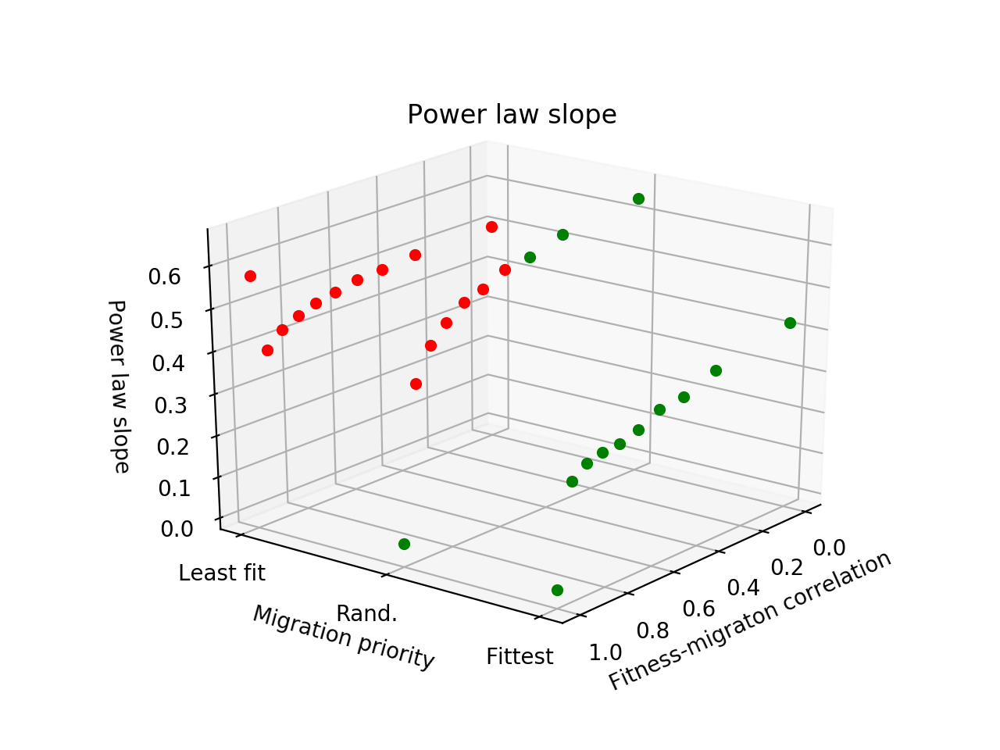

Text(0.5, 0.92, 'Power law slope')

In [14]:
# with plt.style.context('seaborn'):
fig = plt.figure()
# fitness_correlation_list = np.linspace(0,1,iters)
# migration_bias_list = [-1,0,1]
ax = fig.add_subplot(111, projection='3d')
#fitness_correlation_list, migration_bias_list = np.meshgrid(fitness_correlation_list, migration_bias_list)
for i in range(len(fitness_correlation_list)):
    for j in range(len(migration_bias_list)):
        ax.scatter(fitness_correlation_list[i], migration_bias_list[j], power_slope[i,j], color = 'red' if mse[i,j]>0.0175 else 'green')
ax.set_xlabel("Fitness-migraton correlation")
ax.set_ylabel("Migration priority")
ax.set_zlabel("Power law slope")
ax.set_yticklabels(['Least fit', 'Rand.', 'Fittest'])
ax.set_yticks([-1,0,1])
# ax.set_zlim([0,1])
# ax.set_yticks([-1,0,1])
plt.title('Power law slope')

In [10]:
def plot_3d(data, title='', plot_surface=False):
    with plt.style.context('ggplot'):
    # if True:
        # plt.scatter(fitness_correlation_list, power_slope[:,0])
        fig = plt.figure(figsize=(6,4))
        ax = plt.gca(projection='3d')
        X,Y = np.meshgrid(fitness_correlation_list, migration_bias_list)
        Z = data.T
        if plot_surface:
            surf = ax.plot_surface(X, Y, Z, cmap='terrain')
            surf = ax.scatter(X, Y, Z, color='black', s=3, alpha=0.5)
        else:
            surf = ax.scatter(X, Y, Z, s=10, alpha=0.9)
        # .plot_wireframe .plot_surface
        plt.xlabel('fitness corr.')
        plt.ylabel('migration bias')        
        plt.title(title)
    #     ax.yaxis.set_major_locator(LinearLocator(1))
    #     ax.yaxis.set_major_formatter(FormatStrFormatter('%i'))
        fig.colorbar(surf, shrink=0.5, aspect=10)

<IPython.core.display.Javascript object>


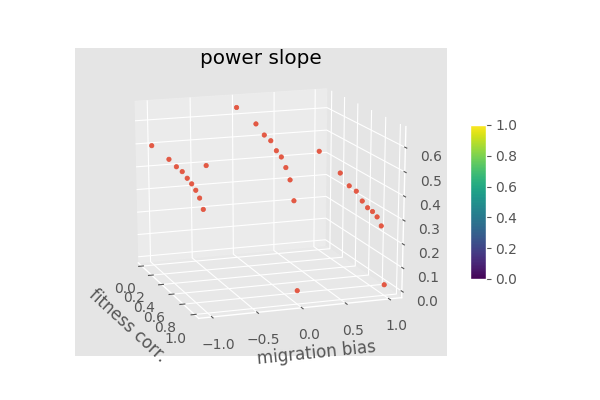

In [11]:
plot_3d(power_slope, title='power slope')

<IPython.core.display.Javascript object>


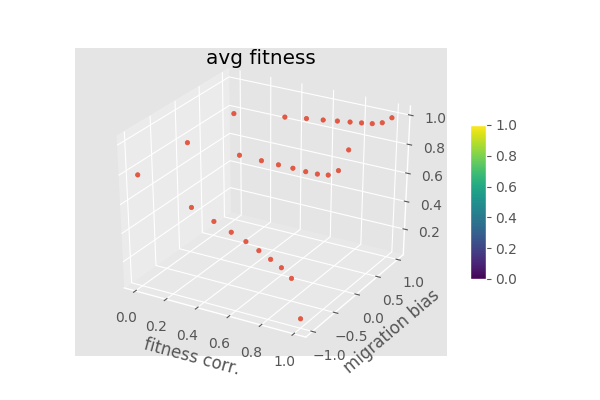

In [13]:
plot_3d(avg_fitness, title='avg fitness')

<IPython.core.display.Javascript object>


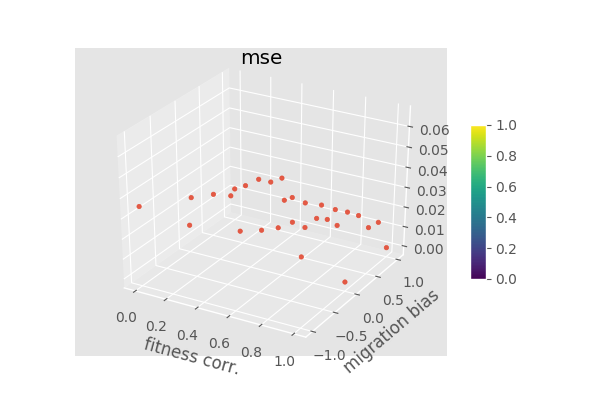

In [17]:
plot_3d(mse, 'mse')

<IPython.core.display.Javascript object>


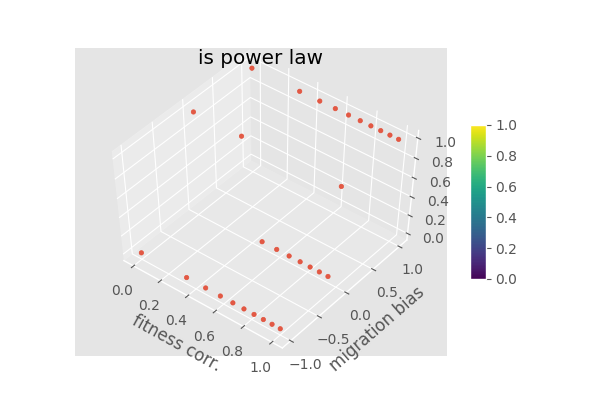

In [18]:
plot_3d(is_power_law, 'is power law')